# FashionAI: Generative Search with OpenAI and RAG Pipeline

###Objective:
The objective is to create a generative search system capable of searching a plethora of fashion product descriptions to find and recommend appropriate choices against a user query.

<br/>

### DataSet:
Utilize the Myntra dataset available on Kaggle to build such a system. (Dataset link: https://www.kaggle.com/datasets/djagatiya/myntra-fashion-product-dataset?select=Fashion+Dataset+v2.csv)

<br/>

### Project Scope:
The project should implement all three layers effectively. It will be key to try out various strategies and experiments in various layers in order to build an effective search system.

**The Embedding Layer**: The CSV document needs to be effectively processed, cleaned, and prepared for embedding.

**The Search Layer**: First need to design at least 3 queries against which you will test your system. Next, you need to embed the queries and search your vector database against each of these queries. Implementing a cache mechanism is also mandatory.

Finally, you need to implement the re-ranking block, and for this you can choose from a range of cross-encoding models on HuggingFace.

**The Generation Layer**: In the generation layer, the final prompt that you design is the major component.

By effectively addressing each layer and conducting systematic experiments, the aim is to build a highly functional and efficient fashion search system tailored to meet user needs.

<br/>

---

## Overall System Diagram

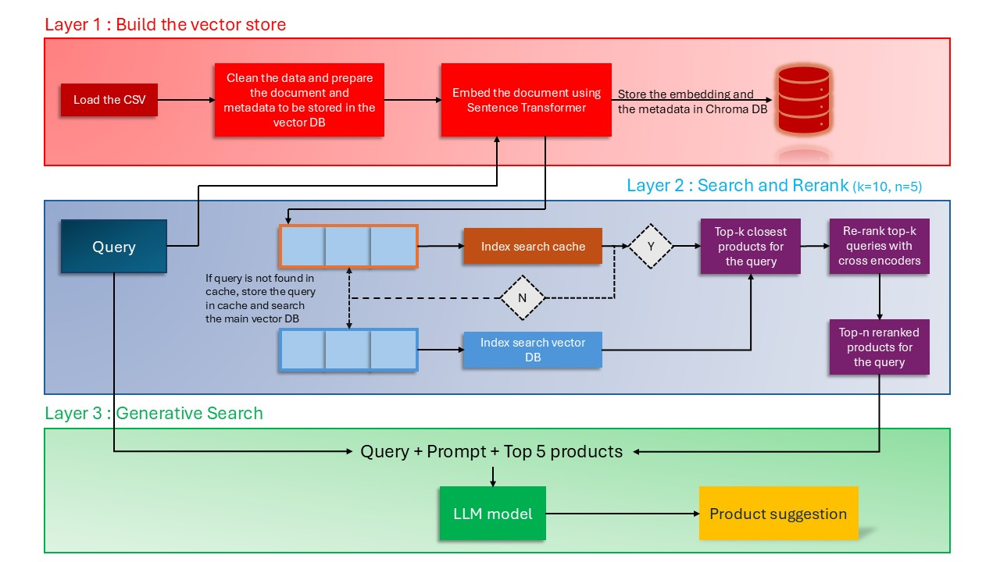

## Install and Import the required Libraries

In [1]:
# Install all the required libraries
!pip install -U -q openai chromadb sentence-transformers einops tiktoken Pillow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 1.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 362.9/362.9 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 584.3/584.3 kB 24.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 59.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.1/227.1 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 36.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 58.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 273.8/273.8 kB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 4.8 MB/s eta 0:

In [2]:
# Import Required libraries
import pandas as pd # for data manipulation
import openai # for accessing GPI models
import matplotlib.pyplot as plt # for visualization
import os # Utilize operating system
import re # for regular expression
import matplotlib.image as mping
from matplotlib import table # for table visualization in matplotlib
import chromadb # for database operation
import json # working with JSON
import string # for string manipulation
from PIL import Image # for image processing
from io import BytesIO # Handling Binary data
from pathlib import Path # for file path
from operator import itemgetter # for sorting libraries
import tiktoken # Assuming this is a custome library for tokanization
from sklearn.feature_extraction.text import TfidfVectorizer # for TF-IDF Vectorizer
from sklearn.metrics.pairwise import cosine_similarity # for cosine claculation
from nltk.corpus import stopwords  # Stopwords for text processing
from nltk.tokenize import word_tokenize  # Tokenization
import requests # for making HTTP requests
# Import the CrossEncoder library from sentence_transformers
from sentence_transformers import CrossEncoder, util
# Importing required functions and classes from ChromaDB
from chromadb.utils.embedding_functions import OpenAIEmbeddingFunction

/usr/local/lib/python3.10/dist-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange


## Download the Dataset from Kaggle

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


Set Up the Kaggle API using kaggle.json

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 '/content/drive/MyDrive/Data Science/06-GenAI/08-HelpMate AI Project/Fashion Search AI/kaggle.json'  # Permissions set to read-only for the owner

cp: cannot stat 'kaggle.json': No such file or directory


In [ ]:
!kaggle datasets download -d djagatiya/myntra-fashion-product-dataset

Dataset URL: https://www.kaggle.com/datasets/djagatiya/myntra-fashion-product-dataset
License(s): CC0-1.0
myntra-fashion-product-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip -o myntra-fashion-product-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: images/17666218.jpg     
  inflating: images/17666226.jpg     
  inflating: images/17668194.jpg     
  inflating: images/17669470.jpg     
  inflating: images/17669482.jpg     
  inflating: images/17670882.jpg     
  inflating: images/17671914.jpg     
  inflating: images/17672184.jpg     
  inflating: images/17673426.jpg     
  inflating: images/17674466.jpg     
  inflating: images/17674588.jpg     
  inflating: images/17674672.jpg     
  inflating: images/17674884.jpg     
  inflating: images/17675286.jpg     
  inflating: images/17676948.jpg     
  inflating: images/17678866.jpg     
  inflating: images/17680232.jpg     
  inflating: images/17680940.jpg     
  inflating: images/17681042.jpg     
  inflating: images/17681050.jpg     
  inflating: images/17681054.jpg     
  inflating: images/17681260.jpg     
  inflating: images/17681700.jpg     
  inflating: images/17681788.jpg     
  inflating: images/17681944.jpg     

---
## Layer 1 : The Embedding Layer

In [ ]:
# Define the path to the Fashion Dataset CSV file.
file_path = '/content/drive/MyDrive/Data Science/06-GenAI/08-HelpMate AI Project/Fashion Search AI/'

# Read the CSV file into a pandas DataFrame.
fashion_df = pd.read_csv(file_path + 'Fashion Dataset v2.csv')

# Display the first few rows of the DataFrame to inspect the data.
fashion_df.head()

,p_id,name,products,price,colour,brand,img,ratingCount,avg_rating,description,p_attributes
0,17048614,Khushal K Women Black Ethnic Motifs Printed Ku...,"Kurta, Palazzos, Dupatta",5099.0,Black,Khushal K,http://assets.myntassets.com/assets/images/170...,4522.0,4.418399,Black printed Kurta with Palazzos with dupatta...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
1,16524740,InWeave Women Orange Solid Kurta with Palazzos...,"Kurta, Palazzos, Floral Print Dupatta",5899.0,Orange,InWeave,http://assets.myntassets.com/assets/images/165...,1081.0,4.119334,Orange solid Kurta with Palazzos with dupatta<...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
2,16331376,Anubhutee Women Navy Blue Ethnic Motifs Embroi...,"Kurta, Trousers, Dupatta",4899.0,Navy Blue,Anubhutee,http://assets.myntassets.com/assets/images/163...,1752.0,4.161530,Navy blue embroidered Kurta with Trousers with...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ..."
3,14709966,Nayo Women Red Floral Printed Kurta With Trous...,"Kurta, Trouser, Dupatta",3699.0,Red,Nayo,http://assets.myntassets.com/assets/images/147...,4113.0,4.088986,Red printed kurta with trouser and dupatta<br>...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ..."
4,11056154,AHIKA Women Black & Green Printed Straight Kurta,Kurta,1350.0,Black,AHIKA,http://assets.myntassets.com/assets/images/110...,21274.0,3.978377,"Black and green printed straight kurta, has a ...","{'Body Shape ID': '424', 'Body or Garment Size..."


### Data Clenup

We can ignore `'img'` column since it contains _URI_ for the product image which is already available in _'dataset/images'_ folder with the file name given in `'p_id'` column.

In [ ]:
# Remove the 'img' column from the fashion DataFrame to exclude image data.
fashion_df = fashion_df.drop(columns=['img'])

# Display the first few rows of the modified DataFrame.
fashion_df.head()

,p_id,name,products,price,colour,brand,ratingCount,avg_rating,description,p_attributes
0,17048614,Khushal K Women Black Ethnic Motifs Printed Ku...,"Kurta, Palazzos, Dupatta",5099.0,Black,Khushal K,4522.0,4.418399,Black printed Kurta with Palazzos with dupatta...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
1,16524740,InWeave Women Orange Solid Kurta with Palazzos...,"Kurta, Palazzos, Floral Print Dupatta",5899.0,Orange,InWeave,1081.0,4.119334,Orange solid Kurta with Palazzos with dupatta<...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32..."
2,16331376,Anubhutee Women Navy Blue Ethnic Motifs Embroi...,"Kurta, Trousers, Dupatta",4899.0,Navy Blue,Anubhutee,1752.0,4.161530,Navy blue embroidered Kurta with Trousers with...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ..."
3,14709966,Nayo Women Red Floral Printed Kurta With Trous...,"Kurta, Trouser, Dupatta",3699.0,Red,Nayo,4113.0,4.088986,Red printed kurta with trouser and dupatta<br>...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ..."
4,11056154,AHIKA Women Black & Green Printed Straight Kurta,Kurta,1350.0,Black,AHIKA,21274.0,3.978377,"Black and green printed straight kurta, has a ...","{'Body Shape ID': '424', 'Body or Garment Size..."


> We can see that the description cloumn is in a HTML format. Let's clean that up.

In [ ]:
# Peek into the description of the first item in the fashion DataFrame.
fashion_df.description[0]

"Black printed Kurta with Palazzos with dupatta <br> <br> <b> Kurta design:  </b> <ul> <li> Ethnic motifs printed </li> <li> Anarkali shape </li> <li> Regular style </li> <li> Mandarin collar,  three-quarter regular sleeves </li> <li> Calf length with flared hem </li> <li> Viscose rayon machine weave fabric </li> </ul> <br> <b> Palazzos design:  </b> <ul> <li> Printed Palazzos </li> <li> Elasticated waistband </li> <li> Slip-on closure </li> </ul>Dupatta Length 2.43 meters Width:&nbsp;88 cm<br>The model (height 5'8) is wearing a size S100% Rayon<br>Machine wash"

In [ ]:
# Define a function to remove HTML tags from the input string.
def remove_html_tags(html_string):
    # Regular expression pattern to match text between HTML tags.
    pattern = re.compile(r'<.*?>')

    # Use regular expression to replace HTML tags with spaces.
    python_string = re.sub(pattern, ' ', html_string)

    # Split the string by spaces, remove empty strings, and join them back.
    python_string = python_string.split(' ')
    python_string = list(filter(lambda x: x != "", python_string))
    python_string = " ".join(python_string)

    # Return the cleaned Python string.
    return python_string

In [ ]:
# An example clean up
remove_html_tags(fashion_df.description[0])

"Black printed Kurta with Palazzos with dupatta Kurta design: Ethnic motifs printed Anarkali shape Regular style Mandarin collar, three-quarter regular sleeves Calf length with flared hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Dupatta Length 2.43 meters Width:&nbsp;88 cm The model (height 5'8) is wearing a size S100% Rayon Machine wash"

> Let us apply the **HTML** cleanup on the `'description'` column

In [ ]:
# Apply the remove_html_tags function to clean HTML tags from the 'description' column
# and create a new column 'cleaned_desc' in the fashion DataFrame.
fashion_df['cleaned_desc'] = fashion_df['description'].apply(lambda x: remove_html_tags(x))

# Display the first few rows of the modified DataFrame.
fashion_df.head()

,p_id,name,products,price,colour,brand,ratingCount,avg_rating,description,p_attributes,cleaned_desc
0,17048614,Khushal K Women Black Ethnic Motifs Printed Ku...,"Kurta, Palazzos, Dupatta",5099.0,Black,Khushal K,4522.0,4.418399,Black printed Kurta with Palazzos with dupatta...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32...",Black printed Kurta with Palazzos with dupatta...
1,16524740,InWeave Women Orange Solid Kurta with Palazzos...,"Kurta, Palazzos, Floral Print Dupatta",5899.0,Orange,InWeave,1081.0,4.119334,Orange solid Kurta with Palazzos with dupatta<...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32...",Orange solid Kurta with Palazzos with dupatta ...
2,16331376,Anubhutee Women Navy Blue Ethnic Motifs Embroi...,"Kurta, Trousers, Dupatta",4899.0,Navy Blue,Anubhutee,1752.0,4.161530,Navy blue embroidered Kurta with Trousers with...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ...",Navy blue embroidered Kurta with Trousers with...
3,14709966,Nayo Women Red Floral Printed Kurta With Trous...,"Kurta, Trouser, Dupatta",3699.0,Red,Nayo,4113.0,4.088986,Red printed kurta with trouser and dupatta<br>...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ...",Red printed kurta with trouser and dupatta Kur...
4,11056154,AHIKA Women Black & Green Printed Straight Kurta,Kurta,1350.0,Black,AHIKA,21274.0,3.978377,"Black and green printed straight kurta, has a ...","{'Body Shape ID': '424', 'Body or Garment Size...","Black and green printed straight kurta, has a ..."


### Data Visualization

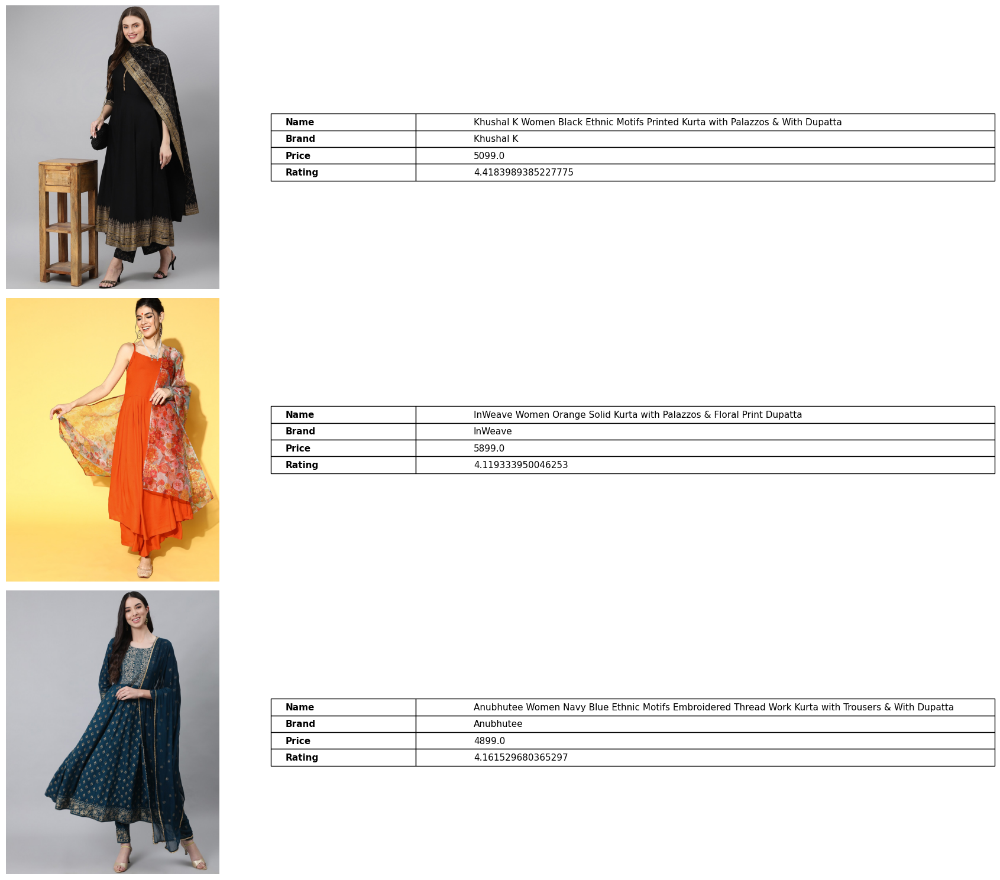

In [ ]:
# Import the necessary module
from PIL import Image, UnidentifiedImageError

# Define the path to the images folder
#images_folder_path = file_path + 'IMAGES'
images_folder_path = '/content/images/'

# Define a function to display images with mini tables
def display_images_with_info(df, images_folder_path, num_images=3):
    """
    Display images with accompanying mini tables containing information from the DataFrame.

    Args:
    - df: DataFrame containing image information
    - images_folder_path: Path to the folder containing the images
    - num_images: Number of images to display

    Returns:
    None
    """
    # Create subplots to display images and mini tables
    fig, axes = plt.subplots(num_images, 2, figsize=(20, num_images * 5))

    # Track the number of images displayed
    images_displayed = 0

    # Iterate over each row in the DataFrame and display the image with mini table
    for i, (idx, row) in enumerate(df.iterrows()):
        # Construct the path to the image file
        image_path = os.path.join(images_folder_path, str(row['p_id']) + '.jpg')

        # Check if the file exists and try to open it
        if os.path.exists(image_path):
            try:
                img = Image.open(image_path)
                 # Display the image
                axes[images_displayed, 0].imshow(img)
                axes[images_displayed, 0].axis('off')

                # Create a mini table with information from the DataFrame
                table_data = [['Name', row['name']],
                              ['Brand', row['brand']],
                              ['Price', row['price']],
                              ['Rating', row['avg_rating']]]

                axes[images_displayed, 1].axis('off')
                mini_table = axes[images_displayed, 1].table(cellText=table_data, loc='center', cellLoc='left', colWidths=[0.2, 0.8])

                # Format the mini table
                for cell in mini_table.get_celld().values():
                    if cell.get_text().get_text() in ['Name', 'Brand', 'Price', 'Rating']:
                        cell.get_text().set_fontweight('bold')
                    cell.get_text().set_fontsize(12)

                # Set font size explicitly for all cells
                mini_table.auto_set_font_size(False)
                mini_table.set_fontsize(11)
                mini_table.scale(1.2, 1.2)  # Adjust the scaling factor as needed

                # Increment the count of displayed images
                images_displayed += 1

                # Stop if the required number of images have been displayed
                if images_displayed >= num_images:
                    break
            except UnidentifiedImageError:
                print(f"Unable to open image: {image_path}. Check if it's corrupted or in a supported format.")
        else:
            print(f"Image not found: {image_path}")

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()


# Display images with mini tables
display_images_with_info(fashion_df, images_folder_path, num_images=3)

### Metadata Preparation

- The product information is currently fragmented across various columns, hindering comprehensive keyword searches.
- Since our query focuses solely on documents, this fragmentation poses limitations.
<br>

- There are two solutions:
    - *Option 1*: Centralize all the product details as metadata. Develop a chatbot to extract metadata values, facilitating precise filtering. Utilize the filtered results to construct a RAG model.
    - *Option 2*: Compile a cohesive document called as 'metadata' incorporating all product details. Load this document entirely into the document section of the vector DB. This ensures vector DB is aware of additional keywords used in user queries.
    
> For the present task, I opted for option 2 for enhanced efficiency.

In [ ]:
# Convert the data to a dictionary format with metadata
fashion_df['metadata'] = fashion_df.apply(
    lambda x: {
        'Product_id': x['p_id'],  # Unique identifier for the product
        'Name': x['name'],  # Product name
        'Product_type': x['products'],  # Type or category of the product
        'Price_INR': x['price'],  # Price of the product in Indian Rupees
        'Colour': x['colour'],  # Color of the product
        'Brand': x['brand'],  # Brand of the product
        'RatingCount': x['ratingCount'],  # Number of ratings received
        'Rating': x['avg_rating'],  # Average rating of the product
        'Description': x['cleaned_desc'],  # Description of the product
        'Product_attributes': x['p_attributes']  # Additional attributes of the product
    }, axis=1
)

# Display the first few rows of the modified DataFrame.
fashion_df.head()

,p_id,name,products,price,colour,brand,ratingCount,avg_rating,description,p_attributes,cleaned_desc,metadata
0,17048614,Khushal K Women Black Ethnic Motifs Printed Ku...,"Kurta, Palazzos, Dupatta",5099.0,Black,Khushal K,4522.0,4.418399,Black printed Kurta with Palazzos with dupatta...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32...",Black printed Kurta with Palazzos with dupatta...,"{'Product_id': 17048614, 'Name': 'Khushal K Wo..."
1,16524740,InWeave Women Orange Solid Kurta with Palazzos...,"Kurta, Palazzos, Floral Print Dupatta",5899.0,Orange,InWeave,1081.0,4.119334,Orange solid Kurta with Palazzos with dupatta<...,"{'Add-Ons': 'NA', 'Body Shape ID': '443,333,32...",Orange solid Kurta with Palazzos with dupatta ...,"{'Product_id': 16524740, 'Name': 'InWeave Wome..."
2,16331376,Anubhutee Women Navy Blue Ethnic Motifs Embroi...,"Kurta, Trousers, Dupatta",4899.0,Navy Blue,Anubhutee,1752.0,4.161530,Navy blue embroidered Kurta with Trousers with...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ...",Navy blue embroidered Kurta with Trousers with...,"{'Product_id': 16331376, 'Name': 'Anubhutee Wo..."
3,14709966,Nayo Women Red Floral Printed Kurta With Trous...,"Kurta, Trouser, Dupatta",3699.0,Red,Nayo,4113.0,4.088986,Red printed kurta with trouser and dupatta<br>...,"{'Add-Ons': 'NA', 'Body Shape ID': '333,424', ...",Red printed kurta with trouser and dupatta Kur...,"{'Product_id': 14709966, 'Name': 'Nayo Women R..."
4,11056154,AHIKA Women Black & Green Printed Straight Kurta,Kurta,1350.0,Black,AHIKA,21274.0,3.978377,"Black and green printed straight kurta, has a ...","{'Body Shape ID': '424', 'Body or Garment Size...","Black and green printed straight kurta, has a ...","{'Product_id': 11056154, 'Name': 'AHIKA Women ..."


### Generate and Store Embeddings using OpenAI and ChromaDB

In this section, we will embed the metadata in the dataframe through OpenAI's text-embedding-ada-002 model, and store them in a ChromaDB collection.

In [ ]:
# Read the API key from the text file and strip any leading or trailing whitespace
with open(file_path + "OPENAI_API_Key.txt", "r") as f:
    api_key = f.read().strip()

# Set the API key for OpenAI
openai.api_key = api_key

In [ ]:
# Define the path for storing ChromaDB collections
chroma_data_path = file_path + 'ChromaDB_Data'

# Initialize the ChromaDB client with the specified data path
client = chromadb.PersistentClient(path=chroma_data_path)

# Set up the embedding function using the OpenAI embedding model
model = "text-embedding-ada-002"
embedding_function = OpenAIEmbeddingFunction(api_key=api_key, model_name=model)

In [ ]:
# Function to extract text for embedding
def extract_text(metadata):
    """
    Extracts text content from the metadata dictionary for embedding.

    Args:
    metadata (dict): Dictionary containing metadata information.

    Returns:
    str: Text content extracted from the metadata.
    """
    text_content = ""
    if "Description" in metadata and metadata["Description"]:
        text_content += metadata["Description"]  # Add product description
    if "name" in metadata:
        text_content += " " + metadata["name"]  # Add product name
    if not text_content:
        text_content = "No description available."
    return text_content.strip()  # Strip leading and trailing whitespace

In [ ]:
# Extract text for embedding from each row of metadata
documents = [extract_text(row['metadata']) for _, row in fashion_df.iterrows()]

# Get or create a ChromaDB collection for fashion products
fashion_collection = client.get_or_create_collection(name='Fashion_Products', embedding_function=embedding_function)

# Add the data to the ChromaDB collection
for idx, (p_id, metadata) in enumerate(zip(fashion_df['p_id'], fashion_df['metadata'])):
    print(f"Processing document with p_id={p_id}")
    print(f"Document text: {documents[idx]}")
    fashion_collection.add(
        documents=[documents[idx]],  # Text content of the document
        ids=[str(p_id)],  # Unique identifier of the document
        metadatas=[metadata]  # Metadata associated with the document
    )

print("Data added to ChromaDB collection!")

Processing document with p_id=17048614
Document text: Black printed Kurta with Palazzos with dupatta Kurta design: Ethnic motifs printed Anarkali shape Regular style Mandarin collar, three-quarter regular sleeves Calf length with flared hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Dupatta Length 2.43 meters Width:&nbsp;88 cm The model (height 5'8) is wearing a size S100% Rayon Machine wash


Processing document with p_id=16524740
Document text: Orange solid Kurta with Palazzos with dupatta Kurta design: Solid A-line shape Regular style Square neck, sleeveless shoulder straps Calf length with straight hem Viscose rayon machine weave fabric Palazzos design: Solid Palazzos Elasticated waistband Zip closure Dupatta Design: Floral Printed Kurta Fabric: Viscose rayon Bottom Fabric:&nbsp;Viscose rayon Dupatta Fabric: Organza Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16331376
Document text: Navy blue embroidered Kurta with Trousers with dupatta Kurta design: Ethnic motifs embroidered A-line shape Regular style Round neck, three-quarter no sleeves Thread work detail Above knee length with flared hem Viscose rayon machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure Viscose rayon Hand WashThe model (height 5'8) is wearing a size S
Processing document with p_id=14709966
Document text: Red printed kurta with trouser and dupatta Kurta design: Printed kurta Anarkali design Round neck Three-quarter sleeves Flared hem Calf length Trouser design: Printed trousers Elasticated waistband Slip-on closure Dupatta design: White and red printed dupatta Top fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Cotton Blend Hand washDupatta length: 2 metres (approx.) The model (height 5'8) is wearing a size S


Processing document with p_id=11056154
Document text: Black and green printed straight kurta, has a nitched round neck, three-quarter sleeves, straight hem, side slitsMaterial: Cotton Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=18704418
Document text: Colour: red Solid woven design Mandarin collar Long, regular sleeves Anarkali shape with pleated style Thread work detail Ankle length with flared hem Machine weave regular georgette The model (height 5'8) is wearing a size S Georgette


Processing document with p_id=14046594
Document text: Stately and versatile, this kurta set will be your top choice. Its eye-catching printed kurta comes with snug printed palazzos and a gorgeous printed dupatta for added appeal. Kurta design: Floral printed Anarkali shape Pleated style Keyhole neck, three-quarter regular sleeves Gotta patti detail Calf length with flared hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure 2 pockets Dupatta Design Printed dupatta Top fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14951330
Document text: When in doubt, rock this simple yet stylish kurta set at any traditional function. It comes with an elegant printed kurta and snug printed palazzos for comfort.&nbsp; Kurta: Classy beige tone Attractive round neck Long regular sleeves Calf length Poly crepe, machine wash Palazzos: Printed palazzos Partially elasticated waist Poly crepe, machine wash Tassels border Printed pattern Net, machine wash Trend Alert Symbols of freshness and beauty, romantic florals in vibrant hues and prints have been a mainstay in fashion for decades. Right from delicate all-over patterns to abstract and oversized motifs, romantic florals lend any garment a feminine touch.Top fabric: Poly Crepe Bottom fabric: Poly Crepe Dupatta fabric: Net Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=13791594
Document text: Yellow and white printed kurta with palazzos Yellow and white straight knee length kurta, has a round neck, th

Processing document with p_id=17048604
Document text: Green &amp; pink printed kurta with palazzos &amp; dupatta Kurta design: Ethnic motifs printed A-line shape Regular&nbsp; style Round neck, three-quarter regular sleeves Gotta patti detail Calf length with flared hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Comes with pink solid dupatta Dupatta: 2.4 x 0.8 meters The model (height 5'8) is wearing a size STop: 100% Cotton Bottom: 100% Cotton Dupatta: Silk Chiffon Machine wash


Processing document with p_id=10356859
Document text: This set includes: Kurta and Trousers A smart piece with a floral trend signature, the contemporary styling components ups the exclusivity of this set. The shades of taffy pink beautifully contrasts with the luxe blue floral motifs, while the structured silhouette gives it a casual edge. Design, comfort and a smart overall look, this set is elegance personified! Kurta: All over floral print, hook and eye keyhole neck, short sleeves, calf length with tapered slits, smart styling with side pocket Trousers: Variegated grainy stripes in crop-cut with elastic&nbsp;back, slip-on styling, 2 pockets Pure cotton, Machine-wash The model (height 5'8") is wearing a size S


Processing document with p_id=12413214
Document text: Mustard yellow floral yoke embroidered straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: 100% Cotton Dry Clean
Processing document with p_id=16600750
Document text: Teal yoke design Kurta with Trousers with dupatta Kurta design: Ethnic motifs yoke design A-line shape Panelled style Keyhole neck, three-quarter regular sleeves Calf length with flared hem Poly silk machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Zip closure The model (height 5'8) is wearing a size S Dupatta length 2.25 mtr Width 0.7 mtrKurta: Poly Silk Bottom:&nbsp;Poly Silk Dupatta: Art Silk Hand wash


Processing document with p_id=9867983
Document text: Navy blue printed Kurta with Palazzos Kurta design: Floral printed Straight shape Regular style Mandarin collar, three-quarter roll-up sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=14399798
Document text: Peach-coloured yoke design kurta with palazzos with dupatta Kurta design: Ethnic motifs yoke design Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Palazzos design: Solid trousers Partially elasticated waistband Slip-on closure Two pockets Dupatta Solid dupatta Top fabric: 100% Viscose Rayon Bottom fabric: 100% Viscose Rayon Dupatta fabric: Poly Chiffon Hand washThe model (height 58) is wearing a size S


Processing document with p_id=18372852
Document text: Maroon yoke design Kurta with Trousers with dupatta Kurta design: Ethnic motifs yoke design Straight shape Regular style Mandarin collar, three-quarter regular sleeves Thread work detail Calf length with straight hem Silk blend machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Drawstring closure The model (height 5'8) is wearing a size STop fabric: Silk Blend Bottom fabric: Silk Blend Dupatta fabric: Silk Chiffon Dry clean
Processing document with p_id=15241816
Document text: Colour: yellow and peach coloured Floral screen printed Round neck Three-quarter, regular sleeves Straight shape with regular style Gotta patti detail Calf length with straight hem Machine weave regular cotton Cotton Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=10808284
Document text: Make a statement with this green kurta that embodies the beauty of simple style. This straight kurta with pastel floral print all-over accents keyhole neck that makes for an ideal piece for both day and night &nbsp; Colour: Green with white floral accents keyhole neck&nbsp; 3/Q roll-up sleeves straight silhouette&nbsp;with a firm drape Knee length Cotton, Machine-wash The model (height 5'8") is wearing a size S The model (height 5'8") is wearing a size S
Processing document with p_id=14376546
Document text: Colour: black and orange Bandhani printed Mandarin collar Button closure Sleeveless, no sleeves A-line shape with regular style Calf length with flared hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=19240164
Document text: Colour: navy blue Floral embroidered Boat neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Knitted regular viscose rayon The model (height 5'8) is wearing a size SViscose Rayon Hand Wash


Processing document with p_id=15055304
Document text: Blue embroidered Kurta with Churidar with dupatta Kurta design: Geometric embroidered A-line shape Panelled style Round neck, long regular sleeves 2 pockets Floor length with flared hem Poly georgette machine weave fabric Churidar design: Solid Churidar Elasticated waistband Slip-on closure Top fabric: Poly Georgette Bottom fabric: Silk Blend Dupatta fabric: Net Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=14649544
Document text: Blue printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure Dupatta design: Printed dupatta Solid border Top fabric: Viscose Rayon Bottom fabric: Viscose Rayon Dupatta fabric: Viscose Rayon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17581924
Document text: Sea green yoke design Top with Skirt with dupatta Top design: Floral yoke design A-line shape Pleated style V-neck, short flared sleeves Na pockets Above knee length with curved hem Pure cotton machine weave fabric Skirt design: Printed Skirt Elasticated waistband Zip closure The model (height 5'8) is wearing a size S Machine Wash as per Tag


Processing document with p_id=13810898
Document text: Blue and green printed kurta with palazzos and dupatta Blue and green straight calf length kurta, has a mandarin collar, three-quarter sleeves, side slits Green solid palazzos, has partially elasticated waistband, slip-on closure Blue and green printed dupatta, has printed borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: pure cotton Hand-wash
Processing document with p_id=15150620
Document text: Pink embroidered Kurta with Trousers with dupatta Kurta design: Ethnic motifs embroidered Straight shape Regular style Round neck Tree-quarter regular sleeves Sequinned detail Calf length&nbsp; Straight hem Side details Viscose rayon knitted and woven fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Embroidered dupattaTop fabric: Viscose Silk Bottom fabric: Viscose Silk Dupatta fabric: Organza Machine washThe model (height 5'8) is weari

Processing document with p_id=19240246
Document text: Teal solid Kurta with Palazzos with dupatta Kurta design: Floral solid Anarkali shape Panelled style Round neck, long regular sleeves Floor length with flared hem Art silk knitted fabric Palazzos design: Self design Palazzos Elasticated waistband Slip-on closure DRY CLEAN ONLY The model (height 5'8) is wearing a size S
Processing document with p_id=12766966
Document text: Red, orange and pink bandhani printed anarkali kurta with gotta patti detailing, has a round neck, three-quarter sleeves, and flared hemMaterial: Viscose Rayon Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=14023594
Document text: Maroon printed kurta with palazzos and dupatta Maroon A-line calf length kurta, has a V-neck, three-quarter sleeves, front slit Maroon printed palazzos, has partially elasticated waistband, slip-on closure Maroon printed dupatta, has taping borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: pure cotton Machine-wash
Processing document with p_id=14346084
Document text: Pink and white Floral Screen Print A-Line Pure Cotton Kurta Set With Dupatta Kurti design: Floral printed A-line design Regular&nbsp;style Round neck, three-quarter regular sleeve Calf length with flared hem Machine weave regular Trousers design: Printed Elasticated waistband Slip-on closure Comes with a Dupatta Top fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Cotton Blend Machine washDupatta length: 2.25 metre (approx.) The model (height 58) is wearing a size S


Processing document with p_id=18829920
Document text: Lime green embroidered Top with Sharara with dupatta Top design: Geometric embroidered A-line shape Layered style Boat neck, sleeveless no sleeves Na pockets thread work detail Above knee length with straight hem Poly georgette knitted fabric Sharara design: Embroidered Sharara Elasticated waistband Zip closure 50 %Polyster And 50 % cottton georgette The model (height 5'8) is wearing a size S


Processing document with p_id=11459658
Document text: This set includes: Kurta, Trousers and Dupatta The robust flowy silhouette of this piece stands out on its own, as does the ethnic floral patterning all over. Crafted with precision, the intricate stencilling techniques and gotta lace panelling has given this kurta set a sharp edged finishing. If daily comfort with a design marvel is what you're looking for in your ethnic wear, then you've stumbled upon the right thing here! Kurta: Mulberry screen printed ethnic floral pattern all-over with gotta lace, boat neck, 3/4th sleeves, mid calf-length with flared hem Trousers: Blushed tone in clean crop-cut, semi-elasticated waistline with slip-on styling Dupatta: Ethnic screen print with striped and solid alternate bordering Pure cotton, hand-wash The model (height 5'8") is wearing a size S


Processing document with p_id=16522612
Document text: Pink embroidered Kurta with Skirt with dupatta Kurta design: Floral embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Gotta patti detail Calf length with straight hem Viscose rayon machine weave fabric Skirt design: Embroidered Skirt Drawstring closure The model (height 5'8) is wearing a size SSilk blend Dry clean only


Processing document with p_id=15150642
Document text: Teal blue &amp; Pink yoke design Kurta with Trousers with dupatta Kurta design: Solid yoke design Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Art silk knitted and woven fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure 1 pockets Top fabric: Art Silk Bottom fabric: Art Silk Dupatta fabric: Organza Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16875218
Document text: Colour: maroon and grey Ethnic motifs printed V-neck Three-quarter, regular sleeves A-line shape with regular style Knee length with straight hem Machine weave regular polyester The model (height 5'8) is wearing a size S100% Polyester Machine-wash
Processing document with p_id=10808290
Document text: Green and Mustard yellow printed straight kurta, has a keyhole neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SCotton Hand-wash


Processing document with p_id=12246214
Document text: Maroon and gold printed kurti with sharara and dupatta Maroon and gold straight knee length kurti, has a round neck, sleeveless, side slits Maroon and gold printed sharara, has partially elasticated waistband, slip-on closure Maroon and gold printed dupatta, has taping borderKurta fabric: poly georgette Bottom fabric: poly georgette Dupatta fabric: poly georgette Machine-washThe model (height 5'8") is wearing a size S Dupatta Length - 2.25 m Dupatta Width - 0.52 m


Processing document with p_id=9438657
Document text: Black and mustard yellow solid kurta with trousers and dupatta Black solid straight calf length kurta, has a boat neck, three-quarter sleeves, side slits Black solid solid trousers, has elasticated waistband, slip-on closure Black and mustard yellow printed dupatta, has tassels borderKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: pure cotton Hand-washThe model (height 5'8") is wearing a size S
Processing document with p_id=16331336
Document text: Teal printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Anarkali shape Empire style Round neck, three-quarter regular sleeves Thread work detail Above knee length with flared hem Pure cotton machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure Cotton Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=7763575
Document text: Red Floral Print&nbsp;A-line kurta, has a round neck, short sleeves, flared hem, has gathers along the waistThe model (height 5'8") is wearing a size S100% viscose Hand-wash
Processing document with p_id=19357994
Document text: Colour: pink Ethnic motifs woven design Round neck Three-quarter, regular sleeves Straight shape with tiered style Calf length with straight hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size SRayon Hand wash


Processing document with p_id=18957838
Document text: Fluorescent green embroidered Kurta with Churidar with dupatta Kurta design: Ethnic motifs embroidered Anarkali shape Pleated style Keyhole neck, three-quarter flared sleeves Na pockets Calf length with flared hem Pure cotton machine weave fabric Churidar design: Printed Churidar Partially elasticated waistband Zip closure Pure cotton Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=18425500
Document text: Colour: pink Ethnic motifs solid V-neck Three-quarter, flared sleeves Anarkali shape with pleated style Ankle length with flared hem Machine weave regular viscose rayon Dry Clean The model (height 5'8) is wearing a size S


Processing document with p_id=14925332
Document text: Colour: mustard yellow and red Geometric printed V-neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton 100% Cotton Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=18811288
Document text: Teal embroidered Kurta with Trousers with dupatta Kurta design: Floral embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Sequinned detail Calf length with straight hem Silk blend machine weave fabric Trousers design: Solid Trousers Drawstring closure Top &amp; Bottom: Silk blend Dupatta: Poly chiffon Dry clean only Size worn by the model: 36 Chest: 30" Waist: 25" Hips: 35" Height: 5'9"
Processing document with p_id=15646472
Document text: Colour: red Bandhani printed Round neck Three-quarter, regular sleeves Straight shape with regular style Gotta patti detail Calf length with straight hem Machine weave regular cotton Cotton Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=18503778
Document text: Pink embroidered Kurti with Sharara with dupatta Kurti design: Floral embroidered A-line shape Layered style Keyhole neck, three quarter regular sleeves Na pockets gotta patti detail Above knee length with curved hem Viscose rayon machine weave fabric Sharara design: Self design Sharara Elasticated waistband Zip closure The model (height 5'8) is wearing a size S Machine Wash
Processing document with p_id=15561680
Document text: Navy blue &amp; grey printed Kurta with Palazzos Kurta design: Navy blue &amp; gold coloured Ethnic motifs printed A-line shape Regular style Round neck, three-quarter regular sleeves Mirror work detail Calf length with straight hem Viscose rayon machine weave fabric Palazzos design: Grey bottom Embroidered Palazzos Partially Elasticated waistband Slip-on closure Top fabric: Viscose Rayon 100% Bottom fabric: Viscose Rayon 100% Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16857670
Document text: Lavender printed Kurta with Trousers with dupatta Kurta design: Floral printed A-line shape Regular style Round neck, three-quarter regular sleeves 2 pockets Calf length with flared hem Pure cotton knitted and woven fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure Pure Cotton Machine-washThe model (height 5'8) is wearing a size S
Processing document with p_id=13437328
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION With the breezy tiered silhouette and printed pattern, this straight kurta will become your go-to outfit. Top it off with these&nbsp;checked salwar and comfortable flats FEATURES KURTA has a mandarin neck button 

Processing document with p_id=19181470
Document text: Green striped Kurta with Trousers with dupatta Kurta design: Geometric striped A-line shape Regular style Round neck, sleeveless regular sleeves Na pockets Knee length with straight hem Pure cotton machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Kurta - Cotton, Bottom - Cotton, Dupatta - Mul
Processing document with p_id=12105006
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Flaunting this summer-ready kurta set, this kurta set beautifully captures your edgy aesthetic. With an ethnic print, and straight hem, this Sangria kurta is one you'll be eager to show off at college, r

Processing document with p_id=17487194
Document text: Our 3-piece beige woven design silk suit set features a straight-fit floral embroidery kurta with a V-neckline and three-quarter sleeves, straight pants with a partially elasticated waistband and roomy pockets, and a chiffon dupatta in a solid tone. Adorned with complementing fabric-trim detailing, Gota Patti accents on the yoke and sleeves, and delicate tassel details on the dupatta, this elegant style is ideal for festive occasions. Size worn by the model: S Chest: 32'' Waist: 28" Hips: 33'' Height: 5'7" Silk blend&nbsp; Dupatta fabric:&nbsp;Chiffon&nbsp; Machine Wash


Processing document with p_id=11636314
Document text: Blue and Off-white printed anarkali kurta, has a keyhole neck, three-quarter sleeves, attached lining and flared hem93% Cotton and 7% linen Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16706794
Document text: Look stylish when you step out wearing this smart and versatile kurta set. Tailored with an attractive sweetheart neck and sleeveless design, this kurta set is a must-have.&nbsp; Kurta: Stunning magenta tone Charming sweetheart neck Sleeveless Calf length Trend Alert Vintage and whimsical, the I-spy lace flaunts the idea of love and uses delicate lace details or trims in borders of the yoke or hem. It even refers to ensembles made from lace coupled with other intricate detailing, like frills, scallop edges, halter neck, and so on.Top Fabric:Net Bottom Fabric:Net Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=17140538
Document text: Pink embroidered Kurta with Sharara with dupatta Kurta design: Floral printed Anarkali&nbsp; shape Empire style Round neck, sleeveless no sleeves Knee length with flared hem Pure cotton knitted fabric Sharara design: Printed Sharara Elasticated waistband Slip-on closure 

Processing document with p_id=14224616
Document text: Colour: pink and gold-toned Ethnic motifs printed V-neck Three-quarter, regular sleeves A-line shape with regular style Gotta patti detail Calf length with flared hem Knitted regular cotton 60'S COTTON Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=19145056
Document text: Red embroidered Kurta with Churidar with dupatta Kurta design: Solid embroidered A-line shape Pleated style Mandarin collar, sleeveless regular sleeves Na pockets Floor length with high-low hem Pure cotton machine weave fabric Churidar design: Printed Churidar Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SKurta - Cotton Pant - Cotton Dupatta - Chiffon


Processing document with p_id=15508918
Document text: Yellow yoke design Kurta with Trousers with dupatta Kurta design: Floral yoke design Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Trousers design: Embroidered Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Viscose Rayon Bottom fabric: Viscose Rayon Dupatta fabric: Organza Dry clean


Processing document with p_id=17197472
Document text: Purple embroidered Kurta with Trousers with dupatta Kurta design: Floral embroidered Straight shape Regular style Round neck, three-quarter regular sleeves 1 pockets sequinned detail Calf length with straight hem Silk chiffon machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Silk chiffon Bottom fabric: Silk chiffon Dupatta fabric: Silk chiffon Machine wash


Processing document with p_id=13238316
Document text: Purple and white&nbsp; striped straight shape with short sleeves round neck knee length straight hem regular style machine weave cotton&nbsp; cotton machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=3077373
Document text: White solid straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, multiple slits Manufacturing Info:&nbsp;Zurick collection Country of Origin: IndiaCotton Machine-washThe model (height 5'8") is wearing a size S
Processing document with p_id=18859760
Document text: Black solid Kurti with Trousers Kurti design: Floral solid Pathani shape Pleated style Shirt collar, three-quarter roll-up sleeves 1 pockets Calf length with curved hem Pure cotton machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=16919764
Document text: Mustard yellow embroidered Kurti with Sharara Kurti design: Floral printed A-line shape Angrakha style V-neck, short flared sleeves 1 pockets Above knee length with flared hem Viscose rayon knitted and woven fabric Sharara design: Solid Sharara Elasticated waistband Zip closure Viscose rayon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16941854
Document text: Lavender printed Kurti with Sharara with dupatta Kurti design: Ethnic motifs printed Anarkali shape Panelled style Round neck, sleeveless no sleeves Gotta patti detail Above knee length with flared hem Pure cotton machine weave fabric Sharara design: Printed Sharara Elasticated waistband Hook and eye closure The model (height 5'8) is wearing a size STop Fabric:Pure Cotton ,Bottom Fabric:pure cotton ,Dupatta Fabric:Poly Chiffon Machine Wash


Processing document with p_id=15889764
Document text: Colour: green and white Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave&nbsp; Polycotton Machine-wash The model (height 5'8) is wearing a size S
Processing document with p_id=8529019
Document text: This mustard straight kurta is crafted in cotton, features round neck with marigold print all-over Accents&nbsp;thread work on yoke, three-quarter sleeves Straight&nbsp;silhouette Calf length Cotton, hand-wash The model (height 5'8") is wearing a size S


Processing document with p_id=17132180
Document text: Black checked Kurti with Trousers with dupatta Kurti design: Checked Straight shape Regular style Keyhole neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Printed Trousers Elasticated waistband Zip closure The model (height 5'8) is wearing a size SCotton machine wash


Processing document with p_id=14967448
Document text: Green printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed A-line shape Panelled style Round neck, three-quarter regular sleeves Gotta patti detail Calf length with flared hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Dupatta design: Printed Taping border Top fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14224394
Document text: Women Mustard &amp; Gold Printed Straight Kurta With Plazzo &amp; Dupatta The model (height 5'8") is wearing a size S Hand Wash
Processing document with p_id=7156696
Document text: White and navy blue printed anarkali kurta, has a scoop neck, three-quarter sleeves, flared hemThe model (height 5'8") is wearing a size SCotton Machine-wash


Processing document with p_id=17193226
Document text: Teal printed Kurti with Sharara Kurti design: Abstract printed Anarkali shape Regular style Round neck, sleeveless no sleeves Knee length with flared hem Viscose rayon machine weave fabric Sharara design: Printed Sharara Elasticated waistband Slip-on closure Viscose rayon Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=14949672
Document text: Pink printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Boat neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton Machine washDupatta Length: 2m The model (height 5'8) is wearing a size S


Processing document with p_id=9370965
Document text: Pink printed straight kurta, has a keyhole neck, three-quarter sleeves, straight hem, side slits100% cotton Machine-washThe model (height 5'8") is wearing a size S
Processing document with p_id=11434632
Document text: Red embroidered kurta with trousers and dupatta Red straight calf length kurta, has a round neck, three-quarter sleeves, side slits Red solid trousers, has partially elasticated waistband, slip-on closure Red solid dupatta, has taping borderThe model (height 5'8") is wearing a size SKurta fabric: silk blend Bottom fabric: cotton blend Dupatta fabric: organza Dry-clean


Processing document with p_id=13962368
Document text: Flaunt your graceful feminine silhouette in this elegant kurta ket. For a touch of ethnic panache, this set's gorgeous printed kurta and solid palazzos come with a beautiful solid palazzos. Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Sequinned detail Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband 2 pockets&nbsp; Slip-on closure Comes with a dupatta Trend Alert A trend that is going to last forever, white romance is effortless and elegant. It is a regal combination of white with understated tones of silver and bronze, and is characterized by graceful frills, ruffles, and tiering. This sophisticated style is the right choice for breezy summer occasions.Top fabric: Pure Cotton Bottom fabric: Cotton Blend Dupatta fabric: Organza Dry cleanThe model (height 5'8) is wearing a size S
Processing docum

Processing document with p_id=18198270
Document text: Colour: mustard yellow and pink Floral print U-neck Sleeveless Straight shape with side slits Calf length with straight hem Machine weave regular cotton 100% cotton Hand-washThe model (height 5'8) is wearing a size S
Processing document with p_id=17104862
Document text: Charcoal grey printed Top with Palazzos Top design: Floral printed A-line shape Pleated style Round neck, sleeveless Above knee length with flared hem Pure cotton machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash


Processing document with p_id=19240240
Document text: Colour: maroon Striped solid Boat neck Long, flared sleeves Straight shape with high slit style Thread work detail Calf length with high-low hem Knitted regular viscose rayon The model (height 5'8) is wearing a size SViscose Rayon Hand Wash


Processing document with p_id=15150344
Document text: Lavender &amp; White printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Voile Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18165350
Document text: Pink embroidered Kurta with Trousers with dupatta Kurta design: Ethnic motifs embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Cotton blend machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure 1 pockets Dupatta Lenght : 2.3m, Dupatta Width : 85 cm Size worn by the model: S Chest: 32" Waist: 28" Hips: 33" Height: 5'7" Cotton Blend Organza&nbsp; Machine Wash


Processing document with p_id=12307502
Document text: Pink self design kurta with trousers Pink straight calf length kurta, has a round neck, three-quarter sleeves, side slits Pink Solid trousers, has elasticated waistband Pink solid Dupatta with Tasselled borderDupatta: Length: 2 m Width: 1.14 m The model (height 5'8") is wearing a size SKurta fabric: viscose rayon Bottom fabric: viscose rayon Dupatta fabric: silk chiffon Hand-wash
Processing document with p_id=19261926
Document text: Blue printed Trousers Elasticated waistband Drawstring closure Seperate gentle hand wash with mild detergent in cold water &amp; dry inside out in shadow The model (height 5'8) is wearing a size S


Processing document with p_id=16287098
Document text: Colour: navy blue Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Cotton Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=18963536
Document text: Colour: green Ethnic motifs embroidered Round neck Three-quarter, regular sleeves A-line shape with regular style Thread work detail Calf length with flared hem Machine weave regular viscose rayon Viscose rayon Hand wash The model (height 5'8) is wearing a size M
Processing document with p_id=15390174
Document text: Blue printed Kurta with Palazzos with dupatta Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton Dry clean


Processing document with p_id=11197978
Document text: Lime Green and Blue printed A-line kurta, has a round neck, three-quarter sleeves, and flared hem This kurta can also be styled as a dressMaterial: 100% cotton &nbsp;&nbsp; Machine WashThe model (height 5'8") is wearing a size S
Processing document with p_id=10648236
Document text: Green striped straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SViscose Rayon Hand-wash


Processing document with p_id=17447636
Document text: Green printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Anarkali shape Panelled style Round neck, three-quarter flared sleeves Gotta patti detail Floor length with flared hem Viscose rayon machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure Dupatta: Printed dupatta Printed border The model (height 5'8) is wearing a size S100% Rayon Machine Wash


Processing document with p_id=17487138
Document text: Our 3-piece dark green printed suit set, crafted in soft rayon fabric features a straight-fit kurta with a round neckline and three-quarter sleeves, a floral print flowy skirt with a partially elasticated waistband, and a complementing dupatta in a solid tone. Adorned with delicate fabric-trim detailing and Gota Patti accents, this elegant style is ideal for intimate gatherings.Top fabric: Viscose Rayon Bottom fabric: Viscose Rayon Dupatta Fabric: Poly chiffon Machine Wash Size worn by the model: S Chest: 32'' Waist: 28" Hips: 33'' Height: 5'7"
Processing document with p_id=16707970
Document text: Embrace sartorial elegance with this modish kurta set. Including a square neck and three-quarter bell sleeves, this kurta set will enhance your look.&nbsp; Kurta: Gorgeous green shade Beautiful square neck Three-quarter bell sleeves Above knee Trend Alert Ethnic motifs can be small and intricate or bold and large patterns that are designed

Processing document with p_id=14121926
Document text: Purple solid Kurta with Trousers with dupatta Kurta design: Woven design solid Straight shape Regular style Round neck, three-quarter regular sleeves Thread work detail Knee length with straight hem Viscose rayon machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Top fabric: 87% Viscose Rayon, 13%&nbsp;Polyester Bottom fabric: 87% Viscose Rayon, 13%&nbsp;Polyester Dupatta fabric: 91% Polyester, 9% Metallic fibre Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17952212
Document text: Mustard yellow and golden printed Kurta with Palazzos and dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Tie-up neck Three-quarter regular sleeves Calf length with straight hem Side slits Poly chanderi machine weave fabric An attached lining Palazzos design: Solid Palazzos Partially elasticated waistband Drawstring closure Dupatta design Solid dupatta Tassellled border Kurta fabric: 100% polyester Kurta lining: 100% cotton Bottom fabric: 100% cotton Dupatta fabric: Poly chiffon Dry-clean Size worn by the model: 32 Chest: 33.5" Waist: 26" Hips: 36" Height: 5'7"
Processing document with p_id=18184744
Document text: Colour: red and gold-toned Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular viscose rayon Hand wash cold wash Size worn by the model: S Chest: 32" Height: 5'7"


Processing document with p_id=13572242
Document text: Green and blue printed kurta with trousers Green and blue printed straight calf length kurta with embroidered and sequinned detail, has a round neck, three-quarter sleeves, straight hem, side slits Green and blue printed trousers, has partially elasticated waistband, drawstring closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton Bottom fabric: Viscose Rayon Hand-wash


Processing document with p_id=15921898
Document text: Pink embroidered Kurta with Sharara with dupatta Kurta design: Floral embroidered Anarkali shape Regular style Round neck, sleeveless shoulder straps Gotta patti detail Calf length with flared hem Pure cotton machine weave fabric Sharara design: Printed Sharara Elasticated waistband Slip-on closure Pure Cotton Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13647622
Document text: Colour: pink &amp; white Three-quarter sleeves regular sleeves V-neck Ankle length Flared hem A-line shape with angrakha style Machine weave regular cotton cotton hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15098616
Document text: Colour: burgundy and golden Ethnic motifs yoke design Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular polyester Polyester Dry clean The model (height 5'8) is wearing a size S
Processing document with p_id=18887472
Document text: Colour: cream-coloured and blue Ethnic motifs printed V-neck Three-quarter, regular sleeves A-line shape with panelled style Sequinned detail Calf length with straight hem Machine weave regular cotton Pure Cotton Hand-wash Size worn by the model: S Chest: 32" Height: 5'5"


Processing document with p_id=19222130
Document text: Maroon printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Boat neck, three-quarter regular sleeves 1 pockets Calf length with straight hem Art silk machine weave fabric Trousers design: Solid Trousers Elasticated waistband Zip closure Art silk Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19048738
Document text: Copper-toned solid Kurta with Trousers with dupatta Kurta design: Woven design solid A-line shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure silk machine weave fabric Trousers design: Self design Trousers Partially elasticated waistband Zip closure Material : Kurti - Silk&nbsp; Pants - Silk&nbsp; Lining - Cotton&nbsp; Dupatta - Organza Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=9369411
Document text: Black and white striped straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, side slits, half button placketCotton Machine-washThe model (height 5'8") is wearing a size S
Processing document with p_id=17320642
Document text: Navy blue printed Kurta with Trousers with dupatta Kurta design: Floral printed Anarkali shape Regular style Boat neck, three-quarter regular sleeves 1 pockets Calf length with flared hem Pure cotton machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure Comes with dupatta Kurta fabric: Pure Cotton Bottom fabric: Pure cotton Dupatta fabric: Cotton blend Hand WashDupatta length: 2.4 meters width: 1.01 meter (approx) The model (height 5'8) is wearing a size S


Processing document with p_id=9861565
Document text: Orange, pink and white printed straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsPolyester crepe Machine-washThe model (height 5'8") is wearing a size S
Processing document with p_id=15054430
Document text: Green printed Kurta with Palazzos with dupatta Kurta design: Ethnic motifs printed Anarkali shape Regular style Round neck, three-quarter regular sleeves Calf length with flared hem Pure cotton machine weave fabric With mask Palazzos design: Solid Palazzos Elasticated waistband Drawstring closure Comes with a with mask The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Poly Chiffon Hand wash


Processing document with p_id=19236572
Document text: Colour: black Ethnic motifs woven design Mandarin collar Three-quarter, regular sleeves Straight shape with regular style Knee length with high-low hem Knitted regular viscose rayon The model (height 5'8) is wearing a size SViscose Rayon Hand Wash


Processing document with p_id=16186448
Document text: Inddus Women Wine Self Design Anarkali Kurta with Printed Organza Dupatta and Embellished Belt Top:Chiffon, Inner:Shantun, Dupatta:Organza, Embellished Belt, Dry Clean


Processing document with p_id=14323728
Document text: Black yoke design Kurta with Palazzos with dupatta Kurta design: Solid Yoke design Straight shape Regular style Keyhole neck Three-quarter regular sleeves Calf length&nbsp; Straight hem Cotton blend machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure Comes with a printed dupattaThe model (height 5'8) is wearing a size STop fabric: Cotton Blend Bottom fabric: Cotton Blend Dupatta fabric: Cotton Blend Dry clean


Processing document with p_id=18778410
Document text: Colour: multicoloured and nirvana Chevron printed Round neck Short, regular sleeves A-line shape with layered style Thread work detail Calf length with straight hem Knitted and woven regular cotton The model (height 5'8) is wearing a size S Cotton
Processing document with p_id=18200184
Document text: Peach-coloured printed Kurta with Palazzos with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure Kurta fabric: 100% Cotton Bottom Fabric: 100% Cotton Dupatta Fabric : Voile Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17487160
Document text: Blue and white printed Kurti with Trousers Kurti design: Geometric printed Kaftan shape Pleated style Band collar, three-quarter flared sleeves Above knee length with asymmetric hem Pure cotton machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband 2 pockets Slip-on closure Size worn by the model: S Chest: 32'' Waist: 28" Hips: 33'' Height: 5'7" Cotton&nbsp; Machine Wash


Processing document with p_id=18952254
Document text: Colour: pink Ethnic motifs embroidered Keyhole neck Three-quarter, regular sleeves Straight shape with regular style Knee length with straight hem Machine weave regular georgette The model (height 5'8) is wearing a size SPure georgette Light Hand Wash


Processing document with p_id=16190840
Document text: White printed Kurta with Trousers Kurta design: Ethnic motifs printed A-line shape Pleated style Round neck, three-quarter regular sleeves Above knee length with flared hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash
Processing document with p_id=15508896
Document text: Green yoke design Kurta with Palazzos with dupatta Kurta design: Ethnic motifs yoke design Anarkali shape Regular style Band collar, three-quarter regular sleeves Calf length with flared hem Viscose rayon machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure Top fabric: Viscose Rayon Bottom fabric: Viscose Rayon Dupatta fabric: Poly Chiffon Dry cleanThe model (height 5'8) is wearing a size S Dupatta length : 2.3 M,Width : 0.85 cm


Processing document with p_id=14904336
Document text: Colour: purple and off white Leheriya striped Round neck Three-quarter, regular sleeves Straight shape with regular style Gotta patti detail Calf length with straight hem Machine weave regular cotton Cotton Hand wash The model (height 5'8) is wearing a size S
Processing document with p_id=17449666
Document text: Colour: mauve and white Bandhani printed Tie-up neck Three-quarter, regular sleeves Anarkali shape with pleated style Gotta patti detail Calf length with flared hem Machine weave regular cotton 100% Cotton Size worn by the model: S Chest: 30" Height: 5'11"


Processing document with p_id=16884160
Document text: Blue solid Kurta with Patiala &amp; dupatta Kurta design: Abstract printed Straight shape Regular style Round neck, three-quarter regular sleeves Knee length with straight hem Cotton blend machine weave fabric Patiala design: Printed Patiala Slip-on closure Dupatta: Abstract printed&nbsp; Printed border Dupatta Size : 2 Meter , Sleeves Length : 17 Inches The model (height 5'8) is wearing a size SFabric : Top - Cotton Bottom - Cotton&nbsp; Dupatta -Cotton
Processing document with p_id=18686196
Document text: Beige printed Kurta with Palazzos with dupatta Kurta design: Woven design printed A-line shape Regular style Round neck, three-quarter regular sleeves Na pockets Above knee length with curved hem Chanderi cotton machine weave fabric Palazzos design: Solid Palazzos Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Gentle Wash Or Dry Clean Only


Processing document with p_id=12134668
Document text: Black printed kurta with trousers Black printed straight calf length kurta, has a round neck, three-quarter sleeves, button closure, straight hem, side slits Black Solid trousers, has partially elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Hand-wash


Processing document with p_id=16891228
Document text: Pink solid Kurta with Trousers with dupatta Kurta design: Floral printed Anarkali shape Regular style V-neck, short regular sleeves 2 pockets gotta patti detail Floor length with flared hem Pure cotton machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure Dupatta: Solid dupatta Taping border Pure Cotton Hand WashThe model (height 5'8) is wearing a size S
Processing document with p_id=18200178
Document text: Blue printed Kurta with Palazzos with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style V-neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Drawstring closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton&nbsp; Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=13091082
Document text: Pink and white printed kurta with palazzos and dupatta Pink and white straight calf length kurta, has a round neck, three-quarter sleeves, side slits Pink and white printed palazzos, has elasticated waistband, slip-on closure Pink solid dupatta, has tassels borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: pure cotton Hand-wash


Processing document with p_id=17241826
Document text: Colour: black Geometric Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Machine weave regular cotton Cotton Hand wash The model (height 5'8) is wearing a size S
Processing document with p_id=15055286
Document text: Blue solid Kurta with Palazzos and dupatta Kurta design: Solid Straight shape Regular style Round neck, three-quarter regular sleeves Sequinned detail and mirror-work Knee length with straight hem Poly georgette machine weave fabric Palazzos design: Embroidered Palazzos with mirror-work Partially elasticated waistband Slip-on closure 2 pockets Dupatta design Solid dupatta with sequins Top fabric: Poly Georgette Bottom fabric: Poly Georgette Dupatta fabric: Net Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15054566
Document text: Black printed Kurta with Palazzos with dupatta Kurta design: Floral printed Anarkali shape Panelled style Round neck, three-quarter regular sleeves Calf length with flared hem Pure cotton machine weave fabric With mask Palazzos design: Solid Palazzos Elasticated waistband Drawstring closure Comes with a with mask The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton Hand wash
Processing document with p_id=19324668
Document text: Colour: pink Embellished design Round neck Three-quarter, regular sleeves A-line shape with panelled style Thread work detail Calf length with flared hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size SRayon hand wash


Processing document with p_id=14523618
Document text: Blue self design Kurti with Trousers with dupatta with dupatta Kurti design: Ethnic motifs self design A-line shape Panelled style V-neck, short flared sleeve Calf length with flared hem Cotton blend machine weave fabric Trousers design: Printed Trousers Elasticated waistband Drawstring closure Comes with a Dupatta length: 2 metres (approx.) The model (height 58) is wearing a size STop fabric: Cotton Blend Bottom fabric: Cotton Blend Dupatta fabric: Cotton Blend Dry clean
Processing document with p_id=15535316
Document text: Teal embroidered Kurta with Sharara with dupatta Kurta design: Colourblocked embroidered A-line shape Regular style Round neck, three-quarter regular sleeves Sequinned detail Calf length with straight hem Pure cotton machine weave fabric Sharara design: Printed Sharara Elasticated waistband Slip-on closure Pure silk Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=10343559
Document text: Blue and white printed kurta with palazzos Blue and white bandhani printed A-line calf length kurta with gotta patti and panelled detail, has a tie-up neck, three-quarter sleeves, flared hem Blue and white printed palazzos, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine-wash


Processing document with p_id=14949676
Document text: Mustard yellow yoke design Kurti with Dhoti Pants Kurti design: Ethnic motifs yoke design A-line shape Pleated style Round neck, long regular sleeves Gotta patti detail Above knee length with flared hem Viscose rayon machine weave fabric Dhoti Pants design: Printed Dhoti Pants Elasticated waistband Slip-on closure Top fabric: Viscose Rayon Bottom fabric: Cotton Blend Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=18933466
Document text: Green solid Kurta with Skirt with dupatta Kurta design: Solid Anarkali shape High slit style V-neck, short regular sleeves Na pockets Floor length with flared hem Poly georgette machine weave fabric Skirt design: Self design Skirt Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Machine-wash


Processing document with p_id=16505390
Document text: Colour: blue Ethnic motifs printed Round neck Three-quarter, regular&nbsp;sleeves Anarkali shape with empire style Sequinned detail Ankle length with flared hem Machine weave regular viscose rayon Ready to wear The model (height 5'8) is wearing a size S
Processing document with p_id=14208496
Document text: This ravishing kurta set will make for a great addition to your ethnic wear closet. This set's printed kurta and printed dupatta with solid border enhance your allure, while the printed kurta offer a flattering fit. Kurta design: Ethnic motifs printed Straight shape Regular style V-neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Two pockets Dupatta design Printed dupattaTop fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=11023922
Document text: Purple and gold-toned embroidered kurta with trousers Purple and gold-toned A-line calf length kurta, has a round neck, three-quarter sleeves, flared hem Purple solid trousers has a partially elasticated waistband, slip on closure Purple solid dupatta, has laced borderThe model (height 5'8") is wearing a size SKurta fabric: 100% Polyester Bottom fabric: 100% Polyester Dupatta fabric: 100% Polyester Machine-wash


Processing document with p_id=14046632
Document text: Look charming and elegant when you wear this kurta set. Including a gorgeous printed kurta, this set is also accompanied by snug printed sharara and an attractive printed dupatta with taped border. White straight above knee kurta, has a round neck, three-quarter sleeves, side slits White printed sharara, has partially elasticated waistband, slip-on closure White printed dupatta, has taping borderDupatta Length: 2.5 m Dupatta Width: 1.1 m The model (height 5'8") is wearing a size SKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: pure cotton Machine-wash
Processing document with p_id=14925534
Document text: Colour: green and white Ethnic motifs printed Mandarin collar Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Cotton Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=19265068
Document text: Magenta printed Kurta with Trousers with dupatta Kurta design: Floral printed Anarkali shape Regular style Boat neck, three-quarter regular sleeves Calf length with flared hem Pure cotton machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SKurta/Bottom-Pure Cotton Dupatta-Poly Chiffon First dry clean then separate gentle handwash with mild detergent in cold water &amp; dry in shadow


Processing document with p_id=15798294
Document text: Pink embroidered Kurta with Palazzos with dupatta Kurta design: Floral embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure Top fabric: Viscose Rayon Bottom fabric: Viscose Rayon Dupatta fabric: Silk Chiffon Dry cleanThe model (height 5'8) is wearing a size S Dupatta length : 2.3 M,Width : 0.85 cm
Processing document with p_id=17193238
Document text: Green printed Kurta with Sharara Kurta design: Floral printed Straight shape Regular style V-neck, sleeveless, shoulder straps Gotta patti detail Calf length with straight hem Viscose rayon machine weave fabric Sharara design: Printed Sharara Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SViscose Rayon Machine wash


Processing document with p_id=13523706
Document text: Colour: black three-quarter bell sleeves.&nbsp; mandarin collar, calf length straight hem shape with regular style machine weave cotton cotton hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15271046
Document text: Pink and white print Kurta with Trousers and dupatta Kurta design: Bandhani printed Straight shape Regular style Round neck, three-quarter regular sleeves 1 pockets gotta patti detail Calf length with straight hem Pure cotton machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Drawstring closure Comes with a dupatta The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton Hand wash


Processing document with p_id=17487034
Document text: Our 3-piece blue printed cotton suit set features a straight-fit floral print kurta with a round neckline and three-quarter sleeves, straight pants with a partially elasticated waistband and roomy pockets, and a dupatta in a complementing print. Elevated with delicate fabric and lace-trim detailing, this smart style is perfect for work and beyond. Size worn by the model: S Chest: 32'' Waist: 28" Hips: 33'' Height: 5'7" Gentle Machine Wash
Processing document with p_id=18720202
Document text: Colour: purple Ethnic motifs printed Mandarin collar Three-quarter, regular sleeves Straight shape with empire style Mirror work detail Calf length with flared hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size S Rayon


Processing document with p_id=15335772
Document text: Yellow striped Kurta with Palazzos Kurta design: Solid striped Straight shape Regular style Tie-up neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13771272
Document text: Green printed kurta with trousers and dupatta Green A-line above knee kurta, has a keyhole neck, three-quarter sleeves, side slits Green printed trousers, has elasticated waistband, slip-on closure Green printed dupatta, has printed borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: pure cotton Hand-wash
Processing document with p_id=12122358
Document text: Black and teal yoke design kurta with palazzos and dupatta Black and teal straight calf length kurta, has a round neck, three-quarter sleeves, side slits, straight hem Black solid palazzos, has partially elasticated waistband, slip-on closure, one pocket Teal blue and golden self design dupatta, has tassels borderThe model (height 5'8") is wearing a size SKurta fabric: polyester Bottom fabric: polyester Dupatta fabric: art silk Dry-clean


Processing document with p_id=19041030
Document text: Purple solid Kurti with Trousers Kurti design: Solid Straight shape Regular style Round neck, three-quarter regular sleeves Sequinned detail Calf length with straight hem Poly crepe machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Dry clean only


Processing document with p_id=2322792
Document text: Blue and white printed Straight kurta, has a round neck, sleeveless, flared hem, side slitsThe model (height 5'8") is wearing a size S100% cotton Hand-wash
Processing document with p_id=7334039
Document text: White and pink printed A-line kurta, has a round neck, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size SViscose Rayon Machine-wash


Processing document with p_id=17408530
Document text: Colour: navy blue and red Ethnic motifs printed Round neck Three-quarter, regular sleeves A-line shape with regular style Calf length with straight hem Machine weave regular cotton Cotton Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=14854802
Document text: Colour: navy blue and red Floral yoke design Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Knee length with straight hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=16907860
Document text: Colour: peach pink Ethnic motifs print Round neck Three-quarter, flared sleeves Straight shape with regular style Calf length with straight hem Has lace detail around cuffs and yoke Machine weave regular cotton The model (height 5'8) is wearing a size SPure Cotton Gentle machine wash
Processing document with p_id=18847276
Document text: Blue embroidered Kurti with Palazzos with dupatta Kurti design: Floral embroidered Anarkali shape Pleated style Boat neck, short flared sleeves Floor length with flared hem Poly georgette knitted fabric Palazzos design: Solid Palazzos Partially elasticated waistband Drawstring closure Dry clean The model (height 5'8) is wearing a size S


Processing document with p_id=14036824
Document text: Grey and white printed kurta with palazzos and dupatta Grey and white printed straight calf length kurta, has a round neck, three-quarter sleeves, side slits Grey and white printed palazzos, has elasticated waistband, slip-on closure Grey and white printed dupatta, has printed borderThe model (height 5'8") is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton Hand-wash
Processing document with p_id=13940072
Document text: Colour: green and Geometric printed Mandarin collar Three-quarter sleeves, regular sleeves A-line shape with regular style Ankle length with flared hem Machine weave regular viscose rayon &nbsp; The model (height 5'8) is wearing a size S100% rayon Machine wash


Processing document with p_id=3084524
Document text: Red and golden printed A-line kurta with slits, has a tie-up neck, three-quarter sleeves with tie-ups, flared hem, no slitsThe model (height 5'8") is wearing a size SViscose Rayon Hand-wash


Processing document with p_id=12873874
Document text: Pink and white printed kurta with trousers Pink and white printed straight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits Pink and white printed trousers, drawstring closure, one pocket Pink and white printed dupattaKurta fabric: Pure cotton Bottom fabric: Pure cotton Dupatta fabric: Voile Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18929144
Document text: Purple solid Kurta with Trousers with dupatta Kurta design: Woven design solid Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Polyester machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SPolyester Machine wash
Processing document with p_id=16926908
Document text: Colour: black Ethnic motifs embroidered Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size SViscose First wash Machine Wash then handwash


Processing document with p_id=17766280
Document text: Mustard yellow printed Kurta with Sharara and dupatta Kurta design: Bandhani printed A-line shape Regular style Round neck, sleeveless Above knee length with flared hem Viscose rayon machine weave fabric Sharara design: Printed Sharara Partially elasticated waistband Concealed zip closure Dupatta Design Printed dupatta Size worn by the model: S Chest: 32" Waist: 24" Hips: 34" Height: 5'5'' Top Fabric: 100% viscose Bottom&nbsp;Fabric: 100% viscose Dupatta Fabric: 100% cotton Machine-wash


Processing document with p_id=13727098
Document text: Colour: black three-quarter sleeves roll-up round neck calf length straight hem straight shape with regular style machine weave viscose rayon The model (height 5'8) is wearing a size S100% Viscose hand wash


Processing document with p_id=18753060
Document text: Colour: blue and aquifer Solid Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Machine weave regular viscose rayon 100% Viscose The model (height 5'8) is wearing a size S
Processing document with p_id=14023484
Document text: Colour: lime green and Floral printed Round neck Three-quarter sleeves, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton &nbsp; Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17923636
Document text: Teal green printed Kurta with Salwar Kurta design: Floral printed A-line shape Regular style Mandarin collar, short regular sleeves Knee length with asymmetric hem Polyester machine weave fabric Salwar design: Printed Salwar Elasticated waistband Drawstring closure Size worn by the model: 32 Chest: 32" Waist: 26" Hips: 38" Height: 5'9" Kurta Fabric:&nbsp; 100% Polyester Bottom Fabric: 100% Polyester Hand wash
Processing document with p_id=6613532
Document text: Navy Blue yoke design straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsCotton Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19043664
Document text: Colour: peach-coloured Embellished yoke design Boat neck Three-quarter, regular sleeves Straight shape with high slit style Calf length with straight hem Knitted regular viscose rayon Viscose Rayon Hand Wash The model (height 5'8) is wearing a size S
Processing document with p_id=13652412
Document text: Brown embroidered kurta with sharara Brown anarkali above knee kurta, has a round neck, three-quarter sleeves, flared hem Brown printed sharara, drawstring closure Brown solid dupatta with taped borderKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: pure cotton Dry-cleanThe model (height 5'8") is wearing a size S Length: 2.3 m Width: 1 m


Processing document with p_id=17606426
Document text: Pink yoke design Kurta with Trousers with dupatta Kurta design: Ethnic motifs yoke design A-line shape Regular style Tie-up neck, three-quarter regular sleeves Beads and stones detail Calf length with straight hem Silk blend machine weave fabric Trousers design: Embroidered Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop Fabric:Silk Blend ,Bottom Fabric:Silk Blend ,Dupatta Fabric:Net Dry clean


Processing document with p_id=17411096
Document text: Colour: blue and maroon Paisley printed Round neck with v-slit Three-quarter, regular sleeves A-line shape with panelled style Mirror work detail Calf length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size SCotton Hand Wash
Processing document with p_id=15427372
Document text: Blue self design Kurta with Trousers Kurta design: Checked self design Straight shape Regular style Mandarin collar, three-quarter regular sleeves Knee length with straight hem Polyester machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband The model (height 5'8) is wearing a size STop fabric: 52% Polyester &amp; 48% Cotton Bottom fabric:&nbsp;52% Polyester &amp; 48% Cotton Machine wash


Processing document with p_id=16931152
Document text: Colour: white Geometric woven design Keyhole neck Three-quarter, regular sleeves A-line shape with regular style Thread work detail Calf length with straight hem Knitted and woven regular cotton The model (height 5'8) is wearing a size SFabric Name : Cotton Flax, Fabric Composition : 88% Cotton 12 % Flax, Machine Wash


Processing document with p_id=14925594
Document text: Colour: purple and white Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Cotton Machine wash The model (height 5'8) is wearing a size S
Processing document with p_id=16505402
Document text: Colour: pink Bandhani printed Round neck Sleeveless, regular sleeves Anarkali shape with regular style Ankle length with flared hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size S Ready to wear


Processing document with p_id=15639862
Document text: Colour: yellow &amp; off white Ethnic motifs printed Round neck Sleeveless A-line&nbsp;shape with regular&nbsp;style Ankle length with flared hem Machine weave regular cotton Jacket: Yellow long open front jacket Ethnic motifs printed Long sleeves Tie-up closure Cotton &amp; Polyester Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=19129450
Document text: Navy blue solid Kurti with Trousers with dupatta Kurti design: Ethnic motifs solid Anarkali shape Panelled style V-neck, short puffed sleeves Na pockets gotta patti detail Floor length with flared hem Viscose rayon knitted and woven fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure Viscose rayon Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=11530828
Document text: Beige and pink screen printed straight kurta, has a round neck, sleeveless, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: 100% Cotton Machine Wash


Processing document with p_id=18859188
Document text: Colour: beige Embellished solid Keyhole neck Three-quarter, flared sleeves A-line shape with regular style Sequinned detail Calf length with flared hem Machine weave regular cotton The model (height 5'8) is wearing a size S Material: Cotton; Machine Wash
Processing document with p_id=15026486
Document text: Green and golden printed Kurta with Trousers with dupatta Kurta design: Printed Straight shape Regular style Round neck, three-quarter regular sleeves Threadwork detail Calf length with straight hem Viscose rayon machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Zip closure Top fabric: Viscose Rayon Bottom fabric: Viscose Rayon Dupatta fabric: Polyester Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=10513948
Document text: Mustard yellow and brown screen printed straight kurta with mirror and embroidered detail, has a round neck, three-quarter sleeves, straight hem, and side slitsViscose Rayon Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15090310
Document text: Colour: green and yellow, red Floral yoke design Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Machine weave regular viscose rayon Viscose rayon Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=9252969
Document text: Pink printed straight kurta, has a round neck, sleeveless, straight hem, side slitsThe model (height 5'8") is wearing a size S100% cotton Machine-wash
Processing document with p_id=14346054
Document text: Colour: navy blue&nbsp; Ethnic motifs printed Mandarin collar Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Cotton Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=10317841
Document text: Mustard yellow and grey yoke design kurta with palazzos and dupatta Mustard yellow yoke design straight calf length kurta with embroidered detail, has a notched round neck, three-quarter sleeves, side slits Mustard yellow solid palazzos, has partially elasticated waistband, slip-on closure, two pockets Grey printed net dupatta, has taping border with tasselled detailThe model (height 5'8") is wearing a size SKurta fabric: muslin Bottom fabric: muslin&nbsp; Dupatta fabric: net Hand-wash
Processing document with p_id=18929148
Document text: Turquoise blue solid Kurti with Dhoti Pants with dupatta Kurti design: Geometric solid A-line shape Pleated style Round neck, short regular sleeves Na pockets Above knee length with flared hem Polyester machine weave fabric Dhoti Pants design: Printed Dhoti Pants Elasticated waistband Slip-on closure Polyester Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=14848486
Document text: Yellow printed Kurta with Palazzos with dupatta Kurta design: Striped printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Cotton blend machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband The model (height 5'8) is wearing a size STop fabric: Cotton Blend Bottom fabric: Cotton Blend Dupatta fabric: Velvet Hand wash
Processing document with p_id=19324666
Document text: Colour: red Ethnic motifs solid Round neck Long, regular sleeves A-line shape with regular style Thread work detail Calf length with straight hem Knitted and woven regular cotton The model (height 5'8) is wearing a size SCotton hand wash


Processing document with p_id=15177320
Document text: About the Brand An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance. About the collection Rozana:&nbsp; Everyday ethnic wear that balances comfort and style. Product Design Details Colour: Pink Ethnic motifs printed Sleeveless, shoulder straps A-line shape with pleated style Calf length with flared hem Machine weave regular cotton Cotton Hand washThe model (height 5'8") is wearing a size S


Processing document with p_id=13415752
Document text: Colour: Red Three-quarter sleeves regular Mandarin collar Calf length Flared hem A-line shape with style Machine weave viscose rayon &nbsp; The model (height 5'8) is wearing a size SViscose Rayon , Hand Wash
Processing document with p_id=11113624
Document text: Beige, green and blue printed kurta with palazzos Beige, green and blue printed straight calf length kurta, has a mandarin collar, short sleeves, button closure, straight hem, multiple slits Beige, green and blue Printed palazzos, has partially elasticated waistband, slip-on closure and two pocketsTop fabric: Pure Cotton Bottom fabric: Pure Cotton Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19240202
Document text: Colour: maroon Solid Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Knitted regular viscose rayon Viscose Rayon Hand Wash The model (height 5'8) is wearing a size S
Processing document with p_id=18198284
Document text: Colour: navy blue and white Ethnic motifs printed Boat neck Short, regular sleeves Straight shape with regular style Side tassels Calf length with straight hem Machine weave regular cotton Comes with dupatta The model (height 5'8) is wearing a size S100% Cotton Hand wash


Processing document with p_id=18704432
Document text: Colour: rust Geometric printed Boat neck Three-quarter, no sleeves A-line shape with regular style Gotta patti detail Ankle length with flared hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size S Viscose Blend
Processing document with p_id=19066150
Document text: Colour: white and blue Ethnic motifs embroidered Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size MKurta Material:Rayon Machine wash


Processing document with p_id=18130248
Document text: Colour: white Geometric embroidered Round neck Sleeveless, no sleeves Kaftan shape with regular style Calf length with straight hem Machine weave regular polyester The model (height 5'8) is wearing a size S Hand Wash


Processing document with p_id=13932856
Document text: White and pink printed kurta with palazzos White and pink printed straight calf length kurta, has a V-neck, three-quarter sleeves, straight hem, side slits White and pink Printed palazzos, has partially elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine-wash


Processing document with p_id=14531374
Document text: Teal self design Kurta with Trousers with dupatta with dupatta Kurta design: Checked self design A-line shape Panelled style V-neck, sleeveless no sleeves Calf length with flared hem Art silk machine weave fabric Trousers design: Self design Trousers Elasticated waistband Slip-on closure Comes with a Dupatta length: 2 metres (approx.) The model (height 58) is wearing a size STop fabric: Art Silk Bottom fabric: Art Silk Dupatta fabric: Silk Blend Machine wash


Processing document with p_id=16362840
Document text: Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life. Jashn: This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire. Off white solid Kurta with Trousers with dupatta Kurta design: Solid Straight shape Regular style Round neck, three-quarter regular sleeves Knee length with straight hem Pure cotton knitted and woven fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Regular fit The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Raw Silk Machine wash


Processing document with p_id=10935118
Document text: This set includes: Kurta and Palazzos&nbsp; Soft to the touch and flowy in silhouette, this set defines comfort fashion in ethnic wear! With geometric criss-cross pattern all over the kurta and spaced ethnic motifs on the palazzos, this piece has an unique symmetry in its design elements. Accentuated with silver gotta lacing and soothing colour tones, this is perfect summer daywear piece. Kurta: Geometric criss-cross screen print with gotta lace, round neck, 3/4th sleeves, mid-calf length fall. Side slits with tasselled tie-up&nbsp;&nbsp; Palazzos: Ethnic screen print pleated in wide silhouette, elasticated waistline, 1 pocket Viscose rayon, hand-wash The model (height 5'8") is wearing a size S
Processing document with p_id=16907804
Document text: Colour: blue Paisley yoke design Sweetheart neck Three-quarter, regular sleeves Straight shape with panelled style Gotta patti detail Calf length with straight hem Machine weave regular vi

Processing document with p_id=13895534
Document text: Purple solid kurta with trousers Purple A-line calf length kurta, has a round neck, three-quarter sleeves, flared hem Purple solid trousers, slip-on closure Purple solid dupatta with ruffled borderKurta fabric: silk blend Bottom fabric: silk blend Dupatta fabric: net Dry-cleanThe model (height 5'8") is wearing a size S
Processing document with p_id=13596472
Document text: Off-White and green printed kurta with palazzos Off-White and green straight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits Off-White and green Printed palazzos, has elasticated waistband, drawstring closureTop fabric: Pure Cotton Bottom fabric: Pure Cotton Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=12135222
Document text: Rust and Beige printed straight kurta, has a mandarin collar, sleeveless, straight hem, and multiple slitsThe model (height 5'8") is wearing a size SMaterial: 100% Cotton Machine Wash
Processing document with p_id=14482494
Document text: Colour: brown&nbsp; Ethnic motifs woven design Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Cotton Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=18874642
Document text: Colour: white Ethnic motifs solid Mandarin collar Long, regular sleeves Anarkali shape with panelled style Thread work detail Ankle length with flared hem Machine weave regular cotton The model (height 5'8) is wearing a size S wash as per tag


Processing document with p_id=17445574
Document text: Colour: blue Floral embroidered V-neck Three-quarter, regular sleeves Straight shape with panelled style Thread work detail Ankle length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size SCotton Machine wash
Processing document with p_id=17455814
Document text: Mustard yellow printed Kurta with Trousers Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter bell sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash


Processing document with p_id=17263086
Document text: White &amp; Green Floral Printed Pure Cotton Kurta With Patiala &amp; Dupatta Kurta design: White &amp; Green Floral Printed&nbsp;Kurta A-line shape Regular style Round-neck, three-quarter regular sleeves Above knee length with flared hem Pure cotton machine weave fabric Patiala design: White &amp; Green Floral Printed Patiala Elasticated waistband Zip closure Comes with a printed dupatta The model (height 5'8) is wearing a size SKurta fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton Hand Wash


Processing document with p_id=18686204
Document text: Blue embroidered Kurta with Churidar with dupatta Kurta design: Solid embroidered A-line shape Regular style Round neck, sleeveless regular sleeves Na pockets Knee length with flared hem Chanderi cotton machine weave fabric Churidar design: Solid Churidar Elasticated waistband Slip-on closure Gentle Wash Or Dry Clean Only The model (height 5'8) is wearing a size S
Processing document with p_id=13237590
Document text: Pink solid Kurta with Trousers &amp; dupatta Kurta design: Solid Straight shape Regular style Band collar, long no sleeves 1 pockets Calf length with straight hem Polyester machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Top fabric: 100% Polyester Bottom fabric: 100% Polyester Dupatta fabric: Cotton Blend Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7344664
Document text: Pink and grey printed anarkali kurta, has a mandarin collar, three-quarter sleeves, flared hem, attached liningChanderi Silk Hand-washThe model (height 5'8") is wearing a size S
Processing document with p_id=19207138
Document text: Blue printed Kurta with Trousers with dupatta Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter flared sleeves Na pockets Floor length with flared hem Viscose rayon knitted fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SViscose Rayon Hand Wash


Processing document with p_id=17090142
Document text: Pink solid Kurta with Trousers Kurta design: Solid Straight shape Regular style V-neck, short regular sleeves Knee length with straight hem Viscose rayon machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Size worn by the model: S Chest: 32" Waist: 24" Hips: 35" Height: 5'7" Top fabric: 85% Viscose, 15% Polyester Bottom fabric:&nbsp;85% Viscose, 15% Polyester Hand wash


Processing document with p_id=14602198
Document text: Blue self design Kurta with Palazzos with dupatta&nbsp; Kurta design: Woven design self design A-line shape Layered style Round neck, three-quarter regular sleeves Floor length with flared hem Chanderi silk knitted and woven fabric Palazzos design: Printed Palazzos Partially elasticated waistband Zip closure Dupatta length: 2 metres (approx.) The model (height 5'8) is wearing a size STop fabric: Chanderi Silk Bottom fabric: Pure Silk Dupatta fabric: Pure Silk Machine wash
Processing document with p_id=13238184
Document text: Colour: White and pink Ethnic motifs print Mandarin collar Button closure Three-quarter regular sleeves Straight shape with panelled style Knee-length with a straight hem 2 pockets with&nbsp;Thread work detail &nbsp; Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16362740
Document text: Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life. Jashn: This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire. &nbsp; Colour: yellow and gold-toned Striped V-neck Three-quarter, regular sleeves A-line shape with angrakha style Zari detail Calf length with flared hem Knitted and woven regular viscose rayon Regular fit The model (height 5'8) is wearing a size S85% Viscose rayon, 15% Nylon Machine wash


Processing document with p_id=9861569
Document text: Pink and white printed straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsPolyester crepe Machine-washThe model (height 5'8") is wearing a size S
Processing document with p_id=13905666
Document text: Colour: blue and yellow Ethnic motifs printed Mandarin collar Three-quarter Straight shape with regular style Calf length&nbsp; Straight hem Machine weave regular cotton 100% Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7372858
Document text: Maroon and beige printed straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, side slits100% Cotton Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=6630426
Document text: Green printed straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size S100% viscose Rayon Machine-wash
Processing document with p_id=17102460
Document text: Cream-coloured and black striped Kurta with Trousers Kurta design: Solid striped Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Polyester machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Top fabric: Polyester Bottom fabric: Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19040404
Document text: Pink embroidered Kurti with Trousers with dupatta Kurti design: Solid embroidered A-line shape Regular style Round neck, three-quarter regular sleeves Knee length with straight hem Poly chanderi machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Gentle Wash Or Dry Clean Only
Processing document with p_id=12663796
Document text: Pink printed Kurta with Trousers Kurta design: Ethnic motifs printed A-line shape High slit style Round neck, short regular sleeves Calf length with straight hem Pure cotton knitted and woven fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure 1 pocket The model (height 5'8) is wearing a size 3XLTop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine-wash


Processing document with p_id=15863332
Document text: Colour: pink Striped woven design Keyhole neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Machine weave regular viscose rayon Viscose Machine wash The model (height 5'8) is wearing a size S
Processing document with p_id=13078430
Document text: Black and Golden printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slits80% Viscose Rayon and 20% polyester Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19049798
Document text: Black printed Kurti with Dhoti Pants with dupatta Kurti design: Striped printed A-line shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon knitted fabric Dhoti Pants design: Printed Dhoti Pants Slip-on closure Viscose Rayon Hand WashThe model (height 5'8) is wearing a size S
Processing document with p_id=15212276
Document text: Colour: rust and beige Floral printed V-neck Three-quarter, regular sleeves A-line shape with regular style Calf length with flared hem Machine weave regular cotton The model (height 5'8) is wearing a size SPure Cotton Hand wash


Processing document with p_id=15388170
Document text: Colour: green and white Ethnic motifs printed Scoop neck Short, regular sleeves A-line shape with regular style Calf length with flared hem Machine weave regular viscose rayon Viscose rayon Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=15883506
Document text: Pink striped Top with Palazzos&nbsp;&amp; Jacket Top design: Striped A-line shape Layered style Square neck, three-quarter shoulder straps Calf length with flared hem Viscose rayon machine weave fabric Jacket Palazzos design: Striped Palazzos Elasticated waistband Slip-on closure Comes with a printed jacket Viscose Rayon Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=18288422
Document text: Colour: off white and peach-coloured Floral printed Round neck Three-quarter, regular sleeves Anarkali shape with panelled style Ankle length with flared hem Machine weave regular chanderi silk Dupatta included Chanderi silk Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18952266
Document text: Colour: burgundy Ethnic motifs embroidered Keyhole neck Three-quarter, regular sleeves Straight shape with regular style Chikankari detail Knee length with straight hem Machine weave regular georgette Pure Georgette Light Hand Wash The model (height 5'8) is wearing a size M
Processing document with p_id=16362760
Document text: About the Brand : Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life. About the collection : Jashn : This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire. Navy blue printed Kurta with Palazzos with dupatta Kurta design: Floral printed Straight shap

Processing document with p_id=13681780
Document text: Green and white self design kurta with trousers Green and white straight calf length kurta, has a boat neck, three-quarter sleeves, straight hem, side slits White Solid trousers, has elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Art Silk Bottom fabric: Art Silk Hand-wash


Processing document with p_id=12530322
Document text: Off-White and Red printed straight kurta with gotta patti, has a mandarin collar, three-quarter sleeves, button closure, straight hem, and side slitsMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17761364
Document text: Red self design Kurta with Trousers with dupatta Kurta design: Textured self design Straight shape Regular style Round neck, three-quarter regular sleeves Zari detail Calf length with straight hem Art silk machine weave fabric Trousers design: Self design Trousers Elasticated waistband Slip-on closure Top Fabric: Art Silk&nbsp; Bottom Fabric: Art Silk Dupatta Fabric: Jute silk Dry Clean Size worn by the model: S Chest: 32" Waist: 28" Hips: 33" Height: 5'7"
Processing document with p_id=14602270
Document text: Grey self design Kurta with Skirt with dupatta&nbsp; Kurta design: Woven design self design Straight shape Regular style Sweetheart neck, three-quarter regular sleeves Gotta patti detail Above knee length with flared hem Chanderi silk knitted and woven fabric Skirt design: Printed Skirt Partially elasticated waistband Drawstring closure Top fabric: Chanderi Silk Bottom fabric: Pure Silk Dupatta fabric: Pure Silk Machine washDup

Processing document with p_id=14884798
Document text: Navy blue embroidered Kurta with Trousers Kurta design: Solid embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Knee length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash
Processing document with p_id=19043646
Document text: Colour: brown Solid embroidered Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Machine weave regular viscose rayon Hand Wash Viscose rayon The model (height 5'8) is wearing a size S


Processing document with p_id=13290414
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION With the breezy silhouette and cheerful ethnic pattern, this kurta will become your go-to outfit. Top it off with classic pants to get an elegant look&nbsp; FEATURES&nbsp; Kurta V- Neck Three quarter sleeves&nbsp; High Low flounce hem 1 pocket Regular style&nbsp; Trousers Partially elasticated waistband The model (height 5'8") is wearing a size SRayon Machine Wash
Processing document with p_id=18916982
Document text: Colour: purple Abstract woven design Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size SCot

Processing document with p_id=15268838
Document text: Colour: maroon and beige Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with curved hem Machine weave regular cotton Cotton Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=16498918
Document text: Colour: turquoise blue Ethnic motifs printed Round neck Long, regular sleeves Anarkali shape with pleated style Beads and stones detail Ankle length with flared hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size S Material : Cotton, Wash Care : Hand Wash
Processing document with p_id=19181492
Document text: Yellow printed Top with Palazzos with dupatta Top design: Solid printed A-line shape High slit style Round neck, sleeveless no sleeves Na pockets Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Kurta - Cotton, Bottom - Cotton, Dupatta - Chiffon


Processing document with p_id=14925418
Document text: Maroon printed Kurta with Trousers Kurta design: Geometric printed Straight shape Regular style Notched round neck Three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine-wash


Processing document with p_id=14924962
Document text: Maroon striped Kurta with Palazzos and Dupatta Kurta design: Striped Straight shape Regular style Round neck, sleeveless regular sleeves Knee length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size 4XLTop fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Cotton Blend Hand wash
Processing document with p_id=15889762
Document text: Colour: yellow Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave&nbsp; Polycotton Machine-wash The model (height 5'8) is wearing a size S


Processing document with p_id=13238030
Document text: Colour: mustard and Solid V-neck Three-quarter sleeves, puff sleeves A-line shape with regular style Calf length with high-low hem Machine weave regular viscose rayon Viscose rayon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19324656
Document text: Colour: pink Floral embroidered Round neck Long, regular sleeves Straight shape with regular style Calf length with flared hem Knitted and woven regular cotton silk Muslin Silk Dry Clean The model (height 5'8) is wearing a size S
Processing document with p_id=15980500
Document text: Mustard yellow embroidered Kurta with Sharara with dupatta Kurta design: Abstract embroidered A-line shape Regular style Round neck, three-quarter regular sleeves Gotta patti detail Calf length with straight hem Cotton blend machine weave fabric Sharara design: Embroidered Sharara Elasticated waistband Slip-on closure Cotton Blend Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18788070
Document text: Cream-coloured striped Kurti with Palazzos Kurti design: Striped A-line shape Layered style Keyhole neck, sleeveless no sleeves Na pockets Above knee length with high-low hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Viscose Rayon Machine wash The model (height 5'8) is wearing a size S
Processing document with p_id=17088842
Document text: White embroidered Kurta with Trousers Kurta design: Floral embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Sequinned detail Calf length with straight hem Viscose nylonmachine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Top fabric:&nbsp;85% viscose 15% nylon Bottom fabric: 85% viscose 15% nylon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=9365713
Document text: Beige and black printed kurta with palazzos Beige and black printed straight calf length kurta, has a mandarin collar with button placket, three-quarter sleeves, straight hem, multiple slits Beige and black printed palazzos, has an elasticated waistband with slip-on closureTop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=17090254
Document text: Maroon solid Kurta with Palazzos Kurta design: Solid Straight shape Regular style V-neck, three-quarter regular sleeves 2 pockets Above knee length with curved hem Polyester machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: 100% Polyester Bottom fabric: 100% Polyester Machine wash


Processing document with p_id=12768526
Document text: White yoke design Kurta with Sharara Kurta design: Striped yoke design Straight shape Panelled style Keyhole neck, three-quarter roll-up sleeves Calf length with straight hem Pure cotton knitted and woven fabric Sharara design: Solid Sharara Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash


Processing document with p_id=18127942
Document text: Colour: white Floral embroidered Mandarin collar Three-quarter, regular sleeves Straight shape with panelled style Sequinned detail Knee length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size SCotton Hand Wash
Processing document with p_id=16362862
Document text: Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life. Rozana:&nbsp; Everyday wear with a contemporary ethnic touch. Easy, contemporary silhouettes with a hint of detailing to transcend your daily wardrobe essentials. The collection celebrates a mix of prints and solids with attention to details inspired from the regal architecture of the Palace &nbsp; Colour: sea green and pink Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape 

Processing document with p_id=16629336
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION With the bright colours and cheerful patterns, this kurta set will become your go-to outfit.&nbsp; FEATURES Orange and off-white printed Kurti with Salwar Kurti design: Floral printed A-line shape Pleated style V-neck, short regular sleeves 2 pockets Above knee length with flared hem Pure cotton machine weave fabric Salwar design: Printed Salwar Elasticated waistband Drawstring closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash Size worn by the model: S Chest: 32" Waist: 28" Hips: 33" Height: 5'7"


Processing document with p_id=15520698
Document text: Colour: navy blue Floral yoke design Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Cotton Dry clean The model (height 5'8) is wearing a size S
Processing document with p_id=19043914


Document text: Green self design Kurti with Salwar Kurti design: Floral self design A-line shape Panelled style Round neck, three-quarter flared sleeves Above knee length with asymmetric hem Viscose rayon machine weave fabric Salwar design: Solid Salwar Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Machine Wash


Processing document with p_id=17417200
Document text: Colour: red and white Bandhani printed V-neck Three-quarter, regular sleeves A-line shape with angrakha style Tie-up detail Gotta patti detail Ankle length with flared hem Machine weave regular cotton Cotton, Polyester Machine wash Size worn by the model: S Chest: 34" Height: 5'7"
Processing document with p_id=16858486
Document text: Red striped Kurta with Trousers Kurta design: Solid striped Straight shape Panelled style Round neck, three-quarter regular sleeves Mirror work detail Calf length with straight hem Pure cotton machine weave fabric Trousers design: Striped Trousers Elasticated waistband Hook and eye closure Pure Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17089644
Document text: Get ready to be showered with compliments when you don this stylish kurta set. Designed with an appealing V-neck and three-quarter regular sleeves, this kurta set is sure to become your favourite in no time.&nbsp; Kurta: Pink shade Lovely V-neck Three-quarter regular sleeves Calf length Cotton blend, dry clean Palazzos: Striped palazzos Elasticated waist Cotton blend, dry clean Dupatta: Solid border Solid pattern Organza, Dry clean Trend Alert Often accentuated with contrast-coloured finishes comprising sequins, thread or metallic embroidery, scalloped edges are beautiful details that can be placed on sleeves, hemlines, shoulder straps, etc. to enhance the ensemble. They can be featured on floral, embellished, polka dots, embroidered, and other prints and patterns to lend a classy look. Size worn by the model: S Chest: 34" Waist: 25" Hips: 36" Height: 5'7" 100% Cotton Blend Dry Clean


Processing document with p_id=10317793
Document text: Pink and green printed kurta with trousers Pink and green printed straight calf length kurta with panelled and schiffli embroidered detail, has a notched round neck, three-quarter sleeves, straight hem, side slits Pink solid trousers, has partially elasticated waistband with slip-on closure, two pocketsThe model (height 5'8") is wearing a size STop fabric: Chanderi Silk Bottom fabric: Chanderi Silk Hand-wash
Processing document with p_id=18966566
Document text: Colour: beige Embellished Round neck Three-quarter, regular sleeves Straight shape with regular style Beads and stones detail Calf length with straight hem Machine weave regular chanderi silk The model (height 5'8) is wearing a size SChanderi Silk Machine Wash


Processing document with p_id=18551726
Document text: Lime green solid Kurta with Trousers with dupatta Kurta design: Woven design solid Straight shape Regular style Boat neck, long regular sleeves Gotta patti detail Knee length with straight hem Pure cotton machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Hook and eye closure The model (height 5'8) is wearing a size SCotton Wash Care Dry Clean


Processing document with p_id=15582352
Document text: Colour: pink Solid Round neck Three-quarter, regular sleeves Straight shape with regular style Knee length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size S100% Cotton Machine wash
Processing document with p_id=15258422
Document text: Pick this chic kurta set and stand out anywhere you go. The alluring round neck and three-quarter regular sleeves of this kurta set make it a must-have.&nbsp; Kurta: Gorgeous green shade Attractive round neck Three-quarter regular sleeves Cotton blend, dry clean Calf length Trousers: Trend Alert This length falls anywhere between your knees and ankles, giving you greater coverage. Styles that are calf length exude a sophisticated and formal air.Top fabric: Cotton Blend Bottom fabric: Cotton Blend Dupatta fabric: Poly Chiffon Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18325296
Document text: Navy blue yoke design Kurta with Trousers and dupatta Kurta design: Floral yoke design Straight shape Regular style Round neck, three-quarter regular sleeves Gotta patti detail Calf length with straight hem Cotton blend machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Dupatta design: Dyed dupatta Top Fabric: Cotton Blend Bottom&nbsp;Fabric: Cotton Blend Dupatta Fabric: Organza Dry clean onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=13770728
Document text: Blue and white printed kurta with palazzos and dupatta Blue and white ethnic motif print straight calf length kurta, has a notched round neck, three-quarter sleeves, side slits Blue and white printed palazzos, has elasticated waistband, slip-on closure, 2 pockets Blue and white printed dupatta, has solid border This product does not come with a mask. The mask on the model is only for styling purpose.The model (height 5'8") is wearing a size SKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: pure cotton Machine-wash


Processing document with p_id=14925506
Document text: Purple printed Kurta with Palazzos Kurta design: Floral printed Straight shape Regular style Keyhole neck, sleeveless Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Solid Palazzos Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Top fabric: 100% Cotton Bottom fabric: 100% Cotton Machine wash cold Wash with like colours only Do not bleach Tumble dry low Medium iron with steam


Processing document with p_id=11636386
Document text: Green, Blue and pink floral printed anarkali kurta with panelled detail, has a round neck, three-quarter sleeves, flared hem, front slit and button closureThe model (height 5'8") is wearing a size S100% Rayon Machine Wash


Processing document with p_id=17049104
Document text: Turquoise blue printed Kurti with Trousers Kurti design: Geometric printed A-line shape Regular style Shirt collar, three-quarter regular sleeves Above knee length with curved hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Hand wash
Processing document with p_id=16101270
Document text: Red printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Knee length with straight hem Pure cotton machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure Comes with dupatta, has taping border Dupatta Length:: 2.25 meters Width: 1.0 meters The model (height 5'8) is wearing a size SKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: pur

Processing document with p_id=7177279
Document text: Colour: Black and golden Ethnic foil print Round collar Three-quarter sleeves&nbsp; Thread work and sequinned detail A-line design Tie-up detail Flared hem Ankle length Pleated The model (height 5'8") is wearing a size S100% Viscose Rayon Hand-wash


Processing document with p_id=18848596
Document text: Colour: cream-coloured Geometric printed Mandarin collar Three-quarter, regular sleeves A-line shape with panelled style Sequinned detail Calf length with flared hem Knitted and woven regular satin The model (height 5'8) is wearing a size S Satin


Processing document with p_id=11862392
Document text: Brown printed A-line kurta, has a round neck, three-quarter sleeves, and asymmetric hemThe model (height 5'8") is wearing a size SMaterial: 100% Polyester Machine Wash
Processing document with p_id=13932854
Document text: Yellow and off-white solid kurta with sharara Yellow solid straight above knee kurta, has shoulder straps, straight hem, side slits Yellow and off-white Printed sharara, has elasticated waistband, slip-on closureTop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19040588
Document text: Peach-coloured solid Top with Sharara with dupatta Top design: Solid Straight shape Regular style Keyhole neck, three-quarter regular sleeves Above knee length with straight hem Poly chanderi machine weave fabric Sharara design: Solid Sharara Elasticated waistband Slip-on closure Top Fabric: Poly Chanderi Bottom Fabric: Pure Cotton Gentle Wash Or Dry Clean OnlyThe model (height 5'8) is wearing a size S
Processing document with p_id=2467322
Document text: Navy Blue and mustard printed anarkali kurta, has a round neck, three-quarter sleeves, flared hem, front slitCotton Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16877614
Document text: Colour: multicoloured and bracken Ethnic motifs printed Keyhole neck Three-quarter, regular sleeves Straight shape with panelled style Chikankari detail Ankle length with flared hem Machine weave regular cotton The model (height 5'8) is wearing a size S Hand Wash
Processing document with p_id=18985344
Document text: White printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure Comes with dupatta Viscose Rayon Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12711000
Document text: Pink embroidered kurta with palazzos and dupatta Pink straight calf length kurta, has a round neck, three-quarter sleeves, side slits Pink solid palazzos, has elasticated waistband, slip-on closure Pink solid dupatta, has taping borderKurta fabric: chanderi cotton Bottom fabric: cotton blend Dupatta fabric: net Dry-cleanThe model (height 5'8") is wearing a size S
Processing document with p_id=16190866
Document text: Colour: blue and white Floral embroidered Round neck Short, regular sleeves Straight shape with regular style Thread work detail Knee length with straight hem Machine weave regular cotton 100% Cotton Machine wash Size worn by the model: S Chest: 32" Height: 5'6"


Processing document with p_id=11074238
Document text: Pink and White printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsMaterial: Cotton Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17923630
Document text: Orange printed Kurta with Trousers and dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with curved hem Viscose rayon machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Drawstring closure Top fabric: 100% viscose Bottom fabric: 100% viscose Hand-wash Size worn by the model: 32 Chest: 32" Waist: 28" Hips: 33" Height: 5'7"


Processing document with p_id=16629682
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Flaunting the ethnic print, this sea green, coral orange and white kurta set has an edgy aesthetic look. With round neck, three-quarter sleeves, and striking comfy trousers, this Sangria kurta set is one you'll be eager to show off at functions, or anywhere else your heart desires. Kurta design: Ethnic motifs printed A-line shape Regular style Round neck, three-quarter regular sleeves 2 pockets Calf length with flared hem Cotton blend machine weave fabric Trousers design: Printed Churidar Partially elasticated waistband Slip-on closure Top fabric: Cotton Blend Bottom fabric: Pure Cotton Machine washThe model (height 5'8) is wearin

Processing document with p_id=17104804
Document text: Mustard yellow printed Kurta with Trousers Kurta design: Striped printed Straight shape Regular style Round neck, three-quarter flared sleeves Calf length with curved hem Pure cotton machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=19050086
Document text: Maroon printed Kurti with Sharara with dupatta Kurti design: Ethnic motifs printed A-line shape Regular style Boat neck, three-quarter regular sleeves Gotta patti detail Above knee length with flared hem Viscose rayon knitted fabric Sharara design: Solid Sharara Slip-on closure 100% Rayon Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16312324
Document text: About Ode By House Of Pataudi:&nbsp; An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance. About the collection Rozana -&nbsp;Everyday ethnic wear that balances comfort and style. Product Details Orange printed Kurti with Dhoti Pants Kurti design: Ethnic motifs printed A-line shape Empire style Round neck, three-quarter regular sleeves Above knee length with flared hem Pure cotton machine weave fabric Dhoti Pants design: Solid Dhoti Pants Partially elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14080326
Document text: Colour: black and golden Geometric yoke design Round neck Three-quarter, regular sleeves Straight shape with regular style Knee length with straight hem Machine weave regular viscose rayon Viscose rayon Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16493984
Document text: Colour: white Solid Mandarin collar Short, roll-up sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size S100% Cotton Machine Wash


Processing document with p_id=18261878
Document text: Blue printed Kurta with Palazzos with dupatta Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Viscose rayon Bottom fabric: Viscose rayon Dupatta fabric: Poly georgette Machine wash


Processing document with p_id=17455868
Document text: Navy blue and yellow printed Kurta with Palazzos Kurta design: Geometric printed Straight shape Regular style Keyhole neck, sleeveless no sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure Top fabric: 100% Cotton Bottom fabric: 100% Cotton Machine wash Size worn by the model: S Chest: 30" Waist: 24" Hips: 34" Height: 5'7"


Processing document with p_id=16931578
Document text: Colour: yellow and green Ethnic motifs embroidered Round neck Three-quarter, regular sleeves Straight shape with pleated style Calf length with straight hem Machine weave regular viscose rayon 100% Viscose rayon Machine wash Size worn by the model: S Chest: 33" Height: 5'8"


Processing document with p_id=12831164
Document text: Yellow and Black printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Cotton Machine Wash
Processing document with p_id=14325492
Document text: Grey embroidered Kurta with Trousers Kurta design: Embroidered A-line shape Regular style Mandarin collar, three-quarter regular sleeves 2 pockets thread work detail Knee length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=11935530
Document text: Black, pink and yellow chikankari hand embroidered straight kurta, has a notched round neck, three-quarter sleeves, straight hem, and side slits About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Material: Cotton Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19040558
Document text: Green self design Kurta with Churidar with dupatta Kurta design: Ethnic motifs self design A-line shape Angrakha style Keyhole neck, sleeveless no sleeves Na pockets Floor length with high-low hem Pure cotton machine weave fabric Churidar design: Solid Churidar Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Gentle Wash Or Dry Clean Only


Processing document with p_id=15258052
Document text: Burgundy embroidered Kurta with Sharara with dupatta Kurta design: Ethnic motifs embroidered Anarkali shape Empire style V-neck Three-quarter regular sleeves Sequinned detail Above knee length with flared hem Poly georgette machine weave fabric Sharara design: Embroidered Sharara Partially elasticated waistband Slip-on closure Top fabric: Poly Georgette Bottom fabric: Poly Georgette Dupatta fabric: Net Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=17102450
Document text: Dark Green printed Kurta with Trousers Kurta design: Chevron printed Straight shape Regular style V-neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Size worn by the model: S Chest: 35" Waist: 24" Hips: 36" Height: 5'8'' Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash


Processing document with p_id=19240252
Document text: Teal solid Kurti with Palazzos with dupatta Kurti design: Floral solid Anarkali shape Empire style Round neck, three-quarter regular sleeves Floor length with flared hem Art silk knitted fabric Palazzos design: Solid Palazzos Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SART SILK DRY CLEAN ONLY
Processing document with p_id=8033765
Document text: Off-White and golden printed anarkali kurta, has a mandarin collar with half button placket, three-quarter sleeves, flared hemThe model (height 5'8") is wearing a size SViscose Rayon Hand-wash


Processing document with p_id=16629332
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION With the bright colours and cheerful patterns, this kurta set will become your go-to outfit.&nbsp; FEATURES Green and white printed Kurti with Salwar Kurti design: Floral&nbsp;printed A-line shape Pleated style V-neck, short&nbsp;regular sleeves Gotta patti detail Above knee length with flared hem Polyester machine weave fabric Salwar design: Printed Salwar Elasticated waistband Slip-on closure Size worn by the model: S Chest: 32" Waist: 28" Hips: 33" Height: 5'7" Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash


Processing document with p_id=14122516
Document text: Colour: teal blue Geometric yoke design Round neck Three-quarter, regular sleeves Straight shape with regular style Mirror work detail Calf length with straight hem Machine weave regular viscose rayon 60% viscose rayon, 40% polyester Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16931552
Document text: Green embroidered Kurta with Trousers Kurta design: Solid embroidered Straight shape Regular style Mandarin collar, three-quarter regular sleeves Thread work detail Knee length with straight hem Polyester machine weave fabric Trousers design: Solid Trousers Zip closure Size worn by the model: S Chest: 33" Waist: 25" Hips: 35" Height: 5'8" Top fabric: 100% Polyester Bottom fabric: 100% Polyester Hand wash


Processing document with p_id=18244250
Document text: Colour: white Floral printed Round neck Three-quarter, roll-up sleeves A-line shape with pleated style Thread work detail Calf length with flared hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size SFabric Composition : 100% Viscose | Wash Care : Machine Wash |


Processing document with p_id=18966572
Document text: Colour: purple Geometric embroidered Round neck Long, regular sleeves Straight shape with regular style Sequinned detail Calf length with straight hem Knitted regular chanderi silk The model (height 5'8) is wearing a size SChanderi Silk Machine Wash
Processing document with p_id=18331160
Document text: Colour: multicoloured Geometric printed Mandarin collar Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Knitted and woven regular cotton Regular Fit Size worn by the model: S Chest: 34" Height: 5'10" 100% Cotton Machine wash


Processing document with p_id=17317792
Document text: Colour: black and brown Ethnic motifs printed V-neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Cotton Hand Wash The model (height 5'8) is wearing a size S
Processing document with p_id=19198414
Document text: Colour: navy blue Floral embroidered Round neck Three-quarter, regular sleeves A-line shape with panelled style Thread work detail Calf length with straight hem Knitted and woven regular viscose rayon Rayon The model (height 5'8) is wearing a size S


Processing document with p_id=18565060
Document text: Colour: black Floral printed Round neck Three-quarter, regular sleeves Anarkali shape with panelled style Calf length with flared hem Machine weave regular cotton The model (height 5'8) is wearing a size SCotton Gentle Machine Wash


Processing document with p_id=13237514
Document text: Red and blue yoke design kurta with dhoti pants Red and blue pleated yoke kurta A-line above kneewith mirror work, has a round neck, three quarter sleeves, flared hem Red solid dhoti pants, has elasticated waistband with slip-on closureTop fabric: Viscose Rayon Bottom fabric: 100% Viscose Rayon Hand-washThe model (height 5'8") is wearing a size S
Processing document with p_id=19040436
Document text: Pink solid Kurta with Trousers with dupatta Kurti design: Floral solid Anarkali shape Layered style Round neck, long regular sleeves Na pockets Knee length with flared hem Pure cotton machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SPure cotton Gentle Wash Or Dry Clean Only


Processing document with p_id=16505498
Document text: Beige and red printed Kurta with Palazzos Kurta design: Floral printed Straight shape Regular style Boat neck, three-quarter regular sleeves 1 pockets Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop:Pure Cotton Bottom: Pure Cotton Machine wash
Processing document with p_id=15326614
Document text: About the brand:&nbsp; An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance. About the collection Rozana-&nbsp; Everyday ethnic wear that balances comfort and style. Colour: maroon Solid Round neck Three-quarter, reg

Processing document with p_id=14989762
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION This beautiful and trendy coloured kurta set will become your go-to outfit for any festivity or occasion. Top it off with a pair of classic comfortable flats for a complete look Kurta design: Yoke design Straight shape Regular style V-neck, three-quarter regular sleeves 2 pockets&nbsp; Calf length with straight hem Polyester machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Top fabric: Polyester Bottom fabric: Polyester Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15098594
Document text: Colour: teal green and golden Ethnic motifs yoke design Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular polyester Polyester Dry clean The model (height 5'8) is wearing a size S


Processing document with p_id=13527954
Document text: Grey and Yellow striped straight kurta, has a band collar, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Cotton Machine Wash


Processing document with p_id=15437606
Document text: Colour: beige Striped checked Round neck Three-quarter, regular sleeves A-line shape with panelled style Sequinned detail Calf length with straight hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size SViscose rayon Machine wash
Processing document with p_id=19145018
Document text: Maroon embroidered Kurti with Trousers with dupatta Kurti design: Checked embroidered Anarkali shape Empire style V-neck, sleeveless no sleeves Na pockets Floor length with flared hem Pure cotton machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure Kurta - Cotton, Pant - Cotton, Dupatta - Kota Doria The model (height 5'8) is wearing a size S


Processing document with p_id=17487126
Document text: Our 3-piece pink floral print cotton suit set features a sleeveless straight-fit floral print kurta with a strappy round neckline, flared sharara pants with a partially elasticated waistband and a complementing dupatta in a floral print. This refreshing style is ideal for casual outings.Cotton&nbsp; Machine WashSize worn by the model: S Chest: 31" Waist: 24" Hips: 38'' Height: 5'8"


Processing document with p_id=18331088
Document text: Colour: rust brown and gold-toned Floral printed Boat neck Sleeveless, no sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size S100% Cotton Hand wash
Processing document with p_id=18444142
Document text: Enhance your ethnic wear with this fashionable kurta. Boasting beautiful three-quarter regular sleeves and a smart curved hemline, this piece will uplift your attire.&nbsp; Classic white tone Three-quarter regular sleeves Curved hemline Calf length Cotton, hand wash Trend Alert With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.Fabric : Cotton Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=13027828
Document text: Blue and pink printed kurta with palazzos Blue and pink printed straight calf length kurta with gotta patti detail, has a mandarin collar, three-quarter sleeves, straight hem, side slits Blue and pink printed palazzos, has elasticated waistband, drawstring closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Hand-wash
Processing document with p_id=19240230
Document text: Colour: violet Solid Boat neck Long, puff sleeves Straight shape with regular style Beads and stones detail Calf length with straight hem Knitted regular viscose rayon The model (height 5'8) is wearing a size SHand Wash Viscose rayon


Processing document with p_id=17761366
Document text: Red self design Kurta with Trousers with dupatta Kurta design: Solid self design Straight shape Regular style V-neck, sleeveless shoulder straps Zari detail Calf length with straight hem Art silk machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure Top Fabric: Art Silk Bottom Fabric: Art Silk Dupatta Fabric: Art Silk Dry Clean Size worn by the model: S Chest: 32" Waist: 28" Hips: 33" Height: 5'7"


Processing document with p_id=14194636
Document text: Colour: grey and red Floral printed Round neck Three-quarter sleeves, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular viscose rayon &nbsp; The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=18782340
Document text: Colour: brown Striped solid Shirt collar Three-quarter, regular sleeves Straight shape with high slit style Zari detail Ankle length with curved hem Knitted and woven regular cotton The model (height 5'8) is wearing a size S COTTON
Processing document with p_id=17455812
Document text: Blue and yellow printed Kurta with Palazzos Kurta design: Geometric printed Straight shape Regular style Keyhole neck, sleeveless no sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure Top fabric: 100% Cotton Bottom fabric: 100% Cotton Machine wash Size worn by the model: S Chest: 32" Waist: 28" Hips: 34" Height: 5'6"


Processing document with p_id=16379558
Document text: Colour: burgundy Ethnic motifs yoke design V-neck Three-quarter, regular&nbsp;sleeves A-line shape with empire style Thread work detail Calf length with flared hem Machine weave regular viscose rayon Premium Lurex Rayon Hand wash The model (height 5'8) is wearing a size S
Processing document with p_id=18244498
Document text: Colour: pink Geometric striped Keyhole neck Three-quarter, flared sleeves Straight shape with panelled style Thread work detail Knee length with straight hem Machine weave regular viscose rayon Viscose rayon Dry clean The model (height 5'8) is wearing a size S


Processing document with p_id=15121436
Document text: Colour: lime green and off white Floral printed V-neck Three-quarter, flared sleeves Kaftan shape with regular style Gotta patti detail Calf length with straight hem Machine weave regular polyester Polyester , Polyester Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=16872388
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Be stylish and comfortable in this kurta set from Sangria featuring straight kurta with vertical stripes, keyhole neckline. Put on a pair of flats for a cool verve. FEATURES Kurta design: Striped Straight shape Regular style Keyhole neck, sleeveless no sleeves 1 pockets thread work detail Knee length with straight hem Polyester machine weave fabric Palazzos design: Self design Palazzos Partially elasticated waistband Slip-on closure Top fabric: 57% polyester, 43% cotton Bottom fabric: 57% polyester, 43% cotton Machine wash Size worn by the model: S Chest: 32" Waist: 28" Hips: 33" Height: 5'7"
Processing document with p_id=19171640

Processing document with p_id=17090738
Document text: Colour: pink Woven design woven design Mandarin collar Three-quarter, regular sleeves Straight shape with pleated style Calf length with straight hem Machine weave regular cotton 100% Cotton Hand wash Size worn by the model: S Chest: 29" Height: 5'6"
Processing document with p_id=17291316
Document text: Grey yoke design Kurta with Palazzos Kurta design: Ethnic motifs yoke design Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Art silk machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure Kurta fabric: Art silk Bottom fabric: Art silk Hand-wash Size worn by the model: S Chest: 31.5" Waist: 26" Hips: 37" Height: 5'7"


Processing document with p_id=8255313
Document text: Black and orange printed kurta with palazzos Black and orange straight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits Black and orange printed palazzos, drawstring closure &nbsp;The model (height 5'8") is wearing a size STop fabric: Viscose Rayon Bottom fabric: Viscose Rayon Machine-wash
Processing document with p_id=16334264
Document text: Colour: yellow Abstract printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular polyester Polyester Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=19240492
Document text: Colour: blue Solid yoke design Round neck Three-quarter, regular sleeves A-line shape with regular style Calf length with straight hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size SVISCOSE RAYON MACHINE WASH
Processing document with p_id=17291326
Document text: Charcoal grey with a tinge of green and golden printed Kurta with Palazzos Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Poly crepe machine weave fabric Palazzos design: Solid Palazzos Elasticated waistband Slip-on closure Size worn by the model: S Chest: 31.5'' Waist: 26'' Hips: 37'' Height: 5'7'' Poly crepe Hand wash


Processing document with p_id=17104772
Document text: Sea green printed Top with Trousers Top design: Bandhani printed A-line shape Pleated style Round neck, sleeveless Above knee length with flared hem Pure cotton machine weave fabric Trousers design: Solid cropped palazzos Partially elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13831796
Document text: Colour: pink and white Ethnic motifs printed Round neck Regular sleeves Straight shape with regular regular Knee length with straight hem Machine weave regular viscose rayon &nbsp; Viscose rayon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17251482
Document text: Colour: white and blue dyed V-neck Three-quarter, regular sleeves Straight shape with regular style Calf length with curved hem Machine weave regular cotton Size worn by the model: S Chest: 32" Height: 5'7" Cotton Hand-wash


Processing document with p_id=16585600
Document text: Red printed Kurta with Salwar Kurta design: Floral printed Straight shape Regular style V-neck, long regular sleeves Above knee length with curved hem Pure cotton machine weave fabric Salwar design: Printed Salwar Slip-on closure Pure Cotton Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18765612
Document text: Green printed Kurta with Palazzos Kurta design: Floral printed A-line shape Regular style Mandarin collar, three-quarter regular sleeves 2 pockets Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=17514330
Document text: Colour:&nbsp;blue and white Abstract printed Mandarin collar Short, roll-up sleeves Anarkali shape with empire style Knee length with flared hem Machine weave regular cotton The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=17417186
Document text: A beautiful combination of comfort and style, this kurta set will make for a worthy addition to your closet. Tailored with an attractive V-neck and short flared sleeves, this kurta set is a must-have.&nbsp; Kurta: Mustard tone Beautiful V-neck Short flared sleeves Above knee length Pure cotton, machine wash Palazzos: Printed palazzos Partially elasticated waist Pure cotton, machine wash Trend Alert WFH co-ords are comfy apparel in attractive hues and charming prints, like floral, porcelain blooms, quirky prints, polka dots, garden artist, ombre, and so on. WFH co-ords focus on interesting details, including structural necklines, hems, sleeves, which offer comfort while lending stye. They can be clubbed with other outerwear for a distinct look.Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash Size worn by the model: S Chest: 30.5'' Waist: 25" Hips: 35" Height: 5'8''


Processing document with p_id=18144182
Document text: Off white embroidered Kurti with Trousers with dupatta Kurti design: Floral embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Trousers design: Embroidered Trousers Elasticated waistband Zip closure Viscose rayon Dupatta: Silk chiffon Machine WashThe model (height 5'8) is wearing a size S Dupatta Length 2.10 Mtr.
Processing document with p_id=14769234
Document text: About Brand: Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life. About Collection: Rozana: Everyday wear with a contemporary ethnic touch. Easy, contemporary silhouettes with a hint of detailing to transcend your daily wardrobe essentials. The collection celebrates a mix of prints and solids wit

Processing document with p_id=14663998
Document text: Black printed Kurta with Palazzos Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash
Processing document with p_id=15326588
Document text: About the brand:&nbsp; An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance. About the collection Rozana-&nbsp; Everyday ethnic wear that balances comfort and style. Colour: blue Solid Round neck Three-q

Processing document with p_id=17140156
Document text: Green solid Kurta with Palazzos with dupatta Kurta design: Solid A-line shape Regular style Round neck, sleeveless no sleeves Calf length with flared hem Silk blend machine weave fabric Palazzos design: Solid Palazzos Elasticated waistband Slip-on closure Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=16955850
Document text: Colour: blue and pink Floral printed V-neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Cotton Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=15980558
Document text: Pink printed Kurta with Sharara with dupatta Kurta design: Floral printed A-line shape Regular style Round neck, three-quarter regular sleeves Zari detail Calf length with straight hem Cotton blend machine weave fabric Sharara design: Printed Sharara Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Cotton Blend Dry Clean
Processing document with p_id=18704534
Document text: Colour: blue Ethnic motifs embroidered Round neck Three-quarter, flared sleeves Straight shape with layered style Beads and stones detail Calf length with straight hem Machine weave regular viscose rayon Viscose Blend The model (height 5'8) is wearing a size S


Processing document with p_id=17317790
Document text: Colour: blue Floral printed Round neck Three-quarter, regular sleeves Straight shape with regular style Mirror work detail Calf length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size S Hand Wash
Processing document with p_id=16874564
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Flaunting the subtle floral print, this yellow and white kurta set beautifully captures your edgy aesthetic. With an elegant round neck, three-quarter sleeves, and striking comfy trousers, this Sangria kurta set is one you'll be eager to show off at functions, or anywhere else your heart desires. FEATURES Kurta&nbsp; Floral printed Straight design

Processing document with p_id=17765672
Document text: Colour: yellow and white Solid Floral embroidery on the sleeves V-neck Three-quarter, regular sleeves A-line shape with pleated style Calf length with flared hem Machine weave regular cotton 100% Cotton Machine wash Size worn by the model: S Chest: 34" Height: 5'9"
Processing document with p_id=18963528
Document text: Colour: green and silver-toned Woven design woven design Round neck Three-quarter, regular sleeves Straight shape with regular style Knee length with straight hem Machine weave regular silk The model (height 5'8) is wearing a size LSilk Hand Wash


Processing document with p_id=16305390
Document text: Colour: assorted Geometric printed Mandarin collar Three-quarter, regular sleeves Straight shape with regular style Knee length with straight hem Machine weave regular viscose rayon 100% Viscose Rayon Hand Wash The model (height 5'8) is wearing a size S
Processing document with p_id=18533904
Document text: Colour: black and white Bandhani printed Halter neck Sleeveless, no sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton 100% Cotton Machine wash Size worn by the model: S Chest: 32" Height: 5'7"


Processing document with p_id=18103376
Document text: Magenta printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Tie-up neck, long regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Trousers design: Printed Trousers Elasticated waistband Zip closure Rayon Hand WashThe model (height 5'8) is wearing a size S
Processing document with p_id=9702305
Document text: Blue and white printed straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size SViscose Rayon Machine-wash


Processing document with p_id=17100808
Document text: Colour: pink and yellow Checked V-neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size S100% Cotton Machine wash
Processing document with p_id=18917062
Document text: Colour: navy blue Floral printed Round neck Three-quarter, regular&nbsp;sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Pure Cotton Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=11642362
Document text: Green embroidered kurta with trousers Green anarkali calf length kurta, has a round neck, three-quarter sleeves, flared hem Green solid trousers, slip-on closureThe model (height 5'8") is wearing a size STop fabric: 60% Polyester, 40% Cotton Bottom fabric: 60% Polyester, 40% Cottonr Machine-wash
Processing document with p_id=14989470
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Flaunting the subtle print Gotta Patti kurta with trousers, beautifully captures your edgy aesthetic. With an elegant round neck, three-quarter sleeves, and striking comfy trousers, this Sangria kurta set is one you'll be eager to show off at functions, or anywhere else your heart desir

Processing document with p_id=19145038
Document text: Solid Kurta with Trousers with dupatta Kurta design: Geometric solid A-line shape Regular style Round neck, short regular sleeves Na pockets Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Kurta - Cotton, Pant - Cotton, Dupatta - Chanderi


Processing document with p_id=18137354
Document text: Colour: pink Ethnic motifs yoke design Round neck Three-quarter, regular sleeves A-line shape with regular style Calf length with high-low hem Machine weave regular cotton Size worn by the model: S Chest: 32" Height: 5'7" Cotton Machine wash
Processing document with p_id=13905672
Document text: Colour: blue and off white Floral printed V-neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=19045526
Document text: Maroon yoke design Kurta with Trousers with dupatta Kurta design: Ethnic motifs yoke design Straight shape Regular style V-neck, three-quarter regular sleeves Sequinned detail Calf length with straight hem Silk blend machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure Top Fabric : Silk Blend , Bottom : Silk Blend , Dupatta :Silk Blend Hand Wash Size worn by the model: S Chest: 32" Waist: 28" Hips: 33" Height: 5'7"
Processing document with p_id=18844550
Document text: Colour: black Ethnic motifs printed Mandarin collar Long, regular sleeves A-line shape with regular style Calf length with flared hem Machine weave regular viscose rayon Fabric:Rayon Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=14884574
Document text: Purple printed Kurta with Palazzos Kurta design: Geometric printed Straight shape Regular style Keyhole neck, three-quarter regular sleeves Knee length with straight hem Pure cotton machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure 100% polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14976268
Document text: Colour: red Bandhani printed Round neck Three-quarter, regular sleeves Straight shape with regular style Zari detail Knee length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size S100% Cotton Dry clean
Processing document with p_id=16874062
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Indulge yourself in some pastel romance with this kurta set Sangria which is blue in colour. This round neck kurta is a fusion-inspired delight, thanks to its palazzos. Pair it with with gold bangles and statement earrings for a resort-chic look. Kurta design: Floral printed Straight shape Regular style Round neck, short regular sleeves Calf 

Processing document with p_id=16614230
Document text: Grey yoke design Kurta with Sharara with dupatta Kurta design: Mirror work on yoke A-line shape Layered style Round neck Sleeveless Above knee length with flared hem Poly georgette machine weave fabric An attached lining Sharara design: Solid Sharara Partially elasticated waistband Slip-on closure An attached lining Dupatta design: Embroidered detail dupatta Kurta fabric: Poly Georgette Bottom fabric: Poly Georgette Dupatta fabric: Poly Georgette Dry-CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15889778
Document text: Colour: blue and white Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular viscose rayon 100% viscose Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18998686
Document text: Colour: blue Ethnic motifs printed Mandarin collar Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Cotton Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=13995752
Document text: Red printed Kurta with Palazzos Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Cotton blend machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15931696
Document text: Black solid Kurta with Palazzos Kurta design: Checked solid Straight shape Regular style Keyhole neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon knitted and woven fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure Top: Viscose rayon Bottom: Viscose rayon Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=9744447
Document text: Blue printed Kurta with Sharara with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Knee length with straight hem Viscose rayon machine weave fabric Sharara design: Solid Sharara Partially elasticated waistband Slip-on closure Top fabric: Viscose Rayon Bottom fabric: Viscose Rayon Dupatta fabric: Poly Chiffon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13921184
Document text: Ideal for warm weather dressing, this kurta ensures panache and comfort both. Crafted with an alluring ethnic motif, a classy round neck, and three-quarter sleeves, the piece lends a splendid look.&nbsp; Lovely green and pink hue Lovely ethnic motifs kurta Simple round neck Three-quarter flared sleeves Modal, dry clean Trend Alert Soft, light, and soothing, pastels always make a comeback in the spring and summer seasons. Encompassing a palette of hues including delicate pinks, pale lilac, cool blues, and mint tints, pastels exude a fresh, youthful vibe.Modal Dry clean The model (height 5'8) is wearing a size S
Processing document with p_id=15749840
Document text: Colour: maroon &amp; beige&nbsp; Ethnic motif woven design Mandarin collar Three-quarter, regular sleeves A-line shape with regular style Calf length with straight hem Button closure Machine weave regular viscose rayon The model (height 5'8) is wearing a size S60% Viscose ,

Processing document with p_id=18331408
Document text: Colour: maroon and off white Printed Round neck Sleeveless A-line shape with pleated style Above knee with asymmetric hem Machine weave regular cotton The model (height 5'8) is wearing a size S100% Cotton Machine wash
Processing document with p_id=18952272
Document text: Colour: magenta Floral embroidered Keyhole neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Machine weave regular georgette The model (height 5'8) is wearing a size SPure Georgette Hand Wash


Processing document with p_id=16927170
Document text: Colour: black and silver-toned Ethnic motifs printed Round neck Three-quarter, regular sleeves A-line shape with regular style Calf length with flared hem Machine weave regular cotton 100% cotton Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=17096098
Document text: Pink solid Kurta with Trousers Kurta design: Solid Straight shape Regular style Round neck, three-quarter regular sleeves Above knee length with curved hem Pure cotton machine weave fabric Trousers design: Checked Trousers Partially elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=14708328
Document text: Colour: pink and gold-toned Floral yoke design Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Machine weave regular cotton 100% rayon Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=15616828
Document text: Colour: white Solid Mandarin collar Long, regular sleeves Anarkali shape with panelled style Ankle length with flared hem Knitted regular cotton Comes with a dupatta Cotton Machine washDupatta Length: 2 meter (approx) The model (height 5'8) is wearing a size S


Processing document with p_id=17171720
Document text: Magenta embroidered Kurta with palazzo with dupatta Kurta design: Ethnic motifs embroidered A-line shape Layered style Round neck, sleeveless flared sleeves Gotta patti detail Above knee length with curved hem Pure cotton machine weave fabric Palazzo design: Embellished&nbsp;Salwar Elasticated waistband Slip-on closure Dupatta: Embellished dupatta Embellished border Pure Cotton Machine wash as per tagDupatta Length :- 2 meters The model (height 5'8) is wearing a size S


Processing document with p_id=15582372
Document text: Colour: blue and white Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular viscose rayon 100% Viscose rayon Machine wash Size worn by the model: S Chest: 32" Height: 5'7"
Processing document with p_id=12539406
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colours, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Purple and silver yoke design a-line kurta set. This kurta set has all your favourite details! By simply styling it with a pair of flats you're good to go. Minimal, breathable, and modest at the same time.Off white, grey, and yellow floral print straight kurta, has a boat neck with tie-up details, three-quarter s

Processing document with p_id=15344676
Document text: Red printed Kurta with Trousers with dupatta Kurta design: Floral printed Straight shape Empire style Keyhole neck, three-quarter regular sleeves Calf length with straight hem Cotton blend machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Cotton Blend Bottom fabric: Cotton Blend Dupatta fabric: Poly Chiffon Dry clean


Processing document with p_id=18966582
Document text: Colour: maroon Floral embroidered Round neck Three-quarter, regular sleeves Anarkali shape with regular style Sequins detail Calf length with flared hem Machine weave regular viscose rayon Viscose rayon Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=13543508
Document text: Colour: lime green Geometric woven design Round neck Three-quarter&nbsp;regular sleeves Straight shape&nbsp; Regular style Sequinned detail Knee length&nbsp; Straight hem Side slits Machine weave regular polyester 100% Polyester Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16844758
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors and patterns. The brand has a modern take on traditional Indian motifs and designs with wide range of offerings PRODUCT DESCRIPTION This kurta is a perfect mix of casual and ethnic. You can dress it down with a pair of sandals and statement jewelry that will give a picture-perfect look Features Colour: red and black Chevron printed V-neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem 2 pockets Machine weave regular cotton 100% Cotton Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=15440290
Document text: Green printed Kurta with Palazzos Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Gotta patti detail Knee length with str

Processing document with p_id=17197464
Document text: Teal green and golden embroidered kurti with sharara &amp; dupatta Kurti design: Geometric embroidered A-line shape Regular style Round neck, sleeveless no sleeves sequinned detail Above knee length with straight hem Silk georgette machine weave fabric Sharara design: Solid Sharara Elasticated waistband Slip-on closure Comes with teal green solid dupatta Dupatta: The model (height 5'8) is wearing a size SGeorgette blend Machine wash


Processing document with p_id=19040524
Document text: Green printed Kurta with Churidar with dupatta Kurta design: Solid printed A-line shape Regular style Round neck, three-quarter regular sleeves Above knee length with straight hem Poly chanderi machine weave fabric Churidar design: Solid Churidar Elasticated waistband Zip closure Gentle Wash Or Dry Clean Only The model (height 5'8) is wearing a size S
Processing document with p_id=15119222
Document text: Colour: red Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with pleated style Calf length with straight hem Knitted and woven regular viscose rayon Viscose rayon Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=19294004
Document text: Green embroidered Kurta with Pyjamas with dupatta Kurta design: Ethnic motifs embroidered Straight shape Regular style Mandarin collar, three-quarter regular sleeves Mirror work detail Calf length with straight hem Viscose rayon machine weave fabric Pyjamas design: Printed Pyjamas Elasticated waistband Drawstring closure The model (height 5'8) is wearing a size SViscose rayon Machine Wash


Processing document with p_id=15561682
Document text: Pink &amp; grey yoke design Kurta with Palazzos &amp; dupatta Kurta design: Pink Ethnic motifs yoke design Straight shape Regular style Round neck, three-quarter regular sleeves Thread work detail Calf length with straight hem Silk blend machine weave fabric Palazzos design: Grey &amp; pink Printed Palazzos Partially elasticated waistband Slip-on closure Comes with grey &amp; pink printed dupatta, has printed border Dupatta: The model (height 5'8) is wearing a size S Dupatta length: 2.1 metres Dupatta width: 1 metreTop fabric: Silk Blend Bottom fabric: Viscose Rayon Dupatta fabric: Pure Cotton Machine wash


Processing document with p_id=16310880
Document text: Black yoke design Kurta with Palazzos with dupatta Kurta design: Ethnic motifs yoke design A-line shape Regular style Boat neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure Dry Clean Dupatta Length: 2 m (approx) The model (height 5'8) is wearing a size S


Processing document with p_id=17171716
Document text: Blue printed Kurta with Trousers with dupatta Kurta design: Woven design printed A-line shape Regular style Keyhole neck, three-quarter regular sleeves Above knee length with flared hem Pure cotton machine weave fabric Trousers design: Printed Trousers Elasticated waistband Zip closure comes with the dupatta Dupatta Length :- 2 mtr The model (height 5'8) is wearing a size SPure cotton Machine wash as per tag


Processing document with p_id=19016206
Document text: Colour: black and white Striped V-neck Three-quarter, regular sleeves A-line shape with empire style Calf length with straight hem Machine weave dobby cotton The model (height 5'8) is wearing a size SCotton Machine Cold Wash.
Processing document with p_id=10777548
Document text: Navy Blue and Off-white checked straight kurta, has a round neck, sleeveless, straight hem, and side slits100% Cotton Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15440310
Document text: Blue and white printed Kurta with Palazzos Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Drawstring closure 2 pockets 100% viscose Bottom fabric:&nbsp;100% viscose Dupatta fabric: cotton Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17445358
Document text: Purple printed Kurta with Sharara with dupatta Kurta design: Geometric printed Straight shape Regular style Shoulder straps, sleeveless no sleeves Above knee length with curved hem Viscose rayon machine weave fabric Sharara design: Solid Sharara Elasticated waistband Zip closureThe model (height 5'8) is wearing a size SViscose Rayon Machine wash
Processing document with p_id=14925544
Document text: Colour: pink and white Ethnic motifs printed Mandarin collar Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Cotton Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=19231370
Document text: Purple embroidered Kurti with Sharara with dupatta Kurti design: Ethnic motifs embroidered Anarkali shape Regular style Round neck, sleeveless no sleeves Above knee length with flared hem Poly georgette knitted fabric Sharara design: Solid Sharara Partially elasticated waistband Slip-on closure Hand wash or Machine wash both recommended with low-temperature water, Using mild gentle soap, Wash dark color clothes separately The model (height 5'8) is wearing a size S


Processing document with p_id=18964098
Document text: Colour: turquoise blue Geometric printed Mandarin collar Short, roll-up sleeves Straight shape with regular style Calf length with straight hem Knitted and woven regular cotton The model (height 5'8) is wearing a size SCotton Hand Wash
Processing document with p_id=15054568
Document text: Black woven design Kurta with Palazzos with dupatta Kurta design: Woven design woven design Straight shape Regular style Round neck, three-quarter regular sleeves Sequinned detail Calf length with straight hem Silk blend machine weave fabric Palazzos design: Solid Palazzos Elasticated waistband Drawstring closure Top fabric: Silk Blend Bottom fabric: Satin Dupatta fabric: Cotton Blend Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=7572969
Document text: Red and orange self design kurta with palazzos Red and orange a-line ankle length kurta, has a mandarin collar, long sleeves, flared hem, front slit Red and orange solid palazzos, drawstring closureThe model (height 5'8") is wearing a size STop fabric: Cotton Blend Bottom fabric: Cotton Blend Dry-clean


Processing document with p_id=14497102
Document text: White embroidered Kurta with Salwar with dupatta with dupatta Kurta design: Ethnic motifs embroidered Anarkali shape Layered style V-neck, sleeveless flared sleeve Above knee length with flared hem Pure cotton machine weave fabric Salwar design: Printed Salwar Partially elasticated waistband Zip closure Comes with a Top fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Poly Chiffon Dry cleanDupatta length: 2 metres (approx.) The model (height 58) is wearing a size S
Processing document with p_id=15095732
Document text: Colour: orange and off white Bandhani printed Tie-up neck Three-quarter, regular sleeves Straight shape with regular style Gotta patti detail Calf length with straight hem Machine weave regular viscose rayon Viscose rayon Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=11202318
Document text: Blue and gold-toned printed kurta with palazzos Blue and gold-toned straight calf length kurta, has a round neck, sleeveless, straight hem, side slits Blue and gold-toned Printed palazzos, has partially elasticated waistband, slip-on closureTop fabric: Polyester Bottom fabric: Polyester Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19240558
Document text: Colour: rust Striped woven design Mandarin collar Long, regular sleeves Straight shape with regular style Zari detail Calf length with straight hem Knitted and woven regular cotton The model (height 5'8) is wearing a size SCOTTON Machine Wash
Processing document with p_id=11369528
Document text: Blue and Black printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsMaterial: Viscose rayon (Liva) Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13747928
Document text: Pink printed kurta with palazzos and dupatta Pink straight calf length kurta, has a round neck, three-quarter sleeves, side slits Pink printed palazzos, has partially elasticated waistband, drawstring closure Pink printed dupatta, has printed borderKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: poly chiffon Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15987966
Document text: Grey and gold-toned embroidered Kurta with Palazzos with dupatta Kurta design: Geometric embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure Comes with printed border, taping border Top: Pure Cotton Bottom: Pure Cotton Dupatta: Pure Cotton Hand washDupatta Length: 2.25 metres Dupatta width: 1 metres The model (height 5'8) is wearing a size S
Processing document with p_id=16857572
Document text: Our 3-piece black printed cotton suit set features a floral print straight-fit kurta with a notched neckline and Gota Patti accents on the yoke and sleeves, flared palazzo pants with a partially elasticated waistband and roomy pockets, and a complementing dupatta. A perfect pick for celebratory evenings.Pure Cotton Gentle Machine WashThe model (height 5'8) is wearing a 

Processing document with p_id=13250072
Document text: Navy Blue yoke design kurta with trousers and dupatta Navy Blue A-line floor length kurta, has a boat neck, three-quarter sleeves, front slit Navy Blue solid trousers, has partially elasticated waistband, zip closure Blue printed dupatta, has tassels borderKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: art silk Hand-washDupatta Length : 2.5 mtr Dupatta Width : 0.7 mtr The model (height 5'8") is wearing a size S
Processing document with p_id=15639890
Document text: Green and white printed Kurta with Trousers with dupatta Kurta design: Floral printed A-line shape Regular style Round neck, three-quarter flared sleeves Calf length with straight hem Cotton blend machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure Comes with a dupatta Top fabric: Cotton Blend Bottom fabric: Cotton Blend Dupatta fabric: Cotton Blend Machine washDupatta Length: 1.87 metres Dupatta width: 91 cm The

Processing document with p_id=7760039
Document text: White and blue printed straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size S100% polyester Machine-wash
Processing document with p_id=15227066
Document text: Grey and white khari print Kurta with Trousers and dupatta Kurta design: Geometric printed A-line shape Panelled style Round neck Three-quarter regular sleeves Calf length with flared hem Cotton blend machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure Comes with a white and red floral print dupatta with tasselled borderThe model (height 5'8) is wearing a size STop fabric: Cotton Blend Bottom fabric: Cotton Blend Dupatta fabric: Cotton Blend Dry clean


Processing document with p_id=17624890
Document text: Blue printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Mirror work detail Calf length with curved hem Pure cotton machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S 100% Cotton, Regular Hand Wash or Machine Wash
Processing document with p_id=19240524
Document text: Colour: olive green Geometric printed Round neck Three-quarter, regular sleeves Straight shape with regular style Above knee with straight hem Knitted and woven regular viscose rayon VISCOSE RAYON ACHINE WASH The model (height 5'8) is wearing a size S


Processing document with p_id=12415142
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors and patterns. The brand has a modern take on traditional Indian motifs and designs with wide range of offerings. PRODUCT DESCRIPTION With the breezy silhouette and a simplistic traditional pattern, this kurta set will become your go-to outfit. Matched with the solid pair of perfect fit trousers this kurta set will set you apart! FEATURES Kurta Mandarin collar Straight kurta Side slits Three-quarter regular sleeves side pocket Straight hem Trousers Partially elasticated waistband Slip-on closure Dupatta Solid crinkled dupatta Gotta patti border Kurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: pure cotton Machine-washThe model (height 5'8") is wearing a size S
Processing document with p_id=17716122
Document text: Add a touch of style to your ethnic

Processing document with p_id=15031506
Document text: Colour: white and yellow, pink Floral printed Keyhole neck Three-quarter, regular sleeves Straight shape with regular style Knee length with straight hem Machine weave regular cotton Pure Cotton Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=13905652
Document text: Colour: pink and off white Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=16316954
Document text: Colour: blue and gold Ethnic motifs yoke design Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Machine weave regular chanderi silk Chanderi silk&nbsp; Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=13769396
Document text: Colour: grey and golden Ethnic motifs printed V-neck Short flared sleeves Kaftan shape&nbsp; Regular style Calf length&nbsp; Flared hem Machine weave &nbsp; Polyester Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=19325284
Document text: Colour: pink Ethnic motifs printed Shirt collar Short, regular sleeves A-line shape with regular style Knee length with straight hem Machine weave regular cotton Fabric :- Pure Cotton Wash Care :- Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=18165316
Document text: Peach-coloured embroidered Kurta with Trousers with dupatta Kurta design: Floral embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Mirror work detail Calf length with straight hem Cotton blend machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure Dupatta Lenght : 2.3m, Dupatta Width : 85 cm Size worn by the model: S Chest: 32" Waist: 28" Hips: 33" Height: 5'7" Cotton Blend Organza&nbsp; Hand Wash
Processing document with p_id=17318800
Document text: Colour: orange Bandhani&nbsp;motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size SCotton Hand Wash


Processing document with p_id=14854744
Document text: Colour: yellow Ethnic motifs printed Keyhole neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Cotton Machine wash The model (height 5'8) is wearing a size S
Processing document with p_id=18852140
Document text: Maroon printed Kurti with Trousers Kurti design: Floral printed Straight shape Regular style Round neck, three-quarter flared sleeves 1 pockets Calf length with asymmetric hem Pure cotton machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure Wash Separately and Medium to High iron The model (height 5'8) is wearing a size S


Processing document with p_id=18987256
Document text: Colour: olive green Solid Mandarin collar Three-quarter, regular sleeves A-line shape with regular style Knee length with straight hem Machine weave regular cotton Material:Cotton Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=13258020
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Pink solid kurta, round neck, soft fabric and convenient pockets --this kurta has all your favorite details! By teaming wedge heels and golden silver with this lovely set, you've created a charming look in nearly no time at all. Bravo! Kurta Colour: pink Solid Round neck regular sleeves straight shape with&nbsp;regular Calf length with straight hem Machine weave regular cotton Comes with ethnic jacket Cotton Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16848726
Document text: Colour: pink Woven design printed Round neck Three-quarter, regular sleeves Straight shape with regular style Gotta p

Processing document with p_id=10335143
Document text: White self design kurta with palazzos White A-line calf length kurta, has a V-neck, three-quarter sleeves, curved hem White self design palazzos, slip-on closureThe model (height 5'8") is wearing a size STop fabric:100% Cotton Bottom fabric:100% Cotton Hand-wash


Processing document with p_id=15904812
Document text: Maroon embroidered Kurta with Palazzos with dupatta Kurta design: Floral embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Thread work detail Calf length with straight hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Hook and eye closure The model (height 5'8) is wearing a size SViscose Rayon Hand Wash
Processing document with p_id=18915120
Document text: Colour: brown Solid Round Neck&nbsp; Short, roll Up Sleeves Straight shape with regular style Thread work detail Calf length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size SCotton Machine Wash


Processing document with p_id=13238592
Document text: Colour: Coral orange and white Floral print Stylised square neck Three-quarter regular sleeves A-line shape with panelled and tiered&nbsp;design styling Calf length with flared hem Machine weave regular cotton Gathers, lace and tie-up detail The model (height 5'8) is wearing a size S100% cotton Hand wash
Processing document with p_id=15126504
Document text: Colour: grey Solid Keyhole neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with curved hem Machine weave regular dupion silk The model (height 5'8) is wearing a size SDupion silk Dry clean


Processing document with p_id=2528692
Document text: Black solid straight kurta with crochet detail, has a round neck, short sleeves, button closure, straight hem, side slitsCotton Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16848712
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Take your ethnic wear up a notch with this gorgeous earthy kurta set featuring a V-neckline and gorgeous gotta patti work, with matching flowy palazzos and dupatta, you'll love adding this vintage-inspired set to your spring and summer collection. FEATURES Kurta design: Solid Straight shape Regular style Round neck Three-quarter regular sleeves 1 pocket gotta patti detail Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Solid Palazzos Elasticated waistband Drawstring closure Dupatta design: Solid Dupatta Gotta patti border Disclaimer : Our stylist has paired this kurta set with a belt. This kurta set

Processing document with p_id=13913182
Document text: Colour: off white and brown Striped Mandarin collar Three-quarter sleeves, regular A-line shape with pleated style Above knee with flared hem Machine weave regular cotton Cotton and flex blend Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18966584
Document text: Colour: maroon Ethnic motifs embroidered Round neck Three-quarter, regular sleeves Straight shape with regular style Sequinned detail Calf length with straight hem Machine weave regular chanderi silk Chanderi Silk Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13392426
Document text: Lime Green printed kurta with churidar and dupatta Lime Green straight calf length kurta, has a round neck, three-quarter sleeves, multiple slits Blue solid churidar, has partially elasticated waistband, drawstring closure Blue self design dupatta, has taping borderThe model (height 5'8") is wearing a size SKurta fabric: viscose rayon Bottom fabric: viscose rayon Dupatta fabric: viscose rayon Hand-wash


Processing document with p_id=14913800
Document text: Peach-coloured and grey hand block printed Kurta with Palazzos with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck Three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband 2 pockets Slip-on closure Dupatta design: White and grey printed dupatta Printed border The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Voile Hand wash
Processing document with p_id=16331364
Document text: Red printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Anarkali shape Empire style Round neck, three-quarter regular sleeves Calf length with flared hem Pure cotton machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SCotton Hand Wash


Processing document with p_id=18951682
Document text: Pink yoke design Kurta with Trousers with dupatta Kurta design: Woven design yoke design Straight shape Regular style Round neck, three-quarter regular sleeves Sequinned detail Calf length with straight hem Pure cotton machine weave fabric Trousers design: Embroidered Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Top Fabric :Pure Cotton , Bottom: Viscose Rayon , Dupatta: Silk Chiffon, Dry Clean


Processing document with p_id=13956290
Document text: Peach-Coloured yoke design kurta with palazzos Peach-Coloured anarkali calf length kurta, has a keyhole neck, three-quarter sleeves, flared hem, side slits Peach-Coloured solid palazzos, has partially elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon Bottom fabric: Viscose Rayon Machine-wash
Processing document with p_id=13905624
Document text: Green printed Kurta with Trousers Kurta design: Floral printed Straight shape Regular style Boat neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine washDupatta length: 2 metres (approx.) The model (height 5'8) is wearing a size S


Processing document with p_id=8529053
Document text: Maroon and golden printed Anarkali kurta with embroidered and sequinned detail, has a round neck, short sleeves, flared hemViscose Rayon Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13259360
Document text: Blue embroidered kurta with trousers Blue straight calf length kurta, has a round neck, three-quarter sleeves, side slits Blue Embroidered trousers, has elasticated waistbandDupatta: 2 x 1 meters (length xwidth) The model (height 5'8") is wearing a size SKurta fabric: viscose rayon Bottom fabric: viscose rayon Dupatta fabric: silk chiffon Hand-wash


Processing document with p_id=15794640
Document text: An absolute go-to for special occasions, this kurta set will make for a great addition to your closet. It comes with an eye-catching round neck and comfortable three-quarter regular sleeves. Kurta: Maroon colour Round neckThree-quarter regular sleevesCalf length Trend Alert Woven using silk and linen, velvet is a rich fabric that originated in the East and is now used across the world. Although it's a heavier fabric, it is durable and easy to clean and maintain. Featuring a soft side and a textured one, velvet lends a luxurious look to any garment. Dry Clean The model (height 5'8) is wearing a size S Dupatta Length : 2.3 M, Width : 0.85 cm


Processing document with p_id=18782350
Document text: Colour: fuchsia Woven design Boat neck Three-quarter, regular sleeves Straight shape with pleated style Zari detail Calf length with flared hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size S 100% RAYON


Processing document with p_id=10561502
Document text: Green and silver printed A-line kurta with mirror-work, has a mandarin collar, concealed press-button closures, three-quarter sleeves, and flared hemMaterial: Cotton Machine WashThe model (height 5'8") is wearing a size S
Processing document with p_id=15471926
Document text: Colour: green Embellished Round neck Three-quarter, bell sleeves Anarkali shape with tiered style Sequinned detail Ankle length with flared hem Machine weave regular georgette The model (height 5'8) is wearing a size SGeorgette Dry clean


Processing document with p_id=14036750
Document text: Black and white printed kurta with palazzos and dupatta Black and white ethnic print straight calf length kurta, has a round neck, three-quarter sleeves, side slits White and black printed palazzos, has elasticated waistband, slip-on closure Black and white printed dupatta, has printed borderTop fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18325478
Document text: Fuchsia pink yoke design Kurta with Palazzos with dupatta Kurta design: Ethnic motifs yoke design Straight shape Regular style Round neck, three-quarter roll-up sleeves Zari detail Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Comes with a dupatta Kurta fabric: Pure Cotton Bottom fabric: Cotton blend Dupatta Fabric: Silk Blend Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18712912
Document text: Colour: yellow Ethnic motifs printed Round neck Three-quarter, regular sleeves Anarkali shape with empire style Zari detail Calf length with flared hem Machine weave regular cotton WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIA The model (height 5'8) is wearing a size S
Processing document with p_id=16773346
Document text: Sea green printed Kurta with Palazzos &amp; dupatta Kurta design: Geometric printed A-line shape Regular style Mandarin collar, three-quarter regular sleeves Gotta patti detail Above knee length with straight hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Drawstring closure The model (height 5'8) is wearing a size SRayon Hand Wash


Processing document with p_id=11531500
Document text: Navy blue and off-white bandhani print kurta with palazzos Navy blue and off-white bandhani printstraight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits Off-white checked palazzos, has elasticated waistband with drawstring closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon Bottom fabric: Pure Cotton Hand-wash


Processing document with p_id=18952260
Document text: Colour: burgundy Geometric embroidered Keyhole neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Machine weave regular georgette Georgette Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=12989842
Document text: Navy blue, pink and green printed kurta with palazzos Navy blue, pink and green printed A-line calf length kurta, has a round neck, mock button detail, three-quarter sleeves, straight hem, front slit Pink leheriya printed palazzos, has elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Dry-clean


Processing document with p_id=10808348
Document text: Black and grey printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SPoly-crepe Machine-wash


Processing document with p_id=17447640
Document text: White printed Kurta with Palazzos with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Gotta patti detail Calf length with straight hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure 100% Rayon Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16490162
Document text: Colour: red Ethnic motifs printed V-neck Three-quarter, regular sleeves Anarkali shape with angrakha style Gotta patti detail Ankle length with flared hem Machine weave regular cotton This kurta can also be worn as a dress Material : Cotton Wash Care : Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=19241696
Document text: Blue printed Kurti with Palazzos Kurti design: Geometric printed A-line shape V-neck, three-quarter flared sleeves Na pockets Calf length with curved hem Viscose rayon knitted and woven fabric Palazzos design: Printed Palazzos Slip-on closure 100% RAYON Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=15033336
Document text: Colour: navy blue Ethnic motifs embroidered Round neck Long, regular sleeves Straight shape with regular style Chikankari detail Calf length with straight hem Machine weave regular georgette " The Exquisite Art of Lucknowi Chikankari " : Zola presents eminently exquisite Lucknowi Chikankari embroidered Kurta in a various color that is straight from Lucknow. In its literal sense, Chikan is embroidery; A heirloom passed through generations of artisans from Lucknow is never out of trend. The Sublime and precise yet intricate hand-stitched combined with lush yet easy-to-carry brea

Processing document with p_id=17923642
Document text: Teal blue and golden printed Kurta with Trousers and dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Mandarin collar, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Elasticated waistband Drawstring closure Dupatta design Solid dupatta Taping border Size worn by the model: 32 Chest: 32" Waist: 24" Hips: 34" Height: 5'5'' Top Fabric: Pure cotton Bottom fabric: Pure cotton Dupatta fabric: Voile Hand-wash


Processing document with p_id=10520842
Document text: This set includes: Kurta and Palazzos&nbsp; Designed with a traditional approach and crafted in a flowy modern silhouette, ethnic casuals have never looked better! The blend of trianglular symmetry with ethnic motifs all over in artistic Khadi print speaks to the heritage of this classic piece. Add to that the comfort of soft fabrics and its breezy built, summery vibes go hand in hand with this set. Kurta: Khadi print in ethnic geometry with close stitch embroidery on hook and eye placket, mandarin collar, 3/4th sleeves, mid-calf length with side slits Palazzos: Geometric khadi print with ivory accents, elasticated waistline with drawstring Viscose rayon kurta with pure cotton palazzos, hand-wash The model (height 5'8") is wearing a size S
Processing document with p_id=15749796
Document text: Pink striped Kurta with Trousers Kurta design: Striped Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with

Processing document with p_id=19240178
Document text: Colour: maroon Striped woven design Mandarin collar Long, regular sleeves Straight shape with high slit style Sequinned detail Calf length with straight hem Knitted regular viscose rayon Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=17090710
Document text: Colour: blue Woven design&nbsp; Schiffli technique V-neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Knitted and woven regular cotton Regular fit Size worn by the model: S Chest: 35" Height: 5'8'' 100% Cotton Machine wash


Processing document with p_id=18851408
Document text: Add a touch of style to your ethnic wear closet with this smart and fashionable kurta set. It comes with a round neck and charming calf length for an elevated appeal.&nbsp; Kurta: Burgundy tone Round neck Sleeveless Calf length Poly silk, hand wash Trousers: Solid trousers Partially elasticated waist Poly silk, hand wash Size worn by the model: S Chest: 32" Waist: 29" Hips: 38" Height: 5'7" Poly Silk Hand Wash


Processing document with p_id=13988888
Document text: Olive Gota Patti Embroidery Kurta With Trouser And Golden Net Dupatta, Round Neckline With V Cut,Gota Lines On Sleeves, Straight Kurta, Straight Hemline, Side Slit, Overall Elasticated Trouser,Golden Sequins Net Dupatta. Top Fabric: Silk Blend Bottom Fabric:Silk Blend ,Dupatta Fabric:Silk Blend The model (height 5'8") is wearing a size S
Processing document with p_id=18263032
Document text: Twirl your way into the festive season with this stylish kurta set. This set comprises a lovely round neck and comfy calf length.&nbsp; Kurta: Green shade Chic round neck Three-quarter regular sleeves Calf length Pure cotton, machine wash Palazzos: Striped palazzos Elasticated waist Pure cotton, machine wash Cotton Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19258566
Document text: Green printed Kurta with Trousers Kurta design: Floral printed Anarkali shape Empire style Round neck, three-quarter regular sleeves Knee length with straight hem Cotton blend knitted and woven fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure Cotton Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=8348995
Document text: Pink and white (Brand colour: Fuchsia) printed kurta with sharara Pink Solid straight above knee length kurta, has a round neck, three-quarter sleeves, side slits White and Pink printed sharara, has elasticated waistband, drawstring closureThe model (height 5'8") is wearing a size SKurta fabric: pure cotton Bottom fabric: pure cotton Hand-wash


Processing document with p_id=13769372
Document text: An essential traditional attire choice, this kurta will make for a great addition to your closet. Crafted with a attractive bandhani print, a classic tie-up neckline, and gotta patti detail, this piece looks appealing.&nbsp; Classic black and white shade Beautiful bandhani kurta Trendy tie-up neck Three-quarter sleeves Cotton, hand wash Trend Alert Lending an artsy-boho vibe, indie prints are a contemporary twist to existing textiles and techniques. Crafted by independent artists and designers, indie prints blend ethnic motifs and patterns with a mix of bold and neutral hues to create a unique, chic look.100% Cotton Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=14404310
Document text: Colour: blue&nbsp; Floral printed Mandarin collar Three-quarter&nbsp;roll-up sleeves A-line shape with regular style Calf length with flared hem Machine weave regular viscose rayon The model (height 5'8) is wearing a

Processing document with p_id=12989830
Document text: Maroon and golden printed kurta with palazzos Maroon and golden bandhani print straight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits Maroon and golden printed palazzos, has an elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Viscose Rayon Bottom fabric: Viscose Rayon Dry-clean


Processing document with p_id=16234916
Document text: Fuchsia solid Kurta with Trousers with dupatta Kurta design: Solid Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Top fabric: 100% Rayon Bottom fabric: 100% Rayon Dupatta fabric: 100% Rayon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13770752
Document text: Blue and white printed kurta with palazzos Blue and white ethnic motif print straight calf length kurta, has a notched round neck, three-quarter sleeves, straight hem, side slits Blue and white Printed palazzos, has elasticated waistband, slip-on closure, 2 pocketsTop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15258010
Document text: Green and white embroidered Kurta with Palazzos and dupatta Kurta design: Floral embroidered Straight shape Regular style V-neck Three-quarter flared sleeves Side slits Calf length with straight hem Poly georgette machine weave fabric An attached lining Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure 2 pockets Comes with a solid dupatta with lace tapingTop fabric: Poly Georgette Bottom fabric: Poly Georgette Dupatta fabric: Poly Georgette Machine washDupatta length: 2.50 metres Dupatta width: 1.17 metres The model (height 5'8) is wearing a size S


Processing document with p_id=15616184
Document text: Colour: grey Floral embroidered Round neck Three-quarter, regular sleeves Straight shape with regular style Chikankari detail Knee length with straight hem Machine weave regular georgette Georgette Blend Hand Wash The model (height 5'8) is wearing a size S
Processing document with p_id=17823954
Document text: Beige striped Kurta with Palazzos with dupatta Kurta design: Chevron striped A-line shape Pleated style Keyhole neck, three-quarter flared sleeves Na pockets Calf length with flared hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Zip closure 100% Cotton Gentle Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18539392
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors and patterns. The brand has a modern take on traditional Indian motifs and designs with wide range of offerings. PRODUCT DESCRIPTION This kurta is a perfect mix of casual and ethnic. You can dress it down with a pair of sandals and statement jewelry that will give a picture-perfect look.&nbsp; FEATURES Colour: teal blue and beige Ethnic motifs printed Keyhole neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton 100% Cotton Machine wash Size worn by the model: S Chest: 32" Height: 5'7"


Processing document with p_id=17487012
Document text: Our 3-piece sea green floral print cotton suit set features a straight-fit kurta with a notched neckline, three-quarter flared sleeves and straight palazzo pants with a partially elasticated waistband and roomy pockets, and a complementing dupatta in a floral print. Adorned with delicate fabric and lace-trim detailing, this versatile style is a perfect pick for effortless everyday wear. Size worn by the model: S Chest: 31" Waist: 24" Hips: 38'' Height: 5'8" Cotton&nbsp; Machine Wash


Processing document with p_id=15054500
Document text: Red printed Kurta with Palazzos with dupatta Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Drawstring closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=13995694
Document text: Teal printed Kurta with Palazzos Kurta design: Geometric printed Straight shape Regular style Round neck Three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure The model (height 58) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash


Processing document with p_id=12436152
Document text: Sea Green and White embroidered A-line kurta with gotta patti detail, has a round neck, three-quarter sleeves, flared hem and an attached liningMaterial: Viscose and metallic blend Lining: Cotton Hand-washThe model (height 5'8") is wearing a size S
Processing document with p_id=14890982
Document text: Your search for a modern yet ethnic piece ends with this trendy kurta. Boasting a beautiful flared hemline and a smart three-quarter regular sleeves, this piece will uplift your attire.&nbsp; Bright mustard tone Three-quarter regular sleeves Flared hemline Ankle length Georgette, hand wash Trend Alert With gathered volumes, tiers, pleats, bias drapes, and swaying silhouettes, the swirling volumes trend is a mix of whimsical and playful femininity. It plays with beautiful prints and patterns, such as floral, pastel colour-blocking, embroidered, Nu Noheme, floral all-over print, ombre, rich gold foil print, porcelain blooms, and so on. T

Processing document with p_id=15427324
Document text: Maroon and Black printed Kurta with Palazzos Kurta design: Striped printed Straight shape Regular style Round neck Sleeveless 1 pockets Knee length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure 60% Polyester, 40% Cotton Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16099456
Document text: Colour: red Ethnic motifs printed Keyhole neck Three-quarter, regular sleeves Straight shape with pleated style Thread work detail Calf length with straight hem Machine weave regular cotton Cotton Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=11611210
Document text: Black solid kurta with sharara and dupatta Black solid straight above knee kurta, has a sweetheart neck, three-quarter sleeves, side slits Black embroidered sharara, has partially elasticated waistband, slip-on closure Black embroidered dupatta, has taping borderThe model (height 5'8") is wearing a size SKurta fabric: poly georgette Bottom fabric: poly georgette Dupatta fabric: net Dry-clean


Processing document with p_id=12663862
Document text: Colour: pink and white Striped embroidered Round neck Three-quarter, regular sleeves Straight shape with regular style Mirror work detail Calf length with straight hem Machine weave regular cotton The model (height 5'8") is wearing a size 3XLMaterial: Cotton Machine Wash


Processing document with p_id=19043916
Document text: Colour: black Geometric striped Mandarin collar Three-quarter, regular sleeves A-line shape with regular style Calf length with straight hem Machine weave regular cotton Cotton Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=13237860
Document text: Navy Blue and white printed kurta with dhoti pants Navy Blue and white straight knee length kurta, has a round neck, sleeveless, curved hem, side slits White Solid dhoti pants, has elasticated waistband, slip-on closureTop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19112482
Document text: Colour: pink and white Ethnic motifs embroidered Round neck Three-quarter, flared sleeves Anarkali shape with empire style Chikankari detail Ankle length with flared hem Machine weave regular georgette Georgette DRY CLEAN The model (height 5'8) is wearing a size S


Processing document with p_id=17085230
Document text: Pink printed Kurta with Trousers Kurta design: Ethnic motifs printed A-line shape Layered style Round neck, short regular sleeves Calf length with straight hem Poly crepe machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SPoly crepe&nbsp; Hand wash


Processing document with p_id=16986470
Document text: Colour: red Ethnic motifs woven design Round neck Sleeveless, no sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size S Wash Separately and Medium to High iron
Processing document with p_id=15494618
Document text: Rust printed Kurta with Palazzos Kurta design: Ethnic motifs printed A-line shape Regular style V-neck, sleeveless no sleeves Calf length with flared hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Viscose Rayon Bottom fabric: Viscose Rayon Dry clean


Processing document with p_id=13791192
Document text: This kurta set consists of a kurta with palazzos and dupatta Maroon, golden and white ethnic motifs foil print straight calf length kurta with sequinned, embellished and mirror work detail, has a round neck, three-quarter sleeves, side slits Maroon, golden and white ethnic motifs foil print palazzos, has an elasticated waistband and a slip-on closure Beige self design dupatta, has tassels borderThe model (height 5'8") is wearing a size SKurta fabric: viscose rayon Bottom fabric: viscose rayon Dupatta fabric: art silk Hand-wash


Processing document with p_id=13905618
Document text: Grey solid Kurta with Palazzos Kurta design: Solid Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure Comes with a Dupatta length: 2 metres (approx.) The model (height 58) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash


Processing document with p_id=18017946
Document text: Colour: off white and blue Ethnic motifs printed Round neck Three-quarter, regular sleeves A-line shape with regular style Knee length with flared hem Machine weave regular cotton Size worn by the model: S Chest: 32" Height: 5'7" Pure Cotton Hand Wash


Processing document with p_id=18782934
Document text: Colour: maroon Geometric printed Mandarin collar Short, roll-up sleeves Straight shape with regular style Thread work detail Knee length with straight hem Knitted and woven regular viscose rayon Rayon The model (height 5'8) is wearing a size S


Processing document with p_id=17945742
Document text: Colour: white Ethnic motifs embroidered Round neck Three-quarter, regular sleeves Anarkali shape with regular style Chikankari detail Calf length with flared hem Machine weave regular cotton Comes with Dupatta&nbsp; The model (height 5'8) is wearing a size S Dupatta length : 2.5 metre Width 1.10 metreCotton&nbsp; Machine-Wash
Processing document with p_id=19240508


Document text: Colour: mustard yellow Solid yoke design Mandarin collar Three-quarter, regular sleeves Straight shape with regular style Thread work detail Knee length with straight hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size SVISCOSE RAYON MACHINE WASH


Processing document with p_id=9815193
Document text: White and blue printed A-line kurta, has a round neck, sleeveless, flared hemThe model (height 5'8") is wearing a size SCotton Machine-wash
Processing document with p_id=9816649
Document text: Red solid kurta with palazzos Red A-line calf length kurta, has a mandarin collar, three-quarter sleeves, flared hem Red solid palazzos, has a drawstring closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine-wash


Processing document with p_id=15803238
Document text: Yellow printed Kurta with Sharara Kurta design: Floral printed Straight shape Regular style Tie-up neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Sharara design: Printed Sharara Elasticated waistband 100% Rayon The model (height 5'8) is wearing a size S
Processing document with p_id=15203894
Document text: Colour: White&nbsp;chikankari kurta Embroidered V&nbsp; Neck Three-quarter sleeves Regular sleeves Straight shape with regular style Straight hem Machine weave Disclaimer: The embroidery may vary a little from the image. The Exquisite Art of Chikankari: Zola presents eminently exquisite Chikankari Embroidered Kurta in beautiful hues that are straight from Lucknow. In its literal sense, Chikan is embroidery; A heirloom passed through generations of artisans from Lucknow is never out of trend. The Sublime and precise yet intricate hand-stitched combined with lush yet easy-to-carr

Processing document with p_id=16711406
Document text: Colour: green Ethnic motifs embroidered Round neck Three-quarter, regular sleeves Straight shape with regular style Chikankari detail Calf length with straight hem Machine weave regular georgette Georgette Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=18677080
Document text: Colour: black Striped Shirt collar Short, roll-up sleeves Pathani shape with empire style Sequinned detail Ankle length with curved hem Machine weave regular viscose rayon Rayon Hand Wash The model (height 5'8) is wearing a size S
Processing document with p_id=13905630
Document text: Black solid Kurta with Palazzos Kurta design: Solid Straight design Regular style Round neck Three-quarter&nbsp;sleeves Calf length&nbsp; Straight hem Machine weave regular Palazzos design: Printed Partially elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine washThe model (height 58) is wearing a size S


Processing document with p_id=16496044
Document text: Colour: red Ethnic motifs printed Round neck Three-quarter, regular sleeves Anarkali shape with panelled style Ankle length with flared hem Handloom regular viscose rayon 100% Rayon Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12989804
Document text: Green, maroon and golden Foil Print Front Slit kurta with palazzos Green, maroon and golden Foil Print Front Slit A-line calf length kurta, has a mandarin collar, three-quarter sleeves, flared hem, front slit Maroon and golden Foil Print&nbsp;chevron pattern palazzos, has elasticated waistband, slip-on closureTop fabric: Pure Cotton Bottom fabric: Pure Cotton Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=19240162
Document text: Colour: black Striped Boat neck Three-quarter, regular sleeves Straight shape with panelled style Knee length with straight hem Knitted regular viscose rayon The model (height 5'8) is wearing a size SViscose Rayon Hand Wash
Processing document with p_id=16907670
Document text: Our sea-green straight-fit floral print cotton kurta features a notched neckline with complementing fabric and lace-trim accents on the yoke and cuffs. This comfortable style is ideal for effortless everyday wear.Pure Cotton Gentle machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16817454
Document text: Special Technique/Craft: Since Indus Valley civilisation era, Indigo's imperial acceptance has made it a craft in itself whether used in Tie-and-Dye, Shibori or Block prints. The vibrant deep-blue dye is extracted from the plant family, Indigofera tinctoria. It is the oldest natural dye known to mankind. It can be used to dye any kind of natural fiber universally. Design: Colour: blue and white Polka dot printed Square neck Sleeveless, no sleeves Straight shape with regular style Knee length with straight hem Machine weave regular cotton Disclaimer: This is a handcrafted kurta, and is prone to colour bleeding due to use of natural dyes The print on the garment might be uneven- owing to the handcrafted nature of the product, adding essence to the garment. 100% Cotton Machine wash Size worn by the model: S Chest: 31" Height: 5'8''


Processing document with p_id=16502828
Document text: Purple printed Kurta with Palazzos Kurta design: Geometric printed Straight shape High slit style Shirt collar, sleeveless no sleeves 2 pockets Calf length with straight hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure Viscose Rayon The model (height 5'8) is wearing a size S


Processing document with p_id=19029958
Document text: Colour: pink Geometric printed Mandarin collar Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Knitted regular viscose rayon The model (height 5'8) is wearing a size SHand Wash Viscose rayon
Processing document with p_id=13962300
Document text: Add an elegant touch to your look instantly with this kurta set. Boasting of a floral printed kurta, this set features a solid trouser and is accompanied by a striped dupatta with tassel detailing.&nbsp; Kurta Classy off white and yellow hue Classic round neck Three-quarter sleeves Calf length Pure cotton, dry clean Palazzos Solid palazzos Partially elasticated waist Cotton blend, dry clean Dupatta Tasselled border Organza, dry clean Trend Alert A trend that is going to last forever, white romance is effortless and elegant. It is a regal combination of white with understated tones of silver and bronze, and is characterized by g

Processing document with p_id=19140952
Document text: Colour: blue Geometric printed V-neck Three quarter , regular sleeves A-line shape with angrakha style Gotta patti detail Calf length with straight hem Knitted and woven khadi cotton The model (height 5'8) is wearing a size S Cotton
Processing document with p_id=17424006
Document text: Grey printed Kurta with Trousers Kurta design: Geometric printed Straight shape Regular style Round neck, three-quarter regular sleeves Knee length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash Size worn by the model: S Chest: 32" Waist: 28" Hips: 34" Height: 5'6"


Processing document with p_id=18156520
Document text: Turquoise blue yoke design Kurta with Trousers with dupatta Kurta design: Floral yoke design Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S hand wash


Processing document with p_id=18964110
Document text: Pink printed Kurta with Trousers with dupatta Kurta design: Geometric printed Straight shape Regular style Round neck, three-quarter regular sleeves Thread work detail Calf length with straight hem Pure cotton knitted and woven fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure Cotton , Dupatta : Cotton Mulmul Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16215632
Document text: Peach-coloured, beige and gold foil printed Kurta with Sharara with dupatta Kurta design: Floral foil printed Anarkali shape Pleated style Shoulder straps Zari detail Above knee length with flared hem Art silk machine weave fabric Sharara design: Foil printed Sharara Elasticated waistband Slip-on closure Dupatta design: Gotta patti striped dupatta Has taselled border&nbsp; Dupatta length: 2 m Dupatta width: 0.5 m&nbsp; The model (height 5'8) is wearing a size STop fabric: Art silk&nbsp; Bottom fabric: Art silk&nbsp; Dupatta fabric: Tissue Dry Clean


Processing document with p_id=13238450
Document text: Colour: pink and off white striped A-Line panelled kurta round neck Three-quarter sleeves Knee length with flared hem tie-up at the back &nbsp; &nbsp; 100% Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15385318
Document text: Colour: pink and teal Floral printed Keyhole neck Three-quarter&nbsp;regular sleeves Straight shape&nbsp; Panelled style Knee length&nbsp; Straight hem Machine weave regular viscose rayon 100% Viscose rayon Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19021648
Document text: Colour: blue Floral printed V-neck Three-quarter, regular sleeves A-line shape with regular style Calf length with curved hem Knitted and woven regular cotton The model (height 5'8) is wearing a size SCotton Flax machine wash


Processing document with p_id=10942392
Document text: This set includes: Kurta and Palazzos&nbsp; Its the aura of ingenuity with elegance that this festive piece is all about. The tasteful spread of muted gold foil work added with the connotations of classical motifs all over makes it a perfect piece for all your festive fashion needs. The tie-up neckline pulls focus towards the stylised mandarin collar and the effortless fall of the garment highlights the panelled designs uniquely! Kurta: Ethnic foil print straight fall with panelling, stylised mandarin collar with tie-up front, 3/4th sleeves. Upper -calf length with hip-line side slits Palazzos: High ankle crop palazzos with muted gold patterns, elasticated waistline with drawstring Viscose rayon, dry-clean The model (height 5'8") is wearing a size S Care For Me Dry-cleaning recommended Always wash inside-out to preserve colour. Never wring or tumble dry. Dry flat on a towel or hang on coat hangers. Iron on the reverse side with medi

Processing document with p_id=18656648
Document text: Colour: navy blue Solid Square neck Long, regular sleeves A-line shape with regular style Calf length with straight hem Machine weave regular viscose rayon Viscose Rayon Machine Wash The model (height 5'8) is wearing a size XL


Processing document with p_id=13427698
Document text: Red embroidered Kurta with Sharara with dupatta Kurta design: Ethnic motifs embroidered Straight shape Regular style Round neck, short regular sleeves Sequinned detail Knee length with scalloped hem Net machine weave fabric Sharara design: Solid Sharara Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Net Bottom fabric: Net Dupatta fabric: Net Dry clean


Processing document with p_id=12104560
Document text: Wine-Coloured and golden khari printed kurta with palazzos Wine-Coloured and golden khari printed A-line calf length kurta, has a mandarin collar, three-quarter sleeves, two pockets and flared hem Wine-Coloured and golden khari printed&nbsp;palazzos, zip closureTop fabric: Viscose Rayon Bottom fabric: Viscose Rayon Hand-washThe model (height 5'8") is wearing a size S
Processing document with p_id=15677672
Document text: Purple printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Mandarin collar, three-quarter regular sleeves 1 pockets gotta patti detail Calf length with straight hem Pure cotton machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SCotton Hand-wash


Processing document with p_id=16907768
Document text: Colour: blue, rose pink,&nbsp;and green Floral print V-neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Has 1 side pocket Machine weave regular cotton Pure Cotton Gentle machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16638578
Document text: Blue solid Kurta with Dhoti Pants with dupatta Kurta design: Solid Anarkali shape Regular style Round neck, three-quarter regular sleeves Calf length with flared hem Poly georgette machine weave fabric Dhoti Pants design: Printed Dhoti Pants Drawstring closure Comes with a net dupatta, taping border The model (height 5'8) is wearing a size S Dupatta: Length: 2.40 m WIdth:&nbsp;0.91 mTop: Poly georgette Bottom: Shantoon Dupatta: Net Machine wash


Processing document with p_id=8350257
Document text: Off-White embroidered straight kurta, has a mandarin collar, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size S100% viscose Hand-wash


Processing document with p_id=19240232
Document text: Colour: pink Geometric woven design Band collar&nbsp; Long, flared sleeves Straight shape with Regular style&nbsp; Calf length with curved hem Knitted regular viscose rayon The model (height 5'8) is wearing a size SHand Wash, Rayon


Processing document with p_id=17923662
Document text: Blue printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Zip closure Size worn by the model: 32 Chest: 31.5'' Waist: 28" Hips: 32'' Height: 5'7" Top Fabric: Pure Cotton&nbsp; Bottom Fabric: Pure Cotton&nbsp; Dupatta Fabric: Poly Chiffon Hand wash


Processing document with p_id=14854916
Document text: Colour: red and navy blue Striped Mandarin collar Long, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular polyester The model (height 5'8) is wearing a size S60% Polyester 40% Cotton Hand wash


Processing document with p_id=17624906
Document text: Green embroidered Kurti with Palazzos with dupatta Kurti design: Solid embroidered A-line shape Regular style Round neck, three-quarter regular sleeves Na pockets chikankari detail Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Solid Palazzos Elasticated waistband Slip-on closure 100% Cotton, Regular Hand Wash or Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=16988778
Document text: Colour: green solid Mandarin collar Short, regular sleeves Anarkali shape with pleated style Calf length with straight hem Machine weave regular viscose rayon Comes with dupatta Viscose rayon Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=14863900
Document text: Colour: navy blue Quirky embellished Round neck Three-quarter, no sleeves Anarkali shape with panelled style Ankle length with flared hem Machine weave regular crepe Crepe Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=17423960
Document text: Green printed Kurta with Palazzos Kurta design: Abstract printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=19240174
Document text: Colour: green Striped woven design Boat neck Long, regular sleeves A-line shape with pleated style Sequinned detail Calf length with straight hem Knitted regular viscose rayon Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=18929396
Document text: Pink solid Kurta with Trousers Kurta design: Solid A-line shape Regular style Round neck, sleeveless no sleeves Thread work detail Knee length with straight hem Viscose rayon machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure Comes with a sea green ethnic motifs printed longline jacket The model (height 5'8) is wearing a size SViscose Rayon Machine Wash


Processing document with p_id=15650024
Document text: Colour: purple and silver-toned Ethnic motifs yoke design Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular polyester Polyester Dry clean The model (height 5'8) is wearing a size S


Processing document with p_id=16707392
Document text: Green printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Knee length with straight hem Viscose rayon machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure 1 pockets Kurta: Viscose rayon Trouser: viscose rayon Dupatta:Poly chiffon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18696938
Document text: Colour: black Embellished embroidered Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Knitted and woven regular cotton The model (height 5'8) is wearing a size S Cotton Flax


Processing document with p_id=18198266
Document text: Red printed Kurta with Churidar with dupatta Kurta design: Ethnic motifs printed Anarkali shape Empire style Mandarin collar, three-quarter regular sleeves Knee length with flared hem Poly chanderi machine weave fabric Churidar design: Solid Churidar Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SKurta Fabric: Poly Chanderi Bottom Fabric: Pure Cotton&nbsp; Dupatta Fabric:&nbsp;Poly Georgette Dry Clean


Processing document with p_id=14925560
Document text: Black solid Kurta with Trousers Kurta design: Solid Straight shape Regular style Round neck, three-quarter regular sleeves Above knee length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash


Processing document with p_id=18390376
Document text: Orange printed Kurta with Palazzos with dupatta Kurta design: Ethnic Motifs&nbsp;printed A-line shape Regular style Round Neck, three-quarter regular sleeves Calf length with staright hem Pure cotton machine weave fabric Palazzos design: Printed Trousers Elasticated waistband Slip-on closure Pure Cotton Regular Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17033700
Document text: Red solid Kurta with Trousers &amp; dupatta Kurta design: Solid Anarkali shape Regular style V-neck, three-quarter regular sleeves Gotta patti detail Calf length with flared hem Viscose rayon knitted and woven fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure Comes with pink and red printed dupatta Top: Viscose rayon Bottom: Viscose rayon Dupatta: poly chiffon Machine WashDupatta: 2.2 x 1 meters The model (height 5'8) is wearing a size S


Processing document with p_id=19068150
Document text: Colour: green Solid Keyhole neck Three-quarter, regular sleeves A-line shape with panelled style Thread work detail Knee length with curved hem Knitted and woven regular viscose rayon RAYON The model (height 5'8) is wearing a size S
Processing document with p_id=17090216
Document text: Black solid Kurta with Trousers Kurta design: Solid Straight shape Regular style V-neck, short regular sleeves Knee length with straight hem Viscose rayon machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Size worn by the model: S Chest: 32" Waist: 24" Hips: 35" Height: 5'7" Top fabric: 85% Viscose, 15% Polyester Bottom fabric:&nbsp;85% Viscose, 15% Polyester Hand wash


Processing document with p_id=15798284
Document text: Beige embroidered Kurta with Trousers with dupatta Kurta design: Floral embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure Dupatta length: 2 metres (approx) The model (height 5'8) is wearing a size STop fabric: Viscose Rayon Bottom fabric: Viscose Rayon Dupatta fabric: Organza Dry clean


Processing document with p_id=17811176
Document text: Blue printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed A-line shape Empire style Calf length with flared hem Pure cotton machine weave fabric Trousers design: Printed Trousers Elasticated waistband Drawstring closure The model (height 5'8) is wearing a size S100% Cotton Gentle Machine Wash


Processing document with p_id=15388182
Document text: Colour: green and gold-toned Ethnic motifs embellished Keyhole neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size SViscose rayon Hand wash


Processing document with p_id=19140940
Document text: Colour: maroon Solid embroidered Round neck Three-quarter, regular sleeves Straight shape with regular style Above knee with straight hem Machine weave regular viscose rayon Rayon Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16991118
Document text: Navy blue woven design Kurta with Trousers with dupatta Kurta design: Ethnic motifs woven design Straight shape Regular style Round neck, three-quarter regular sleeves Above knee length with straight hem Pure cotton knitted and woven fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure Regular fit The model (height 5'8) is wearing a size STop fabric: 100% Cotton Bottom fabric: 100% Cotton Dupatta fabric: 100% Cotton Machine wash


Processing document with p_id=9864037
Document text: Red and golden printed A-line kurta, has a mandarin collar, three-quarter sleevs, button closure, flared hemThe model (height 5'8") is wearing a size SCotton Machine wash
Processing document with p_id=19168608
Document text: Colour: blue Ethnic motifs woven design Mandarin collar Three-quarter, regular sleeves Straight shape with empire style Zari detail Knee length with curved hem Knitted and woven regular cotton Cotton The model (height 5'8) is wearing a size S


Processing document with p_id=15437594
Document text: Colour: turquoise blue Geometric printed Mandarin collar Short, roll-up sleeves A-line shape with regular style Thread work detail Calf length with flared hem Machine weave regular viscose rayon Viscose rayon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16713198
Document text: Embrace yourself with a beautiful smile and an enchanting outfit like this kurta set. This set comprises beautiful three-quarter regular sleeves and matching calf length for a cosy feel.&nbsp; Kurta: Beautiful grey tone Gorgeous tie-up neck Three-quarter regular sleeves Calf length Trend Alert Often accentuated with contrast-coloured finishes comprising sequins, thread or metallic embroidery, scalloped edges are beautiful details that can be placed on sleeves, hemlines, shoulder straps, etc. to enhance the ensemble. They can be featured on floral, embellished, polka dots, embroidered, and other prints and patterns to lend a classy look. Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=15458442
Document text: Show off your fashion sense by wearing this gorgeous kurta set. It includes an eye-catching woven design kurta and cosy solid trousers that lend comfort.&nbsp; Kurta: Tranquil teal hue Gorgeous scoop neck sleeveless Calf length Silk blend, dry clean Trousers: Solid trousers Partially elasticated waist Cotton blend, dry clean Taping border Solid pattern Net, dry clean Trend Alert Velvet is delicate, and lasts longer when dry cleaned; to remove wrinkles, steam the garment Pro Tip: Embroidered velvet clothes should be washed inside-out using a gentle machine wash feature, let air-dry. Clothing with Zari embroidery are advised to be be dry cleaned.The model (height 5'8) is wearing a size STop fabric: Silk Blend Bottom fabric: Cotton Blend Dupatta fabric: Net Dry clean


Processing document with p_id=17346372
Document text: Colour: orange Embroidered yoke design Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem 100% Liva Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=18984910
Document text: Colour: coral Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Knee length with straight hem Machine weave regular viscose rayon Material: Viscose Rayon ; Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=12130790
Document text: Mustard Yellow and red woven design kurta with trousers Mustard and red straight calf length kurta, has a boat neck, short sleeves, straight hem, side slits Mustard and red Solid trousers, has partially elasticated waistband, slip-on closureTop fabric: Silk Blend Bottom fabric: Cotton Blend Dry-cleanThe model (height 5'8") is wearing a size S
Processing document with p_id=16325360
Document text: Colour: blue Ethnic motifs printed Round neck Three-quarter, regular sleeves Anarkali shape with panelled style Ankle length with flared hem Machine weave regular viscose rayon 100% Rayon Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=13646356
Document text: Blue printed A-line kurta, has a round neck, and straight hemThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon Mahcine wash


Processing document with p_id=18486410
Document text: Navy blue printed Kurta with Palazzos Kurta design: Printed A-line shape High slit style Mandarin collar, three-quarter flared sleeves Na pockets Calf length with flared hem Viscose rayon knitted fabric Palazzos design: Printed Palazzos Drawstring closure The model (height 5'8) is wearing a size S Carrera, Machine Wash


Processing document with p_id=13536726
Document text: Yellow and off-white printed kurta with trousers and dupatta Yellow and off-white straight calf length kurta, has a round neck, three-quarter sleeves, side slits Yellow and off-white printed trousers, has elasticated waistband, slip-on closure Yellow and off-white printed dupatta, has printed borderKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: pure cotton Machine-washDupatta Length: 80 cm Dupatta Width: 40 cm The model (height 5'8") is wearing a size S


Processing document with p_id=18782346
Document text: Colour: blue Paisley solid V-neck Three-quarter, regular sleeves Straight shape with empire style Beads and stones detail Above knee with asymmetric hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size S RAYON SLUB


Processing document with p_id=15956930
Document text: Colour: navy blue and gold-toned Floral embroidered Round neck Three-quarter, regular sleeves Straight shape with regular style Knee length with straight hem Machine weave regular velvet The model (height 5'8) is wearing a size SVelvet Dry clean


Processing document with p_id=19279842
Document text: White yoke design Kurta with Trousers with dupatta Kurta design: Floral yoke design A-line shape High slit style Round neck, short regular sleeves Phulkari detail Calf length with flared hem Pure cotton knitted and woven fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=15714504
Document text: Green embroidered Kurti with Sharara with dupatta Kurti design: Ethnic motifs embroidered Anarkali shape Regular style Square neck, sleeveless shoulder straps Floor length with straight hem Silk blend machine weave fabric Sharara design: Self design Sharara Elasticated waistband Slip-on closure Comes with embroidered sequined duapatta, has&nbsp;a fringed border Dupatta length: 2.25 cm width: 0.8 cm The model (height 5'8) is wearing a size STop fabric: Silk Blend Bottom fabric: Silk Blend Dupatta fabric: Silk Chiffon Dry clean
Processing document with p_id=18782922
Document text: Colour: teal Ethnic motifs printed Shirt collar Three-quarter, roll-up sleeves A-line shape with panelled style Sequinned detail Knee length with straight hem Knitted and woven regular viscose rayon Rayon The model (height 5'8) is wearing a size S


Processing document with p_id=16159416
Document text: Colour: yellow and blue Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular polyester The model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=5617751
Document text: Navy Blue and silver-toned printed straight kurta, has a scoop neck, three-quarter sleeves, straight hem, side slitsThe model (height 5'8") is wearing a size SCotton and polyester Machine-wash


Processing document with p_id=16072014
Document text: Colour: lavender Striped Keyhole neck Three-quarter, roll-up sleeves Straight shape with empire style Thread work detail Calf length with high-low hem Machine weave regular cotton Cotton Slub The model (height 5'8) is wearing a size S


Processing document with p_id=17890144
Document text: This 3-piece blue silk blend plus size suit set from Extra Love by Libas, features a straight-fit kurta with a V-neckline, three-quarter shirt sleeves and an all-over ethnic motifs print. Complemented with straight palazzo pants with a partially elasticated waistband and roomy pockets, and a solid tone woven textured dupatta with delicate tassel detailing on the edges. Adorned with stylish fabric-trim accents, this graceful style is perfect for light festivities. Size worn by the model: 3XL Chest: 44'' Waist: 42" Hips: 46" Height: 5'3" Kurta Fabric: Silk Blend Bottom Fabric:Silk Blend Dupatta Fabric: Silk Blend Machine wash
Processing document with p_id=6630413
Document text: Navy blue and gold-toned yoke design anarkali kurta, has a round neck, three-quarter sleeves, flared hemThe model (height 5'8") is wearing a size SCotton Machine-wash


Processing document with p_id=17487162
Document text: Our 3-piece pink embroidered Chanderi silk blend suit set features a straight-fit kurta with a V-neckline and three-quarter sleeves, straight palazzo pants with a partially elasticated waistband and roomy pockets, and a complementing embroidered dupatta. Adorned with delicate Gota Patti accents and stylish sheer net-fabric detailing on the pants, this elegant style is ideal for light festivities. Size worn by the model: S Chest: 31" Waist: 24" Hips: 38'' Height: 5'8" Top: Chanderi Silk&nbsp; Bottom: Silk blend&nbsp; Dupatta:&nbsp;Silk blend&nbsp; Machine Wash


Processing document with p_id=15654150
Document text: Green yoke design Kurta with Trousers with dupatta Kurta design: Ethnic motifs yoke design Straight shape Regular style Round neck, three-quarter regular sleeves 1 pocket Calf length with straight hem Silk blend machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SSilk Blend Dry Clean


Processing document with p_id=15326040
Document text: About the Brand: Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life. &nbsp; About the Collection: Jashn : This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire. Design: Maroon printed Kurta with Trousers with dupatta Kurta design: Solid printed Straight shape Regular style Round neck, three-quarter regular sleeves 1 pockets Calf length with straight hem Polyester knitted fabric Trousers design: Solid Trousers Drawstring closure The model (height 5'8) is wearing a size STop fabric: 100% Polyester Bottom fabric: 100%&nbsp; Polyester Dupatta fabric: Poly Georgette Hand wash


Processing document with p_id=18984906
Document text: Colour: black Bandhani printed Round neck Three-quarter, regular sleeves Straight shape with regular style Knee length with straight hem Machine weave regular viscose rayon Viscose rayon Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=15172564
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colours, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Flaunting this summer-ready kurta set, this set beautifully captures your edgy aesthetic. This Sangria kurta set is one you'll be eager to show off for the perfect look.&nbsp; Rust orange, yellow and teal blue yoke design Kurta with Palazzos Kurta design: Ethnic motifs yoke design Straight shape Regular style Round neck, three-quarter regular sleeves 1 insert pockets thread work detail Calf length with high-low hem Full button placket on front and half button placket on back Viscose rayon machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure Disclaimer: &nbsp;Our stylist has paired t

Processing document with p_id=15054638
Document text: Pink and golden yoke design Kurti with Palazzos and dupatta Kurti design: Ethnic motifs yoke design Straight shape Regular style Round neck Three-quarter regular sleeves Above knee length with straight hem Cotton blend machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Drawstring closure The model (height 5'8) is wearing a size STop: Cotton Blend Bottom: Pure Cotton Machine Wash


Processing document with p_id=18004272
Document text: Colour: red and blue Ethnic motifs printed V-neck Long, regular sleeves A-line shape with regular style Calf length with flared hem Machine weave regular cotton Cotton Machine Wash Size worn by the model: S Chest: 32" Height: 5'7"
Processing document with p_id=12901286
Document text: Blue and white printed kurta with palazzos Blue straight calf length kurta, has a round neck, sleeveless, straight hem, side slits Blue printed palazzos, has partially elasticated waistband, slip-on closure White printed jacketThe model (height 5'8") is wearing a size STop fabric: 100% Cotton Bottom fabric: 100% Cotton Hand-wash


Processing document with p_id=17094652
Document text: Colour: orange Abstract printed Round neck Three-quarter, regular sleeves A-line shape with regular style Knee length with straight hem Machine weave regular cotton Size worn by the model: S Chest: 29" Height: 5'6" 100% Cotton Machine wash


Processing document with p_id=15357534
Document text: Colour: blue and white Ethnic motifs printed V-neck Three-quarter, roll-up sleeves Straight shape with regular style Sequinned detail Calf length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size SCotton Hand wash


Processing document with p_id=18782896
Document text: Colour: charcoal Geometric checked Shirt collar Three-quarter, roll-up sleeves Pathani shape with regular style Thread work detail Knee length with curved hem Knitted and woven regular cotton The model (height 5'8) is wearing a size S Cotton


Processing document with p_id=18911862
Document text: Colour: burgundy Abstract printed Shirt collar Three-quarter, regular sleeves Straight shape with regular style Knee length with curved hem Machine weave regular viscose rayon Viscose Rayon Hand Wash The model (height 5'8) is wearing a size S
Processing document with p_id=16272186
Document text: Colour: white and pink Floral printed V-neck Long, puff sleeves A-line shape with pleated style Calf length with flared hem Machine weave regular polyester Size worn by the model: S Chest: 32.5'' Height: 5'7" 100% Polyester Machine wash


Processing document with p_id=15021326
Document text: Grey printed Kurta with Palazzos with dupatta Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure silk knitted and woven fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure Top fabric: Pure Silk Bottom fabric: Pure Silk Dupatta fabric: Poly Chiffon Machine washThe model (height 5'8) is wearing a size 3XL


Processing document with p_id=15997048
Document text: Colour: red Embellished yoke design Boat neck Three-quarter, regular sleeves A-line shape with regular style Calf length with straight hem Machine weave regular cotton 50% Cotton 50% Polyester Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=18456682
Document text: Colour: mustard yellow Solid Round neck Three-quarter, regular sleeves Straight shape with regular style Knee length with curved hem Machine weave regular cotton 100% Cotton Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=10942386
Document text: This set Includes: Kurta and Palazzo Give your evening kurtas a perky twist with this navy A-line kurta with pallazos,&nbsp;featuring an all-over foil print&nbsp;that is versatile to wear to any event &nbsp; Kurta: Navy blue with gold accents, boat neck. Straigt hem, calf length, 3/4th sleeves Palazzos: White foil print, elasticated back with drawstring, flared hem Viscose Rayon, Dry clean The model (height 5'8") is wearing a size S


Processing document with p_id=19134328
Document text: Colour: Green &amp; golden Embroidered one shoulder sleeveless Anarkali shape with angrakha style Gotta patti belt Maxi length with flared hem Knitted and woven regular georgette Regular Fit The model (height 5'8) is wearing a size XS 100% Polyester, Hand wash


Processing document with p_id=12834498
Document text: Pink, golden and red printed straight dyed kurta with sequinned work all over, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon Hand Wash
Processing document with p_id=19068162
Document text: Colour: rust Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with panelled style Sequinned detail Knee length with straight hem Knitted and woven regular viscose rayon RAYON The model (height 5'8) is wearing a size S


Processing document with p_id=19411446
Document text: Red embroidered Kurti with Salwar with dupatta Kurti design: Floral embroidered Straight shape Angrakha style V-neck, long regular sleeves Na pockets zari detail Above knee length with high-low hem Viscose rayon machine weave fabric Salwar design: Printed Salwar Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S 100% Rayon:: Poly Chiffon


Processing document with p_id=16312292
Document text: About Ode By House Of Pataudi:&nbsp; An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance. About the collection Rozana -&nbsp;Everyday ethnic wear that balances comfort and style. Product Details Blue printed Kurti with Palazzos Kurti design: Bandhani printed A-line shape Pleated style Square neck, sleeveless shoulder straps Above knee length with flared hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Hand wash
Processing document with p_id=15578002
Document text: Black solid ku

Processing document with p_id=16847040
Document text: Maroon embroidered Kurta with Palazzos Kurta design: Ethnic motifs Chikankari embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Sequinned detail Knee length with straight hem Poly georgette machine weave fabric Palazzos design: Solid Palazzos Elasticated waistband Slip-on closure &nbsp; Kurta : Chiffon georgette Bottom:&nbsp; Chiffon georgette Hand-washThe model (height 5'8) is wearing a size M


Processing document with p_id=18696866
Document text: Colour: maroon Ethnic motifs printed Mandarin collar Three-quarter, roll-up sleeves Straight shape with regular style Zari detail Knee length with curved hem Knitted and woven regular cotton Cotton The model (height 5'8) is wearing a size S


Processing document with p_id=18615962
Document text: Add a touch of sophistication to your everyday style with this mod kurta set. This kurta set is tailored with a classic round neck and attractive three-quarter regular sleeves.&nbsp; Kurta: Deep red shade Classic round neck Three-quarter regular sleeves Knee length Pure cotton, dry clean Trousers: Solid trousers Partially elasticated waist Pure cotton, dry clean Dupatta: Embroidered pattern Net, dry clean Trend Alert Influenced by heritage craft techniques, 3D embellishments, and elevated embroidered motifs in sync with on-trend colours, such as pastels, ethereal embroidery sparks up festive ensembles.Kurta: Cotton&nbsp; Buttom: Cotton&nbsp; Dupatta: Net Dry Clean Size worn by the model: S Chest: 36.5" Waist: 28" Hips: 39" Height: 5'8"


Processing document with p_id=16190856
Document text: Colour: white and blue Floral printed V-neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton 100% Cotton Machine wash Size worn by the model: S Chest: 32" Height: 5'6"


Processing document with p_id=16915868
Document text: Black printed Kurta with Palazzos with dupatta Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter regular sleeves 1 pockets Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Top fabric: Pure cotton Bottom fabric: Pure cotton Dupatta fabric: Cotton blend Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18757786
Document text: Colour: green Geometric woven design Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Knee length with straight hem Knitted and woven regular viscose rayon Hand Wash,Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=15636298
Document text: Grey and pink printed Kurta with Trousers with dupatta Kurta design: Floral printed Anarkali shape Pleated style Round neck, long regular sleeves Calf length with flared hem Pure cotton machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure Comes with a dupatta Top fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton Machine washThe model (height 5'8) is wearing a size S Dupatta dimensions: 2.15 m x 1.15 m (length x width)


Processing document with p_id=16505434
Document text: Green printed Kurta with Trousers Kurta design: Floral printed A-line shape Regular style Round neck, three-quarter regular sleeves 1 pockets Above knee length with straight hem Pure cotton machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop &amp; Bottom Fabric: Pure Cotton


Processing document with p_id=18127962
Document text: Colour: pink Geometric printed Scoop neck Short, regular sleeves Anarkali shape with pleated style Gotta patti detail Calf length with flared hem Machine weave regular cotton The model (height 5'8) is wearing a size S100% Cotton, Hand Wash


Processing document with p_id=19021654
Document text: Colour: black Floral printed Shirt collar Short, roll-up sleeves Straight shape with regular style Sequinned detail Knee length with straight hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size SRayon Machine wash


Processing document with p_id=8308167
Document text: Grey solid kurta with trousers and dupatta Grey A-line knee length kurta, has a keyhole neck, three-quarter sleeves, side slits Grey solid trousers, has partially elasticated waistband, zip closure Grey brocade dupatta, has tasseled borderKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: poly chiffon Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16926668
Document text: Maroon striped Kurta with Trousers Kurta design: Striped Straight shape Regular style Notched round neck Three-quarter regular sleeves Side slits Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Concealed zip closure Size worn by the model: S Chest: 24" Waist: 24" Hips: 34" Height: 5'5'' Kurta fabric: 100% cotton Bottom fabric:&nbsp;100% cotton Machine wash


Processing document with p_id=11369616
Document text: Blue and Silver printed straight kurta, has a keyhole neck with button closure, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: 100% cotton Machine Wash


Processing document with p_id=18456692
Document text: Colour: white and pink Floral printed Round neck Three-quarter, regular sleeves Straight shape with regular style Knee length with straight hem Machine weave regular cotton 100% Cotton Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=9285083
Document text: Mustard yellow yoke design kurta with palazzos Mustard yellow yoke design A-line calf length kurta, has a V-neck, three-quarter sleeves, flared hem Mustard yellow solid palazzos, slip-on closureTop fabric: Art Silk Bottom fabric: Pure Cotton Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19168620
Document text: Colour: off white Floral printed Mandarin collar Short, roll-up sleeves A-line shape with regular style Sequinned detail Knee length with straight hem Knitted and woven regular viscose rayon Rayon The model (height 5'8) is wearing a size S


Processing document with p_id=16385606
Document text: Teal green embroidered Kurti with Palazzos with dupatta Kurti design: Woven design embroidered A-line shape Panelled style Square neck, sleeveless no sleeves Thread work detail Above knee length with flared hem Silk blend machine weave fabric Palazzos design: Embroidered Palazzos Partially elasticated waistband Slip-on closure Top fabric: Silk blend Bottom fabric: Silk blend Dry clean onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=17291320
Document text: Magenta yoke design Kurta with Palazzos Kurta design: Ethnic motifs yoke design Straight shape Regular style Tie-up neck, three-quarter regular sleeves Calf length with straight hem Poly crepe machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Top Fabric: Poly Crepe Bottom Fabric: Poly Crepe Machine-wash Size worn by the model: S 31.5" Waist: 26" Hips: 37" Height: 5'7"


Processing document with p_id=17093958
Document text: Colour: blue Solid Mandarin collar Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton 100% Cotton Machine wash Size worn by the model: S Chest: 32" Height: 5'6"


Processing document with p_id=18782898
Document text: Colour: olive green Ethnic motifs checked Mandarin collar Three-quarter, roll-up sleeves Pathani shape with regular style Thread work detail Knee length with curved hem Knitted and woven regular cotton Cotton The model (height 5'8) is wearing a size S


Processing document with p_id=17282996
Document text: Yellow&nbsp; and white printed Kurta with Sharara Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter flared sleeves Above knee length with straight hem Pure cotton machine weave fabric Sharara design: Printed Sharara Partially elasticated waistband Slip-on closure Size worn by the model: S Chest: 31.5'' Waist: 28" Hips: 32'' Height: 5'8" 100% Cotton&nbsp; Machine wash


Processing document with p_id=18696932
Document text: Colour: orange Ethnic motifs printed V-neck Short, roll-up sleeves A-line shape with panelled style Thread work detail Knee length with curved hem Knitted and woven regular viscose rayon Rayon The model (height 5'8) is wearing a size S


Processing document with p_id=18008400
Document text: Blue solid Kurti with Churidar with dupatta Kurti design: Ethnic motifs solid A-line shape Angrakha style Round neck, long flared sleeves Na pockets Floor length with flared hem Viscose rayon machine weave fabric Churidar design: Printed Churidar Elasticated waistband Slip-on closure 100% Rayon , Dry Clean Only The model (height 5'8) is wearing a size S


Processing document with p_id=16486578
Document text: Colour: maroon Geometric printed Round neck Three-quarter, flared sleeves Anarkali shape with layered style Zari detail Ankle length with asymmetric hem Machine weave regular modal The model (height 5'8) is wearing a size SModal Muslin Hand wash


Processing document with p_id=15749898
Document text: Colour: navy blue and white Striped, woven design Mandarin collar Three-quarter, roll-up sleeves&nbsp; A-line shape with regular style Calf length with curved hem Machine weave regular viscose rayon 100% Viscose Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19145026
Document text: Red printed Kurta with Churidar with dupatta Kurta design: Ethnic motifs printed A-line shape Pleated style V-neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Churidar design: Solid Churidar Elasticated waistband Slip-on closure Kurta - Cotton, Pant - Cotton, Dupatta - Kota Doria hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16858494
Document text: Colour: green Geometric embroidered Round&nbsp;neck Three-quarter, regular&nbsp;sleeves Straight shape with regular&nbsp;style Calf length with straight hem Machine weave regular cotton Cotton Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=13462628
Document text: Colour: maroon and teal blue&nbsp; Floral printed V-neck Three-quarter sleeves, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17090160
Document text: Purple solid Kurta with Trousers Kurta design: Solid Straight shape Regular style V-neck, short regular sleeves Knee length with straight hem Viscose rayon machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Top fabric: 85% Viscose, 15% Polyester Bottom fabric:&nbsp;85% Viscose, 15% Polyester Hand wash Size worn by the model: S Chest: 32" Waist: 24" Hips: 35" Height: 5'7"


Processing document with p_id=14036778
Document text: Green and off-white printed kurta with trousers Green and off-white kaftan above knee kurta, has a round neck, three-quarter sleeves, straight hem, side slits Green and off-white Printed trousers, has elasticated waistband, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine-wash


Processing document with p_id=19029966
Document text: Colour: maroon and rosewood Quirky yoke design Round neck Three-quarter, regular sleeves Straight shape with regular style Mirror work detail Calf length with straight hem Knitted regular viscose rayon The model (height 5'8) is wearing a size SViscose Rayon Hand Wash


Processing document with p_id=17014770
Document text: Colour: blue and off white Ethnic motifs printed Round neck Three-quarter, regular sleeves Anarkali shape with regular style Ankle length with flared hem Knitted regular cotton Size worn by the model: S Chest: 32" Height: 5'7.5" 100% Cotton Machine wash
Processing document with p_id=13932860
Document text: Pink printed kurta with trousers Pink printed anarkali calf length kurta with tie-up detail, has a round neck, long sleeves, flared hem Pink printed trousers, slip-on closureThe model (height 5'8") is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine-wash


Processing document with p_id=18262138
Document text: Look smart and chic anywhere you go donning this gorgeous kurta set. It comes with a well-tailored round neck and alluring above knee length.&nbsp; Kurta: Yellow colour Round neck Sleeveless Above knee length Viscose rayon, machine wash Trousers: Solid trousers Elasticated waist Viscose rayon, machine wash The model (height 5'8) is wearing a size SViscose Rayon Machine Wash


Processing document with p_id=18675164
Document text: Colour: multicoloured and xiketic Ethnic motifs printed Round neck Long, regular sleeves Anarkali shape with empire style Thread work detail Ankle length with flared hem Knitted and woven regular viscose rayon Machine Wash &amp; Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=16816252
Document text: Colour: orange and pink Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with curved hem Machine weave regular cotton Cotton Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=14224016
Document text: Maroon printed Kurta with Pyjamas Kurta design: Geometric printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Pyjamas design: Solid Pyjamas Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash


Processing document with p_id=14860664
Document text: Black checked Kurta with Palazzos Kurta design: Yoke design Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Palazzos design: Checked trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S100% Viscose Rayon&nbsp; Hand wash


Processing document with p_id=15055260
Document text: Green embroidered Kurta with Sharara and dupatta Kurta design: Floral embroidered Anarkali shape Regular style V-neck, three-quarter regular sleeves Knee length with flared hem Poly georgette knitted and woven fabric Sharara design: Solid Sharara Partially elasticated waistband Slip-on closure Top fabric: Poly Georgette Bottom fabric: Poly Georgette Dupatta fabric: Poly Georgette Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18987386
Document text: Lavender printed Kurta with Sharara Kurta design: Floral printed Anarkali shape Regular style Square neck, sleeveless no sleeves Knee length with flared hem Poly georgette machine weave fabric Sharara design: Printed Sharara Elasticated waistband Slip-on closure Poly Georgette Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13619506
Document text: A stylish piece, this kurta brings together traditional style and a modern look. Crafted with a delightful flared hemline and an alluring three-quarter regular sleeves, it will lend a traditional look.&nbsp; Attractive peach tone Three-quarter regular sleeves Flared hemline Calf length Georgette, dry clean Trend Alert With gathered volumes, tiers, pleats, bias drapes, and swaying silhouettes, the swirling volumes trend is a mix of whimsical and playful femininity. It plays with beautiful prints and patterns, such as floral, pastel colour-blocking, embroidered, Nu Noheme, floral all-over print, ombre, rich gold foil print, porcelain blooms, and so on.georgette blend Dry-cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17141704
Document text: Teal printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed A-line shape Regular style Mandarin collar, three-quarter regular sleeves Mirror work detail Calf length with flared hem Pure cotton machine weave fabric Trousers design: Printed Trousers Elasticated waistband Drawstring closure Cotton Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16354614
Document text: Colour: black Geometric woven design mandarin collar Three-quarter, roll-up sleeves A-line shape with panelled style Calf length with flared hem Machine weave regular cotton The model (height 5'8) is wearing a size SCotton First Wash With Similar Colors


Processing document with p_id=15388172
Document text: Colour: pink and white Ethnic motifs printed Keyhole neck Three-quarter, regular sleeves A-line shape with regular style Calf length with flared hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size SViscose rayon Hand wash


Processing document with p_id=11245166
Document text: Green solid kurta with palazzos Green solid straight calf length kurta with embellished and sequinned detail, has a keyhole neck, three-quarter sleeves, straight hem, side slits Green solid trousers, has partially elasticated waistband, slip-on closureTop fabric: Polyester Bottom fabric: Polyester Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16871772
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Flaunting the gorgeous ethnic pattern, this kurta beautifully captures your edgy aesthetic. With a subtle notched ound neck, three-quarter sleeves, this Sangria kurta set is one you'll be eager to show off at functions, resorts, and anywhere else your heart desires. FEATURES Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Size worn by the model: S Chest: 32.5" Waist: 28.5" Hips: 35.5" Height: 5'7" Top fabric: Pure Cotton Bottom fabr

Processing document with p_id=11369426
Document text: Beige and black printed A-line kurta with beaded detail, has a round neck, three-quarter sleeves, and flared hem Comes with a belt88% cotton, 12% linen Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=17957234
Document text: Red and printed Kurta with Salwar Kurta design: Ethnic motifs printed A-line shape Regular style Round neck, short regular sleeves Calf length with asymmetric hem Polyester machine weave fabric Salwar design: Printed Salwar Elasticated waistband Drawstring closure Size worn by the model: 32 Chest: 30" Waist: 24" Hips: 36" Height: 5'6" Top Fabric: 100% Polyester Bottom Fabric: 100% Polyester Hand wash


Processing document with p_id=18790548
Document text: Yellow printed Kurta with Palazzos with dupatta Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure Hand wash separately in cold water. Do not soak &amp; scrub. Dry in Shade. The model (height 5'8) is wearing a size S


Processing document with p_id=15820432
Document text: Off white embroidered Kurta with Palazzo Kurta design: Geometric embroidered A-line shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzo design: Printed Trousers Slip-on closure The model (height 5'8) is wearing a size STop : Pure Cotton Bottom: Pure Cotton Machine wash


Processing document with p_id=17279494
Document text: Colour: blue and white Striped Embroidered V-neck Three-quarter, regular sleeves A-line shape with panelled style Mirror work detail Calf length with flared hem Machine weave regular cotton Size worn by the model: S Chest: 32" Height: 5'5'' 100% Cotton Machine wash


Processing document with p_id=9745297
Document text: Grey and gold-toned yoke design A-line kurta, has a round neck, three-quarter sleeves, flared hemCotton Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15637758
Document text: Colour: green Solid yoke design Boat neck Three-quarter&nbsp;regular sleeves A-line shape with regular style Calf length with flared hem Machine weave regular cotton The model (height 5'8) is wearing a size SCotton, Polyester Machine wash
Processing document with p_id=18456672
Document text: Colour: navy blue Striped Round neck Three-quarter, regular sleeves Straight shape with regular style Sequinned detail Knee length with straight hem Machine weave regular viscose rayon 87% Viscose, 13% Silk Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15427276
Document text: Maroon striped Kurta with Trousers Kurta design: Striped Straight shape Regular style Mandarin collar, three-quarter regular sleeves Kantha work detail Knee length with straight hem Polyester machine weave fabric Trousers design: Striped Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop: 7% Polyester, 23% Cotton Bottom: 72% Polyester, 28% Cotton Machine Wash


Processing document with p_id=17423884
Document text: Colour: navy blue and yellow Quirky printed Mandarin collar Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Size worn by the model: S Chest: 32" Height: 5'6" 100% Cotton Machine wash
Processing document with p_id=19042696
Document text: Mustard yellow printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Gotta patti detail Calf length with straight hem Pure cotton machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Drawstring closure Top Fabric :100% Cotton Bottom Fabric: Cotton Dupatta Fabric: Voile Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=17876214
Document text: Colour: turquoise blue Dobby woven design Round neck Three-quarter, regular sleeves Anarkali shape with panelled style Ankle length with flared hem Machine weave dobby georgette Georgette Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16931502
Document text: Colour: blue and yellow Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular viscose rayon 100% Rayon&nbsp; Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=19007476
Document text: Grey solid Trousers Elasticated waistband Slip-on closure Kurta - Cotton, Pant - Cotton, Dupatta - mul ,machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=13317440
Document text: Colour: Orange,&nbsp;sea green and golden three-quarter sleeves V-neck ankle length flared hem anarkali shape machine weave poly crepe Comes with a&nbsp;layered jacket The model (height 5'8) is wearing a size SPoly crepe Hand Wash


Processing document with p_id=16312300
Document text: Pink printed Kurti with Patiala Kurti design: Floral printed A-line shape Empire style Round neck, three-quarter puffed sleeves Above knee length with flared hem Pure cotton knitted fabric Patiala design: Solid Patiala Partially elasticated waistband Slip-on closure Top fabric: 100% Pure Cotton Bottom fabric: 100% Pure Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16825614
Document text: Green embroidered Kurta with Sharara with dupatta Kurta design: Chevron embroidered A-line shape Regular style V-neck, three-quarter regular sleeves Above knee length with straight hem Pure cotton machine weave fabric Sharara design: Printed Sharara Elasticated waistband Drawstring closure Comes with dupatta Dupatta length: 2.3 meters The model (height 5'8) is wearing a size SKurta and bottom fabric: 100% Cotton Dupatta fabric: 100% Chiffon Machine Wash


Processing document with p_id=19145050
Document text: Yellow self design Kurta with Patiala with dupatta Kurta design: Ethnic motifs self design Straight shape Empire style Mandarin collar, sleeveless no sleeves Na pockets Above knee length with straight hem Pure cotton machine weave fabric Patiala design: Solid Patiala Elasticated waistband Zip closure The model (height 5'8) is wearing a size S Kurta - Cotton, Pant - Cotton, Dupatta - Kota Doria


Processing document with p_id=17231818
Document text: Colour: pink Embellished yoke design Round neck Three-quarter, regular sleeves Straight shape with high slit style Thread work detail Calf length with straight hem Machine weave regular cotton Cotton&nbsp; Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=13975624
Document text: Length 88 width 40(inches) Cotton Machine wash The model (height 5'8") is wearing a size S


Processing document with p_id=18960514
Document text: Colour: off white Solid Round neck Three-quarter, regular sleeves A-line shape with regular style Calf length with straight hem Knitted and woven regular chanderi silk The model (height 5'8) is wearing a size SPure Silk Machine Wash


Processing document with p_id=13275048
Document text: Green and white printed kurta with trousers and dupatta Green and white straight calf length kurta, has a round neck, three-quarter sleeves, side slits White solid trousers, has elasticated waistband, slip-on closure White and grey striped dupatta, has tassels borderThe model (height 5'8") is wearing a size S Dupatta: 2.25 m x 0.73 m (length x width)Kurta fabric: viscose Bottom fabric: cotton Dupatta fabric: silk blend Dry-clean


Processing document with p_id=12334666
Document text: Peach-coloured and grey yoke design kurta with churidar and dupatta Peach-coloured and grey yoke design anarkali ankle length kurta with embroidered and beaded detail, has a round neck, three-quarter sleeves, flared hem Peach-coloured solid churidar, drawstring closure Peach-coloured and orange printed dupattaThe model (height 5'8") is wearing a size SKurta fabric: Pure cotton Bottom fabric: Pure cotton Dupatta fabric: Pure cotton Hand-wash


Processing document with p_id=17090730
Document text: Colour: pink Striped V-neck Three-quarter, regular sleeves Straight shape with regular style Above knee with straight hem Machine weave regular cotton Size worn by the model: S Chest: 35" Height: 5'8'' Cotton Machine wash


Processing document with p_id=16159036
Document text: Yellow printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed A-line shape Pleated style Keyhole neck, three-quarter regular sleeves Thread work detail Calf length with flared hem Pure cotton machine weave fabric Trousers design: Printed Trousers Elasticated waistband Drawstring closure Cotton&amp;Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=19029968
Document text: Colour: green Embellished woven design Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Knee length with straight hem Knitted regular viscose rayon Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=16752706
Document text: Opt for this trendy kurta and be creative with how you want to style it. The eye-catching straight hemline and calf-length will add to your ethnic look.&nbsp; White shade Sleeveless shoulder straps Straight hemline Calf length Polyester, machine wash Trend Alert Symbols of freshness and beauty, romantic florals in vibrant hues and prints have been a mainstay in fashion for decades. Right from delicate all-over patterns to abstract and oversized motifs, romantic florals lend any garment a feminine touch.Polyester Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=17172164
Document text: Pink printed Kurta with Trousers with dupatta Kurta design: Solid printed Anarkali shape Pleated style Round neck, three-quarter regular sleeves Calf length with flared hem Pure cotton knitted fabric Trousers design: Solid Trousers Slip-on closure The model (height 5'8) is wearing a size S100% Cotton Dry Clean


Processing document with p_id=19040510
Document text: Off white embroidered Kurta with Churidar with dupatta Kurta design: Solid embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Na pockets Knee length with straight hem Poly chanderi machine weave fabric Churidar design: Solid Churidar Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SPoly Chanderi Gentle Wash Or Dry Clean Only
Processing document with p_id=13119222
Document text: Black and off-white checked kurta with solid palazzos Black and off-white checked straight knee length kurta, has a round neck, three-quarter sleeves, straight hem, side slits Black solid palazzos, has elasticated waistband, slip-on closureTop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19223998
Document text: Yellow yoke design Kurti with Salwar with dupatta Kurti design: Woven design yoke design A-line shape Regular style Mandarin collar, three-quarter regular sleeves Beads and stones detail Knee length with straight hem Poly chiffon knitted and woven fabric Salwar design: Self design Salwar Partially elasticated waistband Slip-on closure Flat Chiffon, Dupatta : Chiffon The model (height 5'8) is wearing a size S


Processing document with p_id=16492874
Document text: Yellow embroidered Kurta with Churidar Kurta design: Checked embroidered A-line shape Regular style Round neck, sleeveless no sleeves Knee length with straight hem Pure silk machine weave fabric Churidar design: Solid Churidar Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Dry Clean Only.
Processing document with p_id=13404612
Document text: Special Technique/Craft : Ajrakh: The authentic Ajrakh is printed on both sides by a method known as resist printing. This form of printing is done by hand with hand-carved wooden blocks. Several different blocks are used to give the characteristic repeated patterning. Traditional 'Ajrakh' involves various stages of dyeing and resist printing using natural dyes and mordants. Indigo and madder are the primary colours that are used for dyeing. The resist and some colours are printed on the cloth using carved wooden blocks. These blocks are carved with intricate sy

Processing document with p_id=19129088
Document text: Colour: green Ethnic motifs woven design Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Knee length with straight hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size S Fabric Name : Viscose, Fabric Composition : 100% Viscose, Delicate Wash


Processing document with p_id=19240544
Document text: Colour: green Geometric embroidered Mandarin collar Three-quarter, flared sleeves Anarkali shape with panelled style Thread work detail Calf length with flared hem Knitted and woven regular viscose rayon Rayon Flax The model (height 5'8) is wearing a size S


Processing document with p_id=16871908
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION This ethnic print mustard yellow and teal blue kurta with round neck,&nbsp;mock button detail and sleeveless design, will become your go-to summer outfit.&nbsp; Top it off with these&nbsp;classic straight solid trousers with slip on closure. FEATURES Kurta design: Ethnic motifs printed A-line shape Regular style Round neck, sleeveless Mock button detail&nbsp; 1 pocket Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Size worn by the model: S Chest: 32" Waist: 28" Hips: 33" Height: 5'7" Top fabric: Pure Cotton Bottom fabric: Pure Cotton Ma

Processing document with p_id=13095370
Document text: Burgundy and coral red printed kurta with palazzos and dupatta Burgundy and coral red printed straight calf length kurta with sequinned detail, has a round neck, three-quarter sleeves, side slits Coral red solid palazzos with gotta patti detailing, has an elasticated waistband Burgundy and coral red printed dupatta, has striped borderKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: pure cotton Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13446460
Document text: Off-White and Charcoal grey striped straight kurta with printed detail, has a round neck, sleeveless, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Cotton Hand Wash


Processing document with p_id=18758678
Document text: Maroon printed Kurta with Trousers Kurta design: Floral printed A-line shape Regular style Round neck, short roll-up sleeves Na pockets Calf length with flared hem Viscose rayon knitted fabric Trousers design: Printed Trousers Zip closure Carrera, Machine Wash The model (height 5'8) is wearing a size S
Processing document with p_id=19040576
Document text: Mustard yellow yoke design Kurta with Palazzos with dupatta Kurta design: Geometric yoke design A-line shape Regular style Round neck,&nbsp;regular sleeves pockets Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Cotton Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=15987882
Document text: Green &amp; pink printed Kurta with Palazzos &amp; dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure Comes with pink and green printed dupatta Dupatta Length: 2.25 metres Dupatta width: 1 metres The model (height 5'8) is wearing a size SPure Cotton Hand wash Wash separately&nbsp; Medium to high iron


Processing document with p_id=17101410
Document text: Smart and stylish, this kurta set will make for a gorgeous addition to your ethnic closet. It features a lovely V-neck and well-crafted long regular sleeves for an elevated appeal.&nbsp; Kurta: Red tone Lovely V-neck Long regular sleeves Poly-georgette, machine wash Floor length Palazzos: Trend Alert Symbols of freshness and beauty, romantic florals in vibrant hues are blended with flowy silhouettes and ethnic motifs to create fashionable yet comfy ensembles. Featuring exaggerated silhouettes, chic frills, ruffles, floral patterns, exquisite sheer detailing, romantic florals are the epitome of youthful beauty. Machine Wash The model (height 5'8) is wearing a size S
Processing document with p_id=17231838
Document text: Colour: maroon Ethnic motifs embroidered Boat neck Three-quarter, regular sleeves Anarkali shape with empire style Thread work detail Ankle length with flared hem Machine weave regular art silk Poly Silk Hand wash The 

Processing document with p_id=18605212
Document text: Maroon embroidered Kurta with Sharara with dupatta Kurta design: Geometric embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon knitted fabric Sharara design: Printed Sharara Elasticated waistband Slip-on closure Viscose Rayon Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=11369410
Document text: Peach-Coloured, off-white and golden glitter print floral embroidery kurta with sequin detail, has a keyhole neck with button closure, three-quarter sleeves, side slitsThe model (height 5'8") is wearing a size SMaterial: 100% Cotton Machine Wash


Processing document with p_id=18260976
Document text: Lavender embroidered Kurta with Trousers with dupatta Kurta design: Ethnic motifs embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Thread work detail Calf length with straight hem Silk blend machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure Kurta fabric: Silk Blend Bottom fabric: Silk Blend Dupatta fabric: Organza Hand-wash Size worn by the model: S Chest: 31" Waist: 24" Hips: 38" Height: 5'8"


Processing document with p_id=19169116
Document text: Colour: green Floral printed Round neck Three-quarter, regular sleeves Anarkali shape with panelled style Ankle length with flared hem Machine weave regular viscose rayon Viscose Rayon Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=17631100
Document text: Colour: maroon Geometric printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size SViscose rayon Hand wash


Processing document with p_id=18200238
Document text: Orange embroidered Kurta with Palazzos with dupatta Kurta design: Ethnic motifs embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Thread work detail Knee length with straight hem Poly chanderi machine weave fabric Palazzos design: Solid Palazzos Kurta: Poly Cotton Bottom: Pure Cotton Dupatta: Poly Chiffon Dry Clean Size worn by the model: 32 Chest: 32" Waist: 28" Hips: 33" Height: 5'5"


Processing document with p_id=14224678
Document text: Colour: navy blue Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Knee length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size S100% Cotton Machine wash


Processing document with p_id=15388226
Document text: Colour: pink and green Floral printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with high-low hem Machine weave regular viscose rayon Viscose rayon Hand wash The model (height 5'8) is wearing a size S
Processing document with p_id=19169124
Document text: Colour: pink Floral printed Round neck Three-quarter, regular sleeves Anarkali shape with panelled style Calf length with flared hem Machine weave regular cotton The model (height 5'8) is wearing a size SCotton Machine Wash


Processing document with p_id=17158580
Document text: Blue embroidered Kurta with Trousers with dupatta Kurta design: Ethnic motifs embroidered Anarkali shape Regular style Round neck, three-quarter regular sleeves Zari detail Calf length with flared hem Art silk machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SArt Silk Dry Clean


Processing document with p_id=17061834
Document text: Colour: pink Floral printed Mandarin collar Three-quarter, regular sleeves A-line shape with regular style Calf length with flared hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size 3XLViscose rayon Machine wash
Processing document with p_id=18987390
Document text: White printed Kurti with Patiala Kurti design: Floral printed A-line shape Pleated style square neck, sleeveless no sleeves Knee length with flared hem Poly georgette machine weave fabric Patiala design: Printed Patiala Elasticated waistband Zip closure The model (height 5'8) is wearing a size S Machine wash /Hand Wash


Processing document with p_id=10942376
Document text: Teal blue and off-white foil print kurta with palazzos Teal blue and golden printed A-line calf length kurta, has a mandarin collar, three-quarter sleeves, flared hem Off-white and golden printed palazzos, drawstring closureTop fabric: Viscose Rayon Bottom fabric: Viscose Rayon Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13962360
Document text: Make a sophisticated appearance with this kurta set. Featuring a gorgeous solid yoke-designed kurta matched with a pair of solid trousers makes this set a stunning addition to your appearance.&nbsp; Kurta Tranquil off white and yellow tone Classic round neck Three-quarter sleeves Calf length Pure cotton, dry clean Trousers Solid trousers Partially elasticated waist Cotton blend, dry clean Dupatta Tasselled border Cotton blend, dry clean Trend Alert A trend that is going to last forever, white romance is effortless and elegant. It is a regal combination of white with understated tones of silver and bronze, and is characterized by graceful frills, ruffles, and tiering. This sophisticated style is the right choice for breezy summer occasions.The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Cotton Blend Dupatta fabric: Cotton Blend Dry clean


Processing document with p_id=17127038
Document text: Yellow printed Kurti with Sharara with dupatta Kurti design: Floral printed A-line shape Flared style Round neck, Three-quarter regular sleeves Thread work detail Above knee length with flared hem Voile machine weave fabric Sharara design: Printed Sharara Drawstring closure Material: Voile Care:&nbsp;DRY CLEAN ONLY, COOL IRON ON REVERSE OF GARMENTThe model (height 5'8) is wearing a size S


Processing document with p_id=17171650
Document text: White printed Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SPure Cotton Machine wash as per tag


Processing document with p_id=19192856
Document text: Colour: green and red Ethnic motifs printed Round neck Three-quarter, regular sleeves Anarkali shape with regular style Ankle length with flared hem Machine weave regular cotton Hand Wash cotton The model (height 5'8) is wearing a size S
Processing document with p_id=17093788
Document text: Colour: black Solid Round neck Short, regular sleeves Straight shape with empire style Calf length with straight hem Knitted regular cotton 100% Cotton Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=9301311
Document text: Pink and off-white printed anarkali kurta, has a round neck, three-quarter sleeves, flared hemThe model (height 5'8") is wearing a size SViscose Rayon Hand-wash


Processing document with p_id=18202160
Document text: Red yoke design Kurti with Trousers Kurti design: Yoke design Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Silk blend machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Wash Care :- Dry Clean The model (height 5'8) is wearing a size S


Processing document with p_id=17350324
Document text: Colour: burgundy and white Floral embroidered Round neck Long, regular sleeves A-line shape with empire style Thread work detail Calf length with flared hem Machine weave regular georgette Top: Georgette, Top Inner: Shantun, Dry Clean The model (height 5'8) is wearing a size S


Processing document with p_id=18784774
Document text: Green solid Kurti with Palazzos Kurti design: Solid Anarkali shape Regular style Boat neck, long regular sleeves Na pockets thread work detail Calf length with flared hem Poly georgette machine weave fabric Palazzos design: Solid Palazzos Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S GEORGETTE/ GENTLE WASH


Processing document with p_id=13446308
Document text: Black and grey ethnic printed Kurta with palazzos and dupatta Kurta design: Ethnic motifs printed Straight shape with tie-up detail&nbsp; Regular style Notched round neck Three-quarter regular sleeves Sequinned detail Knee length Straight hem Side slits&nbsp; Polyester machine weave fabric Palazzos design: Printed flared palazzos Elasticated waistband Drawstring closure Dupatta design:&nbsp; Printed dupatta Solid border&nbsp; Kurta shell: 100% polyester&nbsp; Bottom fabric: 100% polyester&nbsp; Dupatta fabric: Poly chiffon&nbsp; Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=7572958
Document text: Mauve solid Kurta with Sharara with dupatta Kurta design: Solid Straight shape Regular style V-neck, long regular sleeves Knee length with straight hem Cotton blend machine weave fabric Sharara design: Solid Sharara Partially elasticated waistband Slip-on closure Top fabric: Cotton Blend Bottom fabric: Cotton Blend Dupatta fabric: Cotton Blend Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16711410
Document text: Colour: maroon Ethnic motifs embroidered Round neck Three-quarter, regular sleeves Straight shape with regular style Chikankari detail Calf length with straight hem Machine weave regular georgette Georgette Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=17889052
Document text: Colour: red and mustard yellow Floral printed Round neck Three-quarter, regular sleeves Straight shape with regular style Patchwork detail Calf length with straight hem Machine weave regular cotton Size worn by the model: S Chest: 32" Height: 5'7" Pure Cotton Hand wash


Processing document with p_id=16190778
Document text: Orange printed kurta with trousers Kurta design: Ethnic motifs printed Anarkali shape Empire style Round neck, short regular sleeves Knee length with straight hem Viscose rayon machine weave fabric Trousers design: Purple solid trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Viscose Rayon Bottom fabric: Viscose Rayon Hand wash


Processing document with p_id=10207167
Document text: Charcoal grey printed A-line kurta, has a round neck, three-quarter sleeves, flared hem Comes with an off-white and golden self-checked layer, has a shirt collar,&nbsp;three-quarter sleeves, straight hemThe model (height 5'8") is wearing a size SKurta: 100% viscose rayon Layer:&nbsp;100% man made fiber&nbsp; Hand-wash


Processing document with p_id=18984894
Document text: Colour: beige Solid Round neck Three-quarter, regular sleeves Straight shape with layered style Thread work detail Calf length with straight hem Machine weave regular viscose rayon Material: Viscose Rayon Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=14925648
Document text: Blue and white printed Kurti with Trousers Kurti design: Blue and white tribal printed Straight shape Pleated style Round neck, sleeveless shoulder straps Above knee length with straight hem Pure cotton machine weave fabric Trousers (culottes) design: Blue solid Trousers Elasticated waistband Slip-on closure Top fabric: 100% Cotton Bottom fabric: 100% Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13001114
Document text: Colour: mustard yellow printed detail kurta three-quarter&nbsp;regular&nbsp;sleeves keyhole neck calf length flared hem a-line shape with regular style machine weave cotton The model (height 5'8) is wearing a size XXLCotton blend Hand wash


Processing document with p_id=19197684
Document text: Colour: green Geometric woven design Round neck Three-quarter, roll-up sleeves Straight shape with panelled style Thread work detail Knee length with curved hem Knitted and woven regular cotton Machine Wash &amp; Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=14448166
Document text: Black solid Kurta with Trousers Kurta design: Striped solid A-line shape Regular style Mandarin collar, three-quarter regular sleeves Knee length with curved hem Pure cotton machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Zip closure Comes with a Dupatta length: 2 metres (approx.) The model (height 58) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash


Processing document with p_id=16585626
Document text: White embroidered Kurta with Churidar with dupatta Kurta design: Geometric embroidered Anarkali shape Regular style Mandarin collar, three-quarter regular sleeves Calf length with high-low hem Pure cotton machine weave fabric Churidar design: Printed Churidar Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Dupatta: Length: 2.40 m WIdth:&nbsp;0.91 mPure Cotton Hand Wash


Processing document with p_id=15997054
Document text: Yellow embroidered Kurta with Palazzos Kurti design: Floral embroidered Straight shape Regular style Keyhole neck, sleeveless no sleeves Na pockets Calf length with straight hem Cotton blend machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Zip closure The model (height 5'8) is wearing a size S50% Cotton &amp; 50% Polyester Machine wash


Processing document with p_id=18486404
Document text: Turquoise blue printed Kurti with Skirt Kurti design: Ethnic motifs printed Straight shape Empire style Boat neck, sleeveless regular sleeves Na pockets Calf length with curved hem Pure cotton knitted fabric Skirt design: Printed Skirt Zip closure Carrera, Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=17226584
Document text: Mustard yellow&nbsp;Kurta with Trousers &amp; dupatta Kurta design: Floral printed A-Line shape Panelled style Round neck, three-quarter regular sleeves Calf length with straight&nbsp;hem Pure cotton machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure Dupatta: Printed dupatta Printed border Dupatta : Length - 86 in&nbsp; Width - 35 in The model (height 5'8) is wearing a size SKurta &amp; bottom: Cotton , Dupatta : Chanderi Machine Wash


Processing document with p_id=17890136
Document text: This 3-piece white printed plus size suit set from Extra Love by Libas, crafted in sumptuous silk blend fabric features a straight-fit kurta with a notched neckline and three-quarter flared sleeves. Complemented with straight palazzo pants with a partially elasticated waistband and roomy pockets, and a satin dupatta in a multi-colour floral print. Adorned with delicate Gota Patti accents, piping-trim and metallic lace detailing, this graceful style is ideal for light festivities. Size worn by the model: 3XL Chest: 44'' Waist: 42" Hips: 46" Height: 5'3" Gentle Machine Wash


Processing document with p_id=18812610
Document text: Colour: sea green and yellow Ethnic motifs printed Mandarin collar Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular viscose rayon Viscose Rayon&nbsp; Machine Wash&nbsp; The model (height 5'8) is wearing a size S


Processing document with p_id=12411656
Document text: Blue and white embroidered kurta with churidar and dupatta Blue and golden embroidered calf length kurta with panelled detail, has a round neck, three-quarter sleeves, flared hem, side slits, hook and eye closures, and attached lining&nbsp; White solid churidar, has an elasticated waistband with drawstring closure White solid dupatta with taping borderThe model (height 5'8") is wearing a size STop fabric: 84% cotton, 16% silk Bottom fabric: Cotton blend Dry clean


Processing document with p_id=15886988
Document text: Blue solid Kurta with Trousers Kurta design: Solid&nbsp; Straight shape Regular style Round neck Three-quarter regular sleeves 2 pockets Calf length with straight hem Viscose rayon machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Zip closure The model (height 5'8) is wearing a size S100% Viscose Machine Wash


Processing document with p_id=19140972
Document text: Colour: pink Floral embroidered Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with curved hem Knitted and woven regular cotton silk The model (height 5'8) is wearing a size SCotton Silk Machine Wash


Processing document with p_id=16871740
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Red and white kurta Ethnic motifs printed Round neck Three-quarter&nbsp;regular sleeves Straight shape with regular style Calf length Straight hem Machine weave 100% Cotton Hand wash Size worn by the model: S Chest: 32.5'' Height: 5'7"


Processing document with p_id=13962098
Document text: Pink and white printed kurta with trousers Pink and white straight calf length kurta, has a keyhole neck, three-quarter sleeves, straight hem, side slits White Solid trousers, has partially elasticated waistband, slip-on closureTop fabric: Viscose Rayon Bottom fabric: Viscose Rayon Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15494670
Document text: Olive and black straight kurta with short sleeves, straight hemline and round neck100% Viscose Rayon Machine-wash
Processing document with p_id=13369436
Document text: Navy Blue and White printed A-line kurta, has a dual button closure beneath mandarin collar, three-quarter sleeves, mock button placket, flared hem, and front slitMaterial: Cotton Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19068142
Document text: Colour: blue Floral printed Keyhole neck Three-quarter, flared sleeves A-line shape with layered style Calf length with flared hem Knitted and woven regular cotton CAMBRIC The model (height 5'8) is wearing a size S


Processing document with p_id=16713256
Document text: Infuse elegant vibes into your wardrobe with this gorgeous kurta set. Presented in three-quarter regular sleeves and calf length, this kurta set will steal the show.&nbsp; Kurta: Stylish mustard shade Attractive round neck Three-quarter regular sleeves Calf length Trend Alert This length falls anywhere between your knees and ankles, giving you greater coverage. Styles that are calf length exude a sophisticated and formal air.Kurta: Liva Palazzo: cotton blend Dupatta: Organza Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=17623808
Document text: About the Brand An Ode etched in the Pataudi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance. About the Collection Rozana : Everyday ethnic wear that balances comfort and style.Grey printed Kurta with Palazzos Green and gold-coloured printed Kurta with Palazzos Kurta design: Solid printed Straight shape Regular style Round neck, sleeveless shoulder straps Zari detail Above knee length with straight hem Viscose rayon machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure Top fabric: 100% Viscose Bottom fabric: 100% Viscose Machine wash Size worn by the model: S Chest: 32" Waist: 23" Hips: 35" Height: 5'8''


Processing document with p_id=16638644
Document text: Black printed Kurta with Palazzos Kurta design: Floral printed Straight shape Regular style V-neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric &nbsp;:Pure Cotton&nbsp; &nbsp; Bottom fabric :Pure Cotton WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIA


Processing document with p_id=19198408
Document text: Colour: multicoloured Striped Round neck Three-quarter, regular sleeves A-line shape with empire style Thread work detail Calf length with straight hem Knitted and woven regular viscose rayon Rayon The model (height 5'8) is wearing a size S


Processing document with p_id=14951328
Document text: Embrace ethnicity with grace by wearing this modish kurta set. This set comprises of an appealing printed kurta and well-fitting printed palazzos to add to your overall style.&nbsp; Kurta: Attractive peach tone Attractive round neck Long regular sleeves Calf length Poly crepe, hand wash Palazzos: Printed palazzos Partially elasticated waist Poly crepe, hand wash Taping border Printed pattern Poly chiffon, hand wash Trend Alert Symbols of freshness and beauty, romantic florals in vibrant hues and prints have been a mainstay in fashion for decades. Right from delicate all-over patterns to abstract and oversized motifs, romantic florals lend any garment a feminine touch.Top fabric: Poly Crepe Bottom fabric: Poly Crepe Dupatta fabric: Poly Chiffon Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16234870
Document text: Colour: green and pink Floral printed Round neck Short, regular sleeves A-line shape with regular style Calf length with asymmetric hem Machine weave regular cotton The model (height 5'8) is wearing a size S100% rayon Machine wash
Processing document with p_id=19198378
Document text: Colour: green Solid yoke design Mandarin collar Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Knitted and woven regular cotton The model (height 5'8) is wearing a size SCotton Hand wash


Processing document with p_id=15098958
Document text: Red printed Kurta with Trousers &amp; dupatta Kurta design: Bandhani printed A-line shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Silk blend machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband 1 pockets Drawstring closure Dupatta Design: Bandhani Printed Taped border The model (height 5'8) is wearing a size STop fabric: Silk Blend Bottom fabric: Silk Blend Dupatta fabric: Art Silk Dry clean


Processing document with p_id=16505376
Document text: Black solid Kurta with Trousers Kurta design: Solid Straight shape Regular style Boat neck, short regular sleeves 1 pockets Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop: Pure Cotton Bottom: Pure Cotton Machine wash
Processing document with p_id=16907614
Document text: Our peach solid coloured cotton straight-fit kurta features a notched neckline with handmade fabric buttons on the yoke, three-quarter cuffed shirt-sleeves, and roomy pockets. Ideal for elevated everyday wear.The model (height 5'8) is wearing a size SPure Cotton Gentle machine wash


Processing document with p_id=16984006
Document text: Colour: pink Ethnic motifs yoke design Round neck Long, regular sleeves Straight shape with regular style Zari detail Knee length with high-low hem Knitted and woven regular chanderi silk Chanderi Silk, Dupatta : Chanderi The model (height 5'8) is wearing a size S
Processing document with p_id=11530786
Document text: Off-White and Green printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsMaterial: Cotton Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=9673749
Document text: Turquoise Blue and gold-toned printed kurta with palazzos Turquoise Blue and gold-toned straight calf length kurta, has a round neck, three-quarter sleeves, straight hem, side slits Turquoise Blue and gold-toned Printed palazzos, has elasticated waistband, slip-on closureTop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine-washThe model (height 5'8") is wearing a size S
Processing document with p_id=14121912
Document text: Dark Green embroidered Kurta with Sharara Kurta design: Ethnic motifs embroidered A-line shape Pleated style Round neck, sleeveless no sleeves Mirror work detail Knee length with flared hem Viscose rayon machine weave fabric Sharara design: Embroidered Sharara Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: 100% Viscose Rayon Bottom fabric: 100% Viscose Rayon Hand wash


Processing document with p_id=19140936
Document text: Colour: maroon Embellished embroidered Keyhole neck Short, flared sleeves Straight shape with panelled style Zari detail Calf length with straight hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size SRayon Machine Wash
Processing document with p_id=16123926
Document text: Mauve embroidered Kurta with Skirt with dupatta Kurta design: Floral embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Above knee length with straight hem Cotton blend machine weave fabric Skirt design: Printed Skirt Elasticated waistband Drawstring closure 50% Cotton 50% Polyester Machine washThe model (height 5'8) is wearing a size S Dupatta length: 1.8 metres Dupatta width: 0.9 metre


Processing document with p_id=16360978
Document text: Brand Description Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life. Collection Description Jashn : This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire. Product Details Colour: white and gold-toned Solid and gold embelished V-neck Long, regular sleeves Anarkali shape with regular style Calf length with flared hem Knitted and woven regular cotton Regular fit Size worn by the model: S Chest: 35" Height: 5'7" 100% Cotton Machine wash


Processing document with p_id=13248456
Document text: Red and Golden printed A-line kurta with gathered detail, has a tie-up neck, three-quarter sleeves,&nbsp;discreet nursing zips on both the sides&nbsp;for feeding purpose, flared hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon Machine Wash
Processing document with p_id=17090272
Document text: Dark Green solid Kurta with Trousers Kurta design: Solid Straight shape Regular style V-neck, short regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Top fabric: 85% Viscose 15% Polyester Bottom fabric: 85% Viscose 15% Polyester Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19324632
Document text: Colour: blue and white Striped yoke design Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Knitted and woven regular viscose rayon Rayon Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=18200182
Document text: Teal blue &amp; beige yoke design Kurta with Palazzos with dupatta Kurta design: Striped yoke design Anarkali shape Empire style Round neck, three-quarter regular sleeves 2 pockets sequinned detail Calf length with flared hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure 100% Cotton Hand wash Size worn by the model: 32 Chest: 30" Waist: 25" Hips: 35" Height: 5'9"


Processing document with p_id=15119204
Document text: Colour: black Ethnic motifs yoke design Boat neck Three-quarter, regular sleeves A-line shape with regular style Mirror work detail Knee length with straight hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=17581920
Document text: Brown printed Kurta with Trousers Kurta design: Floral printed A-line shape Pleated style Scoop neck, three-quarter regular sleeves Above knee length with straight hem Pure cotton machine weave fabric Trousers design: Striped Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SPure Cotton Machine Wash as per Tag


Processing document with p_id=14224034
Document text: Black printed Kurta with Trousers Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves 1 pockets Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18526882
Document text: Colour: yellow and pink Floral printed Round neck Long, regular sleeves Anarkali shape with regular style Ankle length with flared hem Machine weave regular georgette Size worn by the model: S Chest: 30" Height: 5'6" Fabric : Georgette


Processing document with p_id=14884580
Document text: Orange yoke design Kurta with Palazzos Kurta design: Ethnic motifs yoke design Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Polyester Bottom fabric: Polyester Machine wash


Processing document with p_id=18260582
Document text: Colour: sea green and white Bandhani printed Round neck Three-quarter, regular sleeves Straight shape with regular style Embroidered detail Calf length with straight hem Machine weave regular georgette Georgette Hand wash&nbsp; Size worn by the model: S Chest: 31" Height: 5'8"


Processing document with p_id=15367618
Document text: Colour: purple and gold-toned Woven design woven design Mandarin collar Short, regular sleeves Anarkali shape with regular style Calf length with flared hem Knitted and woven regular art silk The model (height 5'8) is wearing a size SArt silk Hand wash


Processing document with p_id=18696930
Document text: Colour: peach-coloured Geometric striped Shirt collar Short, roll-up sleeves Straight shape with regular style Thread work detail Knee length with straight hem Knitted and woven regular viscose rayon Rayon The model (height 5'8) is wearing a size S


Processing document with p_id=17069058
Document text: Peach-coloured yoke design Kurta with Trousers with dupatta Kurta design: Floral yoke design Straight shape Regular style Round neck, three-quarter regular sleeves 1 pockets Calf length with straight hem Silk blend machine weave fabric Trousers design: Embroidered Trousers Partially elasticated waistband Slip-on closure Kurta &amp; Bottom: Silk Blend Dupatta: Organza Dry Clean Size worn by the model: S Chest: 32" Waist: 24" Hips: 34" Height: 5'5''


Processing document with p_id=15216150
Document text: Pink embroidered Kurta with Trousers with dupatta Kurta design: Woven design embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Mirror work detail Calf length with flared hem Silk blend machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure Top fabric: Silk Blend Bottom fabric: Silk Blend Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=19240516
Document text: Colour: fuchsia Ethnic motifs solid Round neck Three-quarter, regular sleeves A-line shape with regular style Knee length with straight hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size SVISCOSE RAYON MACHINE WASH


Processing document with p_id=16871782
Document text: Blue printed Kurta with Trousers Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, short regular sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash Size worn by the model: S Chest: 32" Waist: 28" Hips: 33" Height: 5'7"


Processing document with p_id=15980512
Document text: Pink embroidered Kurta with Trousers with dupatta Kurta design: Ethnic motifs embroidered A-line shape Regular style Round neck, three-quarter regular sleeves Thread work detail Calf length with straight hem Silk blend machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure Kurta fabric: Silk blend Bottom fabric: Silk blend Dupatta: Silk blend Dry CleanThe model (height 5'8) is wearing a size S
Processing document with p_id=15892784
Document text: Mustard yellow and black printed Kurta with Trousers Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Zip closure 100% Viscose Rayon Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17889600
Document text: This 3-piece sea green woven design silk blend plus size suit set from Extra Love by Libas, features a straight-fit embroidered kurta with a round neckline and three-quarter sleeves. Complemented with straight pants with a partially elasticated waistband and roomy pockets, and a solid tone sequins dupatta with delicate tassel detailing on the edges. Adorned with stylish fabric-trim and Gota Patti accents, this graceful style is perfect for daytime festivities.Kurta Fabric: Silk Blend Bottom Fabric:Silk Blend Dupatta Fabric: Poly Chiffon Machine wash Size worn by the model: 3XL Chest: 44'' Waist: 42" Hips: 46" Height: 5'3"
Processing document with p_id=19240582
Document text: Colour: green Striped woven design Boat neck Three-quarter, flared sleeves A-line shape with layered style Sequinned detail Calf length with high-low hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size SRAYON Machine Wash


Processing document with p_id=15582360
Document text: Pink embroidered Kurta with Trousers Kurta design: Floral embroidered A-line shape Pleated style Round neck, three-quarter regular sleeves Thread work detail Above knee length with flared hem Viscose rayon machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Top fabric: 100% Viscose Rayon Bottom fabric: 100% Viscose Rayon Machine wash Size worn by the model: S Chest: 30" Waist: 24" Hips: 36" Height: 5'6"


Processing document with p_id=15677914
Document text: Maroon printed Kurta with Trousers Kurta design: Ethnic motifs printed Straight shape Regular style Round neck Three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure 2 pockets Disclaimer: This unique fabric has been dyed/ printed using traditional dyeing processes. Some colours may initially transfer when in dry or wet contact with light coloured fabrics or upholstery. This transfer will reduce after a few washes but we recommend that you wash the product separately for the first few washes.The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Hand-wash
Processing document with p_id=15440308
Document text: Pink and grey printed Kurta with Trousers Kurta design: Ethnic motifs printed Straight shape Regular style Round neck Three-quarter regular sleeves Side slits Calf length with

Processing document with p_id=17423996
Document text: Colour: sea green and white Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Cotton Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=17250110
Document text: Colour: blue Floral printed Round neck Short, regular sleeves A-line shape with regular style Sequinned detail Knee length with flared hem Machine weave regular cotton The model (height 5'8) is wearing a size S Hand-wash


Processing document with p_id=16926912
Document text: Colour: sea green Floral embroidered Keyhole neck Three-quarter, regular sleeves Straigt shape with regular style Thread work detail Calf length with straight hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size SMaterial: Viscose rayon Care: First wash Machine Wash then handwash


Processing document with p_id=16871886
Document text: PRODUCT DETAILS&nbsp; ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Flaunting the gorgeous ethnic pattern, this kurta beautifully captures your edgy aesthetic. With keyhole neck, three-quarter sleeves, this Sangria kurta set is one you'll be eager to show off at functions, resorts, and anywhere else your heart desires. FEATURES Kurta design: Ethnic motifs printed Straight shape Regular style Keyhole neck, three-quarter bell sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Hook and eye closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine washThe model (height 5'8) is wearing a s

Processing document with p_id=17350320
Document text: Colour: navy blue and white Woven design embroidered Round neck Long, regular sleeves A-line shape with empire style Thread work detail Calf length with flared hem Machine weave regular georgette The model (height 5'8) is wearing a size S Top: Georgette, Top Inner: Shantun, Dry Clean


Processing document with p_id=19068208
Document text: Blue woven design Kurti with Trousers with dupatta Kurti design: Quirky woven design A-line shape Pleated style Round neck, three-quarter regular sleeves Knee length with flared hem Pure silk machine weave fabric Trousers design: Embroidered Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Regular Machine Wash
Processing document with p_id=17423936
Document text: Blue printed Kurta with Palazzos Kurta design: Geometric printed Straight shape Regular style V-neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash


Processing document with p_id=16875198
Document text: Colour: lavender and pink Floral printed Round neck Short, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular polyester 100% Polyester Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=15207830
Document text: Colour: burgundy and gold-toned Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular liva The model (height 5'7) is wearing a size 3XLLiva Hand wash


Processing document with p_id=17814842
Document text: White Embroidered Pure Cotton Kurta With Trousers Kurta design: White Embroidered&nbsp;Kurta Straight shape Regular style V-neck, three-quarter regular sleeves Calf length with straight hem Pure cotton knitted and woven fabric Trousers design: White Solid Trousers Partially elasticated waistband Zip closure Pure Cotton Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=2076112
Document text: Mustard yellow floral print A-line kurta, has a round neck, three-quarter sleeves, flared hem, side slitsRayon Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=17885990
Document text: Rust embroidered Kurta with Trousers Kurta design: Geometric printed Yoke embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Silk blend machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Drawstring closure Top fabric: Silk Blend Bottom fabric: Silk Blend Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=18340308
Document text: Pink printed Kurta with Trousers Kurta design: Striped printed Anarkali shape Regular style Round neck, sleeveless regular sleeves 2 pockets beads and stones detail Above knee length with flared hem Viscose rayon knitted and woven fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure Rayon, Dupatta : Dobby Chiffon The model (height 5'8) is wearing a size S
Processing document with p_id=15495570
Document text: Teal printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed A-line shape Regular style Boat neck, three-quarter regular sleeves Calf length with flared hem Silk blend machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Silk Blend Bottom fabric: Silk Blend Dupatta fabric: Poly Chiffon Dry clean


Processing document with p_id=15838028
Document text: Black kurta and solid Palazzos Kurta design: Solid kurta Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Liva machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Dry Clean


Processing document with p_id=16629696
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Take your ethnic wear up a notch with this striking one-shoulder kurta draped in ethnic print featuring two side pockets for keeping all essentials and quriky asymmetric hem, with flowy palazzos, you'll love adding this vintage-inspired set to your spring and summer collection. FEATURES Kurta design: Ethnic motifs printed A-line shape Regular style One shoulder Three-quarter ruched sleeve with tie-up Calf length with asymmetric hem Rayon machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Top fabric: Cotton blend Bottom fabric: Cotton blend Hand washThe model (height 5'8) is wearing a size 

Processing document with p_id=17094636
Document text: Colour: mustard yellow and white Chevron printed Mandarin collar Short, regular sleeves Straight shape with regular style Knee length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size S100% cotton Machine wash


Processing document with p_id=18325198
Document text: Maroon yoke design Kurta with Trousers with dupatta Kurta design: Floral yoke design Anarkali shape Pleated style Round neck, three-quarter regular sleeves Sequinned detail Floor length with flared hem Silk blend machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Silk blend Dry clean onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=17911130
Document text: Burgundy self design Kurta with Palazzos with dupatta Kurta design: Ethnic motifs self design Straight shape Regular style Keyhole neck, three-quarter regular sleeves 1 pockets sequinned detail Calf length with straight hem Cotton blend machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure Cotton blend Dry Clean Size worn by the model: S Chest: 32" Waist: 28" Hips: 33" Height: 5'7"


Processing document with p_id=17084852
Document text: Colour: peach-coloured Embellished yoke design Round neck Three-quarter, regular sleeves Anarkali shape with pleated style Mirror work detail Calf length with flared hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size MViscose rayon&nbsp; Machine Wash


Processing document with p_id=17692236
Document text: Colour: yellow and golden Ethnic motifs woven design Square neck Sleeveless, shoulder straps Straight shape with regular style Zari detail Calf length with straight hem Machine weave brocade jacquard The model (height 5'8) is wearing a size S100% Polyester Hand wash


Processing document with p_id=19224488
Document text: Pink yoke design Kurta with Trousers with dupatta Kurta design: Floral yoke design Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Silk blend machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure Silk Blend Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13905626
Document text: Navy blue solid Kurta with Palazzos Kurta design: Solid Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure Comes with a Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine washDupatta length: 2 metres (approx.) The model (height 58) is wearing a size S


Processing document with p_id=18696872
Document text: Colour: maroon Ethnic motifs printed Shirt collar Three-quarter, regular sleeves Straight shape with regular style Thread work detail Knee length with straight hem Knitted and woven regular viscose rayon Rayon The model (height 5'8) is wearing a size S


Processing document with p_id=11494074
Document text: Maroon embellished straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Art Silk Dry Clean


Processing document with p_id=17090578
Document text: Colour: maroon Striped embroidered Round neck Three-quarter, regular sleeves A-line shape with regular style Thread work detail Above knee with straight hem Machine weave regular cotton 100% Cotton Machine wash Size worn by the model: S Chest: 30" Height: 5'6"


Processing document with p_id=18656646
Document text: Colour: blue Solid Round neck Long, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size XLViscose Rayon Machine Wash


Processing document with p_id=10426518
Document text: Green and Off-white printed straight kurta, has shoulder straps, straight hem, and side slitsThe model (height 5'8") is wearing a size SCotton Hand-wash


Processing document with p_id=19236568
Document text: Colour: black Geometric woven design Mandarin collar Three-quarter, regular sleeves Straight shape with regular style Thread work detail Above knee with straight hem Knitted regular viscose rayon The model (height 5'8) is wearing a size SViscose rayon Hand Wash


Processing document with p_id=18704542
Document text: Colour: red Geometric printed Boat neck Three-quarter, roll-up sleeves Straight shape with empire style Sequinned detail Calf length with asymmetric hem Machine weave regular viscose rayon Viscose Blend The model (height 5'8) is wearing a size S


Processing document with p_id=17911118
Document text: Rust orange yoke design Kurta with Palazzos with dupatta Kurta design: Ethnic motifs yoke design Straight shape Regular style Round neck, three-quarter regular sleeves 1 pockets Calf length with straight hem Liva machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure Size worn by the model: S Chest: 32" Waist: 28" Hips: 33" Height: 5'7" Liva Dry Clean


Processing document with p_id=11530792
Document text: Black and Golden printed straight kurta, has a mandarin collar, sleeveless, button closure, straight hem, and multiple slitsMaterial: Cotton Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=13381632
Document text: Mustard yellow, pink and green printed kurta with trousers and dupatta Mustard yellow, pink and green printed straight calf length kurta with gotta patti, has a tie-up neck, three-quarter sleeves, side slits Mustard yellow, pink and green printed trousers, has elasticated waistband, slip-on closure, two pockets Mustard yellow and pink dyed dupatta, has tassels borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: pure cotton Machine-wash


Processing document with p_id=18696924
Document text: Colour: mustard yellow Striped woven design Mandarin collar Short, roll-up sleeves Straight shape with regular style Beads and stones detail Knee length with curved hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size S Rayon


Processing document with p_id=14663972
Document text: Red printed Kurta with Trousers Kurta design: Geometric printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: 100% cotton Bottom fabric: 100% cotton Machine wash


Processing document with p_id=15388232
Document text: Colour: green &amp; white&nbsp; Embellished Round neck Three-quarter, regular sleeves A-line shape with regular style Calf length with asymmetric hem Machine weave regular viscose rayon Viscose rayon Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=18704510
Document text: Colour: green Striped yoke design Round neck Long, flared sleeves Straight shape with regular style Thread work detail Calf length with straight hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size S Poly Viscose


Processing document with p_id=13824672
Document text: Navy Blue and beige printed kurta with palazzos Navy Blue and beige printed straight calf length kurta with thread work, has a round neck, three-quarter sleeves, straight hem, side slits Navy Blue and beige printed palazzos, has an elasticated waistband with drawstring closure Navy Blue and beige Dupatta, has a printed borderKurta fabric: 100% cotton Bottom fabric: 100% cotton Dupatta fabric: 100% cotton Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=17232410
Document text: Smart and stylish, this kurta set will make for a gorgeous addition to your ethnic closet. It comes with a well-tailored round neck and an alluring sleeveless design.&nbsp; Kurta: Gorgeous green shade Attractive round neck Sleeveless Above knee length Pure cotton, hand wash Sharara: Printed sharara Elasticated waist Viscose rayon, hand wash Trend Alert Print parade is a regal mix of various prints and patterns, such as Nu Boheme, dark florals, and quirky prints along with gorgeous motifs, in beautiful and attractive colours.The model (height 5'8) is wearing a size S Hand Wash Seperately


Processing document with p_id=19202610
Document text: Yellow embroidered Kurti with Sharara with dupatta Kurti design: Floral embroidered A-line shape Empire style V-neck, three-quarter no sleeves Thread work detail Above knee length with high-low hem Viscose rayon machine weave fabric Sharara design: Embroidered Sharara Elasticated waistband Zip closure Viscose Rayon Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=16472388
Document text: Pink printed Kurta with Palazzos Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with flared hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Drawstring closure The model (height 5'8) is wearing a size STop fabric: Pure&nbsp; Cotton Bottom fabric: Pure Cotton Hand wash


Processing document with p_id=17069054
Document text: Black yoke design Kurta with Trousers with dupatta Kurta design: Ethnic motifs yoke design Straight shape Regular style Round neck, three-quarter regular sleeves 1 pockets thread work detail Calf length with straight hem Cotton blend machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Size worn by the model: S Chest: 32" Waist: 24" Hips: 34" Height: 5'5'' Kurta &amp; Bottom: Cotton Blend Dupatta: Art Silk Dry Clean


Processing document with p_id=18656664
Document text: Colour: black Solid Square neck Long, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size XLViscose Rayon Machine Wash


Processing document with p_id=17455852
Document text: Green and yellow printed Kurta with Trousers Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter bell sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: 100% cotton Bottom fabric: 100% cotton Machine wash


Processing document with p_id=15047458
Document text: Colour: multicoloured Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Mirror work detail Calf length with straight hem Machine weave regular viscose rayon Viscose rayon Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=15128132
Document text: Colour: lime green Floral printed Boat neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular viscose rayon Viscose rayon Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=18644402
Document text: Mauve self design Kurti with Churidar with dupatta Kurti design: Geometric self design Anarkali shape Panelled style V-neck, short flared sleeves Na pockets thread work detail Floor length with flared hem Poly georgette machine weave fabric Churidar design: Self design Churidar Elasticated waistband Zip closure The model (height 5'8) is wearing a size STop fabric: Poly Georgette Bottom fabric: Cotton Blend Dupatta fabric: Poly Georgette Dry clean


Processing document with p_id=18686184
Document text: Pink solid Kurti with Trousers with dupatta Kurti design: Checked solid A-line shape Empire style Round neck, short no sleeves Na pockets Above knee length with flared hem Chanderi cotton machine weave fabric Trousers design: Self design Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Gentle Wash Or Dry Clean Only


Processing document with p_id=15107688
Document text: Colour: teal and gold-toned Ethnic motifs printed Mandarin collar Three-quarter, regular sleeves A-line shape with regular style Calf length with straight hem Machine weave regular cotton The model (height 5'8) is wearing a size SCotton Hand wash


Processing document with p_id=18686138
Document text: Red embroidered Kurti with Skirt with dupatta Kurti design: Geometric embroidered A-line shape Angrakha style Keyhole neck, short regular sleeves Na pockets Above knee length with flared hem Pure cotton machine weave fabric Skirt design: Printed Skirt Elasticated waistband Zip closure Gentle Wash Or Dry Clean Only The model (height 5'8) is wearing a size S


Processing document with p_id=17894522
Document text: Colour: navy blue and silver-toned Ethnic motifs printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton 100% cotton Machine Wash Size worn by the model: S Chest: 33" Height: 5'8"


Processing document with p_id=15501818
Document text: Colour: white Floral printed V-neck Three-quarter, regular sleeves A-line shape with angrakha style Thread work detail Calf length with flared hem Knitted regular cotton Cotton Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=12418804
Document text: Maroon and orange yoke design kurta with palazzos and dupatta Maroon and orange straight calf length kurta, has a round neck, three-quarter sleeves, side slits Maroon solid palazzos, has partially elasticated waistband, slip-on closure Orange and maroon self-striped dupatta has tassels borderKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: art silk Dry-cleanThe model (height 5'8") is wearing a size S
Processing document with p_id=18683366
Document text: Yellow printed Trousers Partially elasticated waistband Zip closure The model (height 5'8) is wearing a size S MACHINEWASH ONLY


Processing document with p_id=13433674
Document text: Sea Green and white printed kurta with palazzos and dupatta Sea Green and white straight calf length kurta, has a round neck, three-quarter sleeves, side slits Sea Green and white printed palazzos, has elasticated waistband, slip-on closure Sea Green and white printed dupatta, has printed borderThe model (height 5'8") is wearing a size SKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: pure cotton Machine-wash


Processing document with p_id=17656860
Document text: Turquoise blue printed Kurta with Trousers with dupatta Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Viscose rayon machine weave fabric Trousers design: Printed Trousers Elasticated waistband Drawstring closure Viscose Rayon Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17096048
Document text: Navy blue printed Kurta with Trousers Kurta design: Striped printed Straight shape Regular style Mandarin collar, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash Size worn by the model: S Chest: 29" Waist: 23" Hips: 35" Height: 5'6"
Processing document with p_id=17535088
Document text: Flaunt your love for traditional Indian wear by opting for this smart and stylish kurta set. It features a charming sweetheart neck and attractive three-quarter puffed sleeves to lend you a distinct vibe.&nbsp; Kurti: Attractive peach tone Charming sweetheart neck Three-quarter puffed sleeves Above knee length Poly chiffon, dry clean Sharara: Printed sharara Partially elasticated waist Poly chiffon, dry clean Dupatta: Taping border Printed pattern Poly Chiffon,dry clean Trend Alert Draped luxe is 

Processing document with p_id=18696888
Document text: Colour: purple Floral printed Shirt collar Short, roll-up sleeves Straight shape with regular style Beads and stones detail Knee length with curved hem Knitted and woven regular viscose rayon Rayon The model (height 5'8) is wearing a size S


Processing document with p_id=18694032
Document text: Colour: white and maroon Floral printed Mandarin collar Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Cotton Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=17445560
Document text: Colour: mint green Ethnic motifs yoke embroidered Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Machine weave regular georgette Georgette Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17469654
Document text: Colour: rust and white Striped Boat neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Above knee with straight hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size SRayon Machine wash Follow the wash care label on the garment. Use cold water with mild detergents when handwashing or opt for a delicate setting when machine washing Always wash inside-out to preserve color Never wring or tumble dry. Dry flat on a towel or hang on coat hangers Iron on the reverse side with medium heat


Processing document with p_id=14435756
Document text: Colour: black, white and yellow Ethnic motifs printed Mandarin collar Three-quarter, regular sleeves A-line shape with pleated style Calf length with flared hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size S100% Viscose rayon Machine wash
Processing document with p_id=17094666
Document text: Red printed Kurta with Palazzos Kurta design: Ethnic motifs printed A-line shape Panelled style Tie-up neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure Size worn by the model: S Chest: 29" Waist: 23" Hips: 35" Height: 5'6" Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash


Processing document with p_id=16911600
Document text: Special Technique/Craft: Taavi's Winter Festive capsule is inspired by the intricate carved figures in the sacred temple towns of the South and the rich woven heritage of Kanchipuram. These ancestral motifs like the kili (parrot), mayil (peacock), yanai (elephant) and the yali (a mythical amalgam of an elephant, lion and horse), along with&nbsp;Kanchi's ornate woven borders are realised on rich bases with gold and silver khari printing to create treasured pieces out of festive wear classics. Colour: orange and gold-toned Floral printed Keyhole neck Short, regular sleeves Straight shape with regular style Knee length with straight hem Machine weave regular cotton 57%Cotton and 47%Polyester Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=15405078
Document text: About Ode by House Of Pataudi: An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance. About the collection Rozana -&nbsp;Everyday ethnic wear that balances comfort and style. Product Details Colour: brown (brick red) Ethnic motifs printed V-neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular viscose rayon 100% Viscose rayon Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18704412
Document text: Colour: blue Floral woven design Keyhole neck Three-quarter, regular sleeves Anarkali shape with layered style Gotta patti detail Ankle length with flared hem Machine weave regular modal Poly Muslin The model (height 5'8) is wearing a size S
Processing document with p_id=18012126
Document text: Blue printed Kurti with Palazzos Kurti design: Ethnic motifs printed Straight shape Angrakha style V-neck, three-quarter regular sleeves Above knee length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Pure cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13716156
Document text: Purple woven design kurta with trousers and dupatta Purple A-line above knee kurta, has a band collar, three-quarter sleeves, side slits Purple solid trousers, has elasticated waistband, slip-on closure Purple solid dupatta, has solid borderKurta fabric: 100% Polyester Bottom fabric: 100% Cotton Dupatta fabric: Poly Chiffon Machine-washThe model (height 5'8") is wearing a size S Dupatta length: 2.3 m Dupatta width: 1 m


Processing document with p_id=17184434
Document text: Peach-coloured printed Kurti with Trousers with dupatta Kurti design: Floral printed Straight shape Regular style Round neck Three-quarter regular sleeves Gotta patti detail Calf length with straight hem Pure cotton machine weave fabric Trousers design: Striped Trousers Elasticated waistband Slip-on closure Pure Cotton Wash Separately and Medium to High ironThe model (height 5'8) is wearing a size S


Processing document with p_id=16857658
Document text: Our 3-piece blue printed cotton suit set features a floral print Anarkali kurta with a round neckline and an asymmetrical hemline, straight cigarette pants with a partially elasticated waistband and roomy pockets, and a complementing dupatta in a contrasting print. This refreshing style is a perfect pick for casual brunches. Hand Wash Cold Wash The model (height 5'8) is wearing a size S


Processing document with p_id=18686206
Document text: Red embroidered Kurti with Skirt with dupatta Kurti design: Geometric embroidered A-line shape Angrakha style Keyhole neck, short flared sleeves Na pockets Above knee length with flared hem Pure cotton machine weave fabric Skirt design: Printed Skirt Elasticated waistband Zip closure Gentle Wash Or Dry Clean Only The model (height 5'8) is wearing a size S
Processing document with p_id=17093944
Document text: Colour: pink Solid Round neck Three-quarter, regular sleeves Straight shape with pleated style Calf length with straight hem Button closures Machine weave regular cotton 100% Cotton Machine wash Size worn by the model: S Chest: 32.5'' Height: 5'7"


Processing document with p_id=18815098
Document text: Yellow and whte striped Kurta with Sharara with dupatta Kurta design: Bandhani striped Anarkali shape Regular style Round neck, sleeveless no sleeves Gotta patti detail Knee length with curved hem Pure cotton machine weave fabric comes with a dupatta Sharara design: Printed Sharara Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop Fabric : Pure Cotton Bottom Fabric : Pure Cotton Dupatta Fabric : Poly Chiffon Hand Wash


Processing document with p_id=8306319
Document text: Pink solid kurta with trousers Pink straight knee length kurta, has a keyhole neck, three-quarter sleeves, straight hem, side slits Pink solid trousers, zip closure Pink brocade dupattaTop fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta: Cotton Blend Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15794634
Document text: Achieve the perfect ethnic look with this elegant kurta set. It is available with an attractive round neck and elegant three-quarter regular sleeves to elevate your appeal.&nbsp; Kurta: Gorgeous red tone Attractive round neck Three-quarter regular sleeves Calf length Trend Alert Woven using silk and linen, velvet is a rich fabric that originated in the East and is now used across the world. Although it's a heavier fabric, it is durable and easy to clean and maintain. Featuring a soft side and a textured one, velvet lends a luxurious look to any garment. Dry Clean The model (height 5'8) is wearing a size S
Processing document with p_id=18686182
Document text: Blue printed Kurta with Palazzos with dupatta Kurta design: Solid printed A-line shape Regular style Round neck, sleeveless cold-shoulder sleeves Na pockets Knee length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Sli

Processing document with p_id=16334254
Document text: Colour: rust and white Geometric printed Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular polyester Polyester Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=16920532
Document text: Blue printed Kurta with Trousers Kurta design: Bandhani printed Anarkali shape Empire style V-neck, three-quarter flared sleeves 1 pockets Calf length with asymmetric hem Viscose rayon knitted and woven fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure Top fabric: Viscose rayon Bottom fabric: Viscose rayon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18686162
Document text: Blue printed Kurta with Palazzos with dupatta Kurta design: Solid printed A-line shape Regular style Round neck, sleeveless cold-shoulder sleeves Na pockets Knee length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Gentle Wash Or Dry Clean Only


Processing document with p_id=17049116
Document text: Green solid Kurti with Palazzos Kurti design: Solid A-line shape Regular style Round neck, sleeveless regular sleeves Above knee length with curved hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash


Processing document with p_id=15033334
Document text: Colour: maroon Ethnic motifs embroidered Band collar Three-quarter, regular sleeves Straight shape with regular style Chikankari&nbsp; detail Calf length with straight hem Machine weave regular georgette " The Exquisite Art of Lucknowi Chikankari " : Zola presents eminently exquisite Lucknowi Chikankari embroidered Kurta in a various color that is straight from Lucknow. In its literal sense, Chikan is embroidery; A heirloom passed through generations of artisans from Lucknow is never out of trend. The Sublime and precise yet intricate hand-stitched combined with lush yet easy-to-carry breathable Cotton fabric makes this Kurta a perfect choice for any occasion. " Style And Comfort " : Those are the bygones where women choose between heavily embroidered garments and comfortable garments. Today, she can determine comfort and style simultaneously in the same product, Thanks to a brand like Zola, who understands this age-old problem and 

Processing document with p_id=16043004
Document text: Colour: black Ethnic motifs printed Mandarin collar Three-quarter, regular sleeves Anarkali shape with empire style Ankle length with flared hem Machine weave regular viscose rayon Material:100% Viscose Rayon, Gentle Machine wash The model (height 5'8) is wearing a size S
Processing document with p_id=16362738
Document text: About the Brand Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life. About the Collection Jashn:&nbsp; This line draws upon traditional costumes for inspiration while rendering an India modern aesthetic. Rich textiles with minimal yet exquisite zari embroideries. Ideal for celebrating the evening with a contemporary take on festive attire. Product Design Details Colour: blue and white Floral embroidered Round neck Three-quarter, reg

Processing document with p_id=17469612
Document text: Colour: maroon Floral embroidered Boat neck Three-quarter, regular sleeves Straight shape with high slit style Calf length with straight hem Knitted and woven regular viscose rayon RAYON Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18724196
Document text: Colour: pink Solid embroidered Shirt collar Long, extended sleeves A-line shape with pleated style Chikankari detail Ankle length with asymmetric hem Machine weave regular chanderi silk Chanderi silk Dry clean The model (height 5'8) is wearing a size S


Processing document with p_id=16629654
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION With the bright colours and cheerful patterns, this kurta set will become your go-to outfit.&nbsp; FEATURES Kurta design: Floral printed Anarkali shape Angrakha style Round neck Short regular sleeves Calf length with flared hem Pure cotton machine weave fabric Palazzos design: Striped Palazzos Partially elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15239200
Document text: Pink printed Kurta with Palazzos with dupatta Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Voile Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=13109820
Document text: Green floral print straight kurta, has a round neck,button closure, three-quarter sleeves, straight hem, two pocketsThe model (height 5'8") is wearing a size XXL100% Cotton Machine Wash


Processing document with p_id=16585584
Document text: Colour: red Ethnic motifs printed Mandarin collar Three-quarter, regular sleeves A-line shape with regular style Sequinned detail Calf length with curved hem Machine weave regular cotton The model (height 5'8) is wearing a size SWash Separately in cold water,do not bleach, dry in shade,medium to hot iron. Cotton Hand Wash
Processing document with p_id=17087384
Document text: Colour: blue Ethnic motifs yoke design Round neck Three-quarter, regular sleeves A-line shape with regular style Ankle length with flared hem Machine weave regular viscose rayon Viscose rayon Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16844454
Document text: Flawlessly stunning, this kurta is a great pick. This kurta is delicately designed with three-quarter regular sleeves and flared hemline to amplify your look.&nbsp; Elegant magenta hue Three-quarter regular sleeves Flared hemline Calf length Cotton, machine wash Trend Alert With gathered volumes, tiers, pleats, bias drapes, and swaying silhouettes, the swirling volumes trend is a mix of whimsical and playful femininity. It plays with beautiful prints and patterns, such as floral, pastel colour-blocking, embroidered, Nu Noheme, floral all-over print, ombre, rich gold foil print, porcelain blooms, and so on.The model (height 5'8) is wearing a size S100% Cotton Machine wash


Processing document with p_id=18686268
Document text: Yellow embroidered Kurti with Trousers with dupatta Kurti design: Geometric embroidered A-line shape Empire style V-neck, short flared sleeves Na pockets Calf length with flared hem Cotton blend knitted fabric Trousers design: Printed Trousers Slip-on closure Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=15509942
Document text: Turquoise blue printed Kurta with Trousers with dupatta Kurta design: Floral printed Anarkali shape Regular style V-neck, three-quarter regular sleeves 2 pockets Calf length with flared hem Cotton blend knitted fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure Comes with a embroidered dupatta Dupatta length: 2.30 metres Dupatta width: 1.01 metres The model (height 5'8) is wearing a size STop fabric: Cotton Blend Bottom fabric: Pure Cotton Dupatta fabric: Poly Chiffon Hand wash


Processing document with p_id=13791612
Document text: Red embroidered kurta with palazzos Red straight calf length kurta, has a round neck, three-quarter sleeves, side slits Red Embroidered palazzos, has elasticated waistbandTop fabric: Chanderi Silk Bottom fabric: Cotton Blend Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16498910
Document text: Colour: navy blue and red Ethnic motifs printed Mandarin collar Three-quarter, regular sleeves A-line shape with regular style Ankle length with flared hem Machine weave regular viscose rayon Material : Rayon, Wash Care : Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=18686208
Document text: Off white embroidered Kurta with Trousers with dupatta Kurta design: Ethnic motifs embroidered Anarkali shape Regular style Round neck, short regular sleeves Na pockets Floor length with straight hem Chanderi cotton machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S Gentle Wash Or Dry Clean Only
Processing document with p_id=15006732
Document text: Colour: black Checked Round neck Three-quarter, regular sleeves Straight shape with high slit style Thread work detail Calf length with flared hem Machine weave regular cotton The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=16847032
Document text: Fuchsia Chikankari&nbsp;Kurta with Palazzos Kurta design: Ethnic motifs embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Sequinned detail Knee length with straight hem Poly georgette machine weave fabric Palazzos design: Solid Palazzos Elasticated waistband Slip-on closure Top Fabric: Poly Georgette Bottom Fabric: Poly Georgette Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=15012740
Document text: Colour: purple Floral yoke design Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular polyester Polyester Dry clean The model (height 5'8) is wearing a size S


Processing document with p_id=15913434
Document text: Blue printed Kurta with Palazzos with dupatta Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter regular sleeves 2 pockets Knee length with straight hem Pure cotton machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SCotton Hand Wash


Processing document with p_id=17627698
Document text: Colour: navy blue and golden&nbsp; Ethnic motifs printed Mandarin collar Three-quarter, regular sleeves A-line shape with regular style Calf length with straight hem Machine weave regular viscose rayon Size worn by the model: S Chest: 32" Height: 5'7" Viscose Rayon&nbsp; Machine Wash


Processing document with p_id=10808320
Document text: Pink and Off-white printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SPoly crepe Machine-wash


Processing document with p_id=16110542
Document text: Colour: mustard yellow and green Bandhani printed Mandarin collar Three-quarter, regular sleeves Anarkali shape with regular style Calf length with flared hem Machine weave regular cotton Cotton Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=16974208
Document text: Black printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves 1 pockets Calf length with straight hem Viscose rayon machine weave fabric Trousers design: Printed Trousers Elasticated waistband Drawstring closure comes with the matching dupatta Rayon Machine wash Wash In Cold Water And Dry In ShadeDupatta Length: 2.25 m Dupatta&nbsp;Width: 1.06mtr The model (height 5'8) is wearing a size S


Processing document with p_id=10720544
Document text: Black foil print angrakha anarkali kurta, has a shawl neck, three-quarter sleeves, an attached lining and flared hemThe model (height 5'8") is wearing a size SNet Hand-wash


Processing document with p_id=16882218
Document text: Orange yoke design Kurta with Palazzos Kurta design: Geometric yoke design Anarkali shape High slit style V-neck, three-quarter bell sleeves Floor length with flared hem Cotton blend handloom fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Cotton blend Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18683362
Document text: Yellow printed Kurta with Trousers Kurta design: Geometric printed Straight shape Panelled style Mandarin collar, three-quarter regular sleeves Na pockets Knee length with high-low hem Poly crepe machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Zip closure The model (height 5'8) is wearing a size S MACHINEWASH ONLY


Processing document with p_id=16271324
Document text: About House Of Pataudi - Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life. About the collection Rozana-&nbsp; Everyday wear with a contemporary ethnic touch. Easy, contemporary silhouettes with a hint of detailing to transcend your daily wardrobe essentials. The collection celebrates a mix of prints and solids with attention to details inspired from the regal architecture of the Palace Details Colour: teal blue Stripe embroidered V-neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Knee length with straight hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size S85% Viscose rayon , 15% Polyester Hand wash


Processing document with p_id=18696862
Document text: Colour: green Geometric checked Mandarin collar Short, roll-up sleeves A-line shape with regular style Thread work detail Knee length with asymmetric hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size S Rayon


Processing document with p_id=15677426
Document text: Green embroidered Kurta with Trousers with dupatta Kurta design: Floral embroidered Straight shape Regular style Round neck, three-quarter regular sleeves Knee length with straight hem Poly silk machine weave fabric Trousers design: Solid Trousers Elasticated waistband The model (height 5'8) is wearing a size S First Wash Dry Clean Thereafter Handwash


Processing document with p_id=18200286
Document text: Multicoloured checked Kurta with Trousers Kurta design: Checked Straight shape Regular style Round neck, sleeveless no sleeves 2 pockets Knee length with straight hem Pure cotton machine weave fabric Trousers design: Checked&nbsp;Trousers Partially elasticated waistband Slip-on closure Pure Cotton&nbsp; Hand Wash Size worn by the model: S Chest: 32" Waist: 26" Hips: 37" Height: 5'7"


Processing document with p_id=15655270
Document text: Cream-coloured printed Kurta with Palazzos with dupatta Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter regular sleeves Thread work detail Calf length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Poly Chiffon Hand wash
Processing document with p_id=8834371
Document text: Sea green and black printed straight kurta, has a round neck, three-quarter sleeves, straight hem, side slitsPolyester Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18686412
Document text: Colour: green Floral embroidered Mandarin collar Three-quarter, regular sleeves A-line shape with regular style Calf length with flared hem Knitted regular chanderi silk Chanderi Silk Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16872392
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Indulge yourself in romance with this kurta set from Sangria. This keyhole kurta is a ethnic-inspired delight. Pair it with with gold bangles and statement earrings for a resort-chic look. FEATURES Kurta design: Checked printed Straight shape Regular style Keyhole neck, three-quarter regular sleeves Calf length with straight hem Polyester machine weave fabric Trousers design: Embroidered Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: 51% Polyester, 49% Cotton Bottom fabric: 46% Polyester, 22% Cotton, 16% Viscose Rayon,16% Acrylic Hand wash


Processing document with p_id=18688392
Document text: Pick this chic kurta set and stand out anywhere you go. It features a charming shirt collar and attractive short cold-shoulder sleeves to lend you a distinct vibe.&nbsp; Kurti: Deep red colour Shirt collar Short cold-shoulder sleeves Calf length Pure cotton, machine wash Trousers: Printed trousers Elasticated waist Pure cotton, machine wash Dupatta: Taping border Printed pattern Pure Cotton, Machine Wash Cotton Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=13078244
Document text: Blush pink solid straight kurta, has a mandarin collar, button closure, three-quarter sleeves, straight hem, and side slitsMaterial: Liva Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13829152
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION With the breezy straight silhouette and simple design, this kurta set will become your go-to outfit. By teaming wedge heels and golden jewellery with this lovely set, you've created a charming look in nearly no time at all. Bravo! FEATURES Kurta design: Solid Straight shape Regular style Round neck, three-quarter regular sleeves 2 pockets Tread work detail Calf length with straight hem Viscose rayon machine weave fabric Palazzos design: Solid palazzos Partially elasticated waistband Concealed zip with button closure Top fabric: 100% Viscose Rayon Bottom fabric: 100% Viscose Rayon Machine washThe model (height 5'8) is wearing a siz

Processing document with p_id=12728940
Document text: Teal blue and Orange printed straight kurta, has a round neck, three-quarter sleeves, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: Polyester Machine Wash


Processing document with p_id=15054458
Document text: Green printed Kurta with Palazzos with dupatta Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter regular sleeves Above knee length with straight hem Poly chanderi machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Drawstring closure The model (height 5'8) is wearing a size STop fabric: Poly Chanderi Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton Hand wash
Processing document with p_id=18746246
Document text: Look stylish and elegant when you step out donning this mod kurta set. The round neck and calf length of this kurta set make it a must-have.&nbsp; Kurta: Black hue Round neck Short bell sleeves Calf length Poly georgette, machine wash Palazzos: Solid palazzos Elasticated waist Poly georgette, machine wash Dupatta: Taping border Solid pattern Cotton Blend, Machine Wash Trend Alert Influenced by heritage craft techniques, 3D embellishments, and elevated em

Processing document with p_id=10771546
Document text: Burgundy woven design straight kurta, has a round neck, short sleeves, straight hem, and side slitsPolyester Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=18837888
Document text: Purple embroidered Kurta with Palazzos Kurta design: Ethnic motifs embroidered Straight shape Regular style V-neck, three-quarter regular sleeves Calf length with straight hem Poly georgette machine weave fabric Palazzos design: Solid Palazzos Elasticated waistband Slip-on closure 100%&nbsp;Polyester Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=7819227
Document text: Navy and golden-coloures printed A-line kurta, has a keyhole neck, long sleeves, flared hem Disclaimer: These styles have all over handprint and print placements may varyViscose Rayon Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15271028
Document text: Olive brown and rust orange printed Kurta with Trousers and dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves 1 pockets sequinned detail Calf length with straight hem Pure cotton machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Drawstring closure Comes with a dupatta Top fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16022908
Document text: Colour: Magenta Floral printed Mandarin collar&nbsp; Three-quarter, regular sleeves Straight shape with regular style Knee length with straight hem Machine weave regular cotton Pure Cotton Machine wash The model (height 5'8) is wearing a size 3XL


Processing document with p_id=16711398
Document text: Colour: grey Ethnic motifs embroidered Round neck Three-quarter, regular sleeves Straight shape with regular style Chikankari detail Calf length with straight hem Machine weave regular georgette The model (height 5'8) is wearing a size SGeorgette Hand wash


Processing document with p_id=18884548
Document text: Colour: blue Geometric printed Keyhole neck Three-quarter, flared sleeves A-line shape with empire style Thread work detail Calf length with flared hem Machine weave regular cotton Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=15110986
Document text: Black printed Kurta with Palazzos &amp; dupatta Kurta design: Ethnic motifs printed A-line shape Regular style Round neck, three-quarter regular sleeves Calf length with flared hem Viscose rayon knitted fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Dupatta Design: Printed dupatta Printed border with gotta patti detail Top fabric: Viscose Rayon Bottom fabric: Viscose Rayon Dupatta fabric: Pure Cotton Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16844726
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION With the bright colours and cheerful patterns, this kurta set will become your go-to outfit.&nbsp; FEATURES Pink and blue printed Kurta with Trousers Kurta design: Geometric printed A-line shape Gathered pleated detail Mandarin collar, short regular sleeves 2 pockets Knee length with flared hem Pure cotton machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash Size worn by the model: S Chest: 32'' Waist: 28" Hips: 33'' Height: 5'7"


Processing document with p_id=18696940
Document text: Colour: red Geometric woven design Mandarin collar Three-quarter, regular sleeves A-line shape with regular style Sequinned detail Calf length with curved hem Knitted and woven regular cotton The model (height 5'8) is wearing a size S Cotton Flax


Processing document with p_id=17090232
Document text: Mustard yellow solid Kurta with Dhoti Pants Kurta design: Solid Kaftan shape Regular style Round neck, short flared sleeves Knee length with high-low hem Viscose rayon knitted and woven fabric Dhoti Pants design: Solid Dhoti Pants Partially elasticated waistband Slip-on closure Top fabric: 100% Viscose Rayon Bottom fabric: 100% Viscose Rayon Machine washRegular fit The model (height 5'8) is wearing a size S


Processing document with p_id=18758688
Document text: Peach-coloured printed Kurta with Trousers Kurta design: Ethnic motifs printed Straight shape Regular style Round neck, three-quarter regular sleeves 1 pockets Calf length with straight hem Viscose rayon machine weave fabric Trousers design: Solid Trousers Drawstring closure The model (height 5'8) is wearing a size S Carrera, Machine Wash


Processing document with p_id=15208206
Document text: Colour: black Floral printed Round neck Three-quarter, regular sleeves Anarkali shape with regular style Calf length with flared hem Machine weave regular cotton The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=18757798
Document text: Colour: green Ethnic motifs printed Round neck Short, regular sleeves A-line shape with empire style Sequinned detail Calf length with flared hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size S Hand Wash,Machine Wash


Processing document with p_id=16895994
Document text: Lavender printed Kurta with Trousers Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton knitted fabric Trousers design: Striped Trousers Partially elasticated waistband Slip-on closure Top fabric: 100% Pure Cotton Bottom fabric: 100% Pure Cotton Machine wash Size worn by the model: 3XL Chest: 40" Waist: 33.5" Hips: 47" Height: 5'4"


Processing document with p_id=11862408
Document text: Peach-Coloured solid A-line kurta, has a round neck, three-quarter sleeves, and flared hemThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon Machine Wash


Processing document with p_id=18704450
Document text: Colour: green Ethnic motifs printed Round neck Three-quarter, regular sleeves Anarkali shape with empire style Thread work detail Ankle length with flared hem Machine weave regular art silk The model (height 5'8) is wearing a size S Poly Silk


Processing document with p_id=18068574
Document text: Colour: peach-coloured and gold-toned Embellished embroidered Round neck Sleeveless, no sleeves Anarkali shape with tiered style Mirror work detail Ankle length with flared hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size S Viscose Rayon Machine wash


Processing document with p_id=18790520
Document text: Green Kurta with Palazzos Kurta design: A-line shape Embroidered&nbsp; V neck, three-quarter regular sleeves Knee length with high-low hem Poly georgette machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure Both side seam pocket Hand wash separately in cold water. Do not soak &amp; scrub. Dry in Shade. The model (height 5'8) is wearing a size S Kurta Length: 40" Sleeve Length: 17" Plazzo Length: 30"


Processing document with p_id=17096082
Document text: Colour: mustard yellow Geometric printed Shirt collar Short, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton 100% Cotton Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=15535314
Document text: Red embroidered Kurta with Palazzos with dupatta Kurta design: Floral embroidered Anarkali shape Regular style Round neck, three-quarter regular sleeves Gotta patti detail Calf length with flared hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Pure silk Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16266664
Document text: About House Of Pataudi- &nbsp;Everything created at the House of Pataudi is inspired by the modern Indian sensibility. We believe in a seamless weave of the past with the present. Our carefully crafted pieces give expression to a refined and effortless way of life. Product Details Colour: black and white Ethnic motifs printed Mandarin collar Three-quarter, regular sleeves A-line shape with regular style Calf length with straight hem Machine weave regular cotton 100% Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17127072
Document text: Red printed Kurta with Salwar Kurta design: Floral printed A-line shape Pleated style V-neck, three-quarter Regular sleeves Knee length with flared hem Pure cotton machine weave fabric Salwar design: Solid Salwar Elasticated waistband Draw String&nbsp;closure The model (height 5'8) is wearing a size SHand wash
Processing document with p_id=14768686
Document text: About the brand:&nbsp; An Ode etched in the Patuadi lifestyle, offering contemporary ethnic wardrobe solutions balancing modernity with tradition. The line offers affordable ethnic wear for the urban youth by extending statement cuts, with innovative fabrics to create a bold signature styling. This line beautifully balances vibrancy and tradition with novelty and elegance. About the collection Rozana-&nbsp; Everyday ethnic wear that balances comfort and style. Colour: Red and&nbsp;green Checked V-neck Three-quarter, roll-up sleeves Straight shape with regular style Calf len

Processing document with p_id=18810172
Document text: Navy blue yoke design Kurta with Palazzos with dupatta Kurta design: Ethnic motifs yoke design Straight shape Regular style Round neck, three-quarter regular sleeves Na pockets thread work detail Calf length with straight hem Cotton blend machine weave fabric Palazzos design: Solid Palazzos Elasticated waistband Drawstring closure Kurta fabric: Cotton Blend Bottom fabric: Cotton Blend Dupatta fabric: Nazmeen Hand-wash The model (height 5'8) is wearing a size S


Processing document with p_id=17281572
Document text: Colour: blue and green&nbsp; Striped printed Mandarin collar Three-quarter, roll-up sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Size worn by the model: S Chest: 30" Height: 5'6" 100% cotton Machine wash


Processing document with p_id=17094694
Document text: Pink printed Kurta with Trousers with dupatta Kurta design: Bandhani printed Straight shape Regular style Round neck, three-quarter regular sleeves Button closure Calf length with straight hem Pure cotton machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure Dupatta design: Solid with taping border &nbsp; The model (height 5'8) is wearing a size STop fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton Machine wash


Processing document with p_id=19072890
Document text: Mustard yellow printed Kurta with Trousers with dupatta Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter regular sleeves 2 pockets Calf length with straight hem Silk blend machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Kurta &amp; Bottom: Silk blend Dupatta: Tissue Gentle machine wash Size worn by the model: S Chest: 30" Waist: 25" Hips: 35" Height: 5'9"


Processing document with p_id=18054590
Document text: Colour: pink Floral solid Round neck Three-quarter, regular sleeves A-line shape with regular style Calf length with flared hem Machine weave regular viscose rayon Fabric Name : Rayon Flax, Fabric Composition : 88% Rayon 12% Flax, Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=17349424
Document text: Red solid Kurta with Palazzos with dupatta Kurta design: Solid A-line shape Regular style Round neck, sleeveless no sleeves Calf length with flared hem Viscose rayon knitted fabric Palazzos design: Solid Palazzos Elasticated waistband Zip closure The model (height 5'8) is wearing a size S Viscose Rayon Machine Wash


Processing document with p_id=16161012
Document text: Pink woven design Kurta with Pants with dupatta Kurta design: Ethnic motifs woven design Straight shape Regular style Round neck, three-quarter regular sleeves Thread work detail Calf length with straight hem Chanderi cotton machine weave fabric Pants design: Solid Pants Partially elasticated waistband Slip-on closure Top:Chanderi Silk, Inner:Cotton, Bottom:Cotton, Dupatta:Chanderi Cotton, Dry Clean The model (height 5'8) is wearing a size S


Processing document with p_id=18755596
Document text: Colour: yellow and google chrome yellow Striped Round neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Knee length with straight hem Handloom regular cotton The model (height 5'8) is wearing a size S Machine Wash


Processing document with p_id=17122992
Document text: Green printed Kurta with Palazzos with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Keyhole neck, three-quarter regular sleeves 1 pockets Knee length with straight hem Pure cotton machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Slip-on closure Cotton Hand WashDupatta Length: 2.40 meters Width: 40" The model (height 5'8) is wearing a size S


Processing document with p_id=17281592
Document text: Colour: red and white Quirky print Square neck, lace inserts Three-quarter, puff sleeves A-line shape with regular style Calf length with flared hem Woven regular cotton 100% Cotton Machine wash Size worn by the model: S Chest: 31" Height: 5'8''


Processing document with p_id=17090522
Document text: Colour: mustard yellow Shirt collar Three-quarter, roll-up sleeves Pathani shape with regular style Calf length with straight hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size S100% Viscose rayon Machine wash
Processing document with p_id=18787430
Document text: Turquoise blue printed Kurti with Palazzos Kurti design: Geometric printed A-line shape Empire style Keyhole neck, three-quarter regular sleeves Na pockets gotta patti detail Calf length with flared hem Viscose rayon machine weave fabric Palazzos design: Printed Palazzos Elasticated waistband Hook and eye closure Machine Wash or Normal Handwash, Do not Bleach, Dry in Shade. The model (height 5'8) is wearing a size S


Processing document with p_id=14566000
Document text: Pink yoke design Kurta with Trousers Kurta design: Floral yoke design A-line shape Pleated style V-neck, three-quarter regular sleeves Calf length with flared hem Pure cotton machine weave fabric Trousers design: Embroidered Trousers Partially elasticated waistband Zip closure Top fabric: Pure Cotton Bottom fabric: Pure Cotton Hand washDupatta length: 2 metres (approx.) The model (height 5'8) is wearing a size S


Processing document with p_id=18246588
Document text: Yellow embroidered Kurta with Trousers with dupatta Kurta design: Floral embroidered A-line shape Regular style Round neck, three-quarter regular sleeves Chikankari detail Calf length with flared hem Pure cotton machine weave fabric Trousers design: Embroidered Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SPure cotton Dry Clean


Processing document with p_id=11349574
Document text: Yellow and Golden printed straight kurta, has a round neck, three-quarter sleeves, button closure, straight hem, and side slitsThe model (height 5'8") is wearing a size SMaterial: 100% Viscose Rayon Hand Wash


Processing document with p_id=17351596
Document text: Colour: black and white Ethnic motifs printed Boat neck Sleeveless, no sleeves Straight shape with regular style Thread work detail Calf length with straight hem Machine weave regular cotton Size worn by the model: S Chest: 30'' Height: 5'7" 100% Cotton Machine Wash
Processing document with p_id=18686216
Document text: Red printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Anarkali shape Regular style Round neck, sleeveless regular sleeves Na pockets Knee length with flared hem Chanderi cotton machine weave fabric Trousers design: Solid Trousers Elasticated waistband Slip-on closure Gentle Wash Or Dry Clean Only The model (height 5'8) is wearing a size S


Processing document with p_id=18002690
Document text: Green printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Anarkali shape Pleated style Round neck, three-quarter regular sleeves Ankle length with flared hem Viscose rayon machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size S 100% Rayon , Dry Clean Only


Processing document with p_id=16711408
Document text: Colour: red Ethnic motifs embroidered Round neck Three-quarter, regular sleeves Straight shape with regular style Chikankari detail Calf length with straight hem Machine weave regular georgette Georgette Hand wash The model (height 5'8) is wearing a size S


Processing document with p_id=18696870
Document text: Colour: lime green Chevron printed Mandarin collar Short, roll-up sleeves Straight shape with regular style Thread work detail Knee length with straight hem Knitted and woven regular viscose rayon The model (height 5'8) is wearing a size S Rayon


Processing document with p_id=17756856
Document text: Beige printed Kurta with Trousers with dupatta Kurta design: Floral printed Anarkali shape Empire style Round neck, three-quarter regular sleeves 1 pockets Floor length with flared hem Poly crepe machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Drawstring closure Dupatta: Printed dupatta Printed border Poly Crepe Wash Separately and Medium to High ironThe model (height 5'8) is wearing a size S


Processing document with p_id=18116634
Document text: Pink embroidered Kurta with Trousers with dupatta Kurta design: Ethnic motifs embroidered A-line shape Empire style Round neck, three-quarter regular sleeves 2 pockets gotta patti detail Floor length with flared hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure The model (height 5'8) is wearing a size SCotton Dupatta : Chiffon Care: Dry clean


Processing document with p_id=13913164
Document text: Colour: coral red Geometric yoke design with pintucks Mandarin collar Three-quarter&nbsp;regular sleeves Straight shape with pleated style Calf length with straight hem &nbsp; 90% Cotton, 10% Linen Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15892860
Document text: Maroon solid Kurta with Trousers with dupatta Kurta design: Solid Straight shape Pleated style V-neck Three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Zip closure Comes with a printed duptta The model (height 5'8) is wearing a size STop:100% Viscose Bottom:100% Viscose Dupatta:100% Cotton Machine Wash
Processing document with p_id=17346376
Document text: Colour: black Geometric printed Mandarin collar Three-quarter, regular sleeves Straight shape with panelled style Calf length with high-low hem The model (height 5'8) is wearing a size S100% Liva Hand Wash


Processing document with p_id=18753050
Document text: Colour: maroon Solid yoke design Keyhole neck Three-quarter, regular sleeves Straight shape with regular style Thread work detail Calf length with straight hem Machine weave regular viscose rayon 100% Viscose The model (height 5'8) is wearing a size S


Processing document with p_id=17647504
Document text: Magenta embroidered Kurti with Trousers with dupatta Kurti design: Ethnic motifs embroidered A-line shape Panelled style Round neck, three-quarter regular sleeves Na pockets Floor length with flared hem Cotton blend machine weave fabric Trousers design: Printed Trousers Elasticated waistband Slip-on closure Fabric : Top - Cotton Blend , Bottom - Cotton Blend , Dupatta -Cotton Blend The model (height 5'8) is wearing a size S
Processing document with p_id=18920780
Document text: Colour: mustard yellow Bandhani print Round neck Three-quarter, regular sleeves Straight shape with empire style Mirror work detail Calf length with straight hem Machine weave regular cotton silk Fabric : Cotton Silk Dry Clean Size worn by the model: S Chest: 32" Height: 5'7"


Processing document with p_id=14884736
Document text: Multicoloured printed Kurta with Palazzos Kurta design: Floral printed Straight shape Regular style Round neck, three-quarter regular sleeves Sequinned detail Calf length with straight hem Polyester machine weave fabric Palazzos design: Solid Palazzos Partially elasticated waistband Slip-on closure Top fabric: Polyester Bottom fabric: Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18812816
Document text: Colour: lime green and white Ethnic motifs solid Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Cotton&nbsp; Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=14920012
Document text: Pink embroidered Kurta with Trousers with dupatta Kurta design: Floral embroidered A-line shape Regular style Boat neck, three-quarter regular sleeves Sequinned detail Calf length with flared hem Liva machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Top fabric: Liva Bottom fabric: Cotton Blend Dupatta fabric: Cotton Blend Dry cleanDupatta Length : 2.3 Width : 85 cm&nbsp; The model (height 5'8) is wearing a size S


Processing document with p_id=18810192
Document text: Green yoke design Kurti with Palazzos with dupatta Kurti design: Solid yoke design Straight shape Regular style Round neck, three-quarter regular sleeves Na pockets thread work detail Calf length with straight hem Cotton blend machine weave fabric Palazzos design: Self design Palazzos Elasticated waistband Slip-on closure Kurta fabric: Cotton Blend Bottom fabric: Cotton Blend Dupatta fabric: Nazmeen Hand-wash The model (height 5'8) is wearing a size S


Processing document with p_id=10207153
Document text: Navy printed A-line kurta, has a round neck, three-quarter sleeves, and flared hemViscose and polyester blend Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18819296
Document text: Colour: blue Ethnic motifs printed Round neck Long, regular sleeves Straight shape with regular style Mirror work detail Knee length with straight hem Machine weave regular cotton Dry in shade::Hand wash The model (height 5'8) is wearing a size S
Processing document with p_id=18844474
Document text: Colour: black and beige Ethnic motifs printed Mandarin collar Long, regular sleeves Anarkali shape with regular style Calf length with flared hem Machine weave regular viscose rayon The model (height 5'8) is wearing a size XLRayon Machine Wash


Processing document with p_id=15390566
Document text: Peach-coloured and silver yoke design Kurta with Trousers with dupatta Kurta design: Ethnic motifs yoke design Straight shape Regular style Round neck Three-quarter regular sleeves 1 pockets aari work detail Has an attached lining Calf length with straight hem Poly chanderi machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Drawstring closure Comes with a dupatta Top fabric: Poly Chanderi Bottom fabric: Art Silk Dupatta fabric: Art Silk Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14138768
Document text: Red and gold-toned embroidered kurta with palazzos and dupatta Red and gold-toned A-line calf length kurta, has a round neck, three-quarter sleeves, side slits Red and gold-toned solid palazzos, has elasticated waistband, slip-on closure Red and gold-toned solid dupatta, has taping borderKurta fabric: pure cotton Bottom fabric: pure cotton Dupatta fabric: pure cotton Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18054560
Document text: Colour: black Embellished yoke design Keyhole neck Short, flared sleeves Straight shape with panelled style Zari detail Knee length with flared hem Knitted and woven regular polyester Fabric Name : Poly Slub Fabric Composition : 100% Man Made Fiber Dry Clean Only The model (height 5'8) is wearing a size S


Processing document with p_id=18844556
Document text: Colour: white and green Floral printed Sweetheart neck Long, regular sleeves Straight shape with regular style Knee length with straight hem Knitted regular viscose rayon Viscose Rayon Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=18812800
Document text: Colour: blue Floral printed Mandarin collar Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular viscose rayon Viscose Rayon Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=16638768
Document text: Peach-coloured printed Kurta with Trousers Kurta design: Floral printed A-line shape Regular style V-neck, three-quarter flared sleeves Knee length with straight hem Pure cotton machine weave fabric Trousers design: Floral printed Trousers Elasticated waistband Slip-on closure The model (height 5'8) is wearing a size STop fabric: pure cotton&nbsp; Bottom fabric: Pure cotton Use Mild Detergent Do Not Use Bleach Dry in shade


Processing document with p_id=18289626
Document text: White yoke design Kurta with Trousers with dupatta Kurta design: Floral yoke design A-line shape Regular style V-neck, three-quarter flared sleeves Na pockets Calf length with straight hem Viscose rayon knitted fabric Trousers design: Embroidered Trousers Partially elasticated waistband Slip-on closure Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=8529031
Document text: Black and maroon printed straight kurta, has a mandarin collar, short sleeves, straight hem, side slits, button closureThe model (height 5'8") is wearing a size SCotton Hand-wash
Processing document with p_id=17184396
Document text: Peach-coloured printed Kurta with Trousers with dupatta Kurta design: Ethnic motifs printed Straight shape Regular style Round neck Three-quarter regular sleeves Gotta patti detail Calf length with straight hem Pure cotton machine weave fabric Trousers design: Printed Trousers Partially elasticated waistband Slip-on closure Pure cotton Wash Separately and Medium to High ironThe model (height 5'8) is wearing a size S


Processing document with p_id=17692814
Document text: Colour: grey Ethnic motifs embroidered Round neck Three-quarter, regular sleeves Anarkali shape with panelled style Ankle length with flared hem Machine weave regular viscose rayon Viscose Rayon Dry Clean Wash In Separately The model (height 5'8) is wearing a size S


Processing document with p_id=16874556
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Indulge yourself in some floral romance with this kurta set from Sangria. This kurta is a floral delight. Pair it with with gold bangles and statement earrings for a resort-chic look. Pink printed Kurta with Trousers Kurta design: Geometric printed Straight shape Regular style Round neck, three-quarter regular sleeves Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Size worn by the model: S Chest: 32.5'' Waist: 29" Hips: 38" Height: 5'7" Top fabric: Pure Cotton Bottom fabric: Pure Cotton Machine wash


Processing document with p_id=18758666
Document text: Yellow self design Kurti with Trousers Kurti design: Geometric self design Anarkali shape Pleated style V-neck, short flared sleeves 1 pockets Above knee length with flared hem Viscose rayon machine weave fabric Trousers design: Printed Trousers Zip closure Carrera, Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=13799826
Document text: Grey and gold-toned checked kurta with trousers and dupatta Grey and gold-toned A-line calf length kurta, has a boat neck, three-quarter sleeves, side slits Grey and gold-toned printed trousers, has elasticated waistband, slip-on closure Gold-coloured solid dupatta, has tassels borderKurta fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Pure Cotton Machine-washThe model (height 5'8") is wearing a size S Dupatta length: 80 cm Dupatta width: 40 cm


Processing document with p_id=14920000
Document text: Green embroidered Kurta with Trousers with dupatta Kurta design: Floral embroidered A-line shape Regular style Boat neck, three-quarter regular sleeves Gotta patti detail Calf length with flared hem Liva machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure Dupatta Length : 2.3 Width : 85 cm&nbsp; The model (height 5'8) is wearing a size STop fabric: Liva Bottom fabric: Cotton Blend Dupatta fabric: Organza Dry clean
Processing document with p_id=18544282
Document text: Get set to receive lots of compliments when you step out donning this chic kurta set. This kurta set boasts a round neck and an above knee length to lend you a distinct appeal.&nbsp; Top: Classic white shade Round neck Sleeveless Above knee length Pure cotton, dry clean Palazzos: Printed palazzos Elasticated waist Pure cotton, dry clean Trend Alert Designed to lend you a unique and elevated silhouette, the noughties spagh

Processing document with p_id=18812730
Document text: Colour: maroon Ethnic motifs yoke design Round neck Three-quarter, regular sleeves Straight shape with regular style Sequinned detail Calf length with straight hem Machine weave regular viscose rayon Viscose Rayon&nbsp; Machine Wash&nbsp; The model (height 5'8) is wearing a size S


Processing document with p_id=14235030
Document text: Black and green printed Kurta with Trousers with dupatta&nbsp; Kurta design: Floral printed Straight shape Regular style Mandarin collar Three-quarter regular sleeves zari detail Calf length with straight hem Pure cotton machine weave fabric Trousers design: Solid Trousers Partially elasticated waistband Slip-on closure 1 pocket Dupatta design: Solid Dupatta Sheen Effect Scalloped border Top fabric: Pure Cotton Bottom fabric: Pure Cotton Dupatta fabric: Art Silk Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=13842966
Document text: Brown and red crop wrap top Printed Woven georgette Shirt collar Three-quarter sleeves, cuffed sleeves 2021 Button Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13719116
Document text: Jazz up your collection of casual ensembles with this stylish top. Flaunting power shoulders and a textured finish, it will lend you a structured and sharp look.&nbsp; Chic fuchsia pink tone Smart-looking V-neck Structured power shoulders Polyester, machine wash Trend Alert Sharp and structured, the signature retro power shoulders from the 80s ushered in encouragement towards power dressing. A symbol of empowerment and characterized by voluminous shoulders, they lend an authoritative look that maintains a feminine edge.Polyester machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11697268
Document text: White printed detail boxy cropped Top, has a round neck, and short sleevesThe model (height 5'8") is wearing a size SMaterial: Cotton Machine Wash


Processing document with p_id=12222036
Document text: Black solid knitted crop top, has a high neck, and long sleevesThe model (height 5'8") is wearing a size SMaterial: 96% cotton, 4% Lycra&nbsp; Machine Wash


Processing document with p_id=8593785
Document text: Burgundy solid knitted regular top with waist tie-ups, has a stylish scoop neck, no sleeves, mock button detailThe model (height 5'8") is wearing a size S60% cotton, 40% polyester Machine-wash


Processing document with p_id=13736998
Document text: Colour: white regular Top self design woven lace tie-up neck three-quarter sleeves , puff tie-ups Fabric Story Polyester : is the wonder fiber of 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains quick drying properties make it ideal outdoor clothing. polyester , hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=11157052
Document text: Black and white embroidered woven regular top, has a mandarin collar, long sleeves and concealed zip closureThe model (height 5'8") is wearing a size SMaterial: 100% polyester Machine Wash
Processing document with p_id=16156728
Document text: Cream-coloured regular Button-down lapel shirt jacket Gather effect at the waist Tie up detail at the front V-neck, long sleeves, flared sleeves Woven The model (height 5'8) is wearing a size S100% Modal Satin Dry Clean


Processing document with p_id=15302810
Document text: Maroon crop fitted top Floral print Square neck, long, puff sleeve sleeves Woven georgette Concealed zip closure 100%Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17819920
Document text: Green and orange longline regular top Floral print Round neck, long, puff sleeve sleeves Smocked detail Woven Button closure Polyester Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=8715139
Document text: Olive Green solid woven A-line top, has a round neck, three-quarter sleeves, button closure, has embroidered detailPolyester Machine-washRegular Fit The model (height 5'8") is wearing a size S


Processing document with p_id=9070021
Document text: Beige, black and brown animal print woven shirt style top with ruffle detail, has a round neck, a full button placket, long sleevesRegular Fit The model (height 5'8") is wearing a size SPolyester Machine-wash


Processing document with p_id=17819832
Document text: White and pink regular top Floral print Square neck, long, puff sleeve sleeves Smocked detail Woven Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17674588
Document text: Fitted top in mesh with a round neckline and extra-long sleeves. 5% Elastane, 95% Polyester Machine Wash


Processing document with p_id=9656683
Document text: Black printed woven A-line top, has a round neck, short sleevesRegular Fit The model (height 5'8") is wearing a size S100% polyester Machine-wash


Processing document with p_id=17811478
Document text: Pink and purple regular top Tie and dye dyed V-neck Three-quarter, puff sleeve sleeves Woven chiffon Concealed zip closure Chiffon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19020872
Document text: Black crop tank top Solid Square neck, sleeveless, no sleeves Knitted cotton The model (height 5'8) is wearing a size S95% Cotton 5% Spandex machine wash


Processing document with p_id=14141216
Document text: A blend of style and comfort, this top is ideal to stay fashionable this season. The solid dyed pattern along with short flared sleeves emphasises its appearance while the V-neckline highlights it beautifully.&nbsp; Trendy purple and white tone Solid wrapped top Trendy ruched detail Short flared sleeves Polyester, machine wash Trend Alert A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.The model (height 5'8") is wearing a size SPolyester Machine wash


Processing document with p_id=15202916
Document text: Mauveribbed top Solid High neck, short, regular sleeves Knitted The model (height 5'8) is wearing a size S65% Polyester, 33% Cotton, 2% Lycra Machine wash


Processing document with p_id=13775716
Document text: Colour: multicoloured regular regular top Printed Woven Round neck Three-quarter sleeves , flared sleeves sleeves Button Trend story New basics Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look. Fabric Story Viscose rayon : A regenerated wonder, Viscose Rayon is breathable while being silky, fluid, and drapes like a dream. It?s affinity to colors lend it a rich appeal, while its cool and comfy nature makes it perfect for year-round wear. Care For Me: Dry cleaning is recommended.use cold water with mild detergents when handwashing or opt for delicate setting when machine washing.always wash inside-out to preserve colour.never wring or tumble dry. dry flat on a towel or hang on coat hanger

Processing document with p_id=18522646
Document text: Fitted, cropped top in ribbed jersey with a turtle neck and long sleeves.72% Polyester, 23% Viscose, 5% Elastane Machine Wash&nbsp; The model (height 5'8) is wearing a size S


Processing document with p_id=8715089
Document text: Blue printed woven peplum top, has a V-neck, three-quarter sleeves, tie up detailFitted The model (height 5'8") is wearing a size SPolyester Machine-wash


Processing document with p_id=14959970
Document text: Stand out in style at any event by wearing this modish top. You're sure to look charming, courtesy of its lovely striped pattern and opaque design.&nbsp; Bright orange shade Striking vertical stripes knits top Short regular sleeves Pure cotton, machine wash Trend Alert Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=13298978
Document text: Off-White solid woven boxy top, has a mandarin collar, and short sleevesMaterial: Viscose Rayon Machine WashLoose Fit The model (height 5'8") is wearing a size S
Processing document with p_id=19211170
Document text: Cream-coloured regular top Polka dot print Round neck, long, regular sleeves Knitted Button closure 100% Cotton Machine Wash


Processing document with p_id=8661281
Document text: Teal blue solid woven regular top, has a round neck, long cuffed sleeves, button closureThe model (height 5'8") is wearing a size S100% Polyester Machine-wash


Processing document with p_id=18998722
Document text: Red regular peplum top Floral print Round neck, three-quarter, bell sleeve sleeves Tie-ups detail Knitted cotton Viscose Rayon Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12512058
Document text: Yellow and White printed woven peplum top, has a square neck, and three-quarter sleevesSemi-Fit The model (height 5'8") is wearing a size SMaterial: Polyester Machine Wash


Processing document with p_id=14063400
Document text: Black crop regular top Floral printed Square neck, three-quarter sleeves, puff sleeves Smocking detail Woven georgette Tie-ups The model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=17347938
Document text: Black regular a-line top Polka dot print Round neck, three-quarter, flared sleeve sleeves Waist tie-ups detail Woven liva 100% Liva Rayon Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18839638
Document text: Beige regular blouson top Solid Round neck, sleeveless, cold-shoulder sleeves Knitted 95%Polyester;5%Elastane The model (height 5'8) is wearing a size S


Processing document with p_id=12135374
Document text: Beige and Red ethnic printed woven anti-viral regular top, has a round neck, three-quarter sleeves, and button closure HEIQ VIROBLOCK -Antiviral-This HEIQ Viroblock technology treatment helps to reduce the risk of viral and bacterial persistence on contacted surfaces and objects thereby lowering the potential of transmission. This antiviral finish effectiveness has been tested as active against most of the viruses on the fabric surface up to 99.9%. All mandatory precautions need to be taken as suggested by ICMR to ensure prevention from viral infectionsMaterial: Pure Cotton Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13424892
Document text: Sea Green and Pink embroidered dobby weave A-line top with ruffle and gathered detail, has a V-neck, and three-quarter sleevesRegular Fit The model (height 5'8") is wearing a size SMaterial: Poly-chiffon Hand Wash
Processing document with p_id=19332580
Document text: White crop bralette top Floral print Halter neck, no sleeves Knitted cotton The model (height 5'8) is wearing a size SPolyester Machine Wash


Processing document with p_id=18734540
Document text: Green regular top Solid V-neck, short, puff sleeve sleeves Knitted Polyester Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13532760
Document text: Pink printed woven peplum top, has a square neck, long sleeves, and zip closureFitted The model (height 5'8") is wearing a size SMaterial: Polyester Hand Wash


Processing document with p_id=17612048
Document text: Cream-coloured regular top Ethnic motifs print Square neck, three-quarter, regular sleeves Knitted cotton The model (height 5'8) is wearing a size SCotton Hand wash


Processing document with p_id=7287263
Document text: Green solid woven A-line top with embellished detail, has a round neck, sleeveless, button closureRegular Fit The model (height 5'8") is wearing a size SPolyester Machine-wash
Processing document with p_id=18084562
Document text: Cropped top in soft cotton jersey with a narrow trim around the neckline and short sleeves. 97% Cotton, 3% Elastane Machine Wash&nbsp;


Processing document with p_id=18866946
Document text: White regular top Solid Shoulder straps, sleeveless, no sleeves Knitted The model (height 5'8) is wearing a size S Polyester&lt;&gt;Machine Wash


Processing document with p_id=18841010
Document text: White regular shirt style top Vertical striped Shirt collar, long, cuffed sleeves Woven 100% Cotton The model (height 5'8) is wearing a size S


Processing document with p_id=19141436
Document text: Purple and pink regular top Floral print High neck, long, cuffed sleeves Knitted Polyester Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=10288955
Document text: Maroon solid woven maxi top, has a V-neck, layered with knot detail, and three-quarter sleevesRegular Fit The model (height 5'8") is wearing a size SViscose Rayon Hand-wash


Processing document with p_id=10238605
Document text: Mauve solid woven shirt style top with ruffles, has a round neck, three-quarter sleeves, and full button placketPolyester Machine-washRegular Fit The model (height 5'8") is wearing a size S


Processing document with p_id=19308926
Document text: Maroon regular shirt style top Solid Mandarin collar, long, regular sleeves Knitted and woven The model (height 5'8) is wearing a size S 100% Polyester


Processing document with p_id=19043910
Document text: Blue regular blouson top Floral print Round neck, short, flutter sleeve sleeves Knitted and woven The model (height 5'8) is wearing a size S 100% RAYON
Processing document with p_id=12800760
Document text: Black and Red printed woven bralette top, has shoulder straps, and sleevelessFitted The model (height 5'8") is wearing a size SMaterial: Polyester Machine Wash


Processing document with p_id=12051490
Document text: White and Red striped woven shirt style top, has a mandarin collar, long sleeves, and button closureMaterial: Viscose Rayon Machine WashRegular Fit The model (height 5'8") is wearing a size S


Processing document with p_id=14779150
Document text: Off white regular boxy top Solid Round neck, short, extended sleeves Knitted and woven Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14498202
Document text: White crop regular top Solid High neck sleeveless Knitted cotton 96% Cotton 4% Lycra Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=1827118
Document text: White woven solid layered styled back top, has a shoulder strapsPolyester Machine-wash coldThe model (height 5'8") is wearing a size S


Processing document with p_id=17570088
Document text: Black regular fitted top Solid High neck, sleeveless, no sleeves Knitted cotton The model (height 5'8) is wearing a size SCotton Rib machine wash


Processing document with p_id=18017942
Document text: Beige and blue longline kaftan top Ethnic motifs print V-neck, short, batwing sleeve sleeves Woven cotton Size worn by the model: S Chest: 32" Height: 5'7" Pure Cotton Machine wash


Processing document with p_id=18839854
Document text: Pink longline regular top Solid V-neck, short, regular sleeves Knitted The model (height 5'8) is wearing a size S95%Polyester &amp; 5%Elastane Machine Wash


Processing document with p_id=17538092
Document text: Green crop tank top Solid Shoulder straps, sleeveless, shoulder straps sleeves Waist tie-ups detail Knitted Polyester Viscose Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17883622
Document text: Cropped top in soft cotton jersey with a narrow trim around the neckline and short sleeves. 97% Cotton, 3% Elastane Machine Wash
Processing document with p_id=18691434
Document text: Red and white regular top Floral print Tie-up neck Long, regular sleeves Knitted 97% Viscose and 3% Elastane Machine WashThe model (height 5'8) is wearing a size M


Processing document with p_id=18721680
Document text: White regular cinched waist top Solid V-neck, short, regular sleeves Cut out detail Woven The model (height 5'8) is wearing a size S100% polyester Machine wash


Processing document with p_id=13622946
Document text: Black regular top Solid High neck, short sleeves, puff sleeves Lace inserts detail Woven Button The model (height 5'8) is wearing a size SPure cotton Machine wash


Processing document with p_id=6791170
Document text: Black printed woven high-low top, has a boat neck, long sleevesRegular Fit The model (height 5'8") is wearing a size SPolycotton Hand-wash


Processing document with p_id=18737990
Document text: Maroon regular top Floral print Keyhole neck, long, puff sleeve sleeves Woven georgette The model (height 5'8) is wearing a size S Hand wash or Machine wash both recommended with low-temperature water, Using mild gentle soap, Wash dark color clothes separately
Processing document with p_id=16346310
Document text: Plus Size yellow&nbsp;regular top Solid V-neck, short, raglan, flutter sleeves Gathered or pleated detail Knitted 65% Polyester, 35% Viscose Hand wash Size worn by the model: XXL Chest: 44'' Height: 5'3"


Processing document with p_id=11364440
Document text: Blue and off-white floral printed woven blouson crop top with smocking detail, has a round neck, long sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: 100% polyester Machine Wash
Processing document with p_id=9451341
Document text: White and black printed woven smart casual regular top, has a round neck, short sleeves, and zip closureThe model (height 5'8") is wearing a size S100% polyester Machine-wash


Processing document with p_id=19266944
Document text: Straight-cut blouse in softly draping, patterned satin with a stand-up collar that has a small opening with covered buttons at the back. Long balloon sleeves, cuffs with covered buttons, and a rounded hem100% Polyester Machine wash


Processing document with p_id=7850177
Document text: Black solid woven regular semi-sheer top, has a round neck, long sleevesThe model (height 5'8") is wearing a size S100% polyester Machine-wash


Processing document with p_id=18297820
Document text: Chic and trendy, this top is a must-have in your collection. Designed with a solid pattern and boat neck, it is sure to be your favourite.&nbsp; Maroon tone Solid pattern Boat neck Three-quarter kimono sleeves Viscose rayon, hand wash Trend Alert Modern and stylish, asymmetric hemlines lend beautiful volume and a youthful visual depth to each ensemble. Stunning Western wear with asymmetric hemlines is not only inspired by traditional Indian print and fabrics but also other prints and patterns, like floral, ombre, embellished, pastel colour-blocking, etc. Size worn by the model: S Chest: 30" Height: 5'7" 70% Rayon 30% Cotton


Processing document with p_id=8485223
Document text: Dusty pink solid woven regular top, has a V-neck with button and loop closure, long sleevesThe model (height 5'8") is wearing a size S100% polyester Hand-wash


Processing document with p_id=9801593
Document text: Grey self-design woven A-line top, has a keyhole neck, short sleeves, zip closureRegular Fit The model (height 5'8") is wearing a size SPolyester Machine-wash
Processing document with p_id=13417552
Document text: Mustard Yellow solid knitted fitted top, has a high neck, and short sleevesFitted The model (height 5'8") is wearing a size SMaterial: 100% Viscose Rayon Hand Wash


Processing document with p_id=14350804
Document text: White crop bralette top Solid Shoulder straps, sleeveless, no sleeves Detail Knitted Cotton blend Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17301678
Document text: Pink and white regular wrap top Polka dot print V-neck, short, puff sleeve sleeves Waist tie-ups detail Woven Tie-ups closure 100% Polyester hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17549686
Document text: Mustard yellow regular kaftan top Floral print Round neck, short, regular sleeves Waist tie-ups detail Woven Button closure Viscose rayon Hand wash


Processing document with p_id=13424874
Document text: Rust Brown and Black embroidered Dobby Weave A-line top with gathered detail, has a round neck, three-quarter sleeves, and button closureMaterial: Poly-chiffon Hand WashRegular Fit The model (height 5'8") is wearing a size S


Processing document with p_id=7287252
Document text: Grey solid woven A-line top, has a round neck with embellished detail, button closure100% polyester Machine-washRegular Fit The model (height 5'8") is wearing a size S


Processing document with p_id=14350802
Document text: Yellow crop fitted top Solid Shoulder straps, sleeveless, no sleeves Detail Knitted Cotton blend Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12383500
Document text: Long-sleeved top in soft cotton jersey with a round neckline95% Cotton, 5% Elastane Machine Wash


Processing document with p_id=13969880
Document text: Yellow, white and red regular A-line top Ethnic motifs printed Tie-up neck Three-quarter flared sleeves Pintucks detail Woven cotton The model (height 5'8) is wearing a size SCotton blend Dry clean
Processing document with p_id=5617740
Document text: Sea Green self-design woven peplum top, has a tie-up neck, three-quarter sleeves,Polyester Machine-washFitted The model (height 5'8") is wearing a size S


Processing document with p_id=7287261
Document text: Rose embellished knitted peplum top, has a V-neck, short sleeves, concealed zip closure100% polyester Dry-cleanFitted The model (height 5'8") is wearing a size S


Processing document with p_id=14714396
Document text: Maroon and white regular top Polka dot print Round neck, short, regular sleeves Tie-ups detail Knitted 100% Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18839682
Document text: Lavender regular top Checked self design Mandarin collar, long, regular sleeves Woven The model (height 5'8) is wearing a size S 100%Polyester


Processing document with p_id=13843084
Document text: Blue crop fitted top Solid Knitted Round neck Sleeveless Twisted Trend Story New basics Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look. Fabric Story Pure cotton : The go-to Cotton needs no introduction. It's a cooler, softer, natural fabric that breathes. Most cotton fabrics are pre-shrunk, which makes them highly durable. Easy to handle and care, cotton is comfortable year-round. 96% Cotton 4% Lycra Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=8375271
Document text: Olive Green solid woven shirt style top with ruffles detail, has a mandarin collar, three-quarter sleeves, button closureRegular Fit The model (height 5'8") is wearing a size SPolyester Machine-wash


Processing document with p_id=18839620
Document text: White regular top Self design self design Tie-up neck, long, puff sleeve sleeves Woven The model (height 5'8) is wearing a size S 98%Polyester;2%Elastane


Processing document with p_id=2280915
Document text: Peach-coloured solid woven satin finish shirt style top, has a tie-up neck with sequinned detail, long sleeves, button placket100% polyester Dry CleanRegular Fit The model (height 5'8") is wearing a size S


Processing document with p_id=17842686
Document text: Sleeveless, cropped sports top in fast-drying functional fabric designed to help keep you dry and cool while exercising. Narrow cut at the top with wide shoulder straps, one of which crosses the other at the back to create an open section. The top is designed with the minimum number of seams for a more comfortable fit and increased mobility. 7% Elastane, 93% Polyamide Machine Wash&nbsp; The model (height 5'8") is wearing a size S


Processing document with p_id=19300540
Document text: Blue regular a-line top Floral print Square neck, three-quarter, regular sleeves Woven cotton The model (height 5'8) is wearing a size S Hand Wash


Processing document with p_id=10128417
Document text: Special Technique/Craft: The term "Ikat" refers to the resist dyeing technique used to create the designs on the fabric. It is different because the yarns are dyed before being woven into cloth. Fashion trends may come and go, but Ikat fabrics have always stood the test of time. Design: Region: Andhra Pradesh Navy Blue and white Woven design empire top with smocked detailing shoulder strap neck Sleeveless Craft: Ikat Disclaimer: This is a handcrafted top, and is prone to colour bleeding due to use of natural dyes The print on the garment might be uneven- owing to the handcrafted nature of the product, adding essence to the garment. Semi-Fit The model (height 5'8") is wearing a size S100% cotton Hand-wash cold, Wash dark&nbsp;colours&nbsp;separately


Processing document with p_id=13581118
Document text: Colour: pink blouson Top printed woven round neck long puff sleeves&nbsp; gathered or pleated button closure an attached lining elasticated hem polyester , machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10019867
Document text: Sea green and white printed woven peplum top, has shoulder straps, and button placketPoly crepe Machine-washFitted The model (height 5'8") is wearing a size S


Processing document with p_id=17358398
Document text: Off-white ribbed regular top Solid Boat neck, long, regular sleeves Knitted Size worn by the model: S Chest: 31" Height: 5'9" 65% polyester, 33% cotton and 2% Lycra Machine-wash


Processing document with p_id=16156714
Document text: Cream-coloured regular top Floral print, Keyhole at the back, Running stitch tie detail Halter neck, sleeveless, no sleeves Woven The model (height 5'8) is wearing a size S100% Modal Satin Dry Clean


Processing document with p_id=17820020
Document text: Pink regular shirt style top Floral print Mandarin collar Long, puff sleeves Tie-ups detail&nbsp; Woven Button closure 100% Polyester Machine wash Size worn by the model: S Chest: 30" Height: 5'9"


Processing document with p_id=10494132
Document text: Black and Rust brown striped woven regular top, has a round neck, and short sleevesThe model (height 5'8") is wearing a size S100% Polyester Machine-wash


Processing document with p_id=16892250
Document text: Red and beige regular a-line top Abstract print Square neck, short, puff sleeve sleeves Gathered or pleated detail Woven 100% Polyester Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18900682
Document text: Multicoloured regular a-line top Floral print V-neck, short, regular sleeves Knitted Button closure 95% polyester 5% Spandex Normal WashThe model (height 5'8) is wearing a size S
Processing document with p_id=13601350
Document text: Maroon and off-white&nbsp;top Horizontal&nbsp;striped Round neck Long regular sleeves Knitted The model (height 5'8) is wearing a size S60% Cotton, 40% Viscose Machine wash


Processing document with p_id=18725722
Document text: Red and cherry tomato crop shirt style top Solid Shirt collar, short, regular sleeves Woven cotton The model (height 5'8) is wearing a size S Cold water wash only


Processing document with p_id=18158332
Document text: White regular top Floral print Mandarin collar, sleeveless, no sleeves Knitted and woven 100% Viscose The model (height 5'8) is wearing a size S


Processing document with p_id=12289142
Document text: Green printed woven bardot top, has an off-shoulder neck, and three-quarter sleevesMaterial: Cotton Blend Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13417568
Document text: Pink striped knitted fitted top, has a V-neck, and long sleevesMaterial: Viscose Rayon Hand WashFitted The model (height 5'8") is wearing a size S


Processing document with p_id=7477714
Document text: Mustard Yellow solid knitted cropped fitted top, has shoulder strapsFitted The model (height 5'8") is wearing a size S95% polyester, 5% elastane Machine-wash


Processing document with p_id=15771220
Document text: Sea green and yellow regular empire top Ethnic motifs print Tie-up neck, three-quarter, regular sleeves Gathered or pleated detail Woven cotton Tie-ups closure Pure Cotton Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19071720
Document text: Crop top in stretch ribbed cotton with shoulder straps. 95% Cotton, 5% Elastane hand wash


Processing document with p_id=6743810
Document text: Black and white regular cinched waist top Checked Round neck, long, cuffed sleeves Tie-ups detail Woven The model (height 5'8) is wearing a size SPure Cotton Machine-wash


Processing document with p_id=19211166
Document text: Yellow regular top Solid Peter pan collar, short, regular sleeves Knitted and woven 100% COTTON


Processing document with p_id=14704116
Document text: Green regular shirt style top Floral Tropical inspired print Shirt collar, three-quarter, puff sleeves&nbsp; Woven georgette Button closure Polyester Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=80015
Document text: Grey round neck thermal T-shirt, has long sleeves Brushed, interlock fabric Snug, tailored fit Elastane cuffs for 'no sag' grip Low neck design - does not show when worn underneath NA Cotton rich Machine wash


Processing document with p_id=18969608
Document text: Green regular top Conversational print V-neck, long, puff sleeve sleeves Knitted and woven100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=8119623
Document text: Grey and white striped woven regular top, has a mandarin collar, long sleeves with roll-up tabs, button closure100% Polyester Machine-washThe model (height 5'8") is wearing a size S
Processing document with p_id=17313168
Document text: White regular fitted top Solid High neck, sleeveless, no sleeves Knitted cotton Cotton Rib Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16863104
Document text: Teal regular a-line top Self design self design V-neck, three-quarter, bell sleeves Embroidered detail Woven chiffon Polyester Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17315868
Document text: Olive green regular shirt style top Solid Shirt collar, three-quarter, cuffed sleeves Woven cotton Button closure The model (height 5'8) is wearing a size SCotton Linen&nbsp; Handwash only with similar colours. Do not bleach. Do not tumble dry.


Processing document with p_id=12800756
Document text: Yellow and White printed woven regular top, has shoulder straps, and sleevelessThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon Machine Wash


Processing document with p_id=16909118
Document text: Fuchsia regular top Solid Round neck, short, regular sleeves Waist tie-ups detail Knitted cotton 100% cotton Machine wash


Processing document with p_id=10336797
Document text: Teal green solid woven shirt style top, has a mandarin collar, long sleeves, and button closureRegular Fit The model (height 5'8") is wearing a size S100% polyester Machine-wash


Processing document with p_id=17941484
Document text: Cropped top in twill made from a viscose blend with a halterneck, collar and press-studs down the front. The model (height 5'8) is wearing a size S67% Viscose, 28% Polyamide, 5% Elastane Machine wash


Processing document with p_id=19053242
Document text: Yellow regular a-line top Self design&nbsp; Round neck, short, flutter sleeve Knitted and woven Button closure 100% Cotton Machine wash


Processing document with p_id=13670856
Document text: Colour: lavender crop empire top Self-design Woven georgette Sweetheart neck Short sleeves, flared sleeves&nbsp; Tie-ups Hook and eye The model (height 5'8) is wearing a size S100% Polyester&nbsp; Machine wash


Processing document with p_id=13382018
Document text: Maroon and black animal printed woven regular top, has a tie-up neck, long cuffed sleeves, and tie-ups closureMaterial: Polyester Machine WashThe model (height 5'8") is wearing a size S
Processing document with p_id=19082572
Document text: Brown regular peplum top Floral print Round neck, long, puff sleeve sleeves Knitted 95% Polyester 5% Spandex,Normal Wash The model (height 5'8) is wearing a size S


Processing document with p_id=13611318
Document text: Forever cool in crochet, this timeless top is featured in Green&nbsp; Round neck, sleeveless Knitted cotton Cotton Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=19186654
Document text: Black regular shirt style top Polka dot print V-neck, short, puff sleeve sleeves Woven crepe Button closure 100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7240789
Document text: Red printed woven regular top, has a shoulder straps, has an attached liningOuter: Polyester georgette Lining: Cotton Hand-wash


Processing document with p_id=11011290
Document text: Black self-design woven regular top, has a high neck, and sleevelessMaterial: Polyester Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=8010357
Document text: Designed for workouts in the gym and outside it, the HRX Women's Training Top has a mesh panel to keep you cool and Rapid Dry technology to wick away sweat. With a slim fit style, it ensures that you look as good as you feel. Features Rapid Dry technology wicks sweat and dries fast. Anti-Microbial technology keeps odor-causing microbes away. Mesh back for ventilation. Reflective logo Neck: Round Neck Sleeve Length: Sleeveless T-shirt length: Regular Fit: Slim Fit 88% polyester and 12% elastane Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=15884806
Document text: Look classy without trying too hard with this stylishly designed top. It boasts a lovely cowl neck and sleeveless design for a trendy look.&nbsp; Multi-coloured tone Beautiful ethnic motifs pattern Cowl neck Sleeveless Polyester, machine wash Trend Alert Silky and smooth, satin dates back to medieval China. With a lustrous surface on one side and a duller surface on the other, it is used in a variety of clothing styles to lend comfort and a rich look. The fall and flow of this fabric is its unique aspect. Convenient to wash and maintain, this fabric is a popular choice.The model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=19211152
Document text: Purple regular top Graphic print Round neck, short, extended sleeves Knitted and woven Pure cotton Machine wash


Processing document with p_id=13832508
Document text: White and pink&nbsp; Kaftan top Ethnic motifs&nbsp;printed V-neck &nbsp;short sleeves Kimono sleeves Waist tie-ups detail Woven cotton Fabric Story Pure cotton: The go-to Cotton needs no introduction. Its a cooler, softer, natural fabric that breathes. Most cotton fabrics are pre-shrunk, which makes them highly durable. Easy to handle and care, cotton is comfortable year-round. 100% Cotton Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=10336795
Document text: Peach solid woven shirt style top, has a mandarin collar, long sleeves, and button closure100% polyester Machine-washRegular Fit The model (height 5'8") is wearing a size S
Processing document with p_id=8915439
Document text: Black and white printed knitted regular top, has a round neck, long sleeves,100% Polyester Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18748596
Document text: White crop fitted top Solid Scoop neck, long, puff sleeve sleeves Smocked detail Woven Hook and eye closure Viscose Rayon Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=11184982
Document text: Off-white, mustard yellow, navy blue and pink candy-striped woven blouson top with pleated detail, has a mandarin collar, short sleeves, and concealed button closureLoose Fit The model (height 5'8") is wearing a size SMaterial: 100% cotton Machine Wash


Processing document with p_id=14864068
Document text: Black regular top Typography print Round neck, short, regular sleeves Knitted 50% Cotton 45% Polyester 5% Spandex Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17511522
Document text: Flaunt your confidence by donning this sophisticated top. Designed with a lovely solid pattern and round neck, this top is sure to lend you an enhanced look.&nbsp; Classic white shade Classic solid pattern Round neck Sleeveless Cotton blend, machine wash Trend Alert The feminine frills trend refers to frilly and flouncy ruffles that offer a subtle and feminine touch to any outfit. It includes charming patterns and prints that range from floral, horticool, and garden artist to embellished and polka dots. 96% Cotton 4% Spandex The model (height 5'8) is wearing a size S


Processing document with p_id=18170658
Document text: Vest top in soft cotton jersey with narrow shoulder straps. The model (height 5'8'') is wearing a size S95% Cotton, 5% Elastane Machine wash


Processing document with p_id=19195222
Document text: Pink regular shirt style top Floral print Shirt collar, short, flared sleeve sleeves Woven crepe Tie-ups closure The model (height 5'8) is wearing a size S dry clean only


Processing document with p_id=19114150
Document text: Orange crop regular top Typography print High neck, sleeveless, no sleeves Knitted cotton cambric Cotton Blend Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13723010
Document text: Black regular shirt style top Dobby weave&nbsp; Mandarin collar Long, puff sleeves Frilled detailing Woven Button closure An attached lining 100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18652038
Document text: Vest top in a soft, fine-knit viscose blend with a round neckline, slightly deeper armholes, and high slits in the sides of the hem. 50% Polyester, 50% Viscose Machine washThe model (height 5'8'') is wearing a size S


Processing document with p_id=15702436
Document text: Pink crop regular top Solid Boat neck, short, regular sleeves Woven Button closure The model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=11021020
Document text: Pink solid woven regular top with lace insert, has a round neck, long sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: Pure Cotton Machine Wash


Processing document with p_id=10521038
Document text: Burgundy self-design woven top, has a high neck, three-quarter sleeves, and button closure, attached liningPolyester chiffon Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18676804
Document text: Pink regular top Conversational print Round neck, short, regular sleeves Knitted cotton COTTON


Processing document with p_id=15413330
Document text: Rust-coloured&nbsp;cinched waist top Self design V-neck, three-quarter, puff sleeves Smocked detail Woven Polyester Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14204122
Document text: Black regular fitted top Solid Square neck, short, puff sleeve sleeves Detail Knitted Trend Story New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look. Fabric Story Polyester: Polyester is the \"wonder fiber\" of the 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. Care For Me Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.The model (height 5'8) is wearing a size S95% Polyester 5% Spandex Hand wash


Processing document with p_id=11552838
Document text: Green solid woven cinched waist top, has a V-neck, and long sleevesMaterial: Polyester Machine WashSemi-Fit The model (height 5'8") is wearing a size S


Processing document with p_id=17367628
Document text: Black crop tank top Animal print Shoulder straps, sleeveless, shoulder straps sleeves Woven crepe Concealed zip closure Size worn by the model: S Chest: 33.5" Height: 5'7" Polyester, Machine Wash


Processing document with p_id=18544800
Document text: Yellow and pink regular a-line top Ethnic motifs print Tie-up neck, three-quarter, puff sleeve sleeves Gathered or pleated detail Woven Tie-ups closure 100% Cotton Hand Wash Size worn by the model: S Chest: 33.5" Height: 5'7"


Processing document with p_id=14208164
Document text: Purple and yellow regular a-line top Polka dot print Square neck, short, puff sleeve sleeves Smocked detail Knitted Viscose rayon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=8841583
Document text: Blue and white striped woven A-line top with schiffli embroidered detail, has a round neck, three-quarter sleeves, button closureRegular Fit The model (height 5'8") is wearing a size SCotton Blend Hand-wash
Processing document with p_id=14424400
Document text: Fuchsia pink crop fitted top Solid Shoulder straps, sleeveless, no sleeves Woven 50% Cotton 45% Polyester 5% Spandex Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14983436
Document text: Teal blue&nbsp;regular shirt style top Solid Mandarin collar, short, roll-up sleeves Woven Button closure Polyester Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=13269686
Document text: Coral red regular top Solid Choker neck Short, regular sleeves with lace up detail Cut out detail Knitted Size worn by the model: S Chest: 32" Height: 5'5'' 100% Cotton Machine wash


Processing document with p_id=12428150
Document text: Magenta and White Bandhej print woven wrap top with tie-ups, has a V-neck, and three-quarter sleevesRegular Fit The model (height 5'8") is wearing a size SMaterial: Pure Cotton Hand Wash


Processing document with p_id=18068630
Document text: Black crop regular top Solid High neck, long, regular sleeves Woven 100% Polyester Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=15301440
Document text: Black crop fitted top Solid Halter neck, sleeveless, no sleeves Woven Zip closure The model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=13709580
Document text: Colour: lavender&nbsp; solid woven georgette v-neck long sleeves smocking Fabric Story:&nbsp; Polyester is the wonder fibre of 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains quick-drying properties make it ideal outdoor clothing.The model (height 5'8) is wearing a size SPolyester&nbsp; Hand wash


Processing document with p_id=16847480
Document text: Steal the spotlight when you wear this trendy and versatile top for a get-together with pals. Featuring an attractive checked pattern and tie-up neck, this top indeed is a must-have.&nbsp; Gorgeous green shade Attractive checked pattern Tie-up neck Short puff sleeves Pure cotton, hand wash Trend Alert Gingham checks are two plain cotton or cotton blend fabrics that are typically woven together to form small checks. They have evenly balanced colours that are light on the eyes and generally consist of white and another bright colour.Cotton Hand WashThe model (height 5'8) is wearing a size S
Processing document with p_id=13879814
Document text: Blue and coral red regular top Floral printed V-neck Long puff sleeves Woven 100% PolyesterMachine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18652028
Document text: Halterneck cropped top in soft, ribbed jersey94% Polyester 6% Elastane Machine Wash


Processing document with p_id=11387448
Document text: Red solid woven bardot fringed top, has an off-shoulder neck, and zip closureMaterial: Silk Blend Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=13891960
Document text: Leave a lasting impression on everyone you meet by donning this top. Crafted with an alluring round neck and short regular sleeves the piece lends a splendid look.&nbsp; Teal hue Floral print Round neck Short regular sleeves Viscose rayon, machine wash Trend Alert A feminine and chic touch for a classy staycation look, the floral fantasy trend has made its way into essential wear. Cherished by many, this trend keeps making a comeback every season with a fresher and more stylish look. The colourful floral prints and smooth, silky finish make this trend an ideal lounge wear pick.100% Viscose Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14602502
Document text: Black regular peplum top Geometric self design Mandarin collar, three-quarter, sleeves Woven The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=18961738
Document text: Teal crop regular top Embellished Off-shoulder, short, regular sleeves Smocked detail Woven Polyester Dryclean Size worn by the model: S Chest: 38" Height: 6'1"


Processing document with p_id=10856220
Document text: Off-white solid woven regular top with satin finish, has a jewel neck, long cuffed sleeves, button closureThe model (height 5'8") is wearing a size SPolyester Dry-clean


Processing document with p_id=18841004
Document text: White regular shirt style top Self design self design Shirt collar, three-quarter, regular sleeves Woven The model (height 5'8) is wearing a size S 100% Cotton


Processing document with p_id=19266960
Document text: Oversized blouse in woven fabric with a sheen. Collar, buttons down the front, dropped shoulders, long sleeves with buttoned cuffs, and a rounded hem100% Polyester Machine wash
Processing document with p_id=1866504
Document text: Black solid knitted regular high slit top, has a round neck, short sleevesThe model (height 5'8") is wearing a size S100% cotton Machine-wash


Processing document with p_id=16931960
Document text: Teal regular peplum top Self design&nbsp; Keyhole neck, three-quarter, cuffed sleeves Gathered or pleated detail Woven Size worn by the model: S Chest: 33" Height: 5'8" 100% Polyester Machine wash
Processing document with p_id=13722978
Document text: Purple regular fitted top Solid Square neck, long, puff&nbsp;sleeves Smocked detail Knitted The model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=17300544
Document text: Opt for a unique flair of fashion by donning this versatile top. Crafted with a lovely solid pattern and high neck, this top is elegantly styled.&nbsp; Red tone Classic solid pattern High neck Sleeveless Cotton blend, machine wash 94% COTTON 6% SPANDEX MACHINE WASHThe model (height 5'8) is wearing a size S
Processing document with p_id=13719140
Document text: Give your wardrobe a trendy makeover by adding this fashionable top to it. Boasting puff sleeves and power shoulders, this peplum style piece will ensure a well-framed look.&nbsp; Trendy mauve tone Stylish peplum top with power shoulders Woven fabric Three-quarter sleeves Pure Cotton, machine wash Trend Alert Sharp and structured, the signature retro power shoulders from the 80s ushered in encouragement towards power dressing. A symbol of empowerment and characterized by voluminous shoulders, they lend an authoritative look that maintains a feminine edge.The model (height 5'8) 

Processing document with p_id=16909116
Document text: Fuchsia regular top Solid Round neck, short, regular sleeves Knitted cotton 100% cotton, Exclusive of Decoration Machine Wash
Processing document with p_id=18468196
Document text: Blue regular top Solid Round neck, sleeveless, no sleeves Woven cotton The model (height 5'8) is wearing a size S100% Cotton Machine Wash


Processing document with p_id=17810566
Document text: Cropped top in soft cotton jersey with spaghetti shoulder straps. 95% Cotton, 5% Elastane Machine wash Cropped top in soft cotton jersey with spaghetti shoulder straps.


Processing document with p_id=13880014
Document text: Rust brown and pink regular top Floral printed Round neck Long puff sleeves Embroidered detail Woven 100% PolyesterMachine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12222044
Document text: Peach-Coloured solid knitted regular top, has a high neck, and three-quarter sleevesThe model (height 5'8") is wearing a size SMaterial: 96% cotton, 4% elastane Machine Wash


Processing document with p_id=18840042
Document text: White regular top Self design self design Round neck, long, regular sleeves Knitted and woven net The model (height 5'8) is wearing a size S100%Polyester Machine Wash


Processing document with p_id=15913410
Document text: Pink and white regular peplum top Floral print V-neck, three-quarter, regular sleeves Woven Button closure The model (height 5'8) is wearing a size S100% Cotton Hand Wash


Processing document with p_id=18395076
Document text: Pink regular top Geometric print Halter neck, sleeveless, no sleeves Woven The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=19293242
Document text: Blue regular top Solid V-neck, long, cuffed sleeves Woven The model (height 5'8) is wearing a size SPolyester Machine Wash


Processing document with p_id=13382002
Document text: Black self-design knitted and woven peplum top, has a square neck, and three-quarter sleevesMaterial: Polyester Machine WashRegular Fit The model (height 5'8") is wearing a size S


Processing document with p_id=17613206
Document text: Pink regular top Self design self design Round neck, short, puff sleeve sleeves Woven chiffon 100% Polyester Machine Wash


Processing document with p_id=18518098
Document text: Green regular fitted top Solid Round neck, sleeveless, no sleeves Knitted The model (height 5'8) is wearing a size S100% Viscose rayon Machine wash


Processing document with p_id=17656916
Document text: Navy blue regular a-line top Floral print Band collar, three-quarter, regular sleeves Gathered or pleated detail Woven Cotton Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17094692
Document text: Black and white crop boxy top Conversational print Mandarin collar, short, regular sleeves Knitted Button closure Size worn by the model: S Chest: 29" Height: 5'6" 100% Cotton\ Machine wash


Processing document with p_id=10964434
Document text: Maroon solid woven regular top, has a V-neck, and long sleevesMaterial: 63% Polyester 32% Viscose and 5% Lycra Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15954166
Document text: Beige crop regular top Floral embroidered Round neck, short, bishop sleeves Embroidered detail Woven cotton The model (height 5'8) is wearing a size S Dry Clean


Processing document with p_id=18839700
Document text: White regular styled back top Solid Round neck, short, extended sleeves Knitted 96%Polyester;4%Elastane The model (height 5'8) is wearing a size S


Processing document with p_id=17189026
Document text: White regular shirt style top Solid Round neck, long, cuffed sleeves Woven Button closure 100% Polyester Machine washNA Size worn by the model: S Chest: 32" Height: 5'5"


Processing document with p_id=13904884
Document text: Navy blue regular regular top Embellished Woven georgette Halter neck Sleeveless, no sleeves&nbsp; 100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18320590
Document text: Pick this fashionable top and make a worthy impression at your next get-together. The solid pattern and square neck of this beautiful top emphasize its overall appeal.&nbsp; Classic white colour Solid pattern Square neck Sleeveless Cotton blend, machine wash Trend Alert Bra tops and vests are versatile, stylish, and classy pieces of clothing that ignite interest and play with various details, like cutouts, tie-ups, halter neck, spaghetti strap, plunge neck, and so on. They come in eye-catching prints and patterns, such as sunflowers, joyful motifs, positive slogans, self-care, and more.Fit: Regular Fit Size worn by the model: S Chest: 33" Height: 5'8" 95% cotton &amp; 5% elastane Machine wash


Processing document with p_id=18783822
Document text: Multicoloured regular wrap top Ethnic motifs print V-neck, short, batwing sleeves Waist tie-ups detail Woven 100% polyester Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=19231348
Document text: Brown regular top Geometric print High neck, three-quarter, regular sleeves Woven crepe Button closure Hand wash or Machine wash both recommended with low-temperature water, Using mild gentle soap, Wash dark color clothes separately The model (height 5'8) is wearing a size S
Processing document with p_id=15953964


Document text: Black regular top Horizontal stripes solid V-neck, three-quarter, regular sleeves Knitted 95% Vicose, 5% Spendex Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14186872
Document text: Blue and pink regular top Floral printed High neck, sleeveless, no sleeves Detail Woven georgette Button The model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=18839688
Document text: Pink regular top Solid print Round neck, long, regular sleeves Woven 100%Polyester The model (height 5'8) is wearing a size S


Processing document with p_id=16781554
Document text: Blue regular fitted top Vertical striped High neck, sleeveless, no sleeves Woven cotton A ribbed fitted tee that pairs perfectly with high waisted jeans and shorts for the perfect summer look? This is it. Bring your style to summer with this tee. This is part of the Levi's x Deepika Padukone collaboration which reflects her personal aesthetic in an iconic Levi's way.97% Cotton 3% Elastane Machine-wash Size worn by the model: S Chest: 32" Height: 5'7"


Processing document with p_id=16426492
Document text: Stay stylish and trendy with this sophisticated top. Sporting a V-neck and long puff sleeves, this top is sure to make you stand apart.&nbsp; Green shade Printed pattern V-neck Long puff sleeves Polyester, machine wash Trend Alert Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.The model (height 5'8) is wearing a size SPolyester, Machine wash


Processing document with p_id=17240100
Document text: Multicoloured crop fitted top Abstract print Shoulder straps, sleeveless, shoulder straps sleeves Smocked detail Woven crepe The model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=18725186
Document text: Green regular fitted top Solid Shoulder straps, sleeveless, shoulder straps sleeves Knitted and woven 95% polyester, 5% elastane Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16781582
Document text: Magenta regular shirt style top Solid Shirt collar, long, puff sleeve sleeves Woven Button closure 100% Viscose, Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18980476
Document text: Cream-coloured regular top Floral print V-neck, sleeveless, no sleeves Ruffles detail Woven crepe MACHINE WASH|WARM IRON IF NEEDED The model (height 5'8) is wearing a size S


Processing document with p_id=2163307
Document text: White and green printed woven A-line top, has a tie-up neck, long sleevesRegular Fit The model (height 5'8") is wearing a size SPure cotton Machine-wash warm


Processing document with p_id=18131608
Document text: Cropped, fitted top in soft, printed cotton jersey with a round neckline and short sleeves. The model (height 5'8'') is wearing a size S100% Cotton Machine wash


Processing document with p_id=16109360
Document text: Blue and white&nbsp;fitted top Horizontal striped Turtle neck, sleeveless Knitted 96% Cotton, 4% Lycra Machine-wash


Processing document with p_id=13622936
Document text: White regular top Solid High neck, long sleeves, regular sleeves Ruffles detail Knitted Button Pure cotton Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=13925060
Document text: Yellow regular top Solid with embroidered detail V-neck Long, bishop sleeves Embroidered detail Woven Button closure 100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18594382
Document text: Black crop shirt style top Solid Shirt collar, short, regular sleeves Knitted cotton The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=18518060
Document text: Beige regular fitted top Solid Round neck, long, regular sleeves Cut out detail Woven 61% Recycled polyester, 32% Viscose, 7% Elastane Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11781568
Document text: Black solid knitted and woven tank top and has shoulder strapsThe model (height 5'8") is wearing a size SMaterial: 100%Cotton Machine Wash


Processing document with p_id=13076472
Document text: Red striped woven shirt style top, has a round neck, three-quarter sleeves, and hook and eye closureMaterial: Pure Cotton Hand WashRegular Fit The model (height 5'8") is wearing a size S
Processing document with p_id=19123574
Document text: Fuchsia regular top Solid V-neck, short, flared sleeve sleeves Woven The model (height 5'8) is wearing a size SPolyester moss lycra Hand wash


Processing document with p_id=14087576
Document text: Black crop tube top Solid Off-shoulder Sleeveless Smocked detail Knitted Cotton blend Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19182222
Document text: Pink regular top Self design self design Round neck, sleeveless, no sleeves Sequined detail Knitted velvet 100% Polyester HandwashThe model (height 5'8) is wearing a size S


Processing document with p_id=14736846
Document text: Pink regular styled back top Solid Shirt collar Short&nbsp;regular sleeves Woven Button closure 100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14695632
Document text: Olive green regular tank top Solid Round neck, sleeveless, no sleeves Knitted Cotton blend Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17883620
Document text: Top in soft, printed cotton jersey with short puff sleeves100% Cotton Machine wash


Processing document with p_id=14432282
Document text: White regular top Solid Shoulder straps, regular, sleeves Knitted Cotton Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=19075296
Document text: Black regular bardot top Self design solid Off-shoulder, three-quarter, bell sleeve sleeves Woven The model (height 5'8) is wearing a size S Hand wash


Processing document with p_id=18839342
Document text: White regular top Floral print V-neck, long, regular sleeves Woven The model (height 5'8) is wearing a size S 96%Polyester; 4%Elastane
Processing document with p_id=17511828
Document text: Look and feel your best when you don this fashionable top. Designed with a beautiful solid pattern and boat neck, this attractive top ticks all the right boxes.&nbsp; Pretty pink shade Classic solid pattern Boat neck Short regular sleeves Cotton blend, machine wash Trend Alert Stylish and classy, bustiers help you gently shape your waist with ruched and gathered pleats at the bust along with a gorgeous fit at the rib. Making use of fashionable prints and patterns, like floral, Tie &amp; Dye, hometime heroes, and horticool, bustiers add to your appeal.The model (height 5'8) is wearing a size S 96% Cotton 4% Spandex


Processing document with p_id=14084876
Document text: Green regular top Solid Round neck, short sleeves, regular sleeves Detail Woven The model (height 5'8) is wearing a size SPolyester Hand wash


Processing document with p_id=13710102
Document text: Colour: black regular a-line Top embroidered woven round neck three-quarter sleeves , gathered or pleated The model (height 5'8) is wearing a size Spure cotton , machine wash


Processing document with p_id=14393210
Document text: Black regular boxy top Solid self design High neck Short, extended&nbsp;sleeves Knitted The model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=19305208
Document text: Short, fitted top in soft cotton jersey with a deep, square neckline, short sleeves and contrasting colour trims. 95% Cotton, 5% Elastane Machine wash


Processing document with p_id=16898664
Document text: Black regular top Solid Shirt collar, sleeveless, no sleeves Woven Half zipper closure 100% Polyester Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=17240172
Document text: Green crop blouson top Solid Halter neck, long, puff sleeve sleeves Woven georgette 100% Polyester The model (height 5'8) is wearing a size S


Processing document with p_id=14393508
Document text: Inca Gold-toned regular top Solid High neck, three-quarter, kimono sleeve sleeves Gathered or pleated detail Knitted Button closure 100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18721662
Document text: Black regular top Solid Round neck, short, regular sleeves Lace inserts detail Woven The model (height 5'8) is wearing a size S60% nylon, 40% polyester Machine wash


Processing document with p_id=13984230
Document text: Mustard yellow crop fitted top Ribbed&nbsp; V-neck, short, regular sleeves Knitted Button closure Cotton blend Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17831112
Document text: White regular shirt style top Floral solid Shirt collar, three-quarter, regular sleeves Embroidered detail Knitted Button closure Cotton Blend HandwashThe model (height 5'8) is wearing a size S
Processing document with p_id=19082588
Document text: Pink and red regular top Floral print V-neck, short, regular sleeves Cut out detail Knitted The model (height 5'8) is wearing a size S100% Polyester Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.


Processing document with p_id=11642150
Document text: Peach-coloured floral print cinched waist top with smocked detail, has a scoop neckSemi-Fit The model (height 5'8") is wearing a size SPolyester Machine Wash
Processing document with p_id=19188354
Document text: Pink regular shirt style top Embellised with thread work and mirrors Mandarin collar, three-quarter, regular sleeves Knitted cotton Button closure Material: Pure Cotton; Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=19201936
Document text: Blouse in a cotton weave with a small, frill-trimmed stand-up collar, buttons down the front and short puff sleeves. Unlined. 100% Cotton Machine washThe model (height 5'8'') is wearing size S


Processing document with p_id=9658889
Document text: Navy Blue and maroon printed woven empire top, has a round neck, three-quarter sleevesSemi-Fit The model (height 5'8") is wearing a size SPure Cotton Machine-wash


Processing document with p_id=13321126
Document text: Peach-Coloured printed knitted regular top with tie-up, has a round neck, short sleevesThe model (height 5'8") is wearing a size SMaterial: Pure Cotton Machine Wash


Processing document with p_id=12668194
Document text: Black printed woven pleated A-line top, has a high neck, long sleeves, flared semi-sheer hem, and button closuresThe model (height 5'8") is wearing a size SMaterial: 100% polyester Machine Wash


Processing document with p_id=19162224
Document text: Peach-coloured and white regular a-line top Self design self design Halter neck, sleeveless, no sleeves Woven Zip closure 100% Polyester Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.The model (height 5'8) is wearing a size S


Processing document with p_id=18841082
Document text: Green regular top Solid self design Tie-up neck, long, cuffed sleeves Woven 100%Polyester The model (height 5'8) is wearing a size S


Processing document with p_id=13722974
Document text: Pink regular fitted top Solid Square neck, long, puff&nbsp;sleeves Smocked detail Knitted The model (height 5'8) is wearing a size S100% Polyester Machine wash
Processing document with p_id=17445656
Document text: Blue regular peplum top Floral print Round neck, three-quarter, regular sleeves Gathered or pleated detail Woven 50% Cotton 50% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16235888
Document text: Red and orange crop peplum top Checked Shoulder straps, sleeveless, shoulder straps sleeves Gathered or pleated detail Knitted cotton 100% Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16043050
Document text: Everyone's attention will be on you when you wear this stylish top. Sporting an eye-catching square neck, this top also features pretty sleeveless shoulder straps.&nbsp; Charming maroon shade Classic solid pattern Square neck Sleeveless shoulder straps Cotton blend, machine wash Trend Alert Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.95% Cotton, 5% Spandex Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18840960
Document text: Off white regular top Self design self design Tie-up neck, three-quarter, cuffed sleeves Woven 100% Cotton The model (height 5'8) is wearing a size S


Processing document with p_id=16814638
Document text: Lavender top Solid Round neck, short, regular sleeves Knitted 95% Polyester 5% Spendex Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=18302434
Document text: Short-sleeved top in soft cotton jersey with a print motif on the front and decorative tie detail at the hem. 100% Cotton Line dry Only non-chlorine bleach when needed Machine wash at 40deg Medium iron No dry clean


Processing document with p_id=18415302
Document text: Ace the fashion game by donning this sophisticated top. Designed with a lovely floral print and high neck, this top will make you look ravishing.&nbsp; Red colour Beautiful floral print High neck Short puff sleeves Polyester, machine wash Trend Alert Perfect for an off-duty look, vacay attires include interesting details, such as tiering, ballooning, oversized, smocking, and robe-like silhouettes. They are designed in charming prints, like horticool, floral, Nu Boheme, Hometime Heroes, and so on.Polyester Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16931650
Document text: Mustard yellow regular top Self design self design Mandarin collar, three-quarter, puff sleeve sleeves Knitted Size worn by the model: S Chest: 33" Height: 5'8" 100% Polyester Machine wash


Processing document with p_id=19113506
Document text: Pink regular bardot top Floral print Off-shoulder, three-quarter, bell sleeve sleeves Knitted and woven georgette Button closure Georgette Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18115614
Document text: Green regular peplum top Polka dot print Round neck, sleeveless, no sleeves Ruffles detail Woven The model (height 5'8) is wearing a size S Machine wash
Processing document with p_id=12151584
Document text: Lavender solid knitted fitted top, has shoulder straps, and tie-ups closureFitted The model (height 5'8") is wearing a size SMaterial: Viscose Rayon Machine Wash


Processing document with p_id=12408994
Document text: Green self-design woven regular top, has a round neck, long sleeves, and button closureMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17784302
Document text: White crop regular top Floral print V-neck, three-quarter, puff sleeve sleeves Woven georgette Concealed zip closure The model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=16124612
Document text: Black regular top Self design Shoulder straps Gathered or pleated detail Knitted and woven satin Composition: 100% viscose Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19174668
Document text: Orange regular top Solid Shoulder straps, sleeveless, shoulder straps sleeves Knitted satin Satin Gentle hand wash, wash with similar colors, do not iron, do not bleach, do not tumble dryThe model (height 5'8) is wearing a size S


Processing document with p_id=17108656
Document text: Show off your style by donning this sophisticated top on your next outing. This beautiful top is designed with a solid pattern and V-neck that make it stand apart.&nbsp; Purple shade Solid pattern V-neck Sleeveless design Pure cotton, machine wash Trend Alert Bra tops and vests are versatile, stylish, and classy pieces of clothing that ignite interest and play with various details, like cutouts, tie-ups, halter neck, spaghetti strap, plunge neck, and so on. They come in eye-catching prints and patterns, such as sunflowers, joyful motifs, positive slogans, self-care, and more.100% Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17257610
Document text: Teal regular top Solid V-neck, long, cuffed sleeves Woven cotton A Cotton-Satin is immensely soft, smooth to touch, breathable and stretchable with a natural sheen to it. Handwash only with similar colours. Do not bleach. Do not Tumble dry. The model (height 5'8) is wearing a size S


Processing document with p_id=11697384
Document text: Black solid Top, has a round neck, and short sleevesThe model (height 5'8") is wearing a size SMaterial: 100% cotton Machine Wash


Processing document with p_id=18731872
Document text: Green regular shirt style top Solid Shirt collar, long, cuffed sleeves Woven 100% Polyester, Normal Wash The model (height 5'8) is wearing a size S
Processing document with p_id=9528591
Document text: White and Black striped woven regular top, has a keyhole neck, and three-quarter sleevesPure Cotton Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=2507000
Document text: Pink solid knitted regular top, has a round neck, short sleevesCotton Blend Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=9052855
Document text: Maroon and white striped knitted regular top, has a boat neck, three-quarter sleevesThe model (height 5'8") is wearing a size SPure Cotton Machine-wash


Processing document with p_id=12419366
Document text: Black and White checked Plus Sizewoven blouson top with ruffle detail, has a V-neck, and three-quarter sleevesMaterial: Poly-crepe Machine WashLoose Fit The model (height 5'8") is wearing a size XXL


Processing document with p_id=14959978
Document text: Chic and trendy, this top is a must-have in your collection. Designed with an eye-catching solid pattern, an opaque design, and three-quarter regular sleeves, it is sure to be your favourite.&nbsp; Charming purple hue Alluring solid knits top Three-quarter regular sleeves Pure cotton, machine wash Trend Alert Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14779050
Document text: Maroon A-line&nbsp;top Solid Shoulder straps, sleeveless Smocked and ruffled detail Woven The model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=18684154
Document text: Peach-coloured crop fitted top Ribbed High neck, sleeveless, no sleeves Woven The model (height 5'8) is wearing a size SCotton Blend Machine Wash


Processing document with p_id=2213582
Document text: Off-White and pink printed woven regular top, has a shoulder straps, sleevelessThe model (height 5'8") is wearing a size SPolyester Hand-wash


Processing document with p_id=18514130
Document text: Green regular a-line top Ethnic motifs solid Square neck, three-quarter, regular sleeves Gathered or pleated detail Woven cotton Poly Cotton Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=2594438
Document text: Blue and white striped woven cinched waist top, has a boat neck, long sleeves,100% Polyester Machine-washSemi-Fit The model (height 5'8", bust 32") is wearing a size S


Processing document with p_id=12225702
Document text: Black solid woven regular top, has a V-neck, and three-quarter sleevesMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17500834
Document text: Beige and off white regular shirt style top Summer Checks Shirt collar, short, puff sleeve sleeves Knitted Button closure at front 100% Cotton Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=19074168
Document text: Cropped, fitted top in soft ribbed jersey with a round neckline and short sleeves. The model (height 5'8'') is wearing size S95% Cotton, 5% Elastane Machine wash


Processing document with p_id=18517382
Document text: Beige regular top Vertical self striped Round neck, long, regular sleeves Waist tie-ups detail Woven The model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=17185152
Document text: Off-White regular top Self-design&nbsp; Round neck Long, puff sleeves Knitted&nbsp; Curved hem The model (height 5'8) is wearing a size S99% polyester, 1% elastane Machine-wash


Processing document with p_id=18841008
Document text: Blue regular top Ethnic motifs print Round neck, long, regular sleeves Woven 100% Polyester The model (height 5'8) is wearing a size S


Processing document with p_id=16346302
Document text: Teal blue regular top Solid Keyhole neck, short, flared sleeve sleeves Woven Button closure 100% Polyester Machine wash Size worn by the model: XXL Chest: 44" Height: 5'3"


Processing document with p_id=19043892
Document text: Blue regular top Solid Mandarin collar, long, regular sleeves Knitted and woven The model (height 5'8) is wearing a size XLPolyester&nbsp; Machine Wash


Processing document with p_id=11364480
Document text: Rose solid woven cold shoulder top with ruffle detail, has shoulder straps, and short sleevesThe model (height 5'8") is wearing a size SMaterial: Poly crepe Machine Wash
Processing document with p_id=12916572
Document text: White solid knitted cinched waist top, has a high neck, three-quarter sleeves, and button closureMaterial: Pure Cotton Machine WashSemi-Fit The model (height 5'8") is wearing a size S


Processing document with p_id=19074566
Document text: Pink regular top Floral print V-neck, three-quarter, regular sleeves Gathered or pleated detail Woven Machine Wash Viscose RayonThe model (height 5'8) is wearing a size S


Processing document with p_id=11702546
Document text: Yellow and pink polka dots printed woven regular top, has a V-neck, three-quarter flared sleeves, and button closureMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=7477729
Document text: White solid knitted bardot top with ruffles, has short sleevesThe model (height 5'8") is wearing a size S95% polyester, 5% elastane Machine-wash


Processing document with p_id=19082630
Document text: Red regular shirt style top Solid Mandarin collar, short, puff sleeve sleeves Knitted Button closure 100% Polyester,Normal Wash The model (height 5'8) is wearing a size S


Processing document with p_id=10641924
Document text: Off-White and Beige printed woven peplum top, has a round neck, three-quarter sleeves, and button closurePolyester Machine-washFitted The model (height 5'8") is wearing a size S


Processing document with p_id=13614966
Document text: Colour: black,&nbsp;yellow and white crop styled back top Floral Print Woven High neck Short&nbsp;puff sleeves&nbsp; Tie-up at the back Button clossure The model (height 5'8) is wearing a size SViscose rayon&nbsp; Machine wash
Processing document with p_id=19190430
Document text: Yellow regular top Floral print Tie-up neck, long, bishop sleeves Woven crepe Tie-ups closure Polyester dry clean onlyThe model (height 5'8) is wearing a size S


Processing document with p_id=17872080
Document text: Since Indus Valley civilisation era, Indigo's imperial acceptance has made it a craft in itself whether used in Tie-and-Dye, Shibori or Block prints. The vibrant deep-blue dye is extracted from the plant family, Indigofera tinctoria. It is the oldest natural dye known to mankind. It can be used to dye any kind of fiber universally. &nbsp; Blue and white regular peplum top Ethnic motifs print Indigo print Round neck, long, flared sleeve sleeves Gathered or pleated detail Woven Button closure Disclaimer : This is a handcrafted top, and is prone to colour bleeding due to use of natural dyes The print on the garment might be unevenly owning to the handcrafted nature of the product, adding essence to the garment. 100% Cotton Machine washRegular fit The model (height 5'8) is wearing a size S
Processing document with p_id=14739750
Document text: Navy blue regular a-line top Solid Mandarin collar, short, extended sleeves Gathered or pleated

Processing document with p_id=18259212
Document text: Black regular fitted top Solid V-neck, sleeveless Styled back Knitted 72% Viscose, 28% Nylon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16189992
Document text: Stay comfy and on-trend when you don this chic and versatile top. Designed with a lovely graphic print and round neck, this top looks beautiful.&nbsp; Stunning blue colour Classic graphic print Round neck Short extended sleeves Cotton blend, machine wash Trend Alert Stylish-looking frayed denim became popular in the late 1980s during the hard rock era. This trend caught on like wildfire and is popular even today. Clothing with frayed denim detailing lends a cool, carefree vibe and makes for the perfect staycation outfit.100% Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18517874
Document text: White regular top Solid Round neck, sleeveless, no sleeves Knitted 95%&nbsp; Viscose, 5% Elastane. Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11711830
Document text: Sustainable dusty Pink solid woven boxy top with tie-up detail, has a V-neck, mock button placket, and short sleevesLoose Fit The model (height 5'8") is wearing a size SMaterial: Recycled Poly Crepe Machine Wash


Processing document with p_id=17759988
Document text: V-neck crop top in a soft knit with ties at the front and thin shoulder straps. Partly lined. 3% Elastane, 97% Polyester Machine washThe model (height 5'8'') is wearing a size S


Processing document with p_id=14879080
Document text: Green and yellow regular top Typography print Round neck, short, regular sleeves Knitted The model (height 5'8) is wearing a size S50% Cotton 45% Polyester 5% Spandex Machine wash
Processing document with p_id=14641760
Document text: Pink floral printed Peplum Top V-neck Short, flutter sleeve Ruffle and gathered surface styling detail Woven 100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15980892
Document text: Pink crop regular top Ethnic motifs print V-neck, three-quarter, puff sleeve sleeves Woven Zip closure 100% Polyester Dry CleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16892348
Document text: Black and yellow sheer fitted Top Abstract printed Regular length High neck Long, regular sleeves Knitted polyester fabric Regular Fit The model (height 5'8) is wearing a size S94% polyester,6% elastane Machine-wash


Processing document with p_id=19195580
Document text: Black regular shirt style top Vertical striped Shirt collar, long, bell sleeves Knitted and woven Button closure The model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=14609604
Document text: Green and white regular top Polka dot print Round neck, long, puff sleeve sleeves Ruffles detail Knitted Button closure Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18737980
Document text: Black and rifle green regular top Solid V-neck, sleeveless, no sleeves Woven crepe Hand wash or Machine wash both recommended with low-temperature water, Using mild gentle soap, Wash dark color clothes separately The model (height 5'8) is wearing a size S


Processing document with p_id=8339487
Document text: White solid woven regular top, has a round neck, short sleeves100% cotton Machine-washThe model (height 5'8") is wearing a size S
Processing document with p_id=13455570
Document text: Teal Bluesolid woven wrap top, has a V-neck, and long sleevesMaterial: Polyester Hand WashRegular Fit The model (height 5'8") is wearing a size S


Processing document with p_id=19195560
Document text: Cream-coloured regular top Conversational print Round neck, short, puff sleeve sleeves Knitted and woven Button closure 100% POLYESTER The model (height 5'8) is wearing a size S


Processing document with p_id=16953126
Document text: Lavender regular crop top Solid Short, cold-shoulder sleeves Gathered or pleated detail Woven 100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18488444
Document text: Black regular fitted top Solid High neck, sleeveless Knitted cotton The model (height 5'8) is wearing a size XSCotton Blend Machine Wash


Processing document with p_id=14959954
Document text: Add this chic top to your collection and elevate your style. It boasts a lovely solid pattern and short regular sleeves for an updated look.&nbsp; Fuchsia pink shade Alluring solid pattern Regular Short regular sleeves Pure cotton, machine wash Trend Alert A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19041566
Document text: Yellow and amber regular a-line top Floral print Shoulder straps, shoulder straps sleeves Knitted and woven cotton The model (height 5'8) is wearing a size S wash as per tag


Processing document with p_id=14136116
Document text: Black crop blouson top Solid Shoulder straps Sleeveless Knitted and woven net Concealed zip Trend Story New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look. Fabric Story Polyester: Polyester is the wonder fiber of the 20th century, and makes for comfy durable garments with excellent elasticity. Its resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. Care For Me Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.The model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=13879780
Document text: Rust Brown and white regular wrap top Floral printed V-neck Three-quarter puff sleeves Waist tie-ups detail Woven Hook and eye Polycotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18948340
Document text: Peach-coloured crop styled back top Solid High neck, long, cuffed sleeves Knitted Polycotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18841126
Document text: Pink regular top Self design self design Tie-up neck, long, cuffed sleeves Woven Tie-ups closure Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18839836
Document text: Green crop styled back top Solid Round neck, short, regular sleeves Knitted The model (height 5'8) is wearing a size S Shell:92%Nylon;8%Elastane;Lining:100%Polyester


Processing document with p_id=13723032
Document text: Make a fashion statement with this voguish top. Designed with a geometric pattern and mandarin collar, this top is sure to stand out from the rest.&nbsp; Attractive peach tone Trendy geometric pattern Mandarin collar Long puff sleeves Polyester, machine wash Trend Alert Sheer is a semi-transparent fabric used to design thin and breezy garments. Often, only a part of the garment uses this fabric - such as the sleeves or the neck are semi-sheer for an elegant look.100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17535448
Document text: Sport a chic look anywhere you go dressed in this gorgeous top. Featuring a lovely geometric pattern and shoulder straps, this top will add to your appeal.&nbsp; Deep navy blue shade Attractive geometric pattern Shoulder straps Sleeveless Polyester, machine wash Trend Alert The Y2K revival brings back the scarf tops that are charaterised by trendy prints, like scarf, Nu Boheme, floral, hometime heroes, psychedelic trails, etc. Scarf tops feature spaghetti straps, tie-up styles, and halter necks that elevate your overall appeal and make this trend stand out.Polyester Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=8802067
Document text: Features: Rapid Dry technology wicks sweat and dries fast. Anti-Microbial technology keeps odor-causing microbes away. Reflective logo T-shirt length: Regular Fit: Slim Fit Knit T-shirt Fabric: Polyester Elastane Lightweight Fabric Machine Wash Slim-Fit The model (

Processing document with p_id=17445890
Document text: Blue regular top Vertical striped High neck, short, puff sleeve sleeves Woven Button closure The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=7477644
Document text: White solid woven regular top, has a square neck, three-quarter sleeves,The model (height 5'8") is wearing a size SPolyester Machine-wash


Processing document with p_id=15018904
Document text: Grey, sleeveless thermal top with superior Jockey tailoring for a snug and flattering fit Cotton rich, brushed interlock fabric for warmth and comfort Low neck design - does not show when worn underneath Side vents for freedom of movementCotton rich Machine wash
Processing document with p_id=17179252
Document text: Red regular top Solid Round neck, short, flutter sleeve sleeves Ruffles detail Knitted cotton Button closure Cotton blend Gentle Machine Wash As Per The Size Chart


Processing document with p_id=13430112
Document text: Green self-design woven boxy top, has a tie-up neck, three-quarter sleeves, and tie-ups closureLoose Fit The model (height 5'8") is wearing a size SMaterial: 100% Viscose Machine Wash
Processing document with p_id=13936010
Document text: Chic, smart, and versatile, this top is sure to enhance your allure this season. And to add to the style factor, it comes with a solid pattern, V-neck design, and elegant pleats.&nbsp; Enthralling pink tone Solid ruched and smocked crop top Chic pleats Simple short regular sleeves 96% cotton and 4% elastane, machine wash Trend Alert A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.96% Cotton and 4% elastane&nbsp; Machine washThe m

Processing document with p_id=17347940
Document text: White and black regular cinched waist top Conversational print Round neck, short, slit sleeve sleeves Woven liva 100% Liva Rayon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=2137522
Document text: Blue self-design woven regular embroidered top, has a round neck, short sleeves, waist tie-up detailingPure Cotton Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18807268
Document text: Blue and christmas silver regular kaftan top Floral print V-neck, short, kimono sleeve sleeves Knitted The model (height 5'8) is wearing a size S Hand Wash


Processing document with p_id=13244594
Document text: Pink printed woven shirt style top, has a mandarin collar, and three-quarter sleevesRegular Fit The model (height 5'8") is wearing a size SMaterial: Polyester Machine Wash


Processing document with p_id=16156718
Document text: Multicoloured regular wrap top, Twisted knot Floral print V-neck, long, cuffed sleeves Woven 100% Poly Luxe Satin The model (height 5'8) is wearing a size S


Processing document with p_id=19235170
Document text: Black regular top Self design Round neck, long, regular sleeves Gathered or pleated detail Woven Polyester Machine wash Do not bleach Do not tumble dry Warm iron Dry cleanable.The model (height 5'8) is wearing a size S
Processing document with p_id=16124692
Document text: Navy blue regular shirt style top Solid Shirt collar Long, regular sleeves Gathered or pleated detail Knitted Button closure Composition: 59% polyamide,41% viscose Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13843050
Document text: Magenta pink crop regular top Solid Knitted Tie-ups V-neck Short sleeves Ruched Tie-Ups 96% Cotton 4% LycraMachine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14340794
Document text: Beige regular fitted top Ribbed Scoop neck, sleeveless, no sleeves Tie-ups detail Knitted Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16961412
Document text: Green regular top Solid High neck, sleeveless, no sleeves Ruffles detail Knitted The model (height 5'8) is wearing a size S98% Cotton &amp; 2% Spandex Machine wash


Processing document with p_id=18259392
Document text: Off white regular top Solid V-neck, short, puff sleeve sleeves Ruched detail Knitted cotton The model (height 5'8) is wearing a size S100% cotton Machine-wash


Processing document with p_id=14258606
Document text: Top in soft jersey with short butterfly sleeves. The cotton content of the top is organic60% Cotton, 40% Polyester Machine wash


Processing document with p_id=19292568
Document text: Blue crop shirt style top Geometric print Shirt collar, long, cuffed sleeves Woven Wash it in cold water on a low spin cycle. It's best not to machine dry. Iron on low heat setting. The model (height 5'8) is wearing a size S


Processing document with p_id=12872026
Document text: Black solid woven smocked semi sheer A-line top, has a round neck, and three-quarter bell sleevesThe model (height 5'8") is wearing a size XLMaterial: Poly georgette Machine Wash


Processing document with p_id=17173324
Document text: Peach-coloured regular peplum top Polka Dots print V-neck, short, bell sleeve sleeves Ruffles detail Knitted crepe Button closure Polyester Gentle Machine Wash


Processing document with p_id=18839830
Document text: White regular shirt style top Horizontal stripes print Shirt collar, long, cuffed sleeves Woven 96%Polyester;4%Elastane The model (height 5'8) is wearing a size S
Processing document with p_id=17131448
Document text: Grey regular top Self design self design V-neck, three-quarter, cuffed sleeves Gathered or pleated detail Woven cotton The model (height 5'8) is wearing a size S Machine Wash


Processing document with p_id=16543660
Document text: Look like a fashion diva when you slip into this chic top. This top comes with an attractive square neck and distinguished short puff sleeves.&nbsp; Classic white shade Beautiful floral print Square neck Short puff sleeves Viscose rayon, hand wash Trend Alert A traditional embroidery technique, smocking gathers fabric into tight pleats to let it stretch first and then return to shapes in different patterns. Popularly used to decorate necklines, cuffs, and bodices for centuries, smocking lends the fabric an elastic-like stretch that adds to the comfort factor.Viscose Rayon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16814706
Document text: Black Crop Fitted Top Solid Round Neck Long &amp;&nbsp;Regular Sleeves Knitted 95% Viscose 5% Spandex Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19151188
Document text: Blue crop fitted top Solid Square neck, sleeveless, shoulder straps sleeves Knitted cotton 95% Cotton 5% Spandex Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18840060
Document text: Black regular top Geometric self design High neck, short, regular sleeves Woven The model (height 5'8) is wearing a size S Polyester


Processing document with p_id=17871200
Document text: Multicoloured Floral Print Satin boxy Top Round neck top long&nbsp;Drawstring in sleeves Elasticated hem Poly Luxe satin, Woven 100% Poly Luxe Satin Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14532614
Document text: Blue regular top Floral dyed Square neck, short, flutter sleeve sleeves Smocked detail Woven georgette The model (height 5'8) is wearing a size SPolyester Hand wash


Processing document with p_id=10632024
Document text: Maroon solid woven regular top, has a round neck, short sleevesThe model (height 5'8") is wearing a size SPolyester Dry-clean


Processing document with p_id=11364470
Document text: Beige and pink floral printed woven blouson crop top with twisted detail, has a V-neck, long sleeves, and snap-button closureMaterial: Poly-georgette Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=18839586
Document text: White regular tiered top Solid Round neck, short, regular sleeves Knitted 96% Polyester 4% Elastane Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12884412
Document text: Pink printed woven peplum top, has a V-neck, cuffed three-quarter sleevesFitted The model (height 5'8") is wearing a size SMaterial: Polyester Machine Wash


Processing document with p_id=18245878
Document text: Coral pink and white regular a-line top Floral print Tie-up neck, three-quarter, puff sleeves Gathered or pleated detail Woven cotton Size worn by the model: S Chest: 33.5" Height: 5'7" 100% Cotton Hand Wash


Processing document with p_id=13614956
Document text: Colour: black and pink crop shirt style Top printed woven lapel collar short sleeves&nbsp; waist tie-ups button closure The model (height 5'8) is wearing a size S100% viscose rayon&nbsp; Machine wash


Processing document with p_id=17132226
Document text: Add a chic twist to your everyday closet by opting for this modish top. This top is exquisitely designed with an attractive self-design print and sweetheart neck for added appeal.&nbsp; Blue colour Chic self-design print Sweetheart neck Short puff sleeves Polyester, hand wash Trend Alert Stylish and classy, bustiers help you gently shape your waist with ruched and gathered pleats at the bust along with a gorgeous fit at the rib. Making use of fashionable prints and patterns, like floral, Tie &amp; Dye, hometime heroes, and horticool, bustiers add to your appeal.Polyester HandwashThe model (height 5'8) is wearing a size S


Processing document with p_id=18765518
Document text: Yellow regular top Embellished striped Shoulder straps, no sleeves Woven hand wash


Processing document with p_id=13935934
Document text: Feel good by flaunting your personal sense of style with this elegant top. This top is designed with a striped pattern and an off-shoulder design so that you stay in vogue.&nbsp; Gorgeous green and white tone Striped ruched and smocked top Pleated detail Off-shoulder top 80% polyester and 20% cotton, machine wash Trend Alert A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.80% Polyester and 20% cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17819906
Document text: Beige and pink regular top Checked Square neck, short, puff sleeve sleeves Gathered or pleated detail Woven Size worn by the model: S Chest: 30" Height: 5'9" 100% Viscose rayon Machine wash
Processing document with p_id=18727700
Document text: Make a stunning addition to your casualwear collection by opting for this trendy top. Its amazing animal print and high neck set it apart from the rest.&nbsp; Orange colour Animal print High neck Short puff sleeves Polyester, machine wash Trend Alert Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.Polyester Machine Wash Size worn by the model: S Chest: 37" Height: 6'


Processing document with p_id=17240142
Document text: Green and white crop fitted top Floral print Square neck, three-quarter, puff sleeve sleeves Smocked detail Woven crepe The model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=18839764
Document text: Green regular top Geometric print Tie-up neck, long, cuffed sleeves Woven 95%Polyester;5%Elastane The model (height 5'8) is wearing a size S


Processing document with p_id=18783968
Document text: Off white regular top Self design self design Round neck, short, puff sleeve sleeves Knitted crepe Viscose Polyester The model (height 5'8) is wearing a size S


Processing document with p_id=18888562
Document text: Pink regular top Solid Round neck, long, raglan sleeves Woven Button closure The model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=17194590
Document text: Flaunt your feminine charm by donning this trendy top. Designed with an attractive solid pattern and square neck, this top is sure to make you look distinct.&nbsp; Black colour Classic solid pattern Square neck Long puff sleeves Polyester, machine wash 92 % Polyester 8 % Elastane Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19347354
Document text: Brown regular top Floral print Tie-up neck, short, puff sleeve sleeves Woven georgette Button closure 100% POLYESTER The model (height 5'8) is wearing a size S


Processing document with p_id=13791826
Document text: Colour: red regular regular top Solid Woven High neck Short sleeves , puff sleeves sleeves Trend story New basics Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look. Fabric Story Polyester : Polyester is the ?wonder fiber? of the 20th century, and makes for comfy durable garments with excellent elasticity. It?s resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. Care For Me: Follow the fabric care label. warm machine wash is recommended.can be tumble dried in a cool setting.prevent static build-up by drying while damp. use low heat to iron.Polyester , Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7477724
Document text: Red solid knitted fitted crop top, has a round neck, long sleeves95% polyester, 5% elastane Machine-washFitted The model (height 5'8") is wearing a size S


Processing document with p_id=14846678
Document text: Black&nbsp;solid tank top, scoop neck, sleeveless 100% cotton Machine-wash The model (height 5'8") is wearing a size XL


Processing document with p_id=10716842
Document text: Mustard solid woven top, has a mandarin collar, short puff sleeves, button closureThe model (height 5'8") is wearing a size SMaterial: Poly crepe Machine Wash


Processing document with p_id=15821686
Document text: Special Technology: Engineered with Dri-FIT technology Product Design Details Black regular tank top Solid Round neck, sleeveless, no sleeves Knitted 100% polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17238348
Document text: Beige regular top Solid Cowl neck, sleeveless Sheen detail Woven satin The model (height 5'8) is wearing a size SMaterial: Satin (Polyester) Care: Hand Wash, Do Not Bleach, Dry in Shade


Processing document with p_id=18839798
Document text: Black regular fitted top Solid Boat neck, long, regular sleeves Knitted The model (height 5'8) is wearing a size S 96%Polyester;4%Elastane


Processing document with p_id=19164646
Document text: Blue and white regular fitted top Solid High neck, short, regular sleeves Knitted cotton The model (height 5'8) is wearing a size S98% Cotton, 2% Cotton Lycra Machine Wash


Processing document with p_id=18839616
Document text: Burgundy regular shirt style top Solid Shirt collar, long, regular sleeves Woven 96%Polyester;4%Elastane The model (height 5'8) is wearing a size S


Processing document with p_id=14484442
Document text: White regular top Floral embroidered Round neck, three-quarter, cuffed sleeves Embroidered detail Woven cotton Button closure The model (height 5'8) is wearing a size S100% Cotton Machine wash


Processing document with p_id=18844808
Document text: Black regular empire top Solid Boat neck, long, regular sleeves Embroidered detail Knitted The model (height 5'8) is wearing a size XXLRayon&nbsp; Machine Wash


Processing document with p_id=16707870
Document text: Easy to wear and carry, this stylish top is sure to become your preferred choice in a heartbeat. Designed with a lovely one-shoulder and long puff sleeves, this top is sure to lend you an enhanced look.&nbsp; Bright fuchsia shade Classic solid pattern One-shoulder Long puff sleeves Cotton blend, machine wash Trend Alert One-shoulder style features a garment with a single shoulder, leaving the other shoulder bare. This bold style draws attention away from the lower body, emphasising the neck and shoulder area. 96% Cotton 4% Lycra The model (height 5'8) is wearing a size S


Processing document with p_id=11296068
Document text: Navy Blue solid knitted regular top, has a round ribbed neck, and short bell sleevesThe model (height 5'8") is wearing a size SMaterial: 60% cotton, 40% polyester Machine Wash


Processing document with p_id=17300486
Document text: Add a dose of style to your casual closet with this modish top. The beautiful solid pattern and high neck of this top will amplify your look.&nbsp; Pink shade Classic solid pattern High neck Sleeveless Cotton blend, machine wash 94% COTTON 6% SPANDEX MACHINE WASHThe model (height 5'8) is wearing a size S


Processing document with p_id=10585790
Document text: White solid woven regular top, has a square neck, and three-quarter sleevesPolyester Machine-washThe model (height 5'8") is wearing a size S
Processing document with p_id=19043772
Document text: Mauve regular top Solid Round neck, short, roll-up sleeves Woven The model (height 5'8) is wearing a size 3XLCotton Machine wash


Processing document with p_id=17674672
Document text: Cropped, fitted top in ribbed jersey with a collar, covered buttons down the front and short sleeves. 5% Elastane, 95% Polyester Machine Wash&nbsp; The model (height 5'8") is wearing a size S


Processing document with p_id=18846868
Document text: Black regular top Solid Round neck, three-quarter, flared sleeve sleeves Studded detail Woven The model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=18839692
Document text: White regular top Abstract self design Round neck, short, extended sleeves Knitted The model (height 5'8) is wearing a size S Fabric 1:80%Polyester;12%Cotton;4%Viscose;3%Metallic;1%Acrylic;Fabric 2:100%Polyester


Processing document with p_id=15508784
Document text: Dress in this trendy top and style it in your way. Crafted with a horizontal striped pattern and short sleeves, this top will add to your allure.&nbsp; Gorgeous red hue Trendy horizontal striped pattern Short sleeves Cotton blend, machine wash 96% Cotton, 4% Lycra Machine Wash&nbsp; The model (height 5'8) is wearing a size S
Processing document with p_id=19148506
Document text: Fitted, cropped top in a woven viscose blend. Straight cut at the front with adjustable spaghetti shoulder straps that cross at the back. Unlined. 4% Elastane, 28% Polyamide, 64% Viscose, 4% Polyester Machine Wash


Processing document with p_id=18533504
Document text: Blue crop regular top Embellished Shirt collar, short, regular sleeves Knitted Zip closure Size worn by the model: S Chest: 30" Height: 5'7" Cotton blend Machine wash


Processing document with p_id=13777908
Document text: Green&nbsp;top Solid Square neck, short, puff sleeves Knitted cotton The model (height 5'8") is wearing a size SCotton Machine wash
Processing document with p_id=11735652
Document text: Rose and off-white printed woven regular top with gathered detail, has a round neck, short sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: 100% Polyester Machine Wash


Processing document with p_id=13935442
Document text: Jazz up your collection of casual wear ensembles with this stylish top. You'll be captivated by its solid pattern, square neckline, and elegant long puff sleeves.&nbsp; Alluring green hue Solid ruched and smocking top Lovey smocked detail Comfy long puff sleeves Polyester, machine wash Trend Alert A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16961230
Document text: White regular top Self design self design High neck, short, regular sleeves Knitted Zip closure Size worn by the model: S Chest: 33" Height: 5'8'' 98%Cotton and 2%Spandex&nbsp; Machine wash


Processing document with p_id=13879826
Document text: Blue regular top Solid Round neck Long bell sleeves Accordion pleats detail Woven An attached lining The model (height 5'8) is wearing a size S100% PolyesterMachine wash


Processing document with p_id=17300496
Document text: Look like a fashion diva when you slip into this chic top. The charming solid pattern and halter neck of this top are sure to amplify your appeal.&nbsp; Green shade Classic solid pattern Halter neck Sleeveless Cotton blend, machine wash 94% COTTON, 6% SPANDEX MACHINE WASHThe model (height 5'8) is wearing a size S
Processing document with p_id=17442766
Document text: Take your fashion game to another level with this alluring top. This top is designed with an eye-catching chic abstract print and shoulder straps.&nbsp; Black colour Chic abstract print Shoulder straps Sleeveless Polyester, machine wash The model (height 5'8) is wearing a size S95% Polyester 5% Spandex Machine wash


Processing document with p_id=19230136
Document text: White regular wrap top Abstract print V-neck, short, extended sleeves Woven chiffon Tie-ups closure The model (height 5'8) is wearing a size SPolyster Machine Wash


Processing document with p_id=16771406
Document text: Stay updated with the latest fashion trends by donning this stylish top. This top comes with an attractive vertical striped pattern and round neck.&nbsp; Blue shade Vertical striped pattern Round neck Short regular sleeves Cotton blend, machine wash Trend Alert Cute and comfy, baby tees are cropped and sized-down versions of T-shirts in smart, quirky, and energetic prints, such as psychedelic trails, sunflower, positive slogans, self-care, joyful motifs, vintage prints, checks, floral, and so on.58% Cotton, 38%Polyester and 4%Elastane Machine wash Size worn by the model: S Chest: 33" Height: 5'8"


Processing document with p_id=15953974
Document text: Green regular top Solid V-neck, short, regular sleeves Knitted 95% Viscose, 5% Spendex Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18259044
Document text: Green regular styled back top Solid Round neck, short, extended sleeves Cut out detail Knitted The model (height 5'8) is wearing a size S70% polyester, 30% recycled polyester Machine-wash


Processing document with p_id=19174640
Document text: Purple regular top Solid Shoulder straps, sleeveless Knitted satin Satin Hand washThe model (height 5'8) is wearing a size S
Processing document with p_id=18839872
Document text: Cream-coloured regular top Solid Square neck, long, puff sleeve sleeves Knitted The model (height 5'8) is wearing a size S 98%Polyester;2%Elastane;


Processing document with p_id=16961332
Document text: Lavender regular top Solid Round neck, long, regular sleeves Knitted 98% Cotton, 2% Elastane Machine wash Size worn by the model: S Chest: 31" Height: 5'9''


Processing document with p_id=18318476
Document text: Navy blue and red regular top Floral print Round neck, three-quarter, bell sleeves Woven Button closure Size worn by the model: S Chest: 32" Height: 5'5" 100% Viscose rayon Machine wash


Processing document with p_id=18379052
Document text: Make heads turn anywhere you go donning this fashionable top. It comes with a lovely checked pattern and attractive cowl neck.&nbsp; Blue shade Checked pattern Cowl Neck Sleeveless Polyester, Machine Wash The model (height 5'8) is wearing a size S95% Polyester 5% Spendex Machine wash


Processing document with p_id=18517490
Document text: Black smocked regular top Solid Square neck, short, puff sleeve sleeves Gathered or pleated detail Attached lining&nbsp; Knitted Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17301604
Document text: Maroon crop fitted top Solid High neck, three-quarter, puff sleeve sleeves Knitted The model (height 5'8) is wearing a size S95% Viscose 5% Spandex Hand Wash


Processing document with p_id=17003578
Document text: Flaunt your magnetic style dressed in this chic top. Featuring a lovely solid pattern and round neck, it will add to your attractive appeal.&nbsp; Black colour Classic solid pattern Round neck Long regular sleeves Polyester, machine wash The model (height 5'8) is wearing a size S95% Polyester &amp; 5% Spendex Machine wash


Processing document with p_id=15137938
Document text: Blue regular top Solid Round neck, short, raglan sleeves with ruffle&nbsp;detail Woven Button closure 99% Polyester &amp; 1% Spandex Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18849024
Document text: Multicoloured longline regular top Typography print Round neck, three-quarter, regular sleeves Knitted cotton Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=19183530
Document text: Teal regular top Floral print Round neck, three-quarter, bell sleeve sleeves Knitted denim 100% Cotton The model (height 5'8) is wearing a size S


Processing document with p_id=13984114
Document text: Red crop fitted top Ribbed pattern Round neck, short, regular sleeves Knitted The model (height 5'8) is wearing a size S65% Polyester 33% Cotton 2% elastane Machine wash


Processing document with p_id=10292681
Document text: Black colourblocked woven regular top, has a V-neck, and sleevelessThe model (height 5'8") is wearing a size SPolyester Machine-wash


Processing document with p_id=18518090
Document text: Green regular fitted top Solid Round neck, sleeveless, no sleeves Knitted 95% Organic cotton, 5% Elastane Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16752726
Document text: Sport a chic look anywhere you go dressed in this gorgeous top. Boasting an attractive tribal print and one-shoulder, this top lends you a distinct look.&nbsp; White shade Tribal print One-shoulder Long regular sleeves Polyester, machine wash Trend Alert One-shoulder style features a garment with a single shoulder, leaving the other shoulder bare. This bold style draws attention away from the lower body, emphasising the neck and shoulder area.The model (height 5'8) is wearing a size S Polyester, Machine Wash


Processing document with p_id=17442778
Document text: Add a chic twist to your everyday closet by opting for this modish top. Designed with an attractive solid pattern and one-shoulder, this top ticks all the right boxes.&nbsp; Black colour Classic solid pattern One-shoulder Long regular sleeves Viscose rayon, machine wash 95% Viscose Rayon, 5% Spandex Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18839804
Document text: White regular top Solid Off-shoulder, long, cold-shoulder sleeves Knitted 87%Polyester;13%Cotton The model (height 5'8) is wearing a size S


Processing document with p_id=13670888
Document text: Colour: rust and black regular a-line top Printed Woven satin Halter neck Sleeveless , no sleeves sleeves Tie-ups Tie-ups Polyester , Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14444094
Document text: Burgundy regular bardot top Solid Off-shoulder, short, sleeves Knitted The model (height 5'8) is wearing a size SCotton blend Machine wash


Processing document with p_id=18229474
Document text: Light Blue crop tank top Typography embroidered Round neck, sleeveless, no sleeves Knitted 95% Cotton 5% Elastane Machine-wash Size worn by the model: S Chest: 33" Height: 5'8"


Processing document with p_id=17646024
Document text: Elevate your wardrobe essentials with this timeless dress that fit perfectly with every occasion. Green regular ribbed top Solid High neck, three-quarter, puff sleeve sleeves Cut out detail Knitted Size worn by the model: S Chest: 30" Height: 5'6" 66% Polyester, 31% Viscose,3% Elastane Hand wash


Processing document with p_id=16931676
Document text: Olive green regular peplum top Vertical stripes Boat neck, long, bishop sleeves Gathered or pleated detail Woven Button closure 100% Polyester Machine Wash, coldThe model (height 5'8) is wearing a size S


Processing document with p_id=9076963
Document text: White and black printed woven regular top, has a boat neck, three-quarter sleeves,The model (height 5'8") is wearing a size SPoly crepe Hand-wash


Processing document with p_id=18839800
Document text: Lavender regular top Typography print Round neck, short, regular sleeves Knitted The model (height 5'8) is wearing a size S 96%Polyester;4%Elastane


Processing document with p_id=18254984
Document text: Short blouse in a patterned weave with a V-neck and a drawstring with narrow ties down the front to create a draped, gathered effect. Square neckline and smocking at the back, and short puff sleeves with narrow, covered elastication. Unlined. 100% Viscose machine wash


Processing document with p_id=18649158
Document text: Red crop regular top Embellished solid V-neck, short, regular sleeves Knitted 100% Polyester, Normal Wash The model (height 5'8) is wearing a size S


Processing document with p_id=15983022
Document text: White regular shirt style top Solid Hooded, long, cuffed sleeves Gathered or pleated detail Woven 100% cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19049054
Document text: Turquoise blue and white crop tube top Solid Strapless, sleeveless, no sleeves Woven 95% Cotton, 5% Elastane Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17585750
Document text: Green regular top Solid High neck, long, cuffed sleeves Smocked detail Woven chiffon Button closure The model (height 5'8) is wearing a size S Hand Wash in Cold Water. Dry in Shade for Lasting Color.


Processing document with p_id=18866942
Document text: Pink crop regular top Ribbed Round neck, long, regular sleeves Knitted The model (height 5'8) is wearing a size SPolyester Machine Wash


Processing document with p_id=16346286
Document text: Mustard yellow regular a-line top Solid Tie-up neck Short, raglan sleeves Ruffles detail on the neck Woven The model (height 5'8) is wearing a size XXL100% Polyester Machine wash
Processing document with p_id=9921237
Document text: Rose solid woven top with applique and pleated detail, has a round neck, short sleeves, an attached liningThe model (height 5'8") is wearing a size S100% polyester Machine-wash cold


Processing document with p_id=17645532
Document text: Elevate your wardrobe essentials with this timeless dress that fit perfectly with every occasion Navy blue regular fitted top Solid Sweetheart neck, short, regular sleeves Ruched Gathered or pleated detail Knitted The model (height 5'8) is wearing a size S95% Polyester, 5% Elastane Machine wash


Processing document with p_id=11550408
Document text: Red solid woven regular top, has a square neck, short sleeves, and button closureThe model (height 5'8") is wearing a size SMaterial: Polyester Machine Wash


Processing document with p_id=18678716
Document text: Slay your casual look when you step out donning this trendy top. The charming embellished pattern and round neck of this top make it beautifully stand apart.&nbsp; Off White colour Alluring Embellished pattern Round Neck Sleeveless Viscose Rayon, Machine Wash Viscose Rayon Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=16781502
Document text: Grey and white regular top Tie and dye&nbsp; Round neck, short, cap sleeves Woven cotton 100% Cotton Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16771068
Document text: Opt for a fashion-forward look by donning this voguish top. The solid pattern and sweetheart neck of this top beautifully uplift its charm.&nbsp; Beautiful fuchsia colour Solid solid pattern Sweetheart neck Long cuffed sleeves Polyester, machine wash Trend Alert Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19043880
Document text: Black regular top Floral print V-neck, three-quarter, regular sleeves Knitted and woven 100% POLYESTER The model (height 5'8) is wearing a size S


Processing document with p_id=18904482
Document text: Black and pink regular top Floral print Round neck, short, regular sleeves Woven The model (height 5'8) is wearing a size S100% Viscose Machine-wash


Processing document with p_id=15850386
Document text: Blue and pink regular kaftan top Ombre dyed Round neck, short, flared sleeve sleeves Woven Polyester Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=18936932
Document text: Blue and white crop empire top Vertical striped V-neck Short, puff&nbsp;sleeves Lace inserts detail Woven Button closure The model (height 5'8) is wearing a size S50% cotton, 50% polyester Machine-wash


Processing document with p_id=18176814
Document text: Brown and black regular a-line top Animal print High neck, sleeveless, no sleeves Woven 100% Viscose rayon Machine washRegular Fit Size worn by the model: S Chest: 32" Height: 5'6"


Processing document with p_id=17442600
Document text: Maroon regular tiered top Solid Shoulder straps, sleeveless, shoulder straps sleeves Woven Polyester Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=18839356
Document text: Black regular tank top Solid Halter neck, sleeveless, no sleeves Knitted 96%Polyester;4%Elastane The model (height 5'8) is wearing a size S


Processing document with p_id=2129862
Document text: Off-white solid woven top with embroidered front yoke, a mandarin collar, long flared sleeves and a full button placket on the frontThe model (height 5'8") is wearing a size SCotton blend Machine-wash


Processing document with p_id=15982422
Document text: Pink regular top Solid Round neck, sleeveless, no sleeves Knitted 95% Viscose 5% Spendex Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=18839946
Document text: White regular top Self design self design Boat neck, long, regular sleeves Woven The model (height 5'8) is wearing a size S97% Polyester &amp; 3% Elastane Machine Wash


Processing document with p_id=13778078
Document text: Navy blue regular top Ribbed&nbsp; High neck short, regular sleeves Knitted Zip closure The model (height 5'8) is wearing a size S65% polyester, 33% viscose, 2% Lycra Machine wash


Processing document with p_id=18839282
Document text: Pink regular top Polka dot print V-neck, short, regular sleeves Woven The model (height 5'8) is wearing a size S 98%Polyester;2%Elastane


Processing document with p_id=17808760
Document text: Pink and blue crop regular top Floral print V-neck, long, puff sleeve sleeves Knitted and woven 100% polyester Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16771998
Document text: Olive green regular top Solid Round neck, long, cuffed sleeves Woven georgette Button closure The model (height 5'8) is wearing a size S Georgette is lightweight, comfortable and breathable. Handwash only with similar colours. Do not bleach. Do not tumble dry.


Processing document with p_id=18724974
Document text: Blue crop fitted top Ribbed V-neck Short, regular sleeves Buckle detail Knitted 100% cotton Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17175682
Document text: Blue regular top Geometric print Round neck, sleeveless, no sleeves Woven cotton Button closure 100% Cotton , Machine Wash The model (height 5'8) is wearing a size S
Processing document with p_id=16188506
Document text: Blue and pink regular top Checked Scoop neck Three-quarter, regular sleeves Knitted 96% Polyester, 4% Elastane Machine wash Size worn by the model: S Chest: 30" Height: 5'9"


Processing document with p_id=19169824
Document text: Pink regular top Floral print Tie-up neck, long, puffed sleeves Woven The model (height 5'8) is wearing a size S100% Viscose Dry clean


Processing document with p_id=19224138
Document text: Green regular shirt style top Self design self design Mandarin collar, three-quarter, cuffed sleeves Knitted and woven The model (height 5'8) is wearing a size S 100% Polyester


Processing document with p_id=1866509
Document text: Maroon self-design woven top, has a round neck, long slit sleevesThe model (height 5'8") is wearing a size S100% cotton Machine-wash


Processing document with p_id=15088630
Document text: White and charcoal grey regular top Floral print Round neck, short, regular sleeves Ruffles detail Knitted 95% Polyester and 5% elastane Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19016768
Document text: Sea green maternity top Solid Round neck, short, regular sleeves Gathered or pleated detail Knitted cotton Button closure Size worn by the model: S Chest: 33" Height: 5'7" 100% Cotton Hand Wash, Do Not Bleach
Processing document with p_id=16844316
Document text: Red and green regular shirt style top Ethnic motifs print Shirt collar, sleeveless, no sleeves Woven Button closure Polyester Machine wash Size worn by the model: S Chest: 32'' Height: 5'7''


Processing document with p_id=17160756
Document text: Green crop fitted top Self design self design Sweetheart neck, short, puff sleeve sleeves Woven Material: 100% Polyester Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18180594
Document text: Red regular shirt style top Geometric print Mandarin collar, three-quarter, regular sleeves Knitted and woven 100% Viscose The model (height 5'8) is wearing a size S


Processing document with p_id=18988198
Document text: White regular top Polka dot print Round neck, three-quarter, puff sleeve sleeves KnittedMaterial:Pure Cotton Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16249994
Document text: Black and white regular shirt style top Vertical striped Shirt collar, three-quarter, regular sleeves Gathered or pleated detail Knitted The model (height 5'8) is wearing a size 3XLPolyester , spandex Machine wash


Processing document with p_id=19075306
Document text: Black and rich black regular kaftan top Solid Round neck, short, kimono sleeve sleeves Knitted Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=19075870
Document text: Blue and patriot blue regular shirt style top Solid Shirt collar, three-quarter, extended sleeves Woven denim Button closure Machine Wash Viscose rayonThe model (height 5'8) is wearing a size S


Processing document with p_id=17179832
Document text: Opt for the ultimate casual look when you wear this voguish top. Its amazing solid pattern and round neck set it apart from the rest.&nbsp; Black colour Classic solid pattern Round neck Short regular sleeves Satin, machine wash 100% POLYSTER, MACHINE WASH The model (height 5'8) is wearing a size S


Processing document with p_id=12785008
Document text: Navy Blue and White ditsy dots print woven longline maternity and nursing empire top with gathered detail, has a V-neck, and three-quarter sleeves, flared hem and concealed zip opening at the bust areaSemi-Fit The model (height 5'8") is wearing a size SMaterial: Pure Cotton Machine Wash
Processing document with p_id=18518196
Document text: Off white regular top Solid Shoulder straps, sleeveless, shoulder straps sleeves Knitted 65% Recycled polyester, 30% Viscose, 5% Elastane. Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18517826
Document text: Black regular top Solid Off-shoulder, short, regular sleeves Knitted The model (height 5'8) is wearing a size S65% Recycled polyester, 30% Viscose, 5% Elastane. Care instructions: Machine wash


Processing document with p_id=13688362
Document text: White regular Top solid woven construction georgette high neck long sleeves &nbsp;regular sleeves &nbsp;button closure Georgette Toppolyester hand wash


Processing document with p_id=14474360
Document text: Green crop fitted top Solid Shoulder straps, sleeveless Knitted Cotton blend Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17511654
Document text: Slip into this stylish top and flaunt an on-point look. Designed with a lovely solid pattern and shoulder straps, this top will make you look ravishing.&nbsp; Bright orange shade Classic solid pattern Shoulder straps Sleeveless Cotton blend, machine wash Trend Alert With the ring as the highlight of the ensemble, this trend is combined with interesting details that elevate your appeal. From plunge necklines, interlocking contrast O-rings, tortoiseshell or metallic hardware, and gathered ring detailing to ruched look detailing and modest cuts, these ensembles indeed look classy.96% Cotton 4% Spandex Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=18645496
Document text: Burgundy regular top Graphic print Round neck, short, regular sleeves Woven cotton The model (height 5'8) is wearing a size S Cotton Blend


Processing document with p_id=1543826
Document text: Maroon lace knitted regular fit top, has a round neck, short sleevesCotton Hand-washThe model (height 5'8'') is wearing a size XS


Processing document with p_id=18839592
Document text: Pink regular top Solid Boat neck, long, regular sleeves Knitted The model (height 5'8) is wearing a size S95% Polyester; 5% Elastane Machine Wash


Processing document with p_id=19227170
Document text: White regular top Abstract print Round neck, sleeveless, regular sleeves Woven cotton COTTON The model (height 5'8) is wearing a size S
Processing document with p_id=6604967
Document text: Black solid woven tube top, has a concealed zip closureThe model (height 5'8") is wearing a size SPure Cotton Machine-wash


Processing document with p_id=18731862
Document text: Blue regular wrap top Geometric print V-neck, long, cuffed sleeves Gathered or pleated detail Woven The model (height 5'8) is wearing a size S 100% Polyester, Normal Wash


Processing document with p_id=17074032
Document text: Navy blue and white regular top Horizontal stripes print High neck, sleeveless Knitted 80% Cotton, 20% Nylon&nbsp; Machine wash Size worn by the model: S Chest: 32" Height: 5'6"


Processing document with p_id=19214642
Document text: Red regular fitted top Solid High neck, long, regular sleeves Knitted The model (height 5'8) is wearing a size SPolyesteR Machine Wash


Processing document with p_id=17132282
Document text: Feminine and stylish, this gorgeous top is ideal for your casual outings. This top features a charming self-design print and square neck that emphasize its overall appeal.&nbsp; Pink shade Chic self-design print Square neck Short puff sleeves Pure cotton, machine wash Trend Alert Intricate and eye-catching, the timeless schiffli detailing is used in multiple styles. Originating from Switzerland in 1863, is schiffli still used on modern clothing, sometimes giving it a twist of romanticism.The model (height 5'8) is wearing a size SPure Cotton Handwash


Processing document with p_id=18409754
Document text: Black crop regular top Self design self design Shoulder straps, sleeveless, no sleeves Knitted The model (height 5'8) is wearing a size S96% Cotton, 4% Spandex Machine wash
Processing document with p_id=10632192
Document text: Pink self-design woven regular top, has a round neck, three-quarter sleeves, and button closurePolyester Dry-cleanThe model (height 5'8") is wearing a size S


Processing document with p_id=11362628
Document text: Pink and white chevron printed woven top, has a round neck, and short bell sleevesMaterial: Pure Cotton Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=14498234
Document text: White crop regular top Solid Round neck &nbsp;sleeveless Twisted detail Knitted 96% Cotton 4% Lycra Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16575598
Document text: Refresh your wardrobe with this chic top. Sporting an eye-catching round neck, this top also features pretty three-quarter puff sleeves.&nbsp; Pretty pink shade Printed pattern Round neck Three-quarter sleeves puff sleeves Polyester, hand wash Trend Alert Sheer is a semi-transparent fabric used to design thin and breezy garments. Often, only a part of the garment uses this fabric - such as the sleeves or the neck are semi-sheer for an elegant look. Hand Wash The model (height 5'8) is wearing a size S
Processing document with p_id=17000704
Document text: Black and pink regular top Plisse fabric Floral print Round neck long, flared sleeves Woven Button closure on the back Attached lining Shell: 94% polyester, 6% elastane Lining: 100% polyester Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=12964214
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION This blue and pink dyed shirt style top will become your girl's first pick this summer. The soothing fabric will keep her comfortable through the day and flared hem adds an extra amount of zest in the outfit . FEATURES Dyed shirt style top Mandarin collar short roll-up sleeves Button closure High-low hem Material: Viscose Hand Wash


Processing document with p_id=4374524
Document text: Green self-design woven peplum top, has a mandarin collar, sleeveless, button closureFitted The model (height 5'8") is wearing a size SPolyester Machine-wash


Processing document with p_id=17465034
Document text: Crop tops in soft cotton jersey with a racer back and elasticated hem. 95% Cotton, 5% Elastane Hand Wash


Processing document with p_id=16771120
Document text: Easy to wear and carry, this stylish top is sure to become your preferred choice in a heartbeat. Designed with a solid pattern and mandarin collar, this top ticks all the right boxes.&nbsp; Bright yellow colour Classic solid pattern Mandarin collar Short regular sleeves Cotton blend, machine wash Trend Alert Joyful conversation refers to oversized, boxy fit outfits that boast cheerful self-care, happy-go-lucky typography and prints. They also feature sunflowers, pride, applique, and embroidered print and patterns that stand out.58% Cotton, 38% Polyester Machine wash Size worn by the model: S Chest: 32" Height: 5'7"


Processing document with p_id=13133120
Document text: Yellow solid woven regular top, has a V-neck, short sleeves, and button closureMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=18995282
Document text: Yellow and white regular peplum top Vertical striped Square neck, long, cuffed sleeves Ruffles detail Knitted and woven 100% Cotton Machine Wash in cold water (30 degree C or low) to avoid shrinkage Line-dry in shade to avoid yellowing For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly dampThe model (height 5'8) is wearing a size S
Processing document with p_id=19120102
Document text: Lavender regular top Solid Square neck, short, flared sleeve sleeves Knitted 100% polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14785158
Document text: Black regular shirt style top Solid Shirt collar, long, roll-up sleeves Knitted and woven Button closure 100% Cotton Machine wash cold, wash dark colors separatelyThe model (height 5'8) is wearing a size S


Processing document with p_id=18805450
Document text: Black crop fitted top Vertical striped Round neck, short, regular sleeves Waist tie-ups detail Knitted 95% Cotton 5% Spandex,Normal Wash The model (height 5'8) is wearing a size S


Processing document with p_id=17253024
Document text: Brown regular shirt style top Solid Shirt collar, long, regular sleeves Waist tie-ups detail Woven Button closure Polyester Handwash Size worn by the model: S Chest: 32'' Height: 5'8''


Processing document with p_id=18676786
Document text: Teal regular top Typography print Round neck, short, regular sleeves Knitted cotton COTTON


Processing document with p_id=17165400
Document text: Off white regular top Solid Round neck Short, extended sleeves Woven cotton Comes with a notebook Unique in Bower Crafted from handmade crinkle cotton, this classic top is cut for a relaxed fit and features a flawless boatneck. The kimono sleeve creates a laidback silhouette.Oversized Size worn by the model: S Chest: 32'' Height: 5'8"Cotton Machine wash


Processing document with p_id=18743524
Document text: Off-white regular top Self design&nbsp; Round neck, short, puff sleeves Ruffles detail Knitted and woven Button closure Poly Lycra Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18282078
Document text: Maroon regular tank top Solid Scoop neck, sleeveless, no sleeves Knitted cotton Cotton Rib Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13845844
Document text: Black and gold-toned crop fitted top Embroidered Woven Round neck Sleeveless, no sleeves&nbsp; Zip closure Fabric Story Liva : Natural fluid fashion, Liva is a new age eco-enhanced fiber made from wood pulp with a low environmental footprint. It's engineered with skin-friendly and anti-microbial properties, and is flowy, breathable and buttery soft, making it fashionably eco-conscious. Care For Me: Designed to retain its dimensional stability despite multiple washes. can be machine as well as hand washed reverse wash to prevent colour fade. air dry for a longer life.The model (height 5'8) is wearing a size SLiva Dry clean


Processing document with p_id=18839240
Document text: Green regular top Solid One shoulder, long, cuffed sleeves Woven The model (height 5'8) is wearing a size S 100%Polyester


Processing document with p_id=18259544
Document text: Lime green regular top Solid V-neck, short, puff sleeves Ruched detail Knitted cotton 100% cotton Machine-washThe model (height 5'8) is wearing a size S
Processing document with p_id=14204116
Document text: Pink regular fitted top Solid Square neck, short, puff sleeve sleeves Knitted Trend Story New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look. Fabric Story Polyester: Polyester is the \"wonder fiber\" of the 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. Care For Me Follow the fabric care label. Warm machine wash is recommended. Can be tumble d

Processing document with p_id=13845816
Document text: Black crop regular top Printed Woven Round neck Sleeveless, no sleeves Zip Fabric Story Polyester : Polyester is the wonder fiber of the 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. Care For Me: Follow the fabric care label. warm machine wash is recommended. can be tumble dried in a cool setting. prevent static build-up by drying while damp. use low heat to iron.The model (height 5'8) is wearing a size SPolyester Dry clean


Processing document with p_id=18839322
Document text: Purple regular bardot top Solid Off-shoulder, long, bell sleeve sleeves Woven 100%Polyester The model (height 5'8) is wearing a size S


Processing document with p_id=14937456
Document text: Black solid thermal t-shirt, has round neck, long sleevesThe model (height 6') is wearing a size M100.0% Polyester, Machine Wash


Processing document with p_id=18840036
Document text: White crop wrap top Solid V-neck, long, regular sleeves Woven The model (height 5'8) is wearing a size S 100%Polyester


Processing document with p_id=14785130
Document text: Black regular top Solid Ruffled surface Tie-up neck, sleeveless, no sleeves Knitted and woven The model (height 5'8) is wearing a size S100% Polyester Machine wash cold, wash dark colors separately


Processing document with p_id=17755816
Document text: Black regular fitted top Solid High neck, sleeveless, no sleeves Knitted cotton The model (height 5'8) is wearing a size SOrganic Cotton&nbsp; Machine Wash


Processing document with p_id=19254138
Document text: Navy blue crop regular top Solid Round neck, short, regular sleeves Knitted cotton The model (height 5'8) is wearing a size SPure Cotton&nbsp; Hand Wash


Processing document with p_id=18929182
Document text: Black regular top Solid embroidered Halter neck, sleeveless, no sleeves Embroidered detail Knitted The model (height 5'8) is wearing a size SPolyester Machine Wash


Processing document with p_id=16902554
Document text: White regular wrap top Solid V-neck, long, puff sleeve sleeves Tie-ups detail Knitted Button closure 35% Polyester, 60% Cotton, 5% Lycra Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18783952
Document text: Off white regular top Floral print Mandarin collar, long, roll-up sleeves Woven Rayon The model (height 5'8) is wearing a size S


Processing document with p_id=19148528
Document text: Long-sleeved top in soft, ribbed cotton jersey with a narrow trim around the neckline and a flounce at the shoulders. 95% Cotton, 5% Elastane Machine wash


Processing document with p_id=14432274
Document text: Cream regular top Solid Shoulder straps, sleeveless Knitted 95% Cotton and 5% Spandex Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17729204
Document text: Rust and white regular top Typography print Round neck, short, regular sleeves Twisted detail Knitted Size worn by the model: S Chest: 32" Height: 5'5" 100% Cotton Machine wash


Processing document with p_id=18517488
Document text: Aubergine regular styled back top Solid Halter neck, sleeveless, no sleeves Cut out detail Waist tie-up Knitted satin Tie-ups closure The model (height 5'8) is wearing a size S54% lenzing ecovero viscose, 46% viscose Machine-wash


Processing document with p_id=18597306
Document text: Black longline regular top Solid Round neck, short, regular sleeves Knitted The model (height 5'8) is wearing a size S52% Cotton, 48% Polyester Machine wash


Processing document with p_id=14005952
Document text: Navy blue regular top Solid Mandarin collar, sleeveless, no sleeves Knitted Button closure 2 pockets 100% Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18777040
Document text: Orange regular kaftan top Horizontal stripes striped Round neck, short, kimono sleeve sleeves Applique detail Knitted and woven Regular Fit Gentle Hand Wash, Fabric: Cotton Knit


Processing document with p_id=12092534
Document text: Turquoise Blue&nbsp; with a tinge of green printed woven regular top, has a tie-up neck, and short sleevesThe model (height 5'8") is wearing a size SMaterial: 100% Polyester Hand Wash


Processing document with p_id=18283782
Document text: White crop fitted top Solid Shoulder straps, sleeveless, no sleeves Cut out detail Knitted The model (height 5'8) is wearing a size S80% nylon 20% elastane Machine Wash


Processing document with p_id=18583298
Document text: Rust brown and pink regular wrap top Floral print V-neck, long, regular sleeves Woven 100% Cotton machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17969772
Document text: Green and brown regular top Conversational print High neck, long, regular sleeves Knitted 100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16909128
Document text: Red regular top Solid Round neck, short, regular sleeves Tie-ups detail Knitted cotton 100% Cotton Machine Wash


Processing document with p_id=18652012
Document text: Flared strappy top in soft, patterned cotton jersey with decorative gathers around the front of the neckline and narrow shoulder straps with a sewn-on bow at the top. 100% Cotton Machine wash


Processing document with p_id=16569580
Document text: Green crop regular top Solid V-neck, short, puff sleeves Woven 70% Polyester ,30% Viscose Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18137084
Document text: Black regular blouson top Solid Sweetheart neck, short, puff sleeve sleeves Knitted The model (height 5'8) is wearing a size S Machine wash


Processing document with p_id=18776136
Document text: Black regular top Geometric print Round neck, short, extended sleeves Woven The model (height 5'8) is wearing a size S 100 % Polyester, Machine-wash
Processing document with p_id=19000300
Document text: White regular top Conversational print Round neck, short, regular sleeves Knitted and woven Button closure 100% COTTON Machine wash


Processing document with p_id=16961272
Document text: Olive green ribbed top Solid High neck, short, regular sleeves Knitted Zip closure 98% Cotton, 2% Elastane Machine wash Size worn by the model: S Chest: 32" Height: 5'5''


Processing document with p_id=16849484
Document text: Look like a fashionista when you don this gorgeous top. Featuring an attractive solid pattern and off-shoulder, this top is sure to emphasize your overall appeal.&nbsp; Green shade Classic solid pattern Off-shoulder Long puff sleeves Polyester, machine wash Trend Alert Bardot style garments are designed to leave the shoulders uncovered. They usually have elasticised bands to keep the fabric from clinging to the body at certain places.Polyester&nbsp; Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18888496
Document text: Beige regular top Solid Round neck, long, regular sleeves Knitted The model (height 5'8) is wearing a size S93% Polyester, 7% Elastane Machine Wash


Processing document with p_id=14498200
Document text: Black crop regular top Solid High neck short, regular sleeves Lettuce edges Knitted cotton The model (height 5'8) is wearing a size S96% Cotton 4% Lycra Machine wash


Processing document with p_id=15740864
Document text: Yellow longline a-line top Self design self design Round neck, three-quarter, regular sleeves Woven crepe Button closure Polyester Machine washThe model (height 5'8) is wearing a size XXL


Processing document with p_id=18676276
Document text: Black crop fitted top Solid One shoulder, sleeveless, no sleeves Knitted &gt;Wash inside out&gt;Machine wash at 30 degree &gt;Do not use chlorine based bleach &gt;Iron at medium heat &gt;Do not iron on accessories/print&gt;Do not tumble dry The model (height 5'8) is wearing a size S


Processing document with p_id=18346366
Document text: Add a dose of chic to your everyday wear by donning this sophisticated top. It is crafted with a solid pattern and tie-up neck to lend you a lovely silhouette.&nbsp; Rust colour Solid pattern Tie-up neck Long puff sleeves Polyester, machine wash Trend Alert Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.Polyester Machine washNA Size worn by the model: M Chest: 32.5" Height: 5'7"


Processing document with p_id=15102850
Document text: Blue regular top Solid V-neck, short, flutter sleeves Ruffled Knitted Button closure 52% Polyester,48% cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18778126
Document text: White regular shirt style top Floral print Mandarin collar, three-quarter, regular sleeves Woven Button closure Polycotton and Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=18786312
Document text: Brown and peach pearl regular top Polka dot print Shoulder straps, no sleeves Knitted The model (height 5'8) is wearing a size S Machine Wash


Processing document with p_id=18517720
Document text: Beige regular top Solid Round neck, sleeveless Knitted Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16515418
Document text: Pink crop regular top Typography print Round neck, long, regular sleeves Knitted 97% Cotton, 3% Elastane&nbsp; Machine-washThe model (height 5'8) is wearing a size S
Processing document with p_id=19211150
Document text: Turquoise blue regular top Floral print Square neck, short, puff sleeve sleeves Knitted and woven Button closure 100% Cotton Machine Wash


Processing document with p_id=18408914
Document text: White crop styled back top Solid V-neck, sleeveless, shoulder straps sleeves Woven The model (height 5'8) is wearing a size S85% rayon, 13% linen, 2% other fibers Lining: 100% polyester Hand wash


Processing document with p_id=9920745
Document text: Green solid regular top, has a tie-up neck, long bell sleevesPolyester Machine-washThe model (height 5'8") is wearing a size S
Processing document with p_id=15439780
Document text: Mustard yellow and orange handloom&nbsp;top Checked Round neck Short, regular sleeves Woven Button closure Disclaimers: This collection is a step towards slow fashion, helping us to adapt to the mindful use of resources and focus on quality over quantity. This product is crafted from sustainable unbleached fabric.100% cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17664432
Document text: Brown regular peplum top Ethnic motifs print Shoulder straps, sleeveless Accordion pleats detail Knitted 100% Cotton Machine wash Size worn by the model: S Chest: 31" Height: 5'8''
Processing document with p_id=18518424
Document text: White crop bralette top Self-striped Shoulder straps Woven The model (height 5'8) is wearing a size S65% Recycled viscose, 30% Viscose, 5% Elastane Machine wash


Processing document with p_id=13871494
Document text: Feel confident and look great as you step out in this uber-chic top. It is designed with attractive ruffles and a tie-up neck along with long sleeves, lending this piece a trendy look.&nbsp; Purple tone Ruffle detail Victorian top Gorgeous tie-up neck Button closure Relaxed long sleeves Trend Alert Ruffles are decorative frills that add volume, flair, and panache to any outfit. They lend a dash of feminine grace and beauty to garments and create a youthful look. Ruffles also have an air of timeless elegance, allowing an outfit to transition from day to night with ease.The model (height 5'8) is wearing a size SPolyester Machine wash
Processing document with p_id=18783890
Document text: White regular top Solid V-neck, long, cuffed sleeves Woven The model (height 5'8) is wearing a size SPolyester Machine Wash


Processing document with p_id=13391828
Document text: Red regular lace insert detail&nbsp;top solid knitted round neck gathered and pleated around the neck sleeveless The model (height 5'8) is wearing a size SPure cotton Machine wash


Processing document with p_id=15850624
Document text: Dusty pink crop styled back top Solid Round neck Short, regular sleeves Cut out detail Knitted Nylon Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18517712
Document text: Blue crop regular top Solid Cowl neck, sleeveless, no sleeves Knitted Tie-ups closure Size worn by the model: 36 Chest: 32" Height: 5'9" 100% Polyester Machine wash
Processing document with p_id=13348000
Document text: Red and orange regular top Floral print V-neck, short, puff sleeve sleeves Tie-ups detail Woven Button closure Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16575604
Document text: Opt for this chic top and show off your feminine side. Its enchanting round neck and three-quarter regular sleeves are sure to make you look beautiful.&nbsp; Green shade Printed pattern Round neck Three-quarter sleeves regular sleeves Polyester, hand wash Trend Alert Sheer is a semi-transparent fabric used to design thin and breezy garments. Often, only a part of the garment uses this fabric - such as the sleeves or the neck are semi-sheer for an elegant look. Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=15561578
Document text: Green regular top Geometric print Round neck, short, extended sleeves Woven satin Satin Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15095208
Document text: Steal the scene wherever you go in this stunning top. Enhanced with an attractive vertical stripes pattern and snazzy three-quarter regular sleeves, this top will make you look gorgeous.&nbsp; Elegant lavender hue Attractive vertical stripes pattern Regular top Three-quarter regular sleeves Pure cotton, machine wash Trend Alert Originated in the 18th century, the sweetheart neckline is still a popular fashion choice. It is characterised by the prominent, scalloped shape that resembles the top of a heart. It lengthens the neck and adds balance to the overall silhouette while lending a curvy touch.The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=16814680
Document text: Magenta regular Top Solid High Neck Long Puff Sleeve&nbsp; Knitted The model (height 5'8) is wearing a size S95% Polyester 5% Spandex Machine wash


Processing document with p_id=18318490
Document text: White and black regular top Vertical striped V-neck, short, extended sleeves Lace inserts detail Woven Cotton Machine wash Size worn by the model: S Chest: 32" Height: 5'5"


Processing document with p_id=19214718
Document text: Red regular bardot top Solid Off-shoulder, long, regular sleeves Knitted Cotton Blend Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=7206116
Document text: Navy blue self-design woven regular top, has a round neck, three-quarter sleeves, zip closureThe model (height 5'8") is wearing a size SPolyester Hand-wash


Processing document with p_id=18076054
Document text: Green regular shirt style top Self design solid Above the keyboard collar, long, regular sleeves Woven Button closure Size worn by the model: S Chest: 35" Height: 5'8'' Polyester Hand Wash


Processing document with p_id=17809076
Document text: Green regular peplum top Geometric print Round neck, short, regular sleeves Knitted Poyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17012370
Document text: Steal the spotlight when you wear this trendy and versatile top for a get-together with pals. Featuring an attractive solid pattern and V-neck, this top is sure to emphasize your overall appeal.&nbsp; Black colour Classic solid pattern V-neck Three-quarter puff sleeves Polyester, machine wash Trend Alert Puff sleeves are typically gathered at the shoulder and puffed in between. They then gather back at the end creating a balloon-like look. Comfortable and stylish, they have been in vogue since the 14th century.Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13858208
Document text: Colour: green regular regular top Printed Woven georgette V-neck Three-quarter sleeves , flutter sleeves sleeves Button Trend story New basics Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look. Fabric Story Polyester : Polyester is the ?wonder fiber? of the 20th century, and makes for comfy durable garments with excellent elasticity. It?s resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. Care For Me: Follow the fabric care label. warm machine wash is recommended.can be tumble dried in a cool setting.prevent static build-up by drying while damp. use low heat to iron.Polyester , Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18998716
Document text: Blue regular empire top Ethnic motifs print Shoulder straps, sleeveless, no sleeves Knitted cotton Pure Cotton Hand Wash The model (height 5'8) is wearing a size S


Processing document with p_id=18693144
Document text: White regular top Solid Round neck, short, regular sleeves Woven The model (height 5'8) is wearing a size S100% Cotton Machine wash
Processing document with p_id=13923042


Document text: Peach-coloured longline shirt style top Solid Knitted Mandarin collar Three-quarter sleeves, regular sleeves sleeves 2021 Button The model (height 5'8) is wearing a size SViscose rayon Hand wash


Processing document with p_id=16087100
Document text: Blue regular cape top Solid Round neck, short, cape sleeve sleeves Layered detail Woven georgette The model (height 5'8) is wearing a size XL100% Polyester Machine wash


Processing document with p_id=18988158
Document text: White regular top Abstract print Shoulder straps, sleeveless, shoulder straps sleeves Knitted Material:Pure Cotton; Machine Wash


Processing document with p_id=15721990
Document text: Blue crop regular top Solid Shoulder straps Knitted The model (height 5'8) is wearing a size S46% acrylic, 39% polyester, 8% alpaca, 7% polyamide Machine wash


Processing document with p_id=18844812
Document text: Black regular wrap top Ethnic motifs print V-neck, long, bell sleeve sleeves Knitted The model (height 5'8) is wearing a size S Fabric:Rayon , Machine Wash


Processing document with p_id=15878014
Document text: Black regular empire top Animal print V-neck, long, bell sleeve sleeves Gathered or pleated detail Woven georgette The model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=17570152
Document text: Purple regular top Solid Round neck, short, regular sleeves Knitted and woven The model (height 5'8) is wearing a size S78.5% COTTON 19.5% POLYESTER 2% SPANDEX machine wash


Processing document with p_id=19214734
Document text: Black regular shirt style top Solid Shirt collar, long, roll-up sleeves Knitted Polyester , Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17209144
Document text: Blue regular shirt style top Vertical self design Shirt collar, short, regular sleeves Knitted The model (height 5'8) is wearing a size S92 % Polyester 8 % Spandex Machine wash


Processing document with p_id=17645540
Document text: Elevate your wardrobe essentials with this timeless dress that fit perfectly with every occasion &nbsp; Yellow regular fitted top Solid Sweetheart neck, short, regular sleeves Gathered or pleated detail Knitted 95% Polyester, 5% Elastane Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16771246
Document text: Blue and yellow crop cinched waist top Horizontal stripes striped V-neck, sleeveless, no sleeves Knitted 100% cotton Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14402042
Document text: Purple crop boxy top Tie and dye dyed Round neck, short, regular sleeves Knitted cotton The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=19254114
Document text: Red crop regular top Round neck, short, regular sleeves Knitted cotton Pure Cotton Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19155194
Document text: Pink regular bardot top Floral print Off-shoulder, long, puff sleeve sleeves WovenThe model (height 5'8) is wearing a size SMain/Lining: 100% Polyester Hand wash
Processing document with p_id=14189774
Document text: Yellow regular top Solid Boat neck, three-quarter sleeves, flared sleeves Detail Woven crepe Trend Story New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look. Fabric Story Viscose rayon: A regenerated wonder, Viscose Rayon is breathable while being silky, fluid, and drapes like a dream. Its affinity to colors lend it a rich appeal, while its cool and comfy nature makes it perfect for year-round wear. Care For Me Dry cleaning is recommended. Use cold water with mild d

Processing document with p_id=17094820
Document text: White and yellow regular top Ethnic motifs print Round neck, sleeveless, no sleeves Tie-ups detail Woven satin 100% Poly Luxe Satin machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=11809106
Document text: Off-White embroidered woven regular top, has a round neck, sleeveless, and button closureThe model (height 5'8") is wearing a size SMaterial: 88% Cotton 12% Linen Machine Wash


Processing document with p_id=17068772
Document text: Gold-toned regular top Brocade Round neck, short, cap sleeves Woven Concealed zip closure Silk blend Dry CleanThe model (height 5'8) is wearing a size S
Processing document with p_id=18464662
Document text: Boost up your glam quotient by donning this chic top. Designed with an eye-catching typography print and a round neck, it is sure to be your favourite.&nbsp; Black colour Attractive typography print Round neck Sleeveless Cotton blend, machine wash Trend Alert Designed to lend you a unique and elevated silhouette, the noughties spaghetti trend refers to spaghetti straps in a variety of fashionable ensembles. They are coupled with other key details, like gathering, ruching, tiering, plunge neckline, wide neckline, and so on. Prints and patterns, such as checks, psychedelic trails, floral all-over prints, typography, and sunflowers all-over prints, further enhance their appeal.The model (height 5'8) is wearing a size S90% cotton, 10

Processing document with p_id=18676280
Document text: White crop bralette top Solid One shoulder, no sleeves Knitted The model (height 5'8) is wearing a size S &gt;Wash inside out&gt;Machine wash at 30 degree &gt;Do not use chlorine based bleach &gt;Iron at medium heat &gt;Do not iron on accessories/print&gt;Do not tumble dry


Processing document with p_id=15805980
Document text: Purple regular top Floral print High neck, long, regular sleeves Woven Button closure The model (height 5'8) is wearing a size S Chanderi is delicate, luxurious and has a shimmer &amp; natural feel. Handwash only with similar colours. Do not bleach. Do not tumble dry.


Processing document with p_id=8330207
Document text: Black solid woven regular top, has a V-neck, short sleeves,The model (height 5'8") is wearing a size SPure Cotton Machine-wash


Processing document with p_id=13776012
Document text: Pink regular wrap top Solid Woven V-neck Three-quarter sleeves &nbsp;cuffed sleeves viscose rayon&nbsp; machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17500832
Document text: Purple, pink and red regular peplum top Polka dot print Square neck, long, puff sleeve sleeves Smocked detail at waistband Knitted georgette Ruffles detail at hem The model (height 5'8) is wearing a size SPolyester Machine Wash


Processing document with p_id=15841450
Document text: Beige and yellow regular shirt style top Floral print V-neck, long, regular sleeves Woven Button closure Polyester Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=13945694
Document text: Pink fitted top Solid Square neck, sleeveless Knitted&nbsp; 95% Cotton and 5% Spandex Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=18233638
Document text: Black regular top Solid Round neck, sleeveless Ruffles detail Knitted cotton The model (height 5'8) is wearing a size S100% cotton Hand-wash


Processing document with p_id=18813266
Document text: Green regular top Solid Tie-up neck, three-quarter, puff sleeve sleeves Tie-ups detail Woven cotton The model (height 5'8) is wearing a size S 100% Cotton


Processing document with p_id=17537956
Document text: Become a show-stopping diva by donning this voguish top. This top looks absolutely beautiful with its self-design print and high neck.&nbsp; Magenta tone Chic self-design print High neck Long regular sleeves Viscose rayon, machine wash The model (height 5'8) is wearing a size S95% Viscose 5% Spendex Machine wash


Processing document with p_id=18681090
Document text: Green regular fitted top Solid V-neck, sleeveless, no sleeves Knitted and woven terry Cotton Blend Hand WashThe model (height 5'8) is wearing a one size


Processing document with p_id=17982318
Document text: Blue crop regular top Typography print Round neck, short, regular sleeves Knitted 95% Cotton 5% lycra&nbsp; Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16909126
Document text: Black regular top Solid Round neck, short, regular sleeves Sequined detail Knitted cotton 100% cotton Exclusive of Decoration Machine wash


Processing document with p_id=14084886
Document text: Pink and blue regular top Floral printed Round neck, three-quarter sleeves, regular sleeves Detail Woven Button closure Stretchable and anti-wrinkle The model (height 5'8) is wearing a size SPolyester Moss Lycra &nbsp; Hand wash


Processing document with p_id=14867398
Document text: Blue and white regular peplum top Floral print Round neck, sleeveless, no sleeves Ruffles detail Woven georgette Button closure Polyester Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=18840966
Document text: Beige regular cinched waist top Solid Round neck, long, bell sleeve sleeves Gathered or pleated detail Woven 100% Polyester Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16944334
Document text: Burgundy regular top Solid Shirt collar, three-quarter, regular sleeves Lace-up detail Woven lace Button closure The model (height 5'8) is wearing a size S Polyester, Hand/machine wash wash cold Wash inside out do not soak do not rub do not wring do not bleach warm iron inside out wash dark colors separately


Processing document with p_id=18731786
Document text: Beige crop regular top Solid High neck, short, regular sleeves Tie-ups detail Woven Button closure 100% Polyester Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=16863086
Document text: Navy blue regular a-line top Self design self design V-neck, three-quarter, bell sleeves Embroidered detail Woven chiffon The model (height 5'8) is wearing a size SPolyester Machine Wash


Processing document with p_id=16961262
Document text: Red regular top Self design self design High neck, short, regular sleeves Knitted Zip closure Size worn by the model: S Chest: 33" Height: 5'8'' 98%Cotton and 2%Spandex&nbsp; Machine wash


Processing document with p_id=14948026
Document text: Pink longline kaftan top Ethnic motifs print Round neck, three-quarter, kimono sleeve sleeves Woven crepe Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18583286
Document text: Olive green and white crop regular top Checked Sweetheart neck, short, puff sleeve sleeves Smocked detail Woven Shell: 100% Cotton. Lining: 98% Polyester, 2% Cotton The model (height 5'8) is wearing a size S


Processing document with p_id=17165388
Document text: Dusty pink regular top Solid Round neck Short, extended sleeves Woven Comes with a notebook Unique in Bower Crafted from sustainable Ecovero rayon, this classic top is cut for a relaxed fit and features a flawless boatneck. The kimono sleeve creates a laidback silhouette.Oversized The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=18518418
Document text: Black crop fitted top Solid V-neck, short, regular sleeves Front tie-up Knitted 95% Viscose, 5% Elastane Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=11330252
Document text: Pink and navy blue embroidered woven peplum top, has a tie-up neck, and three-quarter sleevesFitted The model (height 5'8") is wearing a size SMaterial: Viscose Rayon Machine Wash


Processing document with p_id=18844832
Document text: Multicoloured regular top Colourblocked Round neck, short, regular sleeves Knitted The model (height 5'8) is wearing a size S Fabric:Rayon , Machine Wash


Processing document with p_id=12975542
Document text: Black and white colourblocked knitted and woven shirt style top, has a shirt collar, and long sleevesMaterial: Pure Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size XL


Processing document with p_id=15103086
Document text: Beige and orange crop blouson top Ethnic motifs print round neck Sleeveless Ruffles detail Woven The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=18583470
Document text: Grey regular top Solid High neck, long Regular sleeves Knitted 65% Polyester, 30% Viscose rayon , 5% Elastane Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14935566
Document text: Green crop fitted top Solid, ribbed High neck, long, flared sleeve sleeves Knitted 65% Polyester, 33% Viscose, 2% Lycra Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7256657
Document text: Peach-Coloured solid woven regular top, has a mandarin collar, short sleeves, button closureThe model (height 5'8") is wearing a size SViscose Rayon Hand-wash


Processing document with p_id=15720314
Document text: Peach-coloured regular top Abstract embroidered Round neck, three-quarter, regular sleeves Woven The model (height 5'8) is wearing a size SMaterial:Rayon Hand Wash


Processing document with p_id=19174608
Document text: Blue regular top Solid Shoulder straps, sleeveless, no sleeves Woven satin Satin Gentle hand wash, wash with similar colors, do not iron, do not bleach, do not tumble dryThe model (height 5'8) is wearing a size S
Processing document with p_id=17637532
Document text: If you love contemporary styles, this chic top will make for your choicest pick. Boasting a lovely colourblocked print and round neck, this top is designed to lend you the desired look.&nbsp; Enchanting turquoise blue hue Striking colourblocked print Round neck Short regular sleeves Cotton blend, machine wash 94% Cotton 6% Spandex&nbsp; Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15497784
Document text: Navy blue and white regular top Ethnic motifs embroidered Tie-up neck, three-quarter, puff sleeve sleeves Gathered or pleated detail Woven Viscose rayon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10260561
Document text: Navy Blue solid woven regular top, has a round neck, and short extended flutter sleeves with pleatsPolyester Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=16189712
Document text: Red regular top Graphic print Round neck, short, regular sleeves Knitted The model (height 5'8) is wearing a size S100% Cotton Machine wash


Processing document with p_id=18764682
Document text: White regular top Vertical striped V-neck, sleeveless, no sleeves Knitted Polyester&lt;&gt;Machine Wash The model (height 5'8) is wearing a size S
Processing document with p_id=18814968
Document text: Brighten your everyday look with this cute and comfy top. Designed with a beautiful floral print and round neck, this top makes you look distinct.&nbsp; Gorgeous blue shade Floral print Round neck Short regular sleeves Polyester, machine wash Polyester, Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=19074138
Document text: Short, fitted top in ribbed cotton jersey with a round neckline and long sleeves. Asymmetric, cut-out section at the top of the front and cut-out sections at the elbows. 95% Cotton, 5% Elastane Machine washThe model (height 5'8'') is wearing a size S


Processing document with p_id=1731802
Document text: Blue and red woven floral print cape top, has a round neck, three-quarter sleeves, and an attached liningThe model (height 5'8'') is wearing a size SRayon Machine-wash cold
Processing document with p_id=8066617
Document text: Multicoloured printed knitted maxi top, has a stylised club collar, long sleeves,Polycotton Hand-washRegular Fit The model (height 5'8") is wearing a size S


Processing document with p_id=18517642
Document text: Green regular top Ribbed&nbsp; Square neck, long, regular sleeves Knitted The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=13668984
Document text: Colour: Black and Beige crop regular Top animal printed woven sweetheart neck three-quarter puff sleeves 100% Polyester machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18954370
Document text: Grey regular top Floral print Round neck, three-quarter, bell sleeve sleeves Knitted cotton The model (height 5'8) is wearing a size S 100% Cotton ,Gentle Machine Wash, Do not Iron on print/embroidery/embellishment, Reverse and iron, Do not wring, Do not tumble dry, Wash with like colors
Processing document with p_id=18596392
Document text: Black regular top Solid Hooded, sleeveless, no sleeves Knitted The model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=19175050
Document text: Cropped, sleeveless top in a patterned viscose and linen weave with scalloped edges. Spaghetti shoulder straps that cross and tie at the back. Lined. 43% Linen, 57% Viscose Machine Wash


Processing document with p_id=17484820
Document text: Pink crop bralette top Solid Shoulder straps, sleeveless, shoulder straps sleeves Knitted terry Polyester Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14786770
Document text: Black crop regular top Solid Square neck, long, puff sleeve sleeves Woven crepe Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18508916
Document text: Beige crop blouson top Solid Shirt collar, short, cap sleeves Woven cotton Button closure 100% Cotton The model (height 5'8) is wearing a size S


Processing document with p_id=14935934
Document text: Green regular wrap crop top Solid V-neck, short, regular sleeves Gathered or pleated detail Knitted The model (height 5'8) is wearing a size S95% Viscose, 5% Spandex Machine wash


Processing document with p_id=19040944
Document text: Beige and pristine regular top Conversational print Round neck, long, puff sleeve sleeves Knitted The model (height 5'8) is wearing a size S Wash with similar colors
Processing document with p_id=15184950
Document text: Black and white regular a-line top&nbsp; Geometric print Round neck, sleeveless, no sleeves Ruched waist tie-ups detail Knitted cotton Cotton Machine wash


Processing document with p_id=17665186
Document text: Blue regular ruffled top Solid Round neck, short, flutter sleeve sleeves Woven Polyester Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18337046
Document text: Green crop fitted top Solid Round neck, long, regular sleeves Knitted Zip closure The model (height 5'8) is wearing a size S95% Polyester , 5% Spandex Machine Wash


Processing document with p_id=18783490
Document text: Black regular top Solid Square neck, sleeveless, no sleeves Knitted The model (height 5'8) is wearing a size S51% Polyester ,49% Polyamide Machine wash
Processing document with p_id=19141450
Document text: Olive green regular top Self design self design High neck, long, puff sleeve sleeves Knitted georgette Button closure The model (height 5'8) is wearing a size SPolyester Machine Wash


Processing document with p_id=18859212
Document text: White regular top Solid Round neck, three-quarter, regular sleeves Woven The model (height 5'8) is wearing a size SMaterial: Pure Cotton Machine Wash


Processing document with p_id=17953034
Document text: Black crop fitted top Solid Round neck, sleeveless, no sleeves Knitted 97% Cotton 3% Lycra Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16771996
Document text: Black regular wrap top Solid V-neck, long, cuffed sleeves Woven Button closure The model (height 5'8) is wearing a size SPolymoss&nbsp; Hand wash only with similar colours Do not bleach Do not tumble dry


Processing document with p_id=15179530
Document text: Green and white regular boxy top Geometric print V-neck, short, puff sleeve sleeves Lace inserts detail Woven cotton Cotton blend Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=18662222
Document text: Black and white crop regular top Horizontal stripes striped Keyhole neck, short, regular sleeves Cut out detail Knitted Machine Wash Size worn by the model: S Chest: 30" Height: 5'7"


Processing document with p_id=15217260
Document text: Pink peplum top Solid V-neck, long, puff sleeves Woven georgette Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18583408
Document text: Black regular top Solid One shoulder, sleeveless Cold-shoulder sleeves Knitted The model (height 5'8) is wearing a size S70% Viscose rayon , 26% Polyester, 4% Elastane Machine wash


Processing document with p_id=19074570
Document text: Off white regular top Ethnic motifs print V-neck, three-quarter, regular sleeves Gathered or pleated detail Woven cotton Pure cotton Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=17808618
Document text: Off white regular top Solid Satin finish Gathered High neck Short, extended sleeves Woven Button closure on the back The model (height 5'8) is wearing a size S100% viscose Machine-wash


Processing document with p_id=19176992
Document text: Short, fitted top in ribbed cotton jersey with a round neckline and short sleeves. Cut-out sections at the waist with a drawstring to create a draped effect. 100% Cotton Machine wash


Processing document with p_id=18517722
Document text: Mauve regular top Solid Round neck, sleeveless Knitted 95% Organic cotton, 5% Elastane Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17080046
Document text: Black regular a-line top Floral print Round neck, three-quarter, bell sleeve sleeves Woven Concealed zip closure Viscose Rayon Regular Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=14935492
Document text: Black crop fitted top Solid Round neck, short, regular sleeves Cut out detail Knitted Cotton blend Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17255464
Document text: Red regular styled back top Solid Jewel neck, sleeveless, no sleeves Sheen detail Woven satin Button closure The model (height 5'8) is wearing a size SMaterial: Satin (Polyester) Machine Wash


Processing document with p_id=19283174
Document text: Cropped, sleeveless top in textured jersey with a fast-drying function designed to help keep you dry and cool while exercising. Square neckline, wide shoulder straps and a ribbed hem. The top is designed with the minimum number of seams for a more comfortable fit and increased mobility. 9% Elastane, 91% Polyamide machine wash


Processing document with p_id=17505816
Document text: Multicoloured longline kaftan top Geometric print V-neck, three-quarter, kimono sleeve sleeves Woven georgette Georgette Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18489222
Document text: Red regular top Solid Cowl neck, sleeveless, no sleeves Woven satin Material: Satin (Polyester)Care: Machine Wash || Wash Dark Colors Separately || Do Not Bleach || Dry in Shade The model (height 5'8) is wearing a size S


Processing document with p_id=18764744
Document text: Red crop regular top Floral print V-neck, long, regular sleeves Woven Polyester&lt;&gt;Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=18346362
Document text: Lift your style statement by donning this classy top. Designed with a solid pattern and round neck, this top is sure to stand out from the rest.&nbsp; Pretty pink colour Solid pattern Round neck Long bell sleeves Polyester, machine wash Trend Alert Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.Polyester Machine washNA Size worn by the model: M Chest: 32.5" Height: 5'7"
Processing document with p_id=7754471
Document text: Black embroidered woven regular sheer top, has a boat&nbsp; neck, three-quarter sleeves, button closure Comes with a matching camisolePoly georgette Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13913488
Document text: Black crop fitted top Solid One shoulder, long sleeves, regular sleeves Detail Knitted velvet Polyester Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16707752
Document text: Smart and stylish, this top will make for a great addition to your closet. Featuring tie-up neck and three-quarter puff sleeves, this top is sure to make you look attractive.&nbsp; Stunning blue colour Beautiful floral print Tie-up neck Three-quarter puff sleeves Polyester, dry clean Trend Alert Symbols of freshness and beauty, romantic florals in vibrant hues are blended with flowy silhouettes and ethnic motifs to create fashionable yet comfy ensembles. Featuring exaggerated silhouettes, chic frills, ruffles, floral patterns, exquisite sheer detailing, romantic florals are the epitome of youthful beauty. 100% Polyester The model (height 5'8) is wearing a size S


Processing document with p_id=17964932
Document text: Straight-cut sports top in fast-drying mesh with short sleeves and a rounded hem. Slightly longer at the back. The polyester content of the top is recycled. 87% Polyester, 13% Elastane Machine Wash&nbsp; The model (height 5'8) is wearing a size S


Processing document with p_id=15961474
Document text: Off white and blue crop regular top Floral print Sweetheart neck, sleeveless, no sleeves Smocked detail Woven Button closure Hand Wash in Cold Water. Dry in Shade for Lasting Color. The model (height 5'8) is wearing a size S


Processing document with p_id=16116994
Document text: Mustard yellow regular top Solid Mandarin collar, long, cuffed sleeves Gathered or pleated detail Woven Button closure Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=2471334
Document text: Black solid knitted A-line top, has a boat neck, long sleeves, side slitRegular Fit The model (height 5'8") is wearing a size SCotton Blend Machine-wash


Processing document with p_id=18764668
Document text: White and almost mauve regular styled back top Floral print Round neck, short, cap sleeves Woven Polyester&lt;&gt;Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=15185380
Document text: Maroon regular top Solid Shoulder straps, sleeveless, no sleeves Waist tie-ups detail Knitted cotton 100% Cotton Machine wash


Processing document with p_id=13792904
Document text: White regular boxy apron top Solid Round neck Short extended sleeves Tie-ups on each side Knitted 68% cotton and 32% polyester Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=12288210
Document text: Fluorescent Green solid knitted regular top with twisted detail, has a round neck, and short sleevesThe model (height 5'8") is wearing a size SMaterial: Pure Cotton Machine Wash


Processing document with p_id=18948328
Document text: Pink crop regular top Solid V-neck, short, flared&nbsp;sleeves Woven Polyester Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16642278
Document text: Pink regular a-line top Ethnic motifs print Round neck, three-quarter, regular sleeves Woven The model (height 5'8) is wearing a size S Cotton Machine wash


Processing document with p_id=17622578
Document text: Navy blue regular shirt style top Floral print Shirt collar, long, cuffed sleeves Woven Button closure 100% Viscose Machine Wash Size worn by the model: S Chest: 34" Height: 5'10"


Processing document with p_id=18107176
Document text: Yellow regular top Solid Tie-up neck, short, regular sleeves Gathered or pleated detail Woven cotton Tie-ups closure Pure Cotton Machine Wash Machine Wash in cold water (30 degree C or low) to avoid shrinkage Line-dry in shade to avoid yellowing For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly damp


Processing document with p_id=14935426
Document text: Green longline high-low top Solid Tiered back&nbsp; Round neck, long, regular sleeves Gathered or pleated detail Knitted High slit 95% Viscose rayon, 5% Spandex Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17301638
Document text: Blue and pink regular fitted top Floral print Square neck, three-quarter, bishop sleeves Gathered or pleated detail Smocked detail Woven crepe 100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19044530
Document text: Cropped polo shirt in a soft pointelle knit with a crocheted look. Ribbed collar and a V-shaped opening at the top. Dropped shoulders, short sleeves with ribbed trims and ribbed trims at the neckline and hem. 100% Polyester Machine washThe model (height 5'8'') is wearing size S


Processing document with p_id=18518324
Document text: Off-white regular tube top Solid Shoulder straps, sleeveless Tie-ups detail Knitted The model (height 5'8) is wearing a size S50% recycled polyester, 42% polyester and 8% elastane Machine wash


Processing document with p_id=11401294
Document text: Burgundy self-design semi-sheer woven regular top, has a mandarin collar, and long sleevesMaterial: Poly georgette Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=18553788
Document text: White regular high-low top Floral print V-neck, three-quarter, roll-up sleeves Woven cotton Button closure The model (height 5'8) is wearing a size Scotton blend machine wash


Processing document with p_id=18783740
Document text: Blue crop styled back top Solid Sweetheart neck Sleeveless Knitted Composition: 50% recycled polyester,50% polyamide Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18076072
Document text: Alluring in looks, this chic top is sure to fetch you lots of compliments. Its solid pattern and one-shoulder design are sure to make you look beautiful.&nbsp; Fluorescent green colour Classic solid pattern One-shoulder Sleeveless Polyester, hand wash Trend Alert High on trend, cut out basics are unique and classy silhouettes that feature two-toned colour-block styles that create a beautiful interest. Designed with asymmetric or diagonal cut-out placements on the sides, shoulders, bust, front and back cuts, waist, and so on, these ensembles look distinct. Attractive prints and patterns, like sugar rush, shoreline charm, expressive skins, joyful blooms, vibrant vacay, and more, jazz them up.The model (height 5'8) is wearing a size S Handwash


Processing document with p_id=16898642
Document text: Red regular top with smocking detail Solid Round neck, short, puff sleeve sleeves Gathered or pleated detail Woven Tie-ups closure The model (height 5'8) is wearing a size S100% Viscose rayon Machine wash
Processing document with p_id=17645618
Document text: Elevate your wardrobe essentials with this timeless dress that fit perfectly with every occasion &nbsp; White regular top Self design&nbsp; Boat neck, short, raglan sleeves Knitted 67% Polyester, 31% Viscose, 2% Elastene Machine wash Size worn by the model: S Chest: 32" Height: 5'6"


Processing document with p_id=18583192
Document text: Charcoal grey regular top Solid Shoulder straps Knitted The model (height 5'8) is wearing a size SShell: 76% Acrylic, 23% Polyester, 1% Elastane Machine Wash


Processing document with p_id=17538040
Document text: Sea green crop regular top Solid Round neck, short, regular sleeves Cut out detail Knitted 96% Polyester, 4% Spandex Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18783254
Document text: Blue and green crop fitted top Floral print Square neck, short, puff sleeves Smocked detail Knitted The model (height 5'8) is wearing a size S100% viscose Machine-wash
Processing document with p_id=18254994
Document text: Sleeveless, fitted crop top in a patterned weave with a V-neck and cut-out section at the front. Narrow, adjustable shoulder straps and smocking at the back. Unlined. Sleeveless, fitted crop top in a patterned weave with a V-neck and cut-out section at the front. Narrow, adjustable shoulder straps and smocking at the back. Unlined. 1% Elastane, 99% Viscose' machine wash


Processing document with p_id=17131438
Document text: Black regular kaftan top Solid Shirt collar, short, extended sleeves Sheen detail Woven satin Button closure Polyester Machine WashThe model (height 5'8) is wearing a size XXL


Processing document with p_id=18900790
Document text: Peach-coloured regular top Floral print Jewel neck, three-quarter, regular sleeves Knitted 95% Polyester 5% Spandex, Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17950324
Document text: Fuchsia crop regular top Solid Sweetheart neck, short, puff sleeves Gathered or pleated detail Knitted Polyester and spandex blended Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17313162
Document text: White crop fitted top Solid High neck, long, regular sleeves Knitted cotton Cotton Rib Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18676294
Document text: Blue crop bralette top Solid Scoop neck, sleeveless, no sleeves Knitted &gt;Wash inside out&gt;Machine wash at 30 degree &gt;Do not use chlorine based bleach &gt;Iron at medium heat &gt;Do not iron on accessories/print&gt;Do not tumble dry The model (height 5'8) is wearing a size S


Processing document with p_id=18518202
Document text: Brown regular top Solid One shoulder, sleeveless, no sleeves Knitted 70% LENZING ECOVERO Viscose, 25% Polyester, 5% Elastane Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17586398
Document text: Olive green regular top Solid Round embellished&nbsp;neck, long, cuffed sleeves Gathered or pleated detail Woven chiffon Tie-ups closure Attached lining&nbsp; The model (height 5'8) is wearing a size SPolyester&nbsp; machine-wash


Processing document with p_id=17808478
Document text: Orange regular top Solid V-neck, long, cuffed sleeves Twisted detail Woven satin The model (height 5'8) is wearing a size S100% viscose rayon machine wash


Processing document with p_id=17627020
Document text: Coral regular a-line top Solid Round neck, three-quarter, regular sleeves Knitted and woven 100% RAYON Machine Wash&nbsp; The model (height 5'8) is wearing a size S


Processing document with p_id=18473086
Document text: Blue regular shirt style top Floral print Shirt collar, short, regular sleeves Woven cotton Button closure 100% Cotton


Processing document with p_id=19248604
Document text: Maroon regular top Solid Scoop neck, short, regular sleeves Knitted The model (height 5'8) is wearing a size SMaterial: Cotton Blend Machine Wash


Processing document with p_id=16909106
Document text: Navy blue regular top Solid Round neck, short, regular sleeves Waist tie-ups detail Knitted cotton 100% cotton Machine wash


Processing document with p_id=15841446
Document text: Pink and beige regular shirt style top Floral print V-neck, long, regular sleeves Woven Button closure Polyester Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18747510
Document text: White crop fitted top Solid High neck, short, flutter sleeve sleeves Knitted cotton cambric Cotton blend Hand Wash Do Not BleachThe model (height 5'8) is wearing a size S
Processing document with p_id=16905126
Document text: Olive green regular shirt style top Vertical striped Shirt collar Short &amp; regular sleeves Woven Viscose Rayon Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18517894
Document text: Beige regular shirt style top Solid Shirt collar, long, regular sleeves Knitted The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=17000316
Document text: Pink regular shirt style top Solid Shirt collar, long, cuffed sleeves Woven Button closure 100% cotton The model (height 5'8) is wearing a size S


Processing document with p_id=17511730
Document text: Versatile and chic, this alluring top is sure to make you stand apart wherever you go. Featuring a lovely solid pattern and halter neck, this top will add to your appeal.&nbsp; Bright orange shade Classic solid pattern Halter neck Sleeveless Cotton blend, machine wash Trend Alert Enhance your style by wearing outfits that are designed with well-defined and versatile necklines, like plunge, sweetheart, halter, keyhole, halter neck, one-shoulder, scoop neck, cowl neck, and more. New necklines are at least six inches deep and look good on almost any kind of apparel that is enhanced with frills, belts, flares, slits, and so on. 96% Cotton 4% Spandex The model (height 5'8) is wearing a size S


Processing document with p_id=14935802
Document text: Keep up with the latest fashion trends with this alluring top. Designed with a V-neck and long flared sleeves, this top is sure to stand out from the rest.&nbsp; Mustard colour Classic solid pattern V-neck Long flared sleeves Polyester, machine wash Trend Alert A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.65% polyester, 33% viscose, 2% elastane Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18888638
Document text: Black regular fitted top Solid Scoop neck, short, cap sleeves Gathered or pleated detail Woven 95% Polyester, 5% Elastane Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17212056
Document text: White and green regular wrap top Floral print V-neck, three-quarter, regular sleeves Gathered or pleated detail Woven cotton Tie-ups closure 100% cotton, Hand Wash The model (height 5'8) is wearing a size S
Processing document with p_id=18518444


Document text: Cream-coloured crop fitted top Solid Scoop neck, sleeveless Knitted 62% Recycled polyester, 23% Polyester, 15% Elastane machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17236006
Document text: Grey and white regular a-line top Ethnic motifs print Round neck, three-quarter, regular sleeves Gathered or pleated detail Woven cotton The model (height 5'8) is wearing a size S100% Cotton Machine wash Wash with like colours


Processing document with p_id=14673176
Document text: Blue and white regular shirt style top Floral print Shirt collar, sleeveless, no sleeves Waist tie-ups detail Woven cotton Button closure Cotton Machine wash


Processing document with p_id=16902060
Document text: Lavender regular wrap top Solid V-neck, long, regular sleeves Knitted 35% Polyester, 60% Cotton, 5% Lycra Machine wash Size worn by the model: S Chest: 32" Height: 5'9"


Processing document with p_id=18844834
Document text: Blue regular wrap top Solid Round neck, short, regular sleeves Tie-ups detail Knitted Fabric:Rayon , Machine Wash


Processing document with p_id=15495312
Document text: Pink and red regular top Floral print Round neck, long, puff sleeve sleeves Woven georgette Button closure The model (height 5'8) is wearing a size SPolyester Hand wash
Processing document with p_id=17471550
Document text: Blue regular top Ethnic motifs print V-neck, three-quarter, regular sleeves Woven cotton The model (height 5'8") is wearing a size 5XLPure Cotton Hand-wash cold, wash dark colours separately


Processing document with p_id=17744000
Document text: Special Technology : Engineered with Dry-FIT technology Product Design Details : Black running top Self-Design V-neck, short sleeves Knitted and woven 58% cotton, 42% polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=2357270
Document text: Olive Green printed woven regular top, has a round neck, long sleeves50% Cotton, 50% Viscose Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18517732
Document text: Blue crop tube top Solid Strapless Knitted The model (height 5'8) is wearing a size S70%&nbsp; Viscose, 25% Polyester, 5% Elastane. Machine wash


Processing document with p_id=17536152
Document text: Red regular top Solid Lace insert V-neck, three-quarter, flared sleeve sleeves Woven crepe The model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=13286936
Document text: Colour: Blue regular Top Embroidered Woven Tie-up neck Long sleeves Viscose rayon&nbsp; Hand wash


Processing document with p_id=17143174
Document text: Pink crop fitted top Solid Halter neck, sleeveless, no sleeves Woven The model (height 5'8) is wearing a size S95% Polyester 5% Spendex Machine Wash


Processing document with p_id=18839926
Document text: White regular bardot top Solid Off-shoulder, long, cuffed sleeves Woven The model (height 5'8) is wearing a size S 100%Cotton


Processing document with p_id=2352294
Document text: Maroon solid woven regular top, has a round neck, short sleeves, button closurePolyester Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13791800
Document text: Colour: magenta crop regular top Printed Woven Round neck Sleeveless , no sleeves sleeves Trend story New basics Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look. Fabric Story Polyester : Polyester is the ?wonder fiber? of the 20th century, and makes for comfy durable garments with excellent elasticity. It?s resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. Care For Me: Follow the fabric care label. warm machine wash is recommended.can be tumble dried in a cool setting.prevent static build-up by drying while damp. use low heat to iron.The model (height 5'8) is wearing a size SPolyester , Machine wash


Processing document with p_id=18229566
Document text: Red crop blouson top Typography print Square neck, sleeveless, no sleeves Knitted Crop length Straight hemline 95% COTTON, 5% Spandex, single jersey - 180 GSM Machine washRegualr fit The model (height 5'8) is wearing a size S


Processing document with p_id=1583367
Document text: Black printed woven kaftan top, has a round neck, three-quarter sleevesThe model (height 5'8'') is wearing a size SViscose Hand-wash
Processing document with p_id=10961392
Document text: Beige solid woven ruffled top, has a round neck, and short sleeves, attached liningThe model (height 5'8") is wearing a size SMaterial: Polyester georgette Hand-Wash


Processing document with p_id=17901968
Document text: Pink crop bardot top Solid Off-shoulder, short, puff sleeve sleeves Ruffles detail Woven Button closure Cotton Blend Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=13532718
Document text: Mustard printed woven blouson top, has a round neck, long sleeves, and button closureLoose Fit The model (height 5'8") is wearing a size SMaterial: Polyester Hand Wash


Processing document with p_id=19189140
Document text: Purple regular top Typography print Round neck, short, regular sleeves Knitted The model (height 5'8) is wearing a size S Material: Pure Cotton; Machine Wash


Processing document with p_id=13968698
Document text: Yellow regular top Floral printed Round neck, three-quarter sleeves, bell sleeves Waist tie-ups detail Knitted and woven georgette Button Polyester Hand wash
Processing document with p_id=15980858
Document text: Blue and gold-toned crop regular top Floral print Round neck, long, puff sleeve sleeves Woven Zip closure The model (height 5'8) is wearing a size S100% Polyester Dry Clean


Processing document with p_id=17143504
Document text: White crop blouson top Embroidered Square neck, short, puff sleeve sleeves Woven The model (height 5'8) is wearing a size S67% Polyester 33% Cotton Machine Wash
Processing document with p_id=18286254
Document text: Mustard yellow and white regular top Vertical striped V-neck, short, flutter sleeve sleeves Woven Button closure Polyester Machine Wash Size worn by the model: S Chest: 33.5" Height: 5'7"


Processing document with p_id=13400344
Document text: Black solid smocked woven fitted top with ruffle detail, has a square neck, and short sleevesFitted The model (height 5'8") is wearing a size SMaterial: Viscose Rayon Hand Wash
Processing document with p_id=13858178
Document text: Colour: black regular peplum top Solid Woven crepe High neck Short sleeves , puff sleeves sleeves Button Polyester , Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12073256
Document text: Black and beige Dabu printed woven wrap top, has a round neck, sleeveless, and button closureRegular Fit The model (height 5'8") is wearing a size SMaterial: Pure Cotton Hand Wash


Processing document with p_id=16772012
Document text: Navy blue regular top Solid V-neck, three-quarter, cuffed sleeves Woven georgette Georgette is lightweight, comfortable and breathable. Handwash only with similar colours. Do not bleach. Do not tumble dry. The model (height 5'8) is wearing a size S


Processing document with p_id=13724248
Document text: Black crop wrap top Floral printed V-neck, short sleeves, puff sleeves Tie-ups detail Woven crepe Fabric Story Polyester: Polyester is the wonder fiber of the 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. Care For Me Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.The model (height 5'8) is wearing a size S100% polyester Machine wash


Processing document with p_id=9442199
Document text: Maroon solid woven maxi top, has a round neck, long sleeves, button closureRegular Fit The model (height 5'8") is wearing a size SPolyester Hand-wash
Processing document with p_id=18727692
Document text: Look like a fashionista when you don this gorgeous top. This beautiful top is designed with a lovely geometric pattern and round neck that make it stand apart.&nbsp; Beautiful peach shade Attractive geometric pattern Round neck Long regular sleeves Polyester, machine wash Trend Alert With a gorgeous display of Bohemian prints on modern silhouettes, the indie gal trend will make you stand out. It is a beautiful amalgamation of prints, such as floral, polka dots, and colour-blocking. It also boasts attractive embroidery and other interesting details. Size worn by the model: S Chest: 37" Height: 6' Polyester Machine Wash


Processing document with p_id=18867080
Document text: Green regular maxi top Self design print Round neck, long, regular sleeves Woven Polyester&lt;&gt;Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=18337008
Document text: White crop fitted top Solid Sweetheart neck, sleeveless, no sleeves Knitted 40% Viscose, 55% Polyester, 5% Lycra Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18866648
Document text: Black crop regular top Self design self design V-neck, long, regular sleeves Woven The model (height 5'8) is wearing a size SPolyester Machine Wash


Processing document with p_id=17537810
Document text: Get ready for fun day or night when you don this chic top. The embellished pattern and high neck of this beautiful top lend you the desired look.&nbsp; Black colour Alluring embellished pattern High neck Long regular sleeves Polyester, machine wash The model (height 5'8) is wearing a size S95% Polyester, 5% Spandex Machine wash
Processing document with p_id=18583260
Document text: Beige crop regular top Solid Round neck, long regular sleeves Lettuce edge Knitted The model (height 5'8) is wearing a size S72% Polyester, 28% Viscose rayon Machine wash


Processing document with p_id=17442826
Document text: Navy blue crop top Self design One shoulder, sleeveless, shoulder straps Knitted 95% Polyester, 5% Spandex Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=7766093
Document text: Pink solid woven regular top, has a tie-up neck, short sleeves,Polyester Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=13370322
Document text: Navy Blue Melange Tank top designed for yoga, running or training with strategically planned mesh ventilation &amp; reflective print detail Fabric Features: Rapid Dry Technology wicks sweat &amp; dries fast. 4 way stretch brushed Jersey, added spandex for shape retention. Antimicrobial finish to control odour causing bacteria. Lightweight fabric lets you stay cool. Design Features: &nbsp;An active wardrobe staple designed for yoga, running or training. Strategically designed breathable mesh back for high sweat zone. Racer back detail allows for free shoulder movement design. Flat seam construction for better shape retention and comfortable fit at seams. Reflective graphic for visibility in low light areas by reflecting light back Slim Fit The model (height 5'8) is wearing a size S90% Polyester &amp; 10% Elastane Machine Wash
Processing document with p_id=18805472
Document text: Khaki shirt style top Solid Shirt collar, three-quarter

Processing document with p_id=19254136
Document text: Blue crop regular top Solid Round neck, short, regular sleeves Knitted cotton The model (height 5'8) is wearing a size SCotton Hand Wash
Processing document with p_id=17550400
Document text: Turquoise blue regular a-line top Ethnic motifs print Mandarin collar, sleeveless, no sleeves Woven Viscose rayon WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIAThe model (height 5'8) is wearing a size S


Processing document with p_id=18764736
Document text: Blue regular bardot top Floral print Off-shoulder, long, regular sleeves Woven Polyester&lt;&gt;Machine Wash The model (height 5'8) is wearing a size S
Processing document with p_id=18372844
Document text: Jazz up your wardrobe with this voguish top. For enhanced appeal, it boasts a solid pattern along with a comfy round neck.&nbsp; Tranquil teal tone Classic solid pattern Round neck Sleeveless Polyester, hand wash Trend Alert Nuovo sleeves include power sleeves, bell sleeves, dolman sleeves, petal sleeves, bishop sleeves, puff sleeves, butterfly sleeves, and many more. They are highlighted with smart, stylish, and classy details to lend you and your outfit an edge. Beautiful detailing, like cuff embroidery, voluminous gathers, atypical armhole patterning, puffs, and smocking, make your ensemble stand apart. Size worn by the model: S Chest: 32" Height: 5'7" Hand wash only


Processing document with p_id=18764656
Document text: Blue regular top Floral print V-neck, short, flutter sleeve sleeves Woven Polyester&lt;&gt;Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=14641744
Document text: Blue regular peplum top Solid Round neck, short, puff sleeve sleeves Woven chambray Button closure Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19209298
Document text: White crop fitted top Solid High neck, sleeveless, no sleeves Knitted cotton Cotton Rib Machine Wash&nbsp; The model (height 5'8) is wearing a size S


Processing document with p_id=18805432
Document text: Black regular top Solid V-neck, short, regular sleeves Lace inserts detail Knitted The model (height 5'8) is wearing a size S100% Viscose Machine&nbsp;Wash


Processing document with p_id=19274688
Document text: Pink regular top Typography print Round neck, short, regular sleeves Knitted Cotton Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=13931126
Document text: Burgundy regular top Solid V-neck short sleeves Tie-ups detail Woven Trend Story New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look. Fabric Story Viscose rayon: A regenerated wonder, Viscose Rayon is breathable while being silky, fluid, and drapes like a dream. It?s affinity to colors lend it a rich appeal, while its cool and comfy nature makes it perfect for year-round wear. Care For Me Dry cleaning is recommended. Use cold water with mild detergents when handwashing or opt for delicate setting when machine washing. Always wash inside-out to preserve colour. Never wring or tumble dry. Dry flat on a towel or hang on coat hangers. Iron on the reverse side with medium heat.100% 

Processing document with p_id=17586638
Document text: White and gold-toned regular top Floral embroidered Round neck, long, regular sleeves Knitted 100% Cotton Machine washRegular Fit


Processing document with p_id=16953164
Document text: Purple and orange&nbsp;regular top geometric print Square neck, short, puff sleeve sleeves Woven Concealed zip closure 100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17536138
Document text: Pink regular top Solid Keyhole neck Three-quarter, Flared sleeve sleeves Woven georgette Button closure The model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=9964029
Document text: White solid woven A-line top with crochet detail, has a round neck, and sleevelessViscose Rayon Machine-washRegular Fit The model (height 5'8") is wearing a size S
Processing document with p_id=19202098
Document text: Vest top in soft cotton jersey with narrow shoulder straps. 95% Cotton, 5% Elastane Machine washThe model (height 5'8'') is wearing size S


Processing document with p_id=14935496
Document text: Maroon regular top Solid High neck, long, puff sleeve sleeves Knitted Hook and eye closure 60% Cotton 40% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14444090
Document text: Navy blue regular bardot top Solid Off-shoulder, short, sleeves Knitted 50% Cotton, 45% Polyester, 5% Spendex Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19072768
Document text: Black crop tank top Typography print Scoop neck, sleeveless, no sleeves Knitted 95% Cotton 5% Spandex / Elastane Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18408918
Document text: Khaki crop tank top Abstract striped Mandarin collar, sleeveless, no sleeves Cut out detail Knitted The model (height 5'8) is wearing a size S96%Cotton and 4%Spandex machine wash


Processing document with p_id=18858240
Document text: Multicoloured regular top Floral print Keyhole neck, long, bell&nbsp;sleeves Knitted Button closure Size worn by the model: S Chest: 32" Height: 5'7" Polyester Machine Wash


Processing document with p_id=19141456
Document text: Orange and blue regular wrap top Abstract print V-neck, short, batwing sleeve sleeves Knitted Polyester Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18357686
Document text: Purple regular top Horizontal stripes striped Round neck, short, regular sleeves Knitted and woven The model (height 5'8) is wearing a size S100% Viscose Rayon Machine Wash
Processing document with p_id=17547800
Document text: Maroon regular shirt style top Abstract print Shirt collar, long, cuffed sleeves Woven cotton Button closure Pure Cotton Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14447568
Document text: Pink regular bardot top Solid Off-shoulder, short, regular sleeves Knitted The model (height 5'8) is wearing a size S50% Cotton, 45% Polyester &amp; 5% Spandex Machine wash


Processing document with p_id=18805426
Document text: Blue regular peplum top Checked Round neck, short, regular sleeves Knitted 95% Polyester 5% Spandex,Normal Wash The model (height 5'8) is wearing a size S


Processing document with p_id=13616802
Document text: Pink regular Top Printed Woven construction Crepe Shoulder straps Sleeveless&nbsp; The model (height 5'8") is wearing a size XLPolyester machine wash
Processing document with p_id=18259368
Document text: Blue and white regular top Floral print Shoulder straps with tie-ups detail Woven The model (height 5'8) is wearing a size S100% viscose Machine-wash


Processing document with p_id=19126590
Document text: White and green crop regular top Tie and dye dyed V-neck, three-quarter, puff sleeve sleeves Tie-ups detail Knitted 100 % Cotton The model (height 5'8) is wearing a size S


Processing document with p_id=18731746
Document text: Black regular top Floral print Round neck, short, regular sleeves Knitted 95% polyester 5% spandex, Normal Wash The model (height 5'8) is wearing a size S


Processing document with p_id=15982564
Document text: Black crop regular top Horizontal stripes striped Boat neck, short, raglan sleeves Waist tie-ups detail Woven The model (height 5'8) is wearing a size S Viscose Machine wash


Processing document with p_id=16844862
Document text: Off white and blue regular shirt style top Tie and dye print Shirt collar, long, cuffed sleeves Woven Modal Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17537814
Document text: Take the fun up a notch when you wear this chic top. Well-crafted with a lovely polka-dotted pattern and round neck, this top is sure to make you look charming.&nbsp; Tranquil teal hue Striking polka-dotted pattern Round neck Long regular sleeves Polyester, machine wash The model (height 5'8) is wearing a size S95% Polyesterester 5% Spendex Machine wash


Processing document with p_id=18517968
Document text: Grey melange crop fitted top Self design self design Round neck, sleeveless, no sleeves Waist tie-ups detail Knitted The model (height 5'8) is wearing a size S78% Polyester, 20% Viscose, 2% Elastane. Machine wash
Processing document with p_id=19168722
Document text: Teal regular top Solid Round neck, short, regular sleeves Knitted The model (height 5'8) is wearing a size S100% Cotton Machine Wash


Processing document with p_id=17645660
Document text: Elevate your wardrobe essentials with this timeless dress that fit perfectly with every occasion &nbsp; Magenta regular top Self design self design Boat neck, short, raglan sleeves Knitted 67% Polyester, 31% Viscose, 2% Elastene Machine wash Size worn by the model: S Chest: 32" Height: 5'6"


Processing document with p_id=18784288
Document text: Blue regular top Solid V-neck, short, extended sleeves Lace inserts detail Knitted The model (height 5'8) is wearing a size S51% polyester, 49% linen Machine-wash


Processing document with p_id=10074641
Document text: Green embroidered woven regular top, has a round neck, three-quarter puff sleeves, and button closureThe model (height 5'8") is wearing a size SViscose Rayon Machine-wash


Processing document with p_id=16043062
Document text: Make a fashion statement with this voguish top. Crafted with a high neck and long regular sleeves, this top will add to your allure.&nbsp; Chic brown shade Classic solid pattern High neck Long regular sleeves Cotton blend, machine wash Trend Alert Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.95% Cotton, 5% Spandex Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14935868
Document text: Mauve regular top Solid V-neck, long, regular sleeves Knitted Button closure The model (height 5'8) is wearing a size S65% Polyester, 33% Viscose, 2% Lycra Machine wash


Processing document with p_id=19202106
Document text: Fitted vest top in soft, ribbed cotton jersey with narrow shoulder straps. 95% Cotton, 5% Elastane Machine washThe model (height 5'8'') is wearing size XL


Processing document with p_id=19040912
Document text: White crop regular top Solid Sweetheart neck, short, puff sleeve sleeves Woven The model (height 5'8) is wearing a size SCotton blend Machine wash


Processing document with p_id=17511640
Document text: Upgrade your casual style by flaunting this fashionable top. Designed with a beautiful solid pattern and halter neck, this top makes you look distinct.&nbsp; Classy beige tone Classic solid pattern Halter neck Sleeveless Cotton blend, machine wash Trend Alert Bra tops and vests are versatile, stylish, and classy pieces of clothing that ignite interest and play with various details, like cutouts, tie-ups, halter neck, spaghetti strap, plunge neck, and so on. They come in eye-catching prints and patterns, such as sunflowers, joyful motifs, positive slogans, self-care, and more. 96% Cotton 4% Spandex The model (height 5'8) is wearing a size S


Processing document with p_id=16172382
Document text: Red regular top Solid Cowl neck, sleeveless, no sleeves Woven satin The model (height 5'8) is wearing a size SMaterial: Satin Care: Hand Wash, Do Not Bleach, Dry in Shade


Processing document with p_id=17789384
Document text: Dark Red regular peplum top Ethnic motifs embroidered Shoulder straps, sleeveless, no sleeves Gathered or pleated detail Woven cotton Size worn by the model: S Chest: 32" Height: 5'7" 100% Cotton Machine wash


Processing document with p_id=18514142
Document text: White regular top Ethnic motifs print Round neck, three-quarter, regular sleeves Gathered or pleated detail Woven cotton Regular Wash The model (height 5'8) is wearing a size S


Processing document with p_id=16990610
Document text: Pink regular bardot top Solid Off-shoulder, long, Balloon Sleeves Knitted and woven Concealed zip closure The model (height 5'8) is wearing a size S95% Polyester, 5% Spandex Machine wash


Processing document with p_id=16559062
Document text: Green and white regular peplum top Checked V-neck, short, puff sleeve sleeves Lace inserts detail Knitted and woven The model (height 5'8) is wearing a size SPure cotton Gentle machine wash at 40c


Processing document with p_id=12864092
Document text: Navy blue and pink floral print regular top, has a round neck, three-quarter bell sleeves, button closure at the back and a straight hemThe model (height 5'8'') is wearing a size SPolyester Hand-wash


Processing document with p_id=13334168
Document text: Blue regular top Solid Scoop neck, short, cap sleeves Woven cotton Button closure The model (height 5'8) is wearing a size S100% Cotton Machine wash


Processing document with p_id=12839100
Document text: Lime Green solid woven cinched waist top with waist tie-ups, has a round neck, and short sleevesSemi-Fit The model (height 5'8") is wearing a size SMaterial: Viscose Rayon Machine Wash


Processing document with p_id=14076362
Document text: Grey regular top Solid Tie-up neck, three-quarter sleeves, flared sleeves Detail Woven crepe Tie-ups Polyester Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17645492
Document text: This fitted Persian Red fitted top fits like a glove and flaunts a sparkly bebe logo for an elevated look. Pink regular fitted top Brand logo print One shoulder, sleeveless Studded detail Knitted Size worn by the model: S Chest: 29" Height: 5'9" 95% rayon, 5% elastane Machine wash


Processing document with p_id=13634398
Document text: Navy blue regular Top self design woven construction chiffon high neck three-quarter sleeves puff sleeves button closure Polyester Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=17094826
Document text: Yellow regular top Floral print Round neck, short, cap sleeves Ruffles detail Knitted The model (height 5'8) is wearing a size S98% Poly 2% Spandex Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.


Processing document with p_id=13843262
Document text: Navy blue crop regular top Solid Knitted cotton V-neck Short sleeves, regular sleeves Button closure Trend Story Indigo The oldest natural dye, Indigo used to be a rare commodity and was exclusive to the royalty a few centuries back. The name Indigo simply means the Indian or from India. This stunning deep blue, almost violet shade has a multi-seasonal appeal. Its easy to pair with pretty much all colors, and is the easiest to carry. Fabric Story Pure cotton : The go-to Cotton needs no introduction. It's a cooler, softer, natural fabric that breathes. Most cotton fabrics are pre-shrunk, which makes them highly durable. Easy to handle and care, cotton is comfortable year-round. The model (height 5'8) is wearing a size S96% Cotton 4% Lycra Machine wash


Processing document with p_id=19195576
Document text: Black regular top Solid Round neck, long, puff sleeve sleeves Lace inserts detail Knitted and woven Button closure The model (height 5'8) is wearing a size SPolyester Machine Wash


Processing document with p_id=19168716
Document text: Black regular top Solid Round neck, short, regular sleeves Knitted The model (height 5'8) is wearing a size SCotton Machine Wash in cold water (30 degree C or low) to avoid shrinkage Line-dry in shade to avoid yellowing For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly damp


Processing document with p_id=15752658
Document text: White crop tank top Floral self design Shoulder straps, sleeveless, shoulder straps sleeves Lace inserts detail Knitted lace The model (height 5'8) is wearing a size SPolyester Hand wash


Processing document with p_id=8985933
Document text: Aubergine solid woven regular top, has a stylised square neck, long bell sleevesThe model (height 5'8") is wearing a size SPolyester Hand-wash
Processing document with p_id=15202838
Document text: Sea green regular crop top Solid High neck, short, flared sleeve sleeves Knitted 65% Polyester, 33% viscose rayon,, 2% lycra Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=9200375
Document text: Green printed woven fitted crop top, has shoulder straps, concealed zip closure100%Polyester Hand-washFitted The model (height 5'8") is wearing a size S


Processing document with p_id=13881638
Document text: Navy blue crop wrap top Printed Woven crepe V-neck Long sleeves, puff sleeves&nbsp; Button The model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=18980488
Document text: Orange regular high-low top Floral print V-neck, sleeveless, no sleeves Ruffles detail Woven crepe The model (height 5'8) is wearing a size S MACHINE WASH|WARM IRON IF NEEDED


Processing document with p_id=10054519
Document text: Black solid knitted crop top with waist tie-ups, has shoulder strapsFitted The model (height 5'8") is wearing a size S95% polyester, 5% elastane Machine-wash


Processing document with p_id=15971542
Document text: Red crop tube top Floral print Strapless, crop, no sleeves Knitted crepe The model (height 5'8) is wearing a size S DO NOT BLEACH


Processing document with p_id=19043862
Document text: Red regular top Floral print Round neck, three-quarter, regular sleeves Knitted and woven POLY LYCRA The model (height 5'8) is wearing a size S


Processing document with p_id=15630944
Document text: Brown regular top Solid Round neck Short, regular sleeves Gathered or pleated detail Knitted The model (height 5'8) is wearing a size One sizePolyester Machine wash


Processing document with p_id=19260448
Document text: Black crop regular top Solid Round neck, three-quarter, regular sleeves Knitted cotton 97% Cotton &amp; 3% Spandex Machine Wash, Cold Wash inside out, Do not soak, Do not rub, Do not Wring Do not Bleach, Warm Iron inside out, Wash Dark colors separatelyThe model (height 5'8) is wearing a size S


Processing document with p_id=18072890
Document text: Green regular wrap top Ethnic motifs print V-neck, long, cuffed sleeves Waist tie-ups detail Woven chiffon Tie-ups closure The model (height 5'8) is wearing a size SPolyester Chiffon with Lurex Machine Wash Wash separately or with similar colours Do not Bleach


Processing document with p_id=16285872
Document text: Black, beige and orange longline regular top Ethnic motifs print Keyhole neck, long, bell sleeves Gathered or pleated detail Knitted and woven crepe Keyhole button closure on back&nbsp; Viscose rayon&nbsp; machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18881502
Document text: Cream-coloured longline shirt style top Vertical striped Shirt collar, three-quarter, regular sleeves Woven cotton Button closure Size worn by the model: S Chest: 32" Height: 5'7" Cotton Handwash


Processing document with p_id=18867266
Document text: White regular top Floral print Round neck, short, extended sleeves Woven Cotton&lt;&gt;Machine Wash The model (height 5'8) is wearing a size S
Processing document with p_id=18409846
Document text: Tan regular top Solid Shoulder straps, sleeveless, no sleeves Woven 100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16705414
Document text: White &amp; red A-line top Floral print Round neck, short, puff sleeves Button closure Knitted 100% Cotton Machine wash


Processing document with p_id=16540350
Document text: Purple regular top Floral print Round neck, short, regular sleeves Knitted and woven cotton Material: Viscose Rayon; Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=18866740
Document text: Red and blood red regular tank top Solid Round neck, sleeveless, no sleeves Knitted Polyester&lt;&gt;Machine Wash The model (height 5'8) is wearing a size S
Processing document with p_id=14427250
Document text: Green crop regular top Solid V-neck, short, regular sleeves Woven Button closure The model (height 5'8) is wearing a size S50% Cotton, 45% Polyester and 5% Spandex Machine wash


Processing document with p_id=13287888
Document text: Navy Blue and white striped woven regular top, has a stylised square neck with button closure and long sleevesMaterial: Viscose rayon Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19183514
Document text: Teal regular top Floral print Tie-up neck, three-quarter, puff sleeves Knitted Pure cotton Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=18839884
Document text: Black regular wrap top Polka dot print V-neck, long, cuffed sleeves Woven The model (height 5'8) is wearing a size S Shell:100%Polyester;Lining:100%Polyester


Processing document with p_id=8474043
Document text: Green solid woven blouson top, has an off-shoulder neck,,Loose Fit The model (height 5'8") is wearing a size SPolyester Machine-wash


Processing document with p_id=14204124
Document text: Mustard regular top Solid Square neck, short, puff sleeve sleeves Detail Knitted Trend Story New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look. Fabric Story Polyester: Polyester is the wonder fiber of the 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. Care For Me Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.The model (height 5'8) is wearing a size SPolyester Hand wash


Processing document with p_id=12960472
Document text: Purple self-design regular top, has a square neck, and zip closureThe model (height 5'8") is wearing a size SMaterial: Polyester


Processing document with p_id=18535898
Document text: Black regular fitted top Solid V-neck, short, regular sleeves Knitted Button closure The model (height 5'8) is wearing a size S60% Recycled polyester, 35% Viscose, 5% Elastane. Machine wash


Processing document with p_id=17896960
Document text: Yellow regular wrap top Floral print V-neck, long, regular sleeves Woven The model (height 5'8) is wearing a size SRayon Machine Wash


Processing document with p_id=18936870
Document text: Red and white regular empire top Vertical striped V-neck, short, puff sleeves Lace inserts detail Woven Button closure 50% cotton, 50% polyester Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=17300490
Document text: Look like a fashionista when you don this gorgeous top. Designed with an attractive tie and dye print and round neck, this top ticks all the right boxes.&nbsp; Purple hue Trendy tie and dye print Round neck Short regular sleeves Cotton blend, machine wash The model (height 5'8) is wearing a size S94% COTTON 6% SPENDEX MACHINE WASH


Processing document with p_id=18865006
Document text: Green and nimbus cloud regular wrap top Ethnic motifs print V-neck, sleeveless, no sleeves Woven cotton Button closure The model (height 5'8) is wearing a size SCotton Hand wash


Processing document with p_id=15975268
Document text: Pink crop fitted top Self design self design Sweetheart neck, short, regular sleeves Smocked detail Knitted The model (height 5'8) is wearing a size SViscose rayon Machine Wash


Processing document with p_id=17442622
Document text: Black and silver-toned crop regular top Geometric print Boat neck sleeveless Cut out detail Knitted The model (height 5'8) is wearing a size S95% POLYESTER 5% SPENDEX Machine wash
Processing document with p_id=18866850
Document text: Blue crop styled back top Solid striped V-neck, sleeveless, no sleeves Woven Polyester&lt;&gt;Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=16590222
Document text: Blue regular top Floral print Off-shoulder, three-quarter, puff sleeve sleeves Ruffles detail Knitted 100% Viscose Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=18517360
Document text: White crop fitted top Solid Sweetheart neck, three-quarter, puff sleeve sleeves Gathered or pleated detail Woven 100% Cotton. Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19000284
Document text: Peach-coloured regular top Graphic print Shoulder straps, no sleeves Knitted&nbsp; 100% COTTON Machine wash


Processing document with p_id=19227192
Document text: Pink and cream-coloured regular top Floral print Round neck, long, bishop sleeves Smocked detail Woven cotton The model (height 5'8) is wearing a size SCOTTON MACHINE WASH


Processing document with p_id=18725016
Document text: Coffee brown regular fitted top Ribbed&nbsp; Noodle Shoulder straps Knitted 95% polyester, 5% elastane Machine-washThe model (height 5'8) is wearing a size S
Processing document with p_id=13526302
Document text: Colour: burgundy&nbsp;regular Top solid knitted square neck long sleeves ruched Fabric Story Polyester : is the wonder fiber of 20th century, and makes for comfy durable garments with excellent elasticity. Its resistance to water-based stains quick drying properties make it ideal outdoor clothing.The model (height 5'8) is wearing a size Spolyester&nbsp; machine wash


Processing document with p_id=18807272
Document text: Orange and coral pink regular kaftan top Floral print V-neck, three-quarter, kimono sleeve sleeves Knitted The model (height 5'8) is wearing a size S Hand Wash
Processing document with p_id=15102906
Document text: Off white regular top Solid Shoulder straps Knitted Straight design Decorative knot suspenders The model (height 5'8) is wearing a size S100% Linen Machine wash


Processing document with p_id=17011468
Document text: Mustard yellow regular top Solid Band collar with V-neck Three-quarter, cuffed sleeves Waist tie-ups detail Woven Button closure Comes with a belt 100% Viscose rayon Machine wash Size worn by the model: S Chest: 32'' Height: 5'5''


Processing document with p_id=16568954
Document text: Multicoloured crop bardot top Floral print Off-shoulder, long, puff sleeve sleeves Knitted and woven cotton Cotton Machine-wash


Processing document with p_id=12290254
Document text: Pink, white and green floral print woven crop top with ruffles and smocked detail at the back, has a square neck, and long sleevesThe model (height 5'8") is wearing a size SMaterial: Viscose Rayon Machine Wash


Processing document with p_id=18415996
Document text: Peach-coloured regular bardot top Floral print Off-shoulder, short, puff sleeve sleeves Smocked detail Knitted cotton Pure Cotton Machine Wash 4-16 years Cotton
Processing document with p_id=12151824
Document text: Maroon and white printed woven A-line top, has a tie-up neck, three-quarter sleevesRegular Fit The model (height 5'8") is wearing a size SMaterial: Cotton Blend Machine Wash


Processing document with p_id=16541810
Document text: Red and green regular fitted top Floral print One shoulder, three-quarter, puff sleeve sleeves Smocked detail Woven crepe Polyester, Machine wash The model (height 5'8) is wearing a size S


Processing document with p_id=18517592
Document text: White regular sheer&nbsp;top Solid High neck, long, puff sleeve sleeves Gathered or pleated detail Knitted 100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19043906
Document text: Lavender regular top Solid Round neck, three-quarter, puff sleeve sleeves Knitted and woven Synthetic Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19300542
Document text: Blue regular top Geometric print Round neck, three-quarter, regular sleeves Woven cotton Pure Cotton Hand WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18783498
Document text: Cream-coloured regular top Ethnic motifs self design Shoulder straps Smocked detail Knitted The model (height 5'8) is wearing a size SComposition: 57% cotton,42% polyamide,1% elastane Machine Wash


Processing document with p_id=13406844
Document text: Olive Green solid woven A-line top with pleated and tie-up detail, has a square neck, and three-quarter sleevesMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17970658
Document text: Product design detail: Black and white regular tank top Brand logo print Round neck, sleeveless, no sleeves Applique detail Knitted and woven 100% POLYESTER Machine wash Size worn by the model: S Chest: 32" Height: 5'9"


Processing document with p_id=14220438
Document text: Green regular top Solid V-neck, three-quarter, regular sleeves Knitted The model (height 5'8) is wearing a size S95% viscose, 5% Lycra Machine wash


Processing document with p_id=18517376
Document text: Black crop fitted top Solid Round neck Sleeveless No sleeves Knitted 95% Viscose rayon, 5% Elastane. Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18395068
Document text: Green regular a-line top Geometric embroidered Shoulder straps, sleeveless, shoulder straps sleeves Smocked Embroidered detail Woven Viscose Rayon Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17662644
Document text: Turquoise blue and pink crop tube top Floral print Strapless Smocked detail Knitted and woven The model (height 5'8) is wearing a size SRayon Machine wash and separately stay away from direct sunlight


Processing document with p_id=16771724
Document text: Stay updated with the latest fashion trends by donning this stylish top. Tailored with an appealing horizontal stripes print and stylish V-neck, this top is sure to enhance your look.&nbsp; Pretty pink shade Horizontal stripes print V-neck Sleeveless Pure cotton, machine wash Trend Alert Bra tops and vests are versatile, stylish, and classy pieces of clothing that ignite interest and play with various details, like cutouts, tie-ups, halter neck, spaghetti strap, plunge neck, and so on. They come in eye-catching prints and patterns, such as sunflowers, joyful motifs, positive slogans, self-care, and more. Size worn by the model: S Chest: 31" Height: 5'8" 100% cotton Machine wash


Processing document with p_id=19158110
Document text: Yellow crop fitted top Solid Round neck, sleeveless, no sleeves Knitted The model (height 5'8) is wearing a size Scotton &gt;Wash inside out&gt;Do not iron on print/accessory&gt;Machine wash at 30 degree &gt;Do not use chlorine beased bleach &gt;Iron at medium heat &gt;Do not tumble dry


Processing document with p_id=17241002
Document text: Keep up with the latest fashion trends with this alluring top. Crafted with a lovely floral print and shoulder straps, this top is elegantly styled.&nbsp; Pretty pink shade Beautiful floral print Shoulder straps Sleeveless Polyester, hand wash Trend Alert The Y2K revival brings back the scarf tops that are charaterised by trendy prints, like scarf, Nu Boheme, floral, hometime heroes, psychedelic trails, etc. Scarf tops feature spaghetti straps, tie-up styles, and halter necks that elevate your overall appeal and make this trend stand out.Polyester Hand Wash Separately Size worn by the model: Free Chest: 32" Height: 5'7"
Processing document with p_id=18962124
Document text: Special Technology Engineered with DryFit Technology Product detail: Black and grey regular top Abstract printed Round neck, sleeveless, no sleeves Knitted and woven 57%Cotton 43%polyester&nbsp; Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18392082
Document text: White regular&nbsp;Front Tie Peplum Top Polka dot print V-neck, three-quarter, puff sleeves Woven georgette Pin Tuck detailing at the front The model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=18517886
Document text: White regular top Solid V-neck, sleeveless, no sleeves Knitted 95% Organic cotton, 5% Elastane. Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16931644
Document text: Green and multicoloured regular a-line top Ethnic motifs embroidered Tie-up neck, three-quarter, regular sleeves Woven 100% Viscose rayon Machine washRegular fit The model (height 5'8) is wearing a size S


Processing document with p_id=19040958
Document text: Off white regular top Self design self design Round neck, three-quarter, regular sleeves Lace inserts detail Knitted lace The model (height 5'8) is wearing a size SCotton blend Machine wash
Processing document with p_id=19093420
Document text: Cream-coloured regular top Self design self design V-neck, short, regular sleeves Woven Button closure 91% cotton, 9% polyamide (exclusive of trimmings) Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19037348
Document text: Yellow regular top Geometric print V-neck, short, regular sleeves Knitted cotton blend Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=10074595
Document text: Peach-Coloured Embroidered woven regular top, has a tie-up neck, and three-quarter puff sleevesViscose Rayon Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19177194
Document text: Red regular shirt style top Vertical striped Shirt collar, short, regular sleeves Woven Button closure The model (height 5'8) is wearing a size S Cotton Blend Machine wash as per tag


Processing document with p_id=19293270
Document text: White and brown regular top Floral print V-neck, long, cuffed sleeves Woven The model (height 5'8) is wearing a size SPolyester Machine Wash


Processing document with p_id=19093416
Document text: Green regular top Round neck, long regular sleeves Woven linen Tie-ups closure 100% linen (exclusive of trimmings) ;Contains non-textile parts of animal origin machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16404060
Document text: Green longline a-line top Solid High neck, long, regular sleeves Knitted Concealed zip closure The model (height 5'8) is wearing a size S55% Poly&nbsp;45% Cotton Machine wash


Processing document with p_id=18517404
Document text: Pink crop fitted top Ribbed&nbsp; Plunge V-neck, sleeveless, no sleeves Knitted 95% organic cotton, 5% elastane Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18392054
Document text: Beige regular wrap top Polka dot print V-neck, three-quarter, puff sleeve sleeves Waist tie-ups detail Woven crepe 100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18647784
Document text: Multicoloured regular shirt style top Paisley print, three-quarter sleeves, Smocked detail Woven satin The model (height 5'8) is wearing a size S100% Poly Luxe Satin Gentle machine wash


Processing document with p_id=18346358
Document text: Smart and stylish, this top is a perfect wear for casual outings. Crafted with a solid pattern and round neck, this top is sure to elevate your look.&nbsp; Burgundy shade Solid pattern Round neck Long bell sleeves Polyester, machine wash Trend Alert Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.Polyester Machine washNA Size worn by the model: M Chest: 32.5" Height: 5'7"


Processing document with p_id=17442596
Document text: Silver-toned regular fitted top Solid Halter neck sleeveless Knitted The model (height 5'8) is wearing a size S95% POLYESTER 5% SPENDEX Machine wash


Processing document with p_id=15957024
Document text: Maroon and gold-toned crop regular top Abstract embroidered Boat neck, long, regular sleeves Woven velvet Zip closure Velvet Dry cleanThe model (height 5'8) is wearing a size S


Processing document with p_id=16350728
Document text: Red regular top Solid High neck, long, regular sleeves Knitted The model (height 5'8) is wearing a size S55% POLYESTER 45% COTTON Machine wash


Processing document with p_id=13271248
Document text: Pink and Green printed woven regular top, has a mandarin collar, and three-quarter sleevesMaterial: Polyester Hand WashThe model (height 5'8") is wearing a size XXL


Processing document with p_id=19082634
Document text: Multicoloured regular top Floral print Round neck, long, cuffed sleeves Ruffles detail Knitted Button closure 100% Polyester,Normal Wash The model (height 5'8) is wearing a size S


Processing document with p_id=17301632
Document text: Pink regular top Polka dot print V-neck, long, puff sleeve sleeves Gathered or pleated detail Woven crepe The model (height 5'8) is wearing a size S 100% Polyester


Processing document with p_id=18337024
Document text: White crop fitted top Solid Round neck, sleeveless, no sleeves Knitted Zip closure 40% Viscose 55% Polyester 5% Lycra Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18517366
Document text: Blue regular fitted top Solid Round neck, sleeveless, no sleeves Twisted detail Knitted The model (height 5'8) is wearing a size S60% Polyester, 35% Recycled polyester, 5% Elastane. Machine wash


Processing document with p_id=17773828
Document text: Red crop boxy top Solid V-neck, sleeveless Knitted 60% cotton &amp; 40% polyester Machine wash


Processing document with p_id=18731784
Document text: Black regular bardot top Solid Off-shoulder, long, puff sleeve sleeves Gathered or pleated detail Woven 100% Polyester, Normal Wash The model (height 5'8) is wearing a size S


Processing document with p_id=19390598
Document text: Purple regular top Ethnic motifs print Round neck, three-quarter, regular sleeves Embroidered detail Woven cotton Regular Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=18517966
Document text: White regular fitted top Solid Round neck, sleeveless, no sleeves Knitted Cotton Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=16107424
Document text: Blue regular A-line top Floral self design Square neck, long, puff sleeves Ruffles detail Woven lace The model (height 5'8) is wearing a size SPolyester Machine-wash


Processing document with p_id=16771630
Document text: Get your hands on this chic top and make a stunning style statement. This top is designed with an eye-catching polka-dotted pattern and round neck.&nbsp; Stunning blue colour Striking polka-dotted pattern Round neck Short puff sleeves Polyester, machine wash Trend Alert Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.The model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=18517510
Document text: Red regular bardot top Solid with ruched detail&nbsp; Off-shoulder, sleeveless, no sleeves Gathered or pleated detail Knitted 50% polyester, 30% Viscose, 15% Polyester, 5% Elastane Machine washThe model (height 5'8) is wearing a size S
Processing document with p_id=11098196
Document text: Black and White printed woven longline regular top, has a mandarin collar, three-quarter sleeves, and button closureMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size L


Processing document with p_id=17160496
Document text: Green regular top Solid Round neck Three-quarter, accordion pleated sleeves Knitted cotton The model (height 5'8) is wearing a size SMaterial: 100% COTTON Care:&nbsp;Machine Wash


Processing document with p_id=18846880
Document text: Rust orange regular&nbsp;top Solid Mandarin collar, long, cuffed sleeves Woven Button closure The model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=17808610
Document text: Black and off white crop regular top Satin finish Polka dot print Sweetheart neck Long, puff sleeves Woven Smocked back The model (height 5'8) is wearing a size SComposition: 100% polyester Lining: 100% polyester Machine-wash


Processing document with p_id=16809852
Document text: Pink regular bardot top Solid Off-shoulder, three-quarter, cuffed sleeves Woven Button closure Pure cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18731836
Document text: Black and eerie black regular top Polka dot print V-neck, short, kimono sleeve sleeves Ruffles detail Knitted 65% Polyester 35% Cotton, Normal Wash The model (height 5'8) is wearing a size S


Processing document with p_id=14819874
Document text: Teal Blue regular top Solid Round neck, long, regular sleeves Ruffles detail Knitted 95% Cotton, 5% Elastane&nbsp; Machine wash Size worn by the model: S Chest: 30" Height: 5'7"


Processing document with p_id=18805460
Document text: Navy blue regular top Floral print Tie-up neck, short, regular sleeves Knitted The model (height 5'8) is wearing a size S 100% Viscose,Normal Wash


Processing document with p_id=17132280
Document text: Slay in style on the next weekend outing with friends when you don this gorgeous top. The charming solid pattern and V-neck of this top make it beautifully stand apart.&nbsp; White shade Classic solid pattern V-neck Short puff sleeves Polyester, hand wash Trend Alert Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.Polyester HandwashThe model (height 5'8) is wearing a size S


Processing document with p_id=17623218
Document text: Yellow and black regular top Cartoon characters print Round neck, short, regular sleeves Woven 100% Cotton Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=15185442
Document text: Black regular top Solid Round neck, short, regular sleeves Knitted Cotton blend Machine wash


Processing document with p_id=18084560
Document text: Cropped, fitted top in soft, printed cotton jersey with a round neckline and short sleeves. The model (height 5'8) is wearing a size M100% Cotton Machine wash


Processing document with p_id=18518336
Document text: Grey regular top Solid Round neck, sleeveless, no sleeves Knitted The model (height 5'8) is wearing a size S95% Viscose, 5% Elastane. Machine wash
Processing document with p_id=19040998
Document text: Red regular top Solid High neck, long, cuffed sleeves Gathered or pleated detail Woven Button closure The model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=17426914
Document text: Rose regular wrap top Solid V-neck, short, puff sleeves Ruffles detail Tie-ups closure Woven georgette The model (height 5'8) is wearing a size SGeorgette Handwash


Processing document with p_id=18731796
Document text: Pink regular top Solid Keyhole neck, sleeveless, no sleeves Gathered or pleated detail Woven Button closure The model (height 5'8) is wearing a size S100% Polyester Machine Wash


Processing document with p_id=710857
Document text: Navy woven printed top, has a round neck with pleats below, long sleeves with roll-up tab features, smocking along the hem Georgette Hand wash Regular fit The model (height 5'8'' and chest 33'') is wearing a size S


Processing document with p_id=1605551
Document text: Nude-coloured knitted thermal top in a patterned weave, has a round neck, long sleevesThe model (height 5'8'' and chest 33") is wearing a size S50% polyester, 30% modal, 20% cotton Hand-wash


Processing document with p_id=18517372
Document text: Dusty pink regular fitted top Solid Scoop neck, sleeveless, no sleeves Knitted The model (height 5'8) is wearing a size S95% Organic cotton, 5% Elastane. Machine wash
Processing document with p_id=18583182
Document text: Off white crop styled back top Solid Round neck Short, regular sleeves Knitted Tie-ups closure Shell: 94% Polyester, 6% Elastane Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16084334
Document text: Grey and pink crop blouson top Floral print V-neck, short, puff sleeve sleeves Knitted The model (height 5'8) is wearing a size S100 % POLYESTER MACHINE WASH


Processing document with p_id=17423428
Document text: Blue regular top Vertical striped Square neck, short, puff sleeve sleeves Knitted and woven The model (height 5'8) is wearing a size S88% Cotton and 12% Linen Machine Wash


Processing document with p_id=12629888
Document text: Rust Red solid woven gathered peplum top, has a tie-up neck, and short sleevesMaterial: 100% Viscose Rayon Machine WashFitted The model (height 5'8") is wearing a size S


Processing document with p_id=19283208
Document text: Short-sleeved nursing tops in soft jersey with a wrapover front and practical inner top for easier nursing access. 100% Polyester Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14937462
Document text: Grey solid thermal t-shirt, has round neck, long sleevesPolyester Machine WashThe model (height 6') is wearing a size M


Processing document with p_id=15865090
Document text: Pack of 2 Bralette 1 Pink bralette crop top with self design perforations, has a striped elasticated hem and elasticated shoulder straps&nbsp; 1 Mauve&nbsp;bralette top crop with self design perforations, has a striped elasticated hem and elasticted shoulder straps66% Polyamide 23% Polyester 11% Elastane (each) Machine Wash


Processing document with p_id=13592122
Document text: Black printed regular top has a V-neck and three-quartered sleevesMaterial: Polyester Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=16044132
Document text: Black regular winter top Solid Round neck, long, raglan sleeves Knitted cotton The model (height 5'8) is wearing a size S90% Cotton 10% Polyester Hand-wash


Processing document with p_id=1760293
Document text: Mustard yellow top, has a round neck, three-quarter flared cold shoulder sleeves with slit detail100% polyester Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=8985943
Document text: Navy Blue and white printed woven wrap top with tie-up, has a V-neck, short sleevesRegular Fit The model (height 5'8") is wearing a size SPolyester Machine-wash


Processing document with p_id=19189112
Document text: Blue regular top Typography print Round neck, short, regular sleeves Knitted The model (height 5'8) is wearing a size SMaterial: Pure Cotton; Machine Wash


Processing document with p_id=13936020
Document text: A cute little top that is high on style, this piece is a true wardrobe essential. The solid pattern and V-neck design lend it an elegant look, while the short regular sleeves make it look trendy.&nbsp; Charming red colour Solid ruched and smocked crop top Fashionable ruched detail Classic short regular sleeves 100% cotton, machine wash Trend Alert A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.The model (height 5'8) is wearing a size S100% Cotton Machine wash


Processing document with p_id=18731848
Document text: Black regular top Solid Round neck, short, cap sleeves Ruffles detail Knitted The model (height 5'8) is wearing a size S 95% polyester 5% spandex, Normal Wash


Processing document with p_id=14038912
Document text: Peach regular top Floral printed Mandarin collar, sleeveless, no sleeves Ruffles detail Woven chiffon Button The model (height 5'8) is wearing a size SPolyester Machine wash
Processing document with p_id=17013368
Document text: Black and grey regular styled back top Colourblocked Round neck, short, regular sleeves Knitted 67% tencil 28% cotton 5% elastane Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18805384
Document text: Black regular top Typography print Round neck, short, no sleeves Knitted The model (height 5'8) is wearing a size S 95% Polyester 5% Spandex,Normal Wash


Processing document with p_id=19096046
Document text: Grey regular top Checked V-neck, long, cuffed sleeves Knitted and woven Button closure 100% Polyester Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=17178704
Document text: Red and white regular blouson top Floral print V-neck, short, flutter sleeve sleeves Woven cotton 100% Cotton , Machine Wash The model (height 5'8) is wearing a size S


Processing document with p_id=13076672
Document text: Red printed knitted regular top, has a round neck, short sleeves, and zip closureMaterial: Pure Cotton Machine WashThe model (height 5'8'') is wearing a size M


Processing document with p_id=18245890
Document text: Pink and yellow regular a-line top Floral print Tie-up neck, three-quarter, puff sleeves Gathered or pleated detail Woven cotton Tie-ups closure Size worn by the model: S Chest: 33.5" Height: 5'7" 100% Cotton Hand Wash


Processing document with p_id=18715960
Document text: Pack of two printed tops White regular top Floral print Round neck, sleeveless, no sleeves Ruffles detail Knitted Red regular top Typography print Round neck, sleeveless, no sleeves Ruffles detail Knitted 100% Cotton Machine wash
Processing document with p_id=17964938
Document text: Straight-cut sports top in fast-drying mesh with short sleeves and a rounded hem. Slightly longer at the back. The polyester content of the top is recycled. Straight-cut sports top in fast-drying mesh with short sleeves and a rounded hem. Slightly longer at the back. The polyester content of the top is recycled. 87% Polyester, 13% Elastane machine wash


Processing document with p_id=18699764
Document text: Pink regular top Solid Cowl neck, sleeveless, no sleeves Knitted and woven The model (height 5'8) is wearing a size S 100% Polyester


Processing document with p_id=19141428
Document text: Lavender regular top Self design self design Sweetheart neck, long, puff sleeve sleeves Knitted georgette The model (height 5'8) is wearing a size SPolyester Machine Wash


Processing document with p_id=18336906
Document text: Pink crop fitted top Solid High neck, long, regular sleeves Waist tie-ups detail Knitted Tie-ups closure The model (height 5'8) is wearing a size S40% Viscose rayon, 55% Polyester, 5% Lycra Machine wash


Processing document with p_id=14006008
Document text: Blue regular top Solid Round neck, three-quarter, regular sleeves Woven cotton Comes with a belt Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7216023
Document text: Navy Blue and white striped woven regular top with embroidery detail, has a round neck, long sleeves100% polyester Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=19214624
Document text: Beige regular fitted top Solid High neck, long, raglan sleeves Woven Polyester Machine&nbsp;WashThe model (height 5'8) is wearing a size S


Processing document with p_id=19300544
Document text: Blue regular empire top Floral print Round neck, three-quarter, regular sleeves Woven cottonThe model (height 5'8) is wearing a size SPure Cotton Hand Wash


Processing document with p_id=18328464
Document text: Beige regular styled back top Geometric print Round neck, short, flared sleeve sleeves Lace-up detail Knitted The model (height 5'8) is wearing a size S 95% Polyester 5% Spandex, Normal Wash


Processing document with p_id=13769082
Document text: Colour: black regular peplum Top printed woven crepe round neck short sleeves , flared button Fabric Story Polyester : is the wonder fiber of 20th century, and makes for comfy durable garments with excellent elasticity. It's resistance to water-based stains quick drying properties make it ideal outdoor clothing. polyester , hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16961378
Document text: Adobe rose pink regular tank top Solid Round neck, short, cap sleeves Knitted cotton, polyester fabric Size worn by the model: S Chest: 32" Height: 5'8'' 60% Cotton, 40% Polyester Machine wash, cold


Processing document with p_id=19043908
Document text: Black regular top Polka dot print Tie-up neck, three-quarter, cuffed sleeves Knitted and woven The model (height 5'8) is wearing a size SSynthetic Machine Wash
Processing document with p_id=15050328
Document text: 2 blue and grey regular tank top Graphic print Scoop neck, sleeveless, no sleeves Knitted cotton Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18683402
Document text: Beige regular top Solid V-neck, long, regular sleeves Knitted 70% Tencil 30% Cotton Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=18867252
Document text: Green crop fitted top Solid print V-neck, short, regular sleeves Woven The model (height 5'8) is wearing a size S Cotton&lt;&gt;Machine Wash
Processing document with p_id=17038718
Document text: Yellow regular top Floral print Round neck, long, cuffed sleeves Waist tie-ups detail Woven cotton 100% Viscose Rayon Machine Wash


Processing document with p_id=17821812
Document text: Off-white and maroon longline a-line top Floral print Tie-up neck, three-quarter, cuffed sleeves Gathered Tie-ups detail Woven The model (height 5'8) is wearing a size SViscose Rayon Gentle Machine Wash


Processing document with p_id=18512752
Document text: Multicoloured regular peplum top Checked V-neck, short, extended sleeves Woven The model (height 5'8) is wearing a size S - Machine wash- Wash separately or with similar colours- Do not bleach


Processing document with p_id=14935518
Document text: Pick this trendy top for a chic look on your next outing. Tailored with an attractive round neck and stylish long regular sleeves, this top will make you stand apart.&nbsp; Charming maroon colour Classic solid pattern Round neck Long regular sleeves Polyester, machine wash Trend Alert Knits are fabrics that are made from the process of inter-looping of yarns or inter-meshing of loops. They are used to make different types of clothing and are wrinkle-resistant and durable.65% polyester 33% viscose 2% elastane Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17686890
Document text: Blue tank top Solid Shoulder straps, sleeveless, no sleeves Knitted 95/5 COTTON SPANDEX 160GSM machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19043858
Document text: Peach-coloured regular top Self design self design High neck, long, regular sleeves Knitted and woven POLYVISCOSE ELASTANE MACHINE WASHThe model (height 5'8) is wearing a size S


Processing document with p_id=18969644
Document text: Pink regular top Self design self design Round neck, short, puff sleeve sleeves Knitted and woven SYNTHETIC Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=7424095
Document text: Maroon solid woven wrap top, has a V-neck, three-quarter sleeves,Regular Fit The model (height 5'8") is wearing a size SPolyester Machine-wash
Processing document with p_id=16961358
Document text: Off white regular top Solid Round neck, sleeveless Woven 60% cotton, 40% polyester Machine wash Size worn by the model: S Chest: 33" Height: 5'8''


Processing document with p_id=15894990
Document text: Mustard yellow regular top Solid Square neck, long, cuffed sleeves Woven Button closure 100% Polyester Machine wash Size worn by the model: S Chest: 32" Height: 5'7''


Processing document with p_id=17003536
Document text: A sure-fire way to infuse some glamour into your life, this top is a great pick. It is designed with a solid pattern and a keyhole neck to enhance your overall look.&nbsp; Black colour Classic solid pattern Keyhole neck Long regular sleeves Polyester, machine wash 95% Polyester , 5% Spendex Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=18725238
Document text: Beige and black regular top Animal print Sweetheart neck, short, puff sleeve sleeves Gathered or pleated detail Knitted The model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=17402136
Document text: Pink crop fitted top Solid Shoulder straps, sleeveless, no sleeves Waist tie-ups detail Knitted 95% cotton 5% elastane Machine Wash Size worn by the model: s Chest: 30" Height: 5'4"


Processing document with p_id=16781536
Document text: Grey and white regular boxy top Colourblocked Round neck, long, bishop sleeves Gathered or pleated detail Woven cotton 100% Cotton, Machine-wash Size worn by the model: S Chest: 32" Height: 5'7"


Processing document with p_id=18283088
Document text: Violet crop blouson top Solid Square neck, long, puff sleeves Smocked detail Woven georgette 100% polyester Machine wash Size worn by the model: S Chest: 32" Height: 5'7"


Processing document with p_id=16549154
Document text: Black regular shirt style top Checked Shirt collar, short, roll-up sleeves Woven Button closure Cotton (Machine Wash) The model (height 5'8) is wearing a size S


Processing document with p_id=16559198
Document text: White and pink regular shirt style top Floral print V-neck, three-quarter, regular sleeves Layered detail Knitted and woven Button closure The model (height 5'8) is wearing a size S55% Linen, 45% Viscose Gentle machine wash at 30c with mild soap do not bleach wash dark colour seperately tumble dry medium iron no dry clean


Processing document with p_id=16944318
Document text: Brown and black regular top Animal print Round neck, three-quarter, regular sleeves Knitted and woven The model (height 5'8) is wearing a size S Viscose Knit &amp; Polyester, Hand/machine wash wash cold Wash inside out do not soak do not rub do not wring do not bleach warm iron inside out wash dark colors separately


Processing document with p_id=1114640
Document text: White&nbsp;lace top, has a round neck, sheer short&nbsp;sleeves Polyester Machine-washThe model (height 5'8" and chest 33") is wearing a size S


Processing document with p_id=14006034
Document text: White cinched waist top Solid Round neck, short, puff sleeves Smocked detail Woven Button closures Size worn by the model: S Chest: 32.5'' Height: 5'6'' 100% Cotton Machine wash


Processing document with p_id=19189166
Document text: White and green crop regular top Typography colourblocked Round neck, long, raglan sleeves Knitted Material: Pure Cotton Machine WashThe model (height 5'8) is wearing a size S
Processing document with p_id=18639280
Document text: Pink regular tank top Solid Scoop neck, sleeveless, no sleeves Knitted cotton Tumble dry low,Do not dry clean,Do not bleach,Low iron,Gentle wash. The model (height 5'8) is wearing a size S


Processing document with p_id=18676286
Document text: Grey crop tube top Solid Strapless, no sleeves Knitted cotton &gt;Wash inside out&gt;Machine wash at 30 degree &gt;Do not use chlorine based bleach &gt;Iron at medium heat &gt;Do not iron on accessories/print&gt;Do not tumble dry The model (height 5'8) is wearing a size S


Processing document with p_id=14572412
Document text: Peach-coloured crop regular top Solid V-neck, sleeveless, no sleeves Woven Zip closure Poly Silk Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=16559018
Document text: Pink regular top Floral print V-neck, three-quarter, puff sleeves Knitted and woven Hook and eye closure The model (height 5'8) is wearing a size SPolyester PU Coated&nbsp; Gentle machine wash at 40c with mild soap do not bleach wash dark colour seperately tumble dry cool iron


Processing document with p_id=14173362
Document text: Black crop blouson top Solid Round neck, long sleeves, puff sleeves Gathered or pleated detail Woven satin Concealed zip Trend Story New basics: Fashion trends come and go, but a few manage to break the cycle and earn wardrobe-essential status. A basic, if you will. New Basics resurface year after year, and outfits wouldnt be the same without them. These pieces are tried-and-true wardrobe staples and act as the foundation to every good look. Fabric Story Polyester: Polyester is the ?wonder fiber? of the 20th century, and makes for comfy durable garments with excellent elasticity. It?s resistance to water-based stains and quick drying properties make it ideal for outdoor clothing. Care For Me Follow the fabric care label. Warm machine wash is recommended.Can be tumble dried in a cool setting.Prevent static build-up by drying while damp. Use low heat to iron.Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16944668
Document text: Look cool and stylish when you slip into this gorgeous and well-designed top. This top features a lovely floral print and V-neck that amplifies your look.&nbsp; Pretty pink shade Beautiful floral print V-neck Long puff sleeves Polyester, machine wash Trend Alert Symbols of freshness and beauty, romantic florals in vibrant hues and prints have been a mainstay in fashion for decades. Right from delicate all-over patterns to abstract and oversized motifs, romantic florals lend any garment a feminine touch.Polyester, Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12384822
Document text: Black dark wash 4-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsWide Leg The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=10942736
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 28 78% cotton, 21% polyester, 1%elastane Machine-wash


Processing document with p_id=19259882
Document text: Dark shade, no fade black jeans Straight fit, high-rise Brand Fit: jean Clean look Stretchable 5 pocket Length: regular 98% Cotton 2% Lycra Machine washBrand Fit: Jean Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=13000352
Document text: Blue medium wash 5-pocket high-rise cropped jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsMaterial: 100% cotton Machine WashRelaxed Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=12808128
Document text: Navy Blue dark wash 4-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton Machine WashFlared The model (height 5'8") is wearing a size 28


Processing document with p_id=11035316
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28
Processing document with p_id=2322605
Document text: Blue medium wash 5-pocket mid-rise jeans, mildly distress with light fade, has a button and zip closure, waistband with belt loops100% cotton Machine-washBoyfriend fit The model (height 5'8") is wearing a size 28


Processing document with p_id=9552603
Document text: Black solid 5-pocket mid-rise cropped jeans, clean look with no fade, has a slip-on closure, waistband with belt loops.Slim fit The model (height 5"8') is wearing a size 2896% cotton, 4% spandex Machine-wash
Processing document with p_id=14006530
Document text: Dark no fade navy blue jeans Boyfriend fit, mid-rise Clean look Stretchable 5 pocket Length: regular 99% Cotton and 1% Elastane Machine wash Fit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size S


Processing document with p_id=13255584
Document text: Blue dark wash high-rise jeans, clean look, no fade, and has a button and zip closureMaterial: Cotton Hand WashFlared The model (height 5'8") is wearing a size 28


Processing document with p_id=17640612
Document text: Blue medium wash jeans, low distress, light fade, has a button and zip closure, and waistband with belt loopsFit: Slim Tapered Fit Stretchable Size worn by the model: 28 Waist: 24" Hips: 34" Height: 5'7" 99% Cotton, 1% Elastane Machine wash


Processing document with p_id=18328804
Document text: Dark shade, no fade black jeans Regular fit, mid-rise Clean look Non stretchable Na pocket Length: regular Cotton Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13526690
Document text: Blue medium wash 5-pocket mid-rise cropped jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsRegular Fit Stretchable The model (height 5'8") is wearing a size 2898.5% cotton and 1.5% elastane Machine-wash


Processing document with p_id=12221938
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops96% cotton, 4% elastane Machine-washSlim fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=2319517
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loops98.5% cotton, 1.5% elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=15834022
Document text: Dark shade, no fade black jeans Boyfriend fit, high-rise Button and zip closure Clean look Stretchable 5 pocket Length: regular Fit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 2892% cotton 8% elastane Machine wash


Processing document with p_id=12221892
Document text: Green coloured wash 4-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and paperbag waistband with belt loopsRegular Fit Stretchable The model (height 5'8") is wearing a size 2896% cotton, 4% spandex Machine-wash


Processing document with p_id=15265898
Document text: Light shade, light fade blue jeans Flared, high-rise Clean look Stretchable 5 pocket Length: cropped Fit: Flared Stretchable The model (height 5'8) is wearing a size 2896% cotton 3% polyester 1% elastane Machine wash


Processing document with p_id=13633448
Document text: Navy Blue dark wash 4-pocket high-rise cropped jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsMaterial:100% Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=16835110
Document text: Medium shade, light&nbsp;fade blue jeans Wide leg, high-rise Clean look Stretchable 5 pockets Length: regular 99% Cotton, 1% Elastane Machine washFit: Wide Leg Stretchable Size worn by the model: 28 Waist: 24" Hips: 34" Height: 5'7"


Processing document with p_id=16835204
Document text: Light shade, heavy fade grey jeans Flared, high-rise Clean look Stretchable 5 pocket Length: regular 99% cotton, 1% elastane Machine washFit: Slim Flared Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=10196239
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester and 1% Elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=13265574
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops88% Cotton, 10% Polyester, 2% Elastane Machine-washSlim fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=12278652
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsBootcut Stretchable The model (height 5'8") is wearing a size 2899% Cotton and 1% elastane Machine-wash
Processing document with p_id=18713092
Document text: Dark shade, no fade black jeans Mom fit, high-rise Clean look Non stretchable 5 pocket Length: regular 100% cotton Machine-washFit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=8803831
Document text: Navy blue medium wash 5-pocket mid-rise cropped jeans, clean look, light fade, has a button and zip closure, waistband with belt loops98.5% cotton and 1.5% elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=17988970
Document text: Light shade, no fade white jeans Straight fit, high-rise Clean look Non stretchable 5 pocket Length: regular 100%Coton Machine wash cold, wash dark colors separatelyFit: Straight Fit Non Stretchable Size worn by the model: 28 Waist: 28" Hips: 34" Height: 5'6"


Processing document with p_id=2319515
Document text: Blue medium wash 5-pocket mid-rise jeans, Clean look, light fade, has a button and zip closure, waistband with belt loops, cropped length98.5% cotton, 1.5% elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=18689432
Document text: Dark shade, light fade blue jeans Mom fit, high-rise Clean look Stretchable 5 pocket Length: cropped Fit: Mom Fit Stretchable The model (height 5'8) is wearing a size 2874% cotton, 24.5% polyester, 1.5% elastane Machine wash


Processing document with p_id=16835178
Document text: Light shade, heavy fade grey jeans Flared, high-rise Clean look Stretchable 5 pocket Length: regular Fit: Slim Flared Stretchable The model (height 5'8) is wearing a size 2899% cotton, 1% elastane Machine wash
Processing document with p_id=13710708
Document text: Ace the fashion game by donning this smart and sophisticated pair of jeans. It is crafted with a lovely straight fit and boasts an attractive mid-rise waist.&nbsp; Stunning blue colour Straight fit Mid-rise waist Cropped length Volume denim Cotton, machine wash Trend Alert Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.99% Cotton and 1% Elastane Machine-washStraight Fit Stretchable The model 

Processing document with p_id=12722432
Document text: Blue light wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2885% Cotton,13% Polyester, 2% Elastane Machine-wash
Processing document with p_id=11656304
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=14275634
Document text: Dark no fade navy blue jeans Bootcut, mid-rise Clean look with whiskers and chevrons Stretchable 5 pocket Length: regular Fit: Bootcut Stretchable The model (height 5'8) is wearing a size 2877% Cotton, 21% polyester and 2% Elastane Machine wash


Processing document with p_id=13315186
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, light fade, and waistband with belt loopsWide Leg Stretchable The model (height 5'8") is wearing a size 2898% cotton 2% elastane Machine-wash
Processing document with p_id=18361786
Document text: Dark shade, no fade black jeans Boyfriend fit, mid-rise Clean look Stretchable Button closure Zip fly 5 pockets Length: regular 80% cotton, 19% polyester, 1% elastane Machine washFit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15457872
Document text: Dark shade, no fade black jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 99% Cotton, 1% Elastane Machine washFit: Skinny Fit Stretchable Size worn by the model: 28 Waist: 28" Hips: 33" Height: 5'5"


Processing document with p_id=10617824
Document text: White light wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=18542638
Document text: Coloured shade, no fade brown jeans Regular fit, mid-rise Clean look Non stretchable Length: cropped Cotton Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13332026
Document text: Medium shade, light fade blue jeans Boyfriend fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Fit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 2899% cotton 1% elastane Dry clean


Processing document with p_id=17787828
Document text: Medium shade, light fade blue jeans Wide leg, high-rise Clean look Non stretchable 4 pocket Length: cropped Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine wash
Processing document with p_id=16865718
Document text: Light shade, light fade blue jeans Wide leg, high-rise Clean look Stretchable 5 pocket Length: regular Fit: Wide Leg Stretchable Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'7" 69% Cotton 30% Polyester 1% Elastane Machine-wash


Processing document with p_id=16708028
Document text: Medium shade, no fade navy blue jeans Straight fit, mid-rise Clean look Non stretchable 5 pocket Length: regular Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 2880% Cotton , 20% Recycled Cotton Machine wash


Processing document with p_id=19123294
Document text: Medium shade, light fade blue jeans Regular fit, mid-rise Mildly distressed Non stretchable 5 pocket Length: regular 100% Cotton Machine Wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=11531732
Document text: Blue light wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsBootcut Stretchable The model (height 5'8") is wearing a size 2899% cotton, 1% elastane&nbsp; Machine-wash


Processing document with p_id=12221880
Document text: Black dark wash 2-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and paperbag waistband with belt loopsRegular Fit Stretchable The model (height 5'8") is wearing a size 28Material: 100% Cotton Machine Wash


Processing document with p_id=12999468
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton Machine WashFlared The model (height 5'8") is wearing a size 28
Processing document with p_id=18948806
Document text: Dark shade, no fade black jeans Bootcut, high-rise Clean look Non stretchable 5 pocket Length: cropped 73% Cotton, 25% Poly, 2% Spandex - Machine Wash Fit: Bootcut Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=10696608
Document text: Navy Blue dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=1802098
Document text: Black 5-pocket mid-rise stretchable jeans, clean look, has a button and zip closure, waistband with belt loopsSkinny Fit The model (height 5'8") is wearing a size 28Cotton, polyester and elastane blend Machine-wash


Processing document with p_id=16707822
Document text: Steal the limelight when you wear these chic jeans. Designed with a high-rise waist and regular length, these jeans are a good choice.&nbsp; Stunning blue colour Slim fit High-rise waist Regular length High-rise Trend Alert Designed to sit high on or above the hips, the high-rise waist has a long zipper and is typically 10 inches long or longer. This fit is edgy, smart, and makes the most of your waistline. 100% Cotton Fit: Slim Fit Non Strechable The model (height 5'8) is wearing a size 28


Processing document with p_id=16653750
Document text: Dark shade, light fade blue jeans 711Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 60% Cotton, 23% Viscose, 16% Polyester, 1% Elastane Machine WashFit: 711&nbsp;Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18788000
Document text: Medium shade, light fade blue jeans Straight fit, mid-rise Brand Fit: comfort Mildly distressed Stretchable 4 pocket Length: cropped Cotton Blend Brand Fit: Comfort Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13339532
Document text: Blue jeans Boyfriend fit, high-rise Clean look Stretchable 5 pocket Button and zip closure Length: cropped 72% Cotton, 26% polyester and 2% elastane Machine washFit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17607964
Document text: Light shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2878% Cotton, 20% Polyester , 2% Elastane Machine wash


Processing document with p_id=16653790
Document text: Light shade, no fade white jeans Wide leg, mid-rise Clean look Stretchable 4 pocket Length: regular The classic wide fit just got wider with our mile high leg jeans. This is part of the Levi's x Deepika Padukone collaboration which reflects her personal aesthetic in an iconic Levi's way. Fit: Wide Leg Stretchable Size worn by the model: 28 Waist: 26" Hips: 36" Height: 5'7" 98.5% Cotton, 1.5% Elastane Machine Wash


Processing document with p_id=16835312
Document text: Light shade, no fade blue jeans Flared, high-rise Clean look Stretchable 4 pockets Button closure Zip fly Length: regular 99% cotton, 1% Elastane Machine washFit: Slim Flared Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18787984
Document text: Medium shade, light fade blue jeans Straight fit, mid-rise Brand Fit: comfort Clean look Stretchable 4 pocket Length: cropped Cotton Blend Brand Fit: Comfort Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16653786
Document text: Medium shade, light fade blue jeans Straight fit, high-rise Clean look Stretchable 5 pocket Length: regular 58% cotton 25% viscose 12% polyester2% elastane Machine WashFit: Straight Fit Stretchable Size worn by the model: 28 Waist: 28" Hips: 38" Height: 5'7"


Processing document with p_id=17270106
Document text: Light shade, no fade blue jeans Straight fit, high-rise Clean look Non stretchable 5 pocket Length: regular Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 2880% Cotton, 20% Recycled Cotton&nbsp; Machine wash


Processing document with p_id=13000338
Document text: Navy Blue with tinge of charcoal grey dark wash 4-pocket high-rise stretchable cropped jeans, highly distressed, light fade, has a button and zip closure, and waistband with belt loopsRelaxed Fit Stretchable The model (height 5'8") is wearing a size 28Material: 100% Cotton Machine Wash


Processing document with p_id=18967476
Document text: Light shade, no fade blue jeans Wide leg, mid-rise Highly distressed Non stretchable 5 pocket Length: regular 85% Cotton 15% Polyester,Normal Wash Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13710342
Document text: Blue dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: 98% Cotton and 2% Spandex Machine WashFlared The model (height 5'8") is wearing a size 28


Processing document with p_id=13633452
Document text: Blue medium wash 5-pocket high-rise cropped jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsMaterial:100% Cotton Machine WashJogger The model (height 5'8") is wearing a size 28


Processing document with p_id=16263016
Document text: Medium shade, no fade blue jeans Straight fit, high-rise Clean look Non stretchable 5 pocket Length: regular Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machin wash


Processing document with p_id=18967478
Document text: Dark shade, no fade black jeans Wide leg, mid-rise Clean look Non stretchable 5 pocket Length: regular 85% Cotton 15% Polyester Machine WashWide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15283578
Document text: Dark shade, no fade black jeans Slim fit, high-rise Non stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=11541604
Document text: Light no fade blue jeans Super Skinny Fit, high-rise Clean look Stretchable 5 pocket Length: regular 68% Cotton, 31% Polyester, and 1% Elastane Machine wash Fit: Super Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15458044
Document text: Dark shade, no fade black jeans Regular fit, mid-rise Clean look Stretchable 5 pocket Length: regular 99% Cotton , 1% Elastane Machine wash Fit: Regular Fit Stretchable Size worn by the model: 28 Waist: 28" Hips: 33" Height: 5'5''


Processing document with p_id=18928362
Document text: Medium shade, light fade blue jeans Skinny fit, mid-rise Mildly distressed Non stretchable Length: cropped Cotton Machine wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 26


Processing document with p_id=15283580
Document text: Light shade, no fade blue jeans Skinny fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=16211984
Document text: Dark shade, light fade blue jeans Boyfriend fit, mid-rise Slash knee Stretchable 5 pocket Length: cropped Fit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 2882% Cotton, 17% Polyester,1% Elastane Machine wash


Processing document with p_id=18069150
Document text: Medium shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 81% Cotton, 17% Polyester, 2% Elastane Machine-wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18205106
Document text: Medium shade, heavy fade blue jeans Regular fit, mid-rise Low distress Stretchable 5 pocket Length: cropped Cotton Machine Wash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17660322
Document text: Medium shade, heavy fade blue jeans Slim fit, mid-rise Slash knee Non stretchable 5 pockets Length: cropped Cotton Machine wash Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18948826
Document text: Dark shade, light fade navy blue jeans Slim fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 2898% cotton,2% elastane Machine Wash


Processing document with p_id=14094106
Document text: Opt for a feminine look by donning this stylish pair of jeans. This pair of jeans comes with a regular fit and high-rise waist for enhanced appeal.&nbsp; Deep navy blue shade Regular fit High-rise waist Regular length Volume denim Cotton, machine wash Trend Alert Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.99% Cotton , 1% Elastane Machine wash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18583000
Document text: Light shade, no fade blue jeans Skinny fit, mid-rise Clean look Non stretchable 5 pocket Length: regular 90% Cotton, 8% Polyester, 2% Elastane Machine WashFit: Skinny Fit Non Stretchable Size worn by the model: 26 Waist: 24" Hips: 34" Height: 5'5"


Processing document with p_id=16794860
Document text: Medium shade, light fade grey jeans Straight fit, high-rise Clean look Non stretchable 5 pocket Length: regular 100% Cotton, Machine-wash Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19123278
Document text: Dark shade, no fade black jeans Regular fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped 100% Cotton Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=8070243
Document text: White light wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 28Cotton, polyester and elastane Machine-wash


Processing document with p_id=17164070
Document text: Dark shade, no fade navy blue jeans Slim fit, high-rise Clean look Stretchable 5 pockets Length: regular Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 2885% Cotton, 13% Polyester, 2% Elastane Machine wash
Processing document with p_id=18622602
Document text: Medium shade, no fade grey jeans Jogger, high-rise Mildly distressed Non stretchable 5 pocket Length: cropped Regular Machine Wash Fit: Jogger Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17608656
Document text: Medium shade, no fade blue jeans Bootcut, mid-rise Clean look Non stretchable 5 pocket Length: cropped Cotton Machine Wash Fit: Bootcut Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19096826
Document text: Light shade, no fade white jeans Regular fit, mid-rise Brand Fit: classic Clean look Non stretchable 4 pocket Length: regular Cotton Hand Wash/Machine WashBrand Fit: Classic Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=18903336
Document text: Medium shade, light fade blue jeans Bootcut, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: 725 Bootcut Stretchable The model (height 5'8) is wearing a size 2860% Cotton, 23% Viscose, 16% Polyester, 1% elastane Machine-wash


Processing document with p_id=15951624
Document text: Dark shade, light fade black jeans Bootcut, high-rise Clean look Stretchable 5 pocket Length: regular Fit: Bootcut Stretchable The model (height 5'8) is wearing a size 2878% Cotton, 20% Polyester, 2% Elastane Machine Wash


Processing document with p_id=16653698
Document text: Light shade, light fade blue jeans Straight fit, high-rise Clean look Non stretchable 5 pocket Length: regular Fit: Straight Fit Non Stretchable Size worn by the model: 28 Waist: 26" Hips: 36" Height: 5'7" 100% Cotton Machine Wash


Processing document with p_id=18769934
Document text: Medium shade, no fade blue jeans Wide leg, high-rise Clean look Non stretchable 5 pocket Length: regular Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine Wash
Processing document with p_id=13789616
Document text: Dark light fade navy blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: Ankle length Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2875% cotton, 23% polyester, and 2% elastane Machine wash


Processing document with p_id=13000464
Document text: Blue medium wash 4-pocket high-rise stretchable cropped jeans with front slit at hem and panelled detail, clean look, light fade, has a button and zip closure, and waistband with belt loopsRelaxed Fit The model (height 5'8") is wearing a size 28Material: 100% Cotton Machine Wash
Processing document with p_id=8670529
Document text: Charcoal dark wash 5-pocket mid-rise jeans, low distress with light fade, has a button and zip closure, waistband with belt loops98% cotton and 2% elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=19298212
Document text: Dark shade, no fade black jeans Bootcut, high-rise Mildly distressed Non stretchable 5 pocket Length: regular Cotton Machine Wash Fit: Bootcut Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17442762
Document text: Medium shade, heavy fade blue jeans Flared, mid-rise Slash knee Non stretchable 5 pocket Length: cropped Fit: Flared Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash
Processing document with p_id=14786764
Document text: Dark no fade black jeans Skinny fit, high-rise Clean look Stretchable 4 pocket Length: cropped Cotton Machine washFit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18826128
Document text: Light shade, heavy fade blue jeans Slim fit, high-rise Highly distressed Non stretchable Na pocket Length: cropped 84% Cotton, 8% Polyester, 2% Elastane and 6% Recycled Cotton Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=7243714
Document text: Blue medium wash 5-pocket high-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 28Polyester and elastane Machine-wash


Processing document with p_id=11284776
Document text: Blue medium wash 6-pocket mid-rise cargo jogger jeans, clean look, no fade, has a button and zip closure, waistband with belt loops, cuffed hem98% Cotton and 2% elastane&nbsp; Machine WashJogger The model (height 5'8") is wearing a size 28


Processing document with p_id=16707888
Document text: Move from day to night with ease when you don these stylish jeans. With a high-rise waist and regular length, these jeans are ideal for you.&nbsp; Stunning blue colour Straight fit High-rise waist Regular length High-rise Trend Alert Designed to sit high on or above the hips, the high-rise waist has a long zipper and is typically 10 inches long or longer. This fit is edgy, smart, and makes the most of your waistline. Fit: Straight Fit Non Strechable The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=19247816
Document text: Light shade, no fade grey jeans Slim fit, high-rise Clean look Stretchable 5 pocket Length: cropped Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 2873% cotton, 25.5% polyester, 1.5% spandex, Machine wash
Processing document with p_id=8195013
Document text: Blue light wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSuper Skinny Fit Stretchable The model (height 5'8") is wearing a size 2898% Cotton 2% Lycra Machine-wash


Processing document with p_id=14136188
Document text: Blue medium wash 4-pocket mid-rise jeans, highly distressed, light fade, has a button and zip closure, and waistband with belt loopsRelaxed Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=16835242
Document text: Light shade, light fade blue jeans Wide leg, mid-rise Clean look Stretchable Frayed 5 pocket Length: regular Fit: Wide Leg Stretchable Size worn by the model: 28 Waist: 26" Hips: 36" Height: 5'7" 99% Cotton , 1% Elastane Machine wash


Processing document with p_id=18872534
Document text: Coloured shade, no fade red jeans Relaxed fit, mid-rise Clean look Non stretchable Na pocket Length: regular Cotton&lt;&gt;Machine Wash Fit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17133488
Document text: Dark shade, no fade black jeans Flared, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Flared Stretchable Size worn by the model: 28 Waist: 24" Hips: 35" Height: 5'9" 75% Cotton, 23% Polyester, 2% Elastane Machine wash


Processing document with p_id=11747970
Document text: Blue medium wash 4-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsFlared The model (height 5'8") is wearing a size 2880% Cotton, 20% Polyester Machine-wash


Processing document with p_id=16653658
Document text: Medium shade, light fade blue jeans Skinny fit, mid-rise Brand Fit: 311 Shaping Clean look Stretchable 5 pocket Length: regular Brand Fit:&nbsp;311 Shaping Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2864% Cotton, 34% Polyester, 2% Elastane Machine Wash


Processing document with p_id=18872418
Document text: Light shade, heavy fade blue jeans Regular fit, mid-rise Highly distressed Non stretchable Na pocket Length: cropped Cotton&lt;&gt;Machine Wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16607294
Document text: Light shade, no fade blue jeans Wide leg, mid-rise Clean look Stretchable 4 pocket Length: cropped Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28 COTTON POLYESTER Machine wash
Processing document with p_id=19072596
Document text: Dark shade, no fade black jeans Relaxed fit, mid-rise Mildly distressed Non stretchable 4 pocket Length: regular Cotton Machine Wash Fit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17988958
Document text: Light shade, no fade white jeans Skinny fit, mid-rise Brand Fit: veronica Clean look Stretchable 5 pocket Length: regular Brand Fit: Veronica Fit: Skinny Fit Stretchable Size worn by the model: 28 Waist: 23" Hips: 35" Height: 5'8" 97.56% cotton, 2.44% spandex Machine wash


Processing document with p_id=18696830
Document text: Dark shade, no fade black jeans Mom fit, high-rise Clean look Non stretchable 4 pocket Length: cropped Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28 Cotton Elastane
Processing document with p_id=17398308
Document text: Light shade, no fade white jeans Super skinny fit, high-rise Clean look Stretchable 5 pockets Length: regular Fit: Super Skinny Fit Stretchable The model (height 5'8) is wearing a size 2898.6% Cotton, 1.4% Elastane Machine wash


Processing document with p_id=16262952
Document text: Medium shade, no fade blue jeans Mom fit, high-rise Clean look Non stretchable 4 pocket Length: cropped Comes with a belt Cotton Machine wash Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=12722390
Document text: Blue dark wash 5-pocket high-rise jeans, clean look, light fade, has a button fly closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2885% Cotton,13% Polyester and 2% Elastane Machine-wash
Processing document with p_id=13633412
Document text: Blue medium wash 2-pocket high-rise cropped jogger jeans, clean look, light fade, and has a button and zip closureMaterial: 100% Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17517182
Document text: Dark shade, no fade black jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: regular 77% Cotton 21% Polyester 2% Elastane Machine-washFit: Slim Fit Stretchable Size worn by the model: 28 Waist: 28" Hips: 34" Height: 5'6"


Processing document with p_id=18456166
Document text: Light shade, no fade blue jeans Straight fit, high-rise Clean look Non stretchable 4 pocket Length: cropped 100% Cotton Machine washFit: Straight Fit Non Stretchable Size worn by the model: 28 Waist: 27" Hips: 35" Height: 5'10"


Processing document with p_id=18809310
Document text: Medium shade, light fade blue jeans Skinny fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28 Machine wash


Processing document with p_id=12317044
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loops88%Cotton, 10% Polyester &amp; 2%Elastane Machine-washBootcut Stretchable The model (height 5'8") is wearing a size 28
Processing document with p_id=19256038
Document text: Medium shade, no fade blue jeans Straight fit, high-rise Clean look Stretchable 5 pocket Length: regular 96% cotton 4% elastane Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach. Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15689220
Document text: Dark shade, no fade black jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 98%cotton ans 2%Elastane Machine wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=10942702
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsBootcut Stretchable The model (height 5'8") is wearing a size 28 78% cotton, 21% polyester, 1%elastane Machine-wash


Processing document with p_id=17164064
Document text: Dark shade, light fade blue jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: regular 70% cotton 28% recycled polyester 2% elastane Machine washFit: Skinny Fit Stretchable Size worn by the model: 28 Waist: 28" Hips: 34" Height: 5'6"


Processing document with p_id=17062446
Document text: Flaunt your casual style when you step out donning this chic pair of jeans. Designed to perfection, this pair of jeans features a lovely wide-leg fit and a high-rise waist.&nbsp; Beige tone Wide leg fit High-rise waist Regular length Cotton, machine wash Volume denim Trend Alert Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns. Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=18472310
Document text: Dark shade, no fade black jeans Flared, high-rise Clean look Stretchable 5 pocket Length: cropped 85% Cotton, 14% Polyester, 1% Spandex Machine-WashFit: Flared Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17988972
Document text: Light shade, heavy fade blue jeans Skinny fit, mid-rise Brand Fit: veronica Clean look Stretchable 5 pocket Length: regular 98% cotton, 2% elastane Machine washBrand Fit: Veronica Fit: Skinny Fit Stretchable Size worn by the model: 28 Waist: 23" Hips: 35" Height: 5'8"


Processing document with p_id=16263040
Document text: Dark shade, no fade blue jeans Bootcut, high-rise Clean look Stretchable 5 pocket Length: regular 70% Cotton 27% Polyester 3% Elastane Machine-washFit: Bootcut Stretchable Size worn by the model: 28 Waist: 25" Hips: 35" Height: 5'8"


Processing document with p_id=15939000
Document text: Dark shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 99% Cotton, 1% Elastane Machine washFit: Skinny Fit Stretchable Size worn by the model: S Waist: 24" Hips: 34" Height: 5'5"
Processing document with p_id=17985346
Document text: Look elegant and classy when you step out donning this smart pair of jeans. This well-designed pair of jeans comes with an attractive straight fit and high-rise waist.&nbsp; Blue tone Straight fit High-rise waist Regular length Cotton, machine wash Digication denim Trend Alert Denim ensembles with quirky and attractive digital prints, patterns, washes, and appliques. Prints and patterns can range from linear abstract, contemporary craft ombre gradient, and tie-dye to bi-colour blockdowns and psychedelic trails. These ensembles are further enhanced with key details, like cuffed hems, mini lengths, patchwork detailing, oversized styles, and frayed hems. Fit: 

Processing document with p_id=19171244
Document text: Dark shade, no fade black jeans Super skinny fit, high-rise Clean look Stretchable 5 pocket Length: cropped 71% Cotton + 27% Polyester + 2% Elastane Fit: Super Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18069298
Document text: Medium shade, light fade blue jeans Super skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 81% cotton, 17% polyester, 2% elastane Machine washFit: Super Skinny Fit Stretchable Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'8"


Processing document with p_id=16835136
Document text: Light shade, light fade blue jeans Wide leg, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Wide Leg Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'8'' 99% cotton ,1% Polyester Machine wash


Processing document with p_id=17519088
Document text: Make a style statement whenever you step out donning this chic and versatile pair of jeans. Crafted with a lovely regular fit and a mid-rise waist, this attractive pair of jeans will enhance your appeal.&nbsp; Stunning blue colour Regular fit Mid-rise waist Regular length Cotton, machine wash Volume denim Trend Alert Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns. Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28Pure Cotton Machine Wash


Processing document with p_id=15373226
Document text: Medium shade, light fade blue jeans Super skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 80% Cotton, 18% Polyester, 2% Elastane Machine washFit: Super Skinny Fit Stretchable Size worn by the model: 28 Waist: 24" Hips: 34'' Height: 5'6"


Processing document with p_id=12831588
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsBoyfriend Fit Stretchable The model (height 5'8") is wearing a size 2895% cotton, 5% elastane Machine-wash
Processing document with p_id=18903182
Document text: Medium shade, light fade blue jeans Straight fit, high-rise Clean look Stretchable 5 pocket Length: regular Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28 99% Cotton, 1% Elastane, Machine-wash


Processing document with p_id=10343535
Document text: Blue dark wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2880% cotton, 17% polyester and 3% elastane Machine-wash


Processing document with p_id=15373278
Document text: Medium shade, light fade blue jeans Boyfriend fit, mid-rise Clean look Stretchable 5 pocket Length: regular 80% Cotton , 18% Polyester &amp; 2% Elastane Machine wash Fit: Boyfriend Fit Stretchable Size worn by the model: 28 Waist: 24" Hips: 36" Height: 5'6"
Processing document with p_id=17680940
Document text: Dark shade, no fade black jeans Regular fit, mid-rise Clean look Non stretchable Na pocket Length: cropped Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 2875 COTTON 23 POLYESTER 2 ELASTANE Machine wash


Processing document with p_id=18872530
Document text: Coloured shade, no fade pink jeans Relaxed fit, mid-rise Highly distressed Non stretchable Na pocket Length: cropped Cotton&lt;&gt;Machine Wash Fit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19130196
Document text: Dark shade, no fade black jeans Bootcut, mid-rise Clean look Stretchable 5 pocket Length: cropped79%Cotton, 19%Polyester &amp; 2%Elastane Machine Wash Fit: Bootcut Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13526722
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops98% cotton and 2% elastane Machine-washRegular Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=17164052
Document text: Medium shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 70% Cotton, 28% Polyester, 2% Elastane Machine wash Fit: Skinny Fit Stretchable Size worn by the model: 28 Waist: 29" Hips: 38" Height: 5'7"


Processing document with p_id=17863362
Document text: Light shade, heavy fade blue jeans Wide leg, high-rise Slash knee Stretchable 5 pocket Length: regular 100% cotton Machine Wash Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19204818
Document text: Coloured shade, no fade green jeans Regular fit, mid-rise Clean look Stretchable 4 pocket Length: cropped Material: Cotton; Machine Wash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=11406918
Document text: Black dark wash jeans, highly distressed, no fade, has a button and zip closure, and waistband with belt loops 78% Cotton, 21% Polyester &amp; 1% Elastane|Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach Slim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15773602
Document text: Light shade, no fade blue jeans Boyfriend fit, high-rise Clean look Non stretchable 5 pocket Length: regular Fit: Boyfriend Fit Non Stretchable The model (height 5'8) is wearing a size 2899% Cotton 1% Elastane Machine wash


Processing document with p_id=18123304
Document text: Coloured shade, no fade beige jeans Wide leg, high-rise Slash knee Non stretchable 5 pocket Length: cropped Dry Clean Only Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19089668
Document text: Medium shade, light fade blue jeans Straight fit, high-rise Low distress Non stretchable 5 pocket Length: cropped machine wash with similar color Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17085456
Document text: Dark shade, light fade blue jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: regular 80% cotton 19% polyester 1% elastane Machine washFit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18207456
Document text: Pull off an effortlessly chic look by donning this smart and stylish pair of jeans. It is crafted with a lovely mid-rise waist and boasts an attractive regular fit.&nbsp; Blue shade Regular fit Mid-rise waist Regular length Cotton, machine wash Cotton Machine Wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16653678
Document text: Light shade, heavy fade blue jeans 711Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 65% Cotton 33% Polyester 2% Elastane Machine-washFit: 711Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14767534
Document text: Medium shade, clean look blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2880% Cotton , 18%Polyester, 2% Elastane Machine wash


Processing document with p_id=16860426
Document text: Dark shade, no fade blue jeans Mom fit, mid-rise Clean look Stretchable 5 pockets &nbsp;Button closure zip fly Length: regular 83% cotton, 16% polyester, 1% spandex Machine washFit: Mom Fit Stretchable Size worn by the model: 28 Waist: 28.5" Hips: 35.5" Height: 5'9"


Processing document with p_id=16860084
Document text: Dark shade, no fade black jeans Regular fit, mid-rise Clean look Stretchable 4 pocket Length: regular Fit: Regular Fit Stretchable Size worn by the model: 28 Waist: 25" Hips: 35" Height: 5'7" 77% Cotton , 21% Polyester, 2% Elastane Machine wash


Processing document with p_id=4451422
Document text: Black dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton and elastane Machine-washRegular Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=16990010
Document text: Light shade, no fade blue jeans Flared&nbsp;fit, high-rise Clean look Non stretchable 5 pocket Length: regular 100% Cotton Machine Wash Fit: Flared&nbsp;Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=8002223
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loops98% cotton, 2% elastane Machine-washSuper Skinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=18582948
Document text: Coloured shade, no fade yellow jeans Regular fit, mid-rise Clean look Non stretchable Printed 5 pocket Length: regular Fit: Regular Fit Non Stretchable Size worn by the model: 26 Waist: 24" Hips: 34" Height: 5'5" 98% Cotton, 2% Elastane Machine Wash


Processing document with p_id=18693158
Document text: Medium shade, no fade blue jeans Straight fit, mid-rise Slash knee Frayed hem with side slits Non stretchable 5 pocket Length: regular Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=19008458
Document text: Medium shade, no fade blue jeans Mom fit, mid-rise Clean look Non stretchable 5 pocket Length: regular mom jean lower impact wash Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=18708630
Document text: Medium shade, light fade blue jeans Regular fit, mid-rise Mildly distressed Stretchable Zip 5 pocket Length: cropped 68.9% COTTON/ 27.4% POLYESTER/ 1.4% VISCOSE/ 2.3%SPANDEX Machine wash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16578728
Document text: Light shade, no fade white jeans Regular fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Machine wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16707884
Document text: Rock any casual weekend party in these trendy jeans. Crafted with a high-rise waist and regular length, these jeans will lend you a laid-back look.&nbsp; Stylish black colour Relaxed fit High-rise waist Regular length High-rise Trend Alert Designed to sit high on or above the hips, the high-rise waist has a long zipper and is typically 10 inches long or longer. This fit is edgy, smart, and makes the most of your waistline. Fit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine Wash


Processing document with p_id=18708632
Document text: Light shade, heavy fade blue jeans Regular fit, mid-rise Mildly distressed Stretchable Zip 5 pocket Length: regular Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 2887% COTTON/ 11% POLYESTER/ 2%SPANDEX Machine wash&nbsp;


Processing document with p_id=16989934
Document text: Coloured shade, no fade olive green jeans Mom fit, high-rise Clean look Non stretchable 5 pocket Length: regular 100% Cotton Machine Wash Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16728362
Document text: Light shade, no fade blue jeans Skinny fit, mid-rise Clean Look Non stretchable 5 pockets Length: cropped 100% Cotton Machine-wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18696832
Document text: Dark shade, no fade black jeans Wide leg, high-rise Clean look Non stretchable 4 pocket Length: cropped COTTON POLY VISCOSE SPANDEX Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=7743971
Document text: Black dark wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 28Cotton, polyester and elastane Machine-wash


Processing document with p_id=16653760
Document text: Medium shade, light fade blue jeans 711&nbsp;Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 54% Cotton, 25% Viscose, 11% Hemp, 8% Polyester, 2% Elastane Machine WashFit: 711 Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16728358
Document text: Dark shade, no fade black jeans Skinny fit, mid-rise Clean look Non stretchable 5 pockets Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine-wash


Processing document with p_id=18787988
Document text: Dark shade, no fade grey jeans Slim fit, mid-rise Brand Fit: comfort Clean look Stretchable 4 pocket Length: cropped Brand Fit: Comfort Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28 Cotton Blend


Processing document with p_id=18872528
Document text: Coloured shade, no fade green jeans Relaxed fit, mid-rise Clean look Non stretchable Na pocket Length: cropped Cotton&lt;&gt;Machine Wash Fit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16835096
Document text: Dark shade, no fade black jeans Boyfriend fit, high-rise Clean look Stretchable 4 pocket Button closure Zip fly Length: regular 99% cotton, 1% Elastane Machine washFit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=10666988
Document text: Blue light wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester &amp; 1% Elastane Machine-wash


Processing document with p_id=18787990
Document text: Medium shade, light fade blue jeans Regular fit, mid-rise Brand Fit: comfort Low distress Stretchable 4 pocket Length: cropped Brand Fit: Comfort Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28 Cotton Blend


Processing document with p_id=17164068
Document text: Coloured shade, no fade mint green jeans Skinny fit, mid-rise Clean look Stretchable 5 pockets Length: regular 85% Cotton, 13% Polyester, 2% Elastane Machine washFit: Skinny Fit Stretchable Size worn by the model: 28 Waist: 28" Hips: 34" Height: 5'6"


Processing document with p_id=18542766
Document text: Medium shade, light fade navy blue jeans Wide leg, mid-rise Mildly distressed Non stretchable 4 pocket Length: regular Cotton Machine wash Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=11688534
Document text: Blue dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsCotton and elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=8514289
Document text: Blue medium wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSkinny Fit The model (height 5'8") is wearing a size 28Cotton Machine-wash


Processing document with p_id=8083191
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loopsSuper Skinny Fit Stretchable The model (height 5'8") is wearing a size 2898% cotton, 2% elastane Machine-wash


Processing document with p_id=18787980
Document text: Dark shade, light fade blue jeans Slim fit, mid-rise Brand Fit: comfort Clean look Stretchable 4 pocket Length: cropped Cotton Blend Brand Fit: Comfort Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17988964
Document text: Dark shade, light fade grey jeans Straight fit, high-rise Mildly distressed Stretchable 5 pocket Length: cropped 100% Cotton Machine Wash Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=9660675
Document text: Grey medium wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 28Cotton, polyester and elastane Machine-wash


Processing document with p_id=18810056
Document text: Light shade, light fade navy blue jeans Regular fit, mid-rise Low distress Non stretchable Na pocket Length: cropped Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28 80% Cotton 20% Spandex, Normal Wash


Processing document with p_id=15204772
Document text: Medium shade, no fade blue jeans Bootcut, high-rise Clean look Stretchable 5 pockets Length: regular 80% Cotton,18% Polyester &amp; 2% Elastane Machine washFit: Bootcut The model (height 5'8) is wearing a size 28
Processing document with p_id=16262840
Document text: Medium shade, no fade blue jeans Straight fit, mid-rise Clean look Stretchable Embellished 4 pocket Length: regular Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=18810116
Document text: Light shade, light fade blue jeans Regular fit, mid-rise Mildly distressed Non stretchable Na pocket Length: cropped 80% Cotton 20% Spandex, Normal Wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16666650
Document text: Coloured shade, no fade black jeans Tapered fit, high-rise Clean look Non stretchable 5 pocket Length: cropped 100% COTTON Fit: Tapered Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18841354
Document text: Dark shade, no fade black jeans Straight fit, high-rise Slash knee Non stretchable Na pocket Length: regular 54%Cotton;26%Polyester;13%Viscose;7%Nylon Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18878472
Document text: Dark shade, no fade charcoal jeans Wide leg, high-rise Clean look Non stretchable 4 pocket Length: cropped Cotton Denim, Cold Water Machine Wash Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=8319213
Document text: Grey medium wash 5-pocket mid-rise cropped jeans, clean look with light fade, has a button and zip closure, waistband with belt loops98.5% cotton, 1.5% elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=16892488
Document text: Coloured shade, no fade black jeans Mom fit, high-rise Clean look Non stretchable Zebra Printed 5 pocket Length: regular Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=18787970
Document text: Dark shade, no fade blue jeans Slim fit, mid-rise Brand Fit: comfort Clean look Stretchable 4 pocket Length: regular Cotton Blend Brand Fit: Comfort Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18895952
Document text: Light shade, no fade off white jeans Wide Leg, high-rise Slash knee Non stretchable 5 pocket Length: cropped Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28Denim Cotton Machine wash


Processing document with p_id=18626226
Document text: Dark shade, no fade blue jeans Straight fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Machine wash Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16757802
Document text: Light shade, no fade blue jeans Flared, high-rise Clean look Non stretchable 2 pocket Length: regular Pure Cotton MAC Machine Wash Fit: Flared Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18809318
Document text: Medium shade, light fade blue jeans Skinny fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped Machine wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14006514
Document text: Dark light fade navy blue jeans Regular fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Stretchable The model (height 5'8) is wearing a size S99% Cotton and 1% Elastane Machine wash


Processing document with p_id=13664942
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton Machine WashSkinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13842994
Document text: Navy Blue dark wash 5-pocket high-rise jeans, clean look, no fade, side pearl detail, has a button and zip closure, and waistband with belt loopsRelaxed Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=18689426
Document text: Light shade, light fade blue jeans Mom fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Mom Fit Stretchable The model (height 5'8) is wearing a size 2874% cotton 24.5% polyester 1.5% elastane Machine Wash
Processing document with p_id=18810076
Document text: Light shade, no fade blue jeans Mom fit, mid-rise Highly distressed Non stretchable Na pocket Length: cropped 80% Cotton 20% Spandex, Normal Wash Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16263260
Document text: Medium shade, no fade blue jeans Flared, high-rise Clean look Stretchable 5 pocket Length: regular 100% Cotton Machine Wash Fit: Flared Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=18810050
Document text: Light shade, no fade black jeans Regular fit, mid-rise Mildly distressed Non stretchable Na pocket Length: regular 80% Cotton 20% Spandex, Normal Wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16201412
Document text: Light shade, no fade violet jeans Wide leg, mid-rise Clean look Stretchable 5 pocket Length: cropped Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash
Processing document with p_id=17085394
Document text: Medium shade, light fade black jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: regular Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2880% cotton 19% polyester 1% elastane Machine wash


Processing document with p_id=17493840
Document text: Medium shade, heavy fade blue jeans Super skinny fit, mid-rise Brand Fit Name: Twiggy Clean look Stretchable 5 pockets Length: regular Brand Fit Name: Twiggy Fit: Super Skinny Fit Stretchable The model (height 5'8) is wearing a size 2885.4% Cotton, 13% Polyester, and 1.6% Elastane Machine wash, cold Wash dark colors separately


Processing document with p_id=18810072
Document text: Medium shade, light fade black jeans Slim fit, mid-rise Mildly distressed Non stretchable Na pocket Length: cropped Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28 80% Cotton 20% Spandex, Normal Wash
Processing document with p_id=19171276
Document text: Light shade, no fade blue jeans Straight fit, high-rise Clean look Non stretchable 5 pocket Length: cropped 100% COTTON,Machine wash. Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16728370
Document text: Light shade, light fade blue jeans Slim fit, mid-rise Clean look Non-stretchable Has whiskers and chevrons effect 5 pockets Length: cropped 100% Cotton Machine washFit: Slim Fit Non-Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18888648
Document text: Medium shade, no fade blue jeans Wide leg, high-rise Clean look Non stretchable 5 pocket Length: regular stripe desugn full coverage&nbsp; 71%Cotton;15%Viscose;11%Polyester;3%Modal Machine wash Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=10365227
Document text: Black dark wash 5-pocket mid-rise cropped jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 2873% cotton, 25.5% polyester and 1.5% spandex Machine-wash


Processing document with p_id=18542972
Document text: Coloured shade, no fade brown jeans Wide leg, mid-rise Clean look Non stretchable Length: regular Cotton Machine Wash Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=18858360
Document text: Light shade, light fade blue jeans Regular fit, mid-rise Clean look Stretchable Length: regular Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 2892.5% Cotton, 6% Polyester, 1.5% Elastane Machine wash


Processing document with p_id=13314928
Document text: Light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 2 pocket Length: cropped With Back Hem Slit detail 99% cotton, 1% elastane Machine washFit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16337706
Document text: Coloured shade, no fade blue jeans regular fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped Cotton, Polyester Machine washFit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18948802
Document text: Light shade, light fade blue jeans Slim fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28 98% cotton,2% elastane - Machine Wash


Processing document with p_id=15457822
Document text: Dark shade, no fade black jeans Skinny fit, mid-rise Clean look Stretchable 5 pockets Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2899% Cotton, 1% Elastane Machine wash


Processing document with p_id=11459596
Document text: Navy blue with a tinge of green dark wash tummy tucker five-pocket high-rise jeans, clean look, no fade, and has a slip-on closure96% cotton, 4% elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=18948814
Document text: Medium shade, light fade blue jeans Bootcut, high-rise Clean look Non stretchable 5 pocket Length: cropped 73% Cotton, 25.5% polyester and 1.5% elastane - Machine Wash Fit: Bootcut Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15283572
Document text: Light shade, no fade blue jeans Skinny fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15852286
Document text: Medium shade, heavy fade blue jeans Wide leg, high-rise Clean look Non stretchable Ombre 5 pocket Length: regular Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=14925784
Document text: Medium shade, light fade blue jeans Slim fit, mid-rise Clean look Non stretchable 5 pocket Length: regular Comes with a waist bag Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 2898% Cotton 2% Elastane Machine wash


Processing document with p_id=16707940
Document text: Steal the limelight when you wear these chic jeans. Enhanced with a high-rise waist, these jeans have a regular length to accentuate your look.&nbsp; Lovely olive tone Straight fit High-rise waist Regular length High-rise Trend Alert Designed to sit high on or above the hips, the high-rise waist has a long zipper and is typically 10 inches long or longer. This fit is edgy, smart, and makes the most of your waistline. Fit: Straight Fit Non Strechable The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=19123288
Document text: Dark shade, no fade grey jeans Regular fit, mid-rise Mildly distressed Non stretchable 5 pocket Length: regular 100% Cotton Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17799594
Document text: Medium shade, no fade grey jeans Bootcut, mid-rise Clean look&nbsp; Non stretchable 5 pocket Length: regular Cotton Machine Wash Fit: Bootcut Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19069182
Document text: Medium shade, light fade blue jeans Regular fit, mid-rise Clean look Stretchable 4 pocket Length: regular Fit: Regular Fit Stretchable Size worn by the model: 28 Waist: 25" Hips: 35" Height: 5'7" Cotton Denim Machine Wash


Processing document with p_id=18257618
Document text: Medium shade, no fade blue jeans Straight fit, high-rise Clean look Stretchable Floral embroidered 5 pockets Button closure Length: cropped Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28100% cotton Machine-wash


Processing document with p_id=9043347
Document text: White light wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 28Cotton, polyester and elastane Machine-wash


Processing document with p_id=13339544
Document text: Medium light fade grey jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: cropped 99% Cotton, 1% Elastane Machine wash Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19123282
Document text: Light shade, heavy fade blue jeans Regular fit, mid-rise Clean look Non stretchable 5 pocket Length: regular Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28 100% Cotton


Processing document with p_id=16923852
Document text: Medium shade, no fade blue jeans Slim fit, mid-rise Clean look Stretchable 4 pocket Length: regular Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28Cotton, Elatsne Normal Hand Wash,Use Only Branded Detergent


Processing document with p_id=11541570
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsTapered fit Stretchable The model (height 5'8") is wearing a size 28Cotton and elastane Machine-wash


Processing document with p_id=17055642
Document text: Dark shade, heavy fade blue jeans Skinny fit, mid-rise Low distress Stretchable 5 pocket Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=19123284
Document text: Dark shade, no fade grey jeans Regular fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped 100% Cotton Machine wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17980426
Document text: Dark shade, no fade black jeans Wide leg, high-rise Clean look Stretchable 5 pocket Length: cropped 99%Cotton 1%Elastane Machine wash Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17270160
Document text: Medium shade, no fade blue jeans Wide leg, low-rise Clean look Non stretchable 5 pocket Length: regular Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=19130900
Document text: Coloured shade, no fade mustard jeans Tapered fit, high-rise Low distress Non stretchable 4 pocket Length: cropped Fit: Tapered Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=9660683
Document text: Grey medium wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton, polyester and elastane Machine-washSlim fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=18622598
Document text: Dark shade, no fade black jeans Jogger, high-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Jogger Non Stretchable The model (height 5'8) is wearing a size 28 Regular Machine Wash


Processing document with p_id=14954702
Document text: Dark shade, light fade black jeans Boyfriend fit, mid-rise Clean look Stretchable 5 pocket Length: regular 99% cotton, 1% elastane Machine washFit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=19368734
Document text: Dark shade, heavy fade blue jeans Flared, high-rise Low distress Non stretchable 5 pocket Length: cropped Fit: Flared Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash as per tag


Processing document with p_id=15045746
Document text: Coloured shade, no fade pink jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: cropped 99% Cotton , 1% Elastane Machine wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18361810
Document text: Light shade, no fade off white jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 80% cotton, 19% polyester, 1% elastane Machine washFit: Skinny Fit Stretchable Size worn by the model: 28 Waist: 28" Hips: 34" Height: 5'6"


Processing document with p_id=15462622
Document text: Light shade, no fade white jeans Tapered fit, mid-rise Clean look Non stretchable Na pocket Length: cropped Cotton Machine wash Fit: Tapered Fit Non Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=12277574
Document text: Blue light wash 5-pocket high-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton Machine WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17122866
Document text: Coloured shade, no fade blue jeans Wide leg, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 2877% Cotton, 21% Polyester, 2% Elastane Machine wash


Processing document with p_id=14954878
Document text: Dark shade, no fade charcoal jeans Straight fit, mid-rise Clean look Non stretchable 6 pocket Length: regular Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 2893% Cotton 6% Polyester 1% Elastane Machine wash


Processing document with p_id=16211986
Document text: Medium shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: cropped 82% Cotton, 17% Polyester, 1% Elastane Machine washFit: Skinny Fit Stretchable Size worn by the model: 28 Waist: 30" Hips: 37.5" Height: 5'7"


Processing document with p_id=13999018
Document text: Blue light wash jeans, mildly distressed, heavy fade, and has a zip fly closureMaterial: CottonSkinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14667938
Document text: Dark no fade black jeans Mom fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17511824
Document text: High on style, this smart pair of jeans are ideal for casual outings. This attractive pair of jeans comes with a lovely regular fit and high-rise waist.&nbsp; Stunning blue colour Regular fit High-rise waist Regular length Cotton, machine wash Asymmetry Trend Alert Asymmetric silhouettes, such as diagonal hemlines, one shoulders, etc. look stylish and distinct. Combined with cutouts, midriff flossing, fringes, wide necklines, and more, they are designed in charming prints and patterns, such as checks, tie-dye, colourblocking, and other interesting optical patterns for enhanced appeal.100% Cotton Machine wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13345804
Document text: Light fade blue jeans Wide leg Mid-rise Clean look Stretchable 5 pocket Side slit detailing&nbsp; Length: cropped 99% Cotton and&nbsp; 1% Elastane Machine wash Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14546538
Document text: Dark no fade blue jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: regular Cotton Machine wash Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=13265584
Document text: Blue light wash 5-pocket high-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2888% Cotton,10% Polyester, 2% Elastane Machine-wash


Processing document with p_id=18872440
Document text: Medium shade, heavy fade blue jeans Regular fit, mid-rise Clean look Non stretchable Na pocket Length: cropped Cotton&lt;&gt;Machine Wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14094050
Document text: Steal the limelight when you wear these chic jeans. Designed with a high-rise waist and cropped length, these jeans are a good choice.&nbsp; Deep navy blue colour Straight fit High-rise waist Cropped length Cotton, machine wash Volume denim Trend Alert Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.72.5% Cotton, 25.87% polyester and 1.62% elastane Machine washFit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=15045836
Document text: Dark shade, light fade navy blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Skinny Fit Stretchable The model (height 5'8) is wearing

Processing document with p_id=17511734
Document text: Flaunt your impeccable style when you don this smart and versatile pair of jeans. This charming pair of jeans comes with a lovely regular fit and high-rise waist.&nbsp; Bright orange shade Regular fit High-rise waist Regular length Cotton, machine wash Volume denim Trend Alert Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns. Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28 100% Cotton


Processing document with p_id=15045740
Document text: Dark shade, no fade black jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 2899% Cotton , 1% Elastane Machine wash


Processing document with p_id=16212020
Document text: Medium&nbsp;shade, heavy&nbsp;fade blue jeans Skinny fit, mid-rise Low distress Stretchable 5 pocket Length: regular 82% Cotton, 17% Polyester, 1% Spandex Machine washFit: Skinny Fit Size worn by the model: 28 Waist: 24" Hips: 35" Height: 5'9"


Processing document with p_id=14925764
Document text: Dark shade, no fade navy blue jeans Jogger, mid-rise Clean look Stretchable 2 pockets Length: regular Fit: Jogger Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine wash
Processing document with p_id=18003482
Document text: Medium shade, no fade blue jeans Regular fit, mid-rise Clean look Non stretchable 4 pocket Length: regular Fit: Regular Fit Non Stretchable Size worn by the model: 28 Waist: 27" Hips: 36" Height: 5'8'' Cotton Machine wash


Processing document with p_id=14925804
Document text: Medium shade, light fade blue jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: regular Comes with a belt with attached pouch 98% cotton, 2% elastane Machine washFit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=19089662
Document text: Light shade, no fade blue jeans Skinny fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Cotton Machine Wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18361806
Document text: Medium shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Skinny Fit Stretchable Size worn by the model: 28 Waist: 22" Hips: 34" Height: 5'7" 80% cotton, 19% polyester, 1% elastane Machine wash


Processing document with p_id=17156350
Document text: Dark shade, no fade black jeans Regular fit, high-rise Clean look Stretchable 5 pocket Length: regular 98% cotton, 2% elastane Machine wash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13641432
Document text: Blue light wash 5-pocket mid-rise jeans, highly distressed, light fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton Machine WashBoyfriend Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=10831740
Document text: White light wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester, 1% Elastane Machine-wash


Processing document with p_id=16653772
Document text: Light shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 26% Cotton, 25% Polyester, 21% Modal, 14% Viscose, 12% Lyocell, 2% Elastane Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16679600
Document text: Dark shade, light fade grey jeans Skinny fit, mid-rise Mildly distressed Stretchable 5 pocket Length: cropped 76.3% Cotton , 22.6% Polyester, 1.1% Elastane Machine wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16262928
Document text: Dark shade, light fade blue jeans Regular fit, mid-rise Clean look Non stretchable Colourblocked 5 pocket Length: regular Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine-wash


Processing document with p_id=17085460
Document text: Medium shade, no fade blue jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: regular 99% Cotton 1% Elastane Machine washFit: Slim Fit Stretchable Size worn by the model: 28 Waist: 25" Hips: 36.5" Height: 5'8''


Processing document with p_id=18877580
Document text: Medium shade, heavy fade blue jeans Regular fit, mid-rise Slash knee Non stretchable 5 pocket Length: cropped Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28 Machine wash


Processing document with p_id=14810232
Document text: Light shade, no fade blue jeans Straight fit, high-rise Clean look Non stretchable 5 pockets Length: cropped Cotton Machine washFit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15852342
Document text: Medium shade, no fade blue jeans Relaxed fit, high-rise Clean look Printed Non Stretchable 4 pocket Length: cropped Cotton Machine-washFit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18620390
Document text: Medium shade, light fade blue jeans Skinny fit, high-rise Mildly distressed Non stretchable 5 pocket Length: cropped Machine wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15852538
Document text: Coloured shade, no fade olive green jeans Regular fit, mid-rise Clean look Non stretchable 4 pocket Length: Cropped&nbsp; Cotton Machine-washFit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15506368
Document text: Dark shade, no fade navy blue jeans Straight fit, high-rise Clean look Non stretchable 5 pockets Length: regular Fit: Highloose Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=18639540
Document text: Light shade, no fade blue jeans Wide leg, high-rise Clean look Non stretchable 5 pocket Length: regular 100% Cotton Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18069226
Document text: Medium shade, light fade blue jeans Super skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Super Skinny Fit Stretchable Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'8" 79% cotton, 20% polyester, 1% elastane Machine wash
Processing document with p_id=19401488
Document text: Medium shade, no fade blue jeans Wide leg, high-rise Brand Fit: loose Clean look Stretchable 5 pocket Length: cropped 96% Cotton, 4% Spandex General Machine Wash, 96% Cotton, 4% SpandexBrand Fit: Loose Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15773148
Document text: Light shade, no fade peach-coloured jeans Skinny Bootcut, high-rise Clean look Stretchable 5 pocket Length: regular 99% Cotton , 1% Elastane Machine wash Fit: Skinny Bootcut Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18920508
Document text: Light shade, no fade blue jeans Relaxed fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped 77% Cotton 21% Polyester 2% Spandex Machine wash Fit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14547552
Document text: Dark no fade black jeans Slim fit, high-rise Clean look Stretchable 5 pocket Length: cropped Cotton Cold Machine Wash, Wash &amp; Iron Inside out, Do Not Bleach, One Dot Tumble Dry, Do Not Dry Clean Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=12629360
Document text: Rust red coloured wash 6-pocket mid-rise cargo joggers jeans, clean look, no fade, and has a drawstring closureRegular Fit The model (height 5'8") is wearing a size 28Material:100% Cotton Machine Wash
Processing document with p_id=18620402
Document text: Light shade, light fade grey jeans Skinny fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28 Machine wash


Processing document with p_id=12238114
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, heavy fade, and has a drawstring closureRelaxed Fit - Jogger Stretchable The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester, 1% Elastane Machine-wash


Processing document with p_id=17139254
Document text: Dark shade, no fade navy blue jeans Tapered fit, High-rise Clean look Stretchable 5 pocket Length: regular Fit: Tapered Fit Stretchable The model (height 5'8) is wearing a size 2883% Cotton, 16% Polyester &amp; 1% Spandex Machine wash


Processing document with p_id=17850160
Document text: Light shade, no fade white jeans Wide Leg Jeans, mid-rise Low distress Stretchable 3 pocket Length: regular 66% Cotton 33% Polyester 1% Elastane Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach Fit: Flared Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=19008378
Document text: Light shade, no fade blue jeans Mom fit, mid-rise Mildly distressed Non stretchable 5 pocket Length: regular Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=12528128
Document text: Charcoal grey dark wash 5-pocket mid-rise stretchable cropped jeans, slash knee, light fade, and has a button and zip closureSlim fit Stretchable The model (height 5'8") is wearing a size 2898% cotton and 2% elastane Machine-wash


Processing document with p_id=19008506
Document text: Coloured shade, no fade blue jeans Straight fit, high-rise Clean look Stretchable 5 pocket Length: regular 100% Cotton Machine wash Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=11598054
Document text: Black dark wash 5-pocket high-rise jeans, slash knee, no fade, has a button and zip closure, and waistband with belt loops98% Cotton, 2% Elastane Machine-washRegular Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=4320171
Document text: White light wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton &amp; Lycra Machine-washSlim fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=14545248
Document text: Light no fade white jeans Slim fit High-rise Clean look Non stretchable 4 pocket Length: cropped Fit: Slim Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=15327310
Document text: Light shade, heavy fade blue jeans Regular fit, high-rise Mildly distressed Stretchable 5 pocket Length: cropped Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 2897% Cotton, 2% Elastane and 1% Polyester Machine wash
Processing document with p_id=19089712
Document text: Coloured shade, no fade white jeans Flared, mid-rise Clean look Non stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Flared Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18245104
Document text: Light shade, no fade blue jeans Jogger, high-rise Clean look Stretchable Cuffed hem 6 pocket Length: cropped 79% Cotton 19% Polyester 2% Elastane|Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach Fit: Jogger Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18069260
Document text: Light shade, light fade blue jeans Super skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Super Skinny Fit Stretchable The model (height 5'8) is wearing a size 2880% cotton 18% polyester 2% elastane Machine-wash


Processing document with p_id=15897498
Document text: Dark shade, no fade navy blue jeans Wide leg, high-rise Button and zip closure Clean look Non stretchable 5 pocket Length: regular 100% cotton Machine-washThe model (height 5'8) is wearing a size 28


Processing document with p_id=17519052
Document text: Pull off an effortlessly chic look by donning this smart and stylish pair of jeans. Designed with an appealing jogger fit and a mid-rise waist, this pair of jeans is a must-have.&nbsp; Stunning blue colour Jogger fit Mid-rise waist Regular length Cotton, machine wash Volume denim Trend Alert Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.Pure Cotton Machine Wash Fit: Jogger Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17628194
Document text: Coloured shade, no fade yellow jeans Straight fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 29Cotton Machine wash


Processing document with p_id=1642952
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim Fit Stretchable The model (height 5'8") is wearing a size 2875% cotton, 24% polyester and 1% elastane Machine-wash


Processing document with p_id=11577866
Document text: Yellow coloured wash 5-pocket low-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSuper Skinny Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=12238128
Document text: White light wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton Machine WashSkinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=8963467
Document text: Blue medium wash 5-pocket mid-rise cropped jeans, mildly distressed with light fade, has a button and zip closure, waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 2898% cotton, 2% elastane Machine-wash


Processing document with p_id=10075727
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button fly closure, and waistband with belt loopsCotton Machine-washSkinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14954892
Document text: Medium shade, light fade black jeans Regular fit, mid-rise Mildly distressed Slit at hemline Stretchable 5 pocket Length: cropped Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 2899% Cotton , 1% Elastane Machine wash


Processing document with p_id=17985336
Document text: Stay in vogue by donning this trendy pair of jeans for your next casual outing. Boasting a lovely straight fit and attractive high-rise waist, this pair of jeans will enhance your appeal.&nbsp; Lovely olive tone Straight fit High-rise waist Regular length Cotton, machine wash Digication denim Trend Alert Denim ensembles with quirky and attractive digital prints, patterns, washes, and appliques. Prints and patterns can range from linear abstract, contemporary craft ombre gradient, and tie-dye to bi-colour blockdowns and psychedelic trails. These ensembles are further enhanced with key details, like cuffed hems, mini lengths, patchwork detailing, oversized styles, and frayed hems.100% Cotton Machine wash Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14954538
Document text: Medium shade, light fade blue jeans Bootcut, high-rise Clean look Stretchable 4 pockets Length: regular Slim Bootcut Stretchable Size worn by the model: S Waist: 24" Hips: 34" Height: 5'5'' 99% Cotton, 1% Elastane Machine wash


Processing document with p_id=15939028
Document text: Medium shade, no fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 99% Cotton ,1% Elastane Machine wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18454932
Document text: Light shade, heavy fade blue jeans Wide leg, high-rise Brand Fit: comfort Clean look Stretchable 5 pocket Length: regular 98% Cotton 5 % Elastane Machine washBrand Fit: Comfort Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=16666764
Document text: Dark shade, light fade blue jeans Slim fit, mid-rise Clean look Non stretchable Length: cropped Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=13000550
Document text: Navy blue dark wash 5-pocket high-rise jeans with sequinned embellished detail, clean look, no fade, has a button and zip closure, and waistband with belt loops96% cotton, 4% spandex Machine-washSlim fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=19259294
Document text: Light shade, no fade white jeans Regular fit, high-rise Mildly distressed Non stretchable 5 pocket Length: cropped Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28Denim Machine Wash


Processing document with p_id=17005824
Document text: Light shade, no fade beige jeans Slouchy jogger, mid-rise Brand Fit: Slouchy jogger Clean look Non stretchable 2 pocket Length: cropped Pure Cotton Machine-washBrand Fit: Slouchy jogger Fit: Slouchy jogger The model (height 5'8) is wearing a size 28


Processing document with p_id=13265540
Document text: Dark shade, light fade navy blue jeans Slim fit, high-rise Clean look Stretchable 5 pocket Length: cropped Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 2888% Cotton,10% Polyester, 2% Elastane Machine-wash
Processing document with p_id=16835218
Document text: Dark shade, light fade blue jeans Straight fit, high-rise Brand Fit: narrow Clean look Stretchable 5 pocket Length: regular 99%cotton , 1%Elastane Machine washBrand Fit: Narrow Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=10728892
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=12789980
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, no fade, and has a slip-on closureMaterial: Cotton Machine WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15265894
Document text: Coloured shade, no fade jeans Flared, mid-rise Clean look Stretchable 5 pocket Length: cropped 98% Cotton 2% elastane&nbsp; Machine washFit: Cullote Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16454402
Document text: Dark shade, light fade blue jeans Skinny fit, mid-rise Low distress Non stretchable 4 pocket Length: cropped 100% Lycra, Machine Wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18872510
Document text: Light shade, no fade blue jeans Relaxed fit, mid-rise Slash knee Non stretchable Na pocket Length: cropped Cotton&lt;&gt;Machine Wash Fit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17607798
Document text: Coloured shade, no fade fluorescent green jeans Straight fit, high-rise Clean look Non stretchable 5 pocket Length: regular 100% Cotton Machine washFit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17914732
Document text: Light shade, light fade blue jeans Skinny fit, high-rise Slash Knee Non stretchable 5 pockets Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash
Processing document with p_id=15045806
Document text: Dark shade, light fade charcoal grey jeans Skinny fit, mid-rise Clean look Stretchable With side stripe 5 pocket Length: regular 99% Cotton and 1% Elastane Machine wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13327452
Document text: Charcoal grey dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 2899% Cotton and 1% elastane Machine-wash


Processing document with p_id=13710568
Document text: Dark no fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 98% cotton, 2% elastane Machine washFit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17398334
Document text: Dark shade, no fade black jeans Bootcut, mid-rise Clean look Stretchable 5 pocket Length: regular Cotton , Elastane Machine washFit: Bootcut Stretchable Size worn by the model: 28 Waist: 25" Hips: 35" Height: 5'7"


Processing document with p_id=16835166
Document text: Medium shade, no fade grey jeans Wide leg, mid-rise Clean look Stretchable 5 pocket Length: regular Comes with a belt Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 2899% Cotton , 1% Elastane Machine wash


Processing document with p_id=13239794
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 28Material: 74.75% Cotton, 23.5% polyester and 1.75% elastane Machine-wash


Processing document with p_id=18372810
Document text: Opt for this in-trend pair of jeans and give your casual wardrobe an instant upgrade. The alluring high-rise waist and lovely bootcut fit of this pair of jeans enhance your appeal.&nbsp; Blue shade Bootcut fit High-rise waist Cropped length Cotton, machine wash Trend Alert Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.Cotton Denim&nbsp; Machine WashFit: Bootcut Stretchable Size worn by the model: 28 Waist: 25" Hips: 35" Height: 5'7"


Processing document with p_id=18610638
Document text: Light shade, heavy fade grey jeans Skinny fit, mid-rise Slash knee Stretchable 5 pocket Length: cropped Machine Wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18626222
Document text: Medium shade, no fade blue jeans Straight fit, high-rise Mildly distressed Non stretchable 5 pocket Length: cropped machine wash with similar color Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=13756932
Document text: Light shade, no fade blue jeans Slim fit, mid-rise Clean look Non stretchable 5 pocket Length: regular Comes with a belt Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 2899% Cotton 1% Elastane Machine wash


Processing document with p_id=16266980
Document text: Light shade, no fade blue jeans Slim fit, mid-rise Low distress Stretchable 5 pocket Length: regular Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28100% cotton Machine Wash


Processing document with p_id=17948338
Document text: Dark shade, no fade black jeans Regular fit, mid-rise Clean look Non-stretchable Printed 4 pocket Length: regular Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine wash
Processing document with p_id=18245110
Document text: Coloured shade, no fade blue jeans Regular fit, high-rise Mildly distressed Stretchable 6 pocket Length: regular 71% Cotton 21% Polyester 1% Elastane|Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17660338
Document text: Light shade, light fade blue jeans Straight fit, mid-rise Highly distressed Non stretchable 5 pocket Length: regular Cotton Machine WashFit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=12991894
Document text: Black dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loops66% Cotton, 22% Polyester, 10% Rayon, 2% Elastane Machine-washSkinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=16272474
Document text: Dark shade, no fade navy blue jeans Skinny fit, mid-rise Slash knee Stretchable 5 pocket Length: cropped 69% Cotton, 29% Polyester &amp; 2% Elastane Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13539476
Document text: Blue light wash jeans, clean look, heavy fade, and has a button and zip closureMaterial: Cotton Machine Wash Skinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17660298
Document text: Light shade, heavy fade blue jeans Flared, mid-rise Highly distressed Non stretchable 5 pocket Length: cropped Cotton Machine Wash Fit: Flared Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17607922
Document text: Medium shade, light fade blue jeans Wide leg, high-rise Clean look Non stretchable 5 pocket Length: regular 60% Cotton, 40% Recycled Cotton&nbsp; Machine washFit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16566192
Document text: Medium shade, light fade blue jeans Straight fit, high-rise Clean look Non stretchable 5 pocket Length: regular Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=11280564
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loops Design Details POWERFLEX - STYLISED 5 POCKET SKINNY FIT MID RISE HYPER 60% STRETCH JEANS, DARKUSED WITH MILD FADED , ZIP FLY WITH 5 BELT LOOPSSlim fit Stretchable The model (height 5'8") is wearing a size 2898% cotton 2% elastane Machine-wash


Processing document with p_id=13664934
Document text: Navy blue dark wash 5-pocket high-rise jeans, slash knee, no fade, has a button fly closure, and waistband with belt loopsSkinny Fit The model (height 5'8") is wearing a size 28Material: 78% Cotton, 21% Polyester, 1%Elastane Machine Wash


Processing document with p_id=18862490
Document text: Medium shade, no fade beige jeans Straight fit, high-rise Brand Fit: original Clean look Non stretchable 4 pocket Length: regular Brand Fit: Original Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28 100% Denim, Machine Wash


Processing document with p_id=15632348
Document text: Medium shade, no fade blue jeans Straight fit, high-rise Clean look Stretchable Colourblocked 4 pocket Length: regular Cotton Machine washFit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=18878454
Document text: Medium shade, no fade blue jeans Jogger, high-rise Clean look Non stretchable 5 pocket Length: cropped Cotton Denim, Cold Water Machine Wash Fit: Jogger Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16679616
Document text: Light shade, heavy fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: cropped 76.3% cotton, 22.6% polyester and 1.1% spandex Machine washFit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15359074
Document text: Coloured shade, no fade pink jeans Skinny fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash
Processing document with p_id=8801173
Document text: Blue medium wash 5-pocket high-rise cropped jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsBoyfriend Fit Stretchable The model (height 5'8") is wearing a size 2899% cotton 1% elastane Machine-wash


Processing document with p_id=13999026
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsTapered Fit The model (height 5'8") is wearing a size 28Material: 100% Cotton&nbsp; Machine Wash


Processing document with p_id=17511510
Document text: Flaunt your sleek silhouette when you don this smart and chic pair of jeans. This pair of jeans comes with an attractive regular fit and mid-rise waist for enhanced appeal.&nbsp; Gorgeous green shade Regular fit Mid-rise waist Regular length Cotton, machine wash Pastel denim Trend Alert Designed in cool, soothing, and subtle hues, pastel denims are oversized, flared, frayed hem, ruffled, or distressed denims that are fun and understated. They feature elevated prints and patterns, including tie-dye, cellular, ombre gradient, colour blockdowns, psychedelic trails, and more, which lend a unique edge.Brand Fit: Carrot Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=16794836
Document text: Dark shade, no fade blue jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: regular Fit: Skinny Fit Stretchable Size worn by the model: 28 Waist: 25" Hips: 36.5" Height: 5'8'' 82% cotton 17% polyester 1% elastane Machine-wash
Processing document with p_id=16892298
Document text: Medium shade, light fade charcoal jeans Slim fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 2899% Cotton, 1% Elastane Machine wash


Processing document with p_id=18769856
Document text: Light shade, no fade white jeans Wide leg, high-rise Clean look Non stretchable Length: regular Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=12726810
Document text: Black solid high-rise boyfriend fit jeans, has a button closure and zip fly, waistband with belt loops and five pockets99% cotton and 1% elastane Machine-washBoyfriend fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=18689412
Document text: Medium shade, no fade blue jeans Wide leg, mid-rise Clean look Stretchable 4 pocket Length: regular 74% Cotton 24.5% Polyester 1.5% Elastane Machine wash cold, wash dark colors separatelyFit: Wide Leg Stretchable Size worn by the model: 28 Waist: 28" Hips: 34" Height: 5'6"


Processing document with p_id=15283584
Document text: Light shade, no fade white jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: regular Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=17493830
Document text: Medium shade, light fade black jeans Super skinny fit, high-rise Brand Fit Name: Twiggy Clean look Stretchable 5 pockets Has whiskers and chevrons effect Length: regular Brand Fit Name: Twiggy Fit: Twiggy/Super Skinny Fit Stretchable The model (height 5'8) is wearing a size 2877% Cotton, 21.5 % Polyester, and 1.5% Elastane Machine wash, cold Wash dark colors separately


Processing document with p_id=15852512
Document text: Medium shade, no fade blue jeans Regular fit, mid-rise Low distress Non stretchable 5 pocket Length: regular Comes with a detachable chain Cotton Machine-washFit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18338260
Document text: Dark shade, no fade charcoal jeans Wide leg, high-rise Clean look Stretchable 5 pocket Length: regular Machine Wash Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=12693490
Document text: Blue dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsStraight Fit Stretchable The model (height 5'8") is wearing a size 2896% Cotton, 4% Elastane Machine-wash


Processing document with p_id=17723832
Document text: Light shade, no fade white jeans Skinny fit, mid-rise Brand Fit: adora Clean look Non stretchable 4 pocket Length: cropped Brand Fit: Adora Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=14547550
Document text: Dark no fade black jeans Slim fit, high-rise Clean look Stretchable 5 pocket Length: cropped Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=14275660
Document text: Medium shade, light fade blue jeans Slim fit, mid-rise Highly distressed Non stretchable 5 pocket Length: regular 100% Cotton Machine washFit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17955880
Document text: Light shade, heavy fade blue jeans Slim fit, high-rise Highly distressed Non stretchable 5 pocket Length: regular 75% Cotton, 25% Polyester Machine WashFit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18552246
Document text: Dark shade, no fade grey jeans Boyfriend fit, high-rise Low distress Stretchable 5 pocket Length: cropped Cold Machine wash only Fit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19259296
Document text: Medium shade, heavy fade grey jeans Boyfriend fit, high-rise Highly distressed Stretchable 5 pocket Length: cropped Fit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 28Denim&nbsp; Cotton Machine Wash
Processing document with p_id=7243701
Document text: Blue dark wash 5-pocket high-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loopsPolyester and elastane Machine-washSlim fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=15773238
Document text: Medium shade, light fade black jeans Flared, high-rise Clean look Stretchable 5 pocket Length: regular Fit: Flared Stretchable Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'8'' 100% Cotton Machine wash


Processing document with p_id=14204310
Document text: Blue light wash 5-pocket mid-rise cropped jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton Machine WashRelaxed Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17005816
Document text: Dark shade, no fade charcoal grey jeans Slouchy jogger, mid-rise Brand Fit: Slouchy jogger Clean look Non stretchable 2 pocket Length: cropped Brand Fit: Slouchy jogger Fit: Slouchy jogger The model (height 5'8) is wearing a size 28Pure Cotton Machine-wash


Processing document with p_id=18095722
Document text: Dark shade, light fade navy blue jeans Slim fit, high-rise Brand Fit: comfort Clean look Stretchable 5 pocket Length: cropped 98% Cotton 5 % Elastane Machine washBrand Fit: Comfort Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17850182
Document text: Light shade, no fade white jeans Skinny fit, high-rise Clean look Stretchable 4 pockets Length: regular Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2878% Cotton, 21% polyester &amp; 1% elastane Machine wash


Processing document with p_id=14954872
Document text: Medium shade, no fade grey jeans Boyfriend fit, mid-rise Clean look Stretchable Acid wash 5 pocket Length: cropped 99% Cotton, 1% Elastane Machine washFit: Slouchy Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18872550
Document text: Coloured shade, no fade green jeans Relaxed fit, mid-rise Highly distressed Non stretchable Na pocket Length: regular Fit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28 Cotton&lt;&gt;Machine Wash


Processing document with p_id=16860106
Document text: Light shade, no fade black jeans Regular fit, mid-rise Clean look Stretchable Elasticated waistband 4 pockets Button closure Zip fly Length: cropped 77% cotton, 22% polyester, 1% elastane Machine washFit: Regular Fit Stretchable Size worn by the model: 28 Waist: 28" Hips: 38" Height: 5'8"


Processing document with p_id=7463810
Document text: White light wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 28Cotton, polyester and elastane Machine-wash
Processing document with p_id=19143972
Document text: Light shade, no fade blue jeans Straight fit, high-rise Clean look Non stretchable 5 pocket Length: regular Cotton Machine wash Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16348152
Document text: Light shade, light fade blue jeans Slim fit, mid-rise Clean look Non stretchable 5 pocket Length: regular 93% Cotton, 5% Recycled Cotton and 2% Elastane Machine wash Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13931690
Document text: Blue medium wash jeans, clean look, heavy fade, and has a button fly closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton


Processing document with p_id=16728350
Document text: Dark shade, no fade black jeans Slim fit, mid-rise Clean look Non-stretchable 5 pockets Length: cropped Fit: Slim Fit Non-Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=9656695
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 2897% Cotton 2.5% Polyester 0.5% Elastane Machine-wash


Processing document with p_id=17480874
Document text: Dark shade, no fade charcoal grey jeans Regular fit, mid-rise Clean look Non stretchable 5 pockets Length: regular Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 2898% Cotton and 2% elastane Machine wash


Processing document with p_id=17929588
Document text: Coloured shade, no fade black jeans Wide leg, high-rise Clean look Non stretchable 4 pocket Length: regular 70% Cotton 30% Polyester Machine wash Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17132504
Document text: Medium shade, light fade blue jeans Mom fit, high-rise Clean look Stretchable 5 pocket Length: cropped Fit: Mom Fit Stretchable The model (height 5'8) is wearing a size 2877% cotton, 21% polyester, 2% elastane Machine wash
Processing document with p_id=18872558
Document text: Coloured shade, no fade orange jeans Relaxed fit, mid-rise Clean look Non stretchable Na pocket Length: cropped Fit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28 Cotton&lt;&gt;Machine Wash


Processing document with p_id=18769900
Document text: Medium shade, light fade blue jeans Mom fit, high-rise Mildly distressed Non stretchable 5 pocket Length: regular 100% Cotton Machine wash Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=19089694
Document text: Dark shade, no fade blue jeans Straight fit, high-rise Low distress Non stretchable 5 pocket Length: cropped Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton machine wash


Processing document with p_id=19299288
Document text: Light shade, no fade white jeans Wide leg, mid-rise Clean look Stretchable 4 pocket Length: regularFit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=17813698
Document text: Light shade, heavy fade blue jeans Wide leg, mid-rise Mildly distressed Non stretchable 5 pocket Length: regular 100% Cotton Machine-washFit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16314444
Document text: Light shade, no fade off white jeans Slim fit, mid-rise Clean look Non stretchable 4 pocket Length: cropped 99% COTTON, 1% ELASTANE;POCKET LINING: 75% COTTON, 25% POLYESTER, Machine wash Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13335614
Document text: Blue dark wash 2-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=18689392
Document text: Dark shade, no fade blue jeans Jogger, mid-rise Clean look Non stretchable 5 pocket Length: regular 100% Cotton Machine wash cold, wash dark colors separatelyFit: Jogger Non Stretchable Size worn by the model: 28 Waist: 23" Hips: 35" Height: 5'8"


Processing document with p_id=18872500
Document text: Light shade, no fade blue jeans Regular fit, mid-rise Mildly distressed Non stretchable Na pocket Length: cropped Cotton&lt;&gt;Machine Wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18069276
Document text: Dark shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2883% Cotton, 16% Polyester, 1% Elastane Machine-wash


Processing document with p_id=11937460
Document text: Black dark wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops98% Cotton 2% Lycra Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=17444238
Document text: Coloured shade, heavy fade grey jeans Skinny fit, mid-rise Clean look Non stretchable 5 pocket Length: regular 92% Cotton, 6% Polyester and 2% Elastane Machine Wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18310434
Document text: Light shade, heavy fade blue jeans Skinny fit, high-rise Low distress Non stretchable 5 pocket Length: cropped 75% Cotton, 18% Polyester, 5% Viscose, &amp; 2% Elastane Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13651812
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 2875% Cotton &amp; 15% Lycra Machine-wash


Processing document with p_id=17162218
Document text: Coloured shade, no fade pink jeans Jogger, mid-rise Clean look Non stretchable 4 pocket Length: cropped Fit: Jogger Non Stretchable The model (height 5'8) is wearing a size 28 Cotton Machine wash


Processing document with p_id=14458412
Document text: Light no fade blue jeans Tapered fit, high-rise Clean look Non stretchable 4 pocket Length: cropped Cotton Machine wash Fit: Tapered Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15388836
Document text: Medium shade, heavy fade blue jeans Skinny fit, high-rise Clean look Non stretchable Na pocket Length: cropped Cotton Machine wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14547558
Document text: Medium no fade blue jeans Slim fit, mid-rise Clean look Non stretchable 5 pocket Length: regular with belt loops buton and zip closure Fit: skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=15773476
Document text: Medium shade, light fade black jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: regular 100% Cotton Machine wash Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17493834
Document text: Medium shade, heavy fade blue jeans Skinny fit, mid-rise Brand Fit Name: Veronica Clean look Stretchable 5 pockets Has whiskers and chevrons effect Length: regular 85.4% Cotton, 13% Polyester, and 1.6% Elastane Machine wash, cold Wash dark colors separatelyBrand Fit Name: Veronica Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19171252
Document text: Medium shade, light fade blue jeans Straight fit, high-rise Clean look Non stretchable 4 pocket Length: cropped 100% COTTON Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18015382
Document text: Coloured shade, no fade peach-coloured jeans Boyfriend fit, high-rise Highly distressed Non stretchable 4 pockets Length: cropped Fit: Boyfriend Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Dry Clean Only
Processing document with p_id=17968696
Document text: Light shade, no fade blue jeans Straight fit, high-rise Clean look Non stretchable 5 pocket Length: regular Comes with a belt Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28100%COTTON


Processing document with p_id=18328134
Document text: Dark shade, light fade blue jeans Slim fit, mid-rise Clean look Non stretchable Na pocket Length: cropped Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28 75% Cotton, 14% Polyester, 8% Viscose and 3% Elastane


Processing document with p_id=18668746
Document text: Medium shade, heavy fade blue jeans Regular fit, mid-rise Highly distressed Non stretchable 5 pocket Length: cropped 94% cotton, 6% other fibers Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16860408
Document text: Dark shade, no fade blue jeans Straight fit, mid-rise Clean look Stretchable 4 pockets Button detailing Length: cropped 80% Cotton, 19% Polyester, 1% Elastane Machine washFit: Straight Fit Stretchable Size worn by the model: 28 Waist: 24" Hips: 36" Height: 5'6"


Processing document with p_id=17904100
Document text: Medium shade, no fade blue jeans Relaxed fit, high-rise Brand Fit: hottie Clean look Non stretchable 4 pocket Length: cropped 100% Cotton Machine washBrand Fit: Hottie Fit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=10668230
Document text: Blue medium wash 5-pocket high-rise jeans, slash knee, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester &amp; 1% Elastane Machine-wash


Processing document with p_id=2283055
Document text: Black dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 28Cotton and elastane Machine-wash


Processing document with p_id=18626248
Document text: Light shade, no fade blue jeans Skinny fit, high-rise Slash knee Non stretchable 5 pocket Length: regular Machine wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18769942
Document text: Medium shade, light fade blue jeans Straight fit, high-rise Clean look Non stretchable Embroidered 5 pocket Length: regular Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=15773362
Document text: Medium shade, no fade blue jeans Boyfriend fit, high-rise Clean look Non stretchable 4 pocket Length: regular Fit: Boyfriend Fit Non Stretchable The model (height 5'8) is wearing a size 2899% Cotton , 1% Elastane Machine wash


Processing document with p_id=16860326
Document text: Light shade, light fade blue jeans Straight fit, mid-rise Clean look Stretchable 4 pockets Button detailing Length: cropped 80% Cotton, 19% Polyester, 1% Elastane Machine washFit: Straight Fit Stretchable Size worn by the model: S Waist: 24" Hips: 36" Height: 5'6"


Processing document with p_id=18769920
Document text: Coloured shade, no fade rust brown&nbsp;jeans Straight fit, high-rise Clean look Stretchable 4 pocket Length: cropped 100% Cotton Machine wash Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18074032
Document text: Dark shade, no fade black jeans Straight fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28Machine Wash


Processing document with p_id=15544160
Document text: Medium shade, light fade blue jeans Skinny fit, mid-rise Brand Fit: veronica Clean look Stretchable 5 pocket Length: regular 76% cotton 22% polyester 2% elastane Machine washBrand Fit: Veronica Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13756834
Document text: Medium shade, light fade blue jeans Slim fit, mid-rise Clean look Non stretchable Acid wash 5 pockets Length: regular Comes with a belt Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 2899% Cotton 1% Elastane Machine wash


Processing document with p_id=17451692
Document text: Dark shade, no fade black jeans Regular fit, mid-rise Clean look Stretchable 5 pockets Length: regular Cotton Hand wash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19089682
Document text: Dark shade, no fade black jeans Straight fit, low-rise Highly distressed Non stretchable 5 pocket Length: cropped Machine wash Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=12999602
Document text: Medium shade, no fade blue jeans Slim fit, high-rise Clean look Non stretchable 4 pocket Length: cropped Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=17403300
Document text: Medium shade, light fade blue jeans High rise Clean look Stretchable 5 pockets Length: regular 98% Cotton, 2% Elastane Machine washSkinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17403840
Document text: Light shade, no fade grey jeans Jogger, mid-rise Low distress Stretchable 4 pocket Length: cropped Fit: Jogger Stretchable The model (height 5'8) is wearing a size 2898%Cotton 2%Elastane Dry clean


Processing document with p_id=16871638
Document text: Light shade, no fade blue jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: regular 75% Cotton, 23% Polyester, 2% Elastane Machine Wash Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15922000
Document text: Dark shade, light fade blue jeans Regular fit, mid-rise Clean look Non stretchable 4 pocket Length: cropped Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28 Cotton Machine Wash
Processing document with p_id=18361830
Document text: Coloured shade, no fade blue jeans Slim fit, high-rise Clean look Stretchable 5 pocket Length: regular 80% Cotton , 19% Polyester, 1% Elastane Machine wash Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18143906
Document text: Coloured shade, no fade blue jeans Jogger, mid-rise Clean look Non stretchable 2 pocket Length: cropped COTTON Machine wash Fit: Jogger Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16989966
Document text: Steal the limelight when you wear these chic jeans. They feature a neat mom fit and high-rise waist.&nbsp; Blue colour Mom fit High-rise waist Cropped length Cropped Trend Alert Cropped length refers to any item that is shorter than usual. This style often lends a contemporary and distinct look.Cotton Machine wash Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14798518
Document text: Light no fade blue jeans Slim fit, mid-rise Clean look Stretchable 4 pocket Length: cropped With belt loops Button and zip closure Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash
Processing document with p_id=13633420
Document text: Blue medium wash 4-pocket high-rise cropped jeans, clean look, light fade, has a button and zip closure, waistband with belt loops and has belted hemsRegular Fit The model (height 5'8") is wearing a size 28Material: 100% Cotton Machine Wash


Processing document with p_id=16860376
Document text: Dark shade, no fade navy blue jeans Flared, high-rise Clean look Stretchable 5 pocket Length: regular 75% Cotton , 23% Polyester, 2% spandax Machine washFit: Flared Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17873342
Document text: Medium shade, no fade grey jeans Regular fit, mid-rise Clean look Non stretchable 5 pocket Length: regular 74%COTTON 24%POLYESTER 2%SPANDEX Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18770126
Document text: Medium shade, light fade navy blue jeans Mom fit, high-rise Low distress Non stretchable 5 pocket Length: cropped 100% Cotton Machine Wash Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=17019168
Document text: Light shade, light fade blue jeans Straight fit, mid-rise Clean look Non stretchable 5 pocket Length: regular Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 32100% cotton Machine-wash


Processing document with p_id=16266932
Document text: Medium shade, heavy fade blue jeans Bootcut, mid-rise Clean look Non stretchable With side stripe 5 pocket Length: regular Fit: Bootcut Non Stretchable The model (height 5'8) is wearing a size 2877% Cotton 21% Polyester 2% Elastane Machine-wash
Processing document with p_id=16557246
Document text: Dark shade, no fade blue jeans Skinny fit, mid-rise Clean look Non stretchable 4 pocket Length: regular 98% Cotton , 2% Lycra Machine wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18477134
Document text: Dark shade, no fade black jeans Slim fit, mid-rise Mildly distressed Non stretchable 5 pocket Length: cropped Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28 Denim


Processing document with p_id=18622596
Document text: Dark shade, light fade black jeans Wide leg, mid-rise Clean look Non stretchable 4 pocket Length: regular Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28 Regular Machine Wash
Processing document with p_id=17446048
Document text: Medium shade, light fade blue jeans Straight fit, mid-rise Mildly distressed Non stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16262766
Document text: Light shade, no fade blue jeans Mom fit, mid-rise Low distress Non stretchable Printed 5 pocket Length: regular Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=18372822
Document text: Flaunt your impeccable style when you don this smart and versatile pair of jeans. Designed with an attractive high-rise waist and lovely regular fit, this pair of jeans is a must-have.&nbsp; Blue shade Regular fit High-rise waist Cropped length Cotton, machine wash Trend Alert Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.Fit: Regular Fit Stretchable Size worn by the model: 28 Waist: 25" Hips: 35" Height: 5'7" Cotton Denim Machine Wash


Processing document with p_id=15354528
Document text: Coloured shade, no fade peach-coloured jeans Skinny fit, high-rise Clean look Non stretchable 5 pocket Length: regular Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash
Processing document with p_id=18456004


Document text: Coloured shade, no fade pink jeans Relaxed fit, high-rise Slash knee Stretchable 5 pocket Length: cropped Fit: Relaxed Fit Stretchable The model (height 5'8) is wearing a size 28 MACHINE WASH COLD / TUMBLE DRY LOW / WARM IRON
Processing document with p_id=15265896
Document text: Light shade, no&nbsp;fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 75% Cotton 15% Polyester 8% Viscose 2% Elastane Machine washBrand Fit: Noa Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14275652
Document text: Dark shade, no fade blue jeans Slim fit, mid-rise Highly distressed Non stretchable 5 pocket Length: regular Cotton Machine wash Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18895182
Document text: Dark shade, no fade blue jeans Super skinny fit, mid-rise Clean look Non stretchable 4 pocket Length: cropped Machine Wash Fit: Super Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18689374
Document text: Dark shade, no fade black jeans Slim fit, high-rise Clean look Stretchable 5 pocket Length: regular 74% cotton, 24.5% polyester, 1.5% elastane Machine washFit: Slim Fit Stretchable Size worn by the model: 28 Waist: 28" Hips: 34" Height: 5'6"


Processing document with p_id=18650758
Document text: Dark shade, light fade navy blue jeans Skinny fit, mid-rise Clean look Non stretchable Na pocket Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28 80% Cotton, 18% Polyester and 2% Elastane


Processing document with p_id=9441627
Document text: Black dark wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton Machine-washSkinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15283590
Document text: Light shade, heavy fade navy blue jeans Jogger, mid-rise Mildly distressed Stretchable 4 pocket Length: cropped 78% Cotton, 21% polyester &amp; 1% elastane Machine wash Fit: Jogger Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17062466
Document text: Look casual yet chic in these trendy jeans. Designed with a wide-leg fit and a high-rise waist, these jeans are a good choice.&nbsp; Beige shade Wide leg fit High-rise waist Regular length Cotton, machine wash Volume denim Trend Alert Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns.Cotton Machine Wash Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=8935405
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton Machine-washSkinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18689434
Document text: Dark shade, no fade blue jeans Mom fit, high-rise Clean look Non stretchable Colourblocked 5 pocket Length: regular 100% cotton Machine Wash Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18653602
Document text: Light shade, no fade blue jeans Mom fit, high-rise Clean look Stretchable 4 pocket Length: cropped Fit: Mom Fit Stretchable The model (height 5'8) is wearing a size 28 78%Cotton,20%Polyester,2%Elastane


Processing document with p_id=18957826
Document text: Dark shade, light fade navy blue jeans Straight fit, high-rise Clean look Stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 30


Processing document with p_id=19089710
Document text: Light shade, light fade blue jeans Flared, mid-rise Mildly distressed Non stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Flared Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19171232
Document text: Medium shade, light fade blue jeans Flared, mid-rise Clean look Stretchable 5 pocket Length: cropped 85%COTTON+13%POLYESTER+2%SPANDEX Fit: Flared Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=7289169
Document text: Black dark wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 28Cotton, polyester and elastane Machine-wash


Processing document with p_id=15407656
Document text: Medium shade, light fade blue jeans Tapered fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Tapered Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18879748
Document text: Coloured shade, no fade lavender and white jeans Wide leg, low-rise Clean look Non stretchable Printed 5 pockets Button closure Zip fly Length: regular 100% Cotton Machine washWide leg Non Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=17577552
Document text: Coloured shade, no fade olive green jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: cropped 84%cotton, 14%polyester, 2%spandex Machine Wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16647634
Document text: Dark shade, no fade blue jeans Flared, high-rise Low distress Non stretchable 4 pocket Length: cropped Fit: Flared Non Stretchable The model (height 5'8) is wearing a size 28 70%Cotton,30%Lycra


Processing document with p_id=18903152
Document text: Medium shade, light fade blue jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: regular Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28 61% Cotton, 21% Lyocell, 15% Polyester, 3% Elastane, Machine-wash


Processing document with p_id=15462602
Document text: Light shade, no fade grey jeans Super skinny fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Super Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17955744
Document text: Light shade, light fade blue jeans Bootcut, high-rise Slash knee Non stretchable 5 pocket Length: regular Fit: Bootcut Non Stretchable The model (height 5'8) is wearing a size 2875% Cotton, 25% Polyester&nbsp; Machine Wash


Processing document with p_id=18507620
Document text: Get your hands on this chic pair of jeans and make a style statement anywhere you go. Featuring a lovely flared fit and a high-rise waist, this pair of jeans is designed to stand out.&nbsp; Blue colour Flared fit High-Rise waist Cropped length Cotton, Machine Wash Fit: Flared Non Stretchable The model (height 5'8) is wearing a size 28 Machine Wash


Processing document with p_id=19142060
Document text: Dark shade, no fade jeans Boyfriend fit, high-rise Clean look Stretchable 5 pocket Length: cropped Fit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=9334839
Document text: Blue light wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton Machine-washSkinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18878464
Document text: Dark shade, no fade blue jeans Jogger, high-rise Clean look Non stretchable 5 pocket Length: regular Cotton Denim, Cold Water Machine Wash Fit: Jogger Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19177748
Document text: Dark shade, heavy fade blue jeans Bootcut, high-rise Mildly distressed Non stretchable 5 pocket Length: cropped Machine wash as per tag Fit: Bootcut Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18237056
Document text: Dark shade, light fade navy blue jeans Bootcut, high-rise Brand Fit: jean Clean look Stretchable 5 pocket Length: cropped Cotton General Machine WashBrand Fit: Jean Fit: Bootcut Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19177750
Document text: Medium shade, light fade blue jeans Flared, high-rise Clean look Non stretchable 2 pocket Length: cropped Machine wash as per tag Fit: Flared Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17575906
Document text: 5-pocket jeans in washed, stretch denim with a regular waist, zip fly and button and skinny legs. Some of the cotton content of the jeans is recycled. 75% Cotton, 2% Elastane, 23% Polyester hand wash


Processing document with p_id=15773240
Document text: Light shade, no fade rose&nbsp;jeans Slim fit, high-rise Clean look Stretchable 4 pocket Length: cropped Comes with a belt Fit: Slim Fit Stretchable Size worn by the model: 28 Waist: 25" Hips: 36.5" Height: 5'8'' 99% Cotton, 1% Elastane Machine wash


Processing document with p_id=18145118
Document text: Stay updated with the latest trends in fashion by donning this chic and versatile pair of jeans. Crafted with a lovely mom fit and a high-rise waist, this attractive pair of jeans will enhance your appeal.&nbsp; Classsic black colour Mom fit High-rise waist Cropped length Cotton, machine wash Machine Wash Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18324370
Document text: Ace the fashion game by donning this smart and sophisticated pair of jeans. This well-tailored pair of jeans features an attractive high-rise waist and tapered fit.&nbsp; Stunning black colour Tapered fit High-rise waist Cropped length Cotton, machine wash Machine Wash Fit: Tapered Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18872544
Document text: Coloured shade, no fade white jeans Relaxed fit, mid-rise Highly distressed Non stretchable Na pocket Length: cropped Cotton&lt;&gt;Machine Wash Fit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18361784
Document text: Dark shade, light fade black jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 80% cotton, 19% polyester, 1% elastane Machine washFit: Skinny Fit Stretchable Size worn by the model: 28 Waist: 28" Hips: 34" Height: 5'6"


Processing document with p_id=18252464
Document text: Dark shade, no fade black jeans Straight fit, high-rise Brand Fit: jean Clean look Stretchable 5 pocket Length: cropped Brand Fit: Jean Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28Cotton General Machine Wash


Processing document with p_id=18689414
Document text: Medium shade, light fade blue jeans Mom fit, high-rise Clean look Stretchable 5 pocket Length: cropped Fit: Mom Fit Stretchable The model (height 5'8) is wearing a size 2874% cotton, 24.5% polyester, 1.5% elastane Machine wash


Processing document with p_id=18620400
Document text: Dark shade, no fade blue jeans Skinny fit, high-rise Low distress Non stretchable 5 pocket Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28 Machine wash


Processing document with p_id=17226246
Document text: Dark shade, no fade charcoal jeans Wide leg, high-rise Clean look Non stretchable 5 pocket Length: cropped Cotton Dry Clean Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18829044
Document text: Light shade, no fade blue jeans Straight fit, mid-rise Highly distressed Non stretchable 5 pocket Length: cropped Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28 Cotton Machine wash


Processing document with p_id=19309988
Document text: Medium shade, no fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Machine Wash With Similar Colors, Fabric - 79% Cotton, 19.35% Polyester, 1.65% Spandex Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15045758
Document text: Dark shade, no fade navy blue jeans Super skinny fit, mid-rise Clean look Stretchable With side stripe 2 pocket Length: regular Fit: Super Skinny Fit Stretchable The model (height 5'8) is wearing a size 2899% Cotton, 1% Elastane Machine wash
Processing document with p_id=15804502
Document text: Dark shade, light fade blue jeans Skinny fit, high-rise Clean look Non stretchable 4 pocket Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28 75% Cotton, 14% Polyester, 8% Rayon and 3% Elastane


Processing document with p_id=17442650
Document text: Light shade, no fade grey jeans Flared, mid-rise Clean look Non stretchable Printed 5 pocket Length: regular 98% Cotton 2% Spendex Machine washFlared Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16454438
Document text: Light shade, heavy fade blue jeans Skinny fit, high-rise Clean look Stretchable 4 pocket Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28100% Lycra Machine Wash


Processing document with p_id=15786474
Document text: Light shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 4 pocket Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28Cotton , Elastane Machine wash


Processing document with p_id=10497436
Document text: Black dark wash 5-pocket mid-rise jeans, slash knee, no fade, has a button and zip closure, and waistband with belt loopsSlim Fit The model (height 5'8") is wearing a size 28Cotton Machine-wash


Processing document with p_id=18410236
Document text: Light shade, no fade white jeans Slim fit, mid-rise Clean Look Non stretchable 5 pocket Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28Lycra Machine Wash


Processing document with p_id=10696602
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester &amp; 1% Elastane Machine-wash


Processing document with p_id=10520402
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, applique details, waistband with belt loopsRegular Fit The model (height 5'8") is wearing a size 28Cotton Machine-wash
Processing document with p_id=16668304
Document text: Medium shade, heavy fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17834308
Document text: Light shade, no fade blue jeans Regular fit, mid-rise Low distress Non stretchable Length: regular 5 pockets&nbsp; Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28 98% COTTON 2% ELASTANE, Hand Wash
Processing document with p_id=1642962
Document text: Navy blue dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsRegular fit Stretchable67% cotton, 32% polyester and 1% elastane Machine-wash cold


Processing document with p_id=18245112
Document text: Dark shade, light fade blue jeans Skinny fit, high-rise Clean look Stretchable 4 pocket Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28 79% Cotton 19% Polyester 2% Elastane|Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach
Processing document with p_id=18339670
Document text: Light shade, heavy fade blue jeans Regular fit, mid-rise Low distress Non stretchable Na pocket Length: cropped 100% COTTON Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17220628
Document text: Coloured shade, no fade pink jeans Wide leg, high-rise Brand Fit: NA Clean look Non stretchable 4 pocket Length: regular 100% Cotton Machine washBrand Size worn by the model: 28 Waist: 25" Hips: 35" Height: 5'7"
Processing document with p_id=14545232
Document text: Dark no fade black jeans Slim fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash Cold machine wash Wash &amp; iron inside out Do not bleach One dot tumble dry Do not dry clean


Processing document with p_id=10566358
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester &amp; 1% Elastane Machine-wash


Processing document with p_id=17220632
Document text: Light shade, no fade blue jeans Slouchy fit, high-rise Clean look Non stretchable 4 pocket Length: regular 100% Cotton Machine washFit: Slouchy Fit Non Stretchable Size worn by the model: 28 Waist: 25" Hips: 35" Height: 5'7"


Processing document with p_id=10647208
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane Machine-washSlim fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=17019422
Document text: Dark shade, light fade navy blue jeans Flared, high-rise Clean look Stretchable 5 pocket Length: regular 97% cotton, 3% elastane Machine Wash Fit: Flared Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14545228
Document text: Dark light fade blue jeans Slim fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=16262898
Document text: Dark shade, no fade navy blue jeans Self Design Straight fit, mid-rise Clean look Non stretchable 5 pocket Length: regular Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=10647216
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane Machine-washSlim fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=14545268
Document text: Light fade turquoise blue jeans Slim fit, high-rise Clean look Non stretchable 4 pocket Length: cropped Cotton Cold Machine Wash Wash &amp; Iron Inside out Do Not Bleach One Dot Tumble Dry Do Not Dry Clean Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17160842
Document text: Dark shade, no fade black jeans Regular fit, mid-rise Clean look Non stretchable 5 pocket Length: Regular | 79% Cotton, 19% Polyester, 2% Elastane | Machine wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17654546
Document text: Coloured shade, no fade purple jeans Straight fit, high-rise Clean look Non stretchable 4 pocket Length: cropped 100 % Cotton Machine wash Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13314982
Document text: Dark no fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 98% cotton, 13% polyester, 1% elastane Machine washFit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13646276
Document text: Blue dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loops80% Cotton,18% Polyester, 2% Elastane Machine-washSlim fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=2302791
Document text: Grey dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton and elastane Machine-washSlim fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=18769746
Document text: Light shade, no fade blue jeans Regular fit, high-rise Clean look Stretchable 4 pocket Length: regular 100% Cotton Machine wash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15633214
Document text: Dark shade, no fade navy blue jeans Skinny fit, mid-rise Slash knee Stretchable 5 pocket Length: regular Cotton Machine washFit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=10897416
Document text: Green medium wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops80% cotton,17% polyester, 3% elastane Machine WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15413446
Document text: Coloured shade, no fade olive green jeans Slim fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18069202
Document text: Medium shade, heavy fade blue jeans 710 Super skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 80% Cotton 18% Polyester 2% Elastane Machine-washFit: 710 Super Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18237058
Document text: Light shade, heavy fade blue jeans Skinny fit, high-rise Brand Fit: jean Clean look Stretchable 5 pocket Length: cropped Cotton General Machine WashBrand Fit: Jean Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16607290
Document text: Light shade, no fade green jeans Jogger, mid-rise Clean look Stretchable 4 pocket Length: cropped Cotton Machine wash Fit: Jogger Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=12379930
Document text: Black dark wash 5-pocket mid-rise jeans with side stripes, low distress, light fade, has a button and zip closure, raw hems, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2898% Cotton, 2% Elastane Machine-wash


Processing document with p_id=18252454
Document text: Dark shade, light fade navy blue jeans Straight fit, high-rise Brand Fit: jean Low distress Stretchable 5 pocket Length: cropped Cotton General Machine WashBrand Fit: Jean Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14458644
Document text: Dark shade, no fade black jeans Flared, high-rise Clean look Stretchable 4 pocket Length: regular Fit: Flared Stretchable Size worn by the model: S Waist: 24" Hips: 36" Height: 5'6" 98.5% Cotton , 1.5% Elastane Machine wash


Processing document with p_id=18361846
Document text: Light shade, light fade blue jeans Boyfriend fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 2880% cotton, 19% polyester, 1% elastane Machine wash


Processing document with p_id=18229138
Document text: Dark shade, no fade black jeans Slim fit, high-rise Clean look Stretchable 5 pocket Length: regular 75%Cotton,23%Polyester,2%Elastane Machine wash Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=12682038
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops96% Cotton, 4% Elasthane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=12288110
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loops96% Cotton, 4% Spandex Machine-washSlim Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=11688404
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loops98% cotton 2% elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=18920518
Document text: Light shade, no fade white jeans Wide leg, mid-rise Clean look Non stretchable 4 pocket Length: cropped 98% Cotton 2% Spandex Machine wash Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13499400
Document text: Blue medium wash jeans, clean look, light fade, and has a zip fly closureMaterial: CottonSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13090552
Document text: Dark shade, no fade black jeans Super skinny fit, mid-rise Clean look Stretchable Printed detail 5 pocket Length: regular Fit: Super Skinny Fit Stretchable The model (height 5'8) is wearing a size 2880% cotton, 18% polyester, 2% elastane Machine wash


Processing document with p_id=13651824
Document text: Blue dark wash jeans, clean look, no fade, and has a button and zip closureMaterial: CottonTapered Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=11607038
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, heavy fade, has a button and zip closure, and printed detail waistband with belt loops98% Cotton and 2% elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28
Processing document with p_id=16200988
Document text: Dark shade, no fade navy blue jeans Slim fit, mid-rise Clean look Non stretchable Na pocket Length: cropped Gentle Machine Wash Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=12289128
Document text: Black and Grey dark wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 2897% Cotton, 2.5% Polyester, 0.5% Lycra Machine-wash


Processing document with p_id=12261662
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 2897% Cotton, 2.5% Polyester, 0.5% Lycra Machine-wash


Processing document with p_id=18542956
Document text: Coloured shade, no fade red jeans With belt loops Regular fit, mid-rise Slash knee Non stretchable 5 pocket Length: regular Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=18769654
Document text: Dark shade, no fade black jeans Straight fit, high-rise Clean look Non stretchable Printed 5 pocket Length: cropped Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine Wash


Processing document with p_id=18542724
Document text: Coloured shade, no fade brown jeans Wide leg, mid-rise Highly distressed Non stretchable 4 pocket Length: cropped Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=14134854
Document text: Dark no fade blue jeans Flared, mid-rise Low distress Non stretchable 4 pocket Length: cropped Fit: Flared The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=17672184
Document text: Dark shade, heavy fade blue jeans Jogger, high-rise Brand Fit: jean Clean look Stretchable 5 pockets Length: cropped Brand Fit: Jean Fit: Jogger Stretchable The model (height 5'8) is wearing a size 28Cotton Dry Clean


Processing document with p_id=18394102
Document text: Dark shade, no fade blue jeans Flared, mid-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Flared Non Stretchable The model (height 5'8) is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=18346488
Document text: Medium shade, light fade navy blue jeans Flared, high-rise Clean look Non stretchable 5 pocket Length: cropped Cotton Machine-wash Fit: Flared Non Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=17570416
Document text: Dark shade, no fade black jeans Straight fit, mid-rise Clean look Stretchable 6 pocket Length: cropped Elastane Dry Clean Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16187090
Document text: Dark shade, light fade navy blue jeans Straight fit, high-rise Clean look Non stretchable 4 pocket Length: regular Cotton Machine-wash Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18338282
Document text: Medium shade, light fade blue jeans Slim fit, high-rise Mildly distressed Stretchable 4 pocket Length: cropped Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28 Machine Wash


Processing document with p_id=17955876
Document text: Medium shade, no fade blue jeans Slim fit, high-rise Clean look Non stretchable 5 pocket Length: regular 65% Cotton, 33% Polyester, 2% Elastane Woven Machine Wash Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18626232
Document text: Light shade, light fade blue jeans Skinny fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28 Machine wash


Processing document with p_id=17226172
Document text: Coloured shade, no fade orange jeans Mom fit, high-rise Clean look Stretchable Bleached 2 pocket Length: cropped Elastane Dry Clean Fit: Mom Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17639122
Document text: Medium shade, light fade navy blue jeans Skinny fit, mid-rise Clean look Non stretchable 4 pocket Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Blend Machine Wash


Processing document with p_id=17849186
Document text: Medium shade, no fade blue jeans Regular fit, mid-rise Clean look Stretchable 4 pocket Length: regular Cotton Hand Wash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=17873350
Document text: Light shade, light fade blue jeans Regular fit, mid-rise Clean look Non stretchable 4 pocket Length: regular Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28 COTTON 65% VISCOSE 3% POLY 30% SPANDEX 2%


Processing document with p_id=17640614
Document text: Light shade, heavy fade blue jeans Slim fit, mid-rise Low distress Stretchable 5 pocket Length: regular 99% cotton, 1% elastane Machine washFit: Slim Fit Stretchable Size worn by the model: 28 Waist: 25" Hips: 36.5" Height: 5'8"


Processing document with p_id=17753370
Document text: Light shade, no fade green jeans Wide leg, high-rise Clean look Non stretchable 4 pocket Length: cropped Cotton Machine Wash Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18653282
Document text: Dark shade, no fade green jeans Flared, mid-rise Brand Fit: london Clean look Non stretchable 5 pocket Length: regular 100% Cotton Machine WashBrand Fit: London Fit: Flared Non Stretchable Size worn by the model: 28 Waist: 26" Hips: 36" Height: 5'7"


Processing document with p_id=18542846
Document text: Medium shade, no fade navy blue jeans Regular fit, mid-rise Clean look Non stretchable 4 pocket Length: regular Cotton machine wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18653308
Document text: Coloured shade, no fade pink jeans Bootcut, mid-rise Brand Fit: bootilicious Clean look Non stretchable 5 pocket Length: regular Comes with a belt 100% Cotton Machine WashBrand Fit: Bootilicious Fit: Bootcut Non Stretchable Size worn by the model: 28 Waist: 26" Hips: 36" Height: 5'7"


Processing document with p_id=17570450
Document text: Dark shade, no fade black jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28Elastane Dry Clean


Processing document with p_id=16262820
Document text: Light shade, no fade blue jeans Straight fit, high-rise Clean look Stretchable 5 pocket Length: regular Cotton Machine washFit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18653304
Document text: Dark shade, no fade khaki jeans Skinny fit, mid-rise Brand Fit: pencil Clean look Non stretchable 5 pocket Length: regular 100% Cotton Machine WashBrand Fit: Pencil Fit: Skinny Fit Non Stretchable Size worn by the model: 28 Waist: 26" Hips: 36" Height: 5'7"


Processing document with p_id=14546490
Document text: Medium no fade blue jeans Pencil fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped Colour Variation: Product shade or colour might slightly Vary considering Photographic Lighting Sources Or Your Screen Settings. Denim : The Right Way:Zola Denim is an item of very iconic clothing. The instant, you use the term "denim jeans", everyone around you understands what you're talking about. But at Zola, the pieces of Denims are made with lofty research of considering customers taste and style, which makes it unique. Zola Denims are a symbol of style and comfort at once, which are favourably affordable too. Fabric: ZOLA flattering women's Denim Pencil fit pair of Jeans is 100% pure Denim Fabric, and it is light to wear and highlights fashion with luxury and comfort. Features: Zola Denim range is very soft, breathable, lightweight, and comfortable to use. The fabric is very durable, and it doesn't easily snag. It soaks water qu

Processing document with p_id=18653280
Document text: Dark shade, no fade black jeans Bootcut, mid-rise Brand Fit: bootilicious Clean look Non stretchable 4 pocket Length: regular 100% Cotton Machine WashBrand Fit: Bootilicious Fit: Bootcut Non Stretchable Size worn by the model: 28 Waist: 26" Hips: 36" Height: 5'7"


Processing document with p_id=14546510
Document text: Medium no fade blue jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Colour Variation: Product shade or colour might slightly Vary considering Photographic Lighting Sources Or Your Screen Settings. Denim : The Right Way:Zola Denim is an item of very iconic clothing. The instant, you use the term "denim jeans", everyone around you understands what you're talking about. But at Zola, the pieces of Denims are made with lofty research of considering customers taste and style, which makes it unique. Zola Denims are a symbol of style and comfort at once, which are favourably affordable too. Fabric: ZOLA flattering women's Denim Pencil fit pair of Jeans is 100% pure Denim Fabric, and it is light to wear and highlights fashion with luxury and comfort. Features: Zola Denim range is very soft, breathable, lightweight, and comfortable to use. The fabric is very durable, and it doesn't easily snag. It soaks water quickly 

Processing document with p_id=1324851
Document text: Black dark wash 4-pocket low-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton Lycra Machine-washSlim fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=18361808
Document text: Medium shade, light fade blue jeans Boyfriend fit, mid-rise Mildly distressed Stretchable 5 pocket Length: regular 80% Cotton, 19% Polyester, 1% Elastane Machine washFit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16520650
Document text: Medium shade, light fade blue jeans Super skinny fit, mid-rise Clean look Non stretchable 4 pocket Length: cropped 98% COTTON 2% SPANDEX Fit: Super Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14546514
Document text: Dark &nbsp;blue jeans Slim fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped Two button &amp; zip closure Colour Variation: Product shade or colour might slightly Vary considering Photographic Lighting Sources Or Your Screen Settings. Denim : The Right Way:Zola Denim is an item of very iconic clothing. The instant, you use the term "denim jeans", everyone around you understands what you're talking about. But at Zola, the pieces of Denims are made with lofty research of considering customers taste and style, which makes it unique. Zola Denims are a symbol of style and comfort at once, which are favourably affordable too. Fabric: ZOLA flattering women's Denim Pencil fit pair of Jeans is 100% pure Denim Fabric, and it is light to wear and highlights fashion with luxury and comfort. Features: Zola Denim range is very soft, breathable, lightweight, and comfortable to use. The fabric is very durable, and it doesn't easily 

Processing document with p_id=16854344
Document text: Dark shade, heavy fade grey jeans Skinny fit, mid-rise Mildly distressed Stretchable 5 pocket Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28 98% Cotton, 2% spandex, Machine Wash


Processing document with p_id=14547526
Document text: Light&nbsp;turquoise blue jeans Slim fit, mid-rise Low distress Non stretchable 5 pocket Length: regular Fit: Slim Fit The model (height 5'8) is wearing a size 28Cotton Cold Machine Wash, Wash &amp; Iron Inside out, Do Not Bleach, One Dot Tumble Dry, Do Not Dry Clean


Processing document with p_id=16454390
Document text: Dark shade, no fade black jeans Relaxed fit, mid-rise Clean look Non stretchable 4 pocket Length: cropped Fit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Lycra Machine Wash


Processing document with p_id=14547564
Document text: Medium heavy fade blue jeans Slim fit, mid-rise Clean look Non stretchable 5 pocket Length: regular Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=10524138
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester &amp; 1% Elastane Machine-wash


Processing document with p_id=17049872
Document text: Dark shade, no fade navy blue jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2879% Cotton 19% Polyester 2% Elastane Machine wash


Processing document with p_id=18245106
Document text: Dark shade, no fade black jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Side slit Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2879% Cotton 19% Polyester 2% Elastane Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach


Processing document with p_id=14957310
Document text: Dark shade, no fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Cotton blend Machine wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19294016
Document text: Coloured shade, no fade coral jeans Jogger, mid-rise Clean look Non stretchable 4 pocket Length: cropped Fit: Jogger Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=18291118
Document text: Dark shade, no fade blue jeans Tapered fit, high-rise Clean look Stretchable 4 pocket Length: cropped 79% Cotton 19% Polyester 2% Elastane|Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach Fit: Tapered Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=10705482
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester &amp; 1% Elastane Machine wash cold with like colors, wash inside out, Do not Tumble Dry, Do not Bleach.


Processing document with p_id=12238120
Document text: Blue medium wash 4-pocket mid-rise jeans, clean look, heavy fade, and has a drawstring closureRelaxed Fit - Jogger Stretchable The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester, 1% Elastane Machine-wash
Processing document with p_id=10728886
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loops78% Cotton, 21% Polyester &amp; 1% Elastane Machine-washSlim fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=14547542
Document text: Dark light fade blue jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=11683448
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2878% Cotton, 21% Polyester &amp; 1% Elastane Machine-wash


Processing document with p_id=14547528
Document text: Dark light fade black jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular Cotton blend Machine wash Cold Machine Wash Wash &amp; iron inside out Do not bleach One dot tumble dry Do not dry&nbsp; lean Fit: Skinny Fit Brand fit: Pencil Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=12682016
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loops96% Cotton, 4% Elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=13227850
Document text: Blue medium wash 5-pocket mid-rise jeans, mildly distressed, light fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton Machine WashSkinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=16531310
Document text: Dark shade, no fade black jeans Regular fit Mid-rise Clean look Non stretchable Embroidered 2 pocket Length: cropped 100% Polyester Dry Clean Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17850152
Document text: Light shade, no fade white jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: regular 78% Cotton, 21% Polyester &amp; 1% Elastane Machine wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16262824
Document text: Dark shade, no fade navy blue jeans Relaxed fit, mid-rise Mildly distressed Non stretchable 4 pocket Length: regular Cotton Machine-washFit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18603238
Document text: Dark shade, no fade charcoal jeans Wide leg, high-rise Clean look Non stretchable 4 pocket Length: cropped Comes with a belt cotton machine wasj Wash dark colour separately do not bleach warm iron if needed Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18689398
Document text: Medium shade, light fade blue jeans Skinny fit, high-rise Brand Fit: veronica Clean look Stretchable 5 pocket Length: regular 75% cotton 23% polyester 2% elastane Machine WashBrand Fit: Veronica Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15852504
Document text: Medium shade, light fade blue jeans Regular fit, mid-rise Mildly distressed Non stretchable 5 pockets Whiskers and Chevrons Length: regular Cotton Machine-washFit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18636540
Document text: Dark shade, no fade black jeans Regular fit, mid-rise Slash knee Stretchable 5 pocket Length: cropped Material:Cotton; Machinewash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16262866
Document text: Medium shade, light fade blue jeans Straight fit, mid-rise Clean look Non stretchable 5 pocket Length: regular Cotton Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=11517416
Document text: Blue medium wash 4-pocket high-rise jeans, clean look, no fade, has a button fly closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2888% Cotton,10% Polyester and 2% Elastane Machine-wash


Processing document with p_id=18944468
Document text: Medium shade, no fade blue jeans Straight fit, mid-rise Clean look Non stretchable Zip 4 pocket Length: cropped Comes with a belt Cotton Machine wash Wash dark colour separately do not bleach warm iron if needed Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14684280
Document text: Medium light fade blue jeans Bootcut, mid-rise Clean look Stretchable 5 pocket Length: cropped 85%Cotton,13%Polyester,2%Elastane Machine wash Fit: Bootcut Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18230562
Document text: Medium shade, no fade blue jeans Regular fit, high-rise Clean look Stretchable 5 pocket Length: cropped Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=16854380
Document text: Medium shade, no fade blue jeans Skinny fit, mid-rise Clean look Stretchable Zip 5 pocket Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28 98% Cotton, 2% spandex, Machine Wash


Processing document with p_id=10721942
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2880% Cotton 17%Polyester 3%Spandex Machine wash


Processing document with p_id=12722434
Document text: Black medium wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2885% Cotton, 13% Polyester and 2% Elastane Machine-wash


Processing document with p_id=15560854
Document text: Dark shade, heavy fade grey jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18969452
Document text: Medium shade, light fade grey jeans Slim fit, mid-rise Brand Fit: comfort Mildly distressed Stretchable 5 pocket Length: cropped Brand Fit: Comfort Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28 98% Cotton &amp; 2% Lycra Machine wash, do not bleach, dry in shade, wash with similar colors


Processing document with p_id=15474560
Document text: Medium shade, no fade grey jeans Boyfriend fit, high-rise Clean look Non stretchable 2 pocket Length: cropped Comes with a belt Cotton , Polyester Machine wash Fit: Boyfriend Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15474554
Document text: Coloured shade, no fade brown jeans Boyfriend fit, high-rise Clean look Non stretchable 2 pockets Length: cropped Comes with a belt Cotton , Polyester Machine washFit: Boyfriend Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15523010
Document text: Light shade, no fade blue jeans Relaxed fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=15941726
Document text: Dark shade, no fade blue jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 2871% Cotton, 27% Polyester, 2% Spandex Machine Wash


Processing document with p_id=15474590
Document text: Coloured shade, no fade rust jeans Jogger, high-rise Low distress Non stretchable 6 pocket Length: cropped Cotton , Polyester Machine wash Fit: Jogger Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15941714
Document text: Light shade, no fade blue jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 2871% Cotton, 27% Polyester, 2% Spandex Machine Wash


Processing document with p_id=11609860
Document text: Blue light wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2873% Cotton , 25.5% polyester, 1.5% spandex Machine-wash
Processing document with p_id=11673212
Document text: Navy blue dark wash five-pocket mid-rise stretchable jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2895% cotton, 5% elastane Machine-wash


Processing document with p_id=11659696
Document text: Navy Blue medium wash 4-pocket mid-rise joggers, clean look, heavy fade, and has a slip-on closure78% Cotton, 21% Polyester &amp; 1% Elastane Machine-washJogger Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=11737684
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2888% Cotton,10% Polyester, 2% Elastane Machine-wash


Processing document with p_id=11779878
Document text: Charcoal grey dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton Hand WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=11777714
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash
Processing document with p_id=1189173
Document text: A pair of navy 5-pocket low-rise jeans in a patterned weave, has a zip fly with a button closure and a waistband with belt loops Frisky fit: slim fit, low-rise The model (height 5'8" and waist 25.5") is wearing a size 28 Cotton and&nbsp;Lycra blend Machine-wash cold


Processing document with p_id=11777738
Document text: Blue dark wash 5-pocket high-rise jeans, clean look, no fade, and has a button fly closureSlim Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=11937456
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: 98% Cotton 2% Lycra Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=11777708
Document text: Blue dark wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton Machine WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14024846
Document text: Blue dark wash 2-pocket high-rise jeans, clean look, light fade, and has a drawstring closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=13805886
Document text: Blue dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=13802314
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton Machine WashSuper-SkinnyFit The model (height 5'8") is wearing a size 28


Processing document with p_id=13802278
Document text: Black dark wash 4-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton Machine WashSuper Skinny Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=14061718
Document text: Grey dark wash 5-pocket high-rise jeans, clean look, no fade, and has a button and zip closureMaterial: 99%Cotton,1%Polyester Machine WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14084610
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSkinny Fit The model (height 5'8") is wearing a size 28Material: 78% Cotton, 21% Polyester &amp; 1% Elastane Machine Wash


Processing document with p_id=14250120
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsBootcut Stretchable The model (height 5'8") is wearing a size 2885%Cotton,13%Polyester,2%Elastane Machine-wash


Processing document with p_id=14210660
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSlim Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=14260610
Document text: Blue dark wash jeans, clean look, light fade, and has a button and zip closureMaterial: 87% Cotton 11% Polyester 2% Elastane Machine-washSkinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14288500
Document text: Light heavy fade blue jeans Relaxed fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Relaxed Fit The model (height 5'8) is wearing a size S85%Cotton,13%Polyester,2%Elastane Machine wash


Processing document with p_id=14546496
Document text: Dark no fade blue jeans Slim fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped Colour Variation: Product shade or colour might slightly Vary considering Photographic Lighting Sources Or Your Screen Settings. Denim : The Right Way:Zola Denim is an item of very iconic clothing. The instant, you use the term "denim jeans", everyone around you understands what you're talking about. But at Zola, the pieces of Denims are made with lofty research of considering customers taste and style, which makes it unique. Zola Denims are a symbol of style and comfort at once, which are favourably affordable too. Fabric: ZOLA flattering women's Denim Pencil fit pair of Jeans is 100% pure Denim Fabric, and it is light to wear and highlights fashion with luxury and comfort. Features: Zola Denim range is very soft, breathable, lightweight, and comfortable to use. The fabric is very durable, and it doesn't easily snag. It soaks water quickl

Processing document with p_id=15143110
Document text: Light shade, no fade white jeans Flare leg, mid-rise Clean look Stretchable 5 pocket Length: cropped Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 2866% Cotton, 33% Polyester, 1% Elastane| Machine wash


Processing document with p_id=14541368
Document text: Dark no fade grey jeans Slim fit, mid-rise Clean look Non stretchable 5 pocket Length: regular Denim : The Right Way:Zola Denim is an item of very iconic clothing. The instant, you use the term "denim jeans", everyone around you understands what you're talking about. But at Zola, the pieces of Denims are made with lofty research of considering customers taste and style, which makes it unique. Zola Denims are a symbol of style and comfort at once, which are favourably affordable too. Fabric: ZOLA flattering women's Denim Skinny fit pair of Jeans is 100% pure Denim Fabric, and it is light to wear and highlights fashion with luxury and comfort. Features: Zola Denim range is very soft, breathable, lightweight, and comfortable to use. The fabric is very durable, and it doesn't easily snag. It soaks water quickly and dries well. Fitting: This Skinny Denim range fits according to the Size, and it is breathable and comfortable to wear all d

Processing document with p_id=15283588
Document text: Dark shade, no fade navy blue jeans Skinny fit, mid-rise Slash Knee Non stretchable 5 pockets Length: regular Cotton Machine wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15283594
Document text: Dark shade, no fade navy blue jeans Skinny fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=14545266
Document text: Light no fade turquoise blue jeans Slim fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped "Denim : The Right Way": Zola Denim is an item of very iconic clothing. The instant, you use the term "denim jeans", everyone around you understands what you're talking about. But at Zola, the pieces of Denims are made with lofty research of considering customers taste and style, which makes it unique. Zola Denims are a symbol of style and comfort at once, which are favourably affordable too. Fitting:&nbsp; This Comfot Fit Denim range fits according to the Size, and it is breathable and comfortable to wear all day long. Colour Variation: Product shade or colour might slight

Processing document with p_id=14546516
Document text: Dark no fade grey jeans Slim fit, mid-rise Low distress Non stretchable 5 pocket Length: regular Cotton Machine wash Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14547546
Document text: Light no fade white jeans Slim fit, mid-rise Clean look Non stretchable 5 pocket Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=15474596
Document text: Light shade, light fade blue jeans Bootcut, high-rise Clean look Stretchable With side stripe 2 pocket Length: regular Fit: Bootcut Stretchable The model (height 5'8) is wearing a size 28Cotton , Polyester Machine wash


Processing document with p_id=15388840
Document text: Medium shade, no fade blue jeans Skinny fit, high-rise Clean look Non stretchable Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash
Processing document with p_id=16200992
Document text: Dark shade, no fade black jeans Slim fit, mid-rise Clean look Non stretchable With side stripe 5 pocket Length: regular Cotton Gentle Machine Wash Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16200978
Document text: Medium shade, light fade navy blue jeans Slim fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Gentle Machine Wash


Processing document with p_id=16169574
Document text: Dark shade, no fade navy blue jeans Slim fit, mid-rise Clean look Stretchable 5 pockets Length: cropped Machine Wash Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16021970
Document text: Medium shade, light fade blue jeans Regular fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=16169570
Document text: Dark shade, no fade blue jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Machine Wash Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16169584
Document text: Light shade, heavy fade grey jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28 Machine Wash


Processing document with p_id=16021922
Document text: Light shade, light fade blue jeans Regular fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=16200984
Document text: Medium shade, heavy fade navy blue jeans Slim fit, mid-rise Clean look Non stretchable With side stripe 5 pocket Length: cropped Gentle Machine Wash Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16262850
Document text: Medium shade, no fade blue jeans Straight fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Relaxed Fit Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=16169572
Document text: Medium shade, no fade blue jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28 Machine Wash


Processing document with p_id=16860434
Document text: Light shade, no fade cream-coloured jeans Straight fit, mid-rise Clean look Stretchable 5 pocket Length: cropped 75% cotton, 23% polyester and 2% elastane Machine washFit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16854368
Document text: Medium shade, no fade blue jeans Skinny fit, mid-rise Clean look Stretchable Zip 5 pocket Length: cropped 98% Cotton, 2% spandex, Machine Wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16770324
Document text: Dark shade, no fade blue jeans Regular fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped 70% Cotton, 22% Polyester, 8% Spandex Machine wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16854388
Document text: Light shade, light fade blue jeans Skinny fit, mid-rise Slash knee Stretchable Zip 5 pocket Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28 98% Cotton, 2% spandex, Machine Wash


Processing document with p_id=16860380
Document text: Medium shade, no fade blue jeans Slim fit, mid-rise Clean look Stretchable Embellished 5 pocket Length: regular 98% cotton , 2% Elastane Machine wash Fit: Skinny Fit Stretchable Size worn by the model: 28 Waist: 24" Hips: 36" Height: 5'6"


Processing document with p_id=16874940
Document text: Get your hands on this chic pair of jeans and make a style statement anywhere you go. Featuring a lovely wide-leg fit and high-rise waist, this pair of jeans is designed to stand out.&nbsp; Blue colour Wide leg fit High-rise waist Regular length Cotton, machine wash Wide leg Trend Alert A retro trend, the wide leg fit adds a stylish and trendy flair to any look. Not only do they lend a forgiving silhouette, but they are also comfortable and flattering. Wide legs lengthen the legs and accentuate the waistline.71.4% Cotton, 26.6% Polyester, 2% Elastane Machine wash Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16911488
Document text: Dark shade, no fade black jeans Skinny fit, mid-rise Clean look Non stretchable 4 pocket Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 2880% Cotton 18% Polyester 2% Spandex Machine Wash


Processing document with p_id=16854374
Document text: Dark shade, light fade grey jeans Skinny fit, mid-rise Mildly distressed Stretchable Zip 5 pocket Length: cropped 98% Cotton, 2% spandex, Machine Wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16916588
Document text: Light shade, light fade blue jeans Mom fit, high-rise Clean look&nbsp; Non stretchable 5 pockets Printed Length: regular Cotton Machine wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16939654
Document text: Medium shade, heavy fade blue jeans Tapered Fit, high-rise Highly distressed Stretchable 5 pocket Length: cropped Fit: Tapered Fit Stretchable The model (height 5'8) is wearing a size 2898% cotton, 2% Elastane | Stretch Machine Wash


Processing document with p_id=17398326
Document text: Dark shade, no fade navy blue jeans Super skinny fit, high-rise Clean look Stretchable 5 pocket Length: regular 97.91% Cotton, 2.90% Elastane&nbsp; Machine wash Fit: Super Skinny Fit Stretchable Size worn by the model: 28 Waist: 25" Hips: 35" Height: 5'7"


Processing document with p_id=17283574
Document text: Dark shade, no fade blue jeans Regular fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped 75% Cotton, 23% polyester, 2% spandex Machine wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=17398296
Document text: Denims are all about effortless styling options, best for all seasons and durability at all times &nbsp; Dark shade, no fade blue jeans Super skinny fit, high-rise Clean look Stretchable 5 pocket Length: regular 57% Lyocell , 20%&nbsp; Polyester, 8% Viscose, 13% Cotton&amp; 2% Elastane Machine wash Fit: Super Skinny Fit Stretchable Size worn by the model: 28 Waist: 27" Hips: 37" Height: 5'9"


Processing document with p_id=17403428
Document text: Medium shade, light fade blue jeans High rise Highly distressed Stretchable 5 pocket Length: regular 81% Cotton, 17% Polyester, 2% Elastane Machine washFit: Skinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17283568
Document text: Medium shade, light fade blue jeans Regular fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped | 75% Cotton, 23% Polyester, 2% Spandex | Machine wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17398312
Document text: Denims are all about effortless styling options, best for all seasons and durability at all times &nbsp; Light shade, light fade blue jeans Straight fit, mid-rise Mildly distressed Stretchable 5 pocket Length: regular Fit: Straight Fit Stretchable Size worn by the model: 28 Waist: 25" Hips: 35" Height: 5'7" 72.74% Cotton, 25.12% Kooltec and 2.14% Elastane Elastane Machine wash


Processing document with p_id=17398352
Document text: Elevate your wardrobe essentials with this pair of jeans that can be styled in multiple ways. Dark shade, light fade blue jeans Super skinny fit, high-rise Clean look Stretchable 5 pockets Button closure Zip fly Length: regular 59% cotton, 15% polyester, 24% viscose, 2% spandex Machine wash warm Wash inside out with like colours Remove promptly from washer Only non-chlorine bleach when needed Tumble dry low Cool iron as neededFit: Super Skinny Fit Stretchable Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'8"


Processing document with p_id=17403254
Document text: Medium shade, no fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 81% Cotton, 17% Polyester, 2% Elastane Machine washFit: Skinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17398354
Document text: Dark shade, no fade charcoal jeans Regular fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Regular Fit Stretchable Size worn by the model: 28 Waist: 27" Hips: 37" Height: 5'9" 67.59% Cotton, 29.53% Polyester, 2.88% Elastane Machine wash


Processing document with p_id=17403380
Document text: Dark shade, no fade blue jeans Mid rise Slash knee Non stretchable 5 pocket Length: regular 70% Cotton, 30% Polyester Machine washMom Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17760324
Document text: Dark shade, light fade blue jeans Skinny fit, mid-rise Mildly distressed Stretchable Cuffed hem 5 pocket Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash cold&nbsp; Tumble dry low / warm iron


Processing document with p_id=17681700
Document text: Coloured shade, no fade rose jeans Tapered fit, high-rise Clean look Non stretchable 4 pocket Length: cropped Fit: Tapered Fit Non Stretchable The model (height 5'8) is wearing a size 28 Denim Cotton. Machine wash cold, with like colors. Do not bleach. Tumble dry low. Warm iron if needed. Do not dry clean


Processing document with p_id=17656672
Document text: Light shade, no fade blue jeans Skinny fit, high-rise Clean look Non stretchable Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=17570458
Document text: Coloured shade, no fade grey jeans Jogger, high-rise Slash knee Stretchable 4 pockets Length: cropped Elastane Dry Clean Fit: Jogger Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17570470
Document text: Dark shade, light fade blue jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: regular Elastane Dry Clean Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=17570328
Document text: Dark shade, heavy fade blue jeans Wide leg, high-rise Low distress Stretchable 6 pocket Length: cropped Elastane Dry Clean Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17570446
Document text: Dark shade, light fade blue jeans Boyfriend fit, high-rise Low distress Stretchable 4 pocket Length: cropped Dry Clean Fit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17777432
Document text: Medium shade, light fade blue jeans Wide leg, high-rise Clean look Stretchable Acid wash 5 pocket Length: cropped 98%Cotton 2%Elastane Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17778506
Document text: Medium shade, light fade blue jeans Regular fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Hand wash


Processing document with p_id=17777200
Document text: Dark shade, no fade charcoal jeans Wide leg, high-rise Clean look Stretchable Embroidered 4 pocket Length: cropped Cotton &amp; Elastane Machine wash Fit: Wide Leg Stretchable Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'7"


Processing document with p_id=17946218
Document text: Dark shade, no fade black jeans Regular fit, mid-rise Clean look Non stretchable Zip 5 pocket Length: cropped Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=17916520
Document text: Light shade, no fade blue jeans Mom fit, high-rise Clean look Stretchable 4 pocket Length: cropped Fit: Mom Fit Stretchable The model (height 5'8) is wearing a size 28 Denim, Machine wash cold, with like colors. Do not bleach. Tumble dry low. Warm iron if needed. Do not dry clean


Processing document with p_id=17955846
Document text: Medium shade, no fade blue jeans Regular fit, high-rise Slash knee Non stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17893326
Document text: Coloured shade, no fade brown jeans Regular fit, mid-rise Clean look Stretchable 5 pocket Length: regular 62% Cotton,&nbsp; 29% lyocell 6% polyester&nbsp; 3% Elastane Machine wash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17929568
Document text: Light shade, light fade blue jeans Tapered fit, high-rise Clean look Non stretchable 2 pocket Length: regular Fit: Tapered Fit Non Stretchable The model (height 5'8) is wearing a size 2870% Cotton 30% Polyester, Normal Wash Machine Wash
Processing document with p_id=17929592
Document text: Light shade, heavy fade blue jeans Mom fit, mid-rise Mildly distressed Non stretchable 2 pocket Length: cropped 70% Cotton 30% Polyester, Normal Wash Machine Wash Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17850140
Document text: Dark shade, no fade navy blue jeans Skinny fit, high-rise Clean look Stretchable 3 pocket Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2869% Cotton, 29% Polyester 2% Elastane Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach


Processing document with p_id=17892034
Document text: Medium shade, light fade grey jeans Regular fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 2897% Cotton and 3% Elastane Machine Wash


Processing document with p_id=17955798
Document text: Light shade, no fade blue jeans Slim fit, low-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28 65% Cotton, 33% Polyester, 2% Elastane ; Machine Wash


Processing document with p_id=17912810
Document text: Dark shade, no fade blue jeans Regular fit, high-rise Clean look Stretchable 5 pocket Length: cropped Cotton Hand wash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17955860
Document text: Medium shade, no fade blue jeans Regular fit, high-rise Clean look Non stretchable Printed 4 pocket Length: cropped Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 2875% Cotton, 25% Polyester&nbsp; Machine Wash


Processing document with p_id=18171266
Document text: Dark shade, no fade grey jeans Regular fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped 70% Cotton 27% Polyester 3% Lycra Machine WashRegular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18142614
Document text: Coloured shade, no fade lavender jeans Jogger, high-rise Clean look Stretchable Cuffed hem 6 pocket Length: cropped Elastane Machine Wash Fit: Jogger Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18142596
Document text: Medium shade, heavy fade blue jeans Jogger, high-rise Low distress Stretchable Cuffed hem 4 pocket Length: cropped Comes with a belt Elastane Machine Wash Fit: Jogger Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18210190
Document text: Dark shade, no fade navy blue jeans Straight fit, mid-rise Brand Fit: jean Clean look Stretchable 5 pocket Length: regular Gentle Machine Wash Brand Fit: Jean Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18208328
Document text: Coloured shade, heavy fade grey jeans Regular fit, high-rise Clean look Stretchable 4 pocket Length: cropped Cotton Machine wash onlyFit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18192322
Document text: Dark shade, no fade navy blue jeans Skinny fit, high-rise Brand Fit: comfort Clean look Stretchable 4 pocket Length: cropped General Machine Wash Brand Fit: Comfort Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18147722
Document text: Light shade, no fade green jeans Skinny fit, high-rise Slash knee Non stretchable 5 pocket Length: cropped Machine Wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18264240
Document text: Dark shade, no fade blue jeans Slim fit, mid-rise Clean look Non stretchable 5 pocket Length: regular 84% Cotton 10% T400 6% Elastane Machine WashSlim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18338934
Document text: Light shade, light fade blue jeans Skinny fit, high-rise Brand Fit: comfort Low distress Non stretchable 4 pocket Length: cropped 98% Cotton &amp; 2% Elastane Machine Wash Brand Fit: Comfort Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18456006
Document text: Dark shade, no fade blue jeans Relaxed fit, high-rise Clean look Stretchable 5 pocket Length: cropped Cotton MACHINE WASH COLD / TUMBLE DRY LOW / WARM IRON Fit: Relaxed Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18410230
Document text: Light shade, light fade blue jeans Regular fit, mid-rise Mildly distressed Non stretchable 4 pocket Length: cropped Cotton Machine Wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18473518
Document text: Light shade, no fade blue jeans Flared, mid-rise Clean look Non stretchable 4 pocket Length: regular 99% Cotton, 1% Spandex Machine wash Fit: Flared Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18318924
Document text: Dark shade, light fade blue jeans Skinny fit, mid-rise Low distress Non stretchable 5 pocket Length: cropped Cotton Blend, Machine Wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18439034
Document text: Medium shade, light fade blue jeans Regular fit, mid-rise Mildly distressed Non stretchable 5 pocket Length: cropped Cotton &amp; Spandex Machine Wash Mild Detergent Wash separately or with similar colours Do not Bleach Tumble Dry Warm Iron Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18453774
Document text: Dark shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: cropped 79%Cotton 19%Polyester 2%Elastane Machine Wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18338938
Document text: Light shade, no fade blue jeans Skinny fit, high-rise Brand Fit: comfort Clean look Non stretchable 4 pocket Length: cropped Brand Fit: Comfort Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28 98% Cotton &amp; 2% Elastane Machine Wash


Processing document with p_id=18338904
Document text: Dark shade, no fade blue jeans Skinny fit, high-rise Brand Fit: comfort Clean look Non stretchable 4 pocket Length: cropped 98% Cotton &amp; 2% Elastane Machine Wash Brand Fit: Comfort Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18488842
Document text: Dark shade, no fade black jeans Skinny fit, mid-rise Brand Fit: comfort Clean look Stretchable 5 pocket Length: cropped Brand Fit: Comfort Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28 Cotton with Stretch; Machine Wash; Cold Wash; Wash Colours Separately; Dry in Shade to Avoid Fading


Processing document with p_id=18610664
Document text: Dark shade, no fade blue jeans Skinny fit, mid-rise Slash knee Stretchable 5 pocket Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28 Machine Wash


Processing document with p_id=18454292
Document text: Dark shade, light fade blue jeans Regular fit, mid-rise Clean look Non stretchable 5 pocket Length: regular cotton Hand Wash,Machine Wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18621032
Document text: Medium shade, light fade navy blue jeans Slim fit, mid-rise Highly distressed Non stretchable Na pocket Length: cropped 75% Cotton, 23% Polyester and 2% Elastane Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18626210
Document text: Dark shade, no fade blue jeans Skinny fit, high-rise Mildly distressed Non stretchable 5 pocket Length: cropped Machine wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18653306
Document text: Light shade, no fade blue jeans Flared, mid-rise Brand Fit: london Clean look Stretchable 5 pocket Length: regular 100% Cotton Machine WashBrand Fit: London Fit: Flared Stretchable Size worn by the model: 28 Waist: 26" Hips: 36" Height: 5'7"


Processing document with p_id=18636528
Document text: Dark shade, no fade blue jeans Regular fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Material:Cotton; Machinewash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18610646
Document text: Dark shade, heavy fade grey jeans Skinny fit, mid-rise Low distress Stretchable 5 pocket Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28 Machine Wash


Processing document with p_id=18455992
Document text: Dark shade, heavy fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Cotton MACHINE WASH COLD / TUMBLE DRY LOW / WARM IRONFit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=18454340
Document text: Dark shade, light fade blue jeans Regular fit, mid-rise Mildly distressed Non stretchable 5 pocket Length: cropped Cotton Machine Wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18653212
Document text: Light shade, no fade off white jeans Mom fit, high-rise Mildly distressed Non stretchable 4 pocket Length: cropped Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28 MACHINE WASH


Processing document with p_id=18872392
Document text: Light shade, no fade white jeans Regular fit, mid-rise Mildly distressed Non stretchable Na pocket Length: cropped Cotton&lt;&gt;Machine Wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18770038
Document text: Dark shade, no fade charcoal grey jeans Regular fit, high-rise Clean look Non stretchable 5 pocket Length: cropped 100% Cotton Machine Wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=18903286
Document text: Dark shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 61% Cotton, 21% Lyocell, 15% Polyester, 3% Elastane Machine-wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18769952
Document text: Coloured shade, no fade sage green jeans Straight fit, high-rise Clean look Non stretchable 5 pocket Length: regular 100% Cotton Machine wash Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18895956
Document text: Medium shade, no fade blue jeans Jogger, high-rise Clean look Non stretchable 4 pocket Length: regular Denim, Machine wash cold, with like colors. Do not bleach. Tumble dry low. Warm iron if needed. Do not dry clean Fit: Jogger Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18822966
Document text: Dark shade, no fade navy blue jeans Regular fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Hand Wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18610648
Document text: Light shade, no fade blue jeans Bootcut, mid-rise Clean look Stretchable 5 pocket Length: cropped Machine Wash Fit: Bootcut Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18610606
Document text: Light shade, heavy fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Machine Wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18769982
Document text: Light shade, no fade white jeans Skinny fit, high-rise Low distress Stretchable 5 pocket Length: regular Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2898% Cotton, 2% Elastane Machine Wash


Processing document with p_id=18610654
Document text: Light shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Machine Wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19036504
Document text: Light shade, light fade blue jeans Regular fit, mid-rise Highly distressed Non stretchable 5 pocket Length: cropped Machine Wash Cotton Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=18769888
Document text: Coloured shade, no fade green jeans Wide leg, high-rise Clean look Stretchable 5 pocket Length: regular 100% Cotton Machine wash Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19089666
Document text: Medium shade, heavy fade blue jeans Slim fit, high-rise Low distress Non stretchable 5 pocket Length: regular Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28 machine wash with similar color
Processing document with p_id=18769570
Document text: Coloured shade, no fade brown jeans Flared, high-rise Clean look Stretchable 5 pocket Length: regular Fit: Flared Stretchable The model (height 5'8) is wearing a size 2898% Cotton 2% Elastane Machine wash


Processing document with p_id=18769664
Document text: Dark shade, no fade navy blue jeans Slim fit, high-rise Clean look Non stretchable 5 pocket Length: regular 100% Cotton Machine wash Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19036502
Document text: Light shade, no fade blue jeans Regular fit, mid-rise Mildly distressed Non stretchable 5 pocket Length: cropped Machine Wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18769954
Document text: Light shade, no fade blue jeans Mom fit, high-rise Clean look Non stretchable 5 pocket Length: regular 100% Cotton Machine wash Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18769756
Document text: Dark shade, light fade navy blue jeans Flared, high-rise Clean look Stretchable 5 pocket Length: cropped Fit: Flared Stretchable The model (height 5'8) is wearing a size 2898% Cotton, 2% Elastane Machine wash


Processing document with p_id=19067688
Document text: Light shade, light fade blue jeans Mom fit, high-rise Clean look Stretchable 4 pocket Length: cropped Fit: Mom Fit Stretchable The model (height 5'8) is wearing a size 28 76%Cotton,22%Polyester,2%Elastane


Processing document with p_id=18769600
Document text: Medium shade, light fade blue jeans Wide leg, high-rise Mildly distressed Non stretchable 5 pocket Length: regular 80% Cotton 20% Recycle Cotton Machine wash Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19231006
Document text: Medium shade, light fade blue jeans Slim fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19256026
Document text: Dark shade, light fade black jeans Mom fit, high-rise Clean look Stretchable Acid wash 5 pocket Length: regular&nbsp; Fit: Mom Fit Stretchable The model (height 5'8) is wearing a size 2890% cotton 10% elastane Machine wash cold with like colors, wash inside out, do not tumble dry, do not bleach.


Processing document with p_id=19238084
Document text: Light shade, no fade blue jeans Skinny fit, high-rise Brand Fit: bootilicious Highly distressed Stretchable 5 pocket Length: regular 91% Cotton, 7% Polyester and 2 % Spandex, Machine wash Brand Fit: Bootilicious Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19259298
Document text: Medium shade, heavy fade blue jeans Boyfriend fit, high-rise Mildly distressed Stretchable 5 pocket Length: cropped Fit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 28 Denim Machine Wash


Processing document with p_id=19202952
Document text: Coloured shade, no fade green jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2896% Cotton 4% Spandex Machine wash


Processing document with p_id=19310110
Document text: Dark shade, no fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular Machine Wash With Similar Colors, Fabric - 79% Cotton, 19.35% Polyester, 1.65% Spandex Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19259306
Document text: Light shade, no fade blue jeans Slim fit, high-rise Mildly distressed Stretchable 4 pocket Length: cropped Cotton Denim Machine Wash Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19299308
Document text: Medium shade, heavy fade grey jeans Flared, mid-rise Clean look Stretchable 5 pocket Length: cropped Fit: Flared Stretchable The model (height 5'8) is wearing a size 28Lycra Machine Wash


Processing document with p_id=19267108
Document text: Medium shade, light fade blue jeans Wide leg, high-rise Mildly distressed Non stretchable 2 pocket Length: cropped Cotton Spandex Machine wash Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19282912
Document text: Light shade, light fade blue jeans Mom fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Cotton, Hand Wash


Processing document with p_id=2611773
Document text: Blue dark wash 5-pocket low-rise jeans, mildly distressed with light fade, has a button and zip closure, waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 28Cotton and elastane Machine-wash


Processing document with p_id=8367805
Document text: Black dark wash 5-pocket high-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSkinny Fit The model (height 5'8") is wearing a size 28Cotton Machine-wash


Processing document with p_id=9660677
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 28Cotton, polyester and elastane Machine-wash


Processing document with p_id=6941495
Document text: Blue dark wash 5-pocket high-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loopsCotton Machine-washSlim fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=8169305
Document text: Navy Blue dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSkinny Fit The model (height 5'8") is wearing a size 28Cotton Machine-wash


Processing document with p_id=8159185
Document text: Blue medium wash 4-pocket mid-rise jeans, clean look with heavy fade, has a button and zip closure, waistband with belt loopsFlared Stretchable The model (height 5'8") is wearing a size 28Cotton and elastane Machine-wash


Processing document with p_id=2611771
Document text: Blue dark wash 5-pocket low-rise jeans, mildly distressed with light fade, has a button and zip closure, waistband with belt loopsCotton and elastane Machine-washSlim fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=6838014
Document text: Blue medium wash 5-pocket high-rise jeans with patchwork detail, mildly distressed with light fade, has a button and zip closure, waistband with belt loopsCotton Machine-washSkinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=7474226
Document text: Navy Blue medium wash 4-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSkinny Fit The model (height 5'8") is wearing a size 28Cotton Machine-wash


Processing document with p_id=7231611
Document text: Black dark wash 5-pocket high-rise jeans with striped detail, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton Machine-washSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15633224
Document text: Coloured shade, no fade charcoal grey jeans Straight fit, mid-rise Clean look Stretchable 5 pocket Length: regular Cotton Machine washFit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18542924
Document text: Dark shade, no fade black jeans Regular fit, mid-rise Clean look Non stretchable Length: regular Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=18332224
Document text: Look elegant and classy when you step out donning this smart pair of jeans. Crafted with a lovely high-rise waist and straight fit, this attractive pair of jeans will enhance your appeal.&nbsp; Blue shade Straight fit High-rise waist Regular length Cotton, machine wash Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28 Machine Wash


Processing document with p_id=18394106
Document text: Dark shade, no fade black jeans Skinny fit, mid-rise Slash knee Non stretchable 5 pocket Length: cropped Material: Cotton Machine Wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=12259048
Document text: Light shade, light fade blue jeans Super skinny fit, high-rise Clean look Stretchable 5 pocket Length: regular 98% cotton 2% elastane Machine WashFit: Super Skinny Fit Stretchable Size worn by the model: 28 Waist: 28" Hips: 38" Height: 5'7"


Processing document with p_id=15085864
Document text: Blue ripped&nbsp;jeans Solid Mid Rise &nbsp;Waistband with beltloops Button closure Zip fly&nbsp; 5 pockets Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine-wash


Processing document with p_id=15852664
Document text: Light shade, no fade blue jeans Relaxed fit, high-rise Clean look Non stretchable 4 pocket Length: cropped Comes with a belt Cotton Machine-washFit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17889900
Document text: Flaunt your casual side when you step out donning this chic pair of jeans. Designed to perfection, this pair of jeans features a lovely skinny fit and a high-rise waist.&nbsp; Lovely olive tone Skinny fit High-rise waist Cropped length Cotton, machine wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 2896% Cotton, 2% Elastane | Stretch Machine wash


Processing document with p_id=15634490
Document text: Dark shade, no fade navy blue jeans Straight fit Mid-rise Striped Clean look Non stretchable 5 pocket Length: regular Cotton Machine wash Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15633286
Document text: Dark shade, no fade black jeans Skinny fit, mid-rise Clean look Non stretchable 5 pockets Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=2145113
Document text: Black dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsPower skinny fit Stretchable The model (height 5'8") is wearing a size 2876% cotton, 22% polyester,&nbsp;2% elastane Machine-wash


Processing document with p_id=1324776
Document text: A pair of navy 5-pocket mid-rise jeans, has a zip fly with a button closure and a waistband with belt loops Frisky-fit, mid-rise The model (height 5'8" and waist 28") is wearing a size 28Cotton and Lyrca blend Machine-wash warm


Processing document with p_id=1189174
Document text: A pair of grey 5-pocket low-rise jeans, lightly washed,&nbsp;has a zip fly with a button closure and&nbsp;a waistband with belt loops Cotton and Lycra blend Machine-wash cold Frisky fit: low-rise, slim fit, skinny leg The model (height 5'6" and waist 25") is wearing a size 28


Processing document with p_id=1192989
Document text: A pair of blue 5-pocket mid-rise jeans, acid wash, has a zip fly and button closure, a waistband with belt loopsThe model (height 5'8" and waist 28") is wearing a size 28Cotton and Lycra blend Machine-wash warm


Processing document with p_id=19008408
Document text: Light shade, heavy fade blue jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: regular 91% Cotton, 4% Elastane. 5% Polyester Machine wash cold Only Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19008354
Document text: Light shade, heavy fade blue jeans Slim fit, high-rise Clean look Stretchable 5 pocket Length: regular 81% Cototn, 11% Lyocell Machine wash cold Only Fit: Slim boot ankle Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13315048
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loops98.5% cotton 1.5% elastane Machine-washNarrow Wide Leg Stretchable The model (height 5'8") is wearing a size 28
Processing document with p_id=19071830
Document text: 5-pocket jeans in sturdy cotton denim with a high waist and wide, straight legs. The model (height 5'8'') is wearing size 26 Waist: Circumference: 78.0 cm (Size 38T) Inside leg: Length: 79.0 cm (Size 38T)100% Cotton Machine wash Care instructions Only non-chlorine bleach when needed Machine wash at 40deg Can be dry cleaned Tumble dry medium High iron


Processing document with p_id=15689218
Document text: Medium shade, no&nbsp;fade Grey&nbsp;jeans Slouchy fit, high-rise Clean look Stretchable 4 pockets Length: regular 98% Cotton 2% Elastane Machine washFit: Slouchy Fit Stretchable Size worn by the model: 28


Processing document with p_id=15022668
Document text: Dark shade, no fade navy blue jeans Super skinny fit, mid-rise Clean look Stretchable 5 pocket Button closure Zip fly Length: regular 83% cotton, 16% polyester, 1% elastane Machine washFit: 710 Super Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17784446
Document text: 5-pocket, ankle-length jeans in stretch cotton denim with hard-worn details. High waist, button fly and legs with wide, flared hems. The model (height 5'8) is wearing a size 32100% Cotton Machine wash


Processing document with p_id=11306970
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, no fade, has a button fly closure, and waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 2898% cotton and 2% elastane Machine-wash


Processing document with p_id=14006524
Document text: No fade black jeans Flared, mid-rise Clean look Stretchable 5 pocket Length: regular 99% cotton , 1% elastane Machine washFit: Flared Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13078876
Document text: Black dark wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2898% Cotton, 2% Lycra, 98% Cotton, 2% Lycra Machine-wash


Processing document with p_id=17185856
Document text: 5-pocket jeans in washed, sturdy cotton denim with hard-worn details. High waist, a button fly and straight legs to create the perfect 90s vibe. 100% Cotton Machine Wash


Processing document with p_id=12867304
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loops98.5% Cotton and 1.5% elastane Machine-washStraight Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=12278640
Document text: Navy Blue dark wash 5-pocket high-rise stretchable flared jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: 99% Cotton and 1% elastane Machine WashFlared Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=16532142
Document text: Medium shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: 711 Skinny Fit Stretchable The model (height 5'8) is wearing a size 2883% cotton, 16% polyester, 1% elastane Machine Wash


Processing document with p_id=16211994
Document text: Medium shade, light fade blue jeans Skinny fit, mid-rise Low distress Stretchable 5 pocket Length: regular 82% Cotton, 17% Polyester, 1% Spandex Machine washFit: Skinny Fit Size worn by the model: 28 Waist: 24" Hips: 35" Height: 5'9"


Processing document with p_id=14954642
Document text: Dark shade, no fade black jeans Boyfriend&nbsp;fit, mid-rise Clean look Stretchable 3 pocket Length: regular 99%Cotton , 1%Elastane Machine wash Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14631758
Document text: Dark shade, no fade navy blue jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: regular 83% Cotton, 16% Polyester, 1% Elastane Machine washFit: Slim Fit Stretchable The model (height 5'8) is wearing a size M


Processing document with p_id=13710356
Document text: Show off your style by donning this sophisticated pair of jeans on your next outing. It is crafted with a lovely jogger fit and boasts an attractive high-rise waist.&nbsp; Stunning blue tone Jogger fit High-rise waist Cropped length Cotton, machine wash Volume denim Trend Alert Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns. Fit: Jogger Stretchable The model (height 5'8) is wearing a size 2898% Cotton, 2% Spandex&nbsp; Machine-wash


Processing document with p_id=16267006
Document text: Medium shade, no fade blue jeans Regular fit, mid-rise Mildly distressed Non stretchable 5 pocket Length: regular 100% Cotton Machine-washFit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16794818
Document text: Light shade, no fade blue jeans 501 Straight fit, high-rise Clean look Non stretchable 5 pocket Length: regular 100% Cotton, Machine-washFit: 501 Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15773298
Document text: Light shade, light fade blue jeans Flared, mid-rise Mildly distressed Non stretchable 5 pocket Length: regular 100% Cotton Machine wash Fit: Flared Non Stretchable Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'8''


Processing document with p_id=12981550
Document text: Blue dark wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsFlared The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=15773152
Document text: Light shade, light fade blue jeans Wide leg, high-rise Mildly distressed Stretchable 5 pocket Length: regular Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 2899% Cotton , 1% Elastane Machine wash


Processing document with p_id=14925780
Document text: Dark shade, no fade blue jeans Wide leg, mid-rise Clean look Stretchable 6 pocket Length: regular 98% Cotton, 2% Elastane Machine wash Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16892568
Document text: Dark shade, no fade black jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: cropped 99% cotton, 1% elastane Machine-washFit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13710492
Document text: Blue medium wash 4-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsStraight Fit Stretchable The model (height 5'8") is wearing a size 2899% Cotton and 1% elastane Machine-wash


Processing document with p_id=15939054
Document text: Medium shade, light fade blue jeans Straight fit, mid-rise Clean look Stretchable 5 pocket Length: regular 99% Cotton, 1% Elastane Machine washFit: Straight Fit Stretchable Size worn by the model: S Waist: 24" Hips: 34" Height: 5'5"


Processing document with p_id=17608058
Document text: Medium shade, no fade blue jeans Straight fit, high-rise Clean look Non stretchable Colourblocked 2 pocket Length: regular 100% Cotton Machine washFit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16266994
Document text: Medium shade, heavy fade blue jeans Flared, high-rise Clean look Stretchable 5 pocket Length: regular 77% Cotton, 21% Polyster, 2% Elastane Machine wash Fit: Flared Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=10388213
Document text: Grey light wash 5-pocket mid-rise jeans, low distress, light fade, has a button and zip closure, and waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 2898.4% cotton, 1.6% elastane Machine-wash


Processing document with p_id=16256354
Document text: Light shade, heavy fade grey jeans Wide leg, high-rise Low distress Stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14434642
Document text: Medium shade, no fade grey jeans Wide leg, mid-rise Clean look Stretchable 4 pocket Length: regular 72% Cotton, 26% Polyester, 2% Elastane Machine washFit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=9018025
Document text: Blue medium wash 5-pocket mid-rise cropped jeans, mildly distressed, light fade, has a button and zip closure, and waistband with belt loops98.5% cotton, 1.5% elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=16679508
Document text: Medium shade, heavy fade grey jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 76.3% cotton, 22.6% polyester and 1.1% spandex Machine washFit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=11118464
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 2873% Cotton 25% Polyester and 2% Elastane Machine-wash


Processing document with p_id=15056142
Document text: Dark shade, clean look black jeans Skinny fit, high-rise Clean look Stretchable 4 pocket Length: regular Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2875% Cotton, 23% Polyester, 2% Elastane Machine wash


Processing document with p_id=11930870
Document text: Blue light wash 5-pocket mid-rise cropped jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loopsSkinny Fit Stretchable The model (height 5'8") is wearing a size 2899% Cotton and 1% elastane Machine-wash
Processing document with p_id=15045824
Document text: Dark shade, light fade charcoal grey jeans Skinny fit, mid-rise Low distress Stretchable 5 pocket Length: regular Fit: Skinny Fit Stretchable Size worn by the model: 28 Waist: 28'' Hips: 33'' Height: 5'5'' 99% Cotton , 1% Elastane Machine wash


Processing document with p_id=17162228
Document text: Light shade, no fade white jeans Slim fit, mid-rise Mildly distressed Non stretchable 5 pocket Length: cropped Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28 98% COTTON 2% LYCRA Machine wash


Processing document with p_id=11226262
Document text: Black dark wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loops98% Cotton and 2% elastane&nbsp; Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28
Processing document with p_id=7780973
Document text: Blue light wash 5-pocket mid-rise jeans, clean look with light fade, has a button and zip closure,Super Skinny Fit Stretchable The model (height 5'8") is wearing a size 2898% Cotton and 2% Lycra Machine-wash


Processing document with p_id=18980894
Document text: Dark shade, no fade grey jeans Bootcut, high-rise Mildly distressed Non stretchable 5 pocket Length: regular cotton Machine Wash Fit: Bootcut Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16679532
Document text: Light shade, heavy fade blue jeans Flared, mid-rise Mildly distressed Stretchable 5 pocket Length: regular 76.5% Cotton , 22.6% Polyester and 1.1% Elastane Machine wash Fit: Flared Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13365784
Document text: Navy Blue dark wash jeans, clean look, no fade, and has a button and zip closureMaterial: Cotton Machine WashSkinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=12222072
Document text: Rust red solid mid-rise knitted high-rise slouchy jeans, button closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: 96% cotton, 4% elastane Machine Wash


Processing document with p_id=15852292
Document text: Dark shade, no fade black jeans Regular fit, mid-rise Clean look Non stretchable 5 pocket Length: Cropped Cotton Machine washFit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17442836
Document text: Medium shade, heavy fade blue jeans Straight fit, mid-rise Highly distressed Non stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13710726
Document text: Light shade, clean look blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 73% Cotton , 25% Polyester 2% Elastane Machine wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=16454416


Document text: Dark shade, light fade blue jeans Skinny fit, high-rise Low distress Non stretchable 4 pocket Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Lycra, Machine Wash


Processing document with p_id=16835280
Document text: Medium shade, no fade blue jeans Wide leg, mid-rise Clean look Stretchable 5 pocket Length: regular 99% Cotton , 1% Elastane Machine wash Fit: Wide Leg Stretchable Size worn by the model: 28 Waist: 25" Hips: 36.5" Height: 5'8''


Processing document with p_id=18858332
Document text: Medium shade, no fade navy blue jeans Regular fit, mid-rise Clean look Stretchable Length: regular 70% Cotton, 27% Polyester &amp; 03% Spandex Machine wash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=11530326
Document text: Blue medium wash 5-pocket mid-rise wide leg jeans with frayed hem detail, clean look, light fade, has a button and zip closure, and waistband with belt loopsFlared&nbsp; Stretchable The model (height 5'8") is wearing a size 2898% cotton, 2% elastane Machine-wash
Processing document with p_id=18207452
Document text: Opt for this in-trend pair of jeans and give your casual wardrobe an instant upgrade. Well-designed with an attractive mid-rise waist and bootcut fit, this pair of jeans is a must-have.&nbsp; Black colour Bootcut fit Mid-rise waist Cropped length Cotton, machine wash Fit: Bootcut Non Stretchable The model (height 5'8) is wearing a size 28 98% C

Processing document with p_id=13099352
Document text: Blue dark wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsSkinny Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash
Processing document with p_id=16916586
Document text: Dark shade, no fade black jeans Regular fit, high-rise Slash knee Non stretchable 4 pockets Length: regular Cotton Machine wash,wash light colours separate Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19204276
Document text: Light shade, no fade blue jeans Regular fit, mid-rise Clean look Non stretchable 5 pocket Length: regular Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 2876 ACRYLIC 21 POLYESTER 3 ELASTANE Machine Wash


Processing document with p_id=16454370
Document text: Medium shade, light fade blue jeans Boyfriend fit, mid-rise Clean look Non stretchable 4 pocket Length: cropped Comes with a belt 100% Cotton Machine WashFit: Baggy Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14954602
Document text: Look casual yet chic in these trendy jeans. They sport a boyfriend fit and high-rise waist to amplify your look.&nbsp; Alluring grey tone Boyfriend fit High-rise waist Regular length Cotton, machine wash Trend Alert Stylish-looking frayed denim became popular in the late 1980s during the hard rock era. This trend caught on like wildfire and is popular even today. Clothing with frayed denim detailing lends a cool, carefree vibe and makes for the perfect staycation outfit.98%Cotton , 2%Polyester Machine wash Fit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17652944
Document text: Flaunt your impeccable style when you don this smart and versatile pair of jeans. Boasting a relaxed fit and high-rise waist, it uplifts the look of your overall ensemble.&nbsp; Stylish black colour Relaxed fit High-rise waist Cropped length Cotton, machine wash 100% Cotton Machine WashFit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16372376
Document text: Light shade, heavy fade blue jeans Slim fit, high-rise Mildly distressed Stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=19178164
Document text: Light shade, light fade charcoal jeans Slim fit, mid-rise Clean Look Stretchable Machine Wash 5 pocket Length: regular 98% Cotton 2% Elasthane Machine Wash Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15373270
Document text: Medium shade, light fade blue jeans Boyfriend fit, mid-rise Slash knee Stretchable 5 pocket Length: regular Fit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 2899% cotton, 1% elastane Machine wash


Processing document with p_id=17653922
Document text: Look effortlessly chic in these stylish jeans. Well-designed with an attractive mom fit and a high-rise waist, this pair of jeans is a must-have.&nbsp; Classic white shade Mom fit High-rise waist Cropped length Cotton, machine wash 100% Cotton Machine WashMom Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17660318
Document text: Medium shade, light fade blue jeans Regular fit, mid-rise Low distress Non stretchable 5 pocket Length: cropped Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28 Cotton Machine Wash


Processing document with p_id=16262822
Document text: Coloured shade, no fade purple jeans Regular fit, mid-rise Clean look Non stretchable 5 pocket Length: regular Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine-wash


Processing document with p_id=17651410
Document text: Flaunt your sleek silhouette when you don this smart and chic pair of jeans. Featuring a lovely straight fit and high-rise waist, this pair of jeans is designed to stand out.&nbsp; Stunning blue colour Straight fit High-rise waist Regular length Cotton, machine wash 100% Cotton Machine Wash Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14913792
Document text: Dark shade, no fade black jeans Skinny fit, high-rise Clean look Stretchable 4 pocket Length: cropped Skinny Fit Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=13710306
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsFlared Stretchable The model (height 5'8") is wearing a size 2898% Cotton &amp; 2% Elastane Machine-wash


Processing document with p_id=14954422
Document text: Medium shade, light fade blue jeans Jogger fit, mid-rise Clean look Stretchable 4 pocket Length: regular 98% Cotton, 2% Elastane Machine washFit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16699772
Document text: Light shade, light fade blue jeans Regular fit, high-rise Mildly distressed Non stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14954664
Document text: Medium shade, light fade blue jeans Boyfriend fit, high-rise Clean look Stretchable 3 pocket Length: regular 99% cotton 1% elastane Machine wash Fit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17914728
Document text: Medium shade, light fade blue jeans Straight fit, high-rise Low distress Non stretchable 5 pocket Length: cropped Cotton Machine wash,wash light colours separate Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13751520
Document text: Dark no fade black jeans Skinny fit, mid-rise Slash knee Stretchable 5 pockets Length: regular Cotton Machine washFit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=11541522
Document text: Blue medium wash 5-pocket high-rise cropped jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loops73% Cotton, 25% polyester and 2% elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=13757442
Document text: Coloured shade, no fade peach-coloured jeans Straight fit, mid-rise Clean look Stretchable 4 pocket Length: regular 98% Cotton, 2% Elastane Machine wash Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15911838
Document text: Dark shade, no fade black jeans Skinny fit, mid-rise Slash knee Non stretchable Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28 95% COTTON 5% LYCRA


Processing document with p_id=11307820
Document text: Blue dark wash 4-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsMaterial: 100% cotton Machine WashFlared The model (height 5'8") is wearing a size 28


Processing document with p_id=19089706
Document text: Light shade, heavy fade blue jeans Slim fit, high-rise Mildly distressed Non stretchable 5 pocket Length: cropped machine wash with similar color Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16454386
Document text: Dark shade, no fade black jeans Relaxed fit, mid-rise Mildly distressed Non stretchable 4 pocket Length: cropped 100% Cotton Machine Wash Fit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=12966308
Document text: Dark shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: cropped 92% cotton, 6% elastane Machine washFit: Skinny Fit Stretchable Size worn by the model: 28 Waist: 26" Hips: 36" Height: 5'7"


Processing document with p_id=18157014
Document text: Light shade, no fade white jeans Skinny fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped 67% Cotton, 31% Polyester and 2% Spandex Machine Wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18074018
Document text: Light shade, light fade blue jeans Wide leg, low-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=11688524
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loops98% Cotton and 2% elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=15911856
Document text: Medium shade, heavy fade blue jeans Tapered fit, high-rise Clean look Non stretchable 5 pocket Length: cropped 100% POLYESTER machine wash Fit: Tapered Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16437090
Document text: Dark shade, light fade blue jeans Super skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular 80.5% Cotton, 17.5% Polyester, 2% Elastene Machine wash Fit: Super Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15136188
Document text: Medium shade, light fade blue jeans Skinny fit, low-rise Slash knee Non stretchable 4 pocket Length: cropped Cotton Machine washFit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18257264
Document text: Light shade, no fade blue jeans Wide leg, low-rise Slash knee Stretchable 5 pocket Length: regular Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 2880% cotton,20% recycled cotton Machine wash


Processing document with p_id=14785156
Document text: Medium shade, no fade blue jeans Flared, mid-rise Clean look Stretchable With side stripe 5 pocket Length: cropped 74.5% Cotton, 18.35%Polyester and 1.5%Spandex Machine wash Fit: Flared Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18472308
Document text: Medium shade, light fade blue jeans Boyfriend fit, high-rise Mildly distressed Stretchable 4 pocket Length: cropped 100% Cotton Machine-wash Fit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13245974
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, heavy fade, and has a slip-on closureSlim fit Stretchable The model (height 5'8") is wearing a size 2861.5% Cotton, 31% polyester and 1.5% elastane Machine-wash


Processing document with p_id=9440729
Document text: Black dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loops97% Cotton, 2.5% Polyester, 0.5% Elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=14061710
Document text: Blue dark wash 5-pocket high-rise jeans, clean look, no fade, and has a button and zip closureBootcut The model (height 5'8") is wearing a size 28Material: 85% Cotton, 13% Polyester, 2%Elastane Machine Wash


Processing document with p_id=13757408
Document text: Transform the look of your casual collection with these simple yet trendy jeans. Boasting a clean look and mid-rise waist, it uplifts the look of your overall ensemble.&nbsp; Stunning blue colour Straight fit Mid-rise waist Regular Cotton, machine wash Cotton, machine wash Trend Alert A vintage-inspired style, the classic retro taper has a timeless appeal. With a loose comfy fit on the top, this style gently tapers towards the bottom.72.51 Cotton , 25.87% Poly and 1.62% spandex Machine wash Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18620404
Document text: Light shade, light fade blue jeans Skinny fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28 Machine wash


Processing document with p_id=14250110
Document text: Grey medium wash 5-pocket high-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2885%Cotton,13%Polyester,2%Elastane Machine-wash


Processing document with p_id=15632830
Document text: Medium shade, light fade blue jeans Wide leg, mid-rise Slash knee Non stretchable 5 pocket Length: regular Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=17813502
Document text: Light shade, no fade blue jeans Wide leg, high-rise Clean look Non stretchable Colourblocked 5 pocket Length: regular 100% Cotton Machine wash Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15673014
Document text: Medium shade, no fade blue jeans Mom fit, mid-rise Slash knee Non stretchable 5 pocket Length: regular Button closure&nbsp; Zip fly&nbsp; 100% Cotton Machine washFit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14030730
Document text: Light fade blue jeans Skinny fit, mid-rise Brand Fit: veronica Clean look Stretchable 5 pocket Length: regular Brand Fit: Veronica Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size S74% cotton 24% polyester 2% elastane &nbsp; Machine wash


Processing document with p_id=16872300
Document text: Opt for a voguish look by donning this stylish pair of jeans. The alluring straight fit and lovely mid-rise waist of this pair of jeans enhance your appeal.&nbsp; Stunning blue colour Straight fit Mid-rise waist Regular length Cotton, machine wash Slash knee Trend Alert Diagonally ripped at the knee, slash knee is a bold retake on the usual ripped and torn styles. It can either fully or partially expose the knee for a highly fashionable look. Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28Cotton Polyester Machine wash


Processing document with p_id=14094074
Document text: Medium shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Button closure Zip fly Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2899% Cotton, 1% Elastane&nbsp; Machine wash


Processing document with p_id=16178902
Document text: Medium shade, no fade blue jeans Regular fit, high-rise Clean look Non stretchable 2 pockets Length: cropped Comes with a belt Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Polyester Machine wash


Processing document with p_id=15911846
Document text: Dark shade, no fade grey jeans Skinny fit, mid-rise Mildly distressed Non stretchable 5 pocket Length: cropped 100% POLYESTER Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13718758
Document text: Blue light wash 5-pocket mid-rise jeans, mildly distressed, heavy fade, has a button and zip closure, and waistband with belt loopsRegular Fit Stretchable The model (height 5'8") is wearing a size 2873% Cotton, 16% Polyester, 9% Viscose, 2% Spandex Machine-wash


Processing document with p_id=16483784
Document text: Dark shade, no fade charcoal jeans Mom fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Mom Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=11395998
Document text: Grey medium wash 5-pocket mid-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loopsMaterial:&nbsp;97% Cotton, 2.5% Polyester, 0.5% Lycra Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=13756948
Document text: Stay comfy while looking effortlessly stylish in these jeans. These jeans lend great style with their boyfriend fit and mid-rise waist.&nbsp; Alluring grey tone Boyfriend fit Mid-rise waist Cropped length Cotton, machine wash Trend Alert Designed keeping men in mind, the boyfriend fit is oversized for women, creating a slouchy, relaxed look. They are fashion-forward and are known for their flattering yet relaxed fit. Offering a comfortable wear, this fit gives ensures better mobility and freedom of movement.99% cotton, 1% elastane Machine washFit: Boyfriend Fit Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=18507630
Document text: Stay in vogue by donning this trendy pair of jeans for your next casual outing. This charming pair of jeans comes with a lovely straight fit and a high-rise waist.&nbsp; Black colour Straight Fit High-Rise waist Regular length Cotton, Machine Wash Machine Wash Fit: St

Processing document with p_id=17753366
Document text: Medium shade, light fade grey jeans Wide leg, high-rise Clean look Non stretchable 5 pocket Length: cropped Cotton Spandex Machine wash Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15317036
Document text: Light shade, light fade blue jeans Slim fit, mid-rise Clean look Stretchable 5 pockets Length: cropped Fit: Slim Fit The model (height 5'8) is wearing a size 2895% Cotton 5% Lycra Machine wash


Processing document with p_id=2150904
Document text: Black dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton, polyester and elastane blend&nbsp; Machine-washRegular Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=15847540
Document text: Coloured shade, no fade pink jeans Super skinny fit, mid-rise Clean look Non stretchable Na pocket Length: cropped Fit: Super Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 2895% Cotton 5% Lycra Machine wash


Processing document with p_id=16913336
Document text: Dark shade, no fade black jeans Regular fit, mid-rise Clean look Stretchable 5 pocket Length: regular 67% Cotton, 30% Polyester 3% Elastane&nbsp; Machine wash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18626254
Document text: Medium shade, light fade blue jeans Bootcut, high-rise Low distress Non stretchable 5 pocket Length: regular Fit: Bootcut Non Stretchable The model (height 5'8) is wearing a size 28 Machine wash


Processing document with p_id=15559842
Document text: Coloured shade, no fade grey jeans Jogger, high-rise Clean look Non stretchable 6 pocket Length: cropped Fit: Jogger Non Stretchable The model (height 5'8) is wearing a size 28Cotton , Polyester Machine wash


Processing document with p_id=15317032
Document text: Light shade, heavy fade blue jeans Slim fit, mid-rise Clean look Non stretchable Na pocket Length: cropped Cotton Machine wash Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14530604
Document text: Medium shade, heavy fade blue jeans Slim fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 2877% Cotton, 21% Polyester and 2% Elastane Machine wash


Processing document with p_id=16607356
Document text: Coloured shade, no fade yellow jeans Wide leg, mid-rise Clean look Stretchable 4 pocket Length: cropped Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28 COTTON POLYESTER Machine wash


Processing document with p_id=13345794
Document text: Blue medium wash 5-pocket mid-rise jeans, mildly distressed, light fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=15913158
Document text: Light shade, no fade grey jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: cropped Cotton Elastane Machine Wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28

Processing document with p_id=7211114
Document text: Navy blue dark wash 5-pocket mid-rise jeans, clean look with light fade, has a button and zip closure, waistband with belt loopsSuper Skinny Fit Stretchable The model (height 5'8") is wearing a size 2898% cotton, 2% Lycra Machine-wash


Processing document with p_id=19207642
Document text: Coloured shade, no fade maroon jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: cropped Cotton with Stretch ; Machine Wash Cold Wash; Wash Colours Separately Dry in Shade to Avoid Fading Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=11542060
Document text: Blue light wash 4-pocket mid-rise jeans, clean look, no fade, and waistband with belt loopsRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=16557250
Document text: Light shade, no fade white jeans Tapered fit, mid-rise Clean look Non stretchable 2 pocket Length: cropped Fit: Tapered Fit Non Stretchable The model (height 5'8) is wearing a size 28100% Polyester&nbsp; Machine Wash


Processing document with p_id=13897490
Document text: Dark shade, no fade black jeans Skinny fit, mid-rise Clean look Stretchable 4 pocket Side stripes Length: regular 75% cotton, 23% polyester and 2% elastane Machine washFit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17653934
Document text: Coloured shade, no fade purple jeans Flared, high-rise Clean look Non stretchable 5 pocket Length: Regular Fit: Flared Non Stretchable The model (height 5'8) is wearing a size 28100% cotton | Rigid Machine wash


Processing document with p_id=2073169
Document text: Blue medium wash 5-pocket low-rise jeans, clean look with light fade, has a zip fly closure, waistband with belt loops98% cotton and 2% elastane Machine-washLola fit: skinny fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=18582860
Document text: Light shade, no fade off white jeans Skinny fit, high-rise Clean look Non-stretchable 5 pockets Length: regular 79% Cotton, 13% Tencel, 8% Polyester Machine washFit: Skinny Fit Stretchable Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'8"


Processing document with p_id=70166
Document text: Black 5 pocket jeans, stretchable, zip fly and buttoned closure in front, belt loops at waistband with brand patch at back, 2 scoop pockets in front with a brand embroidered coin pocket inside the right pocket, 2 patch pockets at the back with stitch detailingCotton and Lycra blend Machine washFrisky fit: slim fit, low rise, skinny leg The model (height 5' 8" and waist 28") is wearing a size 28


Processing document with p_id=14686478
Document text: Light shade, heavy fade, washed, blue jeans Skinny fit, mid-rise Stretchable 4 pockets Length: cropped Cotton&nbsp; Machine wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14204312
Document text: Blue light wash 5-pocket mid-rise cropped jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loopsRelaxed Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash
Processing document with p_id=16690164
Document text: Light shade, no fade purple jeans Flared, mid-rise Low distress Non stretchable 2 pocket Length: cropped Material: Cotton Machine Wash Fit: Flared Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15689184
Document text: Medium shade, no fade blue jeans Regular fit, mid-rise Clean look 4 pocket Length: cropped 100% Cotton Machine washFit: Regular Fit Non Stretchable Size worn by the model: 28


Processing document with p_id=2243366
Document text: Blue light wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsSuper Skinny Fit Stretchable The model (height 5'8") is wearing a size 28Cotton and Lycra Machine-wash


Processing document with p_id=17511636
Document text: Opt for this in-trend pair of jeans and give your casual wardrobe an instant upgrade. It is crafted with a lovely wide leg fit and boasts an attractive high-rise waist.&nbsp; Chic rust hue Wide leg fit High-rise waist Regular length Cotton, machine wash Volume denim Trend Alert Volume denims are trendy and versatile fits, like mom jeans, flared jeans, and other high-rise oversized fits that are apt for youngsters. They boast many experiential patterns and prints, like linear abstract, Tie &amp; Dye, bi-colour blockdowns, ombre gradient, contemporary craft (denim), and floral and distinct cellular patterns. 100% Cotton Fit: Wide Leg Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13200776
Document text: Navy Blue coloured wash jeans, clean look, no fade, and has a button and zip closureMaterial: Cotton Macchine washSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13289420
Document text: Dark shade, no fade black jeans Regular fit, high-rise Clean look Stretchable 5 pocket Length: Cropped Button and zip closure Stretchable The model (height 5'8) is wearing a size 2898% cotton, 2% elastane Machine wash


Processing document with p_id=13243354
Document text: Off-white light wash jeans, mildly distressed, no fade, and has a drawstring closureJogger The model (height 5'8") is wearing a size 28Material: 98% Cotton and 2%Elastane Machine wash


Processing document with p_id=13326354
Document text: Blue medium wash 5-pocket high-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loops80% Cotton, 17% polyester and 3% elastane Machine-washSuper Skinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13359108
Document text: Black light wash jeans, clean look, heavy fade, and has a button and zip closureMaterial: CottonSkinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13529840
Document text: Black dark wash jeans, clean look, no fade, and has a button fly closureMaterial: Cotton Machine washSkinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13687734
Document text: Black dark wash jeans, clean look, no fade, and has a zip fly closureSlim Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash
Processing document with p_id=13802272
Document text: Black dark wash 4-pocket high-rise jeans, clean look, no fade, has a zip fly closure, and waistband with belt loopsSkinny Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=13878270
Document text: Blue light wash 6-pocket high-rise jeans, clean look, light fade, has a button and zip closure, and waistband with belt loopsMaterial: Cotton Machine WashStraight Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13802310
Document text: Blue light wash 5-pocket mid-rise jeans, mildly distressed, no fade, has a button and zip closure, and waistband with belt loopsBoyfriend Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash
Processing document with p_id=17403510
Document text: Medium shade, no fade blue jeans Regular fit Mid-rise Highly distressed Non stretchable 5 pocket Length: regular 100% Cotton Machine Wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17403842
Document text: Medium shade, no fade turquoise blue jeans Skinny fit, high-rise Clean look Stretchable Bleached 5 pocket Length: cropped Skinny Fit Stretchable The model (height 5'8) is wearing a size 2895% Cotton 3% Polyester 2% Elastane Machine Wash


Processing document with p_id=17541860
Document text: Dark shade, light fade blue jeans Regular fit, high-rise Mildly distress Non stretchable 5 pockets Length: regular Cotton, polyester, elastane Hand wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17541870
Document text: Dark shade, no fade black jeans Regular fit, high-rise Clean look Non stretchable 5 pockets Length: regular Cotton, elastane Hand wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17447346
Document text: Light shade, no fade brown jeans Wide Leg&nbsp;fit, high-rise Clean look Non stretchable 2 pocket Length: cropped Fit: Wide Leg Fit Non Stretchable The model (height 5'8) is wearing a size 2875% Cotton, 25% Polyester Machine Wash


Processing document with p_id=17462166
Document text: Dark shade, light fade blue jeans Regular fit, mid-rise Clean look Non stretchable 5 pockets Length: regular 75% Cotton, 23% polyester, 2% elastane Machine wash Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17447416
Document text: Dark shade, light&nbsp;fade&nbsp;jeans Regular&nbsp;fit, Mid-rise Clean look Non stretchable 5 pocket 65% Cotton, 33% Polyester, 2% Elastane Machine WashRegular Fit The model (height 5.8'') is wearing a size S


Processing document with p_id=17444242
Document text: Light shade, heavy fade navy blue jeans Skinny fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped 79% Cotton, 18% Polyester and 3% Elastane Machine Wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17615262
Document text: Medium shade, heavy fade blue jeans Skinny fit, mid-rise Brand Fit: lean Mildly distressed Stretchable 5 pocket Length: cropped Brand Fit: Lean Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28Cotton Machine wash
Processing document with p_id=17570364
Document text: Dark shade, light fade blue jeans Straight fit, high-rise Low distress Stretchable 6 pocket Length: cropped Elastane Dry CleanFit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18636534
Document text: Medium shade, heavy fade grey jeans Regular fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Material:Cotton; Machinewash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18732372
Document text: Dark shade, no fade beige jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28 Cotton with Stretch; Machine Wash; Cold Wash; Wash Colours Separately; Dry in Shade to Avoid Fading


Processing document with p_id=18636538
Document text: Light shade, no fade blue jeans Regular fit, mid-rise Clean look Stretchable 5 pocket Length: cropped Material:Cotton; Machinewash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=18722642
Document text: Dark shade, no fade navy blue jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: regular 86% Viscose rayon, 14% Polyester Machine wash Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18822972
Document text: Dark shade, light fade blue jeans Regular fit, high-rise Low distress Non stretchable 5 pocket Length: regular Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28 Hand Wash


Processing document with p_id=18822970
Document text: Dark shade, no fade navy blue jeans Regular fit, high-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28 Hand Wash


Processing document with p_id=18822974
Document text: Dark shade, light fade blue jeans Regular fit, high-rise Mildly distressed Non stretchable 5 pocket Length: regular Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28 Hand Wash


Processing document with p_id=18822968
Document text: Dark shade, no fade black jeans Regular fit, high-rise Clean look Non stretchable 4 pocket Length: regular Fit: Regular Fit Non Stretchable The model (height 5'8) is wearing a size 28 Hand Wash


Processing document with p_id=18903198
Document text: Light shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2871% Cotton, 25% Polyester, 4% Elastane, Machine-wash


Processing document with p_id=18610602
Document text: Medium shade, light fade blue jeans Bootcut, mid-rise Low distress Stretchable 5 pocket Length: cropped Machine Wash Fit: Bootcut Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=10668670
Document text: Grey light wash 5-pocket mid-rise jeans, clean look, no fade, has a button and zip closure, and waistband with belt loopsSlim fit Stretchable The model (height 5'8") is wearing a size 2876% Cotton, 22% polyester and 2% elastane Machine-wash


Processing document with p_id=19322068
Document text: Dark shade, no fade black jeans Slim fit, high-rise Brand Fit: smart Clean look Stretchable 2 pocket Length: cropped Brand Fit: Smart Fit: Slim Fit Stretchable The model (height 5'8) is wearing a size 28 Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors seperately. Use iron on a low setting.


Processing document with p_id=18210196
Document text: Dark shade, heavy fade navy blue jeans Straight fit, mid-rise Brand Fit: jean Clean look Stretchable 5 pocket Length: cropped Brand Fit: Jean Fit: Straight Fit Stretchable The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=18859564
Document text: Light shade, no fade grey jeans Skinny fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28 Material: Cotton; Machine Wash


Processing document with p_id=18322320
Document text: Light shade, no fade blue jeans Skinny fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped Material: Cotton Polyester Elastane; Machine Wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18364842
Document text: Light shade, no fade blue jeans Skinny fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped 65% Cotton + 33% Polyester + 2% Elatane Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=13375736
Document text: Blue light wash 5-pocket high-rise jeans, clean look, no fade, and has a button and zip closureMaterial: Cotton Hand WashSkinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=16576630
Document text: Medium shade, light fade blue jeans Bootcut, mid-rise Clean look Non stretchable 5 pocket Length: regular Fit: Bootcut Non Stretchable The model (height 5'8) is wearing a size 28100% Denim Machine Wash


Processing document with p_id=12693476
Document text: Blue light wash 5-pocket mid-rise jeans, clean look, heavy fade, has a button and zip closure, and waistband with belt loops96% Cotton, 4% Elastane Machine-washStraight Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=18872564
Document text: Coloured shade, no fade purple jeans Relaxed fit, mid-rise Clean look Non stretchable Na pocket Length: cropped Cotton&lt;&gt;Machine Wash Fit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=7582828
Document text: Blue light wash 5-pocket mid-rise jeans, clean look with light fade, has a zip fly closure, waistband with belt loopsCotton Machine-washSkinny Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=1324799
Document text: Blue medium wash low-rise 5-pocket jeans, clean look light fade, has a zip fly with a button closure,&nbsp;a waistband with belt loopsCotton Machine-washSlim fit The model (height 5'6" and waist 26") is wearing a size 28


Processing document with p_id=1324825
Document text: A pair of black 5-pocket mid-rise&nbsp;jeans,&nbsp;lightly washed, a zip fly with double button closure, a waistband with belt loops Frisky fit The model (height 5'6" and waist 25") is wearing a size 28 Cotton Lycra Machine-wash warm


Processing document with p_id=2359211
Document text: Black dark wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loops74.1% cotton, 28.3% polyester, 2.1% elastane Machine-washSkinny fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=18361814
Document text: Medium shade, light fade blue jeans Wide leg, mid-rise Slash knee Stretchable 5 pocket Length: regular 80%Cotton , 19% Polyester, 1% Elastane Machine washFit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=7329814
Document text: Medium light fade blue jeans Skinny fit Mid-rise Mildly distressed Stretchable 5 pockets Length: cropped 99% cotton and 1% elastane Machine washFit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16835448
Document text: Dark shade, no fade black jeans Skinny fit, high-rise Clean look Stretchable 5 pocket Length: cropped Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2897% Cotton, 2% Polyester and 1% Elastane Machine Wash


Processing document with p_id=18841584
Document text: Light shade, heavy fade blue jeans Mom fit, high-rise Clean look Non stretchable Na pocket Length: cropped 89%Cotton;8%Viscose;3%Polyester Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18336902
Document text: Medium shade, light fade blue jeans Wide leg, high-rise Brand Fit: comfort Mildly distressed Stretchable 5 pocket Length: regular 100% Cotton Machine washBrand Fit: Comfort Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28
Processing document with p_id=18767994
Document text: Light shade, light fade blue jeans Slim fit, mid-rise Low distress Non stretchable Na pocket Length: cropped 97% Cotton, 2% Polyester and 1% Elastane Fit: Slim Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18841408
Document text: Light shade, no fade blue jeans Super skinny fit, high-rise Clean look Non stretchable Na pocket Length: cropped 100%Cotton Fit: Super Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=1800330
Document text: Blue medium wash 5-pocket mid-rise ankle-length stretchable jeans, mildly distressed with light fade, has button and zip closures, whiskers, waistband with belt loopsSkinny fit, ankle-length The model (height 5'8'') is wearing a size 2883.4% cotton, 15.1% polyester, 1.5% elastane Stretchable Machine-wash


Processing document with p_id=17988966
Document text: Coloured shade, no fade white jeans Straight fit, high-rise Clean look Non stretchable 5 pocket Length: regular 100% Cotton Machine wash cold, wash dark colors separatelyFit: Straight Fit Non Stretchable Size worn by the model: 28 Waist: 28" Hips: 38" Height: 5'7"


Processing document with p_id=14954722
Document text: Move from day to night with ease when you don these stylish jeans. Enhanced with a bootcut fit, these jeans have a high-rise waist to accentuate your look.&nbsp; Stylish black colour Bootcut fit High-rise waist Regular length Cotton, machine wash Trend Alert Lending an ultra-universal silhouette, jeans with a bootcut fit are slightly tapered in the thigh and flare out to the top of your toes. Along with providing style and comfort, they are leg-lengthening and lend a flattering shape. Fit: Bootcut Stretchable The model (height 5'8) is wearing a size 2880% Cotton 18% Polyester 2% Elastane Machine wash


Processing document with p_id=6995096
Document text: Blue medium wash 5-pocket mid-rise jeans, clean look with no fade, has a button and zip closure, waistband with belt loopsCotton, polyester and elastane Machine-washSkinny Fit Stretchable The model (height 5'8") is wearing a size 28


Processing document with p_id=16708114
Document text: Light shade, light fade blue jeans Straight fit, high-rise Clean look Non stretchable 5 pocket Length: regular 100% cotton Machine-washFit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17185150
Document text: Dark shade, light fade navy blue jeans Straight fit, mid-rise Clean look Non stretchable 5 pocket Length: regular 74% cotton, 24% Polyester, 2% Elastane Machine wash Fit: Straight Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15977044
Document text: Dark shade, no fade olive green jeans Wide leg, high-rise Clean look Stretchable 5 pockets Button closure Zip fly Length: regular 100% cotton Machine-washFit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=18689396
Document text: Medium shade, light fade blue jeans Wide leg, high-rise Clean look Stretchable 5 pocket Length: regular 100% Cotton Machine wash cold, wash dark colors separately Fit: Wide Leg Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16653608
Document text: Light shade, light fade blue jeans Skinny fit, mid-rise Clean look Stretchable 5 pocket Length: regular Fit: Skinny Fit Stretchable The model (height 5'8) is wearing a size 2866% Cotton, 33% Polyester, 1% Elastane Machine wash


Processing document with p_id=16708118
Document text: Coloured shade, no fade purple jeans Mom fit, high-rise Clean look Non stretchable 5 pocket Length: regular 100% cotton Machine-washFit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15773232
Document text: Medium shade, no fade blue jeans Flared, mid-rise Clean look Non stretchable 5 pocket Length: regular 100% Cotton Machine wash Fit: Flared Non Stretchable Size worn by the model: 28 Waist: 26" Hips: 36" Height: 5'7"


Processing document with p_id=16989998
Document text: Look casual yet chic in these trendy jeans. Designed with a relaxed fit and high-rise waist, these jeans are a good choice.&nbsp; Enchanting fuchsia shade Relaxed fit High-rise waist Cropped length Distressed Trend Alert Distress or distressed denim is a style of clothing that is given a deliberate, worn-out look through manufacturing processes. It could have cuts, cut-outs, or a scraped finish to give it a raw and broken-in appearance.Cotton Machine wash Fit: Relaxed Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=16607222
Document text: Light shade, heavy fade blue jeans Skinny fit, mid-rise Clean look Non stretchable 5 pocket Length: cropped 71% Cotton 27% Polyester 2% Elastane Machine-washFit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=15773200
Document text: Medium shade, light fade blue jeans slouchy, high-rise Clean look Stretchable 4 pocket Length: regular 99% Cotton and 1%Spandex Machine wash Fit: Slouchy Stretchable Size worn by the model: 28 Waist: 26" Hips: 36" Height: 5'7"


Processing document with p_id=14798524
Document text: Dark no fade navy blue jeans Slim fit, high-rise Clean look Stretchable 5 pockets Length: cropped Cotton Machine washStretchable&nbsp; Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14736490
Document text: Dark shade, no fade black jeans Boyfriend fit, high-rise Clean look Non stretchable 5 pocket Length: cropped 100% Cotton Machine washFit: Boyfriend Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17899824
Document text: Dark shade, no fade blue jeans Regular fit, high-rise Clean look Stretchable 5 pocket Length: cropped Cotton Machine wash Fit: Regular Fit Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=17122946
Document text: Medium shade, light fade blue jeans Straight fit, high-rise Mildly distressed Stretchable 5 pocket Length: regular 77% Cotton 21% Polyester 2% Elastane Machine-washFit: Straight Fit Stretchable Size worn by the model: 28 Waist: 27" Hips: 35" Height: 5'10"


Processing document with p_id=16835446
Document text: Light shade, no fade blue jeans Skinny fit, mid-rise Clean look Non stretchable 5 pocket Length: regular 97% Cotton, 2% Polyester and 1% Elastane Machine Wash Fit: Skinny Fit Non Stretchable The model (height 5'8) is wearing a size 28


Processing document with p_id=14063026
Document text: Black solid mid-rise regular shorts, has 2 pockets, and drawstring closureMaterial: 60% Cotton, 40% Polyster Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=8317561
Document text: Blue&nbsp;solid knitted midi denim A-line skirt, has a button closure with zip fly, two pockets, straight hemlineThe model (height 5'8") is wearing a size 2898% cotton, 2% elastane Machine-wash


Processing document with p_id=11489658
Document text: Blue washed mid-rise denim shorts, has 5 pockets, button closure, zip fly, frayed hemsRegular Fit The model (height 5'8") is wearing a size 2899% cotton and 1% elastane Machine-wash


Processing document with p_id=1294879
Document text: Black pencil skirt, has a zip closure and slit on the back97% polyester, 3% spandex Machine-washThe model (height 5'8'') is wearing a size 28
Processing document with p_id=14996638
Document text: Black solid mid-rise regular shorts, has 2 pockets, slip-on closureRegular Fit The model (height 5'8) is wearing a size 28Viscose rayon , Machine wash


Processing document with p_id=13757350
Document text: Charcoal grey solid mid-rise denim shorts, has 4 pockets, button closure92% Cotton and 8% Polyester Machine washLoose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=8506567
Document text: Blue solid denim skirt, has an elasticated waistband with a button closure, straight hemThe model (height 5'8) is wearing a size 28100% cotton Machine Wash


Processing document with p_id=16108350
Document text: Wear these stylish shorts for a relaxed and laid-back feel. Designed with a regular fit, these shorts also come with an above-knee length to lend you a classy look.&nbsp; Bright yellow colour Classic solid pattern Regular fit Above knee length Polyester, machine wash Trend Alert Designed to sit high on or above the hips, the high-rise waist has a long zipper and is typically 10 inches long or longer. This fit is edgy, smart, and makes the most of your waistline.Regular Fit The model (height 5'8) is wearing a size 28Polyester Machine wash


Processing document with p_id=12696136
Document text: Cycling shorts in stretch cotton jersey with an elasticated waist95% Cotton, 5% Elastane Machine wash


Processing document with p_id=13277228
Document text: Navy blue solid A-line midi skirt, has an elasticated waistband with slip-on closure and flared hemline The model (height 5'8") is wearing a size S Polyester Machine Wash in Cold Water Dry in Shade for Lasting Color


Processing document with p_id=11101312
Document text: Blue printed mid-rise regular shorts, has an elasticated waistband with drawstring closureRegular Fit The model (height 5'8") is wearing a size 28Material: Poly crepe Machine Wash


Processing document with p_id=12865416
Document text: Black side panelled mid-rise double layered running shorts, has 2 pockets, and elasticated slip-on closure Engineered with&nbsp;Dry Fit technologyRegular Fit The model (height 5'8") is wearing a size 28Material: Polyester Machine Wash


Processing document with p_id=19215754
Document text: Maroon Flared Skirts, has slip-on closure and front slit Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings100% Polyester Normal Wash


Processing document with p_id=11688420
Document text: Blue washed mid-rise denim shorts, has 5 pockets, and button closure99% cotton, 1% elastane Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=16989926
Document text: Pink Solid Midi Skirt, has side slits and slip-on closure 95% Polyester 5% Lycra


Processing document with p_id=18255504
Document text: Blue ditsy floral print high-rise a-line skirt, has an elasticated waistband with slip-on closure and side slits Size worn by the model: 28 Waist: 30" Hips: 37.5" Height: 5'8" Polyester, Machine Wash
Processing document with p_id=11227214
Document text: Black and&nbsp;and beige printed flared maxi skirt, has an elasticated waistband with drawstring closure, and an attached lining100% cotton Machine-washThe model (height 5'8'') wearing a size 28


Processing document with p_id=19215768
Document text: Black solid stretchable midi length pencil skirt Has a slip-on closure, straight hem The model (height 5'8") is wearing a size 29 80% Polyester 20% Spandex Normal Wash


Processing document with p_id=11489530
Document text: Blue washed mid-rise denim shorts, has 5 pockets, and button closureRegular Fit The model (height 5'8") is wearing a size 2899% cotton, 1% elastane Machine-wash


Processing document with p_id=13936018
Document text: Blue washed high-rise denim shorts, has 4 pockets, button closure, frayed hemRegular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=18747028
Document text: 5-pocket shorts in washed denim with a high waist, zip fly and button, and raw-edge hems. 99% Cotton, 1% Elastane Machine wash


Processing document with p_id=19085442
Document text: Blue washed high-rise denim shorts, has 4 pockets, button closure100% Denim Machine WashRegular Fit Size worn by the model: 28 Waist: 24" Hips: 36" Height: 5'6"


Processing document with p_id=15301318
Document text: Black solid pencil skirt with twisted knot on the front, has slip-on closureThe model (height 5'8) is wearing a size 2898% Polyester, 2% Spandex Machine-wash


Processing document with p_id=19100800
Document text: Black, green and orange floral print straight midi skirt with side slit and ruffle detail, has a concealed zip closure100% viscose Machine wash


Processing document with p_id=14319240
Document text: Sea green, blue and olive green floral printed wrap midi skirt with ruffled detail, has a waistband with zip closer, high-low hem The model (height 5'8") is wearing a size 28 100% Polyester Machine-wash


Processing document with p_id=18548534
Document text: Blue solid knitted midi denim A-line skirt, has a button closure with straight hemline Cotton Blend Machine Wash The model (height 5'8") is wearing a size 28


Processing document with p_id=18841582
Document text: Black solid A-line skirt, has a waistband with back zip closure, and a flared hem 90%Polyester 10%Elastane Machine-Wash The model (height 5'8'') is wearing a size 26


Processing document with p_id=7687291
Document text: Blue denim solid midi woven A-line skirt, has a partially elasticated waistband with full button placket, front slit, flared hem100% cotton Machine-washThe model (height 5'8'') is wearing a size 28


Processing document with p_id=18747034
Document text: Short, fitted 5-pocket shorts in stretch cotton twill with a low waist and a zip fly and button. 98% Cotton, 2% Elastane Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=14974278
Document text: Burgundy solid mid-rise regular shorts and has drawstring closureCotton&nbsp; Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15162584
Document text: Just what you need for a fresh, stylish look, this posh skirt is an essential buy. Sporting floral print, it has a classic touch, while flared hemline enhances the look.&nbsp; Deep navy blue shade Beautiful floral print Flared hemline Maxi length Polyester, dry clean Trend Alert Now popular across the world, lavishly decorated kaftans were worn by sultans back in the 14th century. Modified with time, these long kaftans are worn for comfort and a flowy, stylish look. The different styles and prints make this versatile clothing a perfect staycation pick.Poly Silk Dry-CleanThe model (height 5'8") is wearing a size 28


Processing document with p_id=18409814
Document text: Pink embellished woven mini wrap skirt has a drawstring closure100% Polyester Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=14154070
Document text: Green solid mid-rise sports shorts, has 2 pockets, and drawstring closureMaterial: 60% Cotton 40% Polyester Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14087406
Document text: Grey &amp; white polka dot print midi A-line skirt with front slit, has partially elasticated waistband with slip-on closure, 2 oversized insert pockets and straight hemThe model (height 5'8) is wearing a size 2693% Cotton 7% Linen Machine-wash
Processing document with p_id=18255266
Document text: Blue and white floral print high-rise skorts, has a slip-on closure, ruffle and tie-up detailPolyester Machine Wash Size worn by the model: 28 Waist: 28" Hips: 39" Height: 5'6"


Processing document with p_id=18962114
Document text: Special Technology Nike Dri-FIT Technology moves sweat away from your skin for quicker evaporation, helping you stay dry and comfortable. Lightweight fabric has 2-way stretch for ease of movement. Product Details Purple solid high-rise sports shorts with stripes detailing has 2 pockets drawstring closure loose fit for a roomy feel embroidered swoosh fly logo About the product YOUR GAME AND STYLE:&nbsp;It's your game, and there's never been a better time to play. Made from at least 75% recycled polyester, these shorts are wider at the legs and hips, with a secure and comfortable waist and an optimal inseam length.100% Polyester Machine washRegular Fit Size worn by the model: S Waist: 31" Hips: 38" Height: 6'1"


Processing document with p_id=10833328
Document text: Pink and rust red printed A-line panelled skirt,&nbsp;has a partially elasticated waistband, button detail on the front, flared hem, and attached liningThe model (height 5'8") is wearing a size 28100% Polyester Machine wash


Processing document with p_id=18774318
Document text: Midnight blue polka dotted flared knee length skirt have waist band with slip on closure, Surface is styled with Accordion pleates &amp; flared hem Material: 100% Polyester Cold hand wash The Model (Height 5.8')is wearing a size 23


Processing document with p_id=7215785
Document text: Black pencil skirt, has a waistband with a concealed zip closure, back slitPolyester Hand-washThe model (height 5'8'') is wearing a size 28


Processing document with p_id=5865436
Document text: Blue denim knee length A-Line skirt, has button closure and 2 pockets100% cotton machine washThe model (height 5'8") is wearing a size 30


Processing document with p_id=12069736
Document text: Blue washed mid-rise denim shorts, has 5 pockets, and button closureRegular Fit The model (height 5'8") is wearing a size 2898% cotton, 2% elastane Machine-wash


Processing document with p_id=17607102
Document text: Brown solid high-rise regular shorts Has 2 pockets Slip-on closure Regular Fit The model (height 5'8) is wearing a size 28Polyester Machine Wash


Processing document with p_id=18858310
Document text: Grey melange solid mid-rise regular shorts, has 2 pockets, drawstring closure52% Cotton, 48% Polyester Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13846396
Document text: White floral print wrap mini skirt, has zip closure and flared hemlineThe model (height 5'8") is wearing a size S100% polyester Machine Wash


Processing document with p_id=13096724
Document text: Rose solid accordion pleats woven flared skirt, has an elasticated waistband with side zip closure, an attached lining, flared hem Disclaimer: Colour may vary slightly according to screen settings and resolutionThe model (height 5'8") is wearing size 28 Poly Crepe Gentle hand wash Wash with similar colours Do not iron Do not bleach Do not tumble dry


Processing document with p_id=11970554
Document text: Navy blue and white striped regular shorts, has an elasticated waistband, 2 pocketsThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Machine wash


Processing document with p_id=18730920
Document text: Black solid mid-rise regular shorts, has na pockets, slip-on closure 95% Nylon/Polyamide 5% Spandex / Elastane Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=18856726
Document text: Blue Denim A-Line Skirt, has button closure,&nbsp; 2pocketsDenim Machine Wash


Processing document with p_id=13774432
Document text: Brown, beige and black printed flared midi skirt has an elasticated waistband with slip-on closure, flared hem Feature: Anti-wrinkle Disclaimer: Colour may vary slightly according to screen settings and resolution Polyester Hand-wash The model (height 5'8") is wearing a size 28


Processing document with p_id=18815858
Document text: Pink pleated flared mini skirt, has an elasticated waistband, slip-on closure, flared hem 100% cotton Lycra Machine Wash The model (height 5'8") is wearing a size 28


Processing document with p_id=10604482
Document text: Blue washed midi denim A-line skirt, has a partially elasticated waistband with button closure, straight hem with front slit, and button placket on the frontThe model (height 5'8") is wearing size 28100% cotton Machine-wash


Processing document with p_id=18257472
Document text: Off white solid high-rise denim shorts, has waistband with loops and belt detail, 4 pockets, and zip closure80% cotton, 20% recycled cotton Machine-washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18810556
Document text: Maroon solid straight mini skirt, has an elasticated waistband with slip-on closure, and a flared hem Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings PU Normal Machine-wash The model (height 5'8") is wearing size 27


Processing document with p_id=17251600
Document text: Black solid mid-rise regular shorts, has 2 pockets, zip closureRegular Fit Size worn by the model: S Waist: 25'' Hips: 34'' Height: 5'8'' Polyester Hand wash


Processing document with p_id=13792358
Document text: Red and white printed accordion pleats woven maxi flared skirt, has an elasticated waistband, flared hemThe model (height 5'8'') is wearing a size 28Polyester Machine-wash


Processing document with p_id=13626148
Document text: Burgundy dobby weave maxi flared skirt, has an elasticated waistband with slip-on closure, a lining and flared hem Comes with a belt100% Polyester Machine-WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18453090
Document text: Blue solid high-rise denim shorts, has 4 pockets, button closureRegular Fit The model (height 5'8) is wearing a size 28Denim &amp; Regular Machine Wash


Processing document with p_id=18934308
Document text: Pink solid mid-rise biker shorts, has slip-on closureSlim Fit The model (height 5'8) is wearing a size 3495% Cotton 5% Elastane Hand Wash


Processing document with p_id=14011652
Document text: Black solid high-rise mini pencil skirt, has an elasticated waistband with slip-on closure, one back pocket Feature: It is breathable, stretchable, comfortable, anti-wrinkle and anti-pill Disclaimer: Colour may vary slightly according to screen settings and resolution The model (height 5'8") is wearing a size 28 Nylon Rayon knit Machine wash with similar colours Do not bleach Do not iron Do not tumble dry


Processing document with p_id=19331340
Document text: Grey solid knee length pencil skirt with side button detail, has an elasticated waistband with concealed zip,straight hem The model (height 5'8") is wearing a size 26 Polyester Machine Wash


Processing document with p_id=18155594
Document text: Black solid mid-rise outdoor denim shorts, has 4 pockets, button closure95% Cotton 5% Lycra Machine WashSlim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18863880
Document text: Blue geometric printed mid-rise regular shorts, has 2 pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 28 100% Viscose


Processing document with p_id=12069738
Document text: Blue washed mid-rise denim shorts, has 5 pockets, and button closureRegular Fit The model (height 5'8") is wearing a size 2898% cotton, 2% elastane Machine-wash


Processing document with p_id=14348874
Document text: Red solid mid-rise regular shorts, has 2 pockets, and drawstring closure60% Cotton, 40% Polyester Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18747130
Document text: Shorts in lightweight sweatshirt fabric made from a cotton blend. High, drawstring waist with covered elastication, discreet pockets in the side seams and short slits at the hems. The model (height 5'8") is wearing a size S60% Cotton, 40% Polyester Machine Wash&nbsp;


Processing document with p_id=13391802
Document text: Grey Melange solid mid-rise regular shorts, has 2 insert pockets, and elasticated waistband with drawstring closure52% Cotton and 48% polyester Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13015558
Document text: Beige solid skirt and flared hem, has an elasticated waistband, and an slip on closureThe model (height 5'8") is wearing a size S Polyester Gentle hand wash Wash with similar colours Do not iron Do not bleach Do not tumble dry


Processing document with p_id=11995098
Document text: Blue washed mid-rise denim shorts, has 4 pockets, and button closureMaterial: 75% Cotton 23% Polyester 2% Spandex Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18841536
Document text: Burgandy solid midi length pencil skirt have back zip closure,and straight hem line/p&gt; Coating:100%Polyurethane;Fabric:100%Polyester Machine wash The Model (Height 5.8')is wearing a size 26


Processing document with p_id=12564274
Document text: Black solid mid-rise denim shorts, has 5 pockets, and button closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=11425706
Document text: Black solid flared midi party skirt with pleated detail, has a waistband with side zip closure, and a flared hem Satin-silk blend Machine-wash Very easy to maintain The model (height 5'8") is wearing size 28


Processing document with p_id=13847276
Document text: Black solid pencil midi skirt has an elasticated waistband with slip-on closure, back slit and straight hem The model (height 5'8'') is wearing a size 28 Velvet Machine wash cold Warm iron Do not bleach Material-Polyester


Processing document with p_id=19216672
Document text: Fitted shorts in a cotton and linen weave. High waist with concealed elastication, a concealed fly with a hook-and-eye fastening, discreet pockets in the side seams and a scalloped trim at the hems83% Cotton, 17% Linen Machine wash


Processing document with p_id=18327874
Document text: Yellow &amp; green mini skirt Baroque Print&nbsp; Above knee length Straight hem Concealed Zip closure The model (height 5'8") is wearing a size S Composition: 100% viscose Lining: 100% polyester. Machine wash


Processing document with p_id=18774320
Document text: Blue Solid Pleated Midi flared skirt, has an elasticated waistband with slip-on closure and flared hem comes with lining 100% Polyester Hand wash Garment must be handled delicately. Cold hand wash separately in delicate detergent Note: This garment is made using recycled polyester, a sustainable alternative that reduces carbon emissions, water usage and energy consumption The model (height 5'8") is wearing a size 31


Processing document with p_id=17507882
Document text: Fitted, knee-length skirt in heavy jersey. High waist with covered elastication, narrow ties that can be wound around the waist several times, and a high slit at the front of the hem. 13% Elastane, 87% Polyester Machine wash


Processing document with p_id=11139386
Document text: Pink solid maxi flared net skirt, has a waist band with zip closure, flared hem, and a lining Polyester Net Dry-Clean The model (of height 5'8") is wearing a size S


Processing document with p_id=13973520
Document text: Pack of 2 Black and Off-white solid high-rise shorts for under dresses&nbsp;and slip-on closureMaterial: Viscose Rayon Hand WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15337448
Document text: Cut for mobility and comfort, the HRX Women's Running Shorts are just what you need. The Rapid Dry and Anti Microbial technology fight sweat and body odor to minimize distractions so you can focus all your attention on crossing the finish line in time. Features Running Shorts Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast. Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day. Typographic Jacquard Elasticated Band Mid rise waist gives secure fit. Colour: Burnt Olive Design: Solid Length: Above Knee Length Fit: Regular fit Knit Shorts Fabric: 88% Polyester 12% Elastane Machine WashRegular Fit


Processing document with p_id=15162604
Document text: Your fashionable attire will make a great first impression with this lovely skirt. It has floral print and flared hemline for comfort.&nbsp; Deep navy blue shade Beautiful floral print Flared hemline Maxi length Polyester, dry clean Trend Alert Now popular across the world, lavishly decorated kaftans were worn by sultans back in the 14th century. Modified with time, these long kaftans are worn for comfort and a flowy, stylish look. The different styles and prints make this versatile clothing a perfect staycation pick.100% Polyester Dry-CleanThe model (height 5'8") is wearing a size 28
Processing document with p_id=18974460
Document text: Blue and white hand block printed flared maxi skirt has an elasticated waistband with slip on closure, and flared hemThe Model (height 5.8'') is wearing a size S100% Cotton Machine Wash


Processing document with p_id=16200770
Document text: White solid mid-rise hot pants, has 2 pockets, button closure COTTON LYCRA Machine wash Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=12969482
Document text: Olive Green solid mid-rise regular shorts, has 4 pockets, and button closureSlim Fit The model (height 5'8") is wearing a size 28100% Cotton Machine Wash


Processing document with p_id=17881038
Document text: Feel great when you step out donning this chic and versatile skirt. This skirt comes with a lovely solid pattern and charming mini length.&nbsp; Stunning blue colour Classic solid pattern Zip closure Mini length Cotton blend, machine wash The model (height 5'8") is wearing a size S70% Cotton, 30% Spandex, Machine-wash


Processing document with p_id=17787830
Document text: A white, pink and green floral print flared skirt, has a partially elasticated waistband with slip on closure and flared hem100% Polyester Machine wash


Processing document with p_id=19144092
Document text: Blue washed solid mid-rise denim shorts, has 4 pockets, drawstring closureSlim Fit The model (height 5'8) is wearing a size 28Denim Machine Wash


Processing document with p_id=15721436
Document text: Navy blue and olive checked&nbsp; woven mini pleated A-line skirt, has a zip closureThe model (height 5'8") is wearing a size 2864% polyester 34% viscose 2% elastane Machine wash


Processing document with p_id=17255446
Document text: Maroon and pink printed flared maxi skirt has an elasticated waistband with a slip-on closure, flared hem Regular 100% Polyester Hand Wash


Processing document with p_id=12382258
Document text: Black and red floral printed flared mini skirt, has an elasticated waistband with a slip-on closure, and flared hem Viscose rayon Dry clean The model (height 5'8") is wearing size 28 100% Polyester Machine wash


Processing document with p_id=18834992
Document text: Calf-length, wrapover skirt in a patterned lyocell and cotton weave with a high waist that has ties at one side and a concealed button on the inside. Unlined. 47% Cotton, 53% Lyocell Machine Wash Calf-length, wrapover skirt in a patterned lyocell and cotton weave with a high waist that has ties at one side and a concealed button on the inside. Unlined.
Processing document with p_id=18879630
Document text: Lilac and green sequinned straight mini skirt, has zip closure at the back97% polyester, 3% elastane Machine wash


Processing document with p_id=18385476
Document text: Black &amp; red cherry printed mini skirt, has front slit, zip closure Size worn by the model: 28 Waist: 30" Hips: 37.5" Height: 5'8" Polyester Machine Wash


Processing document with p_id=14954474
Document text: Blue solid high-rise regular shorts, has 4 pockets, button closure99% Cotton ,1% Elastane Machine washLoose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18580280
Document text: This skirt features an elasticized waistband, three ring details on the front, a babylock design on the bottom hem, tight fit and a ribbed, elastic material. The model (height 5''8) is wearing a size 2795% Cotton, 5% Elastane Machine-wash
Processing document with p_id=18327894
Document text: Blue ethnic motif woven design mini skirt, has fringe detail and zip closureThe model (height 5'8") is wearing a size S 100% viscose Machine wash


Processing document with p_id=12800738
Document text: Peach-coloured solid flared maxi skirt, has a waistband with zip closure, attached fabric belt and flared hemline The model (height 5'8") is wearing a size S 100% Polyester Machine-Wash


Processing document with p_id=18305296
Document text: Knee-length cycling shorts in soft cotton jersey. High waist with covered elastication. 95% Cotton, 5% Elastane Machine washThe model (height 5'8'') is wearing a size S
Processing document with p_id=18983936
Document text: Green solid mid-rise sports shorts, has 2 pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=15637556
Document text: Olive solid casual-fit mid-rise straight midi skirt has an elasticated waistband with a buttoned closure, straight hem, side slits Casual-fit The model (height 5'8") is wearing a size 28 Viscose Rayon Machine wash
Processing document with p_id=18747182
Document text: Shorts in lightweight sweatshirt fabric made from a cotton blend. High, drawstring waist with covered elastication, discreet pockets in the side seams and short slits at the hems. 60% Cotton, 40% Polyester Machine washThe model (height 5'8'') is wearing size S


Processing document with p_id=18259234
Document text: Purple textured knitted pencil midi skirt, has an elasticated waistband and a slip-on closure, straight hemThe model (height 5'8'') is wearing a size 28Composition: 64% cotton,34% polyamide,2% elastane Machine Wash
Processing document with p_id=17796330
Document text: Fuchsia solid mid-rise regular shorts, has 2 pockets, drawstring closureRegular Fit Size worn by the model: S Waist: 28" Hips: 34" Height: 5'6" 70% Cotton, 30% Polyester Machine wash


Processing document with p_id=13295448
Document text: Blue striped mid-rise regular shorts, has 2 pockets, slip-on closureViscose rayon , Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18923268
Document text: Black solid A-line midi skirt, has an elasticated waistband with drawstring closure, flared hem 100%Polyester The model (height 5'8'') is wearing a size 26


Processing document with p_id=18215396
Document text: Black solid pencil knee-length skirt, has an elasticated waistband front button detail slip-on closure straight hem, and side slit Model height is 5'8" and wearing S size Regular machine wash, do not wash with colorful clothes, no chlorine
Processing document with p_id=18636098
Document text: Olive green solid high-rise regular shorts, has 2 pockets, zip closure COMPOSITION...:100%LINEN LINING........:100%COTTON PIPING........:100%COTTON BELT..........:100%LINEN Paper Bag Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15162594
Document text: A trendy touch to your outfit, this skirt will change your appearance instantly. Designed with floral print, it has a retro touch, while flared hemline enhances the appearance.&nbsp; Gorgeous red tone Beautiful floral print Flared hemline Maxi length Polyester, dry clean Trend Alert Now popular across the world, lavishly decorated kaftans were worn by sultans back in the 14th century. Modified with time, these long kaftans are worn for comfort and a flowy, stylish look. The different styles and prints make this versatile clothing a perfect staycation pick.Poly Silk Dry-CleanThe model (height 5'8") is wearing a size 28
Processing document with p_id=13932846
Document text: Maroon and Beige printed woven maxi flared skirt, has an elasticated waistband with drawstring closure and flared hemThe model (height 5'8'') is wearing a size 28100% cotton Machine-wash


Processing document with p_id=18977844
Document text: Lavender-colored and black striped pencil knee-length skirt, has an elasticated waistband with slip-on closure, and a curved hem Polyester Machine-wash The model (height 5'8") is wearing size 30


Processing document with p_id=19070006
Document text: Peach solid flared midi party skirt with pleated detail, has a waistband with side zip closure, and a flared hem he model (height 5'8") is wearing size 23 98% Cotton, 2% Elastane Machine wash


Processing document with p_id=16450150
Document text: Sashay in style wearing this chic skirt. The amazing zip closure and mini length of this skirt offer you a classy look.&nbsp; Pink shade Printed pattern Zip closure Mini length Polyester, machine wash Trend Alert Symbols of freshness and beauty, romantic florals in vibrant hues and prints have been a mainstay in fashion for decades. Right from delicate all-over patterns to abstract and oversized motifs, romantic florals lend any garment a feminine touch.Polyester, Machine Wash


Processing document with p_id=16892276
Document text: Navy blue solid denim skirt, has a button and zip closure, 3 pockets, straight hem Comes with a fabric belt100% cotton Machine-washThe model (height 5'8'') is wearing a size 28


Processing document with p_id=18841400
Document text: Lilac colored solid A-line midi skirt has elasticated waist band with slip on closure Comes with Accordion pleat details The Model (Height 5.8')is wearing a size 26 Shell:100%Polyester;Lining:100%Polyester Machine wash


Processing document with p_id=16450148
Document text: Look lively whenever you wear this striking skirt. Beautifully designed with a zip closure and mini length, this skirt will add drama to your outfit.&nbsp; Gorgeous green shade Printed pattern Zip closure Mini length Polyester, machine wash Trend Alert The prominent animal print style emerged in the early 18th century and was flaunted by royal families as a show of power. The print later caught on during the 60s Bohemian movement and has been in vogue ever since. This retro style includes exciting patterns and markings of leopards, zebras, tigers, crocodiles, or snakeskin for a unique, bold, and sophisticated look.Polyester, Machine Wash


Processing document with p_id=13792332
Document text: Purple Solid Skirt with slip-on closureThe model (height 5'8") is wearing a size 28 Normal Machine Wash


Processing document with p_id=15083714
Document text: Green striped mid-rise regular shorts, has 2 pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 28Polyester , Machine wash


Processing document with p_id=18729364
Document text: Perfect for day or night, this fashionable skirt will make you stand apart anywhere you go. This lovely skirt comes with a solid pattern and alluring knee length.&nbsp; Black colour Classic solid pattern Knee length Straight hemline Polyester, machine wash Trend Alert Ensembles accentuated by details, such as buttoning, slits, cutouts, gathers, wraps, the Roman column trend brings back old-worldly charm. It boasts prints, like stripes, floral, and colourblocking for an elevated appeal.Polyester Machine Wash Size worn by the model: S Waist: 30" Hips: 37.5" Height: 5'8"


Processing document with p_id=15790526
Document text: Blue solid straight skirt, above knee and has a zip closure95% Polyurethane , 5% Spandex Dry Clean


Processing document with p_id=18877598
Document text: Blue solid A-line mini Skirt, has a waistband with button closure, two pockets and curved hem The model (height 5'8'') is wearing a size S Cotton Machine Wash


Processing document with p_id=11992706
Document text: Charcoal Grey solid straight denim knee length skirt, has a waistband with belt loops, button and zip closure, back slits, straight hem, four pockets and one coin pocket Slim Fit The model (height 5'8") is wearing a size 28 Pure Cotton Machine wash


Processing document with p_id=17674884
Document text: Purple solid mid-rise yoga sports shorts, has slip-on closureSlim Fit The model (height 5'8) is wearing a size 28polyester Machine wash


Processing document with p_id=15696920
Document text: Black, pink and white printed A-line midi skirt, has an elasticated waistband with slip-on closure and flared hem The model(height 5'8") is wearing size S Polyestrer Machine wash


Processing document with p_id=18747132
Document text: Soft terry shorts in a relaxed fit. High waist with covered elastication, and discreet pockets in the side seams. The model (height 6') is wearing a size M48% Cotton, 52% Polyester Machine Wash&nbsp;


Processing document with p_id=17037494
Document text: Olive green solid high-rise regular shorts, has 2 pockets, button closure Comes with a belt100% polyester Machine washRegular Fit Size worn by the model: 28


Processing document with p_id=15221870
Document text: Pack of 2 black solid mid-rise regular shorts, each has an elasticated waistband with slip-on closure, no pockets95% Cotton, 5% Elastane. Hand wash without fabric conditioner, line dry, do not iron, wash dark colours separately.Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13659232
Document text: Black solid A-line mini skirt, has an elasticated waistband with slip-on closure and flared hem The model (height 5'8'') is wearing a size 28 Polyester Scuba Normal Machine-Wash


Processing document with p_id=18841402
Document text: Black solid knee-length A-line skirt, each has an elasticated waistband with slip-on closure, and flared hem Polyester Hand wash or Machine wash both recommended with low-temperature water Using mild gentle soap Wash dark colour clothes separately The model (height 5'8") is wearing a size 26


Processing document with p_id=14873644
Document text: Peach solid Mini Skirt with Zip closure70% Polyester 30% Viscose Rayon Machine wash


Processing document with p_id=15309050
Document text: Get set to hit the tracks with the HRX Women's Running Shorts. Engineered with Rapid Dry and Anti Microbial technology, they fight sweat and body odor to keep you feeling fresh no matter how fast or far you run. Features Running Shorts Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast. Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day. Slant pockets to hold the essentials Mid rise waist gives secure fit. Dolphin Hemline Colour: Burnt Olive Design: All over print with side stripe Length: Above Knee Length Fit: Regular fit Knit Shorts Fabric: 100% Polyester Mechanical Stretch Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17969694
Document text: Grey melange knitted a-line skirt, has an elasticated waistband and a slip-on closure, flared hem48% viscose rayon,32% polyester,20% polyamide Machine-wash The model (height 5'8'') is wearing a size 28


Processing document with p_id=18747106
Document text: Shorts in lightweight sweatshirt fabric made from a cotton and recycled polyester blend. Regular, elasticated drawstring waist, pockets in the side seams and straight legs with slits in one side. 80% Cotton, 20% Polyester Machine wash&nbsp; The model (height 5'8") is wearing a size S


Processing document with p_id=13015564
Document text: Black solid skirt, has an elasticated waistband, slip-on closure Polyester Gentle hand wash Wash with similar colours Do not iron Do not bleach Do not tumble dry The model (height 5'8") is wearing a size S


Processing document with p_id=15773294
Document text: Olive green solid high-rise regular shorts, has 5 pockets, button closureRegular Fit The model (height 5'8) is wearing a size 2899% Cotton , 1% Elastane Machine wash


Processing document with p_id=19147756
Document text: Green solid a-line mini skirt in a linen and viscose weave with a regular waist, concealed zip in one side and a slit at the front. Lined. 42% Linen, 58% Viscose Machine wash


Processing document with p_id=17402156
Document text: An easy option for hot days, this pair of shorts will make for an ideal pick for you. Enhanced with a solid pattern, these shorts have a slip-on closure to accentuate your look.&nbsp; Stylish mustard shade Classic solid pattern High-rise waist Slip-on closure Polyester, machine wash Trend Alert Cycling shorts are ideal for a stylish look beyond the gym. Their high-waist design helps offer a lovely silhouette that enhances your overall appeal. Further, beautiful lace inserts or schiffli detail add a vintage edge to them. Attractive prints and patterns, like repeat patterns, Tie &amp; Dye, sunflowers (AOP), psychedelic trails, florals, joyful motifs, keep you in tune with the latest trends.95% Polyester, 5% Elastane (cantone) Machine wash, coldSlim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18594576
Document text: High on trend, this smart skirt is sure to give your casual closet an instant upgrade. It features a lovely floral print and an alluring flared hemline.&nbsp; Red tone Attractive floral print Flared hemline Knee length Polyester, machine wash Trend Alert Designed to lend you a unique and elevated silhouette, the noughties spaghetti trend refers to spaghetti straps in a variety of fashionable ensembles. They are coupled with other key details, like gathering, ruching, tiering, plunge neckline, wide neckline, and so on. Prints and patterns, such as checks, psychedelic trails, floral all-over prints, typography, and sunflowers all-over prints, further enhance their appeal. Size worn by the model: 28 Waist: 28" Hips: 38" Height: 5'8" Polyester Machine Wash


Processing document with p_id=13567576
Document text: Navy blue solid denim mini A-line skirt, has a waistband, button and zip closure, two pockets and straight hemRegular Fit The model (height 5'8'') is wearing a size 2675% Cotton, 23% polyester and 2% spandex Machine-wash


Processing document with p_id=11688430
Document text: Grey washed mid-rise denim shorts, has 5 pockets, button closure99% cotton, 1% elastane Machine-washRegular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=19148920
Document text: Teal blue solid high-rise running sports shorts, has 1 pockets, slip-on closure engineered with rapid-dry technologyPolyester Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16796816
Document text: Cut for mobility and comfort, the HRX Women's Running Shorts are just what you need. The Rapid Dry and Anti Microbial technology fight sweat and body odor to minimize distractions so you can focus all your attention on crossing the finish line in time. Features Running Shorts Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast. Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day. Typographic Jacquard Elasticated Band Mid rise waist gives secure fit. Colour: Grey and optic white Design: Solid Length: Above Knee Length Fit: Regular fit Knit Shorts Fabric: 88% Polyester 12% Elastane Machine WashRegular fit


Processing document with p_id=18336198
Document text: Peach ethnic motifs printed anarkali skirt, maxi length, drawstring closure100% Polyester Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=14441598
Document text: Cycling shorts in soft cotton jersey with an elasticated waist95% Cotton, 5% Elastane Machine wash


Processing document with p_id=17928370
Document text: Blue solid mid-rise denim shorts, has 2 pockets, button closure70% Cotton 30% Polyester&nbsp; Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18697010
Document text: Pink solid mid-rise denim shorts, has na pockets, button closure COTTON Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17256728
Document text: Glam up your outfit by donning this trendy skirt. Designed with floral print and slip-on closure, you can walk into the party with grace.&nbsp; Classy beige tone Beautiful floral print Flared hemline Slip-on closure Polyester, dry clean Trend Alert Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in the details trend stands out beautifully. It experiments with prints and patterns, like ombre, garden artist, embellished, polka dots, floral, porcelain blooms, and so on.100% Polyester dry clean


Processing document with p_id=16707708
Document text: Chic and trendy, this skirt is sure to enhance the look of your outfit. Crafted with a knee-length and slip-on closure, this skirt will help you achieve a fancy look.&nbsp; Bright yellow colour Classic solid pattern Knee length Slip-on closure Polyester, dry clean Trend Alert Surfaced in 1700 from the city of tulle, the much-admired tulle fabric is now widely used in a variety of clothing all over the world. A perfect staycation pick, the feminine tulle is versatile and brings a bold edge to any attire. With a bouncy, layered look, the tulle always stands out.100% Polyester Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=13498522
Document text: Magenta-pink pleated A-line skirt, has an elasticated waistband with slip-on closure, flared hem and has a lining Polyester Wash dark colour separately Do not bleach warm iron if needed The model (height 5'7'') is wearing a size 28


Processing document with p_id=18834976
Document text: Short, fitted skirt in soft cotton jersey with a wide, elasticated waist. Unlined. 95% Cotton, 5% Elastane Machine Wash


Processing document with p_id=17240094
Document text: Pink polka dots maxi flared skirt, has elasticated slip on closure with drawstring, has liningThe model (height 5'8) is wearing a size M100% Polyester Machine wash


Processing document with p_id=14259558
Document text: Black solid maxi straight skirt, has a waistband with zip closure, and side slitPolyester (velvet finish) Hand-wash The model (height 5'8") is wearing a size 28


Processing document with p_id=16892382
Document text: Black solid high-rise denim shorts, has 4 pockets, button closureRegular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=12682118
Document text: Black solid mid-rise denim shorts, has 5 pockets, and button closure98% Cotton and 2% elastane Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=12086086
Document text: Burgundy solid pencil skirt, has an elasticated waistband with slip-on closure, two patch pockets, front slit and straight hemline The model (of height 5'8") is wearing a size 28 Polyester Hand-wash
Processing document with p_id=15428190
Document text: Green solid mid-rise regular shorts, has 4 pockets, button closurePolyester , Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11541726
Document text: Maroon solid mid-rise denim shorts, has 5 pockets, and button closureMaterial: 98% cotton, 2% elastane Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=16490378
Document text: Blue solid high-rise denim shorts, has 5 pockets, button closureCotton Denim:: Machine Wash:: Made to FadeRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15386574
Document text: Pack of 2 White &amp; Black solid mid-rise biker shorts, has slip-on closureRegular Fit The model (height 5'8) is wearing a size 28Cotton , Machine wash


Processing document with p_id=17278688
Document text: Blue solid mid-rise distressed denim shorts, has 5 pockets, button and zip closure99% Cotton 1% Elastane Hand-washRegular Fit Size worn by the model: 28 Waist: 24" Hips: 37" Height: 5'8"


Processing document with p_id=14518468
Document text: Off-white and black checks and stripes mix print flared maxi skirt, has an elasticated waistband, buttons and zip closure on the side, an attached lining, and flared hem The model (height 5'8") is wearing size 28 Cotton blend Dry clean
Processing document with p_id=15337438
Document text: Enjoy a full range of motion for the game with the HRX Women's Racket Sport Shorts. The Rapid Dry and Anti Microbial technology fight sweat and body odor and the Anti Static technology ensures full coverage as you cross the court. Features: Racket Sport Shorts Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast. Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day. Anti static technology to keep the shorts from clinging to you. Mid rise waist gives secure fit. Colour: Optic White &amp; Peach-coloured Design: Colourblock Length: Above Knee Length Knit Shorts Fabric: Polyester Ly

Processing document with p_id=13397734
Document text: Navy blue solid A-line knee-length skirt, has a waistband with zip closure and flared hemline Polyester Gentle hand wash Wash with similar colours Do not iron Do not bleach Do not tumble dry The model (height 5'8") is wearing a size S


Processing document with p_id=16588672
Document text: White and pink disty floral print a-line skirt, high-slit, concealed zip closureViscose rayon Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=18506406
Document text: Purple solid high-rise regular shorts, has drawstring closure66% Organic cotton, 34% Polyester Machine washLoose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18327898
Document text: White and black abstract printed A-line midi skirt, has concealed zip closure100% Viscose Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15045550
Document text: Blue washed mid-rise denim shorts, has waistband with belt loops, 5 pockets, and zip fly with button closureRegular Fit The model (height 5'8) is wearing a size 2880% cotton, 18% polyester and 2% elastane Machine wash


Processing document with p_id=17739956
Document text: Black solid mini pencil skirt, has an elasticated waistband with 2 concealed zip on front, straight hem Regular-fit The model (height 5'8") is wearing a size 26 100% Pu Leather Machine wash


Processing document with p_id=18586380
Document text: Black solid A-line mini skirt, has an elasticated waistband with button closure, 2 pockets and straight hem The Model (height 5'8'') is wearing a size 26 98% Cotton and 2% Spandex Machine Wash


Processing document with p_id=17336142
Document text: Special technology Soft, lightweight knit construction delivers superior comfort &amp; breathability Material wicks sweat &amp; dries really fast Anti-pill/anti-pick finish adds extra durability Anti-odor technology prevents the growth of odor-causing microbes Updated exposed elastic printed waistband Convenient side hand pockets Curved hem for a more flattering silhouette Product design details Pink shorts&nbsp;for women Solid Elasticated waistband 2 pockets&nbsp; Knitted polyester fabric About&nbsp;UNDER ARMOUR&nbsp;Play Up Shorts 3.0 Everyone needs a go-to pair of shorts. With side hand pockets and a soft, smooth waistband--these women's training shorts are it.100% Polyester Machine washLoose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19283514
Document text: White solid mid-rise cycling sports shorts, has slip-on closure &nbsp;Pack of 2 vanumber OFLCS01_2_WHI_ROSE_XS Skinny Fit The model (height 5'8) is wearing a size 28 elastane Machine Wash, Like Colour Washing


Processing document with p_id=18281818
Document text: Special Technique/Craft: Indigo: Since Indus Valley civilisation era, Indigo's imperial acceptance has made it a craft in itself whether used in Tie-and-Dye, Shibori or Block prints. The vibrant deep-blue dye is extracted from the plant family, Indigofera tinctoria. It is the oldest natural dye known to mankind. It can be used to dye any kind of natural fiber universally. Design: Multicoloured&nbsp;printed above knee straight skirt has an elasticated waistband with slip on closure, straight hem Disclaimer: This is a handcrafted skirt and is prone to colour bleeding due to the use of natural dyes &nbsp;The print on the garment might be uneven owing to the handcrafted nature of the product, adding essence to the garment. Material: 100% Cotton Hand-wash cold, Wash dark colours separatelyRegular Fit Size worn by the model: S Waist: 26" Hips: 37" Height: 5'7"


Processing document with p_id=17175458
Document text: Teal colourblocked mid-rise running sports shorts, has 2 pockets, slip-on closure77% Polyester, 23% Elastane Close All Fastenings; Use Only Mild Detergentt; Wash with similar colorSlim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14170730
Document text: Sage green solid mid-rise regular shorts, has 2 pockets, and drawstring closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=18110332
Document text: White and black colourblocked&nbsp;accordion pleat midi A-line skirt, has elasticated waistband with slip-on closure, attached lining, and flared hemline100% polyester Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=17066978
Document text: Black solid mid-rise regular shorts, has 2 pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 38100% Cotton Hand Wash


Processing document with p_id=19174870
Document text: Fitted, knee-length shorts in woven fabric with a low waist, zip fly and button, diagonal side pockets, and fake back pockets with a flap. 2% Elastane 80% Polyester 18% Viscose Machine washThe model (height 5'8'') is wearing size 26


Processing document with p_id=15927598
Document text: Maroon solid woven straight skirt, has a zip closure, front slit, two pockets, and straight hem, cotton blend material 98% Cotton 2% Lycra Machine wash Straight fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15056122
Document text: Black solid A-line skirt, has a waistband with button and&nbsp; zip closure, 5 pockets and frayed hemThe model (height 5'8) is wearing a size 28100% cotton Machine wash


Processing document with p_id=18507528
Document text: Purple solid mini skirt features an elasticized waist, an a-line design, a stretchy, shiny material and an underslipThe model (height 5'80 is wearing a size 2796% Recycled polyester, 4% Elastane Machine-wash


Processing document with p_id=17983654
Document text: Blue and red floral print side slit A-Line skirt, has concealed zip closure with flared hemPolyester Machine Wash Size worn by the model: 28 Waist: 28" Hips: 39" Height: 5'6"


Processing document with p_id=13792352
Document text: Peach-coloured Solid Skirt with slip-on closureThe model (height 5'8") is wearing a size 28Polyester Machine Wash


Processing document with p_id=16083234
Document text: Set Of 2 Biker Shorts Black solid mid-rise biker shorts has a slip-on closure Navy Blue solid mid-rise biker shorts has slip-on closureCotton&nbsp; Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18485216
Document text: Black printed A-line midi skirt, has an elasticated waistband with slip-on closer, flared hem Polyester Regular Machine Wash and Check the Wash care tag. The model (height 5'8") is wearing a size 34
Processing document with p_id=18604646
Document text: Blue floral lace design A-line skirt has a partially elasticated waistband with zip closure, straight hem and attached lining 100% Polyester Machine Wash The model (height 5'8) is wearing a size 28


Processing document with p_id=19072380
Document text: Maroon checked mid-rise sports shorts, has 1 pockets, drawstring closure Regular Machine Wash and Check the Wash care tag. Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16083252
Document text: Navy blue solid mid-rise biker shorts, has slip-on closureCotton&nbsp; Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13096726
Document text: Green solid flared skirt, has zip closure, flared hem and has lining The model (height 5'8") is wearing a size 28 Poly Crepe Gentle hand wash Wash with similar colours Do not iron Do not bleach Do not tumble dry


Processing document with p_id=18416270
Document text: Dress up or down when you skip into this fashionable skirt. This skirt features a well-tailored floral print and an alluring flared hemline.&nbsp; Attractive red tone Floral print Flared hemline Midi length Polyester, machine wash Trend Alert Perfect for an off-duty look, vacay attires include interesting details, such as tiering, ballooning, oversized, smocking, and robe-like silhouettes. They are designed in charming prints, like horticool, floral, Nu Boheme, Hometime Heroes, and so on.Polycrepe Machine Wash Size worn by the model: 28 Waist: 28" Hips: 38" Height: 5'8"


Processing document with p_id=18738922
Document text: Flaunt your chic style when you step out donning this smart and versatile skirt. It is crafted to perfection and features a lovely geometric pattern and mini length.&nbsp; Classy rust hue Trendy geometric pattern Mini length Flared hemline Polyester, machine wash Polyester Machine Wash Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'8"


Processing document with p_id=17270164
Document text: Black solid A-line skirt has a waistband with zip closure and straight hem, midi length with front slit Comes with a matching beltThe model (height 5'8'') is wearing a size S63% Polyester,34%Viscose,3%&nbsp; Elastane Bow: 63% Polyester,34%Viscose,3% Elastane Machine wash


Processing document with p_id=19235438
Document text: Navy blue printed flared knee length skirt, has an elasticated waistband, slip-on closure and flared hem and flared hem The model (height 5'8'') is wearing a size 28 Polyester Machine wash


Processing document with p_id=13496046
Document text: Olive green solid mid-rise pencil skirt, has elasticated belt back and a zip closure Features: Comfortable, stretchable, breathable and anti-wrinkle Colour may vary slightly according to screen settings and resolution Nylon Rayon is comfortable, stretchable, breathable and anti-wrinkle. Machine wash with similar colours. Do not bleach. Do not iron. Do not tumble dry. The model (height 5'7'') is wearing a size 28


Processing document with p_id=16827106
Document text: Black solid high-rise denim shorts, has 2 pockets, button closureCotton; Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15406744
Document text: Black solid mid-rise sports shorts, has 4 pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 28Polyester Machine wash


Processing document with p_id=18507548
Document text: Green Solid Mini Pencil Skirt, has&nbsp;an elasticized waistband, panel seams, a babylock on the bottom hem, a bodycon fit and a ribbed, elastic material.The model (5'8) is wearing size 2895% Organic cotton, 5% Elastane. Machine wash


Processing document with p_id=17759938
Document text: Short, 5-pocket skirt in cotton twill. Slim fit with a low waist, concealed hook-and-eye fastener on the waistband, and a zip fly with buttons. Unlined. 98% Cotton 2% Elastane Machine Wash


Processing document with p_id=15386576
Document text: Navy blue solid mid-rise biker shorts, has slip-on closureCotton , Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18607604
Document text: Pink , white and blue printed above knee length A-line skirt with has slip on closure and straight hem The model (height 5'8") is wearing a size 26 100% Polyester Machine wash


Processing document with p_id=15092136
Document text: Brown solid mid-rise regular shorts 2 pockets Slip-on closure Regular Fit The model (height 5'8) is wearing a size 28Viscose rayon&nbsp; Machine wash


Processing document with p_id=18173820
Document text: Brown solid mini pencil skirt, has an elasticated waistband with 2 zip on front, straight hem 100% Faux leather Machine wash Regular-fit The model (height 5'8") is wearing a size 26
Processing document with p_id=15153680
Document text: White Solid A-Line Knee Length Skirt, has a button closure, straight hem The model (height 5'8) is wearing a size 28 100% Cotton (Denim Machine wash


Processing document with p_id=17185466
Document text: Shorts in lightweight sweatshirt fabric made from a cotton and recycled polyester blend. Regular, elasticated drawstring waist, pockets in the side seams and straight legs with slits in one side. 80% Cotton, 20% Polyester Machine wash


Processing document with p_id=18506424
Document text: Blue floral printed mid-rise regular shorts, has slip-on closure62% Recycled polyester, 33% Viscose, 5% Elastane. Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13451860
Document text: Rose solid corduroy knitted straight skirt, has a waistband with concealed zip closure, and a straight hemThe model (height 5'8") is wearing a size 26100% Cotton Machine wash


Processing document with p_id=10440474
Document text: Black and off-white printed woven midi A-line skirt with front button detail, has a partially elasticated waistband, two pockets, front slitThe model (height 5'8") is wearing a size 28100% viscose Hand-wash


Processing document with p_id=17066972
Document text: Dusty pink solid mid-rise regular shorts, has 2 pockets, drawstring closure100% Cotton Hand WashRegular Fit The model (height 5'8) is wearing a size 38


Processing document with p_id=17056634
Document text: Navy blue solid high-rise biker shorts, has 2 pockets, slip-on closure The Ultimate Cycling Shorts are crafted in our signature moisture-wicking, lightweight and breathable CloudSoft fabric. Composed of 27% spandex and 73% polyester, our above-knee length high-waisted cycling shorts give you superior stretch and compression. &nbsp; The unique tight knitting technique prevents transparency, making The Ultimate Cycling Shorts 100% squat-proof. &nbsp; It has THREE pockets, two deep side pockets and one zippered back pocket so that you can go hands-free all day long. It comes with a crotch-gusset that prevents camel-toe and flatlock seams designed to reduce chafing and ensure no rashes. &nbsp;At BlissClub it's our mission to spread happiness through movement. We create products so that every moment of a woman's active life is a happy onePolyester Machine WashSkinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18506460
Document text: Orange solid high-rise regular shorts, has slip-on closure62% Recycled polyester, 33% Viscose, 5% Elastane. Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16083230
Document text: Set Of 3 Biker Shorts Black solid mid-rise biker&nbsp;shorts has a slip-on closure White solid mid-rise biker&nbsp;shorts has a slip-on closure Beige solid mid-rise biker&nbsp; shorts has a slip-on closure Regular Fit The model (height 5'8) is wearing a size 28Cotton&nbsp; Machine Wash


Processing document with p_id=14996606
Document text: Orange solid mid-rise regular shorts, has drawstring closureCotton&nbsp; Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17760310
Document text: Pack Of 3- Black, beige and white solid mid-rise cycling biker shorts, has slip-on closureRegular Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=15038606
Document text: Black solid casual-fit A-line midi skirt with tie-up detail, has a waistband with slip-on closure and a flared hem Viscose Machine-wash Casual-fit The model (height 5'8") is wearing size 28


Processing document with p_id=12419386
Document text: Black solid high-rise knitted cycling shorts, has an elasticated waistband, 2 pockets, and slip-on closureCotton&nbsp; Machine-washSlim Fit The model (height 5'8") is wearing a size 32


Processing document with p_id=18141400
Document text: Black flared above knee-length skirt, has an elasticated waistband and flared hemThe model(eight 5.8')is wearing size S69% Polyester 26% Cotton 5% Elastane Machine-wash


Processing document with p_id=10861466
Document text: Yellow solid accordion pleats satin finish woven flared maxi skirt, has an partially elasticated waistband with zip closure, attached lining, flared hem100% polyester Dry CleanThe model (height 5'8'') is wearing a size 28


Processing document with p_id=14288514
Document text: Grey solid denim skirt, has a waistband with button and zip closure, belt loops, 5 pockets, straight hem The model (height 5'8") is wearing a size S 85% Cotton, 13% Polyester, 2% Elastane Machine-wash


Processing document with p_id=18507546
Document text: Brown solid mini skirt features an elasticized waistband, panel seams, a babylock on the bottom hem, a bodycon fit and a ribbed, elastic material. NA-KD Reborn features our most sustainable pieces. This product is made from certified, more sustainable materials, which means that it's better than those containing conventional materials. Products labelled "More Sustainable" on our website, are both made of a more sustainable materials and created in factories that participate in our Environmental Performance Improvement Program, using the Higg Index. They are also fulfilling our social requirements by: signing our Code of Conduct, performing a social audit and continuously improving working conditions.The model (height 5'8) is wearing a size 2795% Organic cotton, 5% Elastane Machine-wash


Processing document with p_id=17602874
Document text: Blue solid high-rise regular shorts 2 pockets Button closureRegular Fit The model (height 5'8) is wearing a size 28Cotton lycra Machine wash
Processing document with p_id=13957376
Document text: White and grey striped regular-fit flared maxi skirt, has a waistband with a drawstring closure, flared hem 100% Cotton Machine-wash Regular-Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=16931760
Document text: Maroon self Design&nbsp;tiered flared maxi skirt, has a slip-on closure, flared hem100% Polyester Machine Wash


Processing document with p_id=18506442
Document text: Off white solid mid-rise regular shorts, has drawstring closure63% Recycled polyester, 34% Viscose, 3% Elastane Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18826028
Document text: Blue checked printed mid-rise mini sustainable skort, has a waistband with zip fastening and flared hem. 100% Cotton Machine-wash The model (height 5'8") is wearing size XS


Processing document with p_id=18507552
Document text: Mustard Yellow solid A-line skirt has an elasticized waistband, a flowy fit, underlining and a mini lengthThe model (height 5'8) is wearing a size 27Shell: 100% Organic cotton Lining: 98% Polyester, 2% Elastane Machine-wash


Processing document with p_id=14579962
Document text: Black solid mid-rise denim shorts, has 4 pockets, button closure with belted waistloop Features The pieces of Denims are made with lofty research of considering customers taste and style, which makes it unique Zola Denims are a symbol of style and comfort at once, which are favourably affordable too Fitting: This Regular Fit Denim range fits according to the Size, and it is breathable and comfortable to wear all day long Disclaimer: Product shade or colour might slightly Vary considering Photographic Lighting Sources Or Your Screen Settings.Regular Fit The model (height 5'8) is wearing a size 28Denim , Washing Instruction: Hand and Machine Wash


Processing document with p_id=15092118
Document text: Maroon solid straight-fit mid-rise A-line mini skirt has an elasticated waistband with a zip closure and belt loops, straight hem, one zip pocket and one flap pocket Comes with a fabric belt Straight-fit The model (height 5'8") is wearing a size 28 98% Cotton 2% Lycra Machine wash


Processing document with p_id=16955366
Document text: Pink &amp; Navy Blue floral printed knee-length flared skirt. Polyester Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17046880
Document text: Brown solid A -Line midi skirt, has accordion pleats, waistband with slip-on closure and flared hem Features: Made from Polyester Crepe, it's immensely soft and anti-wrinkle with a flawless drape Polyester Crepe Gentle hand wash with similar colours only Do not iron Do not bleach Do not tumble dry The model (height 5'8") is wearing a size 26


Processing document with p_id=18513594
Document text: Cream-coloured solid high-rise regular shorts, has slip-on closure65% Recycled polyester, 35% Viscose. Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13792342
Document text: Green Solid Skirt with slip-on closureThe model (height 5'8") is wearing a size 28 Normal Machine Wash


Processing document with p_id=14340724
Document text: Mustard yellow solid high rise layered flared skirt, has smocked waistband with slip-on closure, attached liningMaterial: 55% Linen and 45% Viscose Rayon Lining: 100% Cotton Machine-washThe model (height 6") is wearing size S


Processing document with p_id=16507210
Document text: Pack of 3 black, grey, beige solid mid-rise biker shorts, slip-on closureCotton &amp; Elastane Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18506428
Document text: Black solid mid-rise regular shorts, has slip-on closure50% Organic cotton, 50% Polyester. Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11549456
Document text: Olive green embroidered schiffli woven A-line skirt, has a partially elasticated waistband with belt loops and button closure, an attached lining, flared hem and front slit100% cotton Machine-washThe model (height 5'8'') is wearing a size 28


Processing document with p_id=14340718
Document text: Peach-coloured solid mid-rise regular shorts, has 2 pockets, slip-on closure63% Viscose rayon, 36% Polyester and 1% Elastane Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=12929508
Document text: Navy Blue solid mid-rise regular shorts with mock button detail, has 2 pockets, and slip-on closureMaterial: 100% Polyester Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=16256360
Document text: White solid straight-fit, mid-rise, A-line, mini skirt has an elasticated waistband with a zip closure, straight hem, belt loops and 2 flap pockets Comes with a belt Cotton and lycra Machine wash Straight-fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18577622
Document text: Beige solid mid-rise biker shorts, has elasticated closure95% Cotton, 5% Elastane Machine-washSlim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16484804
Document text: Navy blue, brown, and beige abstract print accordion pleats woven maxi A-Line skirt, has an elasticated waistband with slip on closure, flared hem100% Polyester Machine-washThe model (height 5'8'') is wearing a size 36


Processing document with p_id=18783340
Document text: Beige and black checked mid-rise regular shorts, has 2 pockets, slip-on closure84% cotton,16% linen Machine-washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13722948
Document text: Blue solid mid-rise Chambray&nbsp;shorts, has 4 pockets, and slip-on closureMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18506454
Document text: Black checked high-rise regular shorts, has slip-on closureRegular Fit The model (height 5'8) is wearing a size 28100% Organic cotton Machine Wash


Processing document with p_id=17694106
Document text: Pink &amp; Blue Floral Printed Accordian Pleated A-Line Skirt, has a flared hem, partially elasticated waistband with slip-on closure Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'7" Polyester Machine Wash


Processing document with p_id=16280606
Document text: White solid mid-rise regular shorts, has na pockets, button closureRegular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine wash
Processing document with p_id=18645254
Document text: Pink solid mid-rise regular shorts, has 2 pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 2850% Cotton 50% Polyester Machine wash


Processing document with p_id=11637516
Document text: Red solid A-line midi skirt with front frill detail, has a waistband with slip-on closure, and asymmetric hem Polyester Machine-wash Regular fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15632924
Document text: Black solid mid-rise mini denim skorts, has full button placket closure and 2 mock welt pockets, two pockets at the back, frayed hemCotton&nbsp; Machine washThe model (height 5'8) is wearing a size 28


Processing document with p_id=18453094
Document text: Blue washed high-rise denim shorts, has 4 pockets, hook closure Regular Machine Wash Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18453092
Document text: Blue solid high-rise denim shorts, has 4 pockets, drawstring closureDenim &amp; Regular Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18688462
Document text: Pink Solid Tiered maxi flared skirt, has a partially elasticated waistband, concealed zip closure on the side, flared hem and an attached lining The model (height 5'8") is wearing a size 28 Material: 100% Rayon Machine Wash


Processing document with p_id=18356840
Document text: Black solid knee-length Pencil skirt, has an Front tie-ups with button closure, and straight hem The model (height 5'8") is wearing a size 24 Polyester Do not dry clean Do not bleach Cold wash Do not tumble dry Low Iron


Processing document with p_id=18688450
Document text: Rose-pink printed flared maxi skirt, has an elasticated waistband with slip-on closure, and a flared hem 100% Rayon Machine-wash The model (height 5'8") is wearing size 28


Processing document with p_id=18765570
Document text: Yellow solid mid-rise regular shorts, has 3 pockets, button closure Fabric - 70% Cotton 30% Linen, machine wash cold and air dry only Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17256464
Document text: Blue solid mid-rise regular shorts, has 2 pockets, elasticated closureRegular Fit Size worn by the model: S Waist: 25'' Hips: 34'' Height: 5'8'' Polyester Hand wash


Processing document with p_id=18327878
Document text: Peach-coloured mini skirt Self design&nbsp; Above knee length Straight hem Concealed&nbsp;zip&nbsp;closure Composition: 45% cotton,41% viscose,11% polyester,3% linen Lining: 52% viscose,48% polyester Machine washThe model (height 5'8") is wearing a size S
Processing document with p_id=19148242
Document text: Blue solid denim 5-pocket skirt in a cotton weave with a low waist Zip fly and button, and flap back pockets with a button. Pure cotton Machine washThe model (height 5'8'') is wearing a size&nbsp;23


Processing document with p_id=11035074
Document text: A-line linen box-pleated midi skirt in black with waistband and zip closure A-line Fit The model (height 5'8") is wearing waist size 34 skirt Cotton Linen Hand Wash Only


Processing document with p_id=17405640
Document text: Olive green solid high-rise outdoor denim shorts, has 4 pockets, button closureCotton Blend Machine WashRegular Fit Size worn by the model: 28 Waist: 24" Hips: 36'' Height: 5'7"


Processing document with p_id=18732754
Document text: Grey floral printed low-rise running regular shorts, has 4 pockets, drawstring closure engineered with rapid-dry technologyRegular Fit The model (height 5'8) is wearing a size 28 Regular Machine Wash


Processing document with p_id=12479224
Document text: White solid high-rise regular shorts, has 2 pockets, and button closure Comes with beltMaterial: Cotton Machine WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17428256
Document text: Black solid high-rise denim shorts, has 3 pockets, button closure65% Cotton, 33% Polyester, 2% Elastane Machine-washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16707930
Document text: Flaunt your trendy style when you wear this alluring skirt. Designed with above knee length and button closure, you can walk into the party with grace.&nbsp; Stylish black colour Classic solid pattern Above knee length Button closure Pure cotton, machine wash Trend Alert Chambray resembles denim, but it is made from cotton and promises to keep you cool in dry heat and humidity. Featuring a higher thread count, it is a soft and breathable fabric. 96% Cotton 4% Spandex The model (height 5'8") is wearing a size 28


Processing document with p_id=11494284
Document text: Pink and yellow dyed maxi flared skirt with gotta patti detail, has an elasticated waistband with drawstring fastening, flared hemline100% cotton Hand-washThe model (height 5'8") is wearing a size 26


Processing document with p_id=16477422
Document text: Red Self designed flared maxi skirt, with side drawstring and zip closure, flared hem, and attached lining Silk Blend Hand Wash The model (height 5'8")is wearing a size 28


Processing document with p_id=13843102
Document text: Yellow solid high-rise regular shorts, has 2 pockets, and zip closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash
Processing document with p_id=18516798
Document text: Special technology Moisture-absorbing AEROREADY Product design details Navy blue solid mid-rise running sports shorts Slim fit Elastic waist with drawcord Inner briefs Inner key pocket Colourblocked 360 reflectivity Plain weave Warranty: 3 months Warranty provided by Brand Owner / Manufacturers ADIDAS Marathon 20 Colourblocked Running Shorts Whether it's a training day or race day, these adidas running shorts go the distance. AEROREADY manages moisture to keep you dry, while inner briefs give support and eliminate chafe. Stash your key in the inner pocket and find your stride. Made with 100% recycled materials, this product represents just one of our solutions to help end plastic waste. 100% recycled polyester Machine washRegul

Processing document with p_id=15103054
Document text: Yellow and white floral print high-rise regular shorts, has 2 pockets, slip-on closure100% viscose Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18514936
Document text: Blue &amp; White rayon indigo printed maxi skirt, has a tie-up closure, flared hemline The Model (height 5.8'') is wearing a size S 100% Rayon Machine wash


Processing document with p_id=14135870
Document text: Brown solid layered flared midi skirt, has an elasticated waistband with slip-on closure, asymmetrical hem Regular Fit The model (height 5'8") is wearing size 28 Polyester Hand Wash Wash dark colour separately do not bleach warm iron if needed


Processing document with p_id=12921090
Document text: Blue solid mid-rise denim shorts, has 4 pockets, and button closureRegular Fit The model (height 5'8") is wearing a size 28Material: Denim Machine Wash


Processing document with p_id=17037520
Document text: Brown solid woven A-line skirt, has drawstring closure, multiple slits, 2 pockets, and a flared hem Size worn by the model: S Waist: 28" Hips: 33" Height: 5'5" 100% polyester Machine-wash


Processing document with p_id=12940070
Document text: Black solid high-rise sports shorts, has an elasticated waistband with drawstring closure and&nbsp;2 pocketsMaterial: 100% cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 32
Processing document with p_id=18458298
Document text: Brown solid high-rise denim shorts, has 2 pockets, button closureLoose Fit The model (height 5'8) is wearing a size 2880% Cotton 20% Spandex Normal Wash


Processing document with p_id=17829942
Document text: Blue washed mid-rise denim shorts, has 5 pockets, button closureDenim Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18841540
Document text: Brown Beige and red colour blocked accordion pleated Midi-length flared skirt has slip-on closure The model (height 5'8'') is wearing a size S 100%Polyester Machine Wash
Processing document with p_id=18637744
Document text: Pink Floral Wrap Tie Ruffle Trim Mini Skirt, has slip-on closure Polyester,Machine Wash


Processing document with p_id=18337264
Document text: Black solid flared mini skirt, has an elasticated waistband with drawstring closure, flared hem The model (height 5'8") is wearing a size 28 Polyester Machine Wash


Processing document with p_id=18810532
Document text: Pink solid knee length tulip skirt has front slit , slip on closure and high-low hem 100% Polyester Normal Wash The model (height 5'8") is wearing a size 28


Processing document with p_id=18337310
Document text: Blue solid high-rise denim shorts, has 4 pockets, button closure 100% COTTON Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14705140
Document text: The HRX Women's Outdoor Shorts lets you enjoy a weekend in the park even when the mercury rises. Designed from fabric enhanced with Rapid-Dry, Anti Microbial and Anti Static technology, they keep you cool and comfortable throughout the day. Features Outdoor Shorts Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast. Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day. Anti-static technology to keep the shorts from clinging to you. Mid rise waist gives secure fit. Cargo shorts Colour: Catechu Wood Design: Solid Length: Above Knee Length Fit: Regular fit Knit Shorts Fabric: Crushed Nylon Lycra Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=12663978
Document text: Maroona nd gold printed flared maxi skirt, has an elasticated waistband with a drawstring closure, and flared hem The model (height 5'8") is wearing size 28 Viscose rayon Dry clean
Processing document with p_id=16604256
Document text: Colour: Light blue and white Vertical stripes A-line skirt Knee length with straight hem Elasticated waistband with belt loops Has front slit Woven linen fabric Waist tie-up detail Button closure 2 pockets55% Linen, 45% Viscose Rayon Machine wash


Processing document with p_id=19299258
Document text: Red, black and white printed pencil midi skirt, has an elasticated waistband with slip-on closure, and straight hem The model (height 5'8") is wearing a size 26 Polyester No special care required. Normal regular machine wash Do not bleach &amp; scrub Do not wring &amp; tumble dry


Processing document with p_id=16124490
Document text: Grey melange ribbed high-rise sports shorts, has slip-on closureRegular Fit The model (height 5'8) is wearing a size 2857% polyamide,40% recycled polyester,3% elastane Machine wash


Processing document with p_id=14173384
Document text: Lavender solid accordion pleats woven straight maxi skirt with gathers and pleats detail, has a partially elasticated waistband with slip-on closure, flared hem The model (height 5'8'') is wearing a size 28 100% Polyester Machine-wash


Processing document with p_id=18812390
Document text: Pink &amp; Maroon Printed Pleated A-Line Skirt, has slip-on closure &amp; flared hemPolyester Hand Wash Size worn by the model: 28 Waist: 25" Hips: 35" Height: 5'8"


Processing document with p_id=17364274
Document text: Blue striped A-line skirt, has an elasticized waistband ,has front button detailing and has two side pockets 100% Polyester Machine wash The model (height 5'8'') is wearing a size 26


Processing document with p_id=14288506
Document text: Black solid high-rise denim shorts, has 5 pockets, and button closureSlim Fit The model (height 5'8") is wearing a size 28Material:85%Cotton,13%Polyester,2%Elastane Machine Wash


Processing document with p_id=18875978
Document text: Black solid mid-rise denim shorts, has na pockets, button closure Cotton&lt;&gt;Machine Wash Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=18338182
Document text: Blue solid mid-rise denim shorts, has 4 pockets, button closure Cotton Machine Wash Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13467524
Document text: Red solid mid-rise pleated midi skirt has an elasticated waistband with a slip-on closure, flared hem Disclaimer: We guarantee a 100% match between the image shown and the actual product sent However product colour may slightly vary due to your monitor settings Customers discretion is advised but we can guarantee you will love the product! The model (height 5'8") is wearing a size 26 Crepe Machine wash Very easy to maintain.


Processing document with p_id=19114026
Document text: Beige washed mid-rise denim shorts, has 4 pockets, button closureCotton Machine WashRegular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=14704904
Document text: Grey half camouflage printed mid-rise sports shorts, has 2 pockets, drawstring closure96% Polyester, 4% Elastane, Hand washSlim Fit Size worn by the model: S Waist: 25" Hips: 36.5" Height: 5'8"


Processing document with p_id=18841600
Document text: Pink self design midi length A-line skirt, has slip on closure and flared hem The model (height 5'8") is wearing a size S 100% Polyester Machine wash


Processing document with p_id=18605954
Document text: Black solid A-line Mini skirt, has a waistband button closure zip fly, straight hem, four pockets Cotton Machine Wash The model (height 5'8") is wearing a size 25


Processing document with p_id=18101072
Document text: Purple solid knee length straight skirt detail has drawstring closure and curved hem and 2 pockets , comes with a belt The Model (height 5.8'') is wearing a size XS 70% Cotton 30% Viscose Hand Wash Air Dry No Bleach


Processing document with p_id=15511116
Document text: Maroon and golden polka printed maxi length flared skirt has a lining, slip on closure and flared hem Regular Fit The model (height 5'8") is wearing a size 26 Machine wash 70% Silk 30% Polyester
Processing document with p_id=15083698
Document text: Pink striped mid-rise regular shorts, has 2 pockets, drawstring closurePolyester , Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18995062
Document text: Blue solid mid-rise denim shorts, has 2 pockets, button closureLoose Fit The model (height 5'8) is wearing a size 2880% Cotton 20% Polyester Machine Wash


Processing document with p_id=17760268
Document text: Pack Of 3- Black, grey and beige solid mid-rise cycling biker shorts, has slip-on closureRegular Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=17985598
Document text: Opt for this smart and fashionable skirt to suit any style. This skirt comes with a lovely abstract pattern and midi length for enhanced appeal.&nbsp; Stunning blue tone Abstract pattern Slip-on closure Midi length Polyester, dry clean Trend Alert Boasting a unique and fashionable appearance, pleated forms include box pleats, knife pleats, and accordion pleats in several outfits. They are designed in prints, like plaid, stripes, etc. and are further enhanced with key details, such as wrap-ups, belts, and high waists. Size worn by the model: S Waist: 25" Hips: 37.5" Height: 5'6" 100% Polyester Dry clean


Processing document with p_id=16170062
Document text: Black solid midi length wrap has tie-up details 100% Modal Satin Machine wash The model (height 5'8") is wearing a size XS


Processing document with p_id=16575804
Document text: Add an instant dose of style to your everyday wardrobe with this voguish skirt. With its beautiful design, this skirt also includes a lovely solid pattern and mini length.&nbsp; Bright orange shade Classic solid pattern Mini length Tulip hemline Cotton blend, machine wash Trend Alert Ruffles are decorative frills that add volume, flair, and panache to any outfit. They lend a dash of feminine grace and beauty to garments and create a youthful look. Ruffles also have an air of timeless elegance, allowing an outfit to transition from day to night with ease.The model (height 5'8) is wearing a size 26Cotton blend Machine-wash


Processing document with p_id=19088860
Document text: Tan solid high-rise regular shorts, has 2 pockets, button closureRegular Fit The model (height 5'8) is wearing a size 28Cotton&nbsp; Hand Wash


Processing document with p_id=19122838
Document text: Black solid mid-rise denim shorts, has button closure 99% Cotton 1% Spandex / Elastane Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16756008
Document text: Purple textured solid mid-rise sports shorts, has 2 pockets, slip-on closureRegular Fit The model (height 5'8) is wearing a size 2891% Polyester, 7% Elastane, Close All Fastenings; Use Only Mild Detergentt; Wash with similar color


Processing document with p_id=18873316
Document text: Brown solid A-line above knee length skirt has, 2 side pockets, slip-on closure, partially elasticated waistband and asymmetric hem The model (height 5'8") is wearing a size 28 Cotton, lycra Hand wash


Processing document with p_id=19189460
Document text: White solid mid-rise regular shorts, has button closurePolyester Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18407564
Document text: Blue washed mid-rise outdoor distressed denim shorts, has 5 pockets, button closureCotton Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11688510
Document text: Navy Blue washed mid-rise denim shorts, has 5 pockets, and button closureRegular Fit The model (height 5'8") is wearing a size 2899% cotton, 1% elastane Machine-wash


Processing document with p_id=19134274
Document text: Pink printed flared maxi skirt, has an elasticated waistband with zip closure and flared hemgathered and pleated 100% Polyester Hand-wash The model(height 5'8") is wearing size 27


Processing document with p_id=17984832
Document text: White &amp; Pink Floral Printed Peplum Hem Skirt100% Polyester Woven Machine Wash


Processing document with p_id=18247016
Document text: Blue and peach-colored printed midi a-line skirt has an elasticated waistband with a button closure, front slit and straight hem The model (height 5'8") is wearing a size 28 Polyester Hand wash


Processing document with p_id=14705014
Document text: When the weather turns warmer, the HRX Women's Athleisure Shorts becomes a must have. The Bio Washed cotton promises all day comfort while the colourblock design makes a sporty style statement. Features Athleisure Shorts Bio washed cotton feels soft against the skin. Mid rise waist gives secure fit. Colour: Aquarius Design: Colourblock Length: Above Knee Length Fit: Regular fit Knit Shorts Fabric: 100% Cotton Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19174868
Document text: Fitted, knee-length shorts in woven fabric with a low waist, zip fly and button, diagonal side pockets, and fake back pockets with a flap. The model (height 5'8) is wearing a size M2% Elastane 98% Polyester Machine wash


Processing document with p_id=12332746
Document text: Gold and Silver checked flared maxi skirt, has an elasticated waistband with zip and drawstring closure, an attached lining, and flared hem The model (height 5'8") is wearing a size 28 Silk blend Hand-wash


Processing document with p_id=17694114
Document text: Green Solid Button Down Pleated Fit Pencil Skirt, has a misi length, front slit, gathered detail and button down detail Size worn by the model: 28 Waist: 24" Hips: 34" Height: 5'5'' Cotton Blend Machine Wash


Processing document with p_id=9621439
Document text: Blue and white printed casual mid-rise regular shorts, has a drawstring closureRegular Fit The model (height 5'8") is wearing a size 28Polycrepe Hand-wash


Processing document with p_id=16045012
Document text: Navy blue solid mid-rise regular shorts, has 2 pockets, drawstring closure100% Cotton Machine washRegular Fit Size worn by the model: XXL Waist: 42" Hips: 46" Height: 5'3"


Processing document with p_id=17969902
Document text: Pink solid mini skirt Straight design Low waist Decorative seams Side zip fastening Inner lining Slim Fit The model (height 5'8) is wearing a size SComposition: 100% polyester Lining: 100% polyester Machine wash


Processing document with p_id=17519318
Document text: Blue solid mid-rise regular shorts, has 4 pockets, hook closureRegular Fit The model (height 5'8) is wearing a size 28 Cotton Linen is comfortable and breathable. Handwash only with similar colours. Do not bleach. Do not tumble dry.


Processing document with p_id=17449768
Document text: Blue Sequinned Embellished Maxi Skirt, has zip closure Size worn by the model: S Waist: 24" Hips: 35'' Height: 5'10'' 100% Polyester Dry Clean


Processing document with p_id=16595210
Document text: Black solid ruched detail a-line skirt, has a zip closure, flounce hem The model (height 5'8) is wearing a size 28Poly crepe Machine-wash
Processing document with p_id=18611668
Document text: Black solid mid-rise regular shorts, has 2 pockets, button closure Cotton Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17093664
Document text: Black solid mid-rise denim shorts, has 5 pockets, button closure100% Cotton Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14091748
Document text: Black solid mid-rise pencil midi skirt with button details, has an elasticated waistband with slip-on closure, straight hem 100% Polyester Regular machine wash The model (height 5'8") is wearing a size 28


Processing document with p_id=18621958
Document text: Black solid mid-rise hot pants, has na pockets, button closure Gentle Machine Wash Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19148924
Document text: Beige solid high-rise regular shorts, has 2 pockets, slip-on closureCotton Machine wash cold Do not tumble dry Do not bleach Do not dry cleanRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18458316
Document text: Black solid high-rise denim shorts, has 2 pockets, button closureSlim Fit The model (height 5'8) is wearing a size 28 80% Cotton 20% Spandex, Normal Wash


Processing document with p_id=17093660
Document text: Charcoal solid high-rise denim shorts, has 5 pockets, button closure100% Cotton Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17796348
Document text: Sage&nbsp;green solid mid-rise regular shorts, has 2 pockets, drawstring closure70% Cotton, 30% Polyester Machine washRegular Fit Size worn by the model: S Waist: 31" Hips: 37" Height: 6'1"


Processing document with p_id=17189492
Document text: Yellow and orange printed flared maxi skirt, has an elasticated waistband with slip-on closure and flared hem Silk Blend Hand Wash The model (height 5' 8") is wearing a size 30


Processing document with p_id=17694116
Document text: Black Solid Pleated Pencil Skirt, has a tulip hem, above knee length and partially elasticated at the waistband with slip-on closure Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'7" Cotton Blend Machine Wash


Processing document with p_id=9689107
Document text: Navy blue solid A-line skirt, has a waistband, side zipper closure, straight hem, back slit, two pockets. 100% polyester hand wash The model(height 5'8") is wearing size S


Processing document with p_id=13847266
Document text: Red self-design flared mini skirt, has an elasticated waistband, slip-on closure, flared hem Polyester Machine-wash cold Warm iron Do not bleach Regular-fit The model (height 5'8") is wearing size 28


Processing document with p_id=19202250
Document text: Shorts in jersey made from a viscose and linen blend. Regular waist with covered elastication. 47% Linen, 53% Viscose Machine washThe model (5'8) is wearing size 29


Processing document with p_id=11510116
Document text: Grey solid flared maxi skirt, has a waistband with side zip closure, an attached lining, and flared hem The model (height 5'8'') is wearing a size 28 Fabric: Net Machine-wash


Processing document with p_id=17928420
Document text: Blue solid mid-rise denim shorts, has 2 pockets, button closureRegular Fit The model (height 5'8) is wearing a size 2870% Cotton 30% Polyester&nbsp; Machine Wash


Processing document with p_id=13650640
Document text: Black, blue and pink floral printed maxi flared skirt has a partially elasticated waistband with slip-on closure, flared gem The model (height 5'8") is wearing a size S Georgette Machine-wash


Processing document with p_id=19168688
Document text: Pink graphic printed mid-rise regular shorts, has 2 pockets, drawstring closureCotton Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18249120
Document text: Brown solid wrap mini skirt, has a slip-on closure, asymmetric hemThe model (height 5'8'') is wearing a size 2898% cotton, 2% elastane Machine wash


Processing document with p_id=15622192
Document text: Mustard-yellow, pink and white geometric printed maxi skirt, has an elasticated waist with drawstring closure, flared hem and tessel detail The model (height 5'8") is wearing a size 30 100% Rayon Machine-wash


Processing document with p_id=19283502
Document text: Navy blue solid mid-rise cycling sports shorts, has slip-on closure elastane Machine Wash, Like Colour Washing Skinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18175878
Document text: Maroon solid pleated mini skort, has an elasticated waistband with concealed zip closure, straight hem100% Polyester Machine WashThe model (height 5'8'') is wearing a size 28


Processing document with p_id=16514232
Document text: Pack of 3 biker shorts Grey, navy blue, brown solid mid-rise biker shorts, slip-on closureCotton Machine-washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16794802
Document text: Purple solid high-rise denim shorts, has 5 pockets, button closure100% Cotton Machine-washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18327896
Document text: Yellow and pink floral skirt Straight, above knee Length Concealed zip closure gathers and pleated The model (height 5'8) is wearing a size MComposition: 100% viscose rayon Lining : 100% polyester Machine wash
Processing document with p_id=15633536
Document text: White and coffee brown abstract printed flared midi skirt, has a slip-on closure, flared hemPolyester Machine WashThe model (height 5' 8") is wearing size 28


Processing document with p_id=18458288
Document text: Black solid high-rise hot pants, has 4 pockets, button closure80% Cotton 20% Spandex Normal WashLoose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17605244
Document text: Pink and white floral micro ditsy print a-line skirt, knee-length, has side slit and zip closureThe model (height 5'8) is wearing a size 28Polyester Machine Wash


Processing document with p_id=18327866
Document text: Off-White &amp; beige A-Line midi skirt Floral printed Calf length Flared hem Concealed&nbsp;zip&nbsp;closure The model (height 5'8") is wearing a size S100% Viscose rayon Machine wash
Processing document with p_id=17787912
Document text: A red and beige floral print flared skirt, has an elasticated waistband with drawstring closure and flounce hem100% Polyester Machine wash


Processing document with p_id=19340464
Document text: The combo of these colours and ruching on this cute short skirt is not for the lighthearted, and thats exactly why were obsessed with it. Wear it by the pool or just on a summer day. Match with Lily Multicolour Bikini Crop Top. Each print may slightly vary* Modal Dry Clean Only


Processing document with p_id=19265958
Document text: Peach-coloured solid mid-rise regular shorts, has 2 pockets, drawstring closureCotton Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15144756
Document text: SPECIAL TECHNOLOGIES: Made with soft sweat fabric in a cotton/polyester blend, the hmlACTION COTTON SHORTS WOMAN provide comfort and breathability. PRODUCT DETAILS: Breathability Sweat fabric Waistband with adjustable drawstring Mid length Contrast print details and logo MATERIAL &amp; CARE: 80% cotton, 20% polyester Machine Wash SIZE &amp; FIT: Regular Fit Regular Fit The model (height 5'8) is wearing a size 2880% Cotton, 20% Polyester Machine wash


Processing document with p_id=16247880
Document text: Brown floral printed mid-rise regular shorts, has 2 pockets, slip-on closureCotton Hand washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13700180
Document text: Navy Blue solid straight skirt, has a waistband with belt loops, button placket, zip fly, straight hem, five pockets, front and back slit This garment contains LYCRA fiber. It moves with you throughout the day for a comfortable, flexible fit.98% Cotton and 2% LYCRA machine washThe model (height 5'8) is wearing a size 28


Processing document with p_id=19292108
Document text: Orange solid mid-rise regular shorts, has 2 pockets, elasticated closure70% Polyester 30% Cotton Hand Wash Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18484340
Document text: Black &amp; pink straight mini skirt Sequinned Slip-on closure Size worn by the model: M Waist: 26" Hips: 37" Height: 5'8" Polyester Machine wash


Processing document with p_id=16617714
Document text: Black and white printed midi flared skirt, has an elasticated waistband with slip-on closure, and flared hem Pure Cotton Machine Wash The model (height 5'8") is wearing a size 28


Processing document with p_id=18875952
Document text: Red solid high-rise sports shorts, has na pockets, slip-on closure Polyester&lt;&gt;Machine Wash Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16836192
Document text: Blue washed high-rise denim shorts, has 4 pockets, button closure, and comes with a belt99% Cotton 1% Elastane Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19283508
Document text: Red solid mid-rise cycling sports shorts, has na pockets, slip-on closureSkinny Fit The model (height 5'8) is wearing a size 28elastane Machine Wash, Like Colour Washing


Processing document with p_id=17507856
Document text: Short skirt in a soft jacquard knit with an elasticated, ribbed waistband.45% Acrylic, 55% Polyamide Machine wash


Processing document with p_id=18456644
Document text: Blue solid flared denim mini skirt with pleated details, has an elasticated waistband with slip-on closure, and a flared hem The model (height 5'8") is wearing size 24 100% Cotton Machine-wash


Processing document with p_id=13955736
Document text: Green, white and blue printed mid-rise flared maxi skirt, has an elasticated waistband with a drawstring closure, flared hem The model (height 5'8") is wearing a size 28 Viscose rayon Hand wash


Processing document with p_id=16836260
Document text: Indigo faded, mid-rise, above knee length, regular shorts, has 4 pockets, button closure.Regular Fit Size worn by the model: 28 Waist: 26" Hips: 36" Height: 5'7" 98% Cotton , 2% Elastane Machine wash


Processing document with p_id=19347284
Document text: VMart Women Ethnic Printed Rayon Fusion Ghagroo Hand Wash,Machine Wash Viscose rayon Regular Fit
Processing document with p_id=16465484
Document text: Grey solid mid-rise denim shorts, has 4 pockets, slip-on closure100% Cotton Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14705072
Document text: Stretch in comfort and confidence with the HRX Women's Yoga Shorts. Designed to stay in place yet give you the freedom of movement through every asana transition, these shorts with bio wash technology are ideal for your next yoga class. Features Yoga Shorts Bio-washed cotton feels soft against the skin Mid-rise waist gives secure fit. Colour: Peach Whip Design: Typographic print Length: Above Knee Length Fit: Regular fit Regular Fit The model (height 5'8") is wearing a size 28Knit Shorts Fabric: Organic Cotton Machine Wash


Processing document with p_id=19357434
Document text: Black solid mid-rise regular shorts, has 2 pockets, drawstring closureCotton Machinewash/HandwashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16885654
Document text: Pink solid mid-rise regular shorts, has zip closureRayon Machine Wash&nbsp; Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17022454
Document text: Green and black hounds-tooth pencil mini skirt, slip on closureThe model (height 5'8") is wearing a size S 73% Acrylic,13% Polyamide,6% Polyester,5% Elastane,3% Wool


Processing document with p_id=14096934
Document text: Mustard yellow self-design high-rise regular-fit knee length pencil skirt has an elasticated waistband with a slip on closure, straight hem and back slit Polyester and Lycra Machine-wash cold Warm iron Do not bleach Regular-fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18750114
Document text: Black solid mid-rise biker shorts, has slip-on closure92% Polyester, 8%Elastane&nbsp; Machine washSkinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17763432
Document text: Maroon-coloured printed mid-rise flared maxi skirt has an elasticated waistband with a drawstring closure, flared hem Viscose rayon Hand Wash The model (height 5'7") is wearing size 28


Processing document with p_id=12122504
Document text: White solid mid-rise regular shorts, has 2 pockets, and button closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=15852358
Document text: Blue A-Line Denim Skirt, has a button and zip closure, 5 pockets, belt loops and front slits with a frayed assymetric hemThe model (height 5' 8") is wearing size 28Cotton Machine Wash


Processing document with p_id=13955712
Document text: Mustard yellow, white and blue printed flared maxi skirt, has an elasticated waistband with a drawstring closure and flared hem Viscose rayon Hand-wash The model (height 5'8") is wearing size 28


Processing document with p_id=17739118
Document text: Navy blue floral printed mid-rise regular shorts, has elasticated closure95% Cotton. 5% Elastane Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18729368
Document text: Don this trendy skirt and be sure to gather plenty many compliments anywhere you go. It features a solid pattern and alluring knee length.&nbsp; Gorgeous green shade Solid pattern Knee length Straight hemline Polyester, machine wash Trend Alert Ensembles accentuated by details, such as buttoning, slits, cutouts, gathers, wraps, the Roman column trend brings back old-worldly charm. It boasts prints, like stripes, floral, and colourblocking for an elevated appeal. Size worn by the model: S Waist: 30" Hips: 37.5" Height: 5'8" Polyester Machine Wash


Processing document with p_id=18375672
Document text: Blue solid mid-rise regular shorts, has na pockets, drawstring closure 70% Polyester 30% Cotton Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14704900
Document text: Spend the day in comfort with the HRX Women's Athleisure Shorts. The Bio Washed cotton makes them so soft, you'll want to wear these shorts every where you go. Features Athleisure Shorts Bio washed cotton feels soft against the skin. High rise waist gives secure fit. Colour: Limon Drop Design: Colourblock Length: Above Knee Length Fit: Regular fit The model (height 5'6') is wearing a size 28Knit Shorts Fabric: 100% Cotton Machine Wash


Processing document with p_id=12856636
Document text: Black and blue floral printed skirt, slip-on closure, and flared hemThe model (height 5'8") is wearing a size 26100% Polyester Machine-wash


Processing document with p_id=18457096
Document text: Pink floral printed flared midi skirt, has an elasticated waistband with slip-on closer, flared hem 100% polyester Machine Wash Regular Fit The model (height 5'8") is wearing a size 27


Processing document with p_id=15940214
Document text: Black Solid Mini skirt, has slip-on closure &amp; side slit100% Cotton Dry clean


Processing document with p_id=17645392
Document text: Show off your elegant style with a cool skirt and dress up for the next event by pairing this piece with your high heels and simple jewellery. Colour: Navy blue Solid pencil Skirt Knee length with a straight hem Knitted polyester Front slit Concealed zip closure on the side Size worn by the model: 28 Waist: 27" Hips: 37" Height: 5'9" Composition: 95% polyester, 5% elastane Machine wash cold Gentle&nbsp; cycle wash Wash inside out with like colours Remove promptly from washer Only non-chlorine bleach when needed Tumble dry low Cool iron as needed Do not dry clean


Processing document with p_id=17863428
Document text: Pink solid high-rise regular shorts, has 2 pockets, slip-on closure100% Polyester Machine washSlim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17403200
Document text: Black solid stretchable mini pencil skirt, has a elasticated waistband with slip-on closure, straight hem, front slit detail 97% Polyester, 3 % Spendax Machine wash The model (height 5'8") is wearing a size 28


Processing document with p_id=13688958
Document text: Run across the court with the HRX Women's Basketball Shorts. Designed with Rapid-Dry and Anti-Static technology, they're designed to make sure you never worry about sweat or bunched up fabric. Features Basketball Shorts Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast. Anti static technology to keep the shorts from clinging to you. Mid rise waist gives secure fit. Colour: Kelly Green Design: Colourblock Length: Below Knee Length Regular Fit The model (height 5'8") is wearing a size 28Material: Polyester Machine Wash


Processing document with p_id=17963676
Document text: Pink and blue printed flared maxi skirt, has an elasticated waistband with drawstring closure and flared hem Rayon Machine Wash The model (height 5'8") is wearing a size 32


Processing document with p_id=11335786
Document text: Gold-coloured solid flared accordion pleated midi skirt, has an elasticated waistband, side zip closure, an attached lining, and flared hem Satin-silk blend Machine wash Very easy to maintain. The model (height 5'8") is wearing size 28


Processing document with p_id=16836264
Document text: Blue solid high-rise denim shorts, has wide leg, folded hem, 4 pockets, button closure99% Cotton, 1% Elastane Machine washRegular Fit Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'8''


Processing document with p_id=13352476
Document text: Pink and Beige Floral Printed Skirt with zip closure and 1 pocket Do Not Iron Directly on Decoration


Processing document with p_id=14259554
Document text: Golden sequinned straight mini skirt, has a waistband with zip closure, straight hem, and has an attached liningPoly georgette Hand-wash The model (height 5'8") is wearing a size 28


Processing document with p_id=16695458
Document text: Orchid Blues Brown Textured Silk Skrit - solid pattern, no slits, maxi length, self design, solid pattern 100 % SILK MACHINE WASH


Processing document with p_id=18594120
Document text: Ideal for a casual day look, these trendy shorts will make for a great addition to your closet. Including a conversational print and high-rise waist, these shorts are sure to enhance your look.&nbsp; Black shade Conversational print High-rise waist Drawstring closure Polyester, machine wash Trend Alert Perfect for an off-duty look, vacay attires include interesting details, such as tiering, ballooning, oversized, smocking, and robe-like silhouettes. They are designed in charming prints, like horticool, floral, Nu Boheme, Hometime Heroes, and so on.Polyester&nbsp; Machine wash Size worn by the model: 28 Waist: 28" Hips: 38" Height: 5'8"


Processing document with p_id=7985973
Document text: Blue and maroon checked mini skirt, has a waistband with belt loops, two pockets, button closureThe model (height 5'8'') is wearing a size 28100% cotton Machine Wash


Processing document with p_id=17402170
Document text: Olive green and white checked high-rise regular shorts, has slip-on closure95% polyester 5% elastane Machine-washRegular Fit Size worn by the model: 28 Waist: 25" Hips: 36" Height: 5'8''


Processing document with p_id=18458340
Document text: Blue solid high-rise denim shorts, has 2 pockets, button closure 80% Cotton 20% Spandex, Normal Wash Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=7761648
Document text: Maroon and navy blue striped A-line maxi skirt, has two pockets, a waistband with belt loops, striaght hem, multiple slits Comes with a belt Polyester Crepe Machine wash The model (height 5' 8") is wearing size 28


Processing document with p_id=13642464
Document text: Black solid mid-rise regular shorts, has waistband with belt loops, zip closure, 2 pockets,&nbsp;and 2 mock pockets Comes with a beltMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=12373866
Document text: Black solid A-line mini skirt, has a waistband with concealed zipper closure on the side, tie-up detail in front, lined and curved hem The model (height 5'8") is wearing a size 28 100% Polyester Hand-Wash


Processing document with p_id=17644390
Document text: Our orange tone skirt with an elasticated waistband features an all-over chevron print and a flared hemline. Crafted in our signature lightweight cotton, this comfortable is ideal for elevated everyday wear. Size worn by the model: S Waist: 28" Hips: 33" Height: 5'7" Pure Cotton Machine wash


Processing document with p_id=12391754
Document text: Beige solid high-rise cargo shorts, has 2 pockets, and button closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=17616636
Document text: Yellow, pink and blue leheriya print cotton tiered flared maxi skirt, has flared hem and&nbsp;pom-pom drawstring closureCotton&nbsp; Hand WashThe model(height 5'8") is wearing onesize
Processing document with p_id=17438748
Document text: Green schiffli self design high-rise regular shorts, has 2 pockets, slip on closureLoose Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=15406768
Document text: Black solid mid-rise sports shorts, has 4 pockets, drawstring closurePolyester , Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14954482
Document text: Olive green solid high-rise regular shorts, has 1 pockets, button closure99% Cotton ,1% Elastane Machine washLoose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17644800
Document text: Olive green solid denim a-line skirt, has a partial elasticated waistband with button closure, and back slitThe model (height 5'8") is wearing a size 28100% Cotton&nbsp; Machine wash


Processing document with p_id=13756790
Document text: Navy blue solid mid-rise denim shorts, has 5 pockets, button closureRegular Fit The model (height 5'8) is wearing a size 2899% cotton, 1% elastane Machine wash


Processing document with p_id=19175872
Document text: Blue colorblocked Mini denim A-line skirt, has a button closure with zip fly, 4 pockets, straight hemline Denim Machine wash The model (height 5'8") is wearing a size 28


Processing document with p_id=17984030
Document text: Green midi A-line skirt, has with slip-on closure, flared hem, front slits90% Polyester, 10% Elastane Machine WashThe model (height 5'8'') is wearing a size 28


Processing document with p_id=18226690
Document text: Flaunt your chic style when you step out donning this smart and versatile skirt. This beautiful skirt comes with a lovely floral print and an alluring asymmetric hemline.&nbsp; Yellow colour Attractive floral print Asymmetric hemline Knee length Polyester, machine wash Trend Alert Designed to lend you a unique and elevated silhouette, the noughties spaghetti trend refers to spaghetti straps in a variety of fashionable ensembles. They are coupled with other key details, like gathering, ruching, tiering, plunge neckline, wide neckline, and so on. Prints and patterns, such as checks, psychedelic trails, floral all-over prints, typography, and sunflowers all-over prints, further enhance their appeal.Polyester Machine WashThe model (height 5'8) is wearing a size 36


Processing document with p_id=13566226
Document text: Black solid mid-rise straight knee length skirt with button and pocket detail, has slip on closure and front slit, straight hem Regular Fit The model (height 5'8") is wearing a size 26 Polyester Dry Clean


Processing document with p_id=16542572
Document text: Add an instant dose of style to your everyday wardrobe with this voguish skirt. Fashioned with a lovely slip-on closure and knee-length, this skirt offers a splendid look.&nbsp; Gorgeous red tone Classic solid pattern Slip-on closure Knee length Polyester, machine wash Trend Alert An asymmetric hem is cut longer on one side than the other and is often a high-low hem. It is bohemian yet sophisticated and complements every body shape and type.The model (height 5'8") is wearing a size 28Polyester (net) Machine-wash


Processing document with p_id=13695238
Document text: Stay cool and comfortable through the day with the HRX Women's Athleisure Shorts. The bio washed fabric makes the shorts soft while the colourblock design gives your outfit a sporty edge. Features Athleisure Shorts Bio washed cotton feels soft against the skin Mid rise waist gives secure fit Colour: Wild Lime and Strong Blue Design: Colourblock Length: Thigh Length Fit: Regular fit Fabric: 100% Cotton French Terry Machine WashThe model (height 5'8") is wearing a size 26


Processing document with p_id=18334940
Document text: Look stylish wherever you go donning this trendy and sophisticated skirt. Featuring a lovely floral print and maxi length, this skirt is indeed a must-have.&nbsp; Navy blue tone Floral print Maxi length Flared hemline Poly-silk, dry clean The model (5'8) is wearing size 26100% Polyester Dry clean


Processing document with p_id=18604624
Document text: Yellow solid mini skirt, has waist band with zip closure, Tulip style skirt comes with a tulip hem line The Model (Height 5.8')is wearing a size 28 100% Polyester Gentle wash


Processing document with p_id=17914672
Document text: White solid high-rise regular shorts, has 2 pockets, button closure 80% Cotton 20% Polyester, Normal Wash Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18417950
Document text: Flaunt your chic style when you step out donning this smart and versatile skirt. It features a lovely floral print and straight hemline.&nbsp; Attractive red tone Floral print Straight hemline Above knee length Polyester, machine wash Trend Alert Ensembles accentuated by details, such as buttoning, slits, cutouts, gathers, wraps, the Roman column trend brings back old-worldly charm. It boasts prints, like stripes, floral, and colourblocking for an elevated appeal.Polyester Machine WashThe model (height 5'8) is wearing a size 28


Processing document with p_id=17206304
Document text: Grey solid high-rise training or gym sports shorts, has na pockets, slip-on closure engineered with rapid-dry technologySlim Fit The model (height 5'8) is wearing a size 28 Fabric : 90% Polyester , 10% Spandex , Machine Wash


Processing document with p_id=18729360
Document text: Strike a perfect balance between comfort and style by opting for this chic skirt. It comes with a solid pattern and lovely knee length.&nbsp; Mauve shade Solid pattern Knee length Asymmetric hemline Polyester, machine wash Trend Alert The feminine frills trend refers to frilly and flouncy ruffles that offer a subtle and feminine touch to any outfit. It includes charming patterns and prints that range from floral, horticool, and garden artist to embellished and polka dots.Polyester Machine Wash Size worn by the model: S Waist: 30" Hips: 37.5" Height: 5'8"


Processing document with p_id=16164246
Document text: Black solid mid-rise hot pants, has 2 pockets, slip-on closure100% Polyester &nbsp;Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17531832
Document text: Cream-coloured and pink floral printed mid-rise flared maxi skirt has an waistband with a zipper closure, flared hemThe model (height 5'8") is wearing a size 30Cotton Flex Hand Wash


Processing document with p_id=17795802
Document text: Pink, lime green and white tie and dye bandhani printed regular-fit flared maxi skirt, has an elasticated waistband with drawstring closure and flared hem Regular-fit The model (height 5'8") is wearing a size onesize Cotton Machine-wash


Processing document with p_id=18132378
Document text: Shorts in cotton poplin. High waist with covered elastication, a fake fly with decorative buttons and discreet pockets in the side seams. 100% Cotton Machine washThe model (height 5'8'') is wearing a size S


Processing document with p_id=17969870
Document text: Red &amp; navy blue striped mid-rise regular shorts, has elasticated waistband, above the knee length, hook and zip closure and 2 pockets.100% Cotton Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18327908
Document text: White and blue geometric printed pleated detail straight midi skirt, has an elasticated waistband and a slip-on closure, straight hemComposition: 100% polyester Machine WashThe model (height 5'8'') is wearing a size 28


Processing document with p_id=18283554
Document text: Green solid mid-rise regular shorts, has 4 pockets, drawstring closureRegular Fit Size worn by the model: S Waist: 25" Hips: 36.5" Height: 5'8" 95% Cotton, 5% Elastane Machine wash


Processing document with p_id=18306458
Document text: Peach-coloured solid mid-rise regular shorts, has 1 pockets, hook closureRegular Fit The model (height 5'8) is wearing a size 28 100% Cotton


Processing document with p_id=16204968
Document text: Navy blue solid mid-rise biker shorts, has na pockets, slip-on closureSkinny Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=15633084
Document text: Grey melange solid high-rise shorts, has 2 pockets, drawstring closurePolyester Machine washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17750194
Document text: Black solid mid-rise cycling sports shorts, has na pockets, slip-on closure Four way super commed lycra Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18443458
Document text: Blue solid high-rise denim shorts, has 5 pockets, button closure99% cotton, 1% elastane Machine washMom Fit The model (height 5'8) is wearing a size 30


Processing document with p_id=17628490
Document text: Yellow self design self design high-rise regular shorts, has 2 pockets, drawstring closureCotton Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15000590
Document text: Yellow Solid Balloon Skirt, has slip-on closure 100% Polyester
Processing document with p_id=17763418
Document text: Green and gold-coloured floral printed flared maxi skirt, has an elasticated waistband with drawstring closure and flared hem The model (height 5'8") is wearing a size 28 Viscose rayon Hand-wash


Processing document with p_id=18721660
Document text: Black solid mid-rise regular shorts, has 2 pockets, button closure Comes with a belt87% polyester, 13% elastane Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14219670
Document text: Navy blue solid mid-rise regular shorts, has 4 pockets, drawstring closure52% Cotton, 48% Polyester Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17763450
Document text: Green &amp; Gold-toned printed flared maxi skirt, has an elasticated waistband with drawstring closer, flared hem The model (height 5'7) is wearing size 28 Viscose Rayon Hand Wash


Processing document with p_id=16164242
Document text: Purple solid high-rise sports shorts, has 2 pockets, slip-on closureRegular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=13957476
Document text: Teal blue and gold-coloured printed flared maxi skirt, has an elasticated waistband with drawstring and flared hem The model (height 5'8") is wearing a size 28 Viscose Rayon Hand-Wash


Processing document with p_id=18297938
Document text: Black solid wrap woven midi skirt, has elasticated waistband with concealed back zip closure, tulip hemPolyester Dry CleanThe model (height 5'8") is wearing a size 28


Processing document with p_id=13955640
Document text: Red and gold-coloured floral printed flared maxi skirt, has an elasticated waistband with a drawstring closure, and flared hem Viscose rayon Hand-wash The model (height 5'8") is wearing size 28


Processing document with p_id=12124094
Document text: Rust orange and mustard yellow dyed tiered maxi flared skirt, has an elasticated waistband with drawstring closure and a flared hem and taping borderPure Cotton Hand-WashThe model (height 5'8") is wearing a size 26


Processing document with p_id=18407762
Document text: Green solid mid-rise regular shorts, has 2 pockets, drawstring closure100% Cotton Machine washLoose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17763470
Document text: Black-coloured and gold-coloured printed flared maxi skirt, has an elasticated waistband with drawstring closure and flared hem Viscose rayon Hand-wash The model (height 5'8") is wearing a size 28


Processing document with p_id=17002252
Document text: Beige &amp; green smocked mini pencil skirt, has&nbsp;a waistband and flared hemlineThe model (height 5'8" and waist 28") is wearing a size 28 Viscose and chiffon Machine wash


Processing document with p_id=17763478
Document text: Mustard-yellow and gold-coloured printed flared maxi skirt, has an elasticated waistband with drawstring closure and flared hem Viscose rayon Hand-wash The model (height 5'8") is wearing a size 28


Processing document with p_id=19266852
Document text: Short, fitted skirt in woven fabric with covered elastication at the waist, a concealed zip at the back and fake welt pockets. Decorative buttons and a slit at the front. 3% Elastane, 71% Polyester, 26% Viscose machine wash


Processing document with p_id=12919820
Document text: Make your camping experience as comfortable as can be with the HRX Women's Outdoor Shorts. Cut from lightweight, stretchable fabric with Rapid-Dry and Anti Microbial technology, they fight sweat and body odour to keep you comfortable all day long. Features Outdoor Shorts Rapid-Dry Technology wicks sweat &amp; makes the fabric dry fast. Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day. Folds neatly into a small pack Zippered pockets keep essentials at hand. Mid rise waist gives secure fit. Colour: Sponge Design: All Over Print Length: Regular Length Fit: Regular fit The model (height 6') is wearing a size 28Knit Shorts Fabric: Crushed Nylon Elastane blend Machine Wash
Processing document with p_id=14704920
Document text: Functionally fashionable, the HRX Women's Athleisure Shorts are the ideal upgrade to your everyday wardrobe. Cut from Bio Washed cotton, they're soft and

Processing document with p_id=13936430
Document text: Beige, rust orange and black chevron print mid-rise Dolphin shorts, has a drawstring closure, curved hemsRegular Fit The model (height 5'8") is wearing a size 28Material: Polyester Hand Wash


Processing document with p_id=15912162
Document text: Coral solid mid-rise regular shorts, has 2 pockets, drawstring closure100% COTTON Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19200912
Document text: Navy blue solid mid-rise cycling regular shorts, has drawstring closureSlim Fit The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=15673820
Document text: Grey floral printed mid-rise regular shorts, has na pockets, drawstring closureCotton , Machine washRegular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=17898480
Document text: Black solid A-line below knee length skirt has, 2 side pockets, slip-on closure and straight hem 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach The model (height 5'8") is wearing a size 42


Processing document with p_id=11627876
Document text: Turquoise blue, orange and green printed flared maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem Viscose rayon Hand-wash The model (height 5'8") is wearing a size 28


Processing document with p_id=11461380
Document text: Beige solid mid-rise knitted regular shorts, has belted detail, 2 side pockets, 2 mock pockets, button and zip closure.98% Cotton, 2% Elastane Machine washRegular Fit Size worn by the model: 28 Waist: 24" Hips: 34" Height: 5'5''


Processing document with p_id=17927416
Document text: Gold-coloured solid maxi length wrap skirt, has drawstring closure with front-slit, two pockets and curved hem Comes with a waist belt The Model (height 5.8'') is wearing a size 42 Cotton Hand Wash, Air Dry, No Bleach


Processing document with p_id=11490540
Document text: Coral pink and silver printed flared maxi skirt with panelled detail, has an elasticated waistband with slip-on closure, flared hem100% Cotton Hand-WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=17855308
Document text: Shorts in a soft pointelle knit with a crocheted look. Covered elastication at the waist and scalloped hems. The model (height 5'8) is wearing a size S 100% Cotton Machine Wash


Processing document with p_id=13597070
Document text: Lime Green solid high-rise regular shorts, has 2 pockets, and drawstring closureMaterial: Denim Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=16531520
Document text: Black solid mid-rise regular shorts, has 2 pockets, drawstring closure and side tape detail100% Polyester, Dry CleanRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15309052
Document text: Enjoy a secure fit and supreme comfort with the HRX Women's Running Shorts. The Rapid Dry and Anti Microbial technology fight sweat and body odor while the pockets give you space to stash your stuff. Features: Running Shorts Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day Slant pockets to hold the essentials Mid rise waist gives secure fit Dolphin Hemline Design: All over print Length: Above Knee Length Fit: Regular fit 100% Polyester Machine wash


Processing document with p_id=11473070
Document text: Green embellished flared maxi skirt, has a waistband with inner drawstring fastening, side zip, flared hem with sequinned details, an attached liningNet Dry Clean Only.Flared The model (height 5'8") is wearing a size 34
Processing document with p_id=19235420
Document text: Brown solid mid-rise regular shorts, has 2 pockets, elasticated closure Machine wash, do not bleach, do not tumble dry, warm iron, dry cleanable. Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14658916
Document text: Blue solid washed mid-rise regular shorts, has 4 pockets, button closureRegular Fit The model (height 5'8) is wearing a size 28100% cotton Machine wash


Processing document with p_id=18143964
Document text: Blue striped high-rise Plus size&nbsp; regular shorts, has 2 pockets, slip-on closure Machine Wash, Do Not Tumble Dry, Medium Iron Loose Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=14628438
Document text: Blue A-line mini skit Layered Smocked Gathered pleated detail Slip on closure The model (height 5'8") is wearing a size 26Shell: 55% Linen, 45% Viscose&nbsp; Lining: 100% Cotton Machine wash


Processing document with p_id=18749938
Document text: Brown solid mid-rise cycling sports shorts, has slip-on closure94% polyester, 6% elastane Hand-washSkinny Fit Size worn by the model: S Waist: 24" Hips: 38" Height: 5'8"


Processing document with p_id=15852580
Document text: Black and white printed mid-rise woven flared mini skirt, has drawstring closure and flared hemPolyester Machine WashThe model (height 5'8) is wearing a size 28


Processing document with p_id=17886566
Document text: White self-design woven midi&nbsp;A-line skirt Has smocked detail and button detail Partially elasticated waistband with slip-on closure Flounce&nbsp;hem Attached lining Layered detail The model (height 5'8) is wearing a size 28100% Viscose Rayon Machine wash


Processing document with p_id=12543284
Document text: White solid mid-rise regular shorts, has 2 pockets, and drawstring closureMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=16507190
Document text: Pack of 3 white, beige, grey solid mid-rise biker shorts, slip-on closureCotton &amp; Elastane Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18226684
Document text: Strike a perfect balance between comfort and style by opting for this chic skirt. It is tailored to perfection and features an appealing animal print and straight hemline.&nbsp; Green shade Trendy animal print Straight hemline Mini length Polyester, machine wash Trend Alert Designed to lend you a unique and elevated silhouette, the noughties spaghetti trend refers to spaghetti straps in a variety of fashionable ensembles. They are coupled with other key details, like gathering, ruching, tiering, plunge neckline, wide neckline, and so on. Prints and patterns, such as checks, psychedelic trails, floral all-over prints, typography, and sunflowers all-over prints, further enhance their appeal.The model (height 5'8) is wearing a size 36Polyester Machine Wash


Processing document with p_id=18749778
Document text: Beige solid mid-rise regular shorts, has 2 pockets, drawstring closureShellFabric1 90% Cotton,&nbsp;10% Linen Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16200858
Document text: Olive green solid a-line midi skirts, has a front zip closure and 2 pocketsStraight Fit The model (height 5'8") is wearing a size SCotton Lycra Machine wash


Processing document with p_id=17428990
Document text: Women multicoloured&nbsp;Recycled Polyester Midi Flare Skirt Floral Print Has slip on closure Flared hem Length: midi The model (height 5'8") is wearing a size 28100% Recycled Polyester Machine Wash


Processing document with p_id=18143362
Document text: Both dressy and casual, these shorts are sure to make to your favourites in no time. Featuring a geometric pattern and high-rise waist, these shorts are sure to lend you the right look.&nbsp; Stunning black colour Attractive geometric pattern High-rise waist Skinny fit Polyester, machine wash 95% Polyester 5% Spandex, Machine wash Skinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13333366
Document text: Fuchsia-pink and black printed mid-rise flared maxi skirt has an elasticated waistband with a drawstring fastening, straight hem The model (height 5'8") is wearing a size 28 50% Viscose and 50% Rayon Machine wash


Processing document with p_id=16935756
Document text: Pink solid tiered Relaxed Fit mini skirt, has an elasticated waistband with slip-on closure and flared hem100% Polyester Hand Wash The model (height 5'8) is wearing a size 36
Processing document with p_id=16995282
Document text: Special Technology: Moisture-absorbing AEROREADY Product Details: Black and yellow running shorts Drawcord on elastic waist Built-in mesh briefs Sweat-guard pocket Plain weave About RUN FAST FLOWER RUNNING SHORTS LIGHTWEIGHT RUNNING SHORTS MADE WITH RECYCLED MATERIALS. Sure, there's PBs to break and goals to meet. But seeing the leaves fall and flowers bloom is one of the best parts of running. Pick these adidas floral-print shorts on warm-weather miles. They're lightweight, with AEROREADY to keep you dry and a sweat-guard pocket for cards or gels. Made with 100% recycled materials, this product represents just one of our solutions to help end plastic waste. Size worn by the model: S Waist: 24" Hips: 36" Hei

Processing document with p_id=17886592
Document text: Camel brown a-line midi skirt Has zip closure with belted detail two side pockets 100% lyocell (viscose rayon) Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=15142272
Document text: White dyed mid-rise regular shorts, has a waistband with drawstring closure, 2 pocketsCotton&nbsp; Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16280610
Document text: Grey camouflage printed mid-rise regular shorts, has na pockets, button closure | 100% Cotton | Machine wash Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16587512
Document text: Orange, pink and yellow printed regular fit maxi wrap skirt, has a waistband with side tie-up closure, flared hem Pure Cotton Machine Wash Regular Fit The model (height 5'8") is wearing a one size
Processing document with p_id=17757204
Document text: Orange embroidered flared mini skirt with schiffy fabric pattern, has an elasticated waistband with slip-on closure and flared hem with above knee length 100% Cotton Machine wash Do not bleach Do not tumble dry, warm iron, dry cleanable. The model (height 5'8") is wearing a size 28


Processing document with p_id=17671914
Document text: Navy blue solid A-line mini skirt, has an elasticated waistband with button closure, a straight hem, and two pockets 100% Cotton Handwash The model(height 5'8") is wearing size 26


Processing document with p_id=14704880
Document text: Live life on your rules with the HRX Women's Athleisure Shorts. The Bio Washed cotton makes them soft and breathable while the lycra blend gives you a good fit. Features Athleisure Shorts Bio washed cotton feels soft against the skin. Mid rise waist gives secure fit. Colour: Medieval Blue Design: Colourblock Length: Above Knee Length Fit: Regular fit Knit Shorts Fabric: 100% Cotton&nbsp; Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19280824
Document text: Olive green dyed mid-rise regular shorts, has 2 pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=17914638
Document text: Blue washed solid mid-rise denim shorts, has 2 pockets, button closure 80% Cotton 20% Polyester, Normal Wash Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17936418
Document text: Grey abstract printed high-rise outdoor regular shorts, has 2 pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=14704896
Document text: Jump.. Lunge.. Move any way you need to catch the ball with the HRX Women's Cricket Shorts. The Rapid Dry and Anti Microbial technology keeps sweat and body odor at bay while the Anti Static technology makes sure you don't have to worry about coverage. Features Cricket Shorts Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast. Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day. Anti static technology to keep the shorts from clinging to you. Mid rise waist gives secure fit. Colour: Optic White Design: Solid Length: Regular Length Fit: Regular fit The model (height 5'8") is wearing a size 32Fabric: 100% Polyester Machine Wash


Processing document with p_id=1718761
Document text: Purple ethnic print maxi skirt, has a waistband with tie-up detail, flared hem Disclaimer: The product might have slight shade variation and print variation as all our products are hand dyed and printed The model (height 5'8" and waist 28") is wearing a free size Cotton Hand-wash


Processing document with p_id=18297812
Document text: Black solid mid-rise regular shorts, has 2 pockets, elasticated closureLoose Fit Size worn by the model: S Waist: 26" Hips: 36" Height: 5'7" Viscose Rayon Machine&nbsp;Wash and dry inside out


Processing document with p_id=17985656
Document text: Smart and trendy, these shorts are ideal for easy weekend wear. The conversational print and of these shorts lend you the perfect look.&nbsp; Blue colour Conversational print Button closure High-rise waist Denim, hand wash Trend Alert Designed in joyful and floral prints, summer shorts have a laid-back vibe and are perfect for the not-so-cool seasons. Made from schiffli, cotton, lace, linen, and denim, they feature interesting details, such as tie-ups, paper bag waists, frayed hems, cuffed hems, A-line fits, and oversized fits that make them stand apart.Regular Fit Size worn by the model: S Waist: 25" Hips: 37.5" Height: 5'6" 100% Cotton Hand wash


Processing document with p_id=18286330
Document text: Maroon solid mid-rise hot pants, has 2 pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 2870% COTTON 30% POLYESTER Machine wash


Processing document with p_id=1718757
Document text: Navy blue and red ethnic print maxi skirt, has a waistband with tie-up detail, flared hem Disclaimer: The product might have slight shade variation and print variation as all our products are hand dyed and printed Cotton Hand-wash The model (height 5'8'') is wearing a free size
Processing document with p_id=18484290
Document text: Off white solid mid-rise cycling sports shorts, has na pockets, slip-on closure 5% Lycra, 95% Bamboo Do Not Bleach or use any other chemical Skinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18882060
Document text: Black washed mid-rise denim shorts, has 5 pockets, button closure 100% Denim, Machine Wash Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16623740
Document text: Set Of 2 Biker Shorts Beige solid mid-rise biker shorts has a slip-on closure Pink solid mid-rise biker shorts has a slip-on closure Cotton&nbsp; Machine Wash Regular


Processing document with p_id=15427048
Document text: Blue solid,ripped high-rise denim shorts, has 5 pockets, button closureCotton&nbsp; Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=12373840
Document text: Black and White striped high-rise regular shorts, has 2 pockets, and slip-on closure Comes with a beltMaterial: Polyester Hand WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14974274
Document text: Green solid mid-rise regular shorts, has na pockets, drawstring closureCotton , Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14705118
Document text: Casual and comfortable, the HRX Women's Athleisure Shorts are a must have for the summer. The Bio Washed cotton offers all day comfort while the colourblock design makes a sporty style statement. Features Athleisure Shorts Bio washed cotton feels soft against the skin. Mid rise waist gives secure fit. Colour: Hothouse Pink Design: Colourblock Length: Knee Length Fit: Regular fit Knit Shorts Fabric: Cotton&nbsp; Machine Wash The model (height 5'8") is wearing a size 28


Processing document with p_id=19291702
Document text: White embroidered mid-rise a-line midi skirt has an elasticated waistband with a back zip closure, straight hem The model (height 5'8") is wearing a size XS Pure Cotton Machine Wash


Processing document with p_id=17278034
Document text: Pink solid mid-rise regular shorts, has 3 pockets, slip-on closureRegular Fit The model (height 5'8) is wearing a size 28100% Cotton HAND WASH


Processing document with p_id=10847838
Document text: Green solid woven straight knee-length skirt, has an elasticated waistband with button closure, has a full button placket and two pockets Polyester Machine wash The model (height 5'8") is wearing a size 28


Processing document with p_id=14288092
Document text: Black solid flared layered midi net skirt, has an elasticated waistband with slip-on closure, flared hem and an attached lining The model (height 5'8") is wearing a size 28 Polyester Hand-wash


Processing document with p_id=18234408
Document text: Lavender solid high-rise training or gym regular shorts, has 2 pockets, drawstring closurePolyester Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15953978
Document text: Black slim-fit a-line skirt has a waistband with drawstring closure Faux Leather Machine Wash Slim Fit The model (height 5'8") is wearing a size 26


Processing document with p_id=11969576
Document text: Black solid hosiery Tulip&nbsp;skirt, has an elasticated waistband, slip-on closure and tulip hemline The model (height 5'8'') is wearing a size 28 Cotton blend Machine wash Do not bleach


Processing document with p_id=12564282
Document text: Blue washed mid-rise denim shorts, has 5 pockets, and button closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=17787820
Document text: Pink solid a-line flared mini skirt, has gathers and pleats all over, partially elasticated waistband with slip-on and zip closure100% Polyester Machine-wash


Processing document with p_id=18003804
Document text: Olive green solid high-rise denim shorts, has 4 pockets, button closureRegular Fit Size worn by the model: 28 Waist: 25" Hips: 35" Height: 5'7" Cotton&nbsp; Machine Wash


Processing document with p_id=18462970
Document text: White solid mid-rise training or gym hot pants, has na pockets, slip-on closure engineered with rapid-dry technologySkinny Fit The model (height 5'8) is wearing a size 28 Hand/Machine Wash (Do not Bleach)


Processing document with p_id=18070080
Document text: Blue abstract printed mid-rise running regular shorts, has 4 pockets, slip-on closure Do Not Bleach Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13923576
Document text: Multicoloured checked mid-rise regular shorts, has 4 pockets, and drawstring closureMaterial: Viscose Rayon Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=19155638
Document text: Turquoise blue floral printed mid-rise regular shorts, has 2 pockets, slip-on closureLoose Fit The model (height 5'8) is wearing a size 28Viscose Rayon Cold Machine Wash


Processing document with p_id=19155342
Document text: White conversational printed mid-rise regular shorts, has 2 pockets, drawstring closureLoose Fit The model (height 5'8) is wearing a size 30Viscose rayon Machine wash


Processing document with p_id=14647268
Document text: Stay cool and confident through summer with the Edge by HRX Women's Shorts. Vertical colourblock panels add height to your look. Cut from fabric featuring Rapid Dry and Anti Microbial technology, they deliver not just great style but superior comfort too. Wear yours with a sporty t-shirt and use the belt to define your silhouette. Features Athleisure Shorts Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast. Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day. Cut &amp; sew panels Pockets keep your essentials secure Colour: Jet Black Design: Colourblock Length: Regular length Fit: Regular fit Regular FitFabric: 94% Polyester 6% Elastane Machine Wash


Processing document with p_id=18484332
Document text: Borwn straight skirt Ribbed Knee length Back slit Slip-on closure 1 pocket Polyester Machine wash Size worn by the model: M Waist: 26" Hips: 37" Height: 5'8"


Processing document with p_id=18749832
Document text: Grey melange solid mid-rise regular shorts, has 2 pockets, elasticated closureRegular Fit The model (height 5'8) is wearing a size 2833% Cotton,&nbsp; 2% Viscose, 65% Polyester Machine wash


Processing document with p_id=13610062
Document text: Get ahead of everyone else with the HRX Women's Running Shorts. Designed with Rapid Dry and Anti Microbial technology, they minimize sweat and body odor to keep you comfortable from start to finish. Features Running Shorts Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast. Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day. Dolphin shorts Mid rise waist gives secure fit. Colour: Aleutian Design: Solid Length: Above Knee Length Fit: Regular fitKnit Shorts Fabric: 100% Polyester Mechanical Stretch Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=12940098
Document text: Black embroidered midi A-line skirt with sequinned detail, has an elasticated waistband, slip-on closure, flared hemThe model (height 5'8'') wearing a size 32Viscose Dry clean


Processing document with p_id=13287858
Document text: White, pink and blue striped high-rise regular shorts, has an elasticated ruffled waistband with tie-upsRegular Fit The model (height 5'8") is wearing a size 28Material: 100% Cotton Hand-wash


Processing document with p_id=14008468
Document text: Brown and white polka dot printed flared mini skirt, has a waistband with concealed zipper closure on side and flared hem Polyester Machine-Wash The model (height 5'8") is wearing a size 28


Processing document with p_id=16083238
Document text: Set Of 2 Biker Shorts Black solid mid-rise biker shorts has a slip-on closure. Pink solid mid-rise biker shorts has a slip-on closure.Cotton Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13847264
Document text: Olive-green self-design regular-fit flared mini skirt, has an elasticated waistband, slip-on closure, flared hem Features: Comfortable, Lightweight, Breathable fabric Polyester, Lycra and Velvet Machine-wash cold Warm iron Do not bleach Regular-fit The model (height 5'8") is wearing size 28


Processing document with p_id=14850480
Document text: Rose pink solid mid-rise denim shorts, has 2 pockets, button closureFit: Regular Fit Size worn by the model: 28 Waist: 24" Hips: 34" Height: 5'7" 100% Cotton&nbsp; Machine wash


Processing document with p_id=16674956
Document text: Red, White and Orange Floral printed Mini skirt Front lapel, Side slit, Gold Sequin details, and zip closure 100% Poly Lycra Dry clean The model (height 5'8") is wearing a size XS


Processing document with p_id=16836252
Document text: Light Blue solid high-rise denim shorts, has 4 pockets, button closure and comes with a beltRegular Fit The model (height 5'8) is wearing a size 2899% Cotton 1% Elastane Machine wash


Processing document with p_id=14252094
Document text: Fuschia pink and gold-coloured block printed flared maxi skirt, has a waistband with drawstring closure, and flared hem Dupion Silk blend Dry Clean The model (height 5'8") is wearing size 28


Processing document with p_id=16896986
Document text: Blue floral printed mid-rise regular shorts, has na pockets, button closureRegular Fit The model (height 5'8) is wearing a size 28Polyester Machine wash


Processing document with p_id=14855608
Document text: Brown solid woven crinkled flared skirt, has an elasticated waistband, slip-on closure, flared hemThe model (height 5'8'') is wearing a size 28Poly georgette Machine-wash


Processing document with p_id=14705046
Document text: Distinctively styled for sporty women, the HRX Women's Athleisure Shorts keep you looking good even on your day off. Cut from Bio Washed cotton, they're so soft, you'll want to wear them everywhere you go. Features Athleisure Shorts Bio washed cotton feels soft against the skin. Mid rise waist gives secure fit. Brand carrier Colour: Hothouse Pink Design: Colourblock Length: Above Knee Length Fit: Regular fit The model (height 5'8") is wearing a size SKnit Shorts Fabric: 100% Cotton Machine Wash
Processing document with p_id=18936774
Document text: Colour: Orange and white Printed A-Line Skirt Midi length with a flared hem Woven polyester Accordion pleats Slip-on closure The model (height 5'8) is wearing a size 2850% cotton, 50% polyester Machine wash


Processing document with p_id=13695224
Document text: When you're heading to the stadium , be sure you're wearing the HRX Women's Athleisure Shorts. Cut from bio washed cotton, they're probably the most comfortable outfit you've ever worn. Features Athleisure Shorts Bio washed cotton feels soft against the skin. High rise waist gives secure fit. Colour: Jet Black Design: All Over Print Length: Thigh Length The model (height 5'8") is wearing a size 28 100% Cotton&nbsp; Machine wash


Processing document with p_id=14166398
Document text: Charcoal grey solid high-rise sports shorts, has 1 pocket, slip-on closureSkinny Fit The model (height 5'8) is wearing a size M92% Polyester , 8% Elastane Machine wash


Processing document with p_id=16356060
Document text: Blue and white striped straight mini-skirt has zip closure, tie-up detail , ruffled hem The model (height 5'8") is wearing a size 28 100% Polyester Machine wash


Processing document with p_id=19047410
Document text: Black solid mid-rise regular shorts, has slip-on closureRegular Fit The model (height 5'8) is wearing a size 28100% Polyester Machine wash


Processing document with p_id=15982494
Document text: Green solid casual-fit midi-length A-line skirt with front button styling and pleats detail, has an elasticated waistband with slip-on closure and flared hem 70% Polyester, 30% Viscose Machine wash Casual fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15646542
Document text: Mustard yellow printed regular-fit flared maxi skirt has waistband with zip closure, an attached lining and flared hem Regular-fit The model (height 5'8") is wearing a size 26 Pure Silk Hand wash


Processing document with p_id=15213646
Document text: Black, white and yellow printed woven flared skirt, has an elasticated waistband with tie-up detail, flared hem The model (height 5'8")is wearing a size S Polyster HAND WASH


Processing document with p_id=15956420
Document text: denim mini skirt in a ditsy floral print with belt loops, pockets and button fastening.97% cotton 3% elastane


Processing document with p_id=16344414
Document text: Green striped mid-rise training or gym regular shorts, has 2 pockets, button closureSlim Fit The model (height 5'8) is wearing a size 28 Cotton Do Not Bleach


Processing document with p_id=15725832
Document text: Pink solid mid-rise sports shorts, has na pockets, slip-on closureRegular Fit The model (height 5'8) is wearing a size 28Viscose rayon , Hand wash


Processing document with p_id=18936806
Document text: Fluorescent green solid mid-rise regular shorts, has 2 pockets, button closure100% Polyester Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18458276
Document text: White solid high-rise regular shorts, has 2 pockets, zip closure 97% Cotton 3% Spandex, Normal Wash Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17694118
Document text: Navy Blue &amp; Black Abstract Printed Ruched Frilled A-Line Skirt, has a flared hem, partially elasticated waistband with s;lip-on closurePolyester Machine Wash Size worn by the model: 28 Waist: 24" Hips: 34" Height: 5'5''


Processing document with p_id=15546904
Document text: Purple solid pleated flared skirt, has an elasticated waistband, slip-on closure, flared hem100% Viscose Machine Wash
Processing document with p_id=17579206
Document text: Charcoal grey solid mid-rise training or gym sports shorts, has drawstring closureRegular Fit The model (height 5'8) is wearing a size 28 100% Polyester Machine wash


Processing document with p_id=17928430
Document text: Grey solid mid-rise regular shorts, has 2 pockets, button closure70% Cotton 30% Polyester&nbsp; Machine washLoose Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=15132496
Document text: Green&nbsp;floral printed maxi skirt, has a zip and hook closure, has a linning and flared hem100% Polyester Hand washThe model (height 5'8") is wearing a free size


Processing document with p_id=10891180
Document text: Grey solid midi A-line skirt, has a waistband with a belt, flared hem 90% Polyester 10% Viscose-Rayon Machine-Wash Regular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13549340
Document text: Olive green&nbsp;solid mid-rise running shorts, has 2 pockets, elasticated closure, and attached short tights Features moisture free and leightweightPolyester and elastane blend Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17507832
Document text: Knitted, calf-length skirt containing some wool. High waist with a ribbed, elasticated waistband, and a slit at the back. Ribbed hem6% Wool, 64% Polyester, 30% Acrylic Machine wash


Processing document with p_id=11012420
Document text: Made from soft cotton, the HRX Women's Athleisure Shorts are perfect for an outfit to take you through the day. The colourblock design and split hem gives your outfit a sporty look while the cotton lycra fabric gives you the perfect fit. &nbsp; Features Mid rise waist gives secure fit. Design: Colourblock Split hem for a sporty look Length: Above knee length Colour: Black/Mustard Fit: Regular fit Regular Fit The model (height 5'8") is wearing a size 2895% Cotton 5% Lycra French Terry 280Gsm Knit Machine-wash
Processing document with p_id=18458416
Document text: Green solid mini A-line skirt, has an elasticated waistband with button closure and straight hem Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings. 80% Cotton 20% Spandex Machine-wash The model (height 5'8") is wearing a size XXS


Processing document with p_id=17887492
Document text: Blue solid mid-rise regular shorts, has 2 pockets, hook closure100% Cotton Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17887640
Document text: Orange and olive green straight&nbsp;skirt Above Knee Length skirt concealed zip closure Drape detail straight hem 100% visocse rayon Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=17015632
Document text: Pink solid flared maxi skirt, has an elasticated waistband, side zip closure, an attached lining, and flared hem The model (height 5'8") is wearing size 26 Polyester Machine Wash


Processing document with p_id=14252086
Document text: Green solid flared maxi skirt with gold-coloured sequin embellished net panel, has an elasticated waistband with a drawstring fastening and side zip, flared hem, and attached lining Dupion silk Dry Clean The model (height 5'8'') is wearing a size 28
Processing document with p_id=17995750
Document text: Black solid high-rise denim shorts, has 4 pockets, button closureRegular Fit The model (height 5'8) is wearing a size 2865% Cotton 33% Polyester 2% Elastane Machine Wash


Processing document with p_id=17987646
Document text: Olive green solid high-rise regular shorts has 2 pockets slip-on closure 85% Polyester, 15% Spandex , Machine Wash Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18382962
Document text: Multicoloured solid printed mid-rise regular shorts, has na pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 28 80% Polyester 20% Spandex


Processing document with p_id=19076512
Document text: Pink solid flared maxi Panelled skirt has a drawstring and concealed zip closure. Silk blend Dry Clean The model (height 5'8") is wearing a size 30


Processing document with p_id=18669544
Document text: Navy Blue and red striped knee-length A-line skirt, has an elasticated waistband with slip-on closure, straight hem The model (height 5'8") is wearing a size 29 100% Viscose Machine Wash


Processing document with p_id=14178358
Document text: Pink, orange and white kota doriya leheriya printed flared maxi skirt with gotta patti, has an elasticated waistband with a drawstring closure, an attached lining, and flared hemThe model (height 5'8") is wearing a Onesize Skirt has drawstring which can fit to all waist sizes from 26 to 36 inchesPure Cotton Machine-wash


Processing document with p_id=18458296
Document text: Blue solid high-rise denim shorts, has 2 pockets, button closure80% Cotton, 20% Spandex Machine&nbsp;Normal WashLoose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16387428
Document text: Women red solid a-line mini skirt, has buckle detail and zip closure65% Cotton 33% Chemical Fiber &amp; 2% Elastane Machine Wash


Processing document with p_id=14010206
Document text: Green solid mid-rise regular satin finish shorts, has and elasticated waistband with slip-on closureRegular Fit The model (height 5'8) is wearing a size 2896% Polyester and 4% Elastane Machine wash


Processing document with p_id=16872736
Document text: Make your casual outfit all the more glamorous with this trendy skirt. Expertly tailored with embellished pattern and midi length, this skirt will be your perfect companion.&nbsp; Stylish black colour Striking embellished pattern Midi length Flared hemline Polyester, machine wash Trend Alert A tiered garment is usually one that is completed by stitching three or more pieces of fabric one below the other. They could also have layers and ruffles to add beauty.The model (height 5'8) is wearing a size SPolyester Machine Wash


Processing document with p_id=17795800
Document text: Pink &amp; Black Tie &amp; Dye Bandhej regular fit flared A-line skirt , has an elasticated waistband with drawstring closure, flared hem Cotton Machine wash Regular Fit The model (height 5'8") is wearing a onesize


Processing document with p_id=17365722
Document text: Beige striped high-rise regular shorts, has slip-on closureRegular Fit The model (height 5'8) is wearing a size 2895% Polyester &amp; 5% Elastane Machine wash


Processing document with p_id=18054680
Document text: Blue printed mid-rise maxi flared skirt has an elasticated waistband with slip-on closure and flared hem The model (height 5'8") is wearing a size 30 Fabric Name : 30'S Rayon Fabric Composition : 100% Viscose Delicate Wash


Processing document with p_id=17795796
Document text: Purple and white tie and dyed A-line maxi skirt, has an elasticated waistband with drawstring closure, and a flared hem Regular Fit The model(height 5'8") is wearing a size onesize 100% Cotton Machine wash


Processing document with p_id=14798948
Document text: Purple solid accordion pleated midi straight skirt, has an elasticated waistband with a slip-on closure100 % Polyester&nbsp; Machine washThe model (height 5'8) is wearing a size 36


Processing document with p_id=18769376
Document text: Brown solid straight skirt, has straight hem and knee length with elasticated waistband and slip on closure95% Cotton 5% Elastane Machine washThe model (Height 5'8) is wearing a size 28


Processing document with p_id=18721690
Document text: Blue solid mid-rise regular shorts, has 2 pockets, button closure Comes with a belt87% polyester, 13% elastane Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13917688
Document text: Purple solid regular shorts and slip-on closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton


Processing document with p_id=15633240
Document text: Blue washed high-rise denim hot pants, has 5 pockets, button closureCotton Machine washRegular Fit The model (height 5'8) is wearing a size 26
Processing document with p_id=14705112
Document text: The sleek lines of the Edge by HRX Women's Shorts make them ideal for a day at home or a weekend getaway. Mesh panels along the length of the shorts keep them light and airy. The athletic styling is highlighted with an all over print. The pockets take up minimal visual space but maximize functionality. A belt ensures the shorts stay in place no matter what's on your itinerary. And, the Rapid Dry and Anti Microbial technology treatment of the fabric keeps you feeling as comfortable as you look. Features Athleisure Shorts Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast. Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day. Mesh panels along the sides and hemline crea

Processing document with p_id=14798938
Document text: Pink knitted solid A-line skirt, has a concealed zip closure, and asymmetric flounce hem95% Cotton, 5% Elastane Machine washThe model (height 5'8") is wearing a size 36
Processing document with p_id=18611674
Document text: Khaki striped high-rise regular shorts, has 2 pockets, hook closure LINEN VISCOSE Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13983870
Document text: Maroon solid double ghera lehenga skirt, has a waistband with drawstring an zip closure, flared hem with taping border, attached lining100% Polyester Machine WashThe model (height 5'8") is wearing a Onesize


Processing document with p_id=14704882
Document text: Distinctively styled for sporty women, the HRX Women's Athleisure Shorts keep you looking good even on your day off. Cut from Bio Washed cotton, they're so soft, you'll want to wear them everywhere you go. Features Athleisure Shorts Bio washed cotton feels soft against the skin. Mid rise waist gives secure fit. Brand carrier Colour: Oxy Fire Design: Colourblock Length: Above Knee Length Fit: Regular fit The model (height 5'8") is wearing a size SKnit Shorts Fabric: 100% Cotton Machine Wash


Processing document with p_id=17394300
Document text: Beige and brown leopard printed straight mini skirt, has a waistband with zip closure and straight hemThe model (height 5'8") is wearing size S Cotton blend Machine-wash


Processing document with p_id=15019784
Document text: Orange solid mid-rise shorts, has 2 pockets, partially elasticated waistbandCotton Machine washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18629568
Document text: Gold solid Pencil Above knee straight skirt, has an elasticated waistband with zip closure, and straight hem The model (height 5'8") is wearing a size 29 Leather Dry Clean


Processing document with p_id=18056594
Document text: Black short mini length box pleated flared skirt in stretch fabric. Side zip for easy wear Flared Size worn by the model: 28 Waist: 23" Hips: 35" Height: 5'8" Polyester Machine Wash, Do Not Tumble Dry, Medium Ironing


Processing document with p_id=15035186
Document text: Yellow solid mid-rise sports shorts, has slip-on closure76% Polyeamide, 24%Elastane Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19157084
Document text: Black solid slim-fit mini pencil skirt has an elasticated waistband with a slip closure, multiple slit and straight hem Slim fit The model (height 5'8") is wearing a size 26 Facric-Lycra Blend Wash inside out Machine wash at 30 degree Do not use chlorine based bleach Iron at medium heat Do not iron on accessories/print Do not tumble dry


Processing document with p_id=7200121
Document text: Black printed mid rise maxi skirt, has a waistband with drawstring closure The model (height 5'8")is wearing a size S Pure cotton Hand-wash


Processing document with p_id=13955718
Document text: Green, red and mustard-yellow printed flared maxi skirt, has an elasticated waistband with a drawstring closure, and flared hem The model (height 5'8") is wearing size 28 Viscose rayon Hand-wash


Processing document with p_id=15035958
Document text: Green solid mid-rise regular shorts, has 2 pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 28Composition: 100% recycled polyester Lining: 82% polyester,18% elastane Machine wash


Processing document with p_id=16606046
Document text: Grey solid mid-rise sports shorts, has 2 pockets, drawstring closure, and mesh lining Engineered with Ultr-Dry technology91% polyester, 9% elastane Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16042732
Document text: Pink and White printed flared mini skirt with frill, has an elasticated waistband with slip on closure, flared hemPolyester Georgette &amp; Polyknit Lining Machine wash Wash separately or with similar colours Do not bleachThe model (height 5'8) is wearing a size S


Processing document with p_id=18283770
Document text: Mint green solid midi straight skirt, has a slip-on closure with side drawstrings, side slit, and an attached lining100% polyester Machine washThe model (height 5'8'') is wearing a size 28


Processing document with p_id=15453306
Document text: Brown animal printed A-line skirt, thigh slit on front, slip-on closureThe model (height 5'8) is wearing a size S100% Polyester Machine Wash&nbsp;


Processing document with p_id=15308974
Document text: Enjoy uncompromised comfort through your toughest workouts with the HRX Women's Training Shorts. Designed with Rapid Dry and Anti Microbial technology, they wick away sweat and minimize body odor to keep you looking and feeling fresh. Features: Training Shorts Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast. Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh &amp; hygienic all day. Slant pockets keeps your essentials secure Mid rise waist gives secure fit. Design: Camouflage all over print Length: Above Knee Length Fit: Regular fit The model (height 5'8") is wearing a size SKnit Shorts Fabric: 100% Polyester Mechanical Stretch Machine Wash


Processing document with p_id=16524822
Document text: Chic and trendy, this skirt is sure to enhance your look. Crafted with a maxi length and asymmetric hemline, this skirt will lend you a classy look.&nbsp; Striking pink colour Elegant solid pattern Maxi length Asymmetric hemline Polyester, hand wash Trend Alert An asymmetric hem is cut longer on one side than the other and is often a high-low hem. It is bohemian yet sophisticated and complements every body shape and type.Polyester Hand wash


Processing document with p_id=16988496
Document text: Olive green solid pleated A-line midi skirt, has an elasticated waistband with drawstring, and flared hemThe model (height 5'8") is wearing a size 2897% viscose, 3% spandex Machine Wash


Processing document with p_id=18447478
Document text: Green printed knee-length flared skirt, has an elasticated waistband with back concealed zip, flared hem The model (height 5'8") is wearing a size 36 Polyester Machine wash Do not bleach Do not tumble dry warm iron Dry cleanable.


Processing document with p_id=17168268
Document text: Pink and white printed mid-rise flared maxi skirt has an elasticated waistband with a zip closure, flared hem Pure cotton Hand Wash Separately The model (height 5'8") is wearing a size S
Processing document with p_id=15678694
Document text: Navy blue solid regular-fit mid-rise wrap mini skirt has a waistband with a belt fastening closure, asymmetric hem and front slit 70% Polyester 30% Viscose Machine-wash Regular-fit The model (height 5'8'') is wearing a size 28


Processing document with p_id=19194970
Document text: Pink solid mid-rise sports shorts, has slip-on closureSlim Fit The model (height 5'8) is wearing a size 28 Polyester Close All Fastenings Use Only Mild Detergent Wash with similar color


Processing document with p_id=19159004
Document text: Black solid flared mini skirt, has an elasticated waistband with slip-on closure, and a flared hem Polyester Hand-wash The model (height 5'8") is wearing size 26


Processing document with p_id=17670882
Document text: Green solid high-rise regular shorts, has 4 pockets, button closureCotton Machine washSlim Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=15633046
Document text: Black solid high-rise regular shorts, has three pockets, button closureSlim Fit The model (height 5'8) is wearing a size 28 Cotton


Processing document with p_id=16279068
Document text: Yellow solid mid-rise regular shorts, has 2 pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=16836258
Document text: Blue solid high-rise denim shorts, has 4 pockets, button closure Comes with a fabric beltRegular Fit Size worn by the model: 28 Waist: 25" Hips: 36.5" Height: 5'8" 99% Cotton, 1% Spandex Machine wash


Processing document with p_id=18284538
Document text: Perfect for day or night, this fashionable skirt will make you stand apart anywhere you go. It is crafted to perfection and features a lovely floral print and asymmetric hemline.&nbsp; Cream shade Floral print Mini length Asymmetric hemline Cotton blend, machine wash Trend Alert Apparel designed with gorgeous twists, knots, and cinched details to add a hint of interest. Usually, they boast ruched detailing, back details, one shoulders, blazer style, and halter necks.100% Cotton Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=17189522
Document text: Magenta-pink and gold-coloured embellished flared maxi skirt Elasticated waistband Drawstring closure Flared hem The model (height 5'8") is wearing size 28 Viscose rayon Hand-wash


Processing document with p_id=17272880
Document text: Navy blue floral printed mid-rise regular shorts, has 2 pockets, drawstring closureLoose Fit The model (height 5'8) is wearing a size 28Cotton Machine wash normal cycle with like colors.Do not bleach.Do not tumble dry.Do not dry clean.Do not iron on print.Medium iron.
Processing document with p_id=17916328
Document text: Navy blue solid mid-rise regular shorts, has na pockets, drawstring closure100% Cotton Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17019438
Document text: Olive green solid mid-rise chino shorts, has 2 pockets, hook closure Comes with a belt100% Cotton Machine washRegular Fit Size worn by the model: S Waist: 25" Hips: 36.5" Height: 5'8"


Processing document with p_id=17814062
Document text: Black&nbsp;Straight&nbsp;mini skirt Solid Straight hemline Concealed zip closure Comes with a belt The model (height 5'8") is wearing a size S97% Polyester, 3% Elastane Machine wash


Processing document with p_id=16836222
Document text: Light Blue knitted mid-rise A-line denim skirt, has a button closure, button fly, smocked waistband, tiered and frayed hem detail98% Cotton 2% Elastane Machine-washThe model (height 5'8) is wearing a size 28


Processing document with p_id=18597440
Document text: Blue and black printed A-line midi skirt, has an elasticated waistband with slip-on closure and flared hem The Model (height 5'8'') is wearing a size 26 100% Polyester Machine-wash


Processing document with p_id=18057660
Document text: White solid knee-length Self Design A-Line skirt, has an elasticated waistband with slip-on closure, and Flared hem Chiffon Machine wash The model (height 5'8") is wearing a size 26


Processing document with p_id=17557370
Document text: Navy blue graphic printed mid-rise regular shorts, has 2 pockets, drawstring closureCotton Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17760180
Document text: Multicolored striped mid-rise A-line mini skirt has an elasticated waistband with a slip-on closure, flared hem, button details at the front and 2 pocketsCotton Blend&nbsp; Hand Wash In Cold Water Wash Dark Colors Separately Do Not Bleach Dry in Shade The model (height 5'8") is wearing a size 26


Processing document with p_id=17160368
Document text: Multicoloured striped high-rise pleated regular shorts, has 2 pockets, slip-on closureViscose Rayon Machine WashRegular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=18408478
Document text: Black solid mid-rise sports shorts, has 2 pockets, drawstring closureCotton Machine WashLoose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17378518
Document text: The HRX Women's Athleisure Shorts make you look sporty even when you're not in the gym. Cut from fabric treated with Bio Wash technology, they deliver superior comfort that lasts through the day. Features Athleisure Shorts Bio Washed cotton feels soft against the skin High rise waist gives secure fit. Colour: Jet Black Design detailing: Solid Length: Thigh Length Fit: Regular fit 100% Compact Cotton French Terry , Machine washRegular Fit Size worn by the model: S Waist: 25" Hips: 36.5" Height: 5'8''


Processing document with p_id=17378510
Document text: The HRX Women's Athleisure Shorts make you look sporty even when you're not in the gym. Cut from fabric treated with Bio Wash technology, they deliver superior comfort that lasts through the day. Features Athleisure Shorts Bio Washed cotton feels soft against the skin. High rise waist gives secure fit. Colour:&nbsp; Pink Design detailing: Solid Length: Thigh Length Fit: Regular fit 100% Cotton , Machine washRegular Fit Size worn by the model: S Waist: 25" Hips: 36.5" Height: 5'8''


Processing document with p_id=18637088
Document text: Pink and white checked mini skirt, pleated flared hem, zip closure100% Cotton Machine&nbsp;Wash dark colour separately do not bleach warm iron if neededRegular fit The model (height 5'8'') is wearing size 28


Processing document with p_id=19160184
Document text: Black and white checked pencil above knee-length skirt, has an elasticated waistband with slip-on closure, and a straight hem 100% Rayon Machine-wash
Processing document with p_id=18055626
Document text: White ditsy floral printed above-knee A-line skirt, has slip-on closure.100% coton Machine washThe model (height 5'8") is wearing a size 26


Processing document with p_id=15590646
Document text: Pack of 3 Black,white and beige solid mid-rise biker shorts, has slip-on closureRegular Fit The model (height 5'8) is wearing a size 28Cotton Machine wash
Processing document with p_id=17760288
Document text: Set Of 3 solid mid-rise cycling biker shorts, has slip-on closureRegular Fit The model (height 5'8) is wearing a size 28Pure Cotton Machine wash


Processing document with p_id=16587510
Document text: Maroon, yellow and red tie and dye printed regular fit maxi wrap skirt, has a waistband with side tie-up closure, flared hem Regular Fit The model (height 5'8") is wearing a one size Pure Cotton Machine Wash


Processing document with p_id=18257336
Document text: Taupe solid ribbed mid-rise biker shorts, has slip-on closure92% viscose, 8% elastane Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18055628
Document text: Black ditsy floral printed above-knee A-line skirt, has slip-on closure.The model (height 5'8") is wearing a size 26100% viscose Machine wash


Processing document with p_id=17760320
Document text: Black &amp; White solid mid-rise cycling sports shorts slip-on closureRegular Fit The model (height 5'8) is wearing a size 28Cotton machine wash
Processing document with p_id=16204952
Document text: Pack of 3 solid mid-rise biker shorts, has slip-on closureSkinny Fit The model (height 5'8) is wearing a size 28 Four way super commed lycra


Processing document with p_id=17332138
Document text: Red solid A-line a Accordion Pleats knee-length skirt, has an elasticated waistband with slip-on closure and flared hemlinePolyester Hand wash The model (height 5'8") is wearing a size 26


Processing document with p_id=13585456
Document text: Rust brown solid mid-rise regular shorts, has 2 pockets, and drawstring closureRegular Fit The model (height 5'8") is wearing a size 28Material: Polyester Machine Wash


Processing document with p_id=14270952
Document text: Pack of 2 solid regular-fit high-rise pencil mini skirts in black and grey, each has an elasticated waistband with slip-on closure, back slit, straight hem Polyester Machine-wash Regular-fit The model (height 5'8'') is wearing a size 28


Processing document with p_id=13650658
Document text: Black, grey and brown floral printed straight midi skirt, has a waistband with zip closure on the side, an attached lining, front thigh slit and straight hem The model (height 5'8'') is wearing a size 28 Viscose Rayon Machine-Wash Do Not Bleach


Processing document with p_id=14163210
Document text: Pink solid mid-rise regular shorts, has 2 pockets, and button closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=18587354
Document text: Black and white printed A-line midi skirt, has an elasticated waistband with slip-on closure, 2 pockets and flared hem Polyester Hand-wash The Model (height 5'8'') is wearing a size 24


Processing document with p_id=14798918
Document text: Red &amp; yellow floral print ruched and ruffled straight skirt, has curved hem and slip-on closureThe model (height 5'8") is wearing a size 3695% Polyester 5% Elastane Machine wash


Processing document with p_id=15024128
Document text: Special Technique/Craft: Kanchi: Taavi's Winter Festive capsule is inspired by the intricate carved figures in the sacred temple towns of the South and the rich woven heritage of Kanchipuram. These ancestral motifs like the kili (parrot), mayil (peacock), yanai (elephant) and the yali (a mythical amalgam of an elephant, lion and horse), along with Kanchi's ornate woven borders are realised on rich bases with gold and silver khari printing to create treasured pieces out of festive wear classics. Design: Colour: Rust Orange, Yellow, and Brown Ethnic motifs woven design Round neck Three-quarter, regular sleeves Straight shape with regular style Calf length with straight hem Machine weave regular cotton Disclaimer:&nbsp;&nbsp; This is a handcrafted kurta, and is prone to colour bleeding due to use of natural dyes Taavi uses sustainable thread for the manufacturing of its garments. The model (height 5'8) is wearing a size S85% Viscose 15

Processing document with p_id=18783796
Document text: Black solid mid-rise regular shorts, has button closureRegular Fit The model (height 5'8) is wearing a size 2875% Viscose ,25%Polyamide&nbsp; Machine wash


Processing document with p_id=15480840
Document text: Blue solid mid-rise denim shorts, has 2 pockets, button closureRegular Fit The model (height 5'8) is wearing a size 28Linen , Machine wash


Processing document with p_id=18783468
Document text: Pink solid mid-rise regular shorts, has 2 pockets, button closure38%Polyamide, 38%Organic linen, 24% Cotton Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15632460
Document text: Black solid high-rise denim shorts, has 4 pockets, elasticated closureRegular Fit The model (height 5'8) is wearing a size 28Cotton&nbsp; Machine wash


Processing document with p_id=18947602
Document text: Lavender animal printed high-rise regular shorts, has 4 pockets, drawstring closureSlim Fit The model (height 5'8) is wearing a size 28Cotton denim Machine Wash Wash dark colour separately do not bleach warm iron if needed


Processing document with p_id=11772110
Document text: Navy Blue solid mid-rise regular shorts, has 2 pockets, and slip-on closureMaterial: 100% Linen Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17715932
Document text: Smart and fashionable, these shorts will make heads turn anywhere you go. They come with a lovely abstract print and button closure to complete your look.&nbsp; Elegant lavender hue Chic abstract print Mid-rise waist Button closure Polyester, machine wash Trend Alert Designed in joyful and floral prints, summer shorts have a laid-back vibe and are perfect for the not-so-cool seasons. Made from schiffli, cotton, lace, linen, and denim, they feature interesting details, such as tie-ups, paper bag waists, frayed hems, cuffed hems, A-line fits, and oversized fits that make them stand apart.Polyester MachinewashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14376036
Document text: Black solid mid-rise sports shorts, has 2 pockets, and slip-on closureRegular Fit The model (height 5'8") is wearing a size 28Material: Polyester Machine Wash


Processing document with p_id=11908290
Document text: Orange, yellow and red printed wrap around maxi skirt, has a wrap around tie up clousre, and flared hem Regular Fit The model (height 5'8") is wearing a size 28 Pure Cotton Machine Wash


Processing document with p_id=19101054
Document text: Coral orange solid flared maxi skirt, has a button closure, flared hem82% cotton, 15% polyamide, 3% elastane Machine wash


Processing document with p_id=15912158
Document text: Pink solid mid-rise regular shorts, has 2 pockets, button closureRegular Fit The model (height 5'8) is wearing a size 28100% Cotton machine wash


Processing document with p_id=16262318
Document text: Black solid mid-rise hot pants, has 2 pockets, button closure 71% Cotton, 27% Poly, 2% Elastane Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19345444
Document text: Black, white ,navy blue solid mid-rise cycling sports shorts, has slip-on closure 100% Cotton Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18457984
Document text: Blue solid mid-rise denim shorts, has drawstring closureCotton Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16623748
Document text: Pack of 2 purple and sky blue&nbsp;solid biker shorts&nbsp; Above knee Featuring a mid-rise, soft, elasticated waistband Slip on closureFour way super commed lycra Machine wash Regular


Processing document with p_id=12034032
Document text: Purple, red and green pritned wrap maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem Pure Cotton Hand-wash Regular Fit The model (height 5'8") is wearing size S
Processing document with p_id=15405994
Document text: Mustard yellow coloured printed maxi-length flared skirt has elasticated waistband with drawstring closure and flared hem Vicose rayon Hand Wash The model is wearing a size 30


Processing document with p_id=13817554
Document text: Blue and mustard yellow floral printed mini A-line skirt, has pleated surface, high waist with back zip closure and straight hem The model (height 5'8") is wearing a size 28 Material: Polyester Hand-wash


Processing document with p_id=15227004
Document text: Complete your look with the stunning design of this skirt. Its enchanting solid pattern and flared hemline are sure to make you look beautiful.&nbsp; Enchanting green shadeSolid patternFlared skirtKnee lengthPolyester, machine wash Trend Alert Originated in the 18th century, the sweetheart neckline is still a popular fashion choice. It is characterised by the prominent, scalloped shape that resembles the top of a heart. It lengthens the neck and adds balance to the overall silhouette while lending a curvy touch.Polyester Machine Washhe model (height 5'8) is wearing a size 28


Processing document with p_id=17163984
Document text: Pink solid mid-rise regular shorts, has a drawstring closureRegular Fit The model (height 5'8) is wearing a size 28Material: Polyester Hand Wash.&nbsp;Wash in cold water only. Do not bleach. Wash dark colors separately.


Processing document with p_id=18200970
Document text: Pink solid net frill knee-length skirt, has an elasticated waistband with slip-on closer, flared hem Polyester Machine Wash The model (height 5'8") is wearing a size 26


Processing document with p_id=12276272
Document text: Pink solid low-rise denim shorts, has 4 pockets, and button closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=13038972
Document text: Purple solid mini A-line skirt, has zip closure, 2 pockets, flared hem Comes with a beltMaterial: Pure Cotton Machine WashThe model (height 5'8") is wearing a size 28
Processing document with p_id=17163978
Document text: Black animal printed mid-rise regular shorts, has drawstring closurePolyester Wash in cold water only. Do not bleach. Wash dark colors separately.Regular Fit The model (height 5'8) is wearing a size 30


Processing document with p_id=16465452
Document text: Green solid mini wrap skirt, has tie-up closure100% Cotton Machine Wash


Processing document with p_id=13670298
Document text: Brown and white&nbsp; printed A-line mini skirt with tiered detailing, has an elasticated waistband, slip-on closure, flared hem, an attached lining100%Viscose Rayon Machine-washThe model (height 5'8'') is wearing a size 28


Processing document with p_id=17199012
Document text: Black solid mid-rise outdoor sports shorts, has slip-on closure engineered with e-dry technologyRegular Fit The model (height 5'8) is wearing a size 2892% Polyster, 8% Spandex Machine-wash


Processing document with p_id=17783444
Document text: Black solid mid-rise outdoor regular shorts, has 2 pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 28 Hand Wash, 100% Cotton
Processing document with p_id=18215398
Document text: Camel brown self-design pencil knee-length skirt, has an elasticated waistband with slip-on closure, and a straight hem Polyester Regular machine wash Do not wash with colorful clothes No chlorine Model height is 5'8" and wearing S size


Processing document with p_id=18540514
Document text: Black solid mid-rise regular front button&nbsp;shorts, slip-on closureRegular Fit The model (height 5'8) is wearing a size 28It is regular polyester shorts and no special care required. Do not Bleach. Do not Scrub. Do not Wring. Do not Tumble Dry


Processing document with p_id=18392234
Document text: Grey melange solid mid-rise yoga regular shorts, has 2 pockets, drawstring closure Hand Wash, 100% Cotton Terry Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15632632
Document text: White solid mid-rise denim shorts, has waistband with belt loops, 5 pockets, zip fly with button closureWide leg The model (height 5'8) is wearing a size 28Cotton&nbsp; Machine wash


Processing document with p_id=17272896
Document text: Pink solid mid-rise regular shorts, has 2 pockets, drawstring closureCotton Machine wash normal cycle with like colors.Do not bleach.Do not tumble dry.Do not dry clean.Do not iron on print.Medium iron.Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17118780
Document text: Green Solid Maxi Skirt, has drawstring closure and flared hem Care Instructions: Machine Wash


Processing document with p_id=6829054
Document text: Pack of two solid mid-rise biker shorts in red, each has a slip-on closure100% organic cotton Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=16083218
Document text: Set Of 2 Biker&nbsp;Shorts White solid mid-rise biker has a slip-on closure Pink solid mid-rise biker shorts has a slip-on closure Regular Fit The model (height 5'8) is wearing a size 28Cotton&nbsp; Machine Wash


Processing document with p_id=13549232
Document text: Navy blue solid mid-rise running shorts, has 2 pockets, elasticated closure, and attached short tights Features moisture free and leightweightPolyester and elastane blend Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14058052
Document text: Black and Off-white printed high-rise regular shorts and slip-on closure&nbsp;with tie up beltLoose Fit The model (height 5'8") is wearing a size 28Material: Polyester Machine Wash


Processing document with p_id=13844156
Document text: Grey solid sports shorts and slip-on closure and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine wash


Processing document with p_id=17342636
Document text: Blue printed A-line Mini skirt, has an elasticated waitsband with slip on closure, flared hem, Pleated detailing Polyester Handwash The model (height 5'8) is wearing a size 26


Processing document with p_id=18286310
Document text: Black solid mid-rise hot pants, has 4 pockets, drawstring closure70% cotton, 30% polyester Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18549292
Document text: Pink solid mid-rise yoga regular shorts, has 2 pockets, drawstring closure engineered with rapid-dry technologyPolyester , Cotton Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17061024
Document text: Pink and black printed flared mini skirt, has elasticated waistband with slip-on closure, flared hem, and attached lining Pure Cotton Machine Wash The model (height 5'8")is wearing a size S


Processing document with p_id=18286348
Document text: Maroon solid mid-rise hot pants, has 2 pockets, drawstring closure70% COTTON 30% POLYESTER Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17063706
Document text: Olive and Maroon printed wrap around knee length skirt, has a waistband with side tie-up detail and flared hem Regular Fit The model (height 5'8'') is wearing a free size Cotton Hand Wash


Processing document with p_id=17774198
Document text: Black solid mid-rise regular shorts, has drawstring closureCotton Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17638634
Document text: Beige animal printed mid-rise regular shorts, has 1 pockets, elasticated closurePolyester Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18169524
Document text: Purple abstract printed high-rise regular shorts, has 2 pockets, slip-on closureRegular Fit The model (height 5'8) is wearing a size 28Cotton Hand wash


Processing document with p_id=17063720
Document text: Black and White printed wrap around knee length skirt, has a waistband with side tie-up detail and flared hem Cotton Hand Wash Regular Fit The model (height 5'8'') is wearing a free size
Processing document with p_id=5293906
Document text: Red solid knitted trumpet skirt, has an elasticated waistband, slip-on closureThe model (height 5'8'') is wearing a size 2795% polyester, 5% elastane Machine-wash


Processing document with p_id=18484292
Document text: White solid mid-rise cycling biker shorts, has slip-on closure5% Lycra, 95% Bamboo Machine wash Do Not Bleach or use any other chemicalSkinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19157094
Document text: White solid mid-rise cycling sports shorts, has slip-on closureCotton Machine Wash, Do Not Bleech, 95% Cotton;5% ElastaneSlim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17063708
Document text: White, red and green printed wrap around knee length skirt, has a waistband with side tie-up detail and flared hem Regular Fit The model (height 5'8'') is wearing onesize Cotton Hand Wash


Processing document with p_id=14450020
Document text: Black solid mid-rise regular shorts, has 2 pockets, drawstring closureCotton&nbsp; Machine washRegular Fit The model (height 5'8) is wearing a size S


Processing document with p_id=19072638
Document text: Maroon solid mini pencil skirt, has a waistband with slip-on closure and straight hem 60% Cotton 40% Polyester Dry Clean The model (height 5'8") is wearing a size 26


Processing document with p_id=16182100
Document text: Black solid mid-rise sports shorts, has 2 pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 28100% Cotton machine wash


Processing document with p_id=16465458
Document text: Pink solid mid-rise regular shorts, has 2 pockets, drawstring closure 100% COTTON Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17796308
Document text: Peach-coloured typography printed mid-rise regular shorts, has 2 pockets, drawstring closureFit: Regular Fit Size worn by the model: S Waist: 28" Hips: 34" Height: 5'6" 70%Cotton and 30%polyester Machine wash


Processing document with p_id=13515226
Document text: Red solid mid-rise regular shorts has an elasticated waistband with drawstring closureRegular Fit The model (height 5'8") is wearing a size 28Material: 100% Cotton Machine Wash
Processing document with p_id=14225456
Document text: Green solid sports shorts and drawstring closureLoose Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine wash


Processing document with p_id=14225458
Document text: Black solid regular shorts and slip-on closure The model (height 5'8") is wearing a size 28Material: Cotton Machine wash
Processing document with p_id=14510640
Document text: Olive green solid mid-rise regular shorts, has 2 pockets, elasticated closureRegular Fit The model (height 5'8) is wearing a size 2895% Cotton, 5% Elastane Machine wash


Processing document with p_id=13529198
Document text: White and navy striped mid-rise regular shorts, has 2 pockets, and elasticated closure Comes with a beltRegular Fit The model (height 5'8") is wearing a size 28Material: 100% Polyester Machine Wash


Processing document with p_id=13515222
Document text: Fluorescent Green solid mid-rise regular shorts, has an elasticated waistband with drawstring closureMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=10035883
Document text: Black solid mid-rise regular shorts, has two pockets, a button closureViscose Rayon Machine-washLoose Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=19363066
Document text: Pink ombre solid mid-rise cycling sports shorts, has no pockets, slip-on closureSlim Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=18650480
Document text: Pink graphic printed mid-rise running regular shorts, has na pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 28Cotton , Machine wash


Processing document with p_id=19414854
Document text: Green solid mid-rise cycling sports shorts, has na pockets, slip-on closureSlim Fit The model (height 5'8) is wearing a size 28 100% Cotton


Processing document with p_id=10259681
Document text: Peach solid flared mini skirt, has an elasticated waistband, slip-on closure, flared hemPolyester Machine washThe model (height 5'8") is wearing size S


Processing document with p_id=10263019
Document text: Gold-Toned floral printed flared reversible maxi skirt, has a slip on closure with drawstring, flared hemThe model (height 5'8") is wearing a size 28100% polyester Machine wash


Processing document with p_id=10496030
Document text: Black solid mid-rise regular shorts, has 2 pockets, and button closureLoose Fit The model (height 5'8") is wearing a size 28Viscose Rayon Machine-wash


Processing document with p_id=10466122
Document text: Maroon solid flared maxi skirt, has an elasticated waistband, drawstring closure, flared hem The model (height 5'8") is wearing a size S Viscose rayon Hand wash


Processing document with p_id=10282883
Document text: Navy blue, white and red striped mid-rise regular shorts, has a waistband with&nbsp;slip-on closure, two pockets Comes with a beltRegular fit The model (height 5'8") is wearing a size 28Poly crepe Hand-wash
Processing document with p_id=10597826
Document text: Navy and pink printed mid-rise regular shorts, has drawstring closureRegular Fit The model (height 5'8") is wearing a size 28Polyester Machine-wash


Processing document with p_id=11627882
Document text: Black and gold-toned printed flared maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem The model (height 5'8") is wearing a size 28 Viscose rayon Hand-wash
Processing document with p_id=11535910
Document text: Green and Black printed mid-rise regular shorts and drawstring closureMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=11649088
Document text: Navy blue and red striped mid-rise shorts, has 2 pockets, elasticated waistband and slip-on closureRegular Fit The model (height 5'8") is wearing a size 28Material: Viscose Rayon Machine Wash


Processing document with p_id=11649230
Document text: Navy blue and orange printed mid-rise regular shorts with frill detailing, has a waistband with drawstring closure, zip fly, two&nbsp;pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: Viscose Rayon Machine Wash


Processing document with p_id=11649172
Document text: Pink and balck floral print mid-rise regular layered shorts with tie-up detail, has a partially elasticated waistband with slip-on closure, and two pocketsMaterial: Viscose Rayon Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=11623668
Document text: Blue, grey and green floral printed tiered maxi skirt, has a button &amp; concealed zip closure and a flounce hemCotton Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=11665648
Document text: Pink&nbsp;solid flared maxi skirt, has partially elasticated waistband with concealed zip closure, flared hem, and an attached liningThe model (height 5'8") is wearing a OnesizeChanderi Machine-wash


Processing document with p_id=11627896
Document text: Black, orange and green printed flared maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem The model (height 5'8") is wearing a size 30 Viscose rayon Hand-wash
Processing document with p_id=11627870
Document text: Navy blue, orange and green floral printed flared maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem Viscose rayon Hand-wash The model (height 5'8") is wearing a size 28


Processing document with p_id=11649128
Document text: Mustard yellow and white striped mid-rise shorts with layered tie-up detail, has an elasticated waistband and slip-on closureMaterial: Polyester Machine WashRegular Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=12390384
Document text: Coral pink self-design knee-length straight skirt, has a waistband with concealed zipper closure at the back, back slit and straight hem Polyester Hand-wash or dry clean only The model (height 5'8") is wearing a size 28


Processing document with p_id=12413294
Document text: Navy Blue and Beige striped mid-rise regular shorts, has 2 pockets, and hook closureRegular Fit The model (height 5'8") is wearing a size 28Material: Polyester Machine Wash


Processing document with p_id=12426662
Document text: Blue washed mid-rise denim shorts, has 5 pockets, and button closureMaterial: Cotton Machine WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=12419034
Document text: Coffee Brown and Orange striped mid-rise regular shorts, has an elasticated waistband with slip-on closure, two&nbsp;pockets Comes with a fabric beltRegular Fit The model (height 5'8") is wearing a size 28Material: Polyester Hand Wash


Processing document with p_id=12431562
Document text: Black solid Plus Sizemid-rise regular shorts and drawstring closureMaterial: 100% Cotton jersey Hand WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=12459498
Document text: Black solid mid-rise sports shorts, has 2 pockets, and slip-on closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton blend Machine Wash


Processing document with p_id=12419038
Document text: Navy Blue and Pink striped mid-rise regular shorts, has an elasticated waistband with slip-on closure and&nbsp;2 pockets Comes with a fabric beltRegular Fit The model (height 5'8") is wearing a size 28Material: Polyester Hand Wash


Processing document with p_id=12414526
Document text: Yellow and pink printed maxi flared skirt, has an elasticated waistband with drawstring closure, flared hem and an attached liningThe model (height 5'8") is wearing a size 32Shell: 100% cotton Lining: 100% cotton Dry-clean


Processing document with p_id=12445922
Document text: Red and gold-coloured printed flared maxi skirt, has an elasticated waistband with a drawstring closure, and flared hem The model (height 5'8") is wearing size 28 Viscose rayon Hand-wash


Processing document with p_id=12539994
Document text: Brown solid mid-rise regular shorts, has 2 pockets, and button closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton &amp; Lycra Machine Wash


Processing document with p_id=13069040
Document text: Multicoloured striped mid-rise regular shorts, has 3 pockets, and drawstring closureSlim Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=13171670
Document text: Yellow solid A-line mini skirt, has a waistband with belt loops, full button closures in the front, four pockets, straight hem 100% cotton Machine-wash The model (height 5'8'') is wearing a size 28


Processing document with p_id=13132644
Document text: Yellow and Beige printed mid-rise regular shorts, has 3 pockets, and drawstring closureMaterial: Cotton Machine WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13060194
Document text: Off-White and Multicoloured printed mid-rise regular shorts and drawstring closureMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13172786
Document text: Pink and beige woven design ethnic maxi skirt, has a hook and concealed zip closure, flared hem The model (height 5'8") is wearing a size 28 Pure Cotton Hand Wash


Processing document with p_id=13132648
Document text: Red and beige printed mid-rise regular shorts engineered with with anti-bacterial finish, has 3 pockets, and button closureMaterial: Cotton Machine WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13089554
Document text: Mustard yellow and off-white solid mid-rise regular shorts and drawstring closureRegular Fit The model (height 5'8") is wearing a size 2860% Cotton, 40% Polyester Hand-wash


Processing document with p_id=13290988
Document text: Blue and Off-white printed mid-rise regular shorts, has 4 pockets, and zip closureSlim Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=13270464
Document text: Charcoal grey solid mid-rise workout shorts, has an elasticated waistband and a slip-on closureRegular Fit The model (height 5'8") is wearing a size 3892% polyester, 8% elastane Machine-wash


Processing document with p_id=13317342
Document text: Coral printed regular shorts and button closureSlim Fit The model (height 5'8") is wearing a size 28Material: Cotton


Processing document with p_id=13650650
Document text: Teal blue, pink and white printed mid-rise flared maxi skirt has an elasticated waistband with a slip on closure, flared hem The model (height 5'8") is wearing a size 28 Viscose rayon Do not bleach


Processing document with p_id=13642714
Document text: Pink and White heart printed mid-rise mini wrap skorts and has a zip closure on one sideMaterial: Poly crepe Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=13642362
Document text: Navy Blue and Off-white floral printed mid-rise regular shorts, has a button and zip closure Comes with a same fabric beltRegular Fit The model (height 5'8") is wearing a size 28Material: Polyester Machine Wash


Processing document with p_id=13650652
Document text: White solid lace maxi skirt, has partially elasticated waistband and slip-on closure, has attached lining Material: Viscose rayon Machine wash Do not bleach The model (height 5'8") is wearing size 28


Processing document with p_id=13669932
Document text: Pink solid woven maxi flared skirt with embroidered detail, has a drawstring closure, flared hemThe model (height 5'8") is wearing a size OnesizePure Cotton&nbsp; Machine-wash


Processing document with p_id=13676470
Document text: Khaki solid mid-rise regular shorts, has 2 pockets, and button closureMaterial: Viscose Rayon Hand WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13650666
Document text: Pink and off-white printed straight midi skirt, has a waistband with zip closure on the side, an attached lining, front thigh slit and straight hem Viscose Rayon Machine-Wash Do Not Bleach The model (height 5'8") is wearing a size 28
Processing document with p_id=13669924
Document text: Orange solid woven maxi flared skirt with embroidered detail, has a drawstring closure, flared hemThe model (height 5'8") is wearing a size OnesizePure Cotton&nbsp; Machine-wash


Processing document with p_id=13642384
Document text: Grey melange solid mid-rise knitted regular shorts, has 2 pockets, an elasticated waistband with slip-on closureRegular Fit The model (height 5'8") is wearing a size 28Material: 100% Cotton Machine Wash
Processing document with p_id=13655350
Document text: White solid mid-rise regular shorts, has 2 pockets, and drawstring closureSlim Fit The model (height 5'8") is wearing a size 3680% cotton, 20% polyester Hand-wash


Processing document with p_id=13642672
Document text: Green solid mid-rise regular shorts, has button closure, zip fly, two pocketsMaterial: Poly crepe Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=13878248
Document text: Blue washed high-rise denim shorts, has 4 pockets, and drawstring closureCotton and denim Machine-washSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13881614
Document text: Black sequin embellished neat-fit straight mini skirt, has partially elasticated waistband and concealed zip closure, a straight hem and an attached lining Neat-fit The model (height 5'8") is wearing a size 28 100% Cotton Dry-clean


Processing document with p_id=13864640
Document text: Grey solid mid-rise regular shorts, has 2 pockets, and drawstring closureSlim Fit The model (height 5'8") is wearing a size 28Material: Cotton Hand Wash


Processing document with p_id=13864612
Document text: Grey solid mid-rise regular shorts, has 2 pockets, and drawstring closureMaterial: Cotton Hand WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13817070
Document text: Pink solid sports shorts and drawstring closureSlim Fit The model (height 5'8") is wearing a size 28Material: Cotton


Processing document with p_id=13642584
Document text: Teal Green solid mid-rise regular shorts, has 2 pockets, has an elasticated waistband and a slip-on closureCotton Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=13955716
Document text: Navy blue, purple and yellow printed mid-rise flared maxi skirt, has an elasticated waistband with a drawstring closure, flared hem Viscose rayon Hand wash The model (height 5'8") is wearing a size 28


Processing document with p_id=13883906
Document text: Olive Green solid high-rise regular shorts, has 2 pockets, and button closureLoose Fit The model (height 5'8") is wearing a size 28Material: 100% Cotton Machine Wash


Processing document with p_id=13864644
Document text: Multicoloured checked mid-rise sports shorts, has 2 pockets, and drawstring closureMaterial: Cotton Machine WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13642622
Document text: Teal Green solid mid-rise hot pants, has 2 pockets, has an elasticated waistband and a drawstring closureThe model (height 5'8") is wearing a size 28Cotton Machine-wash


Processing document with p_id=13642502
Document text: Black and white checked mid-rise regular shorts, has 2 pockets, and button closuresRegular Fit The model (height 5'8") is wearing a size 28Material: Polyester Machine Wash


Processing document with p_id=13935816
Document text: White solid woven flared pleated midi skirt, has an elasticated waistband with slip-on closure,and flared hem100% Cotton Machine-WashRegular Fit The model (height 5'8") is wearing a size 32


Processing document with p_id=13955648
Document text: Cream-coloured and green printed flared maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem The model (height 5'8") is wearing a size 28 Rayon Hand Wash


Processing document with p_id=13933788
Document text: Navy Blue solid mid-rise regular shorts and elasticated waistband with slip-on closure60% Cotton and 40% Polyester Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13957458
Document text: Maroon and gold-coloured embellished flared maxi skirt, has a waistband with drawstring closure and flared hem The model (height 5'8") is wearing a size 28 Rayon Hand Wash


Processing document with p_id=13642436
Document text: Black solid mid-rise regular shorts, has an elasticated waistband with a slip-on closure, two pockets Comes with a fabric beltRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine-wash


Processing document with p_id=13935866
Document text: Grey Melange solid high-rise above knee regular shorts,&nbsp;has a waistband with drawstring closure and two pockets Regular Fit The model (height 5'8") is wearing a size 32Material: Cotton Machine Wash


Processing document with p_id=13957498
Document text: Cream-colored and brown printed mid-rise flared maxi skirt has an elasticated waistband with a drawstring closure, flared hem The model (height 5'8") is wearing a size 28 Viscose rayon Hand wash
Processing document with p_id=13642494
Document text: Pink and blue solid mid-rise regular shorts with piping detail, has an elasticated waistband with a slip-on closure, two pockets with flap detailMaterial: Cotton Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13957452
Document text: Mustard yellow and orange printed flared maxi skirt, has an elasticated waistband with a drawstring closure, and flared hem The model (height 5'8") is wearing size 28 Viscose rayon Hand-wash


Processing document with p_id=13983894
Document text: Pink solid double ghera lehenga skirt, has a waistband with drawstring an zip closure, flared hem with taping border, attached liningThe model (height 5'8") is wearing a Onesize100% Polyester Machine Wash


Processing document with p_id=13957474
Document text: Magenta pink, purple and gold-colour printed flared maxi skirt, has an elasticated waistband with a drawstring closure, flared hem The model (height 5'8") is wearing a size 28 Viscose Rayon Hand-Wash


Processing document with p_id=14024850
Document text: Blue solid mid-rise mini pencil skirt has an elasticated waistband with a button closure and belt loops, straight hem and side slit The model (height 5'8") is wearing a size 28 Polyester Machine-wash


Processing document with p_id=13642538
Document text: Pink and blue solid regular fit shorts with piping detail, ahs an elasticated waistband with a drawstring closure and two pocketsMaterial: Cotton Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13985762
Document text: Mustard yellow solid mid-rise paper bag shorts, has 2 pockets, belt loops, and slip-on closure Comes with a beltMaterial: Polyester Hand WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13994262
Document text: Black printed skirt has slip on closure with 1 pocketViscose Rayon Machine-wash


Processing document with p_id=13985470
Document text: Off-white and black geometric printed flared maxi woven skirt, has an waistband with concealed zip closure, with an attached lining, and flared hemPoly-georgette Machine-WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13985432
Document text: Blue solid mid-rise regular shorts, zip closure, 2 mock flaps on the backMaterial: Polyester Hand WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14027018
Document text: Olive Green solid mid-rise regular shorts, has 2 pockets, and button closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=14091744
Document text: Grey and gold-color ethnic motif print flared maxi skirt with tie-up detail, has a partially elasticated waistband with drawstring closure and flared hem The model (height 5'8") is wearing a size 28 100% Polyester Hand Wash


Processing document with p_id=14091742
Document text: Red and gold-coloured ethnic motif printed mid-rise flared maxi skirt has an elasticated waistband with an eye and drawstring closure, flared hem The model (height 5'8") is wearing a size 28 100% Polyester Hand wash


Processing document with p_id=13642692
Document text: Green solid mid-rise regular shorts, has a button closure, zip fly, 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: Poly crepe Machine Wash


Processing document with p_id=13642580
Document text: Navy Blue and Cream-coloured floral print mid-rise skorts, has a concealed zip closureThe model (height 5'8") is wearing a size 28Poly Crepe Machine-wash


Processing document with p_id=13642450
Document text: Grey melange solid mid-rise regular shorts, has a button closure, button fly and two slant pockets with flap detailRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine-wash


Processing document with p_id=13642600
Document text: Burgundy solid mid-rise regular shorts, has a zip closure Comes with a beltCotton Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=14214370
Document text: Pink solid mid-rise A-line mini skirt has an elasticated waistband with a zip closure, straight hem Polyester Machine wash The model (height 5'8") is wearing a size 28


Processing document with p_id=14211124
Document text: Navy Blue solid mid-rise sports shorts, has 2 pockets, and drawstring closureRegular Fit The model (height 5'8") is wearing a size 28Material: Polyester Machine Wash


Processing document with p_id=14122884
Document text: Pink solid regular shorts and drawstring closureRegular Fit The model (height 5'8") is wearing a size 28100% cotton Machine Wash


Processing document with p_id=13642632
Document text: Burgundy solid mid-rise hot pants, has 2 pockets, has an elasticated waistband and a drawstring closureCotton Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=14251758
Document text: Grey printed regular shorts and drawstring closureMaterial: CottonRegular Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=13642656
Document text: Burgundy solid mid-rise regular shorts, has a waistband with belt loops, a button closure, zip fly and two pockets Comes with a fabric beltMaterial: Cotton Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13642628
Document text: Coral Pink and white heart print mid-rise regular shorts, has 2 pockets, and button closureThe model (height 5'8") is wearing a size 28Poly Crepe Machine-wash


Processing document with p_id=13642590
Document text: Green solid mid-rise regular shorts with piping detail, has an elasticated waistband with a slip-on closure and two pockets Comes with a fabric beltMaterial: Cotton Machine-washRegular Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=14272016
Document text: Green solid regular shorts and zip closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton


Processing document with p_id=13642606
Document text: Teal Green solid mid-rise regular shorts, has a zip closureThe model (height 5'8") is wearing a size 28Cotton Machine-wash


Processing document with p_id=14251760
Document text: Red printed regular shorts and drawstring closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton


Processing document with p_id=14270980
Document text: Pack of 2 navy-blue solid pencil knee-length skirt has an elasticated waistband with slip-on closure, back slit and straight hem RegularThe model (height 5'8") is wearing size 28 Material: Velvet (Polyester) Machine wash
Processing document with p_id=14272032
Document text: Orange solid regular shorts and zip closureMaterial: CottonRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13642684
Document text: Navy Blue cotton solid mid-rise regular shorts, has a zip closure, four pockets&nbsp; Comes with a matching beltMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14388576
Document text: Black and Yellow Polka dot print mid-rise regular shorts, has 2 pockets, and elasticated closureRegular Fit The model (height 5'8") is wearing a size 28Material: Polyester Machine Wash


Processing document with p_id=14400306
Document text: Blue solid regular shorts and button closureMaterial: CottonRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14357542
Document text: Pack of 2 Multi solid mid-rise sports shorts, has slip-on closureCotton , Machine washRegular Fit The model (height 5'8) is wearing a size S


Processing document with p_id=14271080
Document text: Pack of 2 solid mid-rise flared mini skirt in green and maroon, each has an elasticated waistband with a slip on closure, flared hem Regular-Fit The model (height 5'8'') is wearing a size 28 Polyester, velvet Machine wash cold Warm iron Do not bleach


Processing document with p_id=14400684
Document text: Brown and pink desert rose printed flared midi skirt, has an waistband with slip on closure The model (height 5'8") is wearing a size S Polyester Machine-wash


Processing document with p_id=14375954
Document text: Pack of 2&nbsp; Multicoloured solid mid-rise regular shorts and drawstring closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash
Processing document with p_id=14424648
Document text: Grey solid mid-rise layered A-line midi skirt has an elasticated waistband with a slip-on closure, curved hem The model (height 5'8") is wearing a size 28 Linen Hand wash


Processing document with p_id=14380984
Document text: Pack of 2 shorts Lime Green and Violet solid mid-rise training&nbsp;shorts and drawstring closure Violet solid mid-rise training&nbsp;shorts and drawstring closureMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14397548
Document text: Yellow printed regular shorts and button closureRegular Fit The model (height 5'8") is wearing a size 28Material: Polyester


Processing document with p_id=14271068
Document text: Pack of 2 solid regular-fit straight pencil skirt in red, each has an elasticated waistband with slip-on closure, back slit and flared hem Regular-fit The model (height 5'8") is wearing a size 28 Polyester and lycra blend&nbsp; Machine-wash


Processing document with p_id=14598780
Document text: White, black and grey checked mid-rise A-line mini skirt has an elasticated waistband with a slip-on closure, flared hem The model (height 5'8") is wearing a size 28 100% Rayon Machine wash


Processing document with p_id=14579978
Document text: Blue solid mid-rise above-knee denim shorts, has 4 pockets, button closure "Denim : The Right Way": Zola Denim is an item of very iconic clothing. The instant, you use the term "denim jeans", everyone around you understands what you're talking about. But at Zola, the pieces of Denims are made with lofty research of considering customers taste and style, which makes it unique. Zola Denims are a symbol of style and comfort at once, which are favourably affordable too. Fitting: This Regular Fit Denim range fits according to the Size, and it is breathable and comfortable to wear all day long. Fabric: ZOLA flattering women's Denim Regular Fit pair of Shorts is 100% pure Denim Fabric, and it is light to wear and highlights fashion with luxury and comfort. Pairing Suggestion: Zola Denims can be paired with trendy tops, tunics, fusion Kurtis, and spaghetti with long shrugs, jumper, and stylish pair of sneakers just makes it a perfect look. 

Processing document with p_id=14639434
Document text: Blue, orange and white disney character printed knee-length tiered skirt with gather detail, has a waistband with slip-on closure, a flared hem The model (height 5'8'') is wearing a size 28 100% Polyester Machine-wash


Processing document with p_id=14672892
Document text: Navy blue solid mid-rise regular shorts, has 2 pockets, button closureRegular Fit The model (height 5'8) is wearing a size 28Cotton&nbsp;&nbsp; Machine wash


Processing document with p_id=14646900
Document text: Olive green washed mid-rise denim shorts, has 5 pockets, button closureCotton , Machine washSkinny Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=14609842
Document text: Green solid mid-rise regular shorts, has 2 pockets, drawstring closureViscose rayon Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14684250
Document text: Grey solid mid-rise denim shorts, has 4 pockets, button closureRegular Fit The model (height 5'8) is wearing a size 28Denim , Machine wash
Processing document with p_id=14798278
Document text: Navy blue conversational printed high-rise regular shorts Has 2 pockets Comesw with drawstring closure Regular Fit The model (height 5'8) is wearing a size 28 Cotton&nbsp; Machine wash


Processing document with p_id=14798894
Document text: Maroon, white and blue floral print front slit midi tulle semi-sheer tulip skirt, has tulip hem, attached lining and slip-on closureThe model (height 5'8") is wearing a size 36Polyester&nbsp; Machine wash
Processing document with p_id=14798956
Document text: Taupe woven midi length solid pencil skirt, has a slip-on closure with tie-up detail, straight hem and back slitThe model (height 5'8") is wearing a size 3695% Polyester and 5% Elastane Machine wash


Processing document with p_id=15162054
Document text: Black and gold-coloured printed flared maxi skirt, has a waistband with a drawstring closure and flared hem Viscose Rayon Hand-wash The model (height 5'8'') is wearing a size 28


Processing document with p_id=15138982
Document text: Grey striped mid-rise regular shorts, has button closureCotton , Machine wash , Do Not Tumble Dry , Low Ironing.Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15136104
Document text: White solid mid-rise regular shorts, has elasticated closureSkinny Fit The model (height 5'8) is wearing a size 28Viscose rayon , Machine wash


Processing document with p_id=15019792
Document text: Peach-coloured solid mid-rise shorts, has 2 pockets, partially elasticated waistbandCotton Machine washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15019782
Document text: Maroon solid mid-rise shorts, has 2 pockets, partially elasticated waistbandRegular Fit The model (height 5'8") is wearing a size 28Cotton Machine wash


Processing document with p_id=15049784
Document text: Grey solid mid-rise regular shorts, has 2 pockets, button closurePolyester&nbsp; Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15184502
Document text: Navy blue solid mid-rise sports shorts, has na pockets, drawstring closurePolyester , Hand washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15132502
Document text: Red&nbsp;floral printed maxi skirt, has a zip and hook closure, has a linning and flared hemThe model (height 5'8") is wearing a free size100% Polyester Hand wash With Cold Water


Processing document with p_id=15158338
Document text: Blue washed A-line mini skirt, has a waistband secured with button closure and has a fabric belt, 2 pockets and straight hem The model (height 5'8) is wearing a size 28 100% Cotton Wash dark colours separately Do not bleach Warm iron if needed


Processing document with p_id=15136108
Document text: Beige solid mid-rise sports shorts, has elasticated waistband with slip on closure95% viscose, 5% elastane Regular machine wash


Processing document with p_id=15383526
Document text: Black &amp; white A-line floral printed midi skirt,&nbsp;has a waistband, ruffled panels on the front and back, slip-on closure,&nbsp;flowy, asymmetrical silhouette &amp; hemline, an attached lining Skirt: 100% Polyester (Woven) Lining:&nbsp; 100% Polyester (Knit)The model height 5'8" is wearing a size 28


Processing document with p_id=15406002
Document text: Navy blue and peach floral printed maxi-length flared skirt has elasticated waistband with drawstring closure and flared hem The model is wearing a size 30 Viscose rayon Hand Wash


Processing document with p_id=15386604
Document text: Pack of 2 Beige &amp; Pink solid mid-rise biker shorts, has slip-on closureCotton , Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15358978
Document text: Rust&amp; maroon solid mid-rise regular shorts, has 2 pockets, elasticated closure100% Cotton , Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15402090
Document text: Green solid mid-rise regular shorts, has 2 pockets, hook closureCotton , Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15384408
Document text: Yellow solid high-rise regular shorts, has 2 pockets, button closureCotton&nbsp; Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15386618
Document text: Pack of 2 Pink &amp; White solid mid-rise biker shorts, has slip-on closureCotton , Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15402096
Document text: Coral-coloured solid mid-rise A-line knee-length skirt has an elasticated waistband with a slip-on closure, straight hem, 2 pockets and front slit The model (height 5'8") is wearing a size 28 Cotton blend Machine wash Do not bleach Do not tumble dry Warm iron Dry cleanable


Processing document with p_id=15386590
Document text: Pack of 2 Maroon &amp; Red solid mid-rise cycling sports shorts, has slip-on closureCotton , Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15354670
Document text: Pack of 2 Pink &amp; Black solid mid-rise regular shorts, has 2 pockets, slip-on closure100% Cotton , Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15359004
Document text: Pack of 2 Maroon &amp; Beige solid mid-rise regular shorts, has 2 pockets, elasticated closure100% Cotton , Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15359002
Document text: Beige&amp; yellow solid mid-rise regular shorts, has 2 pockets, elasticated closureRegular Fit The model (height 5'8) is wearing a size 28100% Cotton , Machine wash


Processing document with p_id=15359000
Document text: Pack of 2 beige and off white solid mid-rise regular shorts, has 2 pockets, elasticated closure100% Cotton&nbsp; Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15358996
Document text: Off white&amp; peach solid mid-rise regular shorts, has 2 pockets, elasticated closureRegular Fit The model (height 5'8) is wearing a size 28100% Cotton , Machine wash


Processing document with p_id=15358992
Document text: Pack of 2 Pink &amp; Navy blue solid mid-rise regular shorts, has 2 pockets, slip-on closureRegular Fit The model (height 5'8) is wearing a size 28100% Cotton , Machine wash


Processing document with p_id=15358990
Document text: Maroon&amp; peach solid mid-rise regular shorts, has 2 pockets, elasticated closureRegular Fit The model (height 5'8) is wearing a size 28100% Cotton , Machine wash


Processing document with p_id=15358988
Document text: Pack of 2 maroon and off white solid mid-rise regular shorts, has 2 pockets, elasticated closureRegular Fit The model (height 5'8) is wearing a size 28100% Cotton&nbsp; Machine wash


Processing document with p_id=15358986
Document text: Pack of 2 Navy Blue &amp; Maroon solid mid-rise regular shorts, has 2 pockets, slip-on closure100% Cotton , Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15542594
Document text: Mustard yellow and white ikkat printed mid-rise A-line maxi skirt has an elasticated waistband with a drawstring closure, flared hem The model (height 5'8") is wearing a onesize Viscose rayon Hand wash separately


Processing document with p_id=15546858
Document text: Maroon solid high-rise yoga&nbsp;sports shorts, has 1 pockets, elasticated closureRegular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine Wash


Processing document with p_id=15790534
Document text: Copper solid metallic straight knee-length pencil skirt, with quilted and back slit detail,&nbsp; zip closure, has an elasticated waistband, straight hem100% Polyester Dry CleanRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15697894
Document text: White solid midi-length a-line skirt with side slits, has an elasticated waistband with a concealed side zipper and straight hem The model (height 5'8") is wearing a size 24 91% Polyester, 9% Nylon Machine wash


Processing document with p_id=15673450
Document text: Beige solid satin mid-rise regular shorts, has slip-on closurePolyester , Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15673096
Document text: Beige solid mid-rise shorts, has an elasticated waistband with drawstring closureNylon&nbsp; Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15633202
Document text: Blue and white floral printed high-rise regular shorts, has slip-on closureSlim Fit The model (height 5'8) is wearing a size 28Polyester&nbsp; Machine wash


Processing document with p_id=15640858
Document text: Red and Beige self-design maxi length flared skirt, has a slip on closure60% Viscose Rayon, 40% Zari Hand WashThe model (height 5'8") is wearing a size S


Processing document with p_id=15690348
Document text: Beige solid mid-rise shorts with embroidered detail, has 2 pockets, drawstring closure, button fly,&nbsp;frayed hem100% hemp Machine Wash ColdRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15785322
Document text: Boho style meets lightweight fabric in this cute maxi skirt. Get caught in the sun! 100% Rayon Machine Wash


Processing document with p_id=15723626
Document text: Blue and pink floral printed flared maxi skirt has midrise waistband with slip on closure, an attached lining and a flared hem Nylon Dry Clean The model (height 5'8") is wearing a size 30


Processing document with p_id=15723614
Document text: Pink, green and gold-colored flared maxi skirt with sequin embellished hem, has a waistband with slip-on closure, flared hem, and gota lace Nylon Dry Clean The model(height 5'8") is wearing size 30


Processing document with p_id=15957648
Document text: Pink solid accordion pleats woven maxi flared skirt, has an elasticated waistband, high low hem The model (height 5'8") is wearing a one size 28 Polyester Machine Wash


Processing document with p_id=15956518
Document text: Colour: Black Solid Mini length with straight hem Knitted and woven Sheen detail Zip closure 100% POLYURETHANE Machine wash


Processing document with p_id=15883854
Document text: Blue checked mid-rise regular shorts, has 2 pockets, hook closureRegular Fit The model (height 5'8) is wearing a size 28 Hand Wash


Processing document with p_id=15852320
Document text: Navy blue solid high-rise gym biker shorts, has slip-on closureSlim Fit The model (height 5'8) is wearing a size 28Nylon Machine-wash


Processing document with p_id=15957650
Document text: Maroon solid accordion pleats woven flared skirt, has an elasticated waistband with slip on closure and flared hem Polyester Machine Wash The model (height 5'8'') is wearing a size 28


Processing document with p_id=15899416
Document text: Navy blue floral printed mid-rise regular shorts, has 2 pockets, slip-on closureLoose Fit The model (height 5'8) is wearing a size 28 MACHINE WASH WITH COLD WATER


Processing document with p_id=15974394
Document text: Blue solid high-rise regular shorts, has 1 pockets, slip-on closure 100% poly silk Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15956232
Document text: Cream-coloured solid midi skirt with button and ruched detail on the front, has a waistband with slip-on closure, high-low hemShell: 100% Cotton Lining: 100% Polyester Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15956314
Document text: White &amp; blue floral printed mini straight skirt with gather detail, has a zip closure, straight hem100% Polyester Machine Wash The model (height 5'8'') is wearing a size 28


Processing document with p_id=15956506
Document text: Navy blue and white abstract print woven midi A-line skirt, has an elasticated waistband with slip-on closure, straight hem and side slit100% Polyester Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=16164252
Document text: Green striped mid-rise regular shorts, has 2 pockets, slip-on closure100% Polyester Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16083278
Document text: Set Of 2 Biker&nbsp;Shorts Pink solid mid-rise biker shorts has a slip-on closure Maroon solid mid-rise biker shorts has a slip-on closure Cotton&nbsp; Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16083276
Document text: Red solid mid-rise biker shorts, has slip-on closure Four way super commed lycra Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16083262
Document text: Set Of 2 Biker&nbsp;Shorts Red solid mid-rise biker shorts, has slip-on closure Pink solid mid-rise biker shorts, has slip-on closure Cotton&nbsp; Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16083228
Document text: Set Of 3 Biker Shorts Black solid mid-rise biker shorts has a slip-on closure Pink solid mid-rise biker shorts has a slip-on closure White solid mid-rise biker shorts has a slip-on closure Regular Fit The model (height 5'8) is wearing a size 28Cotton&nbsp; Machine Wash


Processing document with p_id=16072944
Document text: Sea green solid mid-rise sports shorts, has 3 pockets, drawstring closure Machine Wash, Do Not Bleach, Do Not Tumble Dry, Cool Iron Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16062066
Document text: Off-white and green floral printed mid-rise maxi flared skirt, has an elasticated waistband with a slip-on closure and flared hem The model (height 5'8") is wearing a size 26 100% Viscose Machine Wash


Processing document with p_id=16051704
Document text: Pack Of 2 Beige &amp; White solid mid-rise sports shorts, has slip-on closureRegular Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=16051692
Document text: Pack of 2 beige solid mid-rise sports shorts, has slip-on closureCotton Machine WashSkinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16228008
Document text: Cotton Blue washed mid-rise denim shorts, has 4 pockets, button closureRegular Fit The model (height 5'8) is wearing a size 28 Material: Cotton; Machine Wash
Processing document with p_id=16204994
Document text: Black solid mid-rise biker shorts, has slip-on closureFour way super commed lycra Machine washSkinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16204980
Document text: Pack of 3 Multicoloured solid mid-rise biker shorts, has slip-on closureSkinny Fit The model (height 5'8) is wearing a size 28Four way super commed lycra Machine wash


Processing document with p_id=16386590
Document text: Lavender coloured striped A-line pencil mini skirt has an elasticated waistband with slip-on closure, straight hem Regular-Fit The model (height 5'8") is wearing a size 27 90% Polyester, 10% Spandex Machine Wash


Processing document with p_id=16355784
Document text: Red &amp; black &nbsp; abstract printed mid-rise outdoor regular shorts, has na pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine Wash


Processing document with p_id=16351914
Document text: Blue solid woven mini denim flared skirt with gathers, has a waistband with belt loops, zip fly and button closure, 3 pockets, frayed flared hem95% cotton and 5% Polyester Machine-washThe model (height 5'8") is wearing a size 27


Processing document with p_id=16388604
Document text: Blue solid high-rise regular shorts, has 2 pockets, hook closureRegular Fit The model (height 5'8) is wearing a size 28 100% Polyester, Machine-wash


Processing document with p_id=16386572
Document text: White and black striped mini a-line skirt with ruffles detail, each has an elasticated waistband with slip-on closure, and straight hem 100% Polyester Machine Wash The model (height 5'8") is wearing a size 26


Processing document with p_id=16205004
Document text: Pink solid mid-rise biker shorts, has slip-on closure Black&nbsp;solid mid-rise biker shorts, has slip-on closure Red&nbsp;solid mid-rise biker shorts, has slip-on closureSkinny Fit The model (height 5'8) is wearing a size 28Cotton Four way super commed lycra Machine wash
Processing document with p_id=16351934
Document text: Coffee brown solid mid-rise regular shorts, has 2 pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 28100% Polyamide Machine Wash


Processing document with p_id=16204950
Document text: White solid mid-rise biker shorts, has slip-on closureFour way super commed lycra Machine washSkinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16504028
Document text: Flaunt the ultimate outfit of the day with this flawless skirt. Crafted with an asymmetric hemline and mini length, this skirt will help you achieve a fancy look.&nbsp; Stunning blue colour Classic solid pattern Asymmetric hemline Mini length Polyester, hand wash Trend Alert Ruffles are decorative frills that add volume, flair, and panache to any outfit. They lend a dash of feminine grace and beauty to garments and create a youthful look. Ruffles also have an air of timeless elegance, allowing an outfit to transition from day to night with ease.100% polyester Machine washRegular size


Processing document with p_id=16452358
Document text: Black and white Paisley printed regular fit flared maxi skirt, has an elasticated waistband with drawstring closure, flared hem Regular Fit The model (height 5'8") is wearing a onesize Cotton Machine Wash


Processing document with p_id=16465466
Document text: Yellow solid mid-rise sports shorts, has 2 pockets, slip-on closure100% Cotton Machine washRegular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=16507214
Document text: Pack of 3 black, brown, red solid mid-rise biker shorts, slip-on closureCotton &amp; Elastane Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16521234
Document text: Look lively whenever you wear this striking skirt. Beautifully designed with a slip-on closure and mini length, this skirt will add drama to your outfit.&nbsp; Stylish black colour Classic solid pattern Slip-on closure Mini length Polyester, hand wash Trend Alert A tiered garment is usually one that is completed by stitching three or more pieces of fabric one below the other. They could also have layers and ruffles to add beauty.Polyester Handwash Regular Fit


Processing document with p_id=16514244
Document text: Pack of 3 biker shorts Brown, Navy blue, Mustard yellow solid mid-rise biker shorts, slip-on closureCotton Machine-washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16511648
Document text: White solid mid-rise biker shorts, has na pockets, slip-on closure Four way super commed lycra Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=16511616
Document text: Grey solid mid-rise biker shorts, has slip-on closureCotton Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16386612
Document text: Yello solid pencil mini skirt has an elasticated waistband with slip-on closure, straight hem and also have a belt 100% Polyester Machine Wash The model (height 5'8") is wearing a size 26


Processing document with p_id=16504020
Document text: Sashay in style wearing this chic skirt. The amazing straight hemline and midi length of this skirt offer you a classy look.&nbsp; Attractive peach tone Printed pattern Straight hemline Midi length Polyester, hand wash Trend Alert A feminine and chic touch for a classy staycation look, the floral fantasy trend has made its way into essential wear. Cherished by many, this trend keeps making a comeback every season with a fresher and more stylish look. The colourful floral prints and smooth, silky finish make this trend an ideal lounge wear pick.100% polyester Machine washRegular fit


Processing document with p_id=16557262
Document text: Blue washed solid high-rise denim shorts, has slip-on closure 100% cotton Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16595240
Document text: White, blue, and peach-colored floral print mini skirt, has smocked detail at the upper end, layered styling. Comes with an elasticated waistband with slip-on closureThe model (height 5'8) is wearing a size SPolyester Machine-wash


Processing document with p_id=16583234
Document text: Pink solid mid-rise sports shorts, has 2 pockets, drawstring closureCotton Machine Wash. Wash separately or with similar colours. Do not Bleach.Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16595238
Document text: Navy-blue solid tiered a-line dress has front slit detail and concealed zip closurePolyester Machine-wash


Processing document with p_id=16511640
Document text: Pack of 3 solid mid-rise biker shorts in red, navy blue &amp; mustard yellow, slip-on closureRegular Fit The model (height 5'8) is wearing a size 28Four way super commed lycra Machine wash


Processing document with p_id=16542872
Document text: Maroon solid velvet straight skirt, pleated with tie-up detailing, straight hemline with side slit and concealed zip closure100% Poly Velvet Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=16563308
Document text: Red and gold-colored flared maxi skirt with sequin embellished hem, has a waistband with side drawstring closure, flared hem, and gota lace Viscose rayon Hand Wash The model height (5'8")is wearing a size 28


Processing document with p_id=16575766
Document text: Complete your look with the stunning design of this skirt. It is crafted with a solid pattern and mini length for a distinct look.&nbsp; Gorgeous green shade Classic solid pattern Curved hemline Mini length Viscose rayon, machine wash Trend Alert A tiered garment is usually one that is completed by stitching three or more pieces of fabric one below the other. They could also have layers and ruffles to add beauty.Viscose Rayon DO NOT BLEACH


Processing document with p_id=16511644
Document text: Red solid mid-rise biker shorts, has na pockets, slip-on closure -&nbsp;Red, Navy Blue, Brown Four way super commed lycra Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16587514
Document text: Pink and gold-coloured printed maxi flared skirt has drawstring closure and flared hem Regular Fit The model (height 5'8") is wearing a size one size Pure Cotton Machine wash


Processing document with p_id=16644538
Document text: Pink solid mid-rise sports shorts, has 2 pockets, slip-on closure91% Polyester and 1% Elastane Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16670860
Document text: Purple solid high-rise cycling sports shorts, has 2 pockets, slip-on closure88% Polyester 12% Spandex Knit Machine-washSkinny Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=16616466
Document text: Orange A-Line Flared Maxi Skirt With Embroidered Waistband &amp; Adjustable Drawstring, has Flared Hem, No Lining Dry Clean


Processing document with p_id=16756784
Document text: Navy blue geometric printed mid-rise regular shorts, has 2 pockets, drawstring closureRegular Fit The model (height 5'8) is wearing a size 28100% Viscose Rayon Machine Wash


Processing document with p_id=16511654
Document text: Red solid mid-rise biker&nbsp; shorts, has slip-on closureRegular Fit The model (height 5'8) is wearing a size 28Four way super commed lycra Machine wash


Processing document with p_id=16756736
Document text: Black geometric printed mid-rise regular shorts, has 2 pockets, drawstring closure100% Viscose Rayon Machine WashRegular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=13275212
Document text: Navy blue solid mini A-line skirt, has a button closure, belt loops, 4 pockets, straight hem 100% Cotton Machine wash Slim Fit The model (height 5'8") is wearing a size S


Processing document with p_id=8417803
Document text: Golden, navy blue and red woven design maxi flared skirt, has a partially elasticated waistband, concealed zip closure on the side, flared hem and an attached liningThe model (height 5'8") is wearing a size 2895% man-made fibre, 5% zari Hand-wash


Processing document with p_id=19120622
Document text: Black solid mini skorts, has zip closure&nbsp; Comes with a beltThe model (height 5'8) is wearing a size 28100% Polyester Machine wash


Processing document with p_id=19148248
Document text: Brown checks flared skirt in twill with pleats. High waist with a concealed zip and button at one side. Unlined. 2% Elastane, 98% Polyester Machine wash -
Processing document with p_id=17781348
Document text: Pink and white checked A-line knee length skirt, with zip closure at the side, flared hem and 2 pocketsCotton blend Hand wash The model (height 5'8") is wearing a size 26


Processing document with p_id=17985494
Document text: This skirt by Zalora will add an extra stylish appeal to your casual closet. Rendered in a versatile hue, the cut and details are sure to grab your attention. Style it with a tank top and bomber jacket for a weekend outing. 100%Polyester Woven, Machine Wash


Processing document with p_id=17928390
Document text: Black solid mid-rise denim shorts, has 2 pockets, zip closure70% Cotton 30% Polyester Normal machine WashLoose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18057656
Document text: Embellished flared maxi dupion silk lehanga skirt Waist band with zip closure Flared hem Mirror work detail.Material : Poly Silk&nbsp; Dry Clean Only


Processing document with p_id=19091802
Document text: Black solid flared maxi skirt has an elasticated waistband with a slip-on closure, flared hem Pure Cotton Machine wash The model (height 5'8") is wearing a size 26


Processing document with p_id=17944732
Document text: Blue washed straight skorts, has a waistband with button and zip closure, 5 pockets, a asymmetric hem, front slitCotton Blend Machine washThe model (height 5'8) is wearing a size 34


Processing document with p_id=19022422
Document text: Red printed maxi length skirt have waist band with slip on closure, and flared hem 100%Rayon Machine wash The Model (Height 5.8')is wearing a size 32
Processing document with p_id=18645264
Document text: White solid mid-rise denim shorts, has 4 pockets, button closure100% Cotton Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17984838
Document text: Multi-Coloured Side Slit Midi Skirt100% Polyester Woven Machine Wash
Processing document with p_id=17002184
Document text: Color: Blue Ethnic motifs print Midi length with flared hem Knitted&nbsp;net fabric Gathered or pleated detail Slip-on closure Has a lining Polyester and Net Machine wash


Processing document with p_id=18147444
Document text: White floral printed A-line skirt, has elasticated waistband with slip on closure and high-low hem 80% Polyester 20% Spandex Machine Wash The model (height 5'8") is wearing a size L


Processing document with p_id=17983942
Document text: Black solid straight skirt, has button closure and straight hem100% Polyester Machine WashThe model (height 5'8'') is wearing a size 28


Processing document with p_id=16834828
Document text: Pink Ethnic Motifs Printed Skirt, has a slip on closure and flared hem Fabric Name : Polyester, Fabric Composition : 100% Polyester, Machine Wash


Processing document with p_id=17984038
Document text: Black mini straight skirt, has and elastciated waistband with slip-on closure95% Polyester, 5% Spandex, Machine WashThe model (height 5'8'') is wearing a size 28


Processing document with p_id=9571497
Document text: Maroon solid A-line skirt, has a waistband, slip-on closure, curved hem and two front pockets The model (height 5'8") is wearing size SCotton Blend Machine Wash


Processing document with p_id=17625708
Document text: Special Technology : Engineered with Dri-FIT technology Product Design Details : A pair of beige&nbsp;and white brand logo printed running shorts Has an elasticated waistband with slip-on closure Comes with an attached pair of inner briefs The model (height 5'8) is wearing a size 28100% polyester Machine wash


Processing document with p_id=17987480
Document text: Blue solid high-rise denim shorts, has 4 pockets, button closureRegular Fit The model (height 5'8) is wearing a size 28100% Organic Cotton Machine Wash


Processing document with p_id=18657820
Document text: Beige solid front overlap panel mini skort, has button closure and 4&nbsp; pockets100% Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=19076520
Document text: Black self design maxi length flared skirt has drawstring closure and flared hem The model (height 5'8") is wearing a size one size Silk blend Dry Clean


Processing document with p_id=17898168
Document text: Black solid knee length pencil skirt, has an elasticated waistband with back concealed zip, 2 side pockets and curved hem 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach The Model (height 5.8'') is wearing a size 26


Processing document with p_id=18376990
Document text: Red and White Printed, A-Line, Regular fit Midi Skirt With Concealed Zipper closure and polyester lining Material: Polyester Machine Wash The model (height 5'8") is wearing size 28


Processing document with p_id=18305286
Document text: High-waisted, ribbed hotpants with a wide, elasticated waistband and cut-out sections at the sides. The hotpants are designed with the minimum number of seams for a more comfortable fit and increased mobility. 9% Elastane, 91% Polyamide Machine wash


Processing document with p_id=17960192
Document text: Black , pink and blue printed A-line maxi skirt, has a partially elasticated waistband with slip-on closure and flared hem The model (height 5'8") is wearing a size XS 30's Ecoliva Rayon Machine wash


Processing document with p_id=8825727
Document text: Gold-toned A-line flared skirt, has an elasticated waistaband100% polyester&nbsp; Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18769446
Document text: Black solid ribbed pencil skirt, has a slip- closure100% Polyester Machine-washThe model (height 5'8) is wearing a size 28


Processing document with p_id=18034350
Document text: Olive green solid woven mini pencil skirt, has a waistband with zip closure with ring detail and straight hem Size worn by the model: UK-10 Waist: 24" Hips: 34" Height: 5'5'' Main: 100% Polyurethane Back:&nbsp;95% polyester, 5% elastanem Machine wash


Processing document with p_id=17277950
Document text: Black solid mid-rise sports shorts, has 2 pockets, slip-on closure100% Cotton HAND WASHRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17950882
Document text: Blue floral printed mid-rise denim shorts has 2 pockets button closure 100% Cotton Machine washRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18377016
Document text: Black solid drape maxi skirt, has a waistband with hook and zip closure, drape at both side, asymmetric hem. The model (height 5'8") is wearing size 26 Polyester Machine-wash


Processing document with p_id=17898310
Document text: Black solid mid-rise long wrap skirt has an elasticated waistband with a drawstring closure, curved hem with 2 pockets The Model (height 5.8'') is wearing a size S Cotton blend Hand Wash, Air Dry, No Bleach


Processing document with p_id=19101492
Document text: Brown Animal printed maxi flared skirt, has an elasticated waistband with slip-on closure, and flared hem The model (height 5'8") is wearing a size 26 Viscose Rayon Regular Machine Wash


Processing document with p_id=18098776
Document text: Fuchsia solid skort having elastic waistband with belt, two side pockets, mini length pleated and curved hem. The Model (height 5.8'') is wearing a size 4XL Cotton Blend Hand Wash


Processing document with p_id=17412610
Document text: Red printed straight maxi skirt has an elasticated waistband with drawstring closure , flared hem, one pocket Loose Fit The model (height 5'8") is wearing a size 28 100% Polyester Machine wash


Processing document with p_id=9803441
Document text: Off white printed flared maxi skirt, has an elasticated waistband, drawstring closure Viscose Rayon Hand Wash The model (height 5'8") is wearing a size S


Processing document with p_id=17763430
Document text: Cream-coloured and gold-coloured printed flared maxi skirt, has an elasticated waistband with drawstring closure and flared hem The model (height 5'8") is wearing a size 28 Viscose rayon Hand-wash


Processing document with p_id=18055488
Document text: Blue floral printed flared skirt, above-knee length, slip-on closure.Pure Cotton&nbsp; HandwashThe model (height 5'8") is wearing a size S


Processing document with p_id=16989930
Document text: Green &amp; White Checked Mini Skirt, has slip-on closure 100% Polyester


Processing document with p_id=17989710
Document text: Pink solid mini skorts, has tie-up closure and front pocketThe model (height 5'8'') is wearing a size 28100%Polyester Woven , Machine Wash


Processing document with p_id=17985544
Document text: Red solid mid-rise flared skirt, has slip-on closure, flared hem, 2 pockets97% Polyester 3% Spandex Machine Wash


Processing document with p_id=17960186
Document text: White and blue printed flared maxi skirt, has an elasticated waistband with slip-on closure, flared hem Rayon crepe Machine-wash The model (height 5'8'') is wearing size 28


Processing document with p_id=1753301
Document text: Black solid high-rise sports shorts, has an elasticated waistband85% nylon, 15% elastane Machine-wash coldThe model (height 5'7") is wearing a size 28


Processing document with p_id=18101472
Document text: Black solid A-line knee-length skirt with pleated details, has an elasticated waistband with drawstring closure, a curved hem, two pockets and has a lining 70% Cotton and 30% Viscose Hand-wash Air Dry No Bleach The Model (height 5.8'') is wearing a size 26


Processing document with p_id=18101470
Document text: Red solid Pencil skirt has Comes with a belt with Drawstring, 2 Pockets and Curved hem Pure cotton Gentle machine wash in lukewarm water Do not bleach The Model (height 5.8'') is wearing a size 26 (XS)


Processing document with p_id=18101462
Document text: Off-White solid tulip maxi skirt, has an elasticated waistband with drawstring closure, 2 pockets and curved hem The model (height 5'8") is wearing a size 26 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach


Processing document with p_id=18101438
Document text: Yellow solid high waist kilt knee length pencil skirt, pull on Styling with Stylist Elasticated Waist Placket, Two Side Pockets, Side Zip Opening, Multiple Slits in Front and Back Hem. The Model (height 5.8'') is wearing a size XS Cotton Blend Hand Wash


Processing document with p_id=18101104
Document text: White printed flared knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and straight hem Comes with a belt 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach The Model (height 5.8'') is wearing a size XS


Processing document with p_id=18100934
Document text: Off white solid pleated straight knee length skirt have elastic waist band with drawstring closure, 2 pockets and assymetrical hem Comes with a belt The Model (height 5.8'') is wearing a size XS 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach


Processing document with p_id=18100894
Document text: White solid pleated A-Line knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and assymetrical hem Comes with a belt The Model (height 5.8'') is wearing a size XS 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach


Processing document with p_id=18100794
Document text: Off white solid pleated straight above knee skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and curved hem Comes with a belt 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach The Model (height 5.8'') is wearing a size XS


Processing document with p_id=17897152
Document text: Maroon floral print flared skirt, has elasticated waist with drawstring closure, 2 pockets The Model (height 5.8'') is wearing a size S 70% Cotton, 30% Viscose Hand Wash


Processing document with p_id=17628488
Document text: White striped high-rise regular shorts, has 4 pockets, slip-on closureRegular Fit The model (height 5'8) is wearing a size 28Linen Machine Wash


Processing document with p_id=18889714
Document text: Teal Bluesolid accordion pleats flared midi skirt, has a elasticated waistband with slip-on closure, flared hemPolyester&nbsp; Hand wash Size worn by the model: 28 Waist: 32" Hips: 37.5" Height: 6'


Processing document with p_id=17295878
Document text: Show off your stylish side by donning these comfy shorts. Including a checked pattern and mid-rise waist, these shorts will make you stand apart.&nbsp; Gorgeous green shade Attractive checked pattern Mid-rise waist Slip-on closure Polyester, machine wash Trend Alert A classic style that is ideal for the summer season, summer ginghams are derived from fabrics woven together to form small, bright, and multicoloured checks. They are clubbed with other fashionable detailing, such as slits, puff sleeves, tie-ups, scrunches, ruffles, tiering, and ruching and gathering.Regular Fit The model (height 5'8) is wearing a size 28100% polyester Machine-wash


Processing document with p_id=17914640
Document text: Beige solid mid-rise regular shorts, has 2 pockets, drawstring closure 65% Polyester 35% Cotton , Normal wash Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18395182
Document text: Off white solid mid-rise sport shorts, has 2 pockets, drawstring closure Disclaimer: The Shorts seen in the image can be paired with the product&nbsp;18431216 and 18394950, it can be purchased separately.Cotton, Polyester Hand washSlim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18395164
Document text: Lavender solid mid-rise regular shorts Has 2 pockets, slip-on closure Disclaimer: The shorts seen in the image can be paired with the product 18468090, 18394988, it can be purchased separately.Cotton Hand washSlim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18605976
Document text: Blue solid A-Line mini denim skirt, has waist band with button closure High waist skirt comes with ruffled hem The Model (Height 5.8')is wearing a size 25 Cotton Machine Wash


Processing document with p_id=18174492
Document text: Maroon and gold-colored printed A-line flared maxi skirt, has an elasticated waistband with drawstring closure, and a flared hem The model (height 5'8") is wearing a size 28 Silk Blend Machine-wash


Processing document with p_id=16794256
Document text: Women Pink Pleated Front Skirt, has a slip-on closure95% Polyester, 5% Elastane Machine Wash


Processing document with p_id=18921114
Document text: Red printed A-line skirt, has drawstring closure and straight hem. The model (height 5'8") is wearing a onesize Viscose rayon Hand-wash separately


Processing document with p_id=10856380
Document text: Black solid woven high-rise parallel trousers, has a partially elasticated waistband with buckle detailPolyester Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=12723704
Document text: Black solid mid-rise trousers, has hook and bar closure, and 2 pocketsMaterial: 95% Polyester, 5% Spandex Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=19040144
Document text: Black knitted bootcut Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 96% Cotton, 4% Lycra Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16109614
Document text: Black knitted parallel Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 2895% Polyester, 5% Spandex Machine-wash


Processing document with p_id=14776092
Document text: Green with a tinge of grey woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 2855% Linen and 45% Viscose Rayon Machine wash
Processing document with p_id=18878894
Document text: Black knitted formal Straight fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 4 pockets Fit: Straight Fit The model (height 5'8) is wearing a size 28 Material : Viscose Reyon, General Machine Wash


Processing document with p_id=19164944
Document text: Black knitted bootcut Regular fit Brand Fit: relaxed High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 96% Cotton, 4% Lycra Machine washBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=12288052
Document text: White solid mid-rise trousers, button and zip closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=11054006
Document text: White solid mid-rise cropped trousers, slip-on closure, and 2 pocketsMaterial: Cotton Hand WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=1454592
Document text: Black solid mid-rise formal trousers, has a hook and bar closure, two pockets on the front and two mock pockets at the back65% polyester, 35% rayon Machine-washThe model (height 5'8") is wearing a size 28
Processing document with p_id=18787500
Document text: Blue woven peg Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain Na pockets Viscose Rayon Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18131688
Document text: Wide, relaxed-fit, ankle-length trousers in a linen and viscose weave. High waist with covered elastication and discreet pockets in the side seams. Unlined. 44% Linen, 56% Viscose machine wash Wide, relaxed-fit, ankle-length trousers in a linen and viscose weave. High waist with covered elastication and discreet pockets in the side seams. Unlined.


Processing document with p_id=12277606
Document text: Olive green and brown camouflage print mid-rise cargos, button closure, 4 pockets, cuffed hems Material: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=13913356
Document text: Off white woven cigarette trousers Regular fit Mid-rise Slip on closure Length: cropped Pattern: solid Flat-front design Feature: plain 2 pockets Cotton Machine washFit: Regular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13204932
Document text: Pink solid mid-rise cropped trousers with waist tie-up detailing, hook and bar closure, and 4 pocketsMaterial: 100% Polyester Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=10440556
Document text: Olive green solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 2895% polyester, 5% spandex Machine-wash


Processing document with p_id=18652076
Document text: Ankle-length trousers in a softly draping viscose weave. High waist with covered elastication, discreet pockets in the side seams and wide, straight legs. The model (height 5'8") is wearing a size S100% Viscose Machine Wash&nbsp;


Processing document with p_id=18811270
Document text: White knitted trousers Loose fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets 100% Polyester, Normal Wash Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=6012538
Document text: Black high-rise solid high-rise parallel trousers, has a zip closureRegular Fit The model (height 5'8") is wearing a size 28Polyester Hand-wash


Processing document with p_id=11941196
Document text: Olive Green solid mid-rise trousers, slip-on closure, and 4 pocketsMaterial: 100% Cotton Hand WashLoose Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18838374
Document text: Pink woven bootcut Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 100%Polyester


Processing document with p_id=15092142
Document text: Green woven trousers Tapered fit Mid-rise Pattern: solid Pleated design Feature: plain 4 pockets 98% Cotton, 2% Lycra Machine wash Fit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18897898
Document text: Black knitted parallel Straight fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: travel features 4 pockets Fit: Straight Fit The model (height 5'8) is wearing a size 28 Material : Viscose Reyon, General Machine Wash


Processing document with p_id=12111112
Document text: Brown solid high-rise trousers and hook and bar closureMaterial: Cotton Machine WashFlared The model (height 5'8") is wearing a size 28


Processing document with p_id=19040140
Document text: Burgundy knitted bootcut Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash Fit: Regular Fit The model (height 5'8) is wearing a size 28 96% Cotton, 4% Lycra


Processing document with p_id=8790773
Document text: Navy Blue solid mid-rise culottes, has a hook and bar closure, two pocketsRegular Fit The model (height 5'8") is wearing a size 3262% linen and 48% viscose rayon Machine-wash


Processing document with p_id=6552292
Document text: Black solid mid-rise regular trousers, has a button closure, 4 pocketsSlim Fit The model (height 5'8") is wearing a size 2896% Cotton and 4% Elastane Machine-wash


Processing document with p_id=13661764
Document text: Black and Grey striped mid-rise trousers and slip-on closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=13346740
Document text: Black solid mid-rise cargos with D-ring at hem, button and zip fly closure, and 4 insert pockets and 2 flap pockets This garment contains LYCRA fiber. It moves with you throughout the day for a comfortable, flexible fit.Regular Fit The model (height 5'8") is wearing a size 2898% Cotton and 2% LYCRA Machine-wash


Processing document with p_id=18716468
Document text: Pink woven parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Cotton Lycra is comfortable and breathable. Machine cold wash. Do not bleach. Do not iron. Do not tumble dry/ Flat dry. Turn inside out before washing. Wash dark colours separately. Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17923962
Document text: White woven trousers Loose fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Loose Fit The model (height 5'8) is wearing a size 28 70% Cotton, 30% Spandex, Machine-wash


Processing document with p_id=17607768
Document text: Black knitted parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 100% Polyester Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=10529174
Document text: Black solid mid-rise cropped cigarette trousers, has a partially elasticated waistband with inner drawstring fastening, 2 pockets85% viscose, 15% linen Machine-washSmart Slim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18208004
Document text: Wide, relaxed-fit, ankle-length trousers in a linen and viscose weave. High waist with covered elastication and discreet pockets in the side seams. Unlined. 55% Linen, 45% Viscose Machine Wash


Processing document with p_id=13766252
Document text: Black solid trousers and slip-on closure, has 2 pocketsMaterial: Viscose Rayon Machine washStraight Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=19215872
Document text: Black knitted joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 6 pockets 100% Cotton, Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17442682
Document text: Mustard yellow woven chinos Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17923954
Document text: Brown woven trousers Loose fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets 70% Cotton, 30% Spandex, Machine-wash Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15204104
Document text: White woven cigarette Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Cotton Dry clean Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18867438
Document text: Black woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Polyurethane&lt;&gt;Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19120426
Document text: Off white woven parallel trousers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Concealed zip closure on the side Composition: 100% polyester Machine-washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18838348
Document text: Black woven joggers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets 95% Cotton 5% Viscose Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19049088
Document text: Tailored trousers in softly draping woven fabric made from a lyocell blend with a slight sheen. High waist with covered elastication at the back, a tailored waistband with concealed hook-and-eye fasteners and a zip fly. Diagonal side pockets, welt back pockets and flared legs with creases. The model (height 5'8") is wearing a size 2461% Lyocell, 7% Polyamide, 32% Viscose Machine wash


Processing document with p_id=15026828
Document text: Blue woven parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=14648524
Document text: White woven regular trousers Loose fit Mid-rise Length: regular Pattern: solid Flat-front design Feature: plain Na pockets Viscose rayon Hand wash Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16044098
Document text: Blue knitted trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 2890% Cotton 10% Polyester Hand-wash


Processing document with p_id=13766264
Document text: Navy Blue solid trousers and slip-on closure, has 2 pocketsMaterial: Viscose Rayon Machine washStraight Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=19175092
Document text: Ankle-length trousers in a woven lyocell blend. High drawstring waist with covered elastication, diagonal side pockets and gently tapered legs. 47% Lyocell, 53% Polyester Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=17894426
Document text: Coffee brown woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Fit: Regular Fit Size worn by the model: S Waist: 28.5" Hips: 35.5" Height: 5'9" 85% Cotton, 15% Linen Machine wash


Processing document with p_id=17692246
Document text: Black knitted trousers Flared Brand Fit: comfort High-rise Length: regular Pattern: solid Flat-front, with no pleats design Brand Fit: Comfort Fit: Flared The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=17108708
Document text: Add instant casual flair to your look with these fashionable trousers. Designed with a lovely high-rise waist, these solid pattern trousers are a must-have.&nbsp; Fluorescent green shade Classic solid pattern High-rise waist Button closure Viscose rayon, machine wash Trend Alert Ultra-chic and comfy, wide-leg bottoms inject a stylish flair into your closet. Knitted or woven, they boast details, such as elasticated waistbands, front seams, drop crotch, relaxed fit, side splits, and so on.Fit: Flared Size worn by the model: 26 Waist: 24" Hips: 36" Height: 5'7" 100% Viscose rayon Machine wash


Processing document with p_id=18838322
Document text: Black woven parallel Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets 100%Polyester Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17608078
Document text: White knitted parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 100% Polyester Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17197754
Document text: Blue woven trousers Flared Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets 100% Cotton Machine washFit: Regular Size worn by the model: S Waist: 24" Hips: 34" Height: 5'5''


Processing document with p_id=12072478
Document text: Taupe and White striped high-rise trousers, slip-on closure, and 2 pocketsStraight Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash
Processing document with p_id=14099266
Document text: White solid trousersMaterial: CottonRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=19248348
Document text: Beige knitted joggers Regular fit Mid-rise Length: regular Pattern: conversational printed Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=14929684
Document text: Olive green woven cargos Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=13117446
Document text: Navy Blue solid mid-rise trousers, drawstring closure, and 4 pocketsMaterial: Denim Hand WashLoose Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15454236
Document text: Green woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 4 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester , Viscose Rayon Machine wash


Processing document with p_id=13766272
Document text: Grey solid high-rise trousers, slip-on closure, and 1 pocketsMaterial: Viscose Rayon Machine WashLoose Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=16124360
Document text: Black knitted trousers Regular fit with slit hem&nbsp; High-rise Length: regular&nbsp; Pattern: solid Flat-front, with no pleats design Feature: plain Composition: 95% cotton,5% elastane Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19274048
Document text: White woven trousers Regular fit Brand Fit: comfort High-rise Length: cropped Pattern: solid self design Flat-front, with no pleats design Feature: plain 2 pockets Material: Cotton Flax; Machine Wash Brand Fit: Comfort Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16003226
Document text: Grey woven joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets 60% Polyester 40% Cotton Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19171606
Document text: Off white knitted trousers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Material: Cotton; Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16607354
Document text: White woven cargos Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Cotton machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11636206
Document text: Teal blue and Off-white striped mid-rise cropped trousers,&nbsp;has a partially elasticated waistband with slip-on closureRegular Fit The model (height 5'8") is wearing a size 2893% cotton, 7% linen Machine-wash


Processing document with p_id=7414866
Document text: Black solid mid-rise parallel trousers, has a slip-on closure, two pockets Comes with a belt Regular Fit The model (height 5'8") is wearing a size 28 100% polyester Machine-wash


Processing document with p_id=19123570
Document text: Navy blue knitted trousers Straight fit Brand Fit: comfort High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: travel features 4 pockets Brand Fit: Comfort Fit: Straight Fit The model (height 5'8) is wearing a size 28Viscose rayon Hand wash


Processing document with p_id=17808412
Document text: Pink knitted trousers Regular fit Mid-rise Length: three-fourth length Pattern: solid Pleated design Feature: plain 2 pockets 80% Viscose &amp; 20% Lyocell Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=10483708
Document text: Burgundy solid mid-rise trousers with front slits, slip-on closureRegular Fit The model (height 5'8") is wearing a size 28Polyester Machine-wash


Processing document with p_id=18991064
Document text: Brown knitted joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 2898%Cotton 2%Elastane Machine wash


Processing document with p_id=18259438
Document text: Beige woven trousers Straight fit Mid-rise Length: regular Pattern: checked Pleated design Feature: plain 2 pockets Comes with a belt 48% polyester, 25% viscose, 24% linen, 3% elastane Lining: 52% viscose, 48% polyester. Belt: 48% polyester, 25% viscose, 24% linen, 3% elastane Machine Wash Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18243344
Document text: Pick these fashionable trousers and opt for an effortless and contemporary style. Featuring an alluring floral print and high-rise waist, these trousers will lend you an elevated appeal.&nbsp; Elegant blue colour Beautiful floral print High-rise waist Slip-on closure Polyester, machine wash Trend Alert Ensembles accentuated by details, such as buttoning, slits, cutouts, gathers, wraps, the Roman column trend brings back old-worldly charm. It boasts prints, like stripes, floral, and colourblocking for an elevated appeal. Polyester, Machine Wash Brand Fit: Relaxed Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=16184148
Document text: Pink woven parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Comes with a belt Fit: Regular Fit Size worn by the model: S Waist: 25'' Hips: 36'' Height: 5'6'' Polyester Machine wash


Processing document with p_id=17808962
Document text: Pink knitted trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Composition: 45% polyester,30% recycled polyester,19% viscose,6% elastane Pockets lining: 100% polyester Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=18899886
Document text: Purple knitted joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Material: Cotton; Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13645146
Document text: Mauve solid mid-rise trousers, has waistband with belt loops, zip fly with button closure, and 4 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: 100% Cotton Machine Wash


Processing document with p_id=8100649
Document text: Grey solid high-rise peg trousers, has a button closure, four pocketsStraight Fit The model (height 5'8") is wearing a size 28Polyester Hand-wash


Processing document with p_id=16237250
Document text: Beige knitted culottes Flared High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 1 pockets Comes with a belt 100 % Cotton Machine Wash Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=19071780
Document text: Ankle-length linen trousers in a relaxed fit. High waist with covered elastication and small frill at the top, diagonal side pockets and wide legs. 100% Linen Machine Wash
Processing document with p_id=14873642
Document text: Blue woven trousers Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=17808496
Document text: Blue knitted trousers Straight fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Straight Fit The model (height 5'8) is wearing a size 28polyester Machine-wash


Processing document with p_id=13645190
Document text: Peach-Coloured solid mid-rise parallel trousers with side slits, has a partially elasticated waistband with button and zip fly closure and 2 back pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=18984918
Document text: Maroon woven trousers Regular fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Material: Cotton ; Machine Wash


Processing document with p_id=15221802
Document text: Rose woven trousers Tapered fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Cotton Machine wash Fit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18416334
Document text: Keep up with the evolving fashion trends by picking these chic trousers. Enhance your appeal with these floral print trousers that boast a charming high-rise waist.&nbsp; Blue tone Floral print High-rise waist Loose fit Polyester, machine wash Trend Alert Perfect for an off-duty look, vacay attires include interesting details, such as tiering, ballooning, oversized, smocking, and robe-like silhouettes. They are designed in charming prints, like horticool, floral, Nu Boheme, Hometime Heroes, and so on.Polyester Machine WashBrand Fit: Relaxed Fit: Loose Fit Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'8"


Processing document with p_id=16814656
Document text: Black woven peg Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 4 pockets 70%Polyester 30% Viscose Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=19216882
Document text: Beige woven parallel Straight fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% Viscose Machine Wash Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18731952
Document text: Blue knitted parallel Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 100% Polyester


Processing document with p_id=15927636
Document text: Cream-coloured woven cargos Straight fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 6 pockets Fit: Straight Fit The model (height 5'8) is wearing a size 2852% Cotton 43% Viscose 5% Linen


Processing document with p_id=18838318
Document text: White knitted trousers Tapered fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Fit: Tapered Fit The model (height 5'8) is wearing a size 28 100% Polyester


Processing document with p_id=16794840
Document text: Black woven joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 80% Cotton, 20% Polyester Machine-wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16844328
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Flaunting this summer-ready dhoti pants, it beautifully captures your edgy aesthetic. With an ethnic print going all over, this Sangria pant is your one-stop destination for easy-breezy comfy bottom wear FEATURES Pink woven Dhoti pants Regular fit Mid-rise Length: cropped Pattern: ethnic motifs printed Pleated design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Viscose rayon Machine wash


Processing document with p_id=13937782
Document text: Coral pink solid high-rise trousers, button closure, and 2 pocketsMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15038588
Document text: Fuchsia woven parallel trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Viscose rayon Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18762458
Document text: Black woven culottes Regular fit Brand Fit: smart Mid-rise Length: three-fourth length Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Hand Wash Brand Fit: Smart Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=12466576
Document text: Gold-Toned solid mid-rise trousers, slip-on closure, and 1 pocketsMaterial: Viscose Rayon Machine WashOriginal Regular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=19186656
Document text: Pink woven parallel Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Comes with a belt 100% POLYESTER machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=18489224
Document text: Silver-toned woven trousers Regular fit Mid-rise Length: regular Pattern: textured self design Flat-front, with no pleats design Feature: plain Na pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Fabric : Silk


Processing document with p_id=17842774
Document text: Tailored, loose-fitting trousers in woven fabric containing some linen. Low waist with pleats at the front, a concealed hook-and-eye fastener and zip fly. Diagonal side pockets, welt back pockets and wide, straight legs with creases down the front and back. 60% Viscose, 31% Linen, 9% Polyamide Tailored, loose-fitting trousers in woven fabric containing some linen. Low waist with pleats at the front, a concealed hook-and-eye fastener and zip fly. Diagonal side pockets, welt back pockets and wide, straight legs with creases down the front and back.


Processing document with p_id=14136072
Document text: Blue faded high-rise trousers, hook and bar closure, and 4 pocketsFlared The model (height 5'8") is wearing a size 28Material: Denim Machine Wash
Processing document with p_id=16707760
Document text: Take your look to a whole other level with these sophisticated trousers. Combining both high-rise waist and slip-on closure, these trousers will give you all the right feels.&nbsp; Stylish black colour Classic solid pattern High-rise waist Slip-on closure Polyester, machine wash Trend Alert Designed to sit high on or above the hips, the high-rise waist has a long zipper and is typically 10 inches long or longer. This fit is edgy, smart, and makes the most of your waistline.100% Polyester Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19123602
Document text: Grey knitted trousers Flared Brand Fit: comfort High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: travel features 2 pockets Brand Fit: Comfort Fit: Flared The model (height 5'8) is wearing a size 28Viscose rayon Hand wash
Processing document with p_id=14701474
Document text: Comfortable and versatile, the HRX Women's Outdoor Trousers are ideal for a weekend getaway. Designed from fabric enhanced with Rapid Dry and Anti Microbial technology, they keep you cool and comfortable throughout the day. What's more, they feature detachable cargo detail for added versatility. Features Outdoor Trousers Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh all day Detachable cargo trousers Mid rise waist gives secure fit Colour: Real Teal Design: Solid Length: Regular Length Fit: Cargo Tapered fit 93% Polyester, 

Processing document with p_id=14537132
Document text: Maroon woven regular trousers Slim fit Mid-rise Length: cropped Pattern: solid Flat-front design Feature: plain 5 pockets Fit: Slim Fit The model (height 5'8) is wearing a size 28Viscose rayon Machine wash


Processing document with p_id=9436011
Document text: Green solid mid-rise regular trousers, has a slip-on closure, two pocketsCotton Hand-washRegular Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=13334362
Document text: Pink knitted joggers Regular fit Mid-rise Length: regular Pattern: camouflage printed Pleated design Feature: plain 4 pockets Comes with a belt 98% Cotton, 2% Elastane Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=2339837
Document text: Olive green solid mid-rise trousers, has a slip-on closure, 2 pockets The product might have slight shade, print and embroidery variation as all our products are hand dyed, printed and handwork. Mangalgiri and handloom south cotton came with natural slubs and weave irregularities.Cotton Hand-washRegular Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=10300807
Document text: White solid mid-rise trousers and slip-on closureRegular Fit The model (height 5'8") is wearing a size 28Cotton Machine-wash


Processing document with p_id=16273842
Document text: Pink woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 3 pockets Textured Knit 100% Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11155666
Document text: Mustard brown solid mid-rise cropped trousers, zip closure, 2 pocketsMaterial: Polyester Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17808796
Document text: Navy blue woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 80% viscose rayon,,20% cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18935574
Document text: Gold Solid Regular-Fit Cigarette Trousers, has belted waistband in front and an elasticated waistband at back, zip closure Regular-Fit The model (height 5'8") is wearing a size 24 70% Silk 30% Polyester Hand-wash
Processing document with p_id=19216892
Document text: Brown knitted parallel Straight fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Straight Fit The model (height 5'8) is wearing a size 28100% Viscose Rayon Machine Wash


Processing document with p_id=14873628
Document text: Black woven parallel Flared Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Cotton Machine washFit: Flared The model (height 5'8) is wearing a size 28
Processing document with p_id=18748926
Document text: White knitted cigerette Regular fit Brand Fit: smart Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Brand Fit: Smart Fit: Regular Fit The model (height 5'8) is wearing a size 28 Normal regular machine wash. Do not Bleach. Do not Scrub. Do not wring &amp; Tumble dry


Processing document with p_id=17269074
Document text: Black woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Zip Detailing on the hems, front slit Fit: Regular Fit The model (height 5'8) is wearing a size 2875% Polyester,19% Viscose ,6% Elastane Machine wash


Processing document with p_id=17094600
Document text: Maroon woven anti fit Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Viscose rayon Machine wash


Processing document with p_id=18811274
Document text: Brown knitted parallel Loose fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Fit: Loose Fit The model (height 5'8) is wearing a size 28 100% Cotton, Normal Wash


Processing document with p_id=15441312
Document text: Brown knitted cargos Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets 97%Cotton and 3%Spandex Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17883630
Document text: Trousers in satin with a regular waist that has covered elastication and a drawstring, discreet pockets in the side seams and wide, straight legs. The model (height 5'8) is wearing a size S14% Polyamide, 86% Viscose Machine wash


Processing document with p_id=8514185
Document text: Blue solid high-rise culottes, has a button closure, two pocketsFlared The model (height 5'8") is wearing a size 28Denim Machine-wash


Processing document with p_id=19123636
Document text: Maroon knitted trousers Flared Brand Fit: comfort High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: travel features 2 pockets LyocellHandwash only with similar colours Do not bleach.Do not tumble dry.Brand Fit: Comfort Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=15089126
Document text: Olive green knitted joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: side stripes 2 pockets 52% Cotton , 48% Polyester Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17000734
Document text: Black woven joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 5 pockets Drawstring closure 55% linen, 45% viscose Machine-washFit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=18942576
Document text: Grey knitted trousers Regular fit Mid-rise Length: cropped Pattern: checked Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 2864% Polyester, 34% Viscose and 2% Spandex Machine Wash


Processing document with p_id=18131678
Document text: Low-waisted trousers in an airy weave with straight legs. Relaxed fit with covered elastication and a drawstring at the waist, and side pockets. 81% Viscose, 19% Linen hand wash
Processing document with p_id=17411568
Document text: Grey woven parallel Flared High-rise Length: cropped Pattern: geometric self design Pleated design Feature: plain 4 pockets Cotton Machine washFlared The model (height 5'8) is wearing a size 28


Processing document with p_id=18838288
Document text: Pink woven parallel Tapered fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Fit: Tapered Fit The model (height 5'8) is wearing a size 28 100%Polyester


Processing document with p_id=13243422
Document text: Black and Off-white checked trousers and slip-on closureMaterial: Cotton Machine washSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18713080
Document text: Beige woven trousers Straight fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets 86% viscose, 14% polyester Machine-washFit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17046802
Document text: Black knitted trousers Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets 100% Polyester Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13913404
Document text: Black woven regular trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front design Feature: plain 2 pockets 100% polyester Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18226694
Document text: Pink woven joggers Flared High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Flared The model (height 5'8) is wearing a size 28Polyester Machine Wash


Processing document with p_id=15441284
Document text: Grey woven cargos Straight fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 6 pockets 98% cotton, 2% elastane Machine washFit: Straight Fit Size worn by the model: 28 Waist: 26" Hips: 36" Height: 5'7"
Processing document with p_id=15301248
Document text: Black Velvet&nbsp;woven trousers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Polyester Dry clean Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18226692
Document text: Beige woven parallel Flared High-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Fit: Flared The model (height 5'8) is wearing a size 28Polyester Machine Wash


Processing document with p_id=16793516
Document text: Gold-toned woven trousers Slim fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Fabric Name : Flax, Fabric Composition : 12% Flax 88% Cotton, Delicate Wash Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=2339841
Document text: Turquoise blue solid mid-rise ankle-length casual trousers, has a slip-on closure, 2 pockets The product might have slight shade, print and embroidery variation as all our products are hand dyed, printed and handworked. Mangalgiri and handloom south cotton came with natural slubs and weave irregularities.The model (height 5'8") is wearing a size 28Cotton Hand-wash


Processing document with p_id=16794844
Document text: Beige woven joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets 80% Cotton, 20% Polyester Machine-wash Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=18716488
Document text: Black woven parallel Regular fit Mid-rise Length: regular Pattern: polka dot printed Flat-front, with no pleats design Feature: plain 4 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Cotton Lycra is comfortable and breathable. Machine cold wash. Do not bleach. Do not iron. Do not tumble dry/ Flat dry. Turn inside out before washing. Wash dark colours separately.


Processing document with p_id=15221800
Document text: Orange woven culottes Regular fit Mid-rise Length: three-fourth length Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=19239034
Document text: Navy blue knitted formal Loose fit Brand Fit: relaxed straight leg High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: non iron 2 pockets Material : 90% Cotton, 5% Nylon, 5% Spandex. Hand /Machine Wash, Cold,Wash Inside Out, Do Not Soak, Do Not Rub, Do Not wring, Do Not bleach, Warn Iron Inside out , Wash Dark Colours saprately Brand Fit: Relaxed Straight Leg Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13766254
Document text: Green solid trousers and slip-on closureLoose Fit The model (height 5'8") is wearing a size 28Material: Viscose Rayon


Processing document with p_id=14995806
Document text: White woven parallel Slim fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Slim Fit The model (height 5'8) is wearing a size 28Viscose rayon Machine wash


Processing document with p_id=15441200
Document text: Olive green knitted joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 2898% Cotton 2% Elastane Machine wash


Processing document with p_id=15221794
Document text: Grey woven culottes Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=12822698
Document text: Black checked mid-rise trousers and slip-on closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=17133508
Document text: A pair of blue solid high-rise denim trousers, has two pockets, a zip fly with a button closure, an elasticated waistband with belt loops, bootcut hem Comes with a belt&nbsp; 98% cotton &amp; 2% elastane&nbsp; Machine washFit: Flared Size worn by the model: 28 Waist: 25" Hips: 35" Height: 5'8"
Processing document with p_id=16559216
Document text: Blue knitted trousers Straight fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Viscose rayon Gentle machine wash at 40c with mild soap do not bleach wash dark colour seperately line dry in shade cool iron no dry clean Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18259242
Document text: Black woven trousers Regular fit Mid-rise Length: regular Pattern: floral printed Flat-front, with no pleats design Feature: plain 100% Viscose Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18774322
Document text: Green woven parallel Regular fit High-rise Length: regular Pattern: floral printed Flat-front, with no pleats design Feature: plain 2 pockets Main: 55% Linen, 45% Viscose. Lining: 1% Viscose Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16814696
Document text: Sage green woven trousers Flared Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Flared The model (height 5'8) is wearing a size 28Cotton Machine wash
Processing document with p_id=18155724
Document text: White knitted cigarette trousers Slim fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 85% Polyester and 15% Spandex Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18807090
Document text: Black woven parallel Regular fit High-rise Length: regular Pattern: solid Pleated design Feature: plain Na pockets Polyester Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11672562
Document text: Grey solid mid-rise cropped joggers, drawstring closure, and 2 pockets This garment contains LYCRA fiber. It moves with you throughout the day for a comfortable, flexible fit.Regular Fit The model (height 5'8") is wearing a size 2898% cotton &amp; 2% LYCRA Machine-wash


Processing document with p_id=12391802
Document text: Blue solid high-rise trousers, hook and bar closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 2898% Cotton 2% Lycra Machine-wash


Processing document with p_id=18807102
Document text: Maroon woven trousers Tapered fit High-rise Length: regular Pattern: solid Pleated design Feature: plain 4 pockets Fit: Tapered Fit The model (height 5'8) is wearing a size 28 Polyester
Processing document with p_id=15428210
Document text: Black woven parallel Regular fit High-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17162414
Document text: Gold-toned woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Polyester Machine WashFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18259672
Document text: Orange woven trousers Straight fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets 100% polyester Lining: 52% viscose,48% polyester Piping: 52% viscose,48% polyester Machine Wash Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18408908
Document text: Coral red woven bootcut trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 98% Cotton 2% Elastane Machine-washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11555996
Document text: Beige solid high-rise trousers, button closure, and 2 pocketsFlared The model (height 5'8") is wearing a size 28Material: Pure Linen Hand Wash
Processing document with p_id=19186114
Document text: White woven cigerette Slim fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Slim Fit The model (height 5'8) is wearing a size 2888% Cotton 12 % Flax Machine-wash


Processing document with p_id=18807104
Document text: Brown woven parallel Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 LINEN VISCOSE


Processing document with p_id=16222482
Document text: Burgundy knitted regular trousers Flared Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Flared The model (height 5'8) is wearing a size 28Poly velvet Machine wash


Processing document with p_id=18976978
Document text: Multicoloured knitted bootcut Regular fit Mid-rise Length: regular Pattern: geometric printed Flat-front, with no pleats design Feature: easy wash Polyester Machine Wash No special care required. Do not bleach &amp; scrub. Do not wring &amp; tumble dry Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15274092
Document text: Off white woven culottes Regular fit Mid-rise Length: three-fourth length Pattern: solid Pleated design Feature: plain 100% polyester Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13801030
Document text: Burgundy solid high-rise trousers and zip closureMaterial: Polyester Hand WashFlared The model (height 5'8") is wearing a size 28


Processing document with p_id=19085128
Document text: Green woven peg Slim fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Cotton Machine Wash Only Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17511558
Document text: Accentuate your look by donning these smart and stylish trousers. Elevate your appeal with these trousers that come with a lovely solid pattern and button closure.&nbsp; Classic white shade Classic solid pattern Mid-rise waist Button closure Cotton, machine wash Trend Alert Designed in bold and attractive hues along with effects, like color-blocking and psychedelic trails, y2k cargos define functionality and style. Ideal for the younger demographic, y2k cargos are characterised by chunky zippers, an oversized fit, and smart oversized pockets. Fit: Regular Fit The model (height 5'8) is wearing a size 28 100% Cotton


Processing document with p_id=17270180
Document text: Off white woven trousers Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Composition: 35% recycled polyester,33% viscose,27% polyester,5% elastane Machine wash


Processing document with p_id=12379640
Document text: Maroon and Navy Blue printed mid-rise trousers and zip closureMaterial: Cotton Machine WashFlared The model (height 5'8") is wearing a size 28


Processing document with p_id=13000330
Document text: Blue solid high-rise joggers, has an elasticated waistband with button and zip fly closure, and 2 pocketsRelaxed Regular Fit The model (height 5'8") is wearing a size 28Material: 100% Cotton Machine Wash


Processing document with p_id=16931654
Document text: Black woven trousers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% Cotton Machine wash Fit: Regular Fit Size worn by the model: 28 Waist: 24" Hips: 34" Height: 5'7"


Processing document with p_id=18765558
Document text: Magenta woven parallel Slim fit Brand Fit: urban Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 3 pockets Brand Fit: Urban Fit: Slim Fit The model (height 5'8) is wearing a size 28 Fabric - 70% Cotton 30% Linen, machine was cold and air dry only


Processing document with p_id=15441318
Document text: Green knitted chinos Tapered fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Fit: Tapered Fit The model (height 5'8) is wearing a size 2897%Cotton and 3%Spandex Machine wash
Processing document with p_id=12940128
Document text: Navy blue solid knitted mid-rise three-fourth trousers, has an elasticated waistband, and 2 curved pockets, brushed fleece liningRegular Fit The model (height 5'8") is wearing a size 2895% cotton and 5% elastane Machine-wash


Processing document with p_id=18640792
Document text: Navy blue knitted parallel Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain Na pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 55% Linen and 45% Viscose


Processing document with p_id=13038926
Document text: Green and Black solid mid-rise trousers, button closure, and 4 pocketsMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=16607340
Document text: Green woven cargos Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Cotton machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16563408
Document text: Off white woven trousers Regular fit Brand Fit: comfort Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Cotton Hand wash coldBrand Fit: Comfort Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18693240
Document text: White woven trousers Straight fit Mid-rise Drawstring closure Length: regular Pattern: solid Pleated design Feature: plain 2 pockets 86% Viscose Rayon, 14% Polyester Machine washFit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13801052
Document text: White solid mid-rise trousers, button closure, and 2 pocketsMaterial: 95% Polyester &amp; 5% Spandex Hand WashLoose Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14220194
Document text: Burgundy knitted trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Comes with a belt Polyester Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18838354
Document text: Multicoloured knitted trousers Regular fit High-rise Length: regular Pattern: geometric printed Flat-front, with no pleats design Feature: plain Na pockets 95%Polyester;5%Elastane Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15274264
Document text: Off white woven parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 2855% Nylon , 45% Viscose Rayon Machine wash


Processing document with p_id=2039873
Document text: Blue solid mid-rise trousers, has a slip-on closure, 2 pocketsCotton Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=19044692
Document text: Blue knitted trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Polyester Machine WashFit: Regular Fit The model (height 5'8) is wearing a size 3XL


Processing document with p_id=2339842
Document text: Cream-coloured solid mid-rise ankle-length casual trousers, has a slip-on closure, 2 pockets The product might have slight shade, print and embroidery variation as all our products are hand dyed, printed and handworked. Mangalgiri and handloom south cotton came with natural slubs and weave irregularities.The model (height 5'8") is wearing a size 28Cotton Hand-wash


Processing document with p_id=17511584
Document text: Look your stylish best when you don these smart and versatile trousers. Designed with an attractive solid pattern and button closure, these trousers will lend you a distinguished look.&nbsp; Lovely olive tone Classic solid pattern Mid-rise waist Button closure Cotton, machine wash Trend Alert Designed in bold and attractive hues along with effects, like color-blocking and psychedelic trails, y2k cargos define functionality and style. Ideal for the younger demographic, y2k cargos are characterised by chunky zippers, an oversized fit, and smart oversized pockets. 100% Cotton Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=17392126
Document text: Take your style to a whole new level by donning these smart and versatile trousers. Featuring a well-designed mid-rise waist, these tie and dye print trousers will lend you a distinct appeal.&nbsp; Classy white shade Trendy tie and dye print Drawstrin

Processing document with p_id=12391800
Document text: Black solid high-rise trousers, snap button closure, and 6 pocketsPolyester and other Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=2039877
Document text: Yellow solid mid-rise regular trousers, has a slip-on closure, 2 pocketsCotton Hand-washThe model (height 5'8") is wearing a size 28
Processing document with p_id=17411560
Document text: Olive green woven cigarette Straight fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Cotton Machine wash Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17197776
Document text: Green woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Fit: Regular Fit Size worn by the model: 28 Waist: 24" Hips: 36" Height: 5'6" Cotton Machine wash


Processing document with p_id=17411556
Document text: Grey woven culottes Straight fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Fit: Straight Fit The model (height 5'8) is wearing a size 30Cotton Machine wash


Processing document with p_id=17808690
Document text: Mustard yellow woven trousers Regular fit Mid-rise Length: regular Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Comes with a belt 100% polyester. Lining: 100% polyester Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=17549332
Document text: Black woven trousers Slim fit Brand Fit: relaxed High-rise Length: cropped Pattern: solid Pleated design Feature: easy wash 2 pockets Hand Wash ( Poly Viscose) Brand Fit: Relaxed Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18259402
Document text: Green woven culottes Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% linen Lining: 100% cotton Machine Wash
Processing document with p_id=16611396
Document text: White woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 100% Cotton Machine Wash&nbsp; Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16844326
Document text: Stylish and versatile, these fashionable trousers will make for a great addition to your collection. The regular fit and well-tailored cropped length of these trousers make them stand apart.&nbsp; Pretty pink shade Printed pattern Regular fit Cropped length Viscose rayon, machine wash Trend Alert Elevated bottoms include any to every pair of bottoms that are designed with edgy details, like a flare, slit, tiering, pleats, and so on. The trendy prints and patterns, such as ombre, warli, quirky, polka dots, garden artist, pastel colour-blocking, floral, etc. further enhance their appeal.100% Viscose rayon Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15388830
Document text: Olive green knitted joggers Regular fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=18330056
Document text: Grey knitted cigerette Slim fit Brand Fit: smart High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 2 pockets 90% Rayon 10% Cotton Machine washBrand Fit: Smart Fit: Slim Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=18783504
Document text: Green knitted bootcut Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain COMPOSITION...:94%VISCOSE,6%POLYAMIDE Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17073064
Document text: Maroon woven parallel Flared High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Fit: Flared The model (height 5'8) is wearing a size 28Cotton Hand wash


Processing document with p_id=11097732
Document text: White solid mid-rise trousers, has a partially elasticated waistband with slip-on closure, and two pocketsMaterial: Cotton Hand WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17326328
Document text: Beige woven cargos Regular fit Brand Fit: comfort Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Pure Cotton Machine WashBrand Fit: Comfort Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14131222
Document text: Off-White solid mid-rise trousers and slip-on closureMaterial: Polyester Hand WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18157958
Document text: Nail your casual look when you head out dressed in these chic and versatile trousers. Tailored with an attractive high-rise waist, these floral print trousers are a must-have.&nbsp; Olive tone Beautiful floral print High-rise waist Zip closure Cotton, machine wash 100% Cotton Machine wash Brand Fit: Smart Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=18692296
Document text: Red woven drop crotch Flared Mid-rise Length: regular Pattern: floral printed Flat-front, with no pleats design Feature: plain Na pockets Polyester,Machine Wash Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=18693910
Document text: Yellow knitted parallel Regular fit Mid-rise Length: regular Pattern: floral printed Flat-front, with no pleats design Feature: plain Na pockets 88% Cotton and 12% Linen Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16337684
Document text: White woven parallel Flared Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Flared The model (height 5'8) is wearing a size 28 COTTON LYCRA Machine wash


Processing document with p_id=16945138
Document text: Transform the look of your outfit with these sophisticated trousers. To add to your appeal, these trousers include an ethnic motifs print and flared fit.&nbsp; Gorgeous red tone Beautiful ethnic motifs print Flared fit Regular length Polyester, machine wash Trend Alert Lending an artsy-boho vibe, indie prints are a contemporary twist to existing textiles and techniques. Crafted by independent artists and designers, indie prints blend ethnic motifs and patterns with a mix of bold and neutral hues to create a unique, chic look.Polyester, Machine WashFit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=8999489
Document text: Grey solid mid-rise peg trousers, has a drawstring closure, two pocketsRelaxed Regular Fit The model (height 5'8") is wearing a size 28Polyester Machine-wash


Processing document with p_id=13573224
Document text: Navy Blue solid trousers and slip-on closureMaterial: CottonRegular Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=18712920
Document text: Coral woven peg Slim fit Brand Fit: smart Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Brand Fit: Smart Fit: Slim Fit The model (height 5'8) is wearing a size 28 WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIA


Processing document with p_id=16233384
Document text: Blue woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% Cotton Machine wash Fit: Regular Fit Size worn by the model: 30 Waist: 24" Hips: 36" Height: 5'6"


Processing document with p_id=16945146
Document text: Black woven bootcut Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: Plain 2 pockets Polyester Machine WashFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18765572
Document text: Beige woven trousers Slim fit Brand Fit: urban Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 3 pockets Fabric - 70% Cotton 30% Linen, machine was cold and air dry only Brand Fit: Urban Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16072174
Document text: Beige knitted bootcut Loose fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Fit: Loose Fit The model (height 5'8) is wearing a size 28Cotton Hand Wash


Processing document with p_id=18659964
Document text: Pink woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Twill Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17608014
Document text: Green and off white woven trousers Regular fit Mid-rise Length: regular Pattern: conversational printed Flat-front, with no pleats design Feature: plain 100% Polyester Machine wash&nbsp; Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15864064
Document text: Brown and black woven bootcut Flared Mid-rise Length: regular Pattern: animal printed Flat-front, with no pleats design Feature: plain Fit: Flared The model (height 5'8) is wearing a size 28Polyester Machine Wash


Processing document with p_id=17607930
Document text: Green woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 2880% Viscose, 20% Lyocell Machine wash
Processing document with p_id=17246334
Document text: Brown knitted parallel Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets 100% Polyester Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=12638936
Document text: Black solid mid-rise parallel trousers, has an elasticated waistband with slip-on closure, pleated frontRegular Fit The model (height 5'8") is wearing onesize Material: Polyester Machine Wash


Processing document with p_id=18731504
Document text: White woven parallel Regular fit Mid-rise Length: regular Pattern: checked Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 66% Polyester 32% Rayon 2% Spandex / Elastane


Processing document with p_id=17808850
Document text: Yellow woven trousers Regular fit Mid-rise Length: regular Pattern: abstract self design Flat-front, with no pleats design Feature: plain 2 pockets 65% cotton, 18% polyester, 7% acrylic, 5% viscose, 3% polyamide, 1% linen, 1% lyocell Lining: 100% cotton Piping: 100% cotton Machine Wash Fit: Straight Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=13499940
Document text: Black and Black solid trousers and button closureMaterial: PolyesterRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=19361064
Document text: Brown knitted parallel Mom fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 100% polyester, Normal Wash Fit: Mom Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18838276
Document text: Pink knitted trousers Skinny fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets 100%Polyester Fit: Skinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18243342
Document text: Add instant casual flair to your look with these fashionable trousers. Featuring a well-designed high-rise waist, these solid pattern trousers will lend you a distinct appeal.&nbsp; Pink colour Solid pattern High-rise waist Slip-on closure Polyester, machine wash Trend Alert Ensembles accentuated by details, such as buttoning, slits, cutouts, gathers, wraps, the Roman column trend brings back old-worldly charm. It boasts prints, like stripes, floral, and colourblocking for an elevated appeal. Polyester, Machine Wash Brand Fit: Relaxed Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=17842776
Document text: Tailored, loose-fitting trousers in woven fabric containing some linen. Low waist with pleats at the front, a concealed hook-and-eye fastener and zip fly. Diagonal side pockets, welt back pockets and wide, straight legs with creases down the front and back. 1% Elastane, 31% Linen, 44% Polyester, 24% Viscose Machine washComfort fit. The model (height 5'8") is wearing a size 28.
Processing document with p_id=18259304
Document text: Olive green woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% lyocell Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18778134
Document text: Orange woven trousers Tapered fit Mid-rise Length: cropped Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Cotton and Machine Wash Fit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15798222
Document text: Silver-toned woven trousers Regular fit Brand Fit: original Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 1 pockets Brand Fit: Original Fit: Regular Fit The model (height 5'8) is wearing a size 28Viscose rayon Machine wash


Processing document with p_id=18779510
Document text: Multicoloured knitted parallel Regular fit Mid-rise Length: regular Pattern: floral printed Flat-front, with no pleats design Feature: plain Na pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 POLYESTER ELASTANE


Processing document with p_id=19235432
Document text: Black woven parallel Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Machine wash


Processing document with p_id=18838300
Document text: Black woven trousers Straight fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets 96%Cotton;4%Viscose Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11732030
Document text: Pink and purple printed mid-rise slitted parallel trousers and slip-on closureMaterial: Polyester Machine WashFlared The model (height 5'8") is wearing a size 28


Processing document with p_id=17446056
Document text: Red woven cigarette Slim fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets 96% Polyester, 4% spandex Machine wash Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15019216
Document text: Off white woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Cotton Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16931538
Document text: Black knitted parallel Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 100% Polyester Machine wash Fit: Regular Fit Size worn by the model: 28 Waist: 25" Hips: 35" Height: 5'8''
Processing document with p_id=15038552
Document text: Green woven parallel Straight fit High-rise Elasticated waistband with drawstring closure Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Slit detailing on the sides Viscose rayon Machine wash Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15694364
Document text: Green knitted joggers Regular fit Brand Fit: original Mid-rise Length: cropped Pattern: tie&amp; dye printed Flat-front, with no pleats design Feature: easy wash 2 pockets Cotton Machine washBrand Fit: Original Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18867388
Document text: Blue woven parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Polyester&lt;&gt;Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=18803580
Document text: Multicoloured woven trousers Regular fit Mid-rise Length: regular Pattern: geometric printed Flat-front, with no pleats design Feature: plain 2 pockets Machine wash, do not bleach, do not tumble dry, warm iron, dry cleanable. Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18597700
Document text: Grey knitted joggers Loose fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% Polyester Machine Wash Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17437524
Document text: Blue woven culottes Flared High-rise Length: cropped Pattern: floral printed Pleated design Feature: plain Machine Wash Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=18509612
Document text: Mustard yellow woven parallel Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Hand Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11035070
Document text: Maroon solid trousers has a zip closurePolyester, Lycra Hand Wash The model (height 5'8") is wearing a size 28


Processing document with p_id=16955176
Document text: Coral orange&nbsp;woven culottes Regular fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Button closure Zip fly 2 pockets Comes with a belt Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Polyester Machine wash


Processing document with p_id=15561884
Document text: Black woven trousers Regular fit Mid-rise Length: regular Pattern: floral printed Flat-front, with no pleats design Feature: plain 2 pockets Viscose rayon Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size XXL


Processing document with p_id=15927592
Document text: Blue woven cargos Tapered fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 6 pockets 52% Cotton 43% Viscose 5% Linen Machine wash Fit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16222490
Document text: Navy blue velvet knitted bootcut Flared Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Flared The model (height 5'8) is wearing a size 28POLYE VELVET Machine wash


Processing document with p_id=18857822
Document text: Olive green woven joggers Tapered fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: wrinkle free 6 pockets Tencel Mcahine wash Fit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19314076
Document text: Grey knitted trousers Loose fit High-rise Length: cropped Pattern: solid Pleated design Feature: easy wash 2 pockets Material : 90% Cotton, 5% Nylon, 5% Spandex. Hand /Machine Wash, Cold,Wash Inside Out, Do Not Soak, Do Not Rub, Do Not wring, Do Not bleach, Warn Iron Inside out , Wash Dark Colours saprately Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13474554
Document text: Navy Blue and Yellow printed mid-rise trousers and slip-on closureMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17864144
Document text: Rock your choice of look by donning these chic trousers. They come with a solid pattern and an attractive regular fit.&nbsp; Deep navy blue shade Solid pattern Regular fit Regular length Cotton, machine wash Trend Alert Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.Cotton Machine Wash Size worn by the model: S Waist: 26" Hips: 36" Height: 5'7"
Processing document with p_id=13645124
Document text: Black solid mid-rise trousers, has zip fly with button closure, 4 pockets, and drawstring at the hemRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=11884096
Document text: Black solid low-rise trousers, hook and bar closure, and 2 pocketsMaterial: Polyester Machine WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18838296
Document text: Green woven parallel Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets 92% Polyester 8% Elastane Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13289688
Document text: Navy Blue solid mid-rise Cropped trousers and zip and hook and eye closureMaterial: 90% Cotton and 10% flax Hand WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=11536046
Document text: White solid mid-rise trousers and slip-on closureRegular Fit The model (height 5'8") is wearing a size 28Material: Other Machine Wash
Processing document with p_id=14929672
Document text: Pink woven cargos Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18889362
Document text: Green knitted parallel Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Do not bleach, Do not dry in direct sunlight, Cold water wash only Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17787792
Document text: Green woven trousers Regular fit High-rise Length: cropped Pattern: solid Pleated design Feature: easy wash 2 pockets 100% Polyester Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17830914
Document text: Grey woven trousers Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Hand Wsah Fit: Regular Fit Size worn by the model: S Waist: 26" Hips: 37" Height: 5'8"


Processing document with p_id=8654177
Document text: Black solid mid-rise cropped cigarette trousers, has a slip-on closure, two pocketsCrop Regular Fit The model (height 5'8") is wearing a size 28Cotton Hand-wash
Processing document with p_id=18965820
Document text: Olive green woven trousers Straight fit Brand Fit: relaxed straight leg Mid-rise Length: regular Pattern: geometric printed Flat-front, with no pleats design Feature: easy wash 2 pockets Machine Wash Brand Fit: Relaxed Straight Leg Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18110570
Document text: Pick these fashionable trousers and opt for an effortless and contemporary style. Featuring a well-designed mid-rise waist, these solid pattern trousers will lend you a distinct appeal.&nbsp; Maroon shade Classic solid pattern Mid-rise waist Slip-on closure Cotton, machine wash Trend Alert Designed in bold and attractive hues along with effects, like color-blocking and psychedelic trails, y2k cargos define functionality and style. Ideal for the younger demographic, y2k cargos are characterised by chunky zippers, an oversized fit, and smart oversized pockets.Fit: Regular Fit Size worn by the model: s Waist: 24" Hips: 35" Height: 5'7" Cotton (Machine Wash)


Processing document with p_id=18204728
Document text: Purple knitted parallel Regular fit High-rise Length: regular Pattern: striped solid Pleated design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Rayon Machine Wash


Processing document with p_id=18987460
Document text: Fluorescent green knitted trousers Tapered fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Tapered Fit The model (height 5'8) is wearing a size 2895% Polyester, 5% Spandex Machine Wash


Processing document with p_id=17189476
Document text: White woven joggers Regular fit Brand Fit: smart Mid-rise Length: cropped Pattern: tie dye Flat-front, with no pleats design Feature: plain 2 pockets POLYESTER MACHINE WASHBrand Fit: Smart Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17240146
Document text: Pink woven parallel Flared High-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Fit: Flared The model (height 5'8) is wearing a size 28100% Polyester Machine wash


Processing document with p_id=13493068
Document text: Green solid trousers and button closureMaterial: CottonRegular Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=1537596
Document text: Lime green solid casual mid-rise&nbsp;cropped trousers, has a waistband elasticated on the back, a&nbsp;concealed zip fly and button closureMid-rise The model (height 5'8'') is wearing a size 28100% polyester Hand-wash


Processing document with p_id=14099282
Document text: Plus size Red solid mid-rise trousers, slip-on closure, and 2 pocketsMaterial: Cotton Hand WashRegular Fit The model (height 5'8") is wearing a size 38


Processing document with p_id=15396856
Document text: Beige woven culottes Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 74% Viscose,13% Polyester, 13% Linen Lining: 88% Polyester,12% Elastane Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18259488
Document text: Olive green knitted culottes Regular fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 59% viscose rayon ,41% polyamide Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19069710
Document text: Olive green knitted formal Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Viscose rayon Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=18211776
Document text: Black woven trousers Regular fit Brand Fit: smart Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 2 pockets Brand Fit: Smart Fit: Regular Fit The model (height 5'8) is wearing a size 28 Hand Wash


Processing document with p_id=18157926
Document text: Red woven trousers Straight fit Brand Fit: smart High-rise Length: regular Pattern: abstract printed Flat-front, with no pleats design Feature: plain 2 pockets 100% Cotton Machine wash Brand Fit: Smart Fit: Straight Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=14091118
Document text: Orange woven hem design cigarette trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Material: Silk


Processing document with p_id=19097392
Document text: Maroon knitted trousers Skinny fit Brand Fit: relaxed High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Brand Fit: Relaxed Fit: Skinny Fit The model (height 5'8) is wearing a size 28100% Polyester Machine Wash


Processing document with p_id=17973908
Document text: Black knitted trousers Regular fit Mid-rise Length: regular Pattern: striped Flat-front, with no pleats design Feature: plain 100% Polyamide Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18646604
Document text: White woven parallel Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18143380
Document text: Pick these fashionable trousers and opt for an effortless and contemporary style. Crafted for a distinct look, these trousers come with a charming striped pattern and high-rise waist.&nbsp; Attractive lime green colour Trendy striped pattern Straight fit High-rise waist Cotton, machine wash 100% Cotton, Machine washBrand Fit: Urban Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=2339839
Document text: Blue solid mid-rise trousers, has a slip-on closure, 2 pockets The product might have slight shade, print and embroidery variation as all our products are hand dyed, printed and handwork. Mangalgiri and handloom south cotton came with natural slubs and weave irregularities.Cotton Hand-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=19178120
Document text: Orange woven jodhpuris Slim fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets 98% Cotton 2% Elasthane Hand Wash Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15982516
Document text: Black woven trousers Straight fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 2 pockets Viscose Machine wash Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17864146
Document text: Olive green woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit Size worn by the model: S Waist: 26" Hips: 36" Height: 5'7" Polyester Machine Wash


Processing document with p_id=19178122
Document text: Brown Trousers Regular fit Mid-rise Length: regular Pattern: animal printed Flat-front, with no pleats design Feature: plain 2 pockets 100% Viscose Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18311378
Document text: Black woven trousers Straight fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Pure Cotton Machine washFit: Straight Fit Size worn by the model: S Waist: 26" Hips: 35" Height: 5'9"


Processing document with p_id=17965024
Document text: Ankle-length trousers in woven fabric. High waist with pleats at the front and covered elastication at the back, and a zip fly with hook-and-eye fasteners. Side pockets, fake back pockets and wide, gently tapered legs with creases. 100% Polyester Machine washThe model (height 5'8'') is wearing a size 25


Processing document with p_id=17000686
Document text: White and red woven parallel trousers Regular fit Mid-rise Length: regular Pattern: ethnic motifs printed Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% viscose Machine-wash


Processing document with p_id=12299694
Document text: Black solid mid-rise cropped cargos with cuffed hem, has a partially elasticated waistband with drawstring closure, and 4 pocketsRegular Fit The model (height 5'8") is wearing a one sizeMaterial: Polyester Machine Wash


Processing document with p_id=19097390
Document text: White woven trousers Regular fit Brand Fit: relaxed High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 55% Linen/45% Cotton Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13611428
Document text: Blue and peach-coloured printed high-rise trousers, has a concealed zip closure, and 2 pocketsComfort Regular Fit The model (height 5'8") is wearing a size 28Material: Polyester Machine Wash
Processing document with p_id=14701492
Document text: Gear up for an adventurous weekend getaway with the HRX Women's Outdoor Trousers. The Rapid Dry and Anti Microbial technology enhanced fabric keeps you cool and comfortable while the convertible cargo design makes them extremely versatile. Features Outdoor Trousers Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh all day. Convertible trousers Mid rise waist gives secure fit. Design Specifics: Solid Color: Catechu Wood Length: Regular Length Fit: Cargo tapered fit Knit Trousers Fabric: 93% Polyester , 7% Elastane Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=19178114
Document text: Orange woven chinos Slim fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets 98% Cotton 2% Elasthane Hand Wash Fit: Slim Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=18099672
Document text: Blue woven peg trousers Regular fit Brand Fit: relaxed High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Cotton Machine Wash Do not bleach Do not dry in direct sunlight Cold water wash onlyBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15341052
Document text: Teal woven parallel Loose fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Comes with a belt Fit: Loose Fit The model (height 5'8) is wearing a size 28Denim Machine wash


Processing document with p_id=16175534
Document text: red solid sweatpants, has covered elastication and a concealed drawstring at the waist, discreet pockets in the side seams and covered elastication at the hems60% Cotton, 40% Polyester Machine wash


Processing document with p_id=15104520
Document text: Green knitted trousers Slim fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Cotton Machine wash Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19123530
Document text: Black knitted trousers Skinny fit Brand Fit: comfort High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: travel features 2 pockets LyocellHandwash only with similar colours.Do not bleach.Do not tumble dry. Brand Fit: Comfort Fit: Skinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17787798
Document text: Peach-coloured woven trousers Tapered fit High-rise Length: cropped Pattern: solid Pleated design Feature: easy wash 2 pockets 100% Polyester Machine washFit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19123566
Document text: Grey knitted trousers Skinny fit Brand Fit: comfort High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: travel features 2 pockets Lyocell Hand washBrand Fit: Comfort Fit: Skinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17378344
Document text: Black woven trousers Regular fit Brand Fit: original Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 90% Cotton 10% Linen , Machine Wash Brand Fit: Original Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19361312
Document text: Brown woven joggers Loose fit Brand Fit: smart High-rise Length: regular Pattern: geometric printed Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Smart Fit: Loose Fit The model (height 5'8) is wearing a size 28100%COTTON MACHINE WASH


Processing document with p_id=17240154
Document text: Orange with a ting of yellow woven parallel Flared High-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets 100% Polyester Machine washFit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=18493682
Document text: Grey knitted parallel Flared Brand Fit: smart High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Brand Fit: Smart Fit: Flared The model (height 5'8) is wearing a size 28 Machine Wash


Processing document with p_id=14504146
Document text: Charcoal grey with a tinge of olive green&nbsp;knitted parallel trouser Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain Regular Fit The model (height 5'8) is wearing a size 2897% Cotton, 3% Elastane Machine-wash


Processing document with p_id=10902310
Document text: Peach-coloured&nbsp;solid wide leg high rise culottes, has a hook &amp; bar with zip closure, two pockets55% linen, 45% viscose Machine-washWide Leg The model (height 5'8") is wearing a size 28


Processing document with p_id=16422508
Document text: Gold-toned &amp; White woven trousers Regular fit Brand Fit: original Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 1 pockets Brand Fit: Original Fit: Regular Fit The model (height 5'8) is wearing a size 2885% Viscose 15% Polyester&nbsp; Machine Wash


Processing document with p_id=16337736
Document text: Coloured shade, no fade yellow Trousers Regular fit Mid-rise 2 pockets Length: cropped Fit: Mom Fit Non Stretchable The model (height 5'8) is wearing a size 28COTTON POLYESTER Machine wash
Processing document with p_id=19274050
Document text: Black woven parallel Regular fit Brand Fit: comfort High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Material: French Crepe; Machine Wash Brand Fit: Comfort Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15301192
Document text: Black knitted trousers Regular fit High-rise Length: cropped Pattern: floral printed Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester Dry clean


Processing document with p_id=18876152
Document text: Blue knitted peg Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Polyester Spandex


Processing document with p_id=12347192
Document text: Pink solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Hand Wash


Processing document with p_id=19356282
Document text: Navy blue woven &nbsp;Cowl Pant Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Crinkle Rayon Machine Wash


Processing document with p_id=15267538
Document text: White woven culottes Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 100% Viscose rayon Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18769968
Document text: Beige and white woven trousers Textured fabric Wide leg Regular&nbsp; High-rise Slip on closure Zip fly Length: regular Pattern: checked Pleated design Feature: plain 63% Polyester, 28% Viscose, 7% Cotton, 2% Elastane Machine washFit: Wide leg&nbsp; The model (height 5'8) is wearing a size 28
Processing document with p_id=8999463
Document text: Grey self-design mid-rise peg trousers, has a drawstring closure, two pocketsRelaxed Regular Fit The model (height 5'8") is wearing a size 28Polyester Machine-wash


Processing document with p_id=14444114
Document text: Blue woven regular trousers Slim fit Mid-rise Length: cropped Pattern: solid Flat-front design Feature: plain 5 pockets Material: 97.5% Viscose Rayon, 2.5% Nylon, 0.5% Spandex Machine-wash Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19260426
Document text: Red woven trousers Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: ethnic motifs printed Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=16154470
Document text: Blue knitted trousers Regular fit High-rise Length: regular Pattern: tie and dye printed Flat-front, with no pleats design Feature: plain Polyester Machine WashFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19327264
Document text: Off white chambray trousers Loose fit Brand Fit: relaxed Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% Viscose Machine washBrand Fit: Relaxed Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15314938
Document text: Beige woven parallel Regular fit Mid-rise Length: cropped Pattern: checked Pleated design Feature: plain 2 pockets Slip-on closure 50% Viscose rayon , 38% Cotton and 12% Linen Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18769840
Document text: Beige woven trousers Straight fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Comes with a belt Fit: Straight Fit The model (height 5'8) is wearing a size 2892% Polyester 8% Elastane Machine wash


Processing document with p_id=18867348
Document text: Brown woven trousers Regular fit Mid-rise Length: regular Pattern: solid printed Flat-front, with no pleats design Feature: plain Na pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Polyester&lt;&gt;Machine Wash


Processing document with p_id=15441212
Document text: Rust orange knitted trousers Regular fit Brand Fit: slouchy Mid-rise Length: cropped Pattern: geometric printed Flat-front, with no pleats design Feature: plain 4 pockets 98% cotton, 2% elastane Machine washBrand Fit: Slouchy Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17923938
Document text: White woven regular trousers Loose fit High-rise Length: regular Pattern: solid Pleated design Fit: Loose Fit The model (height 5'8) is wearing a size 28 70% Cotton, 30% Spandex Machine-wash


Processing document with p_id=19314092
Document text: Pink knitted trousers Loose fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: easy wash 2 pockets Fit: Loose Fit The model (height 5'8) is wearing a size 28 Material : 90% Cotton, 5% Nylon, 5% Spandex. Hand /Machine Wash, Cold,Wash Inside Out, Do Not Soak, Do Not Rub, Do Not wring, Do Not bleach, Warn Iron Inside out , Wash Dark Colours saprately


Processing document with p_id=15089532
Document text: White knitted trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Hand wash


Processing document with p_id=19356274
Document text: White woven trousers Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Crinkle Rayon Machine Wash


Processing document with p_id=17037430
Document text: Mustard yellow woven trousers Regular fit with Paper Bag Waist High-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Regular Fit Size worn by the model: 2897% cotton 3% Lycra Machine wash


Processing document with p_id=7161750
Document text: Off-White solid mid-rise trousers, has a hook and bar closure, one pocketViscose Rayon Hand-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=19168872
Document text: Black woven joggers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 6 pockets Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18867342
Document text: Green woven parallel Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain Na pockets Polyester&lt;&gt;Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17037532
Document text: Navy blue woven trousers Regular fit with Paper Bag Waist High-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Comes with a belt Regular Fit Size worn by the model: 2897% cotton, 3% elastane Machine wash


Processing document with p_id=19202762
Document text: Blue knitted bootcut Flared Brand Fit: comfort Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash Brand Fit: Comfort Fit: Flared The model (height 5'8) is wearing a size 2896% Polyester 4% Spandex Machine wash


Processing document with p_id=18639516
Document text: Olive green woven parallel Loose fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Comes with a belt Fit: Loose Fit The model (height 5'8) is wearing a size 28 100% TENCEL


Processing document with p_id=14996620
Document text: Purple woven trousers Straight fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Viscose rayon Machine wash Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18416332
Document text: Both smart and stylish, these mod trousers are a perfect go-to for a casual evening out. Enhance your look with these conversational print trousers that come with an alluring high-rise waist.&nbsp; Black shade Attractive conversational print High-rise waist Loose fit Polyester, machine wash Trend Alert Perfect for an off-duty look, vacay attires include interesting details, such as tiering, ballooning, oversized, smocking, and robe-like silhouettes. They are designed in charming prints, like horticool, floral, Nu Boheme, Hometime Heroes, and so on.Polyester Machine WashBrand Fit: Relaxed Fit: Loose Fit Size worn by the model: 28 Waist: 28" Hips: 38" Height: 5'8"


Processing document with p_id=13845710
Document text: Red solid mid-rise woven trousers, has an elasticated waistband, slip-on closure, two pockets and&nbsp;button placket near hemRegular Fit The model (height 5'8") is wearing a size 2885% Polyester and 15% viscose rayon Hand-wash


Processing document with p_id=16899332
Document text: Both smart and stylish, these mod trousers are a perfect go-to for a casual evening out. Enhance your appeal with these solid pattern trousers that boast a regular fit.&nbsp; Gorgeous red tone Classic solid pattern Regular fit Cropped length Polyester, machine wash Trend Alert Often accentuated with contrast-coloured finishes comprising sequins, thread or metallic embroidery, scalloped edges are beautiful details that can be placed on sleeves, hemlines, shoulder straps, etc. to enhance the ensemble. They can be featured on floral, embellished, polka dots, embroidered, and other prints and patterns to lend a classy look. Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester Machine wash


Processing document with p_id=14110448
Document text: Rust orange solid mid-rise trousers, button closure, and 2 pocketsMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18803592
Document text: Navy blue woven trousers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Machine wash, do not bleach, do not tumble dry, warm iron, dry cleanable. Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14701576
Document text: Lightweight and easy to style, the HRX Women's Outdoor Trousers are just what's needed for your next weekend getaway. The Rapid-Dry and Anti Microbial technology enhanced fabric keeps you cool and comfortable throughout the day while the packable construction makes them easy to carry along. Features Outdoor Trousers Rapid Dry Technology wicks sweat &amp; makes the fabric dry fast. Anti-microbial technology prevents the growth of odor-causing microbes keeping you fresh all day. Folds neatly into a small pack Mid rise waist gives secure fit. Design Specifics: Solid Color: Catechu Wood Length: Regular Length Fit: Tapered fit The model (height 5'8") is wearing a size 28 Knit Trousers Fabric: 93% polyester, 7% elastane Machine Wash


Processing document with p_id=16989996
Document text: Red woven parallel Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 100% Cotton


Processing document with p_id=19110722
Document text: White knitted parallel Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: striped Pleated design Feature: easy wash 2 pockets Polyester No special care required. Normal regular machine wash. Do not bleach or scrub. Do not wring &amp; tumble dryBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=10902244
Document text: Off-white solid mid-rise parallel trousers, button and zip closure with drawstring, and 4 pocketsRelaxed Fit The model (height 5'8") is wearing a size 2855% linen, 45% viscose Machine-wash


Processing document with p_id=16256312
Document text: Black woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets | 100% Cotton | Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16422522
Document text: Pack of 2 trousers White and black woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 1 pockets 85% Viscose 15% Polyester Machine WashFit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=15802502
Document text: Green woven joggers Regular fit Mid-rise Length: three-fourth length Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13038960
Document text: Black and Yellow printed mid-rise trousers, button closure, and 4 pocketsMaterial: 100% Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17371040
Document text: Pack of 2 Trousers Black and white woven trousers Regular fit Brand Fit: original Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 1 pockets Brand Fit: Original Fit: Regular Fit The model (height 5'8) is wearing a size 2890% Cotton 10% Linen Machine Wash


Processing document with p_id=17411558
Document text: Olive green woven parallel Flared High-rise Length: cropped Pattern: solid Pleated design Feature: plain 4 pockets Fit: Flared The model (height 5'8) is wearing a size 28 Machine wash
Processing document with p_id=18205588
Document text: Yellow knitted parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 55% Linen and 45% Viscose Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=12163946
Document text: Mustard yellow and black printed mid-rise cropped trousers, has a partially elasticated waistband with slip-on closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: 100% cotton Machine Wash


Processing document with p_id=17883650
Document text: Trousers in a soft pattern knit with a crocheted look. Regular waist with covered elastication and legs that flare from the knees. Lined at the top. 3% Elastane, 97% Polyester Use a laundry bag Only non-chlorine bleach when needed Machine wash at 30deg No dry clean Wash with similar colours Line dry Medium iron


Processing document with p_id=14078260
Document text: Pink self-design trousers has drawstring closureRegular Fit The model (height 5'8") is wearing a size 2864% Polyester 34% Viscose 2% Spandex Machine wash


Processing document with p_id=14487126
Document text: Maroon woven trousers Regular fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton , Linen Machine wash


Processing document with p_id=18211774
Document text: Cream-coloured woven trousers Regular fit Brand Fit: smart Mid-rise Length: regular Pattern: ethnic motifs self design Flat-front, with no pleats design Feature: easy wash 2 pockets Cotton Hand WashBrand Fit: Smart Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15774400
Document text: Black knitted trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton flax Machine wash
Processing document with p_id=7243861
Document text: Black high-rise solid high-rise culottes, has a zip closureRegular Fit The model (height 5'8") is wearing a size 28Polyester Hand-wash


Processing document with p_id=15038610
Document text: Yellow woven parallel trousers Straight fit High-rise Drawstring closure with elasticated waistband Length: regular Pattern: solid Feature: plain 2 pockets Slit detailing on the sides Viscose rayon Machine wash Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18796128
Document text: Black knitted parallel Regular fit High-rise Length: regular Pattern: striped solid Flat-front, with no pleats design Feature: plain 2 pockets Machine wash, cold wash dark colors separately, do not bleach, tumble dry low, do not iron Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=15274292
Document text: Rust orange woven parallel trousers Maternity&nbsp; Regular fit High-rise Length: regular Pattern: solid with slub effect Flat-front, with no pleats design Feature: Elasticated waistband Stretchable 2 pockets Composition: 55% polyamide, 45% viscose Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16043992
Document text: Mustard yellow woven culottes Regular fit Mid-rise Length: cropped Pattern: solid faded Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine-wash


Processing document with p_id=17445068
Document text: Black woven cigerette trousers Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=15273954
Document text: Rust orange woven parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front Feature: plain 2 pockets Attached lining Composition: 55% polyamide, 45% viscose Lining: 100% polyester Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=15114574
Document text: Navy blue knitted joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=16931900
Document text: Blue woven parallel Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 100% Polyester Machine wash Size worn by the model: M Chest: 41" Waist: 31" Hips: 38" Height: 6'1"


Processing document with p_id=17394090
Document text: Black woven culottes Regular fit Mid-rise Length: three-fourth length Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton linen Dry Clean Only


Processing document with p_id=15341678
Document text: Black woven trousers Tapered fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 1 pockets Cotton Machine wash Fit: Tapered Fit The model (height 5'8) is wearing a size 2XL


Processing document with p_id=16747818
Document text: Yellow woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=15441272
Document text: Green knitted parallel Flared Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Fit: Flared The model (height 5'8) is wearing a size 2898%Cotton and 2%Spandex Machine wash


Processing document with p_id=16157344
Document text: Pink woven parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Fabric Name : 30'S Rayon, Fabric Composition : 100% Viscose, Delicate Wash


Processing document with p_id=18355892
Document text: Nail your casual look when you head out dressed in these chic and versatile trousers. Crafted with a solid pattern and mid-rise waist, these trousers are a must-have.&nbsp; Chic sea green shade Solid pattern Mid-rise waist Regular fit Polyester, machine wash Trend Alert Designed in bold and attractive hues along with effects, like color-blocking and psychedelic trails, y2k cargos define functionality and style. Ideal for the younger demographic, y2k cargos are characterised by chunky zippers, an oversized fit, and smart oversized pockets.Fit: Regular Fit Size worn by the model: S Waist: 28" Hips: 38" Height: 5'8" Polyester Machine Wash
Processing document with p_id=17965584
Document text: Multicoloured knitted trousers Regular fit Mid-rise Length: regular Pattern: textured self design Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 100%Polyester Woven , Machine 

Processing document with p_id=16002966
Document text: Look chic and classy in these sophisticated trousers. Tailored with a mid-rise waist and tapered fit, these trousers will make you look effortlessly beautiful.&nbsp; Multi-coloured tone Chic abstract print Mid-rise waist Tapered fit Polyester, machine wash Trend Alert Snug and comfortable, the trendy jogger fit is the perfect pick for casual wear. Athletic in appearance, this fit features elastic bottoms and taper at the ankles, allowing for flexibility and body movement.Brand Fit: Smart Fit: Tapered Fit The model (height 5'8) is wearing a size 28Polyester Machine wash


Processing document with p_id=16108074
Document text: Navy blue and white woven trousers Regular fit Mid-rise Length: cropped Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Comes with a belt Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester Machine wash


Processing document with p_id=18821842
Document text: Green woven trousers Regular fit Brand Fit: original Mid-rise Length: regular Pattern: ethnic motifs printed Flat-front, with no pleats design Feature: plain 1 pockets Brand Fit: Original Fit: Regular Fit The model (height 5'8) is wearing a size 28 Hand Wash


Processing document with p_id=18783660
Document text: White knitted trousers Tapered fit Mid-rise Length: regular Pattern: floral printed Pleated design Feature: plain 2 pockets Fit: Tapered Fit The model (height 5'8) is wearing a size 28Composition: 100% polyester. Pockets lining: 80% polyester,20% cotton Machine Wash


Processing document with p_id=16222788
Document text: Yellow knitted culottes Flared High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Flared The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=18770100
Document text: Black woven trousers Regular fit Brand Fit: carrot High-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Comes with a belt 100% Cotton Machine-washBrand Fit: Carrot Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=18770068
Document text: Dusty Pink woven trousers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=12277584
Document text: Navy Blue solid mid-rise cargos, has a waistband with belt loops, button closure, zip fly, cuffed hems, and 4 pockets Comes with a beltRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=17240132
Document text: Mauve woven parallel Flared High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% Polyester Machine washFit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=15441144
Document text: Black knitted parallel Flared Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Fit: Flared The model (height 5'8) is wearing a size 2898%Cotton and 2%Spandex Machine wash
Processing document with p_id=18336256
Document text: Rust orange woven parallel Flared Brand Fit: comfort Mid-rise Length: regular Pattern: solid Pleated design Feature: plain Brand Fit: Comfort Fit: Flared The model (height 5'8) is wearing a size 28100% Polyester Dry clean


Processing document with p_id=18636428
Document text: White woven trousers Regular fit Brand Fit: relaxed High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Material: Cotton ; Machine Wash Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15204108
Document text: Red cigarette trousers Regular fit Mid-rise Length: regular Pattern: solid Pleated Feature: plain 2 pockets Cotton Dry clean Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11323608
Document text: Navy Blue solid mid-rise trousers and slip-on closureMaterial: Polyester Hand WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=12146210
Document text: Green and Black striped high-rise trousers, slip-on closure, and 2 pocketsRelaxed Regular Fit The model (height 5'8") is wearing a size 28Material: Viscose Rayon Hand Wash


Processing document with p_id=15963674
Document text: Mustard yellow woven culottes Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Composition: 100% cotton Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18290008
Document text: Black woven trousers Tapered fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors seperately. Use iron on a low setting. Fit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18342122
Document text: Blue woven peg Tapered fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors seperately. Use iron on a low setting. Fit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14881238
Document text: White woven parallel Regular fit Mid-rise Length: regular Pattern: textured self design Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester Cold Machine Wash Wash &amp; Iron Inside out Do not Tumble Dry Dry in Shade Do not iron on print Do not use Dryer Wash Separately


Processing document with p_id=14402466
Document text: Pink woven cigarette trousers Slim fit Mid-rise Length: cropped Pattern: solid Flat-front design Feature: plain 5 pockets Material: 97.5% Viscose Rayon, 2.5% Nylon, 0.5% Spandex Machine-wash Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17022698
Document text: Black woven joggers Regular fit Mid-rise Length: regular Pattern: solid self design Pleated design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28Shell: 56%&nbsp; Polymide, 44% polyester Lining:&nbsp;100% lining Machine wash


Processing document with p_id=7197283
Document text: Red mid-rise solid mid-rise cropped regular trousers, has a slip-on closureModal Machine-washTapered Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17864152
Document text: Black woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit Size worn by the model: S Waist: 26" Hips: 36" Height: 5'7" Cotton Machine wash


Processing document with p_id=15135396
Document text: Stylish and versatile, these trousers can go with any top-wear of your choice. Its charming regular length and mid-rise waist will make you look beautiful.&nbsp; Elegant lavender hue Classic solid pattern Regular length Mid-rise waist Cotton, machine wash Trend Alert Fitted on the hips and slim on the legs, kick flare trousers are designed to flatter the silhouette of every body type. They feature a cropped flare that falls right above the ankle bone to elongate the legs.100% Cotton Machine WashFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15972694
Document text: Brown woven parallel Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets 100% cotton fabric; Gentle wash, do not bleach, dry in shade; hot iron Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11024196
Document text: Black solid mid-rise trousers, button closure, and 2 pocketsStraight Fit The model (height 5'8") is wearing a size 28Material: Linen Hand Wash


Processing document with p_id=17315892
Document text: Blue woven parallel Loose fit Brand Fit: comfort Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: travel features 1 pockets Linen is comfortable and breathable. Handwash only with similar colours. Do not bleach. Do not tumble dry.Brand Fit: Comfort Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=2703379
Document text: Navy blue solid mid-rise trousers, has a drawstring closureRelaxed Fit The model (height 5'8") is wearing a size 27100% viscose Machine-wash


Processing document with p_id=17968914
Document text: Black knitted trousers Flared Brand Fit: smart High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 2 pockets Brand Fit: Smart Fit: Flared Size worn by the model: 102 CM Waist: 42" Hips: 46" Height: 5'3" 90% Cotton, 7% Nylon and 3% Spandex Machine Wash


Processing document with p_id=17408064
Document text: Off white knitted trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Shell: 52% Lyocell, 43% Viscose, 5% Elastane Machine-washFit: Regular Fit The model (height 5'8) is wearing a size 29


Processing document with p_id=17378342
Document text: Off white woven trousers Regular fit Brand Fit: original Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 1 pockets Brand Fit: Original Fit: Regular Fit The model (height 5'8) is wearing a size 2890% Cotton 10% Linen Machine Wash


Processing document with p_id=12827418
Document text: Beige, orange and blue printed mid-rise cropped trousers, has waistband with belt loops, slip-on closure, and 2 pockets Comes with a beltMaterial: 100% polyester Hand WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15165382
Document text: Turquoise blue woven joggers Regular fit Mid-rise Length: cropped Pattern: striped solid Pleated design Feature: plain 2 pockets Viscose rayon Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17787864
Document text: Pink woven trousers Regular fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: easy wash 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Polyester Machine wash


Processing document with p_id=18327974
Document text: Green woven trousers Skinny fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Material: Cotton Machine Wash. Do Not Bleach or use any other chemical Fit: Skinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17197772
Document text: Olive green woven trousers Regular fit Mid-rise Tie-up detail Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% Viscose Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14985192
Document text: Red knitted trousers Slim fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 97% Viscose, 2.5% Nylon, 0.5% Spendex Machine wash Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17394006
Document text: Off-white woven parallel trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Cotton Silk Dry clean only. Iron on reverse. Do not bleach and expose this product to excessive heat and sunlight for long.Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18613600
Document text: Off white woven cigerette Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Cotton Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11873876
Document text: Brown solid high-rise culottes, has a button closure, zip fly, 2 pockets, and 2 mock welt pockets on the back60% Lyocell and 40% linen Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15957028
Document text: Purple woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Velvet Dry clean Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18311390
Document text: Our beige solid tone cotton trousers are designed in a straight fit with a partially elasticated back and roomy pockets. Elevated with delicate lace-trim accents and pleated detailing, this versatile style is perfect for elevated everyday wear.Pure Cotton Machine washFit: Regular Fit Size worn by the model: S Waist: 24" Hips: 38" Height: 5'8"


Processing document with p_id=15092120
Document text: Green woven trousers Regular fit Mid-rise Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Viscose rayon Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16530530
Document text: Green woven parallel Regular fit Mid-rise Length: regular Pattern: geometric printed Pleated design Feature: plain Na pockets Fabric Name : Rayon, Fabric Composition : 100% Viscose, Hand Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13921450
Document text: Black and gold set of 2 solid trousers and slip-on closure and 2 pocketsMaterial: Viscose Rayon Machine washRegular Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=17184944
Document text: Green woven trousers Regular fit Mid-rise Length: regular Pattern: abstract printed Flat-front, with no pleats design Feature: plain 5 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 2895% Linen, 5% Viscose Machine Wash


Processing document with p_id=15673114
Document text: Green knitted&nbsp;joggers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Drawstring 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 2860% polyester, 40% cotton Machine wash


Processing document with p_id=14220224
Document text: Green woven joggers Regular fit Mid-rise Length: regular 2 pockets Partially elasticated waistband Pattern: solid Flat-front, with no pleats design Feature: plain Cuffed hems Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Viscose&nbsp; Machine wash


Processing document with p_id=17729406
Document text: Pick these stylish trousers and make a refreshing addition to your casual wear closet. Designed with a charming abstract pattern and cropped length, these trousers are a must-have.&nbsp; Stunning blue shade Striking abstract pattern Cropped length Zip closure Cotton, hand wash Trend Alert Digital warping refers to ensembles that flaunt unique marble and psychedelic digital prints to lend a look of elegance and class. Digital warping comes to life with attractive hues and colours blended to create a beautiful effect. Fit: Flared Size worn by the model: S Waist: 25" Hips: 35" Height: 5'8'' Cotton &amp; Elastane Hand wash


Processing document with p_id=19093160
Document text: Black woven bootcut Regular fit Mid-rise Length: regular Pattern: checked Flat-front, with no pleats design Feature: plain Polyester Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=4424167
Document text: Blue solid mid-rise joggers, has a drawstring closure, 4 pocketsDenim Machine-washRegular Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=17625016
Document text: Off white woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Cotton Hand wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17022590
Document text: Charcoal grey woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 86% polyester, 12% viscose, and 2% elastane Machine-washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13873446
Document text: Maroon solid mid-rise trousers, zip closure, and 2 pocketsMaterial: Polyester Hand WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14220222
Document text: Green knitted trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Comes with a belt Fit: Regular Fit The model (height 5'8) is wearing a size 2897% Polyester, 3% Elastane Machine wash


Processing document with p_id=18769944
Document text: Dusty Pink woven trousers Straight fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 87% Viscose, 13% Polyamide Machine Wash Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14360956
Document text: Navy blue knitted regular trousers Regular fit Mid-rise Length: regular Pattern: solid Button and zip closure Flat-front design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8") is wearing a size 28Viscose rayon Machine wash


Processing document with p_id=17139194
Document text: Brown straight fit denim High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets 99% cotton, 1% elastane Machine wash Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15315536
Document text: Brown woven trousers Regular fit Mid-rise Length: regular Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 2882% Cotton , 18%&nbsp; Nylon Machine wash


Processing document with p_id=16124584
Document text: Charcoal grey knitted trousers Flared Mid-rise Length: regular Pattern: solid self design Pleated design Feature: plain 2 pockets Fit: Flared The model (height 5'8) is wearing a size 28 71%POLYESTER,27%VISCOSE,2%ELASTANE POCKETS LINING:55%POLYESTER,45%VISCOSE


Processing document with p_id=16651146
Document text: Black woven culottes Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets 100% Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19220852
Document text: Off white woven parallel Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine wash
Processing document with p_id=18255572
Document text: Black woven trousers Regular fit Mid-rise Length: regular Pattern: floral self design Flat-front, with no pleats design Feature: plain 1 pockets 100% Cotton Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18068616
Document text: Green woven parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 100% Cotton Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15035870
Document text: Yellow woven trousers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets 57% lyocell,43% linen. Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17251962
Document text: Make a style statement by donning these fashionable trousers. Featuring an alluring polka-dotted pattern and flared fit, these trousers will lend you an elevated appeal.&nbsp; Classic white shade Striking polka-dotted pattern Flared fit Regular length Polyester, dry clean Trend Alert Defined by edgy details, such as cutouts, pockets, tie-ups, back detailing, wrap, which add style and drama to your apparel, all in the details trend stands out beautifully. It experiments with prints and patterns, like ombre, garden artist, embellished, polka dots, floral, porcelain blooms, and so on.100% Polyester Dry clean Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=18289836
Document text: Red woven trousers Tapered fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Tapered Fit The model (height 5'8) is wearing a size 28 Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors seperately. Use iron on a low setting.


Processing document with p_id=17723956
Document text: Black knitted cargo joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 6 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 2852% cotton, 48% polyester Machine Wash
Processing document with p_id=14099254
Document text: Purple solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Hand Wash


Processing document with p_id=18290002
Document text: Grey woven trousers Tapered fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Tapered Fit The model (height 5'8) is wearing a size 28 Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors seperately. Use iron on a low setting.


Processing document with p_id=12498202
Document text: White solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=12940146
Document text: Grey solid knitted mid-rise three-fourth trousers, has an elasticated waistband, and 2 curved pockets, brushed fleece lining95% cotton and 5% elastane Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18769702
Document text: Peach-coloured woven trousers Slim fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 84% Polyester 16% Elastane Machine wash Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15343648
Document text: Beige woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=11294522
Document text: Mustard yellow solid mid-rise cropped smart casual trousers, button closure, and 4 pocketsRegular Fit The model (height 5'8") is wearing a size 2854% cotton,43% polyamide, and 3% elastane Machine-wash


Processing document with p_id=18770032
Document text: Black knitted trousers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 100% Polyester Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=16476788
Document text: Black knitted trousers Regular fit Mid-rise Length: cropped Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets 100% Rayon Machine WashFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16858562
Document text: Red woven cigerette Regular fit Brand Fit: classic Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% Cotton Machine Wash Do not bleach Dry in shadeBrand Fit: Classic Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16648428
Document text: Maroon knitted parallel Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 70% Viscose and 30% Linen Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13038922
Document text: Yellow solid mid-rise trousers, drawstring closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: 100% Cotton Machine Wash


Processing document with p_id=17511780
Document text: Take your style to a whole new level by donning these smart and versatile trousers. Featuring a lovely solid pattern and zip closure, these trousers are a must-have.&nbsp; Stunning blue colour Classic solid pattern High-rise waist Zip closure Polyester, machine wash Trend Alert Elevated bottoms include any to every pair of bottoms that are designed with edgy details, like a flare, slit, tiering, pleats, and so on. The trendy prints and patterns, such as ombre, warli, quirky, polka dots, garden artist, pastel colour-blocking, floral, etc. further enhance their appeal. 100% Polyester Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17469034
Document text: Black and white woven trousers Regular fit Mid-rise Length: cropped Pattern: geometric printed Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=17894044
Document text: Navy blue knitted joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine wash
Processing document with p_id=16584140
Document text: Grey knitted joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fabric Name : Cotton Polyester, Fabric Composition : 70% Cotton 25% Polyester 5% Lycra, Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19265652
Document text: Pink knitted culottes Regular fit High-rise Length: cropped Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester Machine wash


Processing document with p_id=17430638
Document text: Red woven trousers Tapered fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 62% COTTON / 38% LINEN Machine wash Fit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16556072
Document text: Black woven trousers Slim fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Viscose rayon Gentle machine wash at 40c with mild soap do not bleach wash dark colour seperately line dry in shade medium iron Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18257162
Document text: Black denim cargos Straight fit Mid-rise Length: regular Pattern: striped Flat-front, with no pleats design Feature: plain Button closure Zip fly 6 pockets Fit: Straight Fit The model (height 5'8) is wearing a size 28100% cotton Machine-wash


Processing document with p_id=18590228
Document text: Grey woven bootcut Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Cotton Mechine WashBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=8231209
Document text: Green mid-rise solid mid-rise parallel trousers with tie-up detail, has a button closurePolyester Machine-washRelaxed Loose Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13459738
Document text: Pink solid mid-rise trousers and drawstring closureMaterial: Cotton Machine WashTapered Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=7798017
Document text: Beige solid mid-rise light weight and breathable regular trousers, has a drawstring closure, two pocketsCotton Machine-washRegular Fit The model (height 5'8") is wearing a size 27


Processing document with p_id=17973842
Document text: Pink and black knitted trousers Straight fit High-rise Length: regular Pattern: abstract printed Flat-front, with no pleats design Feature: plain 90% polyester,10% elastane Machine-washStraight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17988988
Document text: Red woven trousers Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: floral printed Flat-front, with no pleats design Feature: plain 2 pockets Hand Wash ,Machine wash In Cold WaterBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16522912
Document text: Off white woven cigerette Slim fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Fit: Slim Fit The model (height 5'8) is wearing a size 2897% Viscose 2.5% Nylon 0.5% Spendex Machine wash


Processing document with p_id=16709022
Document text: Green knitted cigerette Slim fit Brand Fit: smart Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Smart Fit: Slim Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=14099252
Document text: Pink solid mid-rise trousers, slip-on closure, and 2 pocketsMaterial: Cotton Slub&nbsp; Hand WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=12400438
Document text: Red solid mid-rise cropped trousers, slip-on closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: Viscose Rayon Machine Wash


Processing document with p_id=17893116
Document text: Taupe knitted trousers Regular fit Mid-rise Tie-up detail Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 75% Modal, 25% Polyester Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16757620
Document text: Take your fashion game up a notch by donning these smart and enchanting trousers. Tailored with an attractive mid-rise waist, these solid pattern trousers are a must-have.&nbsp; Classic cream tone Classic solid pattern Mid-rise waist Slip-on closure Cotton, machine wash Trend Alert Often accentuated with contrast-coloured finishes comprising sequins, thread or metallic embroidery, scalloped edges are beautiful details that can be placed on sleeves, hemlines, shoulder straps, etc. to enhance the ensemble. They can be featured on floral, embellished, polka dots, embroidered, and other prints and patterns to lend a classy look.Cotton&nbsp; Machine WashBrand Fit: Comfort Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19041174
Document text: Olive green knitted parallel Regular fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 100% POLYESTER | MACHINE WASH


Processing document with p_id=18606680
Document text: Green knitted bootcut Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash
Processing document with p_id=15182330
Document text: Olive green woven joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Polyester Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11543232
Document text: Mustard Yellow self-design mid-rise cropped trousers, slip-on closure, and 2 pocketsMaterial: Cotton Hand WashStraight Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17240144
Document text: Green woven parallel Flared High-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets 100% Polyester Machine Wash Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=17945078
Document text: White knitted trousers Slim fit Mid-rise Length: regular Pattern: solid Feature: plain 2 pockets Cotton Hand WashBrand Fit: Relaxed Straight Leg Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16936442
Document text: Black woven cigerette Regular fit Brand Fit: relaxed Mid-rise Length: cropped Pattern: solid embroidered Flat-front, with no pleats design Feature: plain Viscose rayon Machine WashBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17481788
Document text: Gold-toned woven cigerette Regular fit Brand Fit: relaxed Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Viscose rayon Machine WashBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11368722
Document text: Red solid mid-rise trousers and zip closureRegular Fit The model (height 5'8") is wearing a size 28Material: 100% Cotton Machine Wash


Processing document with p_id=18849842
Document text: Blue woven culottes Loose fit Brand Fit: relaxed Mid-rise Length: three-fourth length Pattern: floral printed Flat-front, with no pleats design Feature: plain Na pockets Hand Wash Brand Fit: Relaxed Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17690956
Document text: Pink woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Material: Polyester; Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13944284
Document text: Cream-coloured self-striped mid-rise flared trousers, has slip-on closureMaterial: 100% Polyester Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=8102519
Document text: Navy Blue solid mid-rise culottes, has a zip closure, two pocketsPolyester Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=11412394
Document text: Grey printed trousers and slip-on closure, mid rise, no fly, front pleatedViscose Rayon Machine Wash The model (height 5'8") is wearing a size 28


Processing document with p_id=14077876
Document text: Mauve solid trousers and zip closureStraight Fit The model (height 5'8") is wearing a size 28Material: Polyester Machine-wash


Processing document with p_id=14189882
Document text: Maroon solid slim fit trousers, has a waistband with belt loops, hook and bar closure, zip fly and five pocketsMaterial: 97.5% Viscose Rayon, 2.5% Nylon, 0.5% Spendex Machine-washSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=19190192
Document text: White woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Cotton Machine-wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17293220
Document text: Stand out from the crowd when you step out donning these smart and fashionable trousers. Designed to stand apart, these trousers feature an attractive floral print and high-rise waist.&nbsp; Gorgeous red shade Floral print Slip-on closure High-rise waist Polyester, machine wash Trend Alert Volume play uses gorgeous techniques, like ruching, gathering, and scrunching, to create a hard-to-miss voluminous silhouette that will instantly elevate your style. With charming prints and patterns, such as floral, polka dots, embellished, and schiffli, this trend is here to stay.Polyester Machine washFit: Regular Fit Size worn by the model: 28 Waist: 24" Hips: 36" Height: 5'7"
Processing document with p_id=13199432
Document text: Green printed trousers and slip-on closureMaterial: PolyesterRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13578174
Document text: Navy Blue striped mid-rise parallel trousers, has a slip-on closure, two pockets, waist tie-upRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine wash


Processing document with p_id=15036100
Document text: Cream-coloured knitted parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 60% Viscose rayon and 40% Nylon Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=16220618
Document text: Olive green woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets PU Leather Wipe with a dry cloth Store in a dry area Dry clean Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=12350162
Document text: Peach-Coloured and Off-white printed mid-rise trousers and slip-on closureSlim Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=15165384
Document text: Purple woven joggers Regular fit Mid-rise Length: cropped Pattern: striped solid Pleated design Feature: side stripes 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Viscose rayon Machine wash


Processing document with p_id=17817750
Document text: Green woven trousers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 87% Viscose,13% Polyester Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11316674
Document text: Pack of 2 Trousers in Pink and Cream-coloured solid mid-rise trousers and slip-on closureSmart Straight Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=16570774
Document text: White knitted trousers Cigarette trousers Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 97% cotton, 3% spandex Machine wash Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16931700
Document text: Blue woven parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Comes with a belt 100% Polyester Machine wash Fit: Regular Fit Size worn by the model: 28 Waist: 24" Hips: 34" Height: 5'7"
Processing document with p_id=16489434
Document text: Charcoal grey woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front Feature: plain Regular Fit The model (height 5'8) is wearing a size 28100%&nbsp;Acrylic Machine-wash


Processing document with p_id=10954874
Document text: Black faded mid-rise denim crop joggers, drawstring closure, 5 pockets and cuffed hem78% Cotton, 21% Polyester &amp; 1% Elastane Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=16497122
Document text: Beige woven joggers Regular fit Brand Fit: relaxed Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Polyester Machine washBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15287642
Document text: Navy blue woven trousers Regular fit Mid-rise Length: regular Pattern: floral printed Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Viscose rayon Machine wash


Processing document with p_id=16531422
Document text: Khaki woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 100% Polyester Dry Clean Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16729796
Document text: Brown knitted parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 100% Polyester Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16726524
Document text: Black woven joggers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets 100% Cotton Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16531320
Document text: Pink woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 100% Polyester Dry Clean Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18873290
Document text: Black woven bootcut Flared Brand Fit: smart Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Smart Fit: Flared The model (height 5'8) is wearing a size 28 98% COTTON &amp; 2% LYCRA. MACHINE WASH.


Processing document with p_id=16774866
Document text: Grey knitted Peg trouser Slim fit Brand Fit: comfort High-rise Length: cropped Pattern: textured self-design Feature: plain 4 pockets Comes with a belt Brand Fit: Comfort Fit: Slim Fit The model (height 5'8) is wearing a size 2850% Rayon + 45% Nylon + 5% Spandex Follow the washcare label on garment. Use cold water with mild detergents when handwashing or opt for delicate setting when machine washing Always wash inside-out to preserve colour Never wring or tumble dry. Dry flat on a towel or hang on coat hangers Iron on the reverse side with medium heat


Processing document with p_id=17836268
Document text: Navy blue woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% Viscose Machine WashFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16955190
Document text: Pink and yellow woven trousers Regular fit Mid-rise Length: cropped Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets 100% Polyester Machine washFit: Regular Fit Size worn by the model: S Waist: 25" Hips: 35" Height: 5'7"


Processing document with p_id=14537580
Document text: Green woven cigarette trousers Slim fit Mid-rise Length: regular Pattern: solid Flat-front design Feature: plain 2 pockets Fit: Slim Fit The model (height 5'8) is wearing a size 2870% Viscose Rayon, 30% Lycra Machine wash


Processing document with p_id=17266430
Document text: Black denim trousers Flared High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 5 pockets 100% Cotton Machine WashFit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=14537584
Document text: Off white knitted cigarette trousers Slim fit Mid-rise Length: regular Pattern: solid Flat-front design Feature: plain 2 pockets Fit: Slim Fit The model (height 5'8) is wearing a size 2870% Viscose Rayon, 30% Lycra Machine wash


Processing document with p_id=17893168
Document text: White knitted parallel Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 4 pockets Comes with a belt 67% Cotton, 30% Nylon and 3% Elastane Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13944416
Document text: Black and off-white printed mid-rise pleat front joggers, slip-on closure, 3 pockets, cuffed hemsRegular Fit The model (height 5'8") is wearing a size 28Material: 100% recycled polyester Machine Wash


Processing document with p_id=18769616
Document text: Beige woven trousers Regular fit High-rise Length: regular Pattern: colourblocked solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine Wash


Processing document with p_id=17197778
Document text: Pink knitted trousers Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 4 pockets Regular Fit Size worn by the model: 28 Waist: 25" Hips: 35" Height: 5'9" Cotton Machine wash


Processing document with p_id=19041124
Document text: Fuchsia woven trousers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% COTTON&nbsp; MACHINE WASH


Processing document with p_id=11715324
Document text: Beige solid mid-rise trousers, slip-on closure, and 2 pocketsThe model (height 5'8") is wearing a size 28Material: Cotton Hand Wash


Processing document with p_id=17108570
Document text: Look your stylish best when you don these smart and versatile trousers. These trousers come with a solid pattern and mid-rise waist.&nbsp; Bright yellow colour Classic solid pattern Flared fit Mid-rise waist Viscose rayon, machine wash Trend Alert Ultra-chic and comfy, wide-leg bottoms inject a stylish flair into your closet. Knitted or woven, they boast details, such as elasticated waistbands, front seams, drop crotch, relaxed fit, side splits, and so on.100% Viscose Machine washFit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=15972702
Document text: Purple woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 1 pockets 100% cotton fabric Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17832736
Document text: Black woven culottes Regular fit Mid-rise Length: three-fourth length Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Cotton Flex Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15972674
Document text: Brown woven culottes Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 1 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 100% cotton fabric; Gentle wash, do not bleach, dry in shade; hot iron
Processing document with p_id=15926056
Document text: Olive green woven peg Slim fit Brand Fit: smart Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets 100% Cotton Machine WashBrand Fit: Smart Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17214642
Document text: Off white woven culottes Regular fit Mid-rise Length: cropped Pattern: floral printed Pleated design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 100% Rayon


Processing document with p_id=11412238
Document text: Gold-Toned self-design mid-rise trousers and slip-on closureMaterial: Polyester Machine WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17411570
Document text: Rust woven trousers Straight fit High-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Fit: Straight Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=16679446
Document text: Brown woven trousers Slim fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Slim Fit The model (height 5'8) is wearing a size 2885% Viscose 15% Silk Dry Clean


Processing document with p_id=18834764
Document text: 5-pocket trousers in soft cotton corduroy with a high waist, zip fly and button, and wide legs. 98% Cotton, 2% Elastane Machine Wash


Processing document with p_id=16531402
Document text: Black woven trousers with slash&nbsp;knee Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 100% Polyester Dry Clean Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15428176
Document text: Blue woven trousers Tapered fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 5 pockets Fit: Tapered Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=17164320
Document text: Grey&nbsp;woven trousers Regular fit Brand Fit: relaxed straight leg Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: easy wash 2 pockets Comes with a belt Polyester Hand wash&nbsp; Wash in cold water only Do not bleach Wash dark colors separatelyBrand Fit: Relaxed Straight Leg Fit: Regular Fit The model (height 5'8) is wearing a size 30


Processing document with p_id=18421114
Document text: Black woven trousers Slim fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets COTTON Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15473916
Document text: Pink woven peg Tapered fit High-rise Length: cropped Pattern: solid Pleated design Feature: plain Cotton Machine wash Fit: Tapered Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=15911660
Document text: Black woven culottes Regular fit High-rise Length: three-fourth length Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% RAYON Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17197774
Document text: Navy blue woven trousers Regular fit Mid-rise Tie-up detail Length: regular Pattern: solid Pleated design Feature: plain 2 pockets 100% Viscose rayon Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16858560
Document text: Black knitted trousers Flared Brand Fit: comfort Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Material: Polyester Velvet Machine washBrand Fit: Comfort Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=18614154
Document text: Maroon woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Rayon, Do Not Bleach::Machine Wash::Hand Wash::Dry In Shade


Processing document with p_id=17108606
Document text: Flaunt your feminine side by donning these chic and versatile trousers. These trousers feature a solid pattern and an attractive high-rise waist.&nbsp; Purple shade Classic solid pattern High-rise waist Button closure Viscose rayon, machine wash Trend Alert Ultra-chic and comfy, wide-leg bottoms inject a stylish flair into your closet. Knitted or woven, they boast details, such as elasticated waistbands, front seams, drop crotch, relaxed fit, side splits, and so on.100% Viscose rayon Machine washFit: Flared Size worn by the model: 26 Waist: 24" Hips: 36" Height: 5'7"


Processing document with p_id=11430716
Document text: Beige solid mid-rise cropped trousers, zip and button closure80% Viscose rayon and 20% Polyester Hand-washSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18769630
Document text: Blue woven trousers Wide Leg High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 86% Polyester 14% Elastane Machine wash Fit: Wide Leg Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18336282
Document text: Olive green woven trousers Tapered fit Brand Fit: pencil Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Pencil Fit: Tapered Fit Size worn by the model: S Waist: 24" Hips: 34" Height: 5'5" 100% Polyester Dry clean


Processing document with p_id=13038932
Document text: Blue solid mid-rise trousers, drawstring closure, and 2 pocketsMaterial: 100% Cotton Machine Wash Regular Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=10496658
Document text: White solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Viscose Rayon Hand-wash


Processing document with p_id=15089148
Document text: Lavender woven joggers Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 4 pockets 52% Cotton , 48% Polyester Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=10234537
Document text: Navy blue solid mid-rise pleated cropped drop-crotch trousers with sequinned detail, has a slip-on closureRegular Fit The model (height 5'8") is wearing a size 2960% cotton, 40% tencel Hand-wash
Processing document with p_id=16560248
Document text: Beige knitted trousers Straight fit Mid-rise Length: regular Pattern: solid Pleated design Feature: easy wash Fit: Straight Fit The model (height 5'8) is wearing a size 26Cotton Machine wash


Processing document with p_id=17511746
Document text: Add a pop of colour and style to your closet with these smart trousers. Crafted for a distinct look, these trousers come with a charming solid pattern and button closure.&nbsp; Bright fuschia tone Classic solid pattern Mid-rise waist Button closure Cotton, machine wash Trend Alert Designed in bold and attractive hues along with effects, like color-blocking and psychedelic trails, y2k cargos define functionality and style. Ideal for the younger demographic, y2k cargos are characterised by chunky zippers, an oversized fit, and smart oversized pockets. Fit: Regular Fit The model (height 5'8) is wearing a size 28 100% Cotton


Processing document with p_id=18281976
Document text: Pink knitted trousers Skinny fit Brand Fit: smart Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Smart Fit: Skinny Fit The model (height 5'8) is wearing a size 28Cotton Lycra Machine wash


Processing document with p_id=16560312
Document text: Blue knitted trousers Tapered fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Polyester Gentle machine wash at 40c with mild soap Do not bleachFit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=10380849
Document text: Green and White striped trousers and drawstring closure Polyester Machine wash Regular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17073034
Document text: Navy blue woven parallel Straight fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Straight Fit The model (height 5'8) is wearing a size 28Cotton Hand wash


Processing document with p_id=18972712
Document text: Brown&nbsp; Tapered fit High-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets 92% Rayon &amp; 8% Polyester Machine wash Fit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15822892
Document text: Off white knitted joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Acrylic 100%Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18278482
Document text: Pink chambray trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Cotton Flex Machine wash


Processing document with p_id=11558114
Document text: Mustard yellow woven parallel trousers Regular fit High-rise Length: regular Pattern: solid Pleated design Feature: easy wash 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Viscose Rayon Machine wash
Processing document with p_id=13334424
Document text: Mauve woven joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 6 pockets This garment contains LYCRA fiber. It moves with you throughout the day for a comfortable, flexible fit. 97% Cotton &amp; 3% LYCRA Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=2403583
Document text: Coral orange self-design mid-rise parallel trousers, has a button closureViscose&nbsp; Hand-washRegular Fit The model (height 5'8") is wearing a size 29
Processing document with p_id=18770066
Document text: Blue knitted cigerette Regular fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 95% Polyester, 5% Elastane Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17450738
Document text: Black knitted parallel Flared Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 100% Polyester Machine wash Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=5803888
Document text: Maroon and white striped mid-rise regular trousers, has a drawstring closure, 2 pocketsPolyester Hand-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=11406686
Document text: Yellow printed mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material:100% Rayon Machine Wash


Processing document with p_id=12774620
Document text: Grey solid mid-rise culotte, slip-on closure, and 2 pocketsMaterial:100% Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18099774
Document text: Black woven trousers Regular fit Brand Fit: relaxed High-rise Length: three-fourth length Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Do not bleach, Do not dry in direct sunlight, Cold water wash only CottonBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18769782
Document text: Black woven trousers Straight fit Wide leg High-rise Partially elasticated waistband Drawstring closure No fly Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Straight Fit The model (height 5'8) is wearing a size 2887% Polyester, 13% Elastane Machine wash


Processing document with p_id=18589186
Document text: Brown knitted trousers Slim fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Polyester Machine Wash Fit: Slim Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=14779232
Document text: Mustard yellow and white knitted trousers Regular fit Mid-rise Length: regular Pattern: ethnic motifs printed Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28Composition: 100% cotton Machine wash


Processing document with p_id=18640790
Document text: Maroon knitted parallel Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain Na pockets 55% Linen and 45% Viscose Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15035232
Document text: Beige knitted trousers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design elastic waist with adjustable cords Feature: plain 70% acrylic,30% linen Hand washFit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=15035632
Document text: Yellow woven culottes Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Slip on closure 4 pockets Cotton Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11842540
Document text: Black and White striped mid-rise trousers and zip closure100% Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17326880
Document text: Pink woven parallel Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Chanderi Dry CleanFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17348528
Document text: Red woven parallel trousers Regular fit Mid-rise Length: regular Pattern: floral printed Flat-front, with no pleats design Feature: plain 2&nbsp; pockets Modal Hand WashFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18769818
Document text: Sage green woven cigarette Regular fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 84% Polyester and 16% Elastane Machine-wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11011432
Document text: Navy Blue solid mid-rise trousers, slip-on closure, and 2 pocketsMaterial: Polyester Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15165380
Document text: Green woven joggers Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Viscose rayon Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17437516
Document text: Lime Green woven trousers Slim fit High-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Polyester Machine Wash Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17817508
Document text: Grey knitted parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Comes with a belt Fit: Regular Fit The model (height 5'8) is wearing a size 2886% Polyester and 14% Elastane Machine Wash


Processing document with p_id=15441240
Document text: Lavender knitted joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets 98%Cotton and 2%Spandex Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18311464
Document text: Our black solid tone cotton trousers are designed in a straight fit with a partially elasticated back and roomy pockets. Elevated with delicate lace-trim accents, this versatile style is ideal for elevated everyday wear.Fit: Straight Fit Size worn by the model: S Waist: 24" Hips: 38" Height: 5'8" Pure Cotton Machine wash


Processing document with p_id=15441242
Document text: Red knitted peg Straight fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Fit: Straight Fit Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'8'' 98% Cotton and 2%Spandex Machine wash


Processing document with p_id=16351938
Document text: Black knitted joggers Regular fit Mid-rise Length: regular Pattern: Ribbed Flat-front, with no pleats design Feature: plain 2 pockets Fit: Oversized Fit The model (height 5'8) is wearing a size 2895% polyester and 5% Elastane Machine-wash


Processing document with p_id=17582568
Document text: Green woven culottes Straight fit Brand Fit: relaxed Mid-rise Length: three-fourth length Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Relaxed Fit: Straight Fit The model (height 5'8) is wearing a size 28Laffer Twill Machine Wash. Wash separately or with similar colours. Do not Bleach.


Processing document with p_id=18867312
Document text: Peach-coloured woven parallel Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Polyester&lt;&gt;Machine Wash


Processing document with p_id=18867406
Document text: Khaki woven parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Polyester&lt;&gt;Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19010128
Document text: Maroon woven parallel Regular fit Brand Fit: original Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Comes with a belt Brand Fit: Original Fit: Regular Fit The model (height 5'8) is wearing a size 28Hand wash


Processing document with p_id=16396394
Document text: Joggers in a soft, lightly brushed fine knit containing some wool. High waist with covered elastication and a drawstring, and tapered legs with ribbed hems. 15% Acrylic, 3% Elastane, 29% Polyamide, 50% Polyester, 3% Wool Hand wash&nbsp; The model (height 5'8") is wearing a size S


Processing document with p_id=17197750
Document text: Teal blue and white woven trousers Regular fit Mid-rise Length: regular Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Comes with a belt Size worn by the model: S Waist: 24" Hips: 34" Height: 5'5" Polyester Machine wash


Processing document with p_id=15875548
Document text: White woven parallel Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17197760
Document text: Rust orange woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 80% Cotton , 20% Linen Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=9686441
Document text: White solid mid-rise regular trousers, has a slip-on closure, two pockets, gathered and pleated detailsCotton Hand-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=9686425
Document text: Pink solid low-rise regular trousers, has a slip-on closure, two pocketsRegular Fit The model (height 5'8") is wearing a size 28Cotton Hand-wash


Processing document with p_id=15166524
Document text: White woven trousers Tapered fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Tapered Fit The model (height 5'8) is wearing a size 28Viscose rayon Machine wash
Processing document with p_id=13352132
Document text: Black solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 2855% viscose, 35% cotton, 10% flex Hand-wash


Processing document with p_id=14608848
Document text: Off white woven regular trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front design Feature: plain 2 pockets Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17069146
Document text: Rose knitted parallel trousers Regular fit Mid-rise Length: regular Pattern: solid Pleated&nbsp;design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Polyester Machine wash


Processing document with p_id=18925324
Document text: Pack of 2 White &amp; Beige Woven Trousers Regular fit Brand Fit: original Mid-rise Length: Ankle Pattern: solid Flat-front, with no pleats design Feature: easy wash 1 pockets 90% Cotton 10% Linen&nbsp; Machine WashBrand Fit: Original Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15045314
Document text: Maroon woven parallel Flared High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Comes with a belt Fit: Flared The model (height 5'8) is wearing a size 28Polyester crepe Machine wash Wash separately&nbsp; Do not bleach


Processing document with p_id=17393982
Document text: Purple woven parallel Tapered fit Mid-rise Length: cropped Pattern: ethnic motifs printed Flat-front, with no pleats design Feature: plain 2 pockets Tapered Fit The model (height 5'8) is wearing a size 28Cotton Linen Dry clean only Iron on reverse Do not bleach and expose this product to excessive heat and sunlight for long


Processing document with p_id=18259464
Document text: Black knitted trousers Regular fit with front slit Mid-rise Length: regular Pattern: solid self design Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 2894% cotton, 6% elastane Machine wahs


Processing document with p_id=18693260
Document text: Black woven trousers Straight fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets 100% Viscose Rayon Machine Wash Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18259176
Document text: Mustard yellow woven culottes Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Composition: 100% linen Lining: 100% cotton Machine wash


Processing document with p_id=12917528
Document text: Black striped mid-rise trousers and drawstring closureMaterial: Polyester Machine WashLoose Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=15283052
Document text: Brown knitted trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester&nbsp; Hand wash


Processing document with p_id=18259474
Document text: Black knitted trousers Regular fit Mid-rise Length: cropped Pattern: floral printed Flat-front, with no pleats design Feature: plain 2 pockets Comes with a belt Composition: 83% viscose,17% polyamide Belt: 68% polypropylene,32% elastodiene Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14659234
Document text: Solid Pink Woven, Regular Fit Trousers Fit: Regular Fit The model (height 5'8) is wearing a size 28Viscose Rayon Machine wash


Processing document with p_id=19041150
Document text: Green woven joggers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Cotton Machine WashFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13352144
Document text: White solid mid-rise trousers, zip closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 2855% viscose, 35% cotton, 10% linen Hand-wash


Processing document with p_id=13908988
Document text: Peach-Coloured solid trousers and button closureRegular Fit The model (height 5'8") is wearing a size 28Material: Other
Processing document with p_id=14270062
Document text: Green knitted trousers Straight fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Straight Fit The model (height 5'8) is wearing a size 28Viscose Rayon Wash Dark Colors SeparatelyWash / Dry Inside OutMachine Wash ColdDo not BleachLine DryDo not Tumble DryMedium IronNo Dry Clean


Processing document with p_id=14829252
Document text: Black knitted trousers Skinny fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 85% Poly cotton &amp; 15% lycra Machine wash Fit: Skinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15176096
Document text: Black woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=16489518
Document text: Beige&nbsp;and black woven cigarette Regular fit Mid-rise Length: cropped Pattern: animal printed Flat-front, with no pleats design Feature: plain 2 pockets 66% Cotton&nbsp;4% Elastane&nbsp;30%&nbsp;Polyester Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17076814
Document text: Black woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=17673426
Document text: Black knitted trousers Skinny fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets VISCOSE/RAYON Fit: Skinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19041106
Document text: Pink woven joggers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% COTTON MACHINE WASH


Processing document with p_id=19398118
Document text: Beige woven trousers Straight fit Brand Fit: smart High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 90% Cotton, 7% Nylon &amp; 3% Spandex , Hand/Machine Wash, Cold Wash inside out, Do not soak, Do not rub, Do not Wring, Do not Bleach, Warm Iron inside out, Wash Dark colors separatelyBrand Fit: Smart Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14063290
Document text: Grey solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: 100% Cotton Machine Wash


Processing document with p_id=12958734
Document text: Mustard Yellow and White striped mid-rise trousers, slip-on closure, and 2 pocketsSmart Regular Fit The model (height 5'8") is wearing a size 28Material: 100% Polyester Hand Wash


Processing document with p_id=17081848
Document text: Pack Of 2 Maroon and navy blue knitted parallel trouser Loose fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Loose Fit The model (height 5'8) is wearing a size 28Cemric Cotton Machine wash


Processing document with p_id=17191490
Document text: Navy blue woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors seperately. Use iron on a low setting.


Processing document with p_id=17550368
Document text: White woven trousers Straight fit Mid-rise Length: three-fourth length Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Straight Fit The model (height 5'8) is wearing a size 28Cotton WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIA


Processing document with p_id=17729400
Document text: Stand out from the crowd when you step out donning these smart and fashionable trousers. Crafted for a distinct look, these trousers come with a charming floral print and cropped length.&nbsp; Pretty pink tone Beautiful floral print Cropped length Zip closure Polyester, machine wash Trend Alert The graduated flare lends an elevated stylish edge to your flared and wide-legged denim. It gives you a super-sleek silhouette and suits all body types. Fit: Flared Size worn by the model: S Waist: 25" Hips: 36" Height: 5'7" Polyester &amp; Elastane Hand wash


Processing document with p_id=17833558
Document text: Rose pink knitted parallel Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Viscose rayon Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17423566
Document text: Pink woven joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Viscose rayon Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17684336
Document text: Beige woven peg Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=17884760
Document text: Black woven culottes Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 70% Cotton, 30% Viscose Hand Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18258784
Document text: Green woven peg Tapered fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Tapered Fit The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=18362906
Document text: White woven culottes Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Cotton Flax


Processing document with p_id=18362910
Document text: Off white woven culottes Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Cotton Flax


Processing document with p_id=18636426
Document text: White woven parallel Regular fit Brand Fit: relaxed High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28 Material: Cotton ; Machine Wash


Processing document with p_id=17189526
Document text: Beige knitted trousers Regular fit Brand Fit: smart Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Silk Hand WashBrand Fit: Smart Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14881240
Document text: Off white woven Culloutes Regular fit Mid-rise Length: regular Pattern: floral self design Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester Machine wash


Processing document with p_id=18226442
Document text: Both smart and stylish, these mod trousers are a perfect go-to for a casual evening out. These trousers feature a solid pattern and a regular length.&nbsp; Classic white tone Solid pattern Regular length Button closure Polyester, machine wash Trend Alert Unique and oversized pockets in different ensembles add to their style and functionality. Coupled with other details, like a zipper, belt, tie-up hems, and contrast trims, they are designed in attractive prints and patterns, such as checks, psychedelic trails, colourblocking, and so on.Polyester Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=11054556
Document text: Black solid mid-rise cropped trousers, drawstring closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: Denim Machine Wash


Processing document with p_id=14027012
Document text: Multicoloured printed mid-rise trousers, drawstring closure, and 1 pocketsMaterial: Polyester Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13573226
Document text: Beige solid trousers and slip-on closureMaterial: CottonRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14099278
Document text: Mustard solid trousersRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton


Processing document with p_id=13573220
Document text: Navy Blue solid trousers and slip-on closureMaterial: Modal Machine washTapered Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15427700
Document text: Blue woven parallel trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Viscose rayon Machine wash


Processing document with p_id=15900674
Document text: Red woven peg Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 2855% Polyester,&nbsp; 45% Silk Machine wash


Processing document with p_id=15918534
Document text: Green woven trousers Straight fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Comes with a belt Fit: Straight Fit The model (height 5'8) is wearing a size 28100%Cotton machine wash


Processing document with p_id=15048580
Document text: Beige woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=12775456
Document text: Orange solid mid-rise trousers, slip-on closure, and 2 pocketsRelaxed Loose Fit The model (height 5'8") is wearing a size 28Material: Fleece Machine Wash


Processing document with p_id=16671034
Document text: Blue woven joggers Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Polyester Machine wash Do not bleach Do not iron Do not tumble dry Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16158558
Document text: Teal woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Viscose Rayon Machine wash, do not bleach, do not tumble dry, warm iron, dry cleanable.


Processing document with p_id=15918542
Document text: Grey woven trousers Straight fit High-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Comes with a belt Fit: Straight Fit The model (height 5'8) is wearing a size 28100%Cotton Machine Wash


Processing document with p_id=15640198
Document text: Yellow woven culottes Loose fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Cotton Hand wash Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15918540
Document text: Brown woven trousers Straight fit High-rise Length: three-fourth length Pattern: solid Pleated design Feature: plain 2 pockets 100% Cotton Machine WashFit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16007282
Document text: Red woven parallel trousers Regular fit Mid-rise Length: regular Pattern: ethnic motifs printed Flat-front, with no pleats design Feature: plain 4 pockets 100% Rayon Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=11421530
Document text: Red solid mid-rise cropped trousers, slip-on closure, and 2 pocketsSlim Fit The model (height 5'8") is wearing a size 28Material: Cotton Hand Wash


Processing document with p_id=15327438
Document text: Grey knitted trousers Slim fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Cotton Machine washFit: Slim Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=10897434
Document text: Blue woven trousers with side stripe detail Flared Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets 80% Cotton,20%Polyester Machine-washFit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=14099268
Document text: Beige solid trousersRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton


Processing document with p_id=17266434
Document text: Beige woven trousers Tapered fit High-rise Length: cropped Pattern: textured solid Pleated design Feature: plain 4 pockets 100% Cotton Machine Wash in cold water (30 degree C or low) to avoid shrinkage Line-dry in shade to avoid yellowing For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly damp Fit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19235426
Document text: Green woven trousers Regular fit Mid-rise Length: regular Pattern: floral printed Flat-front, with no pleats design Feature: plain 2 pockets Machine wash, do not bleach, do not tumble dry, cool iron, dry cleanable. Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19187176
Document text: Black woven trousers Tapered fit Brand Fit: comfort Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Comfort Fit: Tapered Fit The model (height 5'8) is wearing a size 28 Handwash in cold water, Reverse and Dry in Shade


Processing document with p_id=13071980
Document text: Yellow printed mid-rise trousers, drawstring closure, and 4 pocketsThe model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=19187172
Document text: White woven trousers Tapered fit Brand Fit: comfort Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Cotton&nbsp; Hand washBrand Fit: Comfort Fit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13489646
Document text: Blue and White printed mid-rise&nbsp;Cropped Cigarette trousers,&nbsp;concealed zip and button closureMaterial: Denim Hand WashSmart Slim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15918532
Document text: Rust orange woven trousers Mom fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets 100% Cotton Machine wash Fit: Mom Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13071994
Document text: Blue solid trousers and drawstring closureMaterial: CottonRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13071970
Document text: Green solid mid-rise cargo trousers, has drawstring closure, and 4 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=18997224
Document text: Pink knitted trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Cotton Hand wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13740956
Document text: Pink solid mid-rise trousers, drawstring closure, and 2 pocketsMaterial: Viscose Rayon Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13790886
Document text: White and Navy Blue checked mid-rise cropped trousers, has a partially elasticated waistband, hook-and-eye and zip closureMaterial: Cotton Hand WashSmart Slim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18544488
Document text: Black woven jodhpuris Regular fit Brand Fit: smart Mid-rise Length: three-fourth length Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Rayon Hand washBrand Fit: Smart Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19273916
Document text: Peach-coloured knitted parallel Regular fit Brand Fit: relaxed High-rise Length: regular Pattern: floral printed Flat-front, with no pleats design Feature: easy wash Comes with a belt 100% Polyester Machine washBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19273926
Document text: Purple knitted parallel Regular fit Brand Fit: relaxed High-rise Length: regular Pattern: floral printed Flat-front, with no pleats design Feature: easy wash Comes with a belt 100% Polyester,Machine wash Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17393918
Document text: Beige and brown woven regular trousers Regular fit Mid-rise Length: cropped Pattern: floral ajrakh printed Flat-front, with no pleats design Feature: plain 2 pockets Cotton Hand wash separately in cold water with mild/liquid detergents recommended. Do not bleach. Do not wring. Do not iron on embellishments. Iron on reverse. Dry in shade.Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17167788
Document text: Black woven parallel Loose fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Fabric Name : Rayon, Fabric Composition : 100% Viscose, Delicate Machine Wash Fit: Loose Fit The model (height 5'8) is wearing a size 30


Processing document with p_id=18143342
Document text: Add instant casual flair to your look with these fashionable trousers. Designed to stand apart, these trousers feature an alluring floral print and high-rise waist.&nbsp; Fuchsia shade Beautiful floral print Flared fit High-rise waist Cotton, machine wash Brand Fit: Urban Fit: Flared The model (height 5'8) is wearing a size 28 100% Cotton, Machine wash


Processing document with p_id=14650626
Document text: Navy blue woven regular trousers Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Hand wash


Processing document with p_id=16350440
Document text: Orange knitted peg Regular fit Mid-rise Length: cropped Pattern: geometric printed Flat-front, with no pleats design Feature: plain 1 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100 % Cotton machine wash


Processing document with p_id=16350330
Document text: Pink knitted parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 1 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine Wash


Processing document with p_id=14666376
Document text: Mustard yellow woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Hand wash


Processing document with p_id=15639712
Document text: Navy blue knitted bootcut with Side Slits Regular fit Brand Fit: smart Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Smart Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester Machine wash


Processing document with p_id=6539733
Document text: A pair of maroon solid woven solid trousers, has a partially elasticated waistband Comes with a beltThe model (height 5'8") is wearing a size 28100% rayon Hand-wash


Processing document with p_id=6705745
Document text: Maroon high-rise striped high-rise parallel trousers, has a slip-on closureOriginal Regular Fit The model (height 5'8") is wearing a size 28Polyester Machine-wash


Processing document with p_id=10438284
Document text: Navy Blue&nbsp;solid mid-rise regular trousers with lace inserts, has a slip-on closure with partially elasticated waistband, two pocketsRelaxed Regular Fit The model (height 5'8") is wearing a size 28Cotton Hand-wash


Processing document with p_id=13738666
Document text: Olive Green and Black printed mid-rise trousers, hook and bar closure, and 2 pocketsMaterial: 100% Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15000506
Document text: Mustard yellow and black woven peg Regular fit Mid-rise Length: cropped Pattern: striped Pleated design Feature: plain 2 pockets Comes with a belt Cotton Hand washFit: Regular Fit The model (height 5'8) is wearing a size 30


Processing document with p_id=15332252
Document text: Navy blue woven trousers Loose fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Viscose rayon Machine wash Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17085632
Document text: Beige woven parallel Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Material: Cotton; Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17511664
Document text: Achieve a well-defined and stylish look when you don these mod trousers. Tailored with attractive button closure, these solid pattern trousers are a must-have.&nbsp; Pretty pink shade Classic solid pattern Mid-rise waist Button closure Cotton, machine wash Trend Alert Designed in bold and attractive hues along with effects, like color-blocking and psychedelic trails, y2k cargos define functionality and style. Ideal for the younger demographic, y2k cargos are characterised by chunky zippers, an oversized fit, and smart oversized pockets. Fit: Regular Fit The model (height 5'8) is wearing a size 28 100% Cotton


Processing document with p_id=12105266
Document text: Beige and Navy Blue printed mid-rise trousers and slip-on closureMaterial: 100% Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18637122
Document text: Mustard yellow woven joggers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Wash dark colour separately do not bleach warm iron if needed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=12774646
Document text: Pink, green and black checked mid-rise culottes, slip-on closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: 100% Cotton Machine Wash


Processing document with p_id=18198428
Document text: Camel brown knitted bootcut Regular fit Brand Fit: smart Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Brand Fit: Smart Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester Machine wash


Processing document with p_id=16949176
Document text: Green woven parallel Flared High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Fabric : 90% Polyester 10% Spandex Machine-WashFit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=7272029
Document text: Red solid mid-rise dhoti pants with layered detail, has partially elasticated waistband with slip-on closureRegular Fit The model (height 5'8") is wearing a size 28Cotton Hand-wash


Processing document with p_id=19366290
Document text: Brown knitted parallel Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Polyester Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18929508
Document text: Black knitted bootcut Regular fit Brand Fit: smart Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: non iron Polyknit fabric Regular machine wash with no chlorine used. Do not Tumble dry, wring and scrubBrand Fit: Smart Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18303000
Document text: Rust knitted bootcut Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash Na pockets No Special Care.Normal Machine Wash in Cold WaterDo Not Scrub, Wring &amp; Tumble Dry Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19301488
Document text: Gold-toned knitted bootcut Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy washPolyester Machine washBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19110724
Document text: Coffee brown knitted trousers Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: abstract printed Flat-front, with no pleats design Feature: easy wash Comes with a belt Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester Machine Wash


Processing document with p_id=16856174
Document text: Grey woven joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester, Spandex, Lycra Machine wash


Processing document with p_id=15078986
Document text: Peach-coloured woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Hand wash
Processing document with p_id=14944516
Document text: Black woven trousers Regular fit Mid-rise Length: regular Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Liva Machine wash


Processing document with p_id=15755846
Document text: Blue woven trousers Straight fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Straight Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=15834064
Document text: Peach-coloured woven trousers Regular fit Mid-rise Length: regular Pattern: ethnic motifs embroidered Pleated design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=16635846
Document text: Navy blue woven trousers Regular fit Mid-rise Length: cropped Pattern: geometric printed Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Cotton Flex Machine wash


Processing document with p_id=15834062
Document text: Black woven trousers Regular fit Mid-rise Length: regular Pattern: ethnic motifs embroidered Pleated design Feature: plain 2 pockets Cotton, Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17903922
Document text: Red knitted parallel Regular fit High-rise Length: regular Pattern: floral printed Flat-front, with no pleats design Feature: plain Viscose rayon Hand wash Do not bleach Do not dry in direct sunlight Cold water wash only Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18891620
Document text: Yellow woven trousers Regular fit Brand Fit: relaxed High-rise Length: cropped Pattern: floral printed Flat-front, with no pleats design Feature: plain 2 pockets You are advised to wash this trouser in a machine with the cold water and slight detergent. Do not use bleach or dry it in direct sunlight. It is advised to iron it normally. Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=1986896
Document text: Turquoise blue mid-rise peg trousers, has a button closure, 2 , waistband with belt loopsCotton Hand-washSlim fit The model (height 5'8") is wearing a size 28


Processing document with p_id=10897426
Document text: Blue solid mid-rise regular trousers with side stripes, button closure, and 4 pockets80% Cotton,20% Polyester Machine-washFlared The model (height 5'8") is wearing a size 28
Processing document with p_id=10888848
Document text: Maroon solid woven mid-rise regular trousers, slip-on closure, and 2 pocketsComfort Regular Fit The model (height 5'8") is wearing a size 28Polyester Machine-wash


Processing document with p_id=11043376
Document text: Green&nbsp;solid mid-rise trousers, has a partially elasticated waistband, hook-and-bar closure, zip fly, two pocketsStraight Fit The model (height 5'8") is wearing a size 28Material: Viscose Rayon Machine Wash


Processing document with p_id=10978438
Document text: White and Pink striped woven mid-rise layered parallel trousers with tie-up detail and zip closureLoose Fit The model (height 5'8") is wearing a size 28Material: Polyester Machine Wash


Processing document with p_id=11088900
Document text: Yellow solid low-rise cigarette&nbsp;trousers, has zip closure, and 1 pocketCotton and elastane blend Machine-washSmart Slim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=11023146
Document text: White and Blue striped high-rise trousers, zip closure, and 2 pocketsMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=11040098
Document text: Blue solid high-rise trousers, drawstring closure, and 2 pocketsMaterial: Viscose Rayon Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=11035084
Document text: Black solid low-rise trousers, hook and bar closure, and 2 pocketsMaterial: Cotton Machine Wash The model (height 5'8") is wearing a size 28


Processing document with p_id=11088910
Document text: Mustard yellow solid low-rise trousers, has an elasticated waistband with button and zip closure, one pocket, flared hemsSmart Slim Fit The model (height 5'8") is wearing a size 28Material: 95% cotton, 5% elastane Machine Wash
Processing document with p_id=11217974
Document text: Blue solid mid-rise trousers, drawstring closure, and 4 pocketsMaterial: 78% Cotton, 21% Polyester &amp; 1% Elastane Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=12017042
Document text: Blue solid mid-rise trousers and drawstring closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=12034038
Document text: Yellow and Green printed mid-rise trousers and slip-on closureMaterial: 100% Cotton Dry CleanThe model (height 5'8") is wearing a size 28


Processing document with p_id=11902964
Document text: Navy Blue solid mid-rise cropped trousers, has a partially elasticated waistband, and 2 pocketsMaterial: Cotton Hand WashSlim Fit The model (height 5'8") is wearing a size 36


Processing document with p_id=12294280
Document text: Red and Red printed mid-rise trousers, slip-on closure, and 2 pocketsMaterial: Polyester Hand WashSkinny Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=12309374
Document text: Blue solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 32Material: 100% Cotton Hand Wash


Processing document with p_id=12017030
Document text: Orange solid mid-rise trousers, zip closure, and 2 pocketsMaterial: Linen Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=11933088
Document text: Blue and White striped mid-rise trousers, zip closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=12294276
Document text: Fuchsia and Black colourblocked mid-rise trousers, slip-on closure, and 2 pocketsSkinny Fit The model (height 5'8") is wearing a size 28Material: Polyester Hand Wash


Processing document with p_id=12400488
Document text: Black and White checked mid-rise cropped trousers, has a waistband with belt loops, slip-on closure, and 2 pockets Comes with a fabric beltMaterial: 100% cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=12309376
Document text: Red solid mid-rise trousers, has tassel detail and slip-on closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Hand Wash


Processing document with p_id=12958726
Document text: Navy Blue solid mid-rise trousers, slip-on closure, and 2 pocketsSmart Regular Fit The model (height 5'8") is wearing a size 28Material: 100% Polyester Hand Wash


Processing document with p_id=12942522
Document text: Bronze-Toned solid high-rise trousers, zip closure, and 2 pocketsFlared The model (height 5'8") is wearing a size 28Material: Cotton Hand Wash


Processing document with p_id=12958716
Document text: Navy Blue solid mid-rise trousers, slip-on closure, and 4 pocketsSmart Regular Fit The model (height 5'8") is wearing a size 28Material: Polyester Hand Wash


Processing document with p_id=12958730
Document text: Pink solid mid-rise trousers, slip-on closure, and 2 pocketsSmart Regular Fit The model (height 5'8") is wearing a size 28Material: 100% Polyester Hand Wash


Processing document with p_id=12958728
Document text: Black solid mid-rise trousers, slip-on closure, and 2 pocketsMaterial: 100% Polyester Hand WashSmart Regular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13088792
Document text: Did we hear party. Perfect for the evening outings. Pair with a black top and get set to sizzle Polyester Spandex Machine Wash


Processing document with p_id=12996976
Document text: Mustard and Navy Blue checked mid-rise trousers, button closure, and 2 pocketsFlared The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash
Processing document with p_id=13010324
Document text: Rust Orange solid mid-rise trousers, hook and bar closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Cotton and silk Hand-wash


Processing document with p_id=13071974
Document text: Orange and Black printed mid-rise trousers, drawstring closure, and 4 pocketsMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13110494
Document text: Maroon woven peg trousers Regular fit Mid-rise Length: cropped Pattern: checked Pleated design Feature: plain 6 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester , Polyester Machine wash
Processing document with p_id=18334964
Document text: Keep your clothing style fresh by picking these chic and versatile trousers. Enhance your appeal with these ethnic motifs print trousers that boast a charming tapered fit.&nbsp; Stunning black colour Elegant ethnic motifs print Tapered fit Slip-on closure Polyester, dry clean Trend Alert Boasting a unique and fashionable appearance, pleated forms include box pleats, knife pleats, and accordion pleats in several outfits. They are designed in prints, like plaid, stripes, etc. and are further enhanced with key details, such as wrap-ups, belts, and high waists.Brand Fit: Pencil Fit: Tapered Fit The model (height 5'8) is wearing a size 2885% Polyester, 15% Viscose Machine W

Processing document with p_id=13547382
Document text: Olive Green and Black printed mid-rise trousers, slip-on closure, and 2 pocketsMaterial: 05% Cotton and 5% Elastane Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=11433782
Document text: Beige solid mid-rise parallel trousers, drawstring closure, and two pocketsRegular Fit The model (height 5'8") is wearing a size 2880% viscose rayon, 20% polyester Hand-wash


Processing document with p_id=13490878
Document text: Maroon printed mid-rise trousers, drawstring closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: Viscose Rayon Machine Wash


Processing document with p_id=13459736
Document text: Coral solid mid-rise trousers, drawstring closure, and 2 pocketsMaterial: Cotton Machine WashTapered Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13489602
Document text: Black and Red self-design mid-rise Cropped Cigarettetrousers,&nbsp;concelaed zip and button closureMaterial: Cotton Hand WashSmart Slim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13618164
Document text: Black and White solid mid-rise trousers, slip-on closure, and 2 pocketsLoose Fit The model (height 5'8") is wearing a size 28Material: Polyester Hand Wash


Processing document with p_id=13602838
Document text: Pink solid mid-rise trousers, button closure, and 2 pocketsMaterial: Linen Dry CleanRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13855482
Document text: Black solid mid-rise trousers and a slip on closureMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13650612
Document text: Blue solid trousers and hook and bar closureMaterial: LinenSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13945278
Document text: Blue and White striped mid-rise trousers, drawstring closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: Viscose Rayon Machine Wash


Processing document with p_id=13981424
Document text: Rust solid mid-rise trousers and zip closureMaterial: Polyester Hand WashSmart Regular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13953552
Document text: Orange solid mid-rise trousers and slip-on closureMaterial: Viscose Rayon Hand WashTapered Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13923966
Document text: Maroon solid trousers and slip-on closureMaterial: PolyesterRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13995378
Document text: Charcoal grey Stretchable&nbsp;parallel trousers Regular fit Brand Fit: relaxed High-rise Length: regular Pattern: solid Flat-front design Feature: plain 3 pockets Viscose rayon Machine washBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 34


Processing document with p_id=14016860
Document text: Black knitted regular trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 2868% Viscose rayon, 24% Nylon and 8% Elastane Machine wash


Processing document with p_id=14021996
Document text: Black solid mid-rise trousers, zip closure, and 1 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=14021998
Document text: Peach-Coloured solid mid-rise trousers, zip closure, and 1 pocketsMaterial: Cotton Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14027022
Document text: Multicoloured printed mid-rise trousers, drawstring closure, and 1 pocketsMaterial: Polyester Machine WashRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14075224
Document text: Blue solid mid-rise trousers, drawstring closure, and 2 pocketsMaterial: Cotton Hand WashSlim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=14608846
Document text: Off white woven regular trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front design Feature: plain 2 pockets Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14608826
Document text: Off white woven regular trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front design 2 pockets Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28Pure Crepe&nbsp; Machine wash


Processing document with p_id=14487114
Document text: Olive brown woven wide leg culottes Regular fit High-rise Length: three-fourth length Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 93% Cotton 7% Linen Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14495856
Document text: Grey knitted parallel trousers Regular fit Mid-rise Length: cropped Pattern: solid self design Flat-front design Feature: plain 2 pockets Linen Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14514992
Document text: Blue woven regular trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front design Feature: plain 2 pockets Cotton Hand wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14514990
Document text: Burgundy woven regular trousers Slim fit Mid-rise Length: cropped Pattern: solid Flat-front design Feature: plain 2 pockets Fit: Slim Fit The model (height 5'8) is wearing a size 28Cotton Hand wash


Processing document with p_id=14499490
Document text: Black woven regular trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Hand wash


Processing document with p_id=14581170
Document text: Blue woven regular trousers Regular fit Mid-rise Length: cropped Pattern: solid Regular trousers design Feature: plain 4 pockets with belt loops zip closure Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14608838
Document text: Beige woven regular trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front design Feature: plain 2 pockets Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14628256
Document text: Multicoloured woven parallel Straight fit Mid-rise Length: regular Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Polyester Machine wash Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15000504
Document text: Coffee Brown, red and yellow&nbsp;woven peg Regular fit Mid-rise Length: cropped Pattern: abstract printed Flat-front, with no pleats design Feature: plain 2 pockets Comes with a belt Fit: Regular Fit The model (height 5'8) is wearing a size 30Cotton Hand wash


Processing document with p_id=14881230
Document text: Grey woven parallel Regular fit Mid-rise Length: regular Pattern: ethnic motifs embroidered Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester Machine wash


Processing document with p_id=15000502
Document text: Black, beige and rust brown woven peg Regular fit Mid-rise Length: cropped Pattern: striped printed Pleated design Feature: plain 2 pockets Comes with a belt Fit: Regular Fit The model (height 5'8) is wearing a size 30Cotton Hand wash


Processing document with p_id=15026996
Document text: Green knitted Mid-rise Regular fit trousers It has Flat-front, with no pleats design Consists of 2 pockets Cotton Hand wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14850438
Document text: Black woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=12350158
Document text: Blue printed mid-rise trousers and slip-on closureRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=1901152
Document text: Grey solid high-rise semi-sheer trousers, has an elasticated waistbandThe model (height 5'8") is wearing a size 28Cotton Machine-wash


Processing document with p_id=15145746
Document text: Blue knitted bootcut trousers Regular fit Mid-rise Length: regular Pattern: solid Has slit detail Flat-front, with no pleats design Feature: plain Polyester Hand wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15133464
Document text: Yellow knitted parallel Loose fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Other Hand wash Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15094512
Document text: Mustard yellow woven parallel Loose fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain Viscose rayon Machine wash Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15458288
Document text: Pink woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=15599728
Document text: Blue woven cigerette Slim fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: easy wash Shell: 100% Polyester&nbsp; Lining:&nbsp;100% premium cotton Machine wash Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15533684
Document text: Taupe woven parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15501782
Document text: White knitted trousers Regular fit Mid-rise Length: regular Pattern: floral printed Flat-front, with no pleats design Feature: plain 3 pockets Comes with a chain Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester Machine wash


Processing document with p_id=15501766
Document text: Orange knitted trousers Loose fit Mid-rise Length: regular Pattern: floral printed Flat-front, with no pleats design Feature: plain 2 pockets Polyester Machine wash Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15561882
Document text: Black woven trousers Regular fit Mid-rise Length: regular Pattern: conversational printed Pleated design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester Machine wash


Processing document with p_id=15561270
Document text: Olive green woven trousers Skinny fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Other Machine wash Fit: Skinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15580008
Document text: Grey knitted trousers Slim fit Mid-rise Length: cropped Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Fit: Slim Fit The model (height 5'8) is wearing a size 28Polyester Machine wash


Processing document with p_id=15569584
Document text: Charcoal grey woven culottes Loose fit Mid-rise Length: regular Pattern: polka dot printed Flat-front, with no pleats design Feature: plain Viscose rayon Hand wash Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15616456
Document text: Blue knitted parallel Regular fit Mid-rise Length: regular Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Comes with a belt Viscose rayon Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15812642
Document text: Blue and white&nbsp;woven cigarette Slim fit Mid-rise Length: three-fourth length Pattern: checked Flat-front, with no pleats design Feature: plain 2 pockets Cotton Machine wash with similar colours Do not bleach Do not tumble dry Cool iron Do not dry clean Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15743342
Document text: Black woven trousers Slim fit Brand Fit: smart Mid-rise Length: cropped Pattern: solid embroidered Flat-front, with no pleats design Feature: plain Cotton Mild hand washBrand Fit: Smart Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15743324
Document text: Blue chambray trousers Slim fit Brand Fit: smart Mid-rise Length: cropped Pattern: solid embroidered Flat-front, with no pleats design Feature: plain Cotton Mild hand washBrand Fit: Smart Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15743322
Document text: Grey woven trousers Slim fit Brand Fit: smart Mid-rise Length: cropped Pattern: geometric self design Flat-front, with no pleats design Feature: plain Cotton Mild hand washBrand Fit: Smart Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15743320
Document text: Black woven trousers Slim fit Brand Fit: smart Mid-rise Length: cropped Pattern: solid embroidered Flat-front, with no pleats design Feature: plain Cotton Mild hand washBrand Fit: Smart Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15792282
Document text: White woven parallel Flared Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Hemp Machine wash Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=15792034
Document text: Blue woven trousers Straight fit Mid-rise Length: regular Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Fit: Straight Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=15766290
Document text: Blue woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=15727440
Document text: Maroon woven culottes Loose fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 1 pockets Cotton Machine washFit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15727438
Document text: Navy blue woven culottes Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine wash cold


Processing document with p_id=15972690
Document text: Brown woven cocoon trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 100% Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16007304
Document text: Black woven culottes Regular fit Mid-rise Length: cropped Pattern: striped printed Flat-front, with no pleats design Feature: plain Na pockets 100% COTTON Machine Wash in cold water (30 degree C or low) to avoid shrinkage Line-dry in shade to avoid yellowing For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly dampFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15972664
Document text: Green woven trousers Loose fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets 100% Cotton Machine wash Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16007274
Document text: Mustard yellow woven parallel Regular fit Mid-rise Length: regular Pattern: solid&nbsp; Pleated design Feature: plain 2 pockets 100% rayon Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15972698
Document text: Purple woven trousers Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets 100% cotton fabric; Gentle wash, do not bleach, dry in shade; hot iron Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15972666
Document text: Green woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% cotton fabric Gentle wash, do not bleach, dry in shade; hot iron Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16007284
Document text: Coral woven culottes Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine wash


Processing document with p_id=16076450
Document text: Olive green knitted trousers Regular fit Brand Fit: relaxed High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 3297% Cotton, 3% Elastane Machine Wash


Processing document with p_id=16841880
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Flaunting this summer-ready trouser, it beautifully captures your edgy aesthetic. With solid pattern, this Sangria trousers is your one-stop destination for easy-breezy comfy bottom wear .&nbsp; FEATURES Grey woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Cotton Machine wash Fit: Regular Fit Size worn by the model: S Waist: 28" Hips: 33'' Height: 5'7"


Processing document with p_id=16019268
Document text: Green woven trousers Tapered fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Poly silk Hand Wash separately Fit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16350404
Document text: Green knitted trousers Regular fit Mid-rise Length: cropped Pattern: abstract printed Flat-front, with no pleats design Feature: plain 1 pockets 100% Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16309970
Document text: Olive green woven tulip hem trousers Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain Viscose rayon Machine-washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16276080
Document text: Yellow woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Rayon blend Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16350372
Document text: Orange knitted parallel Regular fit Mid-rise Length: regular Pattern: solid striped Flat-front, with no pleats design Feature: plain 1 pockets 100 % Cotton Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16350442
Document text: Purple knitted trousers Regular fit Mid-rise Length: cropped Pattern: striped solid Flat-front, with no pleats design Feature: plain 1 pockets 100 % Cotton machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14342498
Document text: Navy blue woven cigarette trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front design Feature: plain 1 pockets The model (height 5'8) is wearing a size 28Cotton Hand wash


Processing document with p_id=16279046
Document text: Blue woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Poly Cotton. Machine Wash. Wash separately or with similar colours. Do not Bleach.


Processing document with p_id=16369878
Document text: Pack of 2 Trousers Burgundy and mustard yellow woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 2880%Viscose, 15% Cotton, 5% lycra Machine wash


Processing document with p_id=16377576
Document text: Black knitted parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28 Polyester Machine Wash


Processing document with p_id=16336020
Document text: A basic essential for the everyday closet, these trousers are an ideal pick. Boasting a regular fit and three-fourth length, these trousers will lend you an eye-catching appeal.&nbsp; Bright orange colour Typography print Regular fit Three-fourth length Cotton, machine wash Trend Alert A gym kit comprises all the gym gear you need for a perfect workout. Easy to carry and a one-stop solution, these kits are an absolute essential for gym enthusiasts. 100% Cotton, Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16578162
Document text: Off white woven cigerette Regular fit Mid-rise Length: cropped Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Cotton and Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16531578
Document text: Blue woven trousers Regular fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 100% Polyester Dry Clean Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16584134
Document text: Blue knitted bootcut Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Fabric Name : Cotton Lycra, Fabric Composition : 95% Cotton 5% Spandex, Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16583194
Document text: Olive green woven chinos Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets PU Leather. Wipe with a dry cloth. Store in a dry area. Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16554150
Document text: Pink woven trousers Regular fit Mid-rise Length: regular Pattern: striped Pleated design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Gentle Machine Wash


Processing document with p_id=16560056
Document text: Beige knitted trousers Straight fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 55%Viscose, 35% Polyester and 10%Flex Machine wash Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16583206
Document text: Black woven joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 PU Leather. Wipe with a dry cloth. Store in a dry area.


Processing document with p_id=16583260
Document text: Purple woven parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Poly Cotton Machine wash


Processing document with p_id=16539668
Document text: Black woven parallel Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain Na pockets Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16588240
Document text: Upgrade your wardrobe with these trendy trousers. Its regular fit and length will make you look beautiful.&nbsp; Gorgeous green shade Classic solid pattern Regular fit Regular length Polyester, hand wash Trend Alert Snug and comfortable, the trendy jogger fit is the perfect pick for casual wear. Athletic in appearance, this fit features elastic bottoms and taper at the ankles, allowing for flexibility and body movement. Hand Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=16631482
Document text: Beige knitted winter trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Drawstring Fit: Regular Fit The model (height 5'8) is wearing a size 28Acrylic blend Hand wash


Processing document with p_id=16709020
Document text: Grey knitted cigerette Slim fit Brand Fit: smart Mid-rise Length: cropped Pattern: ethnic motifs embroidered Pleated design Feature: plain 2 pockets Brand Fit: Smart Fit: Slim Fit The model (height 5'8) is wearing a size 28Cotton Do Not Bleach


Processing document with p_id=16641130
Document text: Red woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Partially elasticated waistband with slip-on closure Fit: Regular Fit The model (height 5'8) is wearing a size 32100% Polyester Machine-wash


Processing document with p_id=16704068
Document text: Mustard yellow woven parallel trousers Regular fit Mid-rise Length: cropped Pattern: striped&nbsp; Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=16631490
Document text: Black knitted winter trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Drawstring Fit: Regular Fit The model (height 5'8) is wearing a size 28Acrylic blend Hand wash


Processing document with p_id=16605920
Document text: Mustard yellow woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Hand Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16641128
Document text: Beige woven trousers Skinny fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% Cotton Fit: Skinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16651150
Document text: Gold-toned woven culottes Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets 65% Polyester 35% Silk Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16605932
Document text: Black woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Hand Wash
Processing document with p_id=16679432
Document text: Red woven trousers Slim fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Slim Fit The model (height 5'8) is wearing a size 28Fabric Name : Silk Viscose Tussar, Fabric Composition : 85% Viscose 15% Silk , Wash Care : Dry Clean


Processing document with p_id=16914460
Document text: Beige and olive green woven joggers Regular fit High-rise Length: regular Pattern: colourblocked solid Flat-front, with no pleats design Feature: plain 2 pockets 100%Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16931736
Document text: Maroon woven parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets 100% Polyester Machine wash Fit: Regular Fit Size worn by the model: 28 Waist: 24" Hips: 34" Height: 5'7"


Processing document with p_id=16885514
Document text: Burgundy knitted bootcut Regular fit Brand Fit: smart Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Smart Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash&nbsp;


Processing document with p_id=16920734
Document text: Blue chambray parallel Regular fit Brand Fit: relaxed Mid-rise Length: cropped Pattern: applique&nbsp; Flat-front, with no pleats design Feature: plain 2 pockets Comes with a belt 100% Chambray Dry cleanBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16910904
Document text: Black woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 100% cotton Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16921684
Document text: Red and black knitted parallel trousers Regular fit Mid-rise Length: regular Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Comes with a belt Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester, Machine Wash


Processing document with p_id=16920730
Document text: White and blue woven parallel Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Poly crepe Machine wash


Processing document with p_id=17033646
Document text: Cream-coloured woven cigarette trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 1 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine wash
Processing document with p_id=16936434
Document text: Beige woven cigerette Regular fit Brand Fit: relaxed Mid-rise Length: cropped Pattern: solid embroidered Flat-front, with no pleats design Feature: plain 1 pockets Viscose Machine WashBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16920884
Document text: Black woven trousers Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Machine Wash Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17106056
Document text: Pink woven parallel Regular fit Brand Fit: tailored High-rise Length: regular Pattern: solid striped Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Tailored Fit: Regular Fit The model (height 5'8) is wearing a size 28Material: Cotton Hand wash


Processing document with p_id=17104472
Document text: White knitted parallel with&nbsp;Chikankari Hem&nbsp; Straight fit Brand Fit: relaxed Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Relaxed Fit: Straight Fit The model (height 5'8) is wearing a size 28Cotton&nbsp; Hand Wash


Processing document with p_id=17159818
Document text: Black woven trousers Slim fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Slim Fit Size worn by the model: S Waist: 25'' Hips: 36'' Height: 5'7" 94% Polyester, 6% Elastane Machine Wash


Processing document with p_id=17159806
Document text: navyBlue woven trousers Slim fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 94% Polyester, 6% Elastane Machine WashFit: Slim Fit Size worn by the model: S Waist: 25'' Hips: 36'' Height: 5'7"


Processing document with p_id=17091018
Document text: Beige woven trousers Regular fit Mid-rise Length: regular Pattern: animal printed Flat-front, with no pleats design Feature: plain 98% Cotton, 2% Elastane Machine washFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17158342
Document text: Pink woven joggers Loose fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Polyester. Machine wash. Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17104470
Document text: Blue woven trousers Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28 Hand Wash Separately In Cold Water With Mild/Liquid Detergents Recommended. Do Not Bleach. Do Not Wring. Do Not Iron On Embellishments. Iron On Reverse. Dry In Shade.


Processing document with p_id=17158526
Document text: Beige woven trousers Regular fit Brand Fit: original Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Fabric Name :- Viscose Poly Slub, Fabric Composition :- 83% Viscose 17% Poly, Wash Care :-Hand Wash Brand Fit: Original Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17189464
Document text: Blue and black woven trousers Loose fit Brand Fit: smart Mid-rise Length: regular Pattern: checked Flat-front, with no pleats design Feature: plain 2 pockets Cotton Twill Machine washBrand Fit: Smart Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17188132
Document text: Olive green woven trousers Slim fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets COTTON HAND&nbsp;WASH SEPARATELY IN COLD WATER, DO NOT BLEACH, DRY IN SHADE, MEDIUM TO HOT IRON.,MADE IN INDIA Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17265058
Document text: Black woven peg Regular fit Mid-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Comes with a belt Fit: Regular Fit The model (height 5'8) is wearing a size 28100% Polyester Machine wash


Processing document with p_id=17267050
Document text: Off white woven culottes Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Cotton Wash White Separetely Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17265042
Document text: Beige woven peg Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Comes with a belt Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester Machine wash


Processing document with p_id=17348526
Document text: Grey woven trousers Regular fit Mid-rise Length: cropped Pattern: geometric printed Flat-front, with no pleats design Feature: plain 2 pockets Cotton Machine Wash in cold water (30 degree C or low) to avoid shrinkage Line-dry in shade to avoid yellowing For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly damp Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17275826
Document text: Navy blue knitted joggers Loose fit Mid-rise Length: regular Pattern: abstract printed Flat-front, with no pleats design Feature: plain 4 pockets MACHINE WASH Fit: Loose Fit Size worn by the model: S Waist: 24" Hips: 35" Height: 5'11"


Processing document with p_id=16856160
Document text: Peach woven joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Polyester, Spandex, Lycra Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17341832
Document text: Yellow knitted peg Regular fit Mid-rise Length: regular Pattern: striped Pleated design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 2870% Cotton and 30% Linen Machine wash
Processing document with p_id=17393946
Document text: Black woven parallel Regular fit Mid-rise Length: regular Pattern: geometric printed Flat-front, with no pleats design Feature: easy wash Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Hand Wash Separately In Cold Water With Mild/Liquid Detergents Recommended. Do Not Bleach. Do Not Wring. Do Not Iron On Embellishments. Iron On Reverse. Dry In Shade.


Processing document with p_id=16856178
Document text: Grey woven joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Poly Spandex Lycra Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17393936
Document text: Navy blue woven parallel Flared Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Linen Dry clean only Iron on reverse Do not bleach and expose this product to excessive heat and sunlight for longFlared The model (height 5'8) is wearing a size 28


Processing document with p_id=17394054
Document text: Maroon woven parallel Regular fit Mid-rise Length: regular Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Cotton&nbsp; Dry Clean Only Iron On Reverse Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long. In Shade. Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17394098
Document text: Green woven parallel Regular fit Mid-rise Length: regular Pattern: geometric printed Flat-front, with no pleats design Feature: plain 2 pockets Cotton&nbsp; Dry Clean Only Iron On Reverse Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long. Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17409372
Document text: Green woven joggers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Regular Fit The model (height 5'8) is wearing a size 28100% Cotton Machine Wash Wash separately or with similar colours Do not Bleach


Processing document with p_id=17393914
Document text: Pink woven parallel Regular fit Mid-rise Length: cropped Pattern: ethnic motifs printed Flat-front, with no pleats design Feature: plain Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Hand Wash Separately in cold water with mild/liquid detergents recommended Do not bleach Do not wring Do not iron on embellishments Iron on reverse Dry in shade


Processing document with p_id=11053810
Document text: Black solid mid-rise trousers, slip-on closure, and 2 pocketsRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Hand Wash


Processing document with p_id=16709776
Document text: Black knitted bootcut Straight fit Brand Fit: relaxed High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Brand Fit: Relaxed Fit: Straight Fit The model (height 5'8) is wearing a size 28100 % Polyester Machine wash


Processing document with p_id=13239958
Document text: Green solid trousers and slip-on closureFlared The model (height 5'8") is wearing a size 28Material: Polyester


Processing document with p_id=16247922
Document text: White knitted parallel Flared High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 1 pockets Flared The model (height 5'8) is wearing a size 28100 % Polyester Machine Wash


Processing document with p_id=19071770
Document text: Trousers in a linen and viscose weave with a high, elasticated waist, fake fly, discreet pockets in the side seams, two back pockets and a slit at the hems. The model (height 5'8) is wearing a size S28% Linen, 72% Viscose Machine wash


Processing document with p_id=15049878
Document text: Pink woven parallel Loose fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 4 pockets 55% Flax Linen and 45% viscose rayon Machine wash Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18342112
Document text: Pink woven trousers Tapered fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Tapered Fit The model (height 5'8) is wearing a size 28 Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors seperately. Use iron on a low setting.


Processing document with p_id=19007160
Document text: Maroon woven trousers Straight fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain Fit: Straight Fit The model (height 5'8) is wearing a size 36Viscose Rayon Machine Wash


Processing document with p_id=17413424
Document text: Blue woven trousers Slim fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Fit: Slim Fit The model (height 5'8) is wearing a size 28 Machine Wash Fabric Rayon


Processing document with p_id=19175980
Document text: Blue knitted parallel High-rise Length: regular Pattern: solid self design Flat-front, with no pleats design Feature: plain Na pockets Fit: Straight Fit The model (height 5'8) is wearing a size 28 machine wash with similar color


Processing document with p_id=18051438
Document text: Beige woven trousers Regular fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Mild Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14468690
Document text: Black woven chinos Slim fit Mid-rise Length: regular Pattern: colourblocked printed Flat-front design Feature: plain 4 pockets Fit: Slim Fit The model (height 5'8) is wearing a size 28Polyester Machine wash


Processing document with p_id=19202922
Document text: Grey knitted cigerette Regular fit Brand Fit: comfort Mid-rise Length: cropped Pattern: floral printed Flat-front, with no pleats design Feature: easy wash 2 pockets Brand Fit: Comfort Fit: Regular Fit The model (height 5'8) is wearing a size 2897% Polyester 3% Spandex Machine wash


Processing document with p_id=18770034
Document text: Sea green woven trousers Flared High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% Polyester Machine Wash Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=19326470
Document text: Grey woven trousers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Viscose Rayon Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=18769724
Document text: Rose woven trousers Flared High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% Cotton Machine wash Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=18867442
Document text: Coffee brown woven parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Polyester&lt;&gt;Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19299188
Document text: Beige woven trousers Regular fit Brand Fit: relaxed Mid-rise Length: cropped Pattern: solid striped Flat-front, with no pleats design Feature: plain 2 pockets Linen Machine washBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16527520
Document text: Gold-toned woven parallel Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain Fabric Name : Crepe Fabric Composition : 100 % Polyester Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=17661158
Document text: Off white knitted trousers Loose fit Brand Fit: comfort Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Brand Fit: Comfort Fit: Loose Fit The model (height 5'8) is wearing a size 2855% Viscose 35% Cotton 10% Flex, Machine wash


Processing document with p_id=17964982
Document text: Pink knitted cargos Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets 100% Polyester&nbsp; Machine Wash Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron. Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18636642
Document text: Purple knitted trousers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Material: Polyester; Machine Wash


Processing document with p_id=18003348
Document text: Blue woven Trousers Regular fit Brand Fit: comfort Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Silk Gentle Machine WashBrand Fit: Comfort Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18770002
Document text: Coffee brown knitted trousers Flared High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 75% Viscose, 20% Polyester, 5% Elastane Machine Wash Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=4029388
Document text: Always look great even if conditions conspire against you. Built with Comfort Stretch, Omni-Shield stain repellent and Omni-Shade sun protection, the Women?s Anytime Casual Pull On Pant will quickly become your go-to pant. Omni-Shield advanced repellency Omni-Shade UPF 50 sun protection Comfort stretch Mid rise Straight leg Imported Uses: Trail Warranty: 1 month Warranty provided by brand/manufacturerActive Fit The model (height 5'8") is wearing a size 28 Columbia runs a size bigger. Pick one size smaller for a more comfortable fit Columbia runs a size bigger. Pick one size smaller for a more comfortable fit.Omni-Shield Summiteer Lite 96% nylon / 4% elastane Machine-wash


Processing document with p_id=17740618
Document text: Beige woven cigerette Slim fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Slim Fit The model (height 5'8) is wearing a size 28Viscose Rayon Hnad Wwash


Processing document with p_id=17569918
Document text: Black parallel Regular fit Mid-rise Length: regular Pattern: geometric printed Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash
Processing document with p_id=15693320
Document text: Beige woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 1 pockets Cotton Hand wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=9723027
Document text: Blue striped high-rise regular trousers, has a drawstring closure, four pocketsDenim and cotton Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=19326472
Document text: Brown woven parallel Regular fit High-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets Cotton Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18217144
Document text: Black knitted trousers Regular fit Brand Fit: smart Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 2 pockets Brand Fit: Smart Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=16272258
Document text: Multicoloured woven joggers Flared High-rise Length: cropped Pattern: floral printed Flat-front, with no pleats design Feature: plain 1 pockets 100 % COTTON MACHINE WASH Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=15658646
Document text: Maroon knitted trousers Regular fit Mid-rise Length: regular Pattern: solid self design Flat-front, with no pleats design Feature: easy wash 2 pockets Silk Hand wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18033910
Document text: Blue knitted trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Cotton Hand Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18713110
Document text: Black woven trousers Flared Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Flared The model (height 5'8) is wearing a size 2886% Viscose Rayon, 14% Polyester Machine Wash


Processing document with p_id=19327338
Document text: Beige chambray trousers Loose fit Brand Fit: relaxed Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Relaxed Fit: Loose Fit The model (height 5'8) is wearing a size 28100% Viscose Machine Wash
Processing document with p_id=18769744
Document text: Beige woven trousers Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 oversized flap pockets Comes with a belt 100% Cotton Machine-wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17893348
Document text: Maroon knitted trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 95% viscose, 5% elastane Machine-washFit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=19171238
Document text: Green woven culottes Loose fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Fit: Loose Fit The model (height 5'8) is wearing a size 28 100% TENCEL


Processing document with p_id=18659962
Document text: Off white woven parallel Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Plain Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=18033914
Document text: Mustard yellow knitted culottes Regular fit Mid-rise Length: cropped Pattern: ethnic motifs printed Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Viscose rayon Machine Wash


Processing document with p_id=18769906
Document text: Black woven trousers Wide Leg&nbsp; High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 86% Polyester 14% Elastane Machine wash Fit: Wide Leg&nbsp; The model (height 5'8) is wearing a size 28


Processing document with p_id=15347956
Document text: Grey woven parallel Straight fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Straight Fit The model (height 5'8) is wearing a size 28Viscose rayon Machine wash


Processing document with p_id=19299208
Document text: Pink woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Polyester Hand wash or machine wash in cold water &amp; mild detergent. Do not bleach. Do not tumble dry, line dry in shade. Wash dark colors separately. Use iron on a low setting.


Processing document with p_id=13942772
Document text: Pink woven trousers Regular fit Mid-rise Length: regular Pattern: solid Embroidered Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Hand wash


Processing document with p_id=18362912
Document text: Beige woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Cotton Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18867354
Document text: Green woven parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Polyester&lt;&gt;Machine Wash


Processing document with p_id=19141430
Document text: Peach-coloured woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 4 pockets Polyester Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15876464
Document text: Blue woven trousers Tapered fit Mid-rise Length: cropped Pattern: ikat printed Flat-front, with no pleats design Feature: plain 2 pockets Fit: Tapered Fit The model (height 5'8) is wearing a size 28Cotton Hand wash separately in cold water with mild/liquid detergents recommended Do not bleach Do not wring Do not iron on embellishments Iron on reverse. Dry in shade


Processing document with p_id=18769872
Document text: Black knitted trousers Flared Mid-rise Length: regular Pattern: striped self design Flat-front, with no pleats design Feature: plain Ruched Detail With gathered waistline Fit: Flared The model (height 5'8) is wearing a size 2894% Polyester, 6% Elastane Machine Wash


Processing document with p_id=18769650
Document text: Black knitted trousers Regular fit High-rise Length: regular Pattern: striped self design Flat-front, with no pleats design Feature: plain 96% Polyester, 4% Elastane Machine Wash Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=9377903
Document text: Blue solid mid-rise joggers, has a drawstring closure, four pockets, has printed side stripesDenim Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18623542
Document text: Maroon woven trousers Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: solid printed Flat-front, with no pleats design Feature: easy wash 2 pockets Rayon Slub Lycra Stretchable Trouser for women Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=7474233
Document text: Black solid mid-rise culottes, has a slip-on closure, two pockets Comes with a matching fabric beltPolyester Hand-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=11708358
Document text: Gold embellished mid-rise trousers, slip-on closure, and 1 pocketsLivaeco and silk Dry-cleanUrban Slim Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18599840
Document text: Black knitted trousers Straight fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: non iron 2 pockets Polyester Machine Wash Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17664274
Document text: Green woven trousers Tapered fit High-rise Length: cropped Pattern: solid Pleated design Feature: plain 2 pockets 100 % Cotton Machine wash Fit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13081592
Document text: Mustard yellow solid mid-rise cropped trousers with lace detail, slip-on closure, and 2 pockets Disclaimer:&nbsp; The product might have slight shade, print and embroidery variation as all our products are hand dyed, printed and hand workRegular Fit The model (height 5'8") is wearing a size 28Material: Cotton Hand Wash


Processing document with p_id=17411538
Document text: Red woven parallel Flared High-rise Length: cropped Pattern: solid self design Pleated design Feature: plain 4 pockets Cotton Machine wash Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=19327268
Document text: Navy blue chambray trousers Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 70% Cotton 27% Modal 3% Spandex Machine WashBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28
Processing document with p_id=12607928
Document text: Green solid mid-rise trousers and slip-on closureRegular Fit The model (height 5'8") is wearing a size 28Material: Viscose Rayon Machine Wash


Processing document with p_id=17653296
Document text: Beige knitted bootcut Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 2845% Cotton,35% Viscose,15% Nylon,5% Spandex Hand wash


Processing document with p_id=17638626
Document text: Blue woven parallel Flared Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Cotton Machine WashFit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=19361076
Document text: Green knitted drop crotch Tapered fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets 100% Nylon,Normal Wash Fit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19361060
Document text: Orange knitted joggers Tapered fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Tapered Fit The model (height 5'8) is wearing a size 28100% Nylon, Normal Wash


Processing document with p_id=7867873
Document text: Blue faded mid-rise joggers, has a drawstring closure, four pocketsPolyester Machine-washRegular Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=17752840
Document text: Purple knitted chinos Slim fit High-rise Length: regular Pattern: tie and dye printed Pleated design Feature: plain 2 pockets Hand Wash Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18623616
Document text: Teal woven trousers Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 2 pockets Rayon Slub Lycra Stretchable Trouser for women Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18623614
Document text: Peach-coloured woven trousers Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: floral embroidered Flat-front, with no pleats design Feature: easy wash 2 pockets Rayon Slub Lycra Stretchable Trouser for women Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18623608
Document text: Teal woven cigerette Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 2 pockets Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28 Rayon Slub Lycra Stretchable Trouser for women


Processing document with p_id=18623592
Document text: Gold-toned woven trousers Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 2 pockets Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28 Rayon Slub Lycra Stretchable Trouser for women


Processing document with p_id=18623554
Document text: Green woven trousers Regular fit Brand Fit: relaxed Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 2 pockets Rayon Slub Lycra Stretchable Trouser for women Brand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19146358
Document text: Pink knitted trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: easy wash 2 pockets Cotton Machine WashRegular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19282932
Document text: Blue denim bootcut Flared Mid-rise Length: regular Pattern: solid printed Flat-front, with no pleats design Feature: plain 5 pockets 69% COTTON, 26% POLYESTER, 3% VISCOSE, 2% LYCRA, Machine Wash Fit: Flared The model (height 5'8) is wearing a size 28


Processing document with p_id=18770054
Document text: Blue woven trousers Regular fit High-rise Length: regular Pattern: ethnic motifs printed Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 2895% Polyester 5% Elastane Machine wash


Processing document with p_id=18769496
Document text: Taupe woven trousers Slim fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Cuffed hem with button detail 71% Polyester, 29% Cotton Machine Wash Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19354996
Document text: Grey knitted trousers Regular fit Brand Fit: relaxed High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 97% Cotton &amp; 3% Spandex Hand/Machine Wash, Cold Wash inside out, Do not soak, Do not rub, Do not Wring, Do not Bleach, Warm Iron inside out, Wash Dark colors separatelyBrand Fit: Relaxed Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18576874
Document text: Yellow woven parallel Straight fit Mid-rise Length: cropped Pattern: abstract self design Flat-front, with no pleats design Feature: plain 100% Cotton Hand wash, Dry in shade Fit: Straight Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17706042
Document text: Navy blue woven cigerette Slim fit Brand Fit: pencil Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Pencil Fit: Slim Fit The model (height 5'8) is wearing a size 2885% Cotton 15% Flex Machine Wash in cold water (30 degree C or low) to avoid shrinkage Line-dry in shade to avoid yellowing For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly damp


Processing document with p_id=17706024
Document text: Red woven cigarette trousers Slim fit Brand Fit: pencil Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 85% Cotton 15% Flex Machine washBrand Fit: Pencil Fit: Slim Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17501034
Document text: Navy blue woven trousers Regular fit Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 4 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=17678866
Document text: Orange woven culottes Regular fit Brand Fit: comfort Mid-rise Length: three-fourth length Pattern: solid Pleated design Feature: plain 2 pockets Comes with a belt Brand Fit: Comfort Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=19011990
Document text: Blue woven trousers Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets 100% Cotton Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18925322
Document text: Pack of 2 White &amp; Off White Woven Trousers Regular fit Brand Fit: original Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: easy wash 1 pockets 90% Cotton 10% Linen&nbsp; Machine WashBrand Fit: Original Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17393996
Document text: Black &amp; white&nbsp;woven parallel Regular fit Mid-rise Length: regular Pattern: striped Flat-front, with no pleats design Feature: plain 2 pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28Cotton Hand wash separately in cold water with mild/liquid detergents recommended Do not bleach Do not wring Do not iron on embellishments Iron on reverse


Processing document with p_id=17393956
Document text: Beige woven trousers Regular fit Mid-rise Length: regular Pattern: striped Flat-front, with no pleats design Feature: plain Cotton Dry Clean Only Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18011848
Document text: Navy blue knitted trousers Tapered fit Brand Fit: comfort Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 3 pockets Brand Fit: Comfort Fit: Tapered Fit The model (height 5'8) is wearing a size 28Cotton Do not iron on print/accessory Machine wash at 30 degree Do not use chlorine based bleach Iron at medium heat Do not tumble dry


Processing document with p_id=8897195
Document text: Maroon solid mid-rise pleated culottes with cut-out detail, has a drawstring closurePolyester Hand-washStraight Fit The model (height 5'8") is wearing a free size


Processing document with p_id=19190198
Document text: White woven trousers Regular fit Mid-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Cotton Machine-wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18924534
Document text: Green knitted parallel Straight fit High-rise Length: cropped Pattern: solid Flat-front, with no pleats design Feature: travel features 4 pockets Fit: Straight Fit The model (height 5'8) is wearing a size 28Viscose Rayon Follow the washcare label on garment. Use cold water with mild detergents when handwashing or opt for delicate setting when machine washing Always wash inside-out to preserve colour Never wring or tumble dry. Dry flat on a towel or hang on coat hangers Iron on the reverse side with medium heat


Processing document with p_id=18224804
Document text: Orange woven culottes Loose fit Mid-rise Length: cropped Pattern: ethnic motifs printed Pleated design Feature: plain Fit: Loose Fit The model (height 5'8) is wearing a size 28Fabric Name : Polyester Machine Wash


Processing document with p_id=18130246
Document text: Off white woven trousers Tapered fit Brand Fit: comfort Mid-rise Length: regular Pattern: solid Pleated design Feature: plain 2 pockets Viscose rayon Hand WashBrand Fit: Comfort Fit: Tapered Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17751934
Document text: Beige woven trousers Loose fit Mid-rise Length: regular Pattern: floral solid Flat-front, with no pleats design Feature: plain 100 % Polyester, Machine-wash Fit: Loose Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18381486
Document text: Green woven trousers Regular fit Brand Fit: comfort Mid-rise Length: cropped Pattern: camouflage printed Flat-front, with no pleats design Feature: plain 4 pockets Brand Fit: Comfort Fit: Regular Fit The model (height 5'8) is wearing a size 28 Machine Wash


Processing document with p_id=18796108
Document text: Purple knitted parallel Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Machine wash, cold wash dark colors separately, do not bleach, tumble dry low, do not iron Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18796086
Document text: Green knitted parallel Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Machine wash, cold wash dark colors separately, do not bleach, tumble dry low, do not iron Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=18659966
Document text: Black woven parallel Regular fit High-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Fit: Regular Fit The model (height 5'8) is wearing a size 28 Plain


Processing document with p_id=17393980
Document text: Black woven parallel Regular fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Viscose rayon Dry Clean Only Iron On Reverse Do Not Bleach And Expose Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19406870
Document text: Blue woven parallel Straight fit Brand Fit: relaxed straight leg High-rise Length: regular Pattern: floral printed Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Relaxed Straight Leg Fit: Straight Fit The model (height 5'8) is wearing a size 28 Machine wash


Processing document with p_id=18322124
Document text: White knitted trousers Slim fit Brand Fit: smart Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Brand Fit: Smart Fit: Slim Fit The model (height 5'8) is wearing a size 28 Cotton Lycra


Processing document with p_id=17511712
Document text: Refresh your closet by adding these smart and voguish trousers. Designed to stand apart, these trousers feature an alluring solid pattern and slip-on closure.&nbsp; Stylish black colour Classic solid pattern Mid-rise waist Slip-on closure Polyester, dry clean Trend Alert Designed in bold and attractive hues along with effects, like color-blocking and psychedelic trails, y2k cargos define functionality and style. Ideal for the younger demographic, y2k cargos are characterised by chunky zippers, an oversized fit, and smart oversized pockets. 98% Polyester 2% Spandex Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17489376
Document text: Cream-coloured woven trousers Tapered fit Brand Fit: comfort Mid-rise Length: cropped Pattern: striped Flat-front, with no pleats design Feature: easy wash 2 pockets Brand Fit: Comfort Fit: Tapered Fit The model (height 5'8) is wearing a size 28Cotton Machine Wash


Processing document with p_id=4317793
Document text: Navy blue solid mid-rise joggers, has a drawstring closure, 5 pocketsDenim Machine-washRegular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18281980
Document text: Blue knitted trousers Skinny fit Brand Fit: smart Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain 2 pockets Cotton Lycra Machine WashBrand Fit: Smart Fit: Skinny Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19361072
Document text: Green knitted parallel Mom fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Fit: Mom Fit The model (height 5'8) is wearing a size 28Polyester Hand Wash


Processing document with p_id=19361058
Document text: Navy blue knitted trousers Tapered fit Mid-rise Length: regular Pattern: solid Flat-front, with no pleats design Feature: plain Na pockets Fit: Tapered Fit The model (height 5'8) is wearing a size 28 100% Nylon,Normal Wash


Processing document with p_id=18841352
Document text: Golden sequined straight party skirt, has a waistband with slip-on closure, and a curved hem The model (height 5'8") is wearing a size 26 100%Polyester Machine Wash


Processing document with p_id=18841642
Document text: Brown printed mid-rise flared midi skirt with accordion pleats has an elasticated waistband with slip-on closure, flared hem 100%Polyester Machine wash The model (height 5'8") is wearing a size 26


Processing document with p_id=16596854
Document text: White woven palazzos Solid Opaque Wide leg fit Partially elasticated waistband Length: regular Woven viscose rayon fabric 100% Rayon Hand washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=19147754
Document text: White solid a-line skirt in a linen and viscose weave with a regular waist, concealed zip in one side and a slit at the front. Lined.42% Linen, 58% Viscose Hand Wash The model (height 5'8") is wearing a size 23


Processing document with p_id=18888534
Document text: Red animal printed skirt, with tie-up closure, tulip hem The model (height 5'8") is wearing a size 26 95% Polyester 5% Elastane Machine wash
Processing document with p_id=18977850
Document text: Black solid knee-length pencil skirt, has an elasticated waistband with zip closure, and a straight hem and a back slit Model height is 5'8" and wearing M size Polyester No special care required Normal machine wash.


Processing document with p_id=19215762
Document text: Brown Solid Mini skirt with button and panel detail, has a elasticated waistband with belt loops and slip-on closure, asymmetric hem Comes with a fabric belt Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings The model (height 5'8") is wearing a size 28 80% Polyester 20% Cotton Normal Wash


Processing document with p_id=19215770
Document text: Burgundy solid flared skirt, has an elasticated waistband with side zip closure, an attached lining, flared hem Disclaimer: Colour may vary slightly according to screen settings and resolution The model (height 5'8") is wearing size 28 80% Cotton 20% Spandex Machine Wash


Processing document with p_id=15689286
Document text: A blue solid knee length straight denim skirt, has button closure at the front, 2 insert pockets and belt loops at the waist99% cotton, 1% elastane Machine wash


Processing document with p_id=18282302
Document text: Black printed midi straight skirt has a slit on both sides, elasticated waistband with concealed zip closure. The model of height (of height 5'8") is wearing a size 28 100% Cotton Hand Wash


Processing document with p_id=18437892
Document text: White and black polka dots printed a-line skirt with , has a elasticated closure, flared hemline Machine Wash The model (height 5'8'') is wearing a size 27


Processing document with p_id=18229864
Document text: Pink floral printed knee-length flared skirt, has an elasticated waistband with slip-on closer, flared hem 2-3Y Machine Wash Do Not Bleach Do Not Tumble Dry Cool Iron
Processing document with p_id=19148244
Document text: Multicolour voluminous skirt in double-layered tulle with a lining. Glittery print on the top layer and a glittery elastic waistband.Polyester 97%, Other fibres 3% Machine wash


Processing document with p_id=18597436
Document text: Black and White printed woven A-line skirt, has a partially elasticated waistband, button detail on the front, flared hem, attached lining The model (height 5'8") is wearing a size 28 100% POLYESTER Machine wash
Processing document with p_id=18548530
Document text: Blue solid divided A-line cotton skirt, has slip-on closure and one pocket Cotton blend Regular Machine Wash The Model (height 5.8'') is wearing a size 28


Processing document with p_id=18548526
Document text: Blue solid washed denim a-line mini skirt, elasticated waistband with front button closure with belt loops, 2 front pocket and straight hem The model (height 5'8") is wearing a size 28 Cotton blend Regular Machine Wash


Processing document with p_id=19215760
Document text: Navy blue accordion Pleats midi-skirt has, waistband with slip-on closure, gathered detailing around the skirt and flared hem The model (height 5'8") is wearing a size 31 75% Polyester 20% Cotton 5% Silk Machine Wash


Processing document with p_id=19215764
Document text: Green solid Midi Flared Pleated, has a elasticated waistband and slip-on closure, Flared hem Comes with a fabric belt Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings 75% Polyester 20% Cotton 5% Spandex Normal Wash The model (height 5'8") is wearing a size 32


Processing document with p_id=17249814
Document text: Red woven palazzos Solid Opaque Straight fit Partially elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Hand washStraight fit The model (height 5'8) is wearing a size 27


Processing document with p_id=18467516
Document text: Red floral printed straight maxi skirt has an elasticated waistband with drawstring closure, and straight hem Regular Fit The model (height 5'8") is wearing size M Polyester Hand Wash and Machine Wash
Processing document with p_id=19178292
Document text: Blue solid maxi flared skirt, has an elasticated waistband with slip-on closer, and flared hem The model (height 5'8") is wearing a size 27 100% Cotton machine wash


Processing document with p_id=19193992
Document text: Green solid maxi flared skirt, has an elasticated waistband with slip-on closure, and flared hem Chiffon Machine Wash-


Processing document with p_id=19254142
Document text: Blue printed pencil-fit mini skirt, has an elasticated waistband, button closure, curved hem. The model height 5'8'' wearing size 28 Linen Machine wash
Processing document with p_id=18200606
Document text: Yellow, nylon fabric,above knee length skirt, has a slip on closure, flared hem and slip on closure DO NOT BLEACH Size: 7-8Y


Processing document with p_id=18098620
Document text: Rose Pink solid maxi tulip skirt, has an elasticated waistband with drawstring, come with a matching fabric belt, 2 pockets, front slit and curved hem The Model (height 5.8'') is wearing a size 40 Fabric: 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach


Processing document with p_id=19160174
Document text: Black and white checked maxi flared skirt, has an elasticated waistband with slip-on closure, and flared hem The model (height 5'8") is wearing a size 26 100% Polyester machine wash


Processing document with p_id=17999260
Document text: Yellow checked above knee-length A-line skirt with suspender, has an elasticated waistband with button closure and flared hem - 100% Cotton Machine Wash


Processing document with p_id=18001032
Document text: Peach and white floral A-Line knee length box pleated skirt, has a partially elasticated waistband and slip-on closure, straight hem The model (height 5'8") is wearing a size 26 100% polyester. Hand wash only


Processing document with p_id=19181106
Document text: Olive green and black colourblocked pencil skirt, has an elasticated waistband side zipper closure, straight hem and side slit Nylon Hand wash only The model(height 5'8") is wearing size 24


Processing document with p_id=18001020
Document text: Navy Blue and white printed knee-length A-line skirt, each has an elasticated waistband with slip-on closure, straight hem and two pockets The model (height 5'8") is wearing a size 26 100% polyester Hand Wash only


Processing document with p_id=17332142
Document text: Teal Solid mid-rise flared maxi skirt has an elasticated waistband with a drawstring closure, flared hem Polyester Handwash or Dryclean Only Regular-fit The model (height 5'8") is wearing a size 26


Processing document with p_id=17332068
Document text: Black solid A-line Knee-Length skirt, has an elasticated waistband with slip-on closure, straight hem and an attached lining The model (height 5'8'') is wearing a size 36 Polyester Handwash or Dryclean Only


Processing document with p_id=17966078
Document text: Orange printed tiered maxi skirt with dori and tassels, flared hem with gold border patch Pure Cotton Hand Wash The model (height 5'8") is wearing a size 30


Processing document with p_id=17763440
Document text: Black printed flared maxi skirt, has an elasticated waistband with drawstring and flared hem The model (height 5'8) is wearing a size 28 Viscose rayon Hand wash
Processing document with p_id=18434326
Document text: Pink tropical floral print tiered above-knee skirt, has an elasticated waistband and a slip-on closure, flared hem 100% polyester Machine Wash -


Processing document with p_id=17189512
Document text: Cream and Pink printed flared maxi skirt, has an elasticated waistband with a drawstring closure, and flared hem. Viscose Rayon Hand Wash The model (height 5'8") is wearing a size 28


Processing document with p_id=18877626
Document text: Black printed a-line midi skirt, has an elasticated waistband with slip-on closer, flared hem Polyester Machine Wash The model (height 5'8") is wearing a size 25


Processing document with p_id=19160198
Document text: Grey solid knee length a-line pleated skirt, has an elasticated waistband with zip closer, and straight hem 100% Polyester Machine wash The model (height 5'8") is wearing a size 26


Processing document with p_id=17912792
Document text: Cream printed mini skirt, has an elasticated waistband with slip-on closure and gathered details on bottom Regular-Fit 100% Polyester upper 100% Cotton lining


Processing document with p_id=18615070
Document text: Blue printed flared skirt, has slip -on closure and elasticated waistband - Machine wash Do not bleach Do not tumble dry Cool iron Dry cleanable.


Processing document with p_id=19234504
Document text: Navy Blue printed mid-rise maxi tiered skirt has an elasticated waistband with slip-on closure, flared hem Cotton Blend Machine Wash 10-11Y


Processing document with p_id=18888224
Document text: Kids Girls Blue Printed Palazzo 10 Machine / Hand Wash


Processing document with p_id=18254862
Document text: Blue and white striped A-line knee length skirt gathered detailing, has an elasticated waistband with slip on closure and flared hem. Age: 2-4Y Cotton Blend Machine Wash


Processing document with p_id=18265842
Document text: Blue floral printed mini-length flared skirt, has an elasticated waistband with slip-on closure and flared hem Polyester Machine wash 9-10Y


Processing document with p_id=13811648
Document text: Product Design Details: Black solid A-line skirt Slip on closure Elasticated waistband with toggle closure The model (height 5'8) is wearing a size S 100% polyester Machine Wash


Processing document with p_id=17331482
Document text: Red printed woven maxi flared skirt, has an elasticated waistband with slip-on closure, flared hem and an attached lining The model (height 5'8'') is wearing a size 32 100% Cotton Hand wash


Processing document with p_id=18200604
Document text: Voluminous Pink Solid skirt in flared tulle with a Lining on the under layer Elastic waistband. Material: Nylon Net Hand Wash DO NOT BLEACH


Processing document with p_id=18200598
Document text: Coffee brown solid flared mini skirt, has an elasticated waistband with slip-on closure, flared hem Nylon Machine wash


Processing document with p_id=17159088
Document text: Women Rayon Full printed palazzo are a stylish piece of casual clothing. Featuring a mid-rise, soft, elasticated waistband - these palazzo promise a perfect and comfortable fit. Available in many shades, these pair well with indo-western tunics and Kurti. Rayon Regular


Processing document with p_id=19274798
Document text: Fuchsia pink solid tiered mini skirt, has an elasticated waistband with slip-on closure and flared hem Regular Fit Polyester Hand Wash Machine Wash


Processing document with p_id=18310368
Document text: Pink solid a-line above knee-length skirt, has an elasticated waistband with zip-on closure, flared hem 100% Viscose Machine wash Size:28


Processing document with p_id=18877634
Document text: White solid knee length patchwork a-line skirt, has an elasticated waistband with slip-on closer, high low flared hem Polyester Machine Wash The model (height 5'8") is wearing a size 23


Processing document with p_id=18319990
Document text: Pink printed mid-rise flared maxi skirt has an elasticated waistband with a drawstring closure, flared hem Material: Polyester Machine Wash The model (height 5'8") is wearing a size 26


Processing document with p_id=18752058
Document text: Black solid knee-length pencil skirt, has an elasticated waistband with slip-on closer, front slit, and straight hem The model (height 5'8") is wearing a size 28 80% Nylon 20% Spandex Reverse Iron


Processing document with p_id=18098724
Document text: Rose Pink solid knee length wrap skirt, has an elasticated waistband with drawstring closer, 2 side pockets, frilled detail and curved hem The Model (height 5.8'') is wearing a size 40 Fabric: 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach


Processing document with p_id=18628194
Document text: Brown woven palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Woven cotton fabric Wide Leg fit The model (height 5'8) is wearing a size S Machine-wash


Processing document with p_id=16217482
Document text: Orange woven palazzos Opaque Wide leg fit Length: regular Woven viscose rayon fabric Viscose rayon Machine washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=17271966
Document text: Tuck in your favourite t-shirt or a crop top into this beautiful feminine skirt from Dream of Glory Inc. Wear it with a pair of sneakers or with a pair of heels and you're sure to make heads turn. Inches 95% Viscose and 5% Spandex, Hand Wash Only


Processing document with p_id=18147408
Document text: Black and White Checks Floral Printed mini-length A-Line skirt, has an elasticated waistband with slip-on closure, and straight hem Polyester Spandex Machine Wash The model (height 5'8") is wearing a size 24


Processing document with p_id=19160178
Document text: Green solid mid-rise flared above knee a-line skirt has an elasticated waistband with a zip closure, staright hem 100% Polyester Machine wash The model (height 5'8") is wearing a size 26


Processing document with p_id=18174606
Document text: Black and White Printed knee length A-line skirt, has button closure, slit at the front, Straight hem Polyester Machine Wash The model (height 5'8") is wearing size 28


Processing document with p_id=18454278
Document text: Blue solid Knee Length flared layered denim skirt has a waistband with slip-on closure, flare hem - 90% cotton and 10% elastane Machine-wash Dry-clean


Processing document with p_id=18101502
Document text: Cream solid straight knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and assymetrical hem Comes with a belt The Model (height 5.8'') is wearing a size XS 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach


Processing document with p_id=18101448
Document text: Ligth blue solid mid-rise maxi tulip skirt has an elasticated waistband with a drawstring closure with a Slit in front, and an Asymmetrical hem The Model (height 5.8'') is wearing a size XS Fabric: 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach


Processing document with p_id=18101084
Document text: Blue solid A-line flared skirt, has slip -on closure, elasticated waistband,2 pockets and attached lining The Model (height 5.8'') is wearing a size 26 Cotton blend Hand Wash


Processing document with p_id=18100922
Document text: Green solid Skorts skirt, has Comes with a belt with concealed zip, 2 Pockets and Curved hem The Model (height 5.8'') is wearing a size 26 (XS) Pure cotton Gentle machine wash in lukewarm water Do not bleach


Processing document with p_id=18100918
Document text: Green solid straight knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and assymetrical hem Comes with a belt 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach The Model (height 5.8'') is wearing a size XS


Processing document with p_id=18100888
Document text: Green solid A-line knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and assymetrical hem Comes with a belt The Model (height 5.8'') is wearing a size XS 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach


Processing document with p_id=19144022
Document text: Blue and Pink printed mini-length Pleated skirt, has an elasticated waistband with slip-on closure and flared hem 2-3Y Polyester Machine wash


Processing document with p_id=18025814
Document text: Blue woven palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Woven cotton fabric Straight fit The model (height 5'8) is wearing a size S 100% cotton, Machine-wash


Processing document with p_id=18423836
Document text: Klotthe Women Blue Wide Leg Palazzos Hand / Machine Wash 26


Processing document with p_id=18454266
Document text: Albion Stylish Girl Skirts 90% cotton, 10% elastane, Machine-wash/ 100% cotton/ Cotton Blend/ Pure Cotton, Dry-clean ,


Processing document with p_id=18791500
Document text: Red printed mini-length skorts skirt, has an elasticated waistband with slip-on closure, and straight hem 7-8Y Polyester


Processing document with p_id=18454168
Document text: Dark-blue solid tiered skirt, has an elasticated waistband with slip-on closure and flared hem 6-7Y Cotton blend Hand Wash


Processing document with p_id=18873318
Document text: Yellow solid straight skirt, has a partially elasticated waistabnd, button closures, stylised asymmetric hem. The model (height 5' 8") is wearing size 28 Cotton Lycra Hand Wash


Processing document with p_id=18454274
Document text: Blue solid denim Knee Length A-line skirt has a waistband with slip-on closure, curved hem 5-6Y 90% cotton and 10% elastane Machine-wash Dry-clean


Processing document with p_id=18622940
Document text: Blue woven palazzos Solid Sheer with half lining Straight fit Elasticated waistband Length: regular Woven cotton fabric Straight fit The model (height 5'8) is wearing a size S Machine-wash


Processing document with p_id=18622938
Document text: Green woven palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Woven cotton fabric Straight fit The model (height 5'8) is wearing a size S Machine-wash


Processing document with p_id=18456926
Document text: Moonly Blue striped straight knee length skirt has a zip closure ,A line skirt with stylish side slit The Model (Height 5.8')is wearing a size 26 Cotton blend Hand Wash


Processing document with p_id=18454272
Document text: Blue solid denim Knee Length A-line skirt has a waistband with slip-on closure with curve hem 90% cotton and 10% elastane Machine-wash Dry-clean 2-3Y


Processing document with p_id=18454264
Document text: Peach printed Knee Length A-line skirt has a waistband with slip-on closure, flare hem 7-8Y 90% cotton and 10% elastane Machine-wash Dry-clean


Processing document with p_id=18454262
Document text: Pink printed flared knee-length skirt, has an elasticated waistband with drawstring closer, flared hem 8-9Y 90% cotton, 10% elastane Machine-wash Dry-clean


Processing document with p_id=18454258
Document text: Pink printed knee-length flared skirt, has an elasticated waistband with slip, flared hem 90% cotton, 10% elastane Machine-wash Dry-clean 4-5 Y


Processing document with p_id=18454256
Document text: White solid knee-length pleated flared skirt, has an elasticated waistband with concealed zip, flared hem 5-6 Y 90% cotton, 10% elastane Machine-wash Dry-clean


Processing document with p_id=18454254
Document text: White solid mid-rise flared knee-length skirt has an elasticated waistband with a drawstring closure, flared hem 90% cotton, 10% elastane Machine-wash


Processing document with p_id=18454242
Document text: Blue solid above knee length A-line skirt, has layered and gathered detail, has an elasticated waistband with slip-on closure and flared hem 7-8Y Cotton blend Machine wash
Processing document with p_id=18454230
Document text: White solid flared knee-length skirt, has an elasticated waistband with concealed zip, flared hem 90% cotton, 10% elastane Machine-wash Dry-clean 7-8Y


Processing document with p_id=18454212
Document text: White solid Knee Length pleated skirt has a waistband with zip closure, flare hem 90% cotton, 10% elastane Machine-wash Dry-clean 10-11Y


Processing document with p_id=18100824
Document text: Blue solid A-line flared skirt, has slip-on closure, elasticated waistband, fabric belt and attached lining. The Model (height 5.8'') is wearing a size XS Cotton blend Hand Wash Air Dry No Bleach
Processing document with p_id=18100818
Document text: Navy blue solid pleated above knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and assymetrical hem Comes with a belt 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach The Model (height 5.8'') is wearing a size S


Processing document with p_id=18100816
Document text: Fluorescent yellow coloured solid straight knee length skirt has, 2 side pockets, drawstring closure and straight hem 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach The model (height 5'8") is wearing a size 26


Processing document with p_id=18100810
Document text: Baby Pink solid maxi-length Tulip skirt, has a waistband with belt loops and slip-on closure, flared hem, two side pockets and an attached lining Comes with a fabric belt The Model (height 5.8'') is wearing a size 26 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach


Processing document with p_id=18100782
Document text: Fuchasia solid straight knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and assymetrical hem Comes with a belt The Model (height 5.8'') is wearing a size XS 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach


Processing document with p_id=18100772
Document text: Gold colored solid tiered knee length Skirt, has an elasticated waistband with drawstring, comes with matching fabric and tie-belt, 2 pockets, and an asymmetrical hem Fabric: 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach The Model (height 5.8'') is wearing a size 26


Processing document with p_id=18100760
Document text: Blue solid pleated straight above knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and curved hem Comes with a belt The Model (height 5.8'') is wearing a size XS 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach


Processing document with p_id=18100744
Document text: Black solid above knee length A -Line skirt, has waistband with drawstring closure and pockets with straight hem 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach The model (height 5'8") is wearing a size 26


Processing document with p_id=18100740
Document text: Mustard solid A-Line skirt, has an elasticated waistband with drawstring, comes with matching fabric and tie-belt, 2 pockets, and an asymmetrical hem The Model (height 5.8'') is wearing a size 26 Fabric: 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach
Processing document with p_id=18100726
Document text: Rose solid A-line below knee length skirt has, 2 side pockets, drawstring closure and straight hem 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach The model (height 5'8") is wearing a size 26


Processing document with p_id=17931748
Document text: Cream colored solid Maxi Tulip skirt, has an elasticated waistband with drawstring, come with a matching fabric belt, 2 pockets and curved hem The Model (height 5.8'') is wearing a size 42 Fabric: 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach


Processing document with p_id=17931744
Document text: Green and Black solid knee length pencil skirt, has an elasticated waistband with back concealed zip, back slit, 2 side pockets and curved hem The Model (height 5.8'') is wearing a size 42 Fabric: 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach
Processing document with p_id=17931384
Document text: Turquoise Blue solid A-Line midi skirt with button and panel detail, has a partially elasticated waistband with belt loops and slip-on closure, straight hemComes with a fabric belt Cotton blend Hand Wash, Air Dry, No Bleach The Model (height 5.8'') is wearing a size 26


Processing document with p_id=17927426
Document text: Pink solid knee length pencil skirt, come with a matching fabric belt, has an elasticated waistband with back concealed zip,back slit, and curved hemThe Model (height 5.8'') is wearing a size SFabric: 70% Cotton, 30% Viscose Hand Wash


Processing document with p_id=17927414
Document text: Sea green solid knee length pencil skirt, come with a matching fabric belt, has an elasticated waistband with back concealed zip, 2 side pockets, 2 back slit and curved hem Fabric: 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach The Model (height 5.8'') is wearing a size 42


Processing document with p_id=17899190
Document text: Purple solid pencil above knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets and straight hem The Model (height 5.8'') is wearing a size 5XL 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach


Processing document with p_id=17899186
Document text: Turquoise Blue solid wrap around maxi skirt, has an elasticated waistband with drawstring closure, 2 side pockets, come with a fabric belt and a curved hem Fabric: 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach The Model (height 5.8'') is wearing a size 42


Processing document with p_id=17899166
Document text: Green solid pencil above knee length skirt have elastic waist band with drawstring closure, belt loops, 2 pockets, back slits and symmetrical hemline 70% Cotton, 30% Viscose Hand Wash Air Dry No Bleach The Model (height 5.8'') is wearing a size 5XL


Processing document with p_id=17899158
Document text: Red knitted skirt, has a waistband with tie-knot at the front and zip closure on the back, vented on the back hemline The Model (height 5.8'') is wearing a size 5XL Cotton and Lycra Hand Wash Air Dry No Bleach


Processing document with p_id=17898448
Document text: Red floral print flared skirt, has elasticated waist with drawstring closure, 2 pockets70% Cotton, 30% Viscose Hand Wash, Air Dry, No Bleach The Model (height 5.8'') is wearing a size 5xl


Processing document with p_id=18614882
Document text: Blue and white Floral Printed maxi flared skirt, has an elasticated waistband with slip-on closure, flared hem and two side pockets Viscose Rayon Machine wash do not bleach do not tumble dry warm iron dry cleanable. The model (height 5'8") is wearing a size 28


Processing document with p_id=14911768
Document text: Pink solid high low gathered skirt with attached palazzo has an elasticated waistband with drawstring closure, and asymmetric hem The model (height 5'8") is wearing a size 28 Polyester Machine Wash
Processing document with p_id=18048974
Document text: Black solid Mini skirt has an elasticated waistband with concealed zip ruffled hem The model (height 5'8") is wearing a size XS Polyester Machine Wash


Processing document with p_id=19232080
Document text: Maroon solid above-knee skirt, has an elasticated waistband, slip-on closure and flared hem Polyester Machine Wash The model (height 5'8'') is wearing a size 26


Processing document with p_id=19199350
Document text: Black woven palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Woven polyester fabric Wide Leg fit The model (height 5'8) is wearing a size S50% Polyester 45% Viscose 5% Spandex Fabric Machine wash


Processing document with p_id=13334448
Document text: Pack Of 2 Skirts Orange printed a-line skirt with gathers detailing,&nbsp;has an elasticated waistband, slip-on closure, flared hem Blue solid&nbsp;a-line skirt with gathers detailing,&nbsp;has an elasticated waistband, slip-on closure, flared hem100% Cotton Machine Wash
Processing document with p_id=14271076
Document text: Pack of 2 solid mid-rise flared mini skirts in maroon, each has an elasticated waistband with slip-on closure, flared hem Regular-fit The model (height 5'8") is wearing a size 28 Polyester and lycra blend&nbsp; Machine wash


Processing document with p_id=1773200
Document text: A pair of black woven palazzos, has a semi-elasticated waistband, a short zip with hook-and-bar closureThe model (height 5'8'') is wearing a size 30100% viscose Machine-wash


Processing document with p_id=18925104
Document text: Blue &amp; golden Ethnic Printed maxi Straight skirt, has an elasticated waistband with drawstring closure, and flared hem Viscose Rayon Machine Wash Regular Fit The model (height 5'8") is wearing a size 30


Processing document with p_id=18456630
Document text: Red and black checked mini Length pleated skirt has a waistband with zip closure, Asymmetric hem with 2 pockets Pure Cotton Machine wash The model (height 5'8") is wearing a size XS


Processing document with p_id=17403810
Document text: Red solid mini A-line skirt has an elasticated waistband with button closure on front and zipper closure on back, straight hem, 2 pockets 100% Cotton Machine wash The model (height 5'8") is wearing a size 26


Processing document with p_id=18497152
Document text: Blue denim above knee-length skirt, has an elasticated waistband with button,straight hem Modal Machine Wash -


Processing document with p_id=18688460
Document text: Blue printed A-line flared skirt, has an elasticated waistband and slip -on closure 100% Rayon Machine-Wash The Model (height 5.8'') is wearing a size S


Processing document with p_id=16584106
Document text: Blue woven palazzos Solid Opaque Wide leg fit Partially elasticated waistband Length: regular Woven cotton fabric 100% Cotton Machine WashWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=14270954
Document text: Pack of 2 solid regular-fit high-rise pencil mini skirts in black and maroon, each has an elasticated waistband with slip-on closure, back slit, straight hem Regular-fit The model (height 5'8'') is wearing a size 28 Polyester Machine-wash


Processing document with p_id=19298164
Document text: Blue Printed flared mini skirt, has an elasticated waistband, slip-on closure, flared hem. Pure Cotton Hand Wash -


Processing document with p_id=19238988
Document text: Maroon floral printed flared tiered skirt with drawstring detail, has an elasticated waistband with slip-on closer, and flared hem Viscose rayon Do not bleach Dry in shade Machine wash as per tag Wash with like colors The model (height 5'8") is wearing a size 26


Processing document with p_id=18348054
Document text: Peach and green printed mini-length reversible skirt, has an elasticated waistband with slip-on closure and flared hem - Pure Cotton Machine wash


Processing document with p_id=19101510
Document text: Maroon &amp; blue checked flared a-line mini skirt, has an elasticated waistband, slip-on closure, flared hem.Viscose rayon Machine wash. The model (height 5'8") is wearing size S


Processing document with p_id=18376992
Document text: Grey and brown printed A-Line midi skirt , secured with concealed zipper , has a lining and flared length The model (height 5'8") is wearing a size 28 Polyester Machine Wash


Processing document with p_id=17160936
Document text: Pink floral printed tiered midi skirt It&nbsp;has an elasticated waistband with slip-on closure and flared hem The model (height 5'8") is wearing a size 26 Polyester blend Machine-wash


Processing document with p_id=18338946
Document text: Maroon woven palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose Rayon Cotton Machine washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=14666120
Document text: Blue woven palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Machine washStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=19293616
Document text: Black solid above knee length a-line skirt, has an elasticated waistband with button closer with matching fabric belt, 2 cargo pockets and straight hem Cotton Blend Machine Wash The model (height 5'8") is wearing a size 24


Processing document with p_id=18376970
Document text: Peach solid corduroy A-line mini skirt, has a waistband, full button placket at front With Slit and straight hem The model (height 5'8") is wearing size 28 Material: Cotton Corduroy Machine Wash


Processing document with p_id=19298192
Document text: Pink floral printed flared mini skirt have inner elasticated waist band with drawstring closure &amp; detailed with Accordion pleats. Polyester Hand Wash


Processing document with p_id=19298186
Document text: Green floral print flared mini skirt, has an elasticated waistband, slip-on closure and flared hem Polyester Hand Wash .


Processing document with p_id=19298174
Document text: Green floral printed flared mini skirt have inner elasticated waist band with slip on closure &amp; detailed with Accordion pleats. Regular Fit Polyester Hand Wash


Processing document with p_id=19194942
Document text: Orange and green solid above knee length mini skirt has slip on closure and straight hem Polyester Use Only Mild Detergent Wash with similar color The model (height 5'8") is wearing a size XXS
Processing document with p_id=19007166
Document text: Klotthe Women Rust Solid Plus Size Palazzo Viscose rayon Hand / Machine Wash 36


Processing document with p_id=16730046
Document text: Black handloom palazzos Opaque Wide leg fit Elasticated waistband Length: regular Cotton fabric Cotton machine washWide Leg fit


Processing document with p_id=1801703
Document text: A pair of yellow woven mid-rise palazzos with pleated detail, has two pockets, a zip fly with a button closure, and a partially elasticated waistband with belt loops100% viscose Hand-wash coldMid-rise The model (height 5'8'') is wearing a size 28
Processing document with p_id=18834994
Document text: Fitted, knee-length skirt in mesh. Waist with concealed elastication, a scalloped trim and small satin bow at the front. Overlocked hem. Lined. 5% Elastane, 95% Polyester


Processing document with p_id=19293620
Document text: Black solid flared A-line knee-length skirt, has an zip closure, flared hem The model(height 5.8')is wearing size 24 Cotton Machine Wash


Processing document with p_id=17299108
Document text: Colour: Grey and gold-toned Ethnic Motifs print Maxi length with flared hem Knitted Drawstring closure Banarasi Silk Hand wash The model(height 5'8") is wearing size 30


Processing document with p_id=19375998
Document text: Blue solid colorblocked mini-length A-line skirt, has an elasticated waistband with slip-on closure, and straight hem Linen Regular Machine Wash The model (height 5'8") is wearing a size 27


Processing document with p_id=19298160
Document text: Yellow striped flared mini skirt, has an elasticated waistband, drawstring closure and flared hem Polyester Hand Wash


Processing document with p_id=19274796
Document text: Maroon Red Ethnic Printed Midi flared skirt, has an elasticated waistband with Drawstring closure, and flared hem Pure Cotton Hand Wash ,Machine Wash -
Processing document with p_id=19274794
Document text: Navy Blue coloured printed flared midi skirt, has an elasticated waistband with drawstring closure and flared hem Viscose Rayon Machine Wash Regular-fit


Processing document with p_id=18336832
Document text: Brick Red Floral Printed A-Line midi skirt with button and panel detail, has a partially elasticated waistband with belt loops and slip-on closure, straight hem Comes with a fabric belt The model (height 5'8") is wearing a size 26 Polyester, Elastane Machine-wash


Processing document with p_id=16394258
Document text: Black woven wide leg palazzos Regular fit Mid-rise Length: regular Pattern: solid Embroidered detail Feature: plain Cotton blend Machine wash Fit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19232078
Document text: White solid pencil skirt, has a slip-on closure, straight hemline wth black slit Polyester Machine wash The model (height 5'8) is wearing a size 26


Processing document with p_id=18688438
Document text: Red printed flared skirt, has an elasticated waistband, slip-on closure with drawstring , flared hem and taping border 100% RAYON Machine Wash The model (height 5'8") is wearing a size 28


Processing document with p_id=18539936
Document text: Brown &amp; pink floral print straight mini cotton skirt, has gathers around waistband, has an elasticated waistband with button closure and 2 side pockets 100% Cotton Machine wash 8-9Y


Processing document with p_id=17293794
Document text: White and blue Embellished A-line knee length skirt has an elasticated waistband with a slip-on closure Material: 50% Cotton and 50% Polyester Hand wash .


Processing document with p_id=16731912
Document text: Red woven palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Woven cotton fabric 100% Cotton Machine WashWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=15641488
Document text: Pink woven palazzos Solid Opaque Wide leg fit Partially elasticated waistband Length: regular Woven polyester fabric Wide Leg fit The model (height 5'8) is wearing a size SFabric Name : Moss Crepe Fabric Composition : 100% Polyester Hand Wash


Processing document with p_id=15641480
Document text: Beige woven palazzos Solid Opaque Wide leg fit Partially elasticated waistband Length: regular Woven polyester fabric Fabric Name: Poly Lycra Fabric Composition: 90% Polyester, 10% Spandex Machine washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=14271060
Document text: Pack Of 2 Green and maroon velvet solid pencil midi skirt, has an elasticated waistband with slip-on closure, straight hem Regular-Fit The model (height 5'8'') is wearing a size 28 Polyester and lycra blend&nbsp; Machine wash


Processing document with p_id=14271050
Document text: Pack of 2 solid velvet high-waist regular-fit pencil knee-length skirts in green and navy blue, each has an elasticated waistband with slip-on closure, back slit and straight hem Polyester, velvet Machine-wash Regular-fit The model (height 5'8'') is wearing a size 28


Processing document with p_id=15156826
Document text: Yellow and white floral printed pencil mini skirt, has a waistband secured with zip closure, side slit and straight hem The model (height 5'8) is wearing a size 28 100% Polyester Machine-wash


Processing document with p_id=4914116
Document text: A combination of complex techniques and feminine detailing is a brand signature. Decorated with a modern paisley print. They're cut from lightweight viscose and have a shirred waistband with a tassel tie-up detail. &nbsp; Color: maroon with&nbsp;beige accents Smocking wide waistband Tie-up tassel side Tiered flared skirt Contrast frill hemline Maxi-length Woven, non-stretchable 100% viscose, machine-wash he model (height 5'8") is wearing a size 28


Processing document with p_id=13792344
Document text: Mustard Solid Skirt with slip-on closure Normal Machine Wash
Processing document with p_id=9791977
Document text: A pair of white embroidered woven straight palazzosThe model (height 5'8") is wearing a size 28Viscose Rayon Hand-wash


Processing document with p_id=7467729
Document text: Black, off-white and peach-coloured printed flared skirt, has zip closure, attached lining100% polyester Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=9660071
Document text: Black solid flared mini skirt, has an elasticated waistband, slip-on closure, flared hem. Polyester Machine wash The model (height 5'8") is wearing size S


Processing document with p_id=11110258
Document text: Black floral print flared mini skirt, has an elasticated waistband, slip-on closure and flared hem The model (height 5'8'') is wearing a size 28 Polyester Machine-wash


Processing document with p_id=10393147
Document text: Heading to the meeting or a local market to grab lunch. Cut from lightweight fabric, it's decorated with a retro floral print and has a generous front split that traces all the way up to the partially elasticated waistband. Accompanying drama with ruffle trims as you walk the streets. #Top tip: Accessorize with sandals and a tote. Details Color: Hint of mint Layered pant skirt Elasticated back waistband Self-tie up belt Ruffle trims on layer hem Maxi-length Fabric Note Fluid and soft touch to the skin. Machine-wash is applicable. Material:&nbsp;Polyester Size &amp; Fit Non-Stretchable The model(height 5'8") is wearing size S


Processing document with p_id=17306262
Document text: Black solid stretchable midi length pencil skirt, has a concealed zip closure at the back, straight hem, back slit detail 96% Polyester, 4% Spandex Machine wash The model (height 5'8") is wearing a size 26


Processing document with p_id=16519972
Document text: Black solid straight fit A-line mini skirt has an elasticated waistband with a slip-on closure Cotton lycra Machine wash Straight Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=11425704
Document text: Brown solid flared midi party skirt with pleated detail, has a waistband with side zip closure, and a flared hem The model (height 5'8") is wearing size 28 Satin-silk blend Machine-wash Very easy to maintain


Processing document with p_id=14811906
Document text: Navy blue and orange woven palazzos Ethnic motifs printed Opaque Flared fit 2 pockets Partially elasticated waistband Length: regular Woven cotton fabric Comes with a scrunchie Cotton Hand washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=13616674
Document text: A pair of White solid woven flared fit cropped palazzos, has an elasticated waistband with drawstring closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15249694
Document text: Your fashionable attire will make a great first impression with this lovely skirt. It has a straight hemline and midi length for comfort.&nbsp; Black colour Beautiful floral print Straight hemline Midi length Polyester, machine wash Trend Alert A feminine and chic touch for a classy staycation look, the floral fantasy trend has made its way into essential wear. Cherished by many, this trend keeps making a comeback every season with a fresher and more stylish look. The colourful floral prints and smooth, silky finish make this trend an ideal lounge wear pick.Polyester Machine Wash


Processing document with p_id=16588670
Document text: Black ruched a-line skirt, has a flounce hem, zip closurePoly georgette Machine-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18675262
Document text: White woven palazzos Striped embellished Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Flared fit The model (height 5'8) is wearing a size S Hand Wash


Processing document with p_id=18302372
Document text: Short, A-line skirt in woven fabric with an elasticated waist and concealed zip in one side. Lined. 100% Polyester machine wash


Processing document with p_id=15583472
Document text: Maroon solid A-line skirt, flraed hem, zip closure, pleated detailingThe model (height 5'8) is wearing a size SPolyester Crepe Machine wash


Processing document with p_id=11358644
Document text: Maroon solid ruffled skirt, has a waistband, flared hem, has a lining and attached duppattaThe model (height 5'8") is wearing a size 28100% Polyester Hand wash


Processing document with p_id=13168730
Document text: Maroon solid A-line midi skirt, has an elasticated waistband with slip-on closure and flared hemline Polyester Machine-Wash The model (height 5'8") is wearing a size S


Processing document with p_id=9791971
Document text: A pair of off-white solid woven straight palazzosThe model (height 5'8") is wearing a size 28Viscose Rayon Hand-wash


Processing document with p_id=15531730
Document text: Green, peach-colored and gold-colored ethnic motifs printed flared maxi skirt, has an elasticated waistband with drawstring closure, and a flared hem Viscose rayon Hand wash


Processing document with p_id=13983880
Document text: Mustard yellow and pink floral print lehenga skirt, has a partially elasticated waistband with hook and bar and zip closure, flared hem, attached liningThe model (height 5'8") is wearing a Onesize100% Polyester (organza) Hand Wash


Processing document with p_id=17829400
Document text: A flowing romantic skirt to wear on date night Length: 100cm (Size 8) High-waist fit Relaxed, flowing silhouette Lightweight printed fabrication Removable belt with ring shaped buckle Belt loops Tiered maxi skirt that sits at the ankles Concealed zip fastening Matching item available: Aaliyah Trim Spliced Blouse Main: 87% Viscose, 13% Linen. Lining: 100% Viscose Cold hand wash separately or cold delicate machine wash in garment bag. Our model is wearing size AU 8/XS The model (height 5'8") is wearing a size S Main: 87% Viscose, 13% Linen. Lining: 100% Viscose Machine Wash
Processing document with p_id=14599832
Document text: White woven palazzos Solid Opaque Flared fit Length: regular Woven georgette fabric Georgette , Elastane Machine washFlared fit The model (height 5'8) is wearing a size 28


Processing document with p_id=19178300
Document text: Brown solid flared knee-length skirt, has a waistband with slip-on closure and a flared hem The Model (height 5'8'') is wearing a size 27 100% Cotton Dry-clean


Processing document with p_id=13774438
Document text: Black and pink printed A-line midi skirt with accordion pleated detail, has a waistband with zip and hook closure, flared hem The model (height 5'8") is wearing a size 28 Material: Polyester crepe Lining: Polyester Machine-wash
Processing document with p_id=9552849
Document text: Black and white striped knitted pencil skirt, has an elasticated waistband, side on the slitThe model (height 5'8'') is wearing a size 2896% cotton, 4% spandex Machine-wash


Processing document with p_id=17807110
Document text: Sea green &amp; white A-line skirt with side slit Front slit detail Concealed zip closure Floral printed Flared hem&nbsp; Midi length Woven design 100% polyester Machine wash Size worn by the model: 28 Waist: 24" Hips: 36" Height: 5'6"


Processing document with p_id=13971824
Document text: Fuchsia pink solid accordion pleated woven flared midi skirt, has an partially elasticated waistband with zip and hook closure, attached lining, flared hem Features: Anti-wrinkle Material: Polyester crepe, Lining: Polyester Gentle hand-wash Wash with similar colours only Do not iron Do not bleach Do not Tumble dry The model (height 5'8'') is wearing a size 28


Processing document with p_id=15026866
Document text: Blue solid casual-fit midi A-line skirt, has a waistband with tie-up details, front slit and zip closure 70% Polyester, 30% Viscose Machine-wash Casual-fit The model (height 5'8") is wearing a size 28


Processing document with p_id=12289124
Document text: Beige solid knee-length boyfriend-fit straight skirt, has a waistband with belt loops, fly and button closure, two pockets, front slit and straight hem Comes with belt Material: 98% Cotton 2% Lycra Machine washThe model (height 5'8") is wearing a size 28


Processing document with p_id=13616704
Document text: A pair of Black solid woven flared fit CroppedPalazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Hand Wash


Processing document with p_id=11034888
Document text: A pair of White solid woven straight fit Palazzos, opaque, 2 pockets, and slip-on closureMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size XL


Processing document with p_id=16841876
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION With the bright colour and patterns, this palazzo will become your go-to outfit.&nbsp; FEATURES Wide Leg Solid Lace inserts Gathered pleated detail Partially elasticated waistband Slip on closure 2 pockets Size worn by the model: S Waist: 28" Hips: 33'' Height: 5'7" 100% Cotton Machine Wash


Processing document with p_id=15637734
Document text: Navy blue palazzos Striped Opaque Flared fit Elasticated waistband Length: regular Flared fit The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=12380638
Document text: White solid woven flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Machine Wash


Processing document with p_id=18935566
Document text: Green woven palazzos Solid Sheer with full lining Flared fit Elasticated waistband Length: regular Woven polyester fabric Flared fit The model (height 5'8) is wearing a size 26100% Polyester Machine wash


Processing document with p_id=18826036
Document text: Blue and white checked above knee-length skorts, has an elasticated waistband with slip-on closure, and a straight hem 100% Cotton Machine-wash The model (height 5'8") is wearing size 26


Processing document with p_id=19071664
Document text: Short, 5-pocket skirt in sturdy cotton denim. Straight style with a regular waist and zip fly with a button. 100% Cotton Machine washThe model (height 5'8) is wearing a size 25


Processing document with p_id=13724302
Document text: White &amp; Brown animal printed A-line mini skirt, has concealed zip closure, gathered detailing, asymmetric hemline100% Polyester Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=18762578
Document text: Mustard yellow woven palazzos Solid Opaque Straight fit Partially elasticated waistband Length: regular Woven viscose rayon fabric Straight fit The model (height 5'8) is wearing a size SViscose rayon Hand Wash


Processing document with p_id=15038602
Document text: Black solid straight casual-fit midi skirt, has a waistband, button and zip closure, two pockets, and straight hem 52% Cotton, 43% Viscose, 5% Linen Machine-wash Casual-fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13258070
Document text: A pair of Navy Blue and Off-white printed woven wide leg fit Palazzos, opaque, 2 pockets, and button closureThe model (height 5'8") is wearing a size 28Material: Cotton Hand Wash


Processing document with p_id=14679112
Document text: White and purple floral printed cordian pleated midi skirt, has partially elasticated waistband with zip &amp; hook closure and flared hem The model (height 5'8") is wearing a size S Polyester crepe Hand-wash Do not bleach Do not tumble dry Do not iron


Processing document with p_id=12434920
Document text: Beige solid skirt and straight hemThe model (height 5'8") is wearing a size SMaterial: Cotton Blend


Processing document with p_id=13081826
Document text: A pair of navy blue and white checked woven straight palazzos, has an elasticated waistband with slip-on closure Cotton Machine wash Regular Fit The model (height 5'8") is wearing a size S


Processing document with p_id=17894162
Document text: Short skirt in a linen and viscose weave with a regular waist, concealed zip in one side and a slit at the front. Lined. 31% Linen, 9% Polyamide, 60% Viscose machine wash Short skirt in a linen and viscose weave with a regular waist, concealed zip in one side and a slit at the front. Lined.


Processing document with p_id=15149572
Document text: Maroon knitted palazzos Regular length&nbsp; Knitted georgette fabric Flared fit The model (height 5'8) is wearing a size SGeorgette Machine wash


Processing document with p_id=15038598
Document text: Black solid straight-fit mid-rise straight mini skirt has an elasticated waistband with a zip closure and belt loops, straight hem, one zip pocket and one flap pocket Comes with a fabric belt 98% Cotton and 2% lycra Machine wash Straight-fit The model (height 5'8") is wearing a size 28


Processing document with p_id=17371606
Document text: Be your stylish best with this fashionable skirt. With its beautiful design, this skirt also includes a lovely floral print and straight hemline.&nbsp; Stylish black colour Beautiful floral print Straight hemline Midi length Polyester, machine wash Trend Alert The peekaboo bottoms trend highlights elongated slits that boast a fashionable silhouette while allowing you to move around freely. This trend can be played around with attractive prints and patterns, like Tie &amp; Dye, bi-colour blockdowns, cellular patterns, ombre gradient, contemporary craft (denim), floral, and more.The model (height 5'8) is wearing a size 2895% Polyester 5% Spandex Machine-wash


Processing document with p_id=12434922
Document text: Black solid straight knee-length skirt, has an elastciated waistand, slip-on closure, hugged fit for figure flattering look, back slit, and straight hem 95% Cotton, 5% Spandex Hand-wash Do not dry clean Do not iron Wash dark colours separately Do not tumble dry The model (height 5'8") is wearing size 28


Processing document with p_id=18311374
Document text: Beige woven palazzos Floral hem design Opaque Wide leg fit Elasticated waistband Length: regular Woven cotton fabric Cotton Machine washWide Leg fit Size worn by the model: S Waist: 26" Hips: 35" Height: 5'9"


Processing document with p_id=19088574
Document text: White and gold-toned lace palazzos Solid embellished Sheer without lining Flared fit Elasticated waistband Length: regular Lace cotton fabric Cotton Hand wash Dry in Shade Do not bleach Light WashFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=18676062
Document text: Mustard-yellow solid slim-fit pencil mini skirt, has an elasticated waistband with slip-on closure, front slit and a straight hem Cotton Blend Wash inside out Machine-wash at 30 degree Do not use chlorine based bleach Iron at medium heat Do not iron on accessories or print Do not tumble dry Slim-Fit The model (height 5'8") is wearing size 25


Processing document with p_id=15194436
Document text: Burgundy &amp; Gold Paisely Foil Border maxi length Anarkali Skirt with drawstring closure.100% Polyester Dry CleanThe model (height 5'8") is wearing a size S


Processing document with p_id=17161120
Document text: Beige woven palazzos Ethnic motifs printed Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose Rayon Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=16541828
Document text: Amp up your style quotient with this chic skirt. The amazing zip closure and midi length will lend you a beautiful look.&nbsp; Striking navy blue shade Printed pattern Zip closure Midi length Polyester, machine wash Trend Alert Quirky outerwear is any outerwear that is unconventional in one or many ways. It garners interest and highlights various details such as patchwork, standout silhouettes, eccentric prints, and so on.Polyester Machine Wash


Processing document with p_id=19047464
Document text: Beige solid A-line knee-length skirt has a waistband with zip closure back slit, straight hem The model (height 5'8'') is wearing a size 26 100% Polyester Machine-wash


Processing document with p_id=8224951
Document text: Black solid midi A-line skirt, has a elasticated waistband with tie-up, two pockets, front slit, slightly flared hemPoly crepe Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=18729352
Document text: Curate a cool and classy look by opting for this fashionable skirt. It is tailored to perfection and features an appealing solid pattern and lovely knee length.&nbsp; Stunning black colour Classic solid pattern Knee length Straight hemline Polyester, machine wash Trend Alert Ensembles accentuated by details, such as buttoning, slits, cutouts, gathers, wraps, the Roman column trend brings back old-worldly charm. It boasts prints, like stripes, floral, and colourblocking for an elevated appeal.Polyester Machine Wash Size worn by the model: S Waist: 30" Hips: 37.5" Height: 5'8"


Processing document with p_id=12747132
Document text: A pair of Black checked knitted straight fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=11334624
Document text: Yellow, black and white printed A-line midi skirt, has an elasticated waistband, button closures on the front, and flared hemline 100% Polyester Machine-wash The model (height 5'8") is wearing size 28


Processing document with p_id=15980900
Document text: Purple printed anarkali skirt, flared hem, zip closure100% Polyester Dry clean
Processing document with p_id=10167165
Document text: Black solid woven A-line skirt with panelled detail, has a partially elasticated waistband with belt loops and concealed zip closure, high-low hem, an attached lining Comes with a beltPoly georgette Machine-washThe model (height 5'8") is wearing a size 34


Processing document with p_id=9781829
Document text: Blue solid denim pleated woven mini A-line skirt with lace-up detail, has a concealed zip and hook-and-eye closure, straight hem100% cotton Machine-washThe model (height 5'8) is wearing a size 28
Processing document with p_id=18327914
Document text: Off-white &amp; brown mini skirt Floral printed Flounce hem&nbsp; Gathered pleated detail Zip closure Has a lining Comes with a belt COMPOSITION...:98%POLYESTER,2%ELASTANE LINING........:100%COTTON Shell: 98% Polyester, 2% Elastane Lining: 100% Cotton Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=15640332
Document text: Black and gold coloured floral printed reversible flared maxi skirt has zipper side closure, a drawstring, an attached lining and a flared hem Polyester Do not bleach Do not dry clean Hand wash separately in cold water Dry flat Cool iron Do not iron on print and embellishment First time dry clean Do not tumble dry The model (height 5'8") is wearing a size 30


Processing document with p_id=17022478
Document text: Brown and black hounds-tooth pencil mini skirt, slip on closure63% polyester,15% wool,14% acrylic,4% polyamide,3% viscose,1% cotton. Lining: 55% polyester,45% viscose


Processing document with p_id=15200332
Document text: Off white woven palazzos Floral embroidered Opaque Straight fit Length: regular Woven viscose rayon fabric Viscose rayon Hand washStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=16465200
Document text: Magenta solid wrap midi skirt, has an elasticated waistband with slip-on closure, asymmetric hem Features: Our fabrics are all natural fibre based and biodegradable We use safe dyes that are AZO free The fabric scraps are repurposed to make hair bands and potli bags Our garments have plastic free and nickel free buttons With every garment, we give you a seed ball. Sow it, water it and give it some sunshine Slik blend Wash in cold water only. Do not bleach. Wash dark colors separately. The model (height 5'8") is wearing a size S


Processing document with p_id=17022486
Document text: Green solid pleated skirt, flared hem, slip on closure100% polyester. Coating: 100% polyurethane Machine wash


Processing document with p_id=10074615
Document text: A pair of Navy Blue checked woven straight fit Palazzos, opaque, 2 pockets, and slip-on closureThe model (height 5'8") is wearing a size 28Cotton Machine-wash


Processing document with p_id=19120116
Document text: Blue solid denim skirt, has two side pockets and two back pockets, has button and zip closure, has raw edges100% cotton machine washThe model (height 5'8) is wearing a size 24


Processing document with p_id=11169318
Document text: Set of 2 White and Red solid woven flared fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=17665002
Document text: Blue woven palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Woven cotton fabric 68%Cotton,32%Polyester Machine wash Machine Wash in cold water (30 degrees C or low) to avoid shrinkage Line-dry in the shade to avoid yellowing For whites, wash with non-chlorine bleach on hot water setting Iron when slightly dampWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=19008918
Document text: Black solid straight knee-length skirt, has an elasticated waistband with zip closure, and a straight hem Polyester Machine wash The model (height 5'8") is wearing size 28


Processing document with p_id=17168254
Document text: Red printed A-line maxi skirt has an elasticated waistband with a Zip closure, flared hem has side slit 100%Cotton Hand Wash Separately The model (height 5'8") is wearing a Size S


Processing document with p_id=15150438
Document text: Golden skirt with Zari Border, has slip-on closure, flared hem100% Polyester Dry Clean OnlyThe model (height 5'8") is wearing a free size


Processing document with p_id=15637548
Document text: Black solid regular-fit mid-rise pencil knee-length skirt has an elasticated waistband with button closure, straight hem Viscose rayon Machine wash Regular-fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18311472
Document text: Beige woven palazzos Ethnic motifs hem design Opaque Flared fit Elasticated waistband Length: regular Woven cotton fabric Flared fit Size worn by the model: S Waist: 26" Hips: 35" Height: 5'9" Cotton Gentle Machine Wash


Processing document with p_id=16624576
Document text: White woven palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Woven cotton fabric Cotton Hand Wash


Processing document with p_id=17645398
Document text: Show off your elegant style with a cool skirt and dress up for the next event by pairing this piece with your high heels and simple jewellery. Colour: Rust orange Solid pencil Skirt Knee length with a straight hem Knitted polyester Front slit Concealed zip closure on the side Size worn by the model: 28 Waist: 27" Hips: 37" Height: 5'9" Composition: 95% polyester, 5% elastane Machine wash cold Gentle&nbsp; cycle wash Wash inside out with like colours Remove promptly from washer Only non-chlorine bleach when needed Tumble dry low Cool iron as needed Do not dry clean


Processing document with p_id=11489544
Document text: Olive Green solid straight skirt, has a waistband with button closure, 5 pockets, straight hem and back slitThe model (height 5'8) is wearing a size 2899% cotton, 1% elastane Machine Wash


Processing document with p_id=18709516
Document text: Purple and blue woven palazzos Floral printed Opaque Flared fit Partially elasticated waistband Length: regular Woven polyester fabric Flared fit The model (height 5'8) is wearing a size SA


Processing document with p_id=13927122
Document text: A pair of Black solid woven wide leg fit Palazzos, opaque, 2 pockets, and drawstring closureMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=18996592
Document text: Black knitted palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Knitted viscose rayon fabric Straight fit The model (height 5'8) is wearing a size SViscose rayon Normal regular machine wash. Do not bleack &amp; scrub. Do not wring &amp; tumble dry


Processing document with p_id=18724200
Document text: White and green woven palazzos Floral printed Opaque Wide leg fit Length: regular Woven georgette fabric Wide Leg fit The model (height 5'8) is wearing a size Sm


Processing document with p_id=17168250
Document text: Blue and indigo jaal printed A-line flared maxi skirt, has an elasticated waistband, hook and zip closure on the side, an attached lining, and flared hem The model (height 5'8") is wearing S size Pure Cotton Hand Wash Separately


Processing document with p_id=14370150
Document text: Blue woven palazzos Ethnic motifs hem design Opaque Straight fit Elasticated waistband Length: regular Woven cotton fabric Straight fit The model (height 5'8) is wearing a size 28Cotton , Cotton Machine wash


Processing document with p_id=15567244
Document text: Maroon knitted palazzos Solid Opaque Straight fit Partially elasticated waistband Length: regular Knitted silk fabric Silk Machine washStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=17983038
Document text: White and blue floral printed accordion pleated flared midi skirt, has an elasticated waistband with slip-on closure, flared hem The model (height 5'8") is wearing a size 33 Main/Lining: 100% Polyester Hand wash


Processing document with p_id=15751418
Document text: Yellow woven palazzos Solid pattern Opaque Flared fit Elasticated waistband Length: regular Woven crepe fabric Crepe Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=18179894
Document text: Green embellished flared maxi skirt has front gathering details, midrise elasticated waistband with side zipper closure, an attached lining, sequence embellished butas all over the skirt along with flared hem 100% Nylon Hand Wash Regular Fit The model (height 5'8") is wearing a size XS


Processing document with p_id=18993340
Document text: Black woven palazzos Solid Opaque Flared fit zip knee design&nbsp; Partially elasticated waistband Length: regular Woven cotton fabric Flared fit The model (height 5'8) is wearing a size SCotton Dry clean


Processing document with p_id=16188740
Document text: Green woven palazzos Solid Opaque Wide leg fit Partially elasticated waistband Length: regular Woven cotton fabric Wide Leg fit Size worn by the model: S Waist: 28" Hips: 33" Height: 5'5" Pure Cotton Dry Clean


Processing document with p_id=18810524
Document text: Grey Solid Knee-Length Pencil Skirts Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings The model (height 5'8") is wearing a size 26 65% polyester 35% cotton Normal Machine Wash


Processing document with p_id=16519162
Document text: Calf-length skirt in pleated mesh with a glittery pattern. Covered elastication at the waist. 100% Polyester Machine wash


Processing document with p_id=16051380
Document text: Black floral printed flared skirt with slip-on closure.Silk Blend&nbsp; Machine washThe model (height 5'8") is wearing a size 28&nbsp;


Processing document with p_id=18776084
Document text: Black self-design A-line midi skirt, has an elasticated waistband with zip closure, side slits and a straight hem 100% Polyester Machine-wash The model (height 5'8") is wearing size 26


Processing document with p_id=18993342
Document text: Green and black woven palazzos Striped Opaque Straight fit Partially elasticated waistband Length: regular Woven polyester fabric Polyester Dry cleanStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=18283766
Document text: Rust red solid straight mini skirt with velvet finish, has a slip-on closureThe model (height 5'8'') is wearing a size 2894% polyester, 6% spandex Machine wash


Processing document with p_id=12086090
Document text: Pink solid straight midi pencil skirt, has a partially elasticated waistband, slip-on closure, front slit, and two patch pockets in front Slim fit The model (height 5'8") is wearing a size 28 Polyester Hand Wash


Processing document with p_id=14774968
Document text: Olive geen Solid Midi A-Line Skirt, waistband with loops and button closure, has gathered detail100% Polyester Machine washThe model (height 5'8") is wearing a size 30


Processing document with p_id=13397738
Document text: Olive green solid A-line knee-length skirt, has a waistband with zip closure and flared Polyester Gentle hand wash Wash with similar colours Do not iron Do not bleach Do not tumble dry The model (height 5'8") is wearing a size S


Processing document with p_id=18873314
Document text: Black solid straight above-knee length denim skirt, has an elasticated waistband with button closure, two pockets and a straight hem Cotton and Lycra Hand-wash The model (height 5'8") is wearing size 28


Processing document with p_id=16215396
Document text: Colour: Multicoloured Floral printed wrap skirt Maxi length with flared hem Woven crepe fabric Tie-up&nbsp;closure Polyester Machine Wash


Processing document with p_id=16099772
Document text: Olive green coloured solid slim-fit A-line mini-skirt, has elasticated waistband with zipper closure, front pockets and straight hem Slim Fit The model (height 5'8") is wearing a size 28 Faux Leather Machine wash


Processing document with p_id=17639400
Document text: Navy blue solid flared knee-length skirt, has an elasticated waistband with slip-on closure, and a flared hem Polyester Machine Wash


Processing document with p_id=10428804
Document text: A pair of White embroidered woven straight fit Palazzos, opaque, and drawstring closureViscose Rayon Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=13010496
Document text: Lime Green solid knee length pencil skirt, has a front zip closureMaterial: Cotton Blend Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=18259676
Document text: Off-White &amp; blue straight midi skirt Floral printed Calf length Flared hem Concealed&nbsp;zip&nbsp;closure 65% Cotton, 33% nylon, 2% elastane Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=18173540
Document text: Dress up or down when you skip into this fashionable skirt. Tailored with an alluring tie and dye print and maxi length, this skirt is a must-have.&nbsp; Stunning black colour Trendy tie and dye print Slip-on closure Maxi length Polyester, dry clean Trend Alert With origins in Thailand, Tie &amp; Dye 2.0 is a fabric dyeing method that features a coloured background, unlike the traditional Tie &amp; Dye method. It looks distinct and exudes a vibrant charm.100% Polyester Dry clean Size worn by the model: S Waist: 26" Hips: 36" Height: 5'7"


Processing document with p_id=15026840
Document text: Green solid A-line midi skirt with belt, has a waistband with zip closure, side slit and flared hem The model (height 5'8") is wearing size 28 97% Cotton, 2.5% Viscose, 0.5% Linen Machine-wash
Processing document with p_id=17276278
Document text: Grey, white and red printed flared above knee skirt has an elasticated waistband with a slip-on closure, flared hem . Polyester Gentle Machine Wash


Processing document with p_id=15160724
Document text: Off white and brown woven palazzos Ethnic motifs printed Opaque Wide leg fit Partially elasticated waistband Length: regular Woven cotton fabric Cotton Machine washWide Leg fit The model (height 5'8) is wearing a size 28


Processing document with p_id=7080706
Document text: Black woven midi skirt, has a flared hem, zip closure, inner lining100% Polyester Hand-washThe model (height 5'8") is wearing a size 27


Processing document with p_id=16889242
Document text: Green solid mid-rise accordion pleated woven flared midi skirt, has an partially elasticated belt with concealed zip and hook closure, attached lining, flared hem The model (height 5'8'') is wearing a size 26 Polyster Machine cold wash Do not bleach Do not iron Do not tumble dry/Flat dry. Turn inside out before washing Wash dark colours separately.


Processing document with p_id=15355338
Document text: Black floral printed accordion pleated skirt, midi length, secured with slip-on closure Has a lining Disclaimer :We guarantee a 100% match between the image shown and the actual product sent. However product colour may slightly vary due your monitor settings. Customers discretion is advised but we can guarantee you will love the product!Polyester, Crepe Machine wash.


Processing document with p_id=17939210
Document text: Pack of 3 palazzos 1 Cream-coloured and gold polka dot print accordion pleated palazzos&nbsp; 1 Black and gold&nbsp;polka dot print accordion pleated palazzos&nbsp; 1 Red and&nbsp;gold&nbsp;polka dot print accordion pleated palazzos&nbsp; Each has an elasticated waistband with drawstring closureRayon Georgette machine-wash


Processing document with p_id=7080705
Document text: White woven midi skirt, has a flared hem, zip closure, inner lining100% Polyester Hand washThe model (height 5'8") is wearing a size 27


Processing document with p_id=16559024
Document text: Blue and white checked pleated skirt cpomes with a slip on closure and flared hem100% Viscose machine wash


Processing document with p_id=18226472
Document text: Curate a cool and classy look by opting for this fashionable skirt. This skirt comes with a charming floral print and a lovely flared hemline.&nbsp; Classic off white tone Floral print Flared hemline Knee length Polyester, machine wash Trend Alert Ensembles accentuated by details, such as buttoning, slits, cutouts, gathers, wraps, the Roman column trend brings back old-worldly charm. It boasts prints, like stripes, floral, and colourblocking for an elevated appeal.Polyester Crepe Machine WashThe model (height 5'8) is wearing a size 36
Processing document with p_id=12535464
Document text: A pair of Grey solid knitted flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Cotton Hand Wash


Processing document with p_id=15315920
Document text: Mint green solid knee length pencil skirt, has an elasticated waistband with drawstring closure, 1 pocketThe model (height 5'8) is wearing a size 28100% cotton Machine-wash


Processing document with p_id=17011486
Document text: Navy blue woven palazzos Solid Opaque Wide leg fit Elasticated waistband with attached belt Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=19263438
Document text: Grey woven palazzos Geometric embroidered Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Machine washFlared fit The model (height 5'8) is wearing a size Onesize
Processing document with p_id=10562082
Document text: A pair of Navy Blue and Golden printed woven wide leg Palazzos,has a partially elasticated waistband, 2 pockets, and drawstring closureMaterial: Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15319012
Document text: White handloom palazzos Ethnic motifs hem design Opaque Flared fit Elasticated waistband Length: regular Handloom cotton fabric About the brand: Carrying forward the unique tradition of Chikankari, Ada brought together some of the finest artisans from Lucknow to present their curated designs to the world and has received special adoration for their fusion of transitional and modern styling.Cotton Hand washStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=16752720
Document text: White and brown leopard print above knee straight skirt, has high slit with tie-up detail, straight hem with slip-on closurePolyCrepe Machine Wash The model (of height 5'8") is wearing a size 28
Processing document with p_id=19350506
Document text: Teal woven palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Woven polyester fabric Polyester Hand wash&nbsp; Flared fit The model (height 5'8) is wearing a size S


Processing document with p_id=17644444
Document text: Blue woven palazzos Floral printed Opaque Straight fit Partially elasticated waistband Length: regular Woven silk fabric Gentle Machine Wash Straight fit The model (height 5'8) is wearing a size S


Processing document with p_id=14523372
Document text: Pack Of 2&nbsp;Black and white woven palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Woven cotton fabric 100% Cotton&nbsp; Machine washStraight fit The model (height 5'8) is wearing a size 28
Processing document with p_id=16674652
Document text: Black solid maxi wrap skirt has a waistband with slip-on closure , tulip hem 95% Polyester, 5% Spandex Machine Wash Regular-Fit The model (height 5'8") is wearing size 26


Processing document with p_id=18600544
Document text: Both stylish and versatile, these palazzos will make for a perfect addition to your casual closet. Crafted with a lovely ethnic motifs print and slip-on closure, these palazzos are sure to stand apart.&nbsp; Turquoise Blue shade Ethnic Motifs print Flared fit Slip-On closure Viscose Rayon, Machine Wash Viscose Rayon Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=15940138
Document text: Burgundy pencil skirt, has an elasticated waistband, twisted detail, straight hemline with front slit95% Polyester 5% Spandex Machine-wash


Processing document with p_id=15140588
Document text: White woven&nbsp;embroidered palazzos Straight fit with elasticated waistband Regular length Woven cotton fabric Straight fit The model (height 5'8) is wearing a size SCotton Machine wash
Processing document with p_id=19263448
Document text: Maroon woven palazzos Solid embroidered Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose Rayon Machine WashFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=14862870
Document text: Burgundy, white and gold-coloured printed woven maxi flared skirt, comes with pink and yellow khadi print, has an elasticated waistband, drawstring and tassel detail, flared hem Note: The product might have slight shade, print and embroidery variation as all our products are hand dyed, printed and hand work The model (height 5'8") is wearing a size 28 Viscose rayon Hand-wash


Processing document with p_id=18226688
Document text: Perfect for day or night, this fashionable skirt will make you stand apart anywhere you go. This skirt features a well-tailored floral print and an alluring flared hemline.&nbsp; Bright black shade Floral print Flared hemline Mini length Polyester, machine wash Trend Alert Designed to lend you a unique and elevated silhouette, the noughties spaghetti trend refers to spaghetti straps in a variety of fashionable ensembles. They are coupled with other key details, like gathering, ruching, tiering, plunge neckline, wide neckline, and so on. Prints and patterns, such as checks, psychedelic trails, floral all-over prints, typography, and sunflowers all-over prints, further enhance their appeal.The model (height 5'8) is wearing a size 36Polyester Machine Wash


Processing document with p_id=18507538
Document text: Blue floral printed mini skirt features a small zipper on the side, a flowy fit and underlining.Shell: 100% Recycled polyester Lining: 57% Polyester, 43% Recycled wool Machine-washThe model (height 5'8) is wearing a size 27


Processing document with p_id=16707710
Document text: Glam up your outfit by donning this trendy skirt. The lovely slip-on closure and midi length of this skirt will lend you a graceful look.&nbsp; Charming purple hue Classic solid pattern Slip-on closure Midi length Polyester, machine wash Trend Alert A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.The model (height 5'8) is wearing a size 28100% Polyester Machine wash


Processing document with p_id=18259508
Document text: Green straight skirt with midi length, has slip on closure, has side slit51% polyamide, 49% polyester Machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=15172956
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Flaunting this palazzo, it beautifully captures your edgy aesthetic. This Sangria palazzos is your one-stop destination for easy-breezy comfy bottom wear Design Blue woven palazzos Floral printed Opaque Flared fit Partially elasticated waistband, drawstring closure Length: cropped 2 pockets Woven viscose rayon fabric 100% Viscose rayon Machine washFlared fit The model (height 5'8) is wearing a size 28


Processing document with p_id=13243426
Document text: A pair of off-white and black checked wide leg palazzos, has an elasticated waistband with slip-on closure The model (height 5'8") is wearing size S Cotton Machine-wash


Processing document with p_id=17647190
Document text: Add a punch of vibrant hues to your spring and summer collection and welcome the warm weather in the most magical way Taupe solid pencil skirt Elasticated waistband Concealed zip closure Front slit detail Straight hem Knee length. Size worn by the model: 28 Waist: 27" Hips: 37" Height: 5'9" 95% Polyester, 5% Elastane Machine wash


Processing document with p_id=15523562
Document text: White and beige woven palazzos Floral embroidered Flared fit Elasticated waistband Length: regular Woven cotton fabric Flared fit The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=13951526
Document text: A pair of Black printed flared fit Palazzos, opaque, and drawstring closureMaterial: Viscose RayonThe model (height 5'8") is wearing a size 28


Processing document with p_id=16649574
Document text: Black woven palazzos Floral lace inserts hem design Opaque Flared fit Partially elasticated waistband Length: regular Woven viscose rayon fabric Flared fit The model (height 5'8) is wearing a size SViscose Rayon Hand wash


Processing document with p_id=16330708
Document text: Pink printed skirt,&nbsp;has a half elastic waist belt and side zip closure.Organza Machine wash


Processing document with p_id=17644536
Document text: Yellow woven palazzos Floral printed Opaque Straight fit Partially elasticated waistband Length: regular Woven silk fabric Gentle Machine Wash Straight fit The model (height 5'8) is wearing a size S


Processing document with p_id=14136206
Document text: Green satin finish solid accordion pleats woven maxi A-Line skirt, has an elasticated waistband, flared hem The model (height 5'8'') is wearing a size 28 Polyester Machine-wash


Processing document with p_id=15756526
Document text: Pink solid wrap mini-skirt, has a waistband with button closure, front flap pockets and asymmetrical hem 98% Cotton, 2% Lycra Machine wash Regular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13474596
Document text: Pink and yellow checked straight regular-fit palazzo, has an elasticated waistband and slip-on closure Regular Fit The model (height 5'8") is wearing a size 28 Cotton Machine Wash


Processing document with p_id=18738924
Document text: Don this trendy skirt and be sure to gather plenty many compliments anywhere you go. It is tailored to perfection and features an appealing geometric pattern and a lovely mini length.&nbsp; Green tone Geometric pattern Mini length Flared hemline Polyester, machine wash Polyester Machine Wash Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'8"


Processing document with p_id=1440853
Document text: A pair of coral red mid-rise palazzo trousers, has an elasticated back waistband with gathers, and a concealed zip with a button closure on the left side 100% polyester Machine-wash cold Mid-rise The model (height 5'8'' and waist 28'') is wearing a size 28


Processing document with p_id=18225694
Document text: Red woven palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric 100% Viscose,Machine Wash Wide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=18582858
Document text: Colour: Black&nbsp; Solid A-Line Skirt Knee length with a flared hem Woven polyester Accordion pleated styles Shimmery effect all over Soft elasticated waistband with metal branding Size worn by the model: S Waist: 28.5" Hips: 35.5" Height: 5'7"Composition: 100% polyester Hand-wash


Processing document with p_id=18842514
Document text: Lavender and white polka dot print skorts, has a slip on closure95% cotton 5% elastane Machine wash
Processing document with p_id=18583034
Document text: Colour: Beige&nbsp; High-Rise Solid Pencil Skirt Knee length with a straight hem Knitted viscose Slip-on closure Soft elasticated waistband with metal branding 78% viscose, 22% polyamide Hand-wash Size worn by the model: S Waist: 28.5" Hips: 35.5" Height: 5'7"


Processing document with p_id=11282344
Document text: A pair of pink hem design woven flared fit sharara, opaque, and drawstring closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=11511460
Document text: Maroon solid flared midi skirt with pleated detail, has a partially elasticated waistband with side zip closure, flared hem, and an attached lining The model (height 5'8") is wearing size 28 Polyester Machine-wash Very easy to maintain


Processing document with p_id=13616706
Document text: A pair of Teal blue solid woven flared fit Palazzos with embellished detail, opaque, and drawstring closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=14219690
Document text: Rust orange and black striped flared skirt, has an elasticated waistband with slip-on closure and flared hem Comes with a belt100% Polyester Machine WashThe model (height 5'8) is wearing a size 28


Processing document with p_id=17777382
Document text: Pink woven palazzos Geometric printed Opaque Straight fit Elasticated waistband Length: regular Woven cotton fabric Straight fit Size worn by the model: M Waist: 28" Hips: 33" Height: 5'7" Gentle hand and machine wash


Processing document with p_id=13113308
Document text: A pair of white embroidered woven straight palazzos, opaque, has an elasticated waistband with slip-on closure 100% Viscose Rayon Hand Wash The model (height 5'8") is wearing a size 30


Processing document with p_id=16099764
Document text: Stay on top of your fashion by rocking this skirt. Delicately crafted with a solid pattern, this skirt also comprises a mini length for a premium feel.&nbsp; Deep burgundy shade Classic solid pattern Mini length Straight hemline Leather, machine wash Trend Alert Highly durable and affordable, faux leather is designed to withstand scratches and scrapes. It requires little maintenance and is UV- and stain-resistant. Slim Fit The model (height 5'8'') is wearing a size 28 Faux leather Machine wash


Processing document with p_id=15354148
Document text: Fluorescent green accordion pleated flared skirt, has an elasticated waistband, attached lining100% polyester georgette Hand wash


Processing document with p_id=18582856
Document text: Peach-coloured floral lace mini A-line skirt, has a concealed zip closure, metallic detail along the waistline, attached lining, and scalloped hemlineShell: 36% viscose, 35% cotton and 29% polyamide Lining: 90% polyester, 10% spandex Machine-wash Size worn by the model: 27 Waist: 24" Hips: 34" Height: 5'5"


Processing document with p_id=12801406
Document text: Navy blue, red and green floral print A-line maxi skirt, has a waistband with zip closure, front slit, and straight hemline The model (height 5'8") is wearing a size S 100% Polyester Machine-Wash


Processing document with p_id=18834544
Document text: Blue solid mini-length Denim skirt, has an elasticated waistband with slip-on closure, straight hem and 5 pockets 100% Cotton Hand wash The model (height 5'8") is wearing a size 24


Processing document with p_id=18227754
Document text: Cream-coloured woven palazzos Floral embroidered Opaque Wide leg fit Elasticated waistband Length: regular Woven cotton fabric Wide Leg fit The model (height 5'8) is wearing a size SCotton Hand Wash


Processing document with p_id=13385556
Document text: White solid flared palazzo, has an elasticated waistband with a drawstring closure Viscose rayon Machine-wash Regular Fit The model (height 5'8") is wearing a freesize
Processing document with p_id=17445650
Document text: Grey &amp; White Striped Straight Palazzos, has slip on closureViscose Rayon Machine wash


Processing document with p_id=16630112
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION With the bright colours this palazzo will become your go-to outfit.&nbsp; FEATURES Beige woven palazzos Solid Lace inserts Flared fit Partially elasticated waistband Length: regular 2 pockets Woven cotton fabric 100% Cotton Machine wash Size worn by the model: 28 Waist: 28'' Hips: 33'' Height: 5'7''


Processing document with p_id=13563200
Document text: A pair of pink checked woven straight fit Palazzos, opaque, and slip-on closure Slim Fit Cotton Machine wash
Processing document with p_id=10353799
Document text: A pair of Off-white hem design woven straight fit palazzos, has an elasticated waistband with drawstring closureThe model (height 5'8") is wearing a size onesizeCotton Hand-wash


Processing document with p_id=17514334
Document text: Pink and white woven palazzos Ethnic motifs embroidered Opaque Straight fit Elasticated waistband Length: regular Woven viscose rayon fabric Straight fit The model (height 5'8) is wearing a size SViscose Rayon Machine wash


Processing document with p_id=18037684
Document text: A-line skirt in soft jersey with covered elastication at the waist, a seam at the hips and a gently flared skirt. Unlined. 1% Elastane, 99% Polyester Machine wash


Processing document with p_id=18090242
Document text: Yellow solid A-line mini denim skirt, has button closure, straight hem, 2 pockets100% Cotton Machine wash


Processing document with p_id=14800380
Document text: Olive green woven palazzos Solid Opaque Flared fit Length: regular Woven georgette fabric Flared fit The model (height 5'8) is wearing a size SGeorgette Hand wash


Processing document with p_id=13609630
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION Indulge yourself in some bright romance with this palazzos from Sangria which is navy blue in colour. This straight leg palazzo is a fusion-inspired delight, thanks to its fit. Pair it with with crop top and flats for a resort-chic look. FEATURES Palazzos Navy blue woven palazzos Solid Opaque Straight fit Partially elasticated waistband Concealed zip closure 2 pockets Length: regular Woven polyester fabric 100% Polyester Machine washStraight fit The model (height 5'8) is wearing a size 30


Processing document with p_id=17752446
Document text: Cream-coloured woven palazzos Solid self design Opaque Straight fit Elasticated waistband Length: regular Woven cotton fabric Cotton Hand WashStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=13837098
Document text: A pair of Green and Off-white printed woven flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Machine Wash


Processing document with p_id=17751206
Document text: Black woven trousers Regular fit Mid-rise Length: cropped Pattern: chikankari embroidered Flat-front, with no pleats design Feature: plain Cotton Hand WashFit: Regular Fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16857188
Document text: White, blue and red floral print a-line mini skirt, has gathers around the waist line with flared hem, has an elasticated wasitband with slip-on closure100% Viscose Hand-wash


Processing document with p_id=18810520
Document text: Yellow and white printed peplum above knee-length skirt, has an elasticated waistband with slip-on closure, and a flared hem Disclaimer: Product color may slightly vary due to photographic lighting sources or your monitor settings The model (height 5'8") is wearing size 26 65% Polyester and 35% Cotton Normal Machine-wash


Processing document with p_id=19120276
Document text: White solid denim skirt with straight hem and above knee length, has button closure and 4 pocketsThe model (height 5'8") is wearing size S100% Cotton Machine wash


Processing document with p_id=18812416
Document text: Black and white striped wrap skirt, has partially elasticated waistband with tie-up, knee-length, and a tulip hemPolyester Machine-wash Size worn by the model: 28 Waist: 26" Hips: 35" Height: 5'8"


Processing document with p_id=16542542
Document text: Get ready to head out for the day in this stylish skirt. Featuring a slip-on closure and knee-length, this skirt is sure to add charm to your look.&nbsp; Gorgeous green shade Classic solid pattern Slip-on closure Knee length Polyester, machine wash Trend Alert A tiered garment is usually one that is completed by stitching three or more pieces of fabric one below the other. They could also have layers and ruffles to add beauty.Polyester Normal machine wash


Processing document with p_id=15160688
Document text: Green and red woven palazzos Ethnic motifs printed Opaque Straight fit Partially elasticated waistband Length: regular Woven cotton fabric Cotton Machine washStraight fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17168182
Document text: Red woven palazzos&nbsp; Regular fit Mid-rise Length: cropped Pattern: solid Elasticated, slip-on closure Fit: Regular Fit The model (height 5'8) is wearing a size 28 Fabric Name : Shantung , Fabric Composition : 100% Viscose, Dry Clean Only


Processing document with p_id=13676084
Document text: A pair of Mustard yellow hem design woven straight fit Palazzos, opaque, and slip-on closureViscose Rayon Machine wash
Processing document with p_id=12832182
Document text: A pair of Olive green and Navy Blue printed knitted flared fit Palazzos, opaque, and drawstring closure A pair of Cream-coloured solid knitted flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Cotton and Viscose Rayon Machine-wash


Processing document with p_id=17276262
Document text: Grey, white and green floral printed flared above knee-length skirt, has an elasticated waistband with slip-on closure, flared hem - Polyester Gentle machine-wash


Processing document with p_id=6629440
Document text: Black solid knee-length pencil skirt, straight hem100% Cotton Machine-washThe model (height 5'8'') is wearing a size 28


Processing document with p_id=17944738
Document text: Perfect for day or night, this fashionable skirt will make you stand apart wherever you go. Tailored with a solid pattern and an attractive midi length, this nightdress is sure to enhance your appeal.&nbsp; Chic grey tone Classic solid pattern Zip closure Midi length Silk blend, machine wash Trend Alert Boasting a unique and fashionable appearance, pleated forms include box pleats, knife pleats, and accordion pleats in several outfits. They are designed in prints, like plaid, stripes, etc. and are further enhanced with key details, such as wrap-ups, belts, and high waists.Satin Machine wash Very easy to maintain.The model (5'7) is wearing size S


Processing document with p_id=18486638
Document text: Blue denim mini straight skirt with front buttons, has button closure, 2 pocketsCotton Machine Wash


Processing document with p_id=10698576
Document text: Cream-coloured and red printed flared maxi skirt with gathered detail, has a elasticated waistband with drawstring closure, flared hemThe model (height 5'8") is wearing a size 26100% rayon Hand-wash


Processing document with p_id=17821270
Document text: Beige,&nbsp;pink&nbsp;and green floral print flared maxi skirt, has slip-on closure with tie-up, 2 pockets, and an attached lining100% Polyester Dry-clean Size worn by the model: S Waist: 28" Hips: 39" Height: 5'6"


Processing document with p_id=18311500
Document text: Maroon woven palazzos Ethnic motifs embroidered Opaque Wide leg fit Elasticated waistband Length: regular Woven cotton fabric Pure Cotton Machine washWide Leg fit Size worn by the model: S Waist: 24" Hips: 38" Height: 5'8"


Processing document with p_id=17241594
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION With bright colors and cheerful patterns, this palazzo will become your go-to outfit.&nbsp; FEATURES Green&nbsp;and rust orange&nbsp;woven palazzos Striped printed Opaque WIde leg&nbsp;fit Partially elasticated waistband Length: regular Silk Blended Machine washWide Leg Fit Size worn by the model: S Waist: 25" Hips: 35" Height: 5'8"


Processing document with p_id=13358410
Document text: A pair of black solid pant palazzos, has an elasticated waistband with slip-on closure and 2 pockets 100% Cotton Machine-wash The model (height 5'8") is wearing a size 28


Processing document with p_id=16619200
Document text: Blue and white woven palazzos Polka dot printed Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit Viscose Rayon Machine Wash


Processing document with p_id=13474542
Document text: A pair of green and white striped straight leg cropped palazzos, has an elasticated waistband with a slip-on closure Cotton Machine wash Regular Fit The model (height 5'8") is wearing a size S


Processing document with p_id=17309756
Document text: Yellow and white knitted palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose Rayon Hand WashStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=12388704
Document text: A pair of Navy Blue printed woven flared fit Palazzos, opaque, 1 pockets, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Cotton Hand Wash


Processing document with p_id=13447218
Document text: A pair of beige and golden printed woven wide leg layered palazzos,&nbsp;has a partially elasticated waistband with outer drawstring closure, two pocketsMaterial: 100% Viscose Rayon (liva) Lining:&nbsp;100% Viscose Rayon (liva) Hand WashThe model (height 5'8") is wearing a size 32


Processing document with p_id=13646388
Document text: Off-white and black printed flared maxi skirt, has a partially elasticated waistband with zip and hook and bar closure, flared hem and attached lining The model (height 5'8'') is wearing a size 28 Fabric Name: 60's Cambric Fabric Composition: 100% Cotton Care Instructions: Hand-Wash


Processing document with p_id=15393712
Document text: WOMEN BUTTER CREAM EXCESS FLARED RAYON PALAZZO WITH FULLY ELASTICATED WAISTBAND, SLIP ON CLOSURE, DRAWSTRINGS AT THE SIDE ALONG WITH 2 POCKETS ON THE SIDE. RAYON MACHINE WASHFLARED FIT PLUS SIZE The model (height 5'8") is wearing a size 28.


Processing document with p_id=14022606
Document text: A pair of Black and Lime Green solid flared fit Palazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28 HAND WASH. RAYON


Processing document with p_id=17897110
Document text: Black solid mid-rise flared knee length skirt has an elasticated waistband with, flared hem The Model (height 5.8'') is wearing a size S Cotton blend Hand Wash Air Dry No Bleach


Processing document with p_id=17325788
Document text: Light yellow solid tulle skirt has midi length, flared hem with net layer Size worn by the model: S Waist: 27'' Hips: 35'' Height: 5'7" 100% Polyester dry clean
Processing document with p_id=17255434
Document text: Purple, red and green floral printed flared maxi skirt, has an elasticated waistband with Zip closure, flared hemPolyester Machine wash Regular-fit The model (height 5'8'') is wearing a size 26


Processing document with p_id=15385186
Document text: Gold-toned handloom palazzos Ethnic motifs hem design Opaque Wide leg fit Elasticated waistband Length: regular Handloom cotton fabric Cotton Hand washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=18729362
Document text: Opt for this smart and fashionable skirt to suit any style. This skirt comes with a solid pattern and knee length for enhanced appeal.&nbsp; Beautiful rose colour Solid pattern Knee length Straight hemline Polyester, machine wash Trend Alert The feminine frills trend refers to frilly and flouncy ruffles that offer a subtle and feminine touch to any outfit. It includes charming patterns and prints that range from floral, horticool, and garden artist to embellished and polka dots.Polyester Machine Wash Size worn by the model: S Waist: 30" Hips: 37.5" Height: 5'8"


Processing document with p_id=15953986
Document text: Leather Black solid skirt, has a slip-on closure, two pockets, straight hemThe model (height 5'6") is wearing a size S Faux Leather Machine Wash


Processing document with p_id=14487138
Document text: Maroon floral print flared maxi skirt, has drawstring closure, slits on the front, and an attached liningThe model (height 5'8") is wearing size 28100% Polyester Machine-wash


Processing document with p_id=16989920
Document text: Green Solid Side Slit Midi Skirt, has slip-on closure 95% Polyester 5% Lycra
Processing document with p_id=18175880
Document text: Maroon solid pleated mini skort, has an elasticated waistband with concealed zip closure, straight hem100% Polyester Machine WashThe model (height 5'8'') is wearing a size 28


Processing document with p_id=18323620
Document text: Pink, golden and blue khadi print woven flared maxi skirt with drawstring closure and tassel detail, has full elasticated waistband, flared hem The model (height 5'8") is wearing a size 28 Viscose Rayon Dry Clean


Processing document with p_id=15953980
Document text: Women Black Midi Leather SkirtFaux Leather Machine Wash Slim Fit


Processing document with p_id=14884832
Document text: Blue knitted palazzos Ethnic motifs embroidered Opaque Straight fit Elasticated waistband Length: cropped Knitted polyester fabric Straight fit The model (height 5'8) is wearing a size S100% Polyester Hand wash Warm iron on reverse side Do not iron on waistband


Processing document with p_id=16864338
Document text: Navy blue woven palazzos Floral printed Opaque Flared fit Elasticated waistband Length: regular Woven cotton fabric COTTON. HAND WASHFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=15956970
Document text: Orange floral printed anarkali skirt, has a concealed zip with drawstring closure, attached lining, and a flared hemThe model (height 5'8") is wearing a size SPoly Silk Dry Clean


Processing document with p_id=17309752
Document text: Pink knitted palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Knitted viscose rayon fabric Hand Wash Straight fit The model (height 5'8) is wearing a size S


Processing document with p_id=12663974
Document text: Cream-coloured and gold-coloured printed flared maxi skirt, has an elasticated waistband with a drawstring closure, and flared hem The model (height 5'8") is wearing size 28 Viscose rayon Dry clean


Processing document with p_id=13392866
Document text: A pair of Maroon embroidered knitted straight fit Palazzos, opaque, and drawstring closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=13616688
Document text: A pair of Maroon solid woven flared fit Palazzos with embellished detail, opaque, and drawstring closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=7463455
Document text: A pair of black solid woven flared palazzos, opaque, has one pockets, button, partially elasticated waistbandViscose Rayon Dry-cleanThe model (height 5'8") is wearing a size 28


Processing document with p_id=17001842
Document text: Navy blue woven palazzos Solid self design Opaque Straight fit Length: regular 2 pockets Woven cotton fabric Cotton Machine washStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=13616672
Document text: A pair of Green solid woven flared fit Palazzos with embellished detail, opaque, and drawstring closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=9791943
Document text: A pair of black embroidered woven straight palazzosThe model (height 5'8") is wearing a size 28Viscose Rayon Hand-wash


Processing document with p_id=17241610
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION With bright colors and cheerful patterns, this palazzo will become your go-to outfit.&nbsp; FEATURES Navy Blue and white&nbsp;woven palazzos Striped&nbsp;printed Opaque Flared fit Partially elasticated waistband Length: regular Flared Fit Size worn by the model: S Waist: 25" Hips: 35" Height: 5'8" Silk Blended Machine wash


Processing document with p_id=12663958
Document text: For women who prioritise comfort and style, this skirt from Clora is a perfect pick. Fashioned from Rayon fabric, this printed maxi skirt will keep you at ease all day long. Team it with a Blouse and high heels for a gorgeous look The model (height 5'7", chest 34" and waist 28") is wearing a size 28 Viscose Rayon Dry Clean Only


Processing document with p_id=12497036
Document text: Pack of two Black and Navy Blue solid woven straight fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Hand Wash


Processing document with p_id=15697904
Document text: Gold-toned woven palazzos Geometric printed Opaque Straight fit Partially elasticated waistband Length: cropped Woven polyester fabric Straight fit The model (height 5'8) is wearing a size SPolyester Hand wash


Processing document with p_id=18502082
Document text: Green woven palazzos Geometric printed Opaque Flared fit Partially elasticated waistband Length: regular Woven satin fabric Flared fit The model (height 5'8) is wearing a size S Dry Clean


Processing document with p_id=8326469
Document text: A pair of grey checked woven wide leg palazzosThe model (height 5'8") is wearing a size 28Polyester Machine-wash


Processing document with p_id=14044532
Document text: Blue, pink and white floral printed knee-length denim straight skirt, has a waistband with belt loops, button and zip closures, three pockets in front, two back pockets and straight hem with back slit Cotton blend Hand-wash


Processing document with p_id=17851658
Document text: Red woven palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose Rayon Hand WashFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=1992591
Document text: Orange flared maxi skirt with crinkled effect and printed detail, has an elasticated waistband with drawstring fastening, flared hemlineThe model (height 5'8") is wearing a size 28Pure cotton Hand-wash


Processing document with p_id=12337174
Document text: Yellow and orange floral print maxi skirt, has an elasticated waistband, an attached lining, flared hem Viscose Machine-wash The model (height 5'8'') is wearing a size 28


Processing document with p_id=16608802
Document text: Off-white self-design cable knit pattern straight skirt has a waistband with slip-on closure and straight hem and midi length and side slit61% Acrylic, 28% Polyester,11% Polyamide Machine washThe model (height 5'8'') is wearing a size S


Processing document with p_id=16095228
Document text: Magenta sequin embellished skirt, has an zip closure, front slit The model (height 5'8") is wearing a size 28Material: Polyester Dry clean


Processing document with p_id=18724654
Document text: Black knitted palazzos Floral solid Opaque Straight fit Elasticated waistband Length: regular Knitted viscose rayon fabric Machine wash/Hand wash Straight fit The model (height 5'8) is wearing a size S


Processing document with p_id=14078774
Document text: A pair of Navy Blue printed woven straight fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Cotton and elastane Machine-wash


Processing document with p_id=12075158
Document text: Green solid woven wide leg fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Hand Wash


Processing document with p_id=18416280
Document text: Pick this trendy skirt and pull off a smart yet casual look on your next outing. This skirt features a well-tailored floral print and an alluring flared hemline.&nbsp; Deep red colour Floral print Midi length Flared hemline Polyester, machine wash Trend Alert The peekaboo bottoms trend highlights elongated slits that boast a fashionable silhouette while allowing you to move around freely. This trend can be played around with attractive prints and patterns, like Tie &amp; Dye, bi-colour blockdowns, cellular patterns, ombre gradient, contemporary craft (denim), floral, and more.Polyester Machine WashThe model (height 5'8) is wearing a size 28


Processing document with p_id=1718753
Document text: Blue ethnic print maxi skirt, has a waistband with tie-up detail, flared hem Disclaimer: The product might have slight shade variation and print variation as all our products are hand dyed and printedThe model (height 5'8'') is wearing a free size Cotton Hand-wash


Processing document with p_id=15927654
Document text: Black solid straight-fit mid-rise A-line mini skirt has zip closure and belt loops, straight hem, two flap pocket,Comes with a belt 98% Cotton, 2% Lycra Machine wash Straight-fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18107480
Document text: Navy blue and white checked flared knee-length skirt, has an elasticated waistband with zip closure and flared hem 100% Cotton Machine-wash -


Processing document with p_id=16452366
Document text: Yellow, orange and white dyed regular fit flared maxi skirt embellished with Gotta Patti work, has an elasticated waistband with drawstring closure, flared hem Cotton Kota Doriya Machine Wash Regular Fit The model (height 5'8") is wearing a onesize


Processing document with p_id=16559296
Document text: White and blue floral printed skirt,has pleated details and concealed zip closureThe model (height 5'8") is wearing a size&nbsp;2855% viscose 35% cotton 10% flex Machine wash
Processing document with p_id=12859120
Document text: Pack Of 2 Black and Blue solid knitted flared fit Palazzos, opaque, 2 pockets, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Hand Wash


Processing document with p_id=12332750
Document text: Black checked flared maxi skirt, has an elasticated waistband with zip and drawstring closure, an attached lining, and flared hem The model (height 5'8") is wearing a size 28 Silk blend Hand-wash


Processing document with p_id=18084482
Document text: Short, 5-pocket skirt in cotton twill. Slim fit with a low waist, concealed hook-and-eye fastener on the waistband, and a zip fly with buttons. Unlined. 98% Cotton, 2% Elastane Machine Wash&nbsp; The model (height 5'8'') is wearing size S


Processing document with p_id=19120218
Document text: Blue &amp; Lime Green Geometric Self Design Pencil Mini Skirt, has an elasticated waistband with slip-on closure, mini length93% polyester, 7% elastane Machine Wash The model (height 5'8") is wearing a size 28


Processing document with p_id=13559214
Document text: Fawn Color Polka Dot Print Plazzo. Constructed with Inverted Pleats, a Waistband followed with ruffles at Waist finished with Button for closure. Comes with self fabric Belt and Zipper at Front for a customized fitting. Model is 5'10" Bust 32, Waist 26, Hips 36 Handwash with like colors Dry in shade Do not wring Iron low heat


Processing document with p_id=15751420
Document text: Pink woven palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Woven crepe fabric Flared fit The model (height 5'8) is wearing a size SCrepe Machine wash


Processing document with p_id=16608122
Document text: Black and pink printed accordion pleated flared knee-length skirt, has an elasticated waistband zip and hook-and-eye closure, flared hem, has a lining Disclaimer :We guarantee a 100% match between the image shown and the actual product sent. However product colour may slightly vary due your monitor settings. Customers discretion is advised but we can guarantee you will love the product! Crepe Machine wash Very easy to maintain.


Processing document with p_id=17538108
Document text: Maroon woven palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Woven polyester fabric Flared fit The model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=15026846
Document text: Navy blue solid midi casual-fit A-line skirt with button and pleaded detail, has a waistband with side zip closure and curved hem Casual-fit The model (height 5'8") is wearing a size 28 70% Polyester, 30% Viscose Machine-wash


Processing document with p_id=17007402
Document text: Blue knitted palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Knitted cotton fabric 95% Cotton 5% Spandex Machine WashStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=17449726
Document text: Teal woven palazzos Floral printed Opaque Straight fit Elasticated waistband Length: regular Woven polyester fabric 100% Polyester Dry cleanStraight fit Size worn by the model: S Waist: 25" Hips: 36'' Height: 5'7"


Processing document with p_id=13892666
Document text: Blue, white and orange tribal printed knee-length A-line skirt, has an elasticated waistband with drawstring closure, button detail, opaque, flounce detail flared hem and attached lining Polyester Gentle Machine-wash


Processing document with p_id=17749054
Document text: Red and pink knitted palazzos Striped Opaque Wide leg fit Elasticated waistband Length: cropped Knitted viscose rayon fabric Viscose rayon Machine washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=19256376
Document text: Multi solid tiered mini skirt, has an elasticated waistband with slip-on closure, straight hem 100% Polyester Soft Net Dry wash.


Processing document with p_id=13506570
Document text: Black and white printed midi flared skirt, has an elasticated waistband, pleated design, semi-sheer, slip-on closure, flared hem, attached lining 100% chiffon Machine Wash Regular Fit The model (height 5'8") is wearing a size S


Processing document with p_id=15401008
Document text: Pack of 2White and maroon woven palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size 38Viscose rayon , Cotton Machine wash


Processing document with p_id=18305456
Document text: Relaxed-fit, calf-length skirt in woven fabric with a high waist with covered elastication and a drawstring. Lined. 67% Polyester, 33% Polyamide Machine wash


Processing document with p_id=15511196
Document text: Pack Of 2 Mustard &amp; Maroon Palazzos Opaque Fit: Wide Leg Fit Regular Length Waistbnad: Elasticated with drawstring closure Knitted Viscose Rayon fabric Viscose Rayon Machine wash


Processing document with p_id=15136566
Document text: Green solid casual-fit midi skirt with gathers and pleats, has an elasticated waistband with slip-on closure and flared hem. Casual-Fit The model (height 5'8") is wearing a size 28 Viscose Rayon Machine wash


Processing document with p_id=15055370
Document text: Pink woven palazzos Ethnic motifs printed Opaque Flared fit Partially elasticated waistband Length: regular Woven polyester fabric Flared fit The model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=17531830
Document text: Blue and pink printed flared maxi skirt, has a slip-on closure, and a fared hem Viscose Rayon Machine Wash The model(height 5'8") is wearing size S


Processing document with p_id=17983036
Document text: Brown solid accordion pleated satin finish flared midi skirt, has an elasticated waistband, lining, slip-on closure, flared hem 100% recycled polyester Machine wash The model (height 5'8'') is wearing a size 28


Processing document with p_id=16477412
Document text: Beige self design flared maxi skirt, with inner drawstring fastening, side zip, flared hem, and attached lining Silk Blend Hand Wash The model (height 5'8")is wearing a size 28


Processing document with p_id=17775680
Document text: Olive green solid above knee length pencil skirt with back slit detai,l has a slip on closure and straight hem Viscose rayon Hand Wash The model (height 5'8") is wearing a size 28


Processing document with p_id=12497032
Document text: Pack of 2 Navy Blue and Off-white solid woven straight fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=13495564
Document text: A pair of Navy Blue self-design knitted wide leg fit Palazzos, opaque, and slip-on closureMaterial: Cotton Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=14027702
Document text: A pair of Navy Blue hem design woven straight fit Palazzos, 1 pocket, and slip-on closureCotton and flax blend Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=15160728
Document text: Navy blue and white woven palazzos Ethnic motifs printed Opaque Wide leg fit Partially elasticated waistband Length: regular Woven cotton fabric Wide Leg fit The model (height 5'8) is wearing a size 28Cotton Machine wash


Processing document with p_id=12501464
Document text: A pair of Beige and Maroon solid straight fit Palazzos, opaque, and slip-on closureMaterial: Viscose RayonThe model (height 5'8") is wearing a size 28


Processing document with p_id=13857708
Document text: White, yellow and red printed accordion-pleated A-line midi skirt, has an elasticated waistband with slip-on closure, straight hem The model (height 5'8") is wearing a size 28 Georgette Hand Wash in Cold Water Dry in Shade for Lasting Color


Processing document with p_id=11942770
Document text: A pair of Green solid woven flared fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=14500422
Document text: Black solid A-line layered maxi skirt, has an elasticated waistband with slip-on closure, attached lining and flared hem Polyester Machine-wash The model (height 5'8'') is wearing a size 28


Processing document with p_id=17005052
Document text: Pink embellished A-line knee-length skirt, has a waistband with zip closure and straight hem The model(height 5'8") is wearing size 26 Polyester Handwash


Processing document with p_id=11462062
Document text: Pink and mustard yellow printed tiered skirt, has an elasticated waistband, drawstring closure, flared hem with lace detailing.Cotton blend Machine-washThe model (height 5'8) is wearing a size 26
Processing document with p_id=13474570
Document text: A pair of blue and black checked straight leg cropped palazzos, has an elasticated waistband with a slip-on closure Cotton Machine wash Regular Fit The model (height 5'8") is wearing a size S


Processing document with p_id=13595392
Document text: TAG 7 PLUS is introducing a combo of 2 White &amp; Black plus size FLARED PALAZZOS having woven rayon fabric, completely opaque with fully elasticated waistband along with drwastring on the sides and a slip on closure. rayon. Machine wash. flared fit. Model(height 5'8'') is wearing a size 38.


Processing document with p_id=10847836
Document text: Beige solid woven flared knee-length A-Line&nbsp;skirt, has an elasticated waistband, flared hem and comes with a belt Polyester Machine wash The model (height 5'8") is wearing a size 28
Processing document with p_id=13495570
Document text: A pair of White embroidered woven flared fit Palazzos, sheer with half lining, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=11659720
Document text: A pair of Black solid knitted flared fit Palazzos, opaque, 2 pockets, and drawstring closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=17365646
Document text: Black and yellow floral printed A-line above the knee length skirt, has elasticated waistband and slip-on closure.The model (height 5'8) is wearing a size 2895% Polyester, 5% Elastane Machine wash


Processing document with p_id=15402080
Document text: Navy blue solid Zaffle pleated A-line midi skirt, has an elasticated waistband with slip-on closure, flared hem Polyester Machine wash Do not bleach Do not tumble dry Cool iron Dry cleanable The model (height 5'8'') is wearing a size 28


Processing document with p_id=18377162
Document text: Make heads turn when you step out donning these fashionable pair of palazzos. These palazzos feature an alluring ethnic motifs print and a straight fit.&nbsp; Beautiful peach colour Ethnic motifs print Straight fit Slip-on closure Viscose rayon, machine wash Viscose Rayon Machine washStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=11659714
Document text: A pair of Off-white solid knitted flared fit Palazzos, opaque, 2 pockets, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Hand Wash


Processing document with p_id=18331850
Document text: Mustard yellow woven palazzos Solid Opaque Flared fit Partially elasticated waistband Length: cropped Woven cotton fabric Flared fit The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=18922128
Document text: Black woven palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Flared fit The model (height 5'8) is wearing a size S Hand Wash Separately
Processing document with p_id=10428828
Document text: A pair of White printed woven wide leg fit Palazzos, opaque, and drawstring closureViscose Rayon Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=14325268
Document text: Pink, white and grey floral printed flared mini skirt, has a waistband with slip-on closure and flared hem Cotton Blend Machine-wash The model (height 5'8") is wearing a size 28


Processing document with p_id=15923132
Document text: Maroon and gold-toned woven palazzos Striped Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Machine washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=16616462
Document text: Yellow Leheriya Tie &amp; Dye A-Line Flared Maxi Skirt With Elasticated Waistband &amp; Adjustable Drawstring, has Flared Hem, No Lining Cotton Blend Hand Wash


Processing document with p_id=17644792
Document text: Red A-line skirt, has a button closure, slit on the back and 4 pockets100% cotton Machine wash


Processing document with p_id=13566048
Document text: Pack of 2 palazzos A pair of black solid woven straight fit palazzos, opaque, and drawstring closure A pair of maroon solid woven straight fit palazzos, opaque, and drawstring closureMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size 40
Processing document with p_id=18110246
Document text: Lavender and white floral printed a-line skirt Accordion pleated Gathered or pleated detail Flared hem Midi length Slip-on closure 100% Polyester Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=16124472
Document text: Brown solid winter midi pencil skirt, has an elasticated waistband with drawstring closure, straight hem, front slit42% acrylic, 36% polyamide, 16% polyester, 6% elastane Hand washThe model (height 5'8") is wearing a size 28


Processing document with p_id=15852498
Document text: Navy blue &amp; white striped mini denim A-line skirt, has button and zip flu closure and 2 patch pocketsCotton Machine-washThe model (height 5'8") is wearing a size 28
Processing document with p_id=13038966
Document text: Fluorescent Green solid knee length straight skirt has a zip closure, two pockets at the front and straight hem Comes with a beltMaterial: Pure Cotton Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=16857212
Document text: White, pink and green floral print flared mini skirt, has gathers around waistband, has an elasticated wasitband with slip-on closure100% cotton Machine-wash


Processing document with p_id=18157218
Document text: Black and white knitted palazzos embroidered Opaque Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose Rayon Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=16864332
Document text: Navy blue woven palazzos Ethnic motifs printed Opaque Flared fit Elasticated waistband Length: regular Woven cotton fabric COTTON. HAND WASHFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=11139400
Document text: Navy blue solid maxi flared net skirt, has a waistband with zip closure, flared hem, and a liningThe model (of height 5'8") is wearing a size S Polyester Net Dry-Clean


Processing document with p_id=18879858
Document text: Pink &amp; yellow striped straight mini skirt, has a waistband with zip closure and straight hem91%POLYESTER, 9%ELASTANE Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=15080364
Document text: Pack of 2&nbsp; Cream-coloured and black knitted palazzos Floral printed Opaque Straight fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose rayon Hand washStraight fit The model (height 5'8) is wearing a size S
Processing document with p_id=14192546
Document text: Peach and red woven palazzos Floral printed Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size 28Viscose rayon Machine wash


Processing document with p_id=17241598
Document text: ABOUT THE BRAND Sangria is a ready-to-wear brand that focuses on a global Indian woman. Sangria has a unique signature style with an electric collection of fabrics, colors, and patterns. The brand has a modern take on traditional Indian motifs and designs with a wide range of offerings. PRODUCT DESCRIPTION With bright colors and cheerful patterns, this palazzo will become your go-to outfit.&nbsp; FEATURES Red and beige&nbsp;woven palazzos Ethnic Motif printed Opaque WIde leg&nbsp;fit Partially elasticated waistband Length: regular Cotton Machine washWide Fit Size worn by the model: S Waist: 25" Hips: 35" Height: 5'8"


Processing document with p_id=12098560
Document text: Red solid flared maxi net skirt, has an elasticated waistband with a zip closure, an attached lining and flared hem The model (height 5'8") is wearing size 28 Fabric: Net Dry Clean Only


Processing document with p_id=17270200
Document text: Coral Pink solid A-line skirt, has a waistband with zip closure and straight hem and midi length with twisted deatil on front48% Viscose, 35% Lyocell,17% Polyamide Machine washThe model (height 5'8'') is wearing a size S


Processing document with p_id=17821278
Document text: Off-white, peach-coloured and blue&nbsp;printed flared maxi skirt, has slip-on closure with tie-up, 2 pockets, and an attached lining100% Polyester Dry-clean Size worn by the model: S Waist: 28" Hips: 39" Height: 5'6"


Processing document with p_id=13408102
Document text: Pink &amp; yellow floral printed a-line midi-length skirt with pleated detail, has an elasticated waistband, slip-on closure, and flared hem. 100% Polyester Machine wash The model (height 5'8") is wearing a size S


Processing document with p_id=15689264
Document text: Blue solid straight skirt, has 2 front pockets, button closure, waistband with belt loops99% Cotton, 1% Elastane Machine-wash


Processing document with p_id=17969892
Document text: Black self design skirt Openwork knit fabric Straight design Midi length Semi-transparent&nbsp; Elastic waistband Slip-on closure Inner lining Composition: 77% cotton, 23% polyamide Lining: 95% polyester, 5% elastane Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=15517676
Document text: Women Rayon Full printed palazzo are a stylish piece of casual clothing. Featuring a mid-rise, soft, elasticated waistband - these palazzo promise a perfect and comfortable fit. Available in many shades, these pair well with indo-western tunics and Kurti. Pack Of 2 Pink &amp; Navy Blue Palazzos Ethnic Motifs Printed&nbsp; Opaque Flared Fit Waistband: Elasticated with Drawstring Closure Length: Regular Knitted Viscose Rayon Fabric Viscose Rayon Machine Wash


Processing document with p_id=15900730
Document text: Red and white woven palazzos Ethnic motifs printed Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric 100% Rayon Hand washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=13474552
Document text: A pair of grey and yellow checked straight-leg cropped palazzos, has an elasticated waistband with a slip-on closure Cotton Machine wash Regular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=13952356
Document text: Pack of 2Red and Yellow solid knitted flared fit Palazzos, sheer with half lining, and drawstring closureMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15940114
Document text: Green&nbsp;straight corduroy skirt, has tie-up detail, zip closure, straight hemThe model (height 5' 8") is wearing size 28100% Cotton Machine wash


Processing document with p_id=8206973
Document text: A pair of olive green solid woven wide leg palazzosThe model (height 5'8") is wearing a size 28Polyester Machine-wash


Processing document with p_id=17498956
Document text: Mustard yellow and white polka dot printed midi flared skirt has slit at front and short inner skirt attached elastic waistband slip on closure and straight hem The model (height 5'8") is wearing a size 32 Polyester Handwash with like colors Dry in shade Do not wring Iron low heat


Processing document with p_id=17498946
Document text: Pink mid-rise mini wrap skirt, has a elasticated waistband with Slip on closer, flared hem, ruffled detailand attached waist belt Polyester&nbsp; Handwash with like colors Dry in shade Do not wring Iron low heat The model (height 5'8") is wearing a size 32.


Processing document with p_id=14159320
Document text: Yellow &amp; White ethnic embroidered detail&nbsp;above-knee length A-line skirt with gathers, has an elasticated waistband with drawstring closure, flared hem, an attached liningPolyester Machine WashThe model (height 5'8") is wearing size 28


Processing document with p_id=15404562
Document text: Peach-coloured knitted palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose rayon, Cotton Hand washWide Leg fit


Processing document with p_id=17103236
Document text: Navy Blue and white floral printed A-line skirt has button closure flared hem 2 pockets The model (height 5'8") is wearing a size XXL Linen Blend Dry Clean Only Iron On Reverse Do Not Bleach And Expose This Product To Excessive Heat And Sunlight For Long


Processing document with p_id=17022452
Document text: Lavender solid flared skirt, flared hem, slip-on closure100% Vicose Lining: 100% Polyester Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=17178902
Document text: Beige solid mid-rise straight above knee chino skirt has an elasticated waistband with button closure, straight hem and 2 front pockets and 2 back pockets 97% Cotton (Organic) and 3% Elastane Machine Wash The model (height 5'8") is wearing a size 28


Processing document with p_id=17915806
Document text: Red knitted palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Knitted viscose rayon fabric Straight fit The model (height 5'8) is wearing a size 28Viscose rayon Hand Wash


Processing document with p_id=16608648
Document text: Green palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Wide Leg fit The model (height 5'8) is wearing a size S100% Rayon Machine Wash


Processing document with p_id=18640396
Document text: Navy Blue &amp; Gold-Toned Embroidered Gathered Lehenga Skirt, has zip closurePolyester Dry Clean


Processing document with p_id=17850262
Document text: White woven palazzos Ethnic motifs embellished Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Hand washFlared fit The model (height 5'8) is wearing a size 28


Processing document with p_id=16186382
Document text: Peach-coloured solid mid-rise flared knee-length skirt has an elasticated waistband with a side zip closure, asymmetric hem Polyester Machine-wash The model (height 5'8") is wearing a size 26


Processing document with p_id=13385552
Document text: Brown solid flared palazzo, has an elasticated waistband with a drawstring closure Regular Fit The model (height 5'8") is wearing a freesize Viscose rayon Machine-wash


Processing document with p_id=18110478
Document text: White and beige colourblocked&nbsp;accordion pleat midi A-line skirt, has elasticated waistband with slip-on closure, attached lining, and flared hemline100% polyester Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=15773366
Document text: Cream solid woven denim skirt, has a waistband with belt loops, button closure, zip fly, 4 pockets, straight vented back hem, and buckle clips99% Cotton 1% Elastane Machine-wash Size worn by the model: 28 Waist: 26" Hips: 37" Height: 5'8''


Processing document with p_id=16566512
Document text: Navy blue woven palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Hand WashFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=17484270
Document text: Maroon solid A-line midi skirt with accordion pleats has a waistband with slip-on closure flared hem Regular-Fit 100% Polyester machine wash


Processing document with p_id=17608010
Document text: Green and white tweed pattern straight mini skirt, has a waistband with zip closure and straight hemThe model (height 5'8'') is wearing a size S56% Cotton,30%Polyester,12%Viscose,2% Acrylic Lining: 100% Polyester Machine wash


Processing document with p_id=17657852
Document text: Off white woven palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size S Material: Rayon Machine Wash


Processing document with p_id=9791951
Document text: A pair of beige embroidered woven straight palazzosViscose Rayon Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=13424744
Document text: A pair of Beige and white striped woven handloom wide leg Palazzos, has a partially elasticated waistband, drawstring closure, opaque, 1 pocketMaterial: Cotton Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=17851660
Document text: Peach-coloured woven palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose Rayon Hand WashFlared fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17644516
Document text: Our pink printed palazzo pants are designed in a straight fit with a partially elasticated back and roomy pockets. Crafted in sumptuous Chanderi silk fabric, this elegant style is perfect for light festive occasions.Straight fit The model (height 5'8) is wearing a size S Gentle Machine Wash


Processing document with p_id=11812682
Document text: A pair of Sea Green and Maroon printed woven flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: 100% Cotton Hand Wash


Processing document with p_id=13495540
Document text: A pair of White embroidered knitted flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=15393718
Document text: Magenta woven palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Machine washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=13952374
Document text: A pair of White and Gold-toned solid flared fit Palazzos, sheer with half lining, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon


Processing document with p_id=16804568
Document text: Red solid flared mini skirt, has an elasticated waistband with slip-on closure, flared hem 100% Polyester Machine wash


Processing document with p_id=16595216
Document text: Beige and teal blue floral print tiered high-slit a-line skirt,&nbsp;zip closure, flared hemlinePoly crepe Machine-washThe model (height 5'8) is wearing a size 28


Processing document with p_id=17189506
Document text: Black and gold-colored printed flared maxi skirt, has a waistband with side zip drawstring closure, flared hem Viscose rayon Hand Wash The model height (5'7")is wearing a size 30


Processing document with p_id=18922178
Document text: Red woven palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Flared fit The model (height 5'8) is wearing a size SViscose Rayon Hand Wash Separately


Processing document with p_id=17331532
Document text: Navy blue and gold-toned handloom palazzos Ethnic motifs printed Opaque Straight fit Elasticated waistband Length: regular Handloom cotton fabric Cotton Hand washStraight fit


Processing document with p_id=16579154
Document text: Golden coloured embellished skirt, has wide waistband with drawstring closure and flared hem&nbsp; Comes with golden floral embellished hairband Regular-Fit 100% Polyester soft net Dry clean


Processing document with p_id=14239768
Document text: A pair of Brown solid woven straight fit Palazzos, opaque, 1 pockets, and slip-on closureMaterial: Cotton Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15290884
Document text: White and yellow floral printed mini woven a-line skirt, has a elasticated waistband with drawstring closure, flared hemThe model (height 5'8") is wearing a size 28Polyester Machine-wash


Processing document with p_id=11315802
Document text: A pair of Navy Blue and White striped woven wide leg fit Palazzos, opaque, 2 pockets, and drawstring closureThe model (height 5'8") is wearing a size 28Material: 100% Polyester Hand Wash


Processing document with p_id=16872730
Document text: Get ready to head out for the day in this stylish skirt. Crafted with a geometric pattern and maxi length, this skirt will lend you a classy look.&nbsp; Taupe tone Attractive geometric pattern Maxi length Flared hemline Silk blend, machine wash Trend Alert Lending an artsy-boho vibe, indie prints are a contemporary twist to existing textiles and techniques. Crafted by independent artists and designers, indie prints blend ethnic motifs and patterns with a mix of bold and neutral hues to create a unique, chic look. The model (height 5'8") is wearing a size 28Silk Blend Gentle Machine Wash


Processing document with p_id=17644502
Document text: Yellow woven palazzos Ethnic motifs printed Opaque Wide leg fit Partially elasticated waistband Length: regular Woven silk fabric Wide Leg fit The model (height 5'8) is wearing a size 29Silk blend Machine Wash


Processing document with p_id=2703324
Document text: A pair of blue solid denim straight palazzos, has an&nbsp;elasticated waistband&nbsp;with a drawstring closure and 2 pockets.Cotton Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=16045088
Document text: Black solid regular-fit tiered midi denim skirt has an elasticated waistband with slip-on closure, flared hem Pure cotton Machine-wash Regular-fit The model (height 5'8") is wearing a size 28


Processing document with p_id=18327916
Document text: Pink and off-white geometric printed straight skirt, has concealed zip closure, has liningShell: 100% viscose rayon Lining: 100% polyester machine washThe model (height 5'8) is wearing a size M


Processing document with p_id=12800992
Document text: A pair of Yellow and White embroidered knitted straight fit Palazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Material:&nbsp; 100% Cotton Hand Wash
Processing document with p_id=16108770
Document text: Black and red knitted palazzos Floral printed Opaque Straight fit Partially elasticated waistband Length: regular Knitted polyester fabric Gentle Machine Wash Straight fit


Processing document with p_id=13495544
Document text: A pair of White hem design knitted flared fit Palazzos, sheer with half lining, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Machine Wash


Processing document with p_id=14240664
Document text: Turquoise color foil printed rayon fabric palazzo has golden border at bottom, elasticated waist band, two pockets and flared hem. Handwash


Processing document with p_id=18638276
Document text: White solid mini straight skirt, has an elasticated waistband with slip-on closure, straight hem The model (height 5'8") is wearing a size 24 11% Elastane, 89% Polyester Machine wash


Processing document with p_id=18001036
Document text: Black floral printed high-rise flared knee-length box-pleated skirt has a zip closure, flared hem 100% polyester Hand wash only The model (height 5'8") is wearing a size 26


Processing document with p_id=13084204
Document text: A pair of white solid straight-fit palazzos, has an elasticated waistband with a slip-on closure 100% Viscose Rayon Machine wash The model (height 5'8") is wearing a size 28


Processing document with p_id=2320500
Document text: A pair of brown printed woven straight palazzosThe model (height 5'8") is wearing a size 28Cotton Hand-wash


Processing document with p_id=16110546
Document text: Pink And Blue Elasticated Tie And Dye Skir, Flared Skirt, All Over Elasticated Waistband, Tye And Dye. Pure Cotton Machine Wash Regular Fit


Processing document with p_id=17644788
Document text: Pink solid straight skirt, has a waistband secured with button closure, 2 pockets and straight hemThe model (height 5'8) is wearing a size 28Cotton Machine-wash


Processing document with p_id=17735244
Document text: Black &amp; Brown animal printed asymmetric a-line skirt, has an waistband with Button closer,one side ruffled hem Regular-fit The model (height 5'8") is wearing a size 32 Polyester Machine wash and separately stay away from direct sunlight


Processing document with p_id=13985610
Document text: White and red floral print a-line maxi skirt, has a concealed zip closure, 2 pockets and flared hemThe model (height 5'8") is wearing size 28100% Polyester Hand wash


Processing document with p_id=11203330
Document text: A pair of Purple solid woven wide leg fit Palazzos, opaque, and drawstring closureMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size 32


Processing document with p_id=17795314
Document text: Navy Blue Sequence mini Length skirt has a waistband with zip closure, straight hem The model (height 5'8") is wearing a size 26 Polyester Hand wash
Processing document with p_id=16980930
Document text: Blue, red and white striped skirt has pleats, slip-on closure and flared hem 100% Cotton Machine wash


Processing document with p_id=16914450
Document text: Green &amp; orange floral printed accordion pleated flared belted midi skirt, has a lining100%Polyester Machine washThe model (height 5'8'') is wearing a size 28
Processing document with p_id=14241310
Document text: A pair of Coral printed knitted wide leg fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=14261492
Document text: A pair of Pink and White printed knitted flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Machine Wash


Processing document with p_id=13858926
Document text: Beige, grey and black printed wrap around maxi skirt, has a waistband with side tie-up detail and flared hem 100% Cotton Machine-wash Regular-fit The model (height 5'8'') is wearing a free size Wrap skirt of length 39 inches It has an open waist which can fit to all waist sizes from 24 to 36 inches


Processing document with p_id=16804564
Document text: Orange solid flared mini skirt, has an elasticated waistband with slip-on closure, flared hem 100% Polyester Machine wash


Processing document with p_id=15454268
Document text: Green Solid A-line Maxi Skirt, of mid-rise, A-line, slip-on closure &amp; flared hemlineViscose Rayon Machine wash


Processing document with p_id=17698706
Document text: Red Bagru Motifs Printed Palazzos Ethnic motifs printed Opaque Flared fit Elasticated waistband Length: regular Woven cotton fabric Flared fit The model (height 5'8) is wearing a size S100% Cotton , Machine Wash


Processing document with p_id=15155512
Document text: Black and green woven palazzos Elasticated waistband Regular length&nbsp; Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size SViscose rayon Hand wash


Processing document with p_id=19267560
Document text: White and black woven palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Woven viscose rayon fabric Hand Wash Straight fit The model (height 5'8) is wearing a size S


Processing document with p_id=15517684
Document text: Red and navy blue knitted palazzos Floral printed Sheer with half lining Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose rayon Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=17078986
Document text: Pack of 2 palazzos Embroidered Sheer with half lining Flared fit Elasticated waistband Length: regular Knitted cotton fabric Cotton Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=15879386
Document text: Maroon &amp; Gold printed straught skirt has partially elasticated waistband with zip closure, 1 pocket and staright hem80% Viscose, 20% Polyester Dry clean


Processing document with p_id=15209514
Document text: Black and off white woven palazzos Floral embroidered and Opaque Wide leg fit with slip-on style&nbsp; Elasticated waistband Length: regular Wide Leg fit The model (height 5'8) is wearing a size SViscose rayon Hand wash


Processing document with p_id=16896100
Document text: Pink and maroon woven palazzos Floral embroidered Sheer with half lining Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Rayon Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=18783634
Document text: Grey solid knitted flared skirt, has elasticated waistband with drawstring closure, flared hem95% cotton, 5% viscose Machine wash COMPOSITION...:95%COTTON,5%VISCOSE


Processing document with p_id=15208702
Document text: Off white woven palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Hand washStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=11305458
Document text: A pair of Blue solid woven straight fit Palazzos, opaque, and slip-on closureMaterial: 100%Viscose Rayon Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=14986516
Document text: Navy blue and gold&nbsp;woven palazzos Gotta patti design Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric 100% Viscose rayon Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=16542580
Document text: Modish and trendy, this skirt is sure to be your favourite. With its slip-on closure and mini length, this skirt lends a flattering look.&nbsp; Charming lavender hue Classic solid pattern Slip-on closure Mini length Polyester, machine wash Trend Alert A tiered garment is usually one that is completed by stitching three or more pieces of fabric one below the other. They could also have layers and ruffles to add beauty.Polyester Machine wash


Processing document with p_id=12313954
Document text: A pair of Black solid woven flared fit Palazzos, opaque, 2 pockets, and slip-on closureMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=7414862
Document text: Black woven A-line mini&nbsp;skirt, has a waistband with a zip closure, flared hem100% Viscose Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=17307508
Document text: Navy blue and red woven palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size SViscose Rayon Hand Wash


Processing document with p_id=12859888
Document text: Pack of 2 White solid woven flared fit Palazzos, opaque, 2 pockets, and slip-on closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=18200602
Document text: White and pink printed mini straight skirt, has an elasticated waistband with zipper closure and straight hemModal Machine Wash.


Processing document with p_id=17007374
Document text: Gold-toned knitted palazzos Solid Sheer with full lining Straight fit Elasticated waistband Length: regular Knitted polyester fabric Straight fit The model (height 5'8) is wearing a size S Fabric Name :- Poly Lycra, Fabric Composition :- 90% Polyester + 10% Spandex, Wash Care :-Hand Wash


Processing document with p_id=17573484
Document text: Beige woven palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Woven polyester fabric Flared fit The model (height 5'8) is wearing a size SPolyester Machine Wash


Processing document with p_id=17914962
Document text: Green woven palazzos Ethnic motifs printed Opaque Straight fit Elasticated waistband Length: cropped Woven viscose rayon fabric Straight fit The model (height 5'8) is wearing a size 26Viscose rayon Machine wash


Processing document with p_id=12859122
Document text: A pair of Black and Grey solid knitted wide leg fit Palazzos, opaque, 2 pockets, and slip-on closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=18725328
Document text: Black solid tie-up detail mini a-line skirt, has a flared hem, zip closure The model (height 5'8") is wearing a size 2895% polyester 5% elastane Machine wash


Processing document with p_id=2184770
Document text: A pair of navy blue solid knitted wide leg palazzos, has a hook-and-bar and concealed zip closureThe model (height 5'8") is wearing a size 28Acrylic Dry-clean


Processing document with p_id=5812131
Document text: A pair of red solid&nbsp;knitted wide leg wrinkle resistant palazzos, has elasticated waistband with slip-on closureThe model (height 5'8") is wearing a size 2895% viscose rayon, 5% elastane Machine-wash


Processing document with p_id=11169372
Document text: Set of 2 Maroon and Beige solid woven flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Hand Wash


Processing document with p_id=15440860
Document text: Yellow and orange woven palazzos Floral printed Opaque Straight fit Elasticated waistband Length: regular Woven cotton fabric Straight fit The model (height 5'8) is wearing a size SCotton Hand wash


Processing document with p_id=18600550
Document text: Ace your casual style game by opting for these smart and modish palazzos. These palazzos feature a lovely geometric pattern and slip-on closure.&nbsp; Beautiful Grey tone Attractive Geometric pattern Flared fit Slip-On closure Viscose Rayon, Machine Wash Viscose Rayon Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=13792392
Document text: Mustard Yellow solid accordian pleats woven maxi flared skirt, has an elasticated waistband, flared hemThe model (height 5'8'') is wearing a size 28Polyester Machine-wash


Processing document with p_id=18200592
Document text: Black and white checked wrap mini skirt, has an elasticated waistband with drawstring closure, and a flared hem Cotton blend Machine-wash Do not bleach
Processing document with p_id=17853860
Document text: Off-white, black and beige animal print A-line midi skirt, has a concealed zip closure, and flared hemlineThe model (height 5'8) is wearing a size 27100% viscose Machine wash


Processing document with p_id=17331574
Document text: Navy blue printed woven Straight maxi skirt, has an elasticated waistband with slip-on closure, flared hem and an attached lining 100% Cotton Hand wash Regular-fit


Processing document with p_id=12499372
Document text: Olive Green solid regular-fit knee-length straight skirt, has a waistband with belt loops, zip closure at the back, two flap pockets, two back pockets, front slit and a straight hem Comes with a belt 98% Cotton, 2% Lycra Machine-wash Regular-Fit The model (height 5'8") is wearing a size 28
Processing document with p_id=17748954
Document text: Off white knitted palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric 100% VISCOSE &nbsp;Machine WashFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=18346686
Document text: Black woven palazzos Solid Sheer with half lining Straight fit Elasticated waistband Length: regular Woven cotton fabric Rayon machine washStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=18002636
Document text: Green and white checked A-line mini skirt, has a waistband with button closure and tie up closure 51% Linen, 49% Cotton Machine wash Regular-Fit


Processing document with p_id=13616692
Document text: A pair of Red solid woven flared fit Palazzos with sequins, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Hand Wash


Processing document with p_id=15956350
Document text: White &amp; Green floral printed straight woven mini skirt, has an elasticated waistband, straight hem95% Polyester &amp; 5% elastane Machine WashThe model (height 5'8'') is wearing a size 26


Processing document with p_id=10897198
Document text: Black block printed flared maxi skirt, has a waistband with inner drawstring fastening, side zip, flared hem, and attached lining The model (height 5'8") is wearing a size 28 Silk-blend Dry-clean


Processing document with p_id=18067038
Document text: Blue knitted palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Knitted modal fabric Lycra Machine washFlared fit The model (height 5'8) is wearing a size 30


Processing document with p_id=12289858
Document text: A pair of Black solid woven straight fit Palazzos with lace inserts and pintuck detail, opaque, and drawstring closure Disclaimer: The lace design on the garment may vary from the one displayed in the image.Material: Cotton Hand WashThe model (height 5'8") is wearing a size 34


Processing document with p_id=13704368
Document text: A pair of Blue solid woven tiered flared Palazzos, has an elasticated waistband, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Machine Wash


Processing document with p_id=14372466
Document text: Black ribbed&nbsp;midi pencil skirt with an elasticated waistband.100% cotton Machine washThe model (height 5'8) is wearing a size 28


Processing document with p_id=16042324
Document text: Green and orange graphic printed above knee length pencil skirt, has an elasticated waistband, zip closure, straight hem The model (height 5'8") is wearing a size 26 Rayon Machine Wash


Processing document with p_id=15855506
Document text: Grey woven palazzos Solid Opaque Flared fit Partially elasticated waistband Length: regular Woven viscose rayon fabric Flared fit The model (height 5'8) is wearing a size SViscose Rayon Machine Wash


Processing document with p_id=15114982
Document text: Beige woven palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Machine washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=16709438
Document text: Blue printed wrap skirt, has an elasticated waistband with slip-on closure and high-low hem100% Viscose Machine wash
Processing document with p_id=18007566
Document text: Blue pure cotton denim a-line skirt, has flared hem, slip on closure100% Cotton Machine Wash


Processing document with p_id=17507852
Document text: Knitted, calf-length skirt containing some wool. High waist with a ribbed, elasticated waistband, and a slit at the back. Ribbed hem. The model (height 5'8) is wearing a size S6% Wool, 64% Polyester, 30% Acrylic Machine Wash


Processing document with p_id=15421850
Document text: Peach-coloured knitted palazzos Floral embroidered Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Hand washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=16399248
Document text: White and orange knitted palazzos Striped Opaque Wide leg fit Elasticated waistband Length: regular Knitted cotton fabric 100 % Cotton Machine washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=13952542
Document text: A pair of Beige and Brown solid knitted flared fit Palazzos, sheer with half lining, and drawstring closureMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=10648318
Document text: A pair of Coffee Brown solid woven flared fit Palazzos, opaque, 2 pockets, and drawstring closureViscose Rayon Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=15591728
Document text: Green knitted palazzos Solid self design Opaque Wide leg fit Elasticated waistband Length: regular Knitted viscose rayon fabric Wide Leg fit Viscose rayon , Cotton Machine wash


Processing document with p_id=13952500
Document text: A pair of Beige and Maroon solid flared fit Palazzos, opaque, and drawstring closureMaterial: Viscose RayonThe model (height 5'8") is wearing a size 28


Processing document with p_id=16846488
Document text: White woven palazzos Geometric embroidered Sheer with full lining Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size SViscose Rayon Machine wash


Processing document with p_id=14913072
Document text: Pack of 2&nbsp; Black &amp; Pink&nbsp;Palazzos Opaque Fit-Wide Leg Waistband-Elasticated Regular-Length Woven Viscose Rayon fabric The Model Height Is (height 5'8") is wearing a size 28 Viscose Rayon Hand Wash


Processing document with p_id=13951562
Document text: A pair of Teal solid knitted flared fit Palazzos, opaque, 2 pockets, and slip-on closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=14798906
Document text: Blue &amp; beige paisley print ruffled and ruched mini A-line skirt, has curved hem and concealed zip closurePolyester&nbsp; Machine washThe model (height 5'8") is wearing a size 36


Processing document with p_id=19144038
Document text: Black and white printed flared mini skirt, has an elasticated waistband with slip-on closure, has a lining and a flared hem Polyester Machine-wash


Processing document with p_id=16108772
Document text: White and pink knitted palazzos Floral printed Opaque Straight fit Partially elasticated waistband Length: regular Knitted polyester fabric Polyester Gentle Machine WashStraight fit


Processing document with p_id=13511968
Document text: A pair of orange opaque flared fit palazzos, has an elasticated waistband with drawstring closure Viscose Rayon Machine wash Flared fit The model (height 5'8") is wearing a size S


Processing document with p_id=15852416
Document text: Blue conversational print a-line mini skirt, button and zip closure, 5 pockets, frayed hemCotton Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=19144032
Document text: Navy-blue and white printed flared mini skirt, has an elasticated waistband with slip-on closure, has a lining and a flared hem Polyester Machine-wash


Processing document with p_id=15546234
Document text: Black and white woven palazzos Geometric printed Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Machine washWide Leg fit


Processing document with p_id=14183590
Document text: A pair of Off-white and Gold-toned hem design woven wide leg fit Palazzos, opaque, 2 pockets, and drawstring closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15156700
Document text: Navy blue and beige woven palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Flared fit The model (height 5'8) is wearing a size SViscose rayon Hand wash


Processing document with p_id=15140578
Document text: Peach-coloured woven palazzos Self design Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Machine washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=17630754
Document text: Black woven palazzos Flared&nbsp;leg&nbsp; Drawstring Mid-rise Length: regular Pattern: printed&nbsp; 2 pockets Viscose Rayon Machine WashFlared Fit Model (Height 5'8) Is Wearing a Size 28


Processing document with p_id=15047090
Document text: Look effortlessly elegant in these bottoms. Featuring an all-over print, an elasticated waist, and flared design. Crafted from high-quality fabric to ensure comfort and a soft feel. These bottoms are a must-have for your wardrobe. 100% Viscose Rayon


Processing document with p_id=17710078
Document text: Black knitted palazzos Solid Opaque Wide leg fit Partially elasticated waistband Length: regular Knitted liva fabric Liva Wash with Cold WaterWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=15874168
Document text: Blue woven palazzos Solid Opaque Straight fit Partially elasticated waistband Length: regular Woven cotton fabric Straight fit The model (height 5'8) is wearing a size S COTTON. MACHINE WASH


Processing document with p_id=18889708
Document text: Charcoal grey solid accordion pleats flared midi skirt, has a elasticated waistband with slip-on closure, flared hemThe model (height 5'8") is wearing a size 28Polyester&nbsp; Hand wash


Processing document with p_id=17365720
Document text: Green solid skater skirt&nbsp; Pleated detail Knitted&nbsp; Flared hem Side slit Slip-on&nbsp; 95% Viscose, 5% Elastane Machine WashThe model(height 5'8) is wearing a size 28
Processing document with p_id=17763452
Document text: Maroon printed flared maxi skirt, has a waistband with drawstring closure and flared hem. Viscose rayon Hand Wash The model (height 5'8") is wearing a size 28


Processing document with p_id=17694100
Document text: Navy Blue Embellished Pencil Skirt, has a straight hem,&nbsp;partially elasticated waistband with slip-on closurePolyester Hand Wash Size worn by the model: 28 Waist: 24" Hips: 34" Height: 5'5''


Processing document with p_id=17694094
Document text: Black Embellished Pencil Skirt, has partially elasticated waistband with slip-on closure Size worn by the model: 28 Waist: 24" Hips: 34" Height: 5'5'' Polyester Hand Wash


Processing document with p_id=18225702
Document text: Pink knitted palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Wovenviscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size S100% Viscose Machine Wash


Processing document with p_id=13995376
Document text: Black knitted palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric 100% Viscose rayon Machine washFlared fit The model (height 5'8) is wearing a size 34


Processing document with p_id=18507622
Document text: Opt for this smart and fashionable skirt to suit any style. It features a lovely solid pattern and alluring slip-on closure for added appeal.&nbsp; Blue shade Solid pattern Above Knee length Slip-On Closure Pure Cotton, Machine Wash 100% Cotton Machine-wash The model (height 5'8") is wearing size 26


Processing document with p_id=15132474
Document text: Red &amp; Golden maxi skirt with Zari border, has a zip and drawstring closure, has a linning and flared hem100% Polyester Machine WashableThe model (height 5'8") is wearing a free size


Processing document with p_id=13955732
Document text: Blue and white printed flared maxi skirt, has a waistband with drawstring and flared hem The model (height 5'8") is wearing a size 28 Viscose Rayon Hand Wash
Processing document with p_id=15132504
Document text: Green &amp; Golden maxi skirt with Zari border, has a zip and drawstring closure, has a linning and flared hem100% Polyester Machine WashableThe model (height 5'8") is wearing a free size


Processing document with p_id=17069228
Document text: Amp up your style quotient with this chic skirt. Expertly tailored with a solid pattern and flared hemline, this skirt will be your perfect companion.&nbsp; Charming maroon colour Classic solid pattern Flared hemline Zip closure Polyester, machine wash Trend Alert Elevated bottoms include any to every pair of bottoms that are designed with edgy details, like a flare, slit, tiering, pleats, and so on. The trendy prints and patterns, such as ombre, warli, quirky, polka dots, garden artist, pastel colour-blocking, floral, etc. further enhance their appeal.The model (5'8) is wearing size 30Polyester Crepe Machine-Wash


Processing document with p_id=10737498
Document text: Orange and black printed flared maxi skirt with tiered detail, has an elasticated waistband with drawstring closure, flared hemCotton Blend Hand-washThe model (height 5'8") is wearing a size 26


Processing document with p_id=17824864
Document text: Black woven palazzos Solid embroidered Opaque Straight fit Partially elasticated waistband Length: regular Woven viscose rayon fabric Rayon Dry CleanStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=14658100
Document text: Grey woven palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size 28Viscose rayon Machine wash


Processing document with p_id=17189784
Document text: Navy Blue woven design flared maxi skirt, has an elasticated waistband with drawstring and flared hemPolyester Dry Clean OnlyThe model (height 5'8) is wearing a size 28


Processing document with p_id=19263522
Document text: Black and white woven palazzos Floral printed Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose Rayon Machine Wash Wash with mild detergentWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=15900722
Document text: Charcoal and grey woven palazzos Floral printed Opaque Straight fit Elasticated waistband Length: regular Woven viscose rayon fabric 100% RAYON Straight fit The model (height 5'8) is wearing a size S


Processing document with p_id=2369587
Document text: A pair of peach-coloured solid woven flared palazzosViscose Rayon Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=18769480
Document text: Red &amp; white floral print tiered a-line skirt, gathered pleated detail, flounce hem, above knee length, and slip-on closure97% Polyester 3% Elastane Machine washThe model (height 5'8") is wearing a size S


Processing document with p_id=11627886
Document text: Maroon and gold-toned printed flared maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem The model (height 5'8") is wearing a size 28 Viscose rayon Hand-wash


Processing document with p_id=18963012
Document text: Women Grey A-Line Shimmery Skirt, has an elasticated waistband with slip-on closurePolyester Handwash Size worn by the model: 28 Waist: 32" Hips: 37" Height: 6'


Processing document with p_id=11731410
Document text: Gold-toned and black ethnic printed flared maxi skirt, has a waistband with drawstring closure, an attached lining, and flared hem The model (height 5'8") is wearing a size 30 Viscose Rayon Hand Wash


Processing document with p_id=11627874
Document text: Magenta, orange and green printed flared maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem The model (height 5'8") is wearing a size 28 Viscose rayon Hand-wash


Processing document with p_id=17365728
Document text: Pink &amp; white flared skirt&nbsp; Striped Gathered and pleasted detail&nbsp; Woven Flared hem Zip closure 60% Cotton, 40% Polyester Machine WashThe model(height 5'8) is wearing a size 28


Processing document with p_id=13650656
Document text: Pink, green and blue floral printed flared maxi skirt, has an elasticated waistband with slip-on closure, flared hem The model (height 5'8") is wearing a size S Viscose rayon Machine-Wash Do not bleach


Processing document with p_id=18145210
Document text: Coral self-design cut work flared above knee-length skirt with pleated detail, has an elasticated waistband with slip-on closure, flared hem Cotton Machine Wash 2-3 Y
Processing document with p_id=17586422
Document text: Peach-coloured solid mini-length a-line skirt with ruffles, has a smocked elasticated waistband with slip-on closure, and straight hem Polyester Hand Wash in Cold Water Dry in Shade for Lasting Color. The model (height 5'8") is wearing a size 26


Processing document with p_id=17365546
Document text: Black solid pencil midi skirt, has an elasticated waistband, a straight hem, and a slit 95% Polyester and 5% Spandex Machine Wash The model(height 5'8") is wearing size 27
Processing document with p_id=18696386
Document text: Maroon woven palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Woven liva fabric Wash with mild detergent , cold water machine wash Straight fit The model (height 5'8) is wearing a size S


Processing document with p_id=18769384
Document text: Olive green solid mini straight skirt, has a concealed zip closureThe model (height 5'8) is wearing a size 2895% Polyester, 5% Elastane Machine-wash
Processing document with p_id=16836204
Document text: Blue denim above knee length denim a-line skirt, has a button closure, frayed hemline, and smocked waistband98% Cotton 2% Elastane Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=19259578
Document text: Yellow woven palazzos Floral embroidered Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Flared fit The model (height 5'8) is wearing a size SViscose Rayon Machine Wash


Processing document with p_id=13951522
Document text: A pair of Blue solid knitted straight fit Palazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Hand Wash


Processing document with p_id=13355518
Document text: A pair of magenta and navy blue printed woven wide leg Palazzos with ikkat taping on hem, has a partially elasticated waistband, button and concealed zip closure, opaqueThe model (height 5'8") is wearing a size 28Material: Cotton, rayon and linen blend Machine Wash


Processing document with p_id=15583460
Document text: Be your stylish best with this fashionable skirt. With its beautiful design, this skirt also includes a lovely flared hemline and midi length.&nbsp; Classic white shade Beautiful floral print Flared hemline Midi length Polyester, machine wash Trend Alert Symbols of freshness and beauty, romantic florals in vibrant hues and prints have been a mainstay in fashion for decades. Right from delicate all-over patterns to abstract and oversized motifs, romantic florals lend any garment a feminine touch.Polyester Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=17876208
Document text: Gold-toned woven palazzos Floral printed Opaque Straight fit Elasticated waistband Length: regular Woven viscose rayon fabric Rayon Hand washStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=11808928
Document text: White, red and golden ethnic print flared maxi skirt, has an elasticated waistband with slip-on closureThe model (height 5'8") is wearing a size 28100% Poly-Crepe Hand-wash


Processing document with p_id=9792039
Document text: A pair of beige printed woven flared palazzosViscose Rayon Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=14587626
Document text: Grey and gold-toned woven palazzos Ethnic motifs hem design Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Machine washWide Leg fit The model (height 5'8) is wearing a size 28
Processing document with p_id=11808702
Document text: Off-white, blue and burgundy floral printed flared maxi skirt, has a partially elasticated waistband, slip-on closure, flared hem and is lined Viscose rayon Machine-wash Do not bleach The model (height 5'8") is wearing a size 28


Processing document with p_id=11808708
Document text: Green and off-white printed flared maxi skirt, has an elasticated waistband, slip-on closure and flared hem Viscose Rayon Machine wash The model (height 5'8") is wearing a size 28


Processing document with p_id=14711438
Document text: Black solid A-line maxi skirt, has a waistband with zip fastening and mock button detail, two front slits and flared hem The model (height 5'8") is wearing size 28 Cotton blend Machine-wash and separately stay away from direct sunlight
Processing document with p_id=15150430
Document text: Green&nbsp;flared maxi skirt&nbsp;has a zip and hook closure, has a linning and flared hemThe model (height 5'8") is wearing a free size100% Polyester Machine wash


Processing document with p_id=15235692
Document text: Multicoloured short length skirt, Has a side Zip closure and elastic waistband100% Polyester Machine Wash


Processing document with p_id=18390960
Document text: Red solid A-line mini skirt with pleated details, has an elasticated waistband with slip-on closure, and a flared hem 100% Cotton Machine-wash -


Processing document with p_id=16167468
Document text: Navy blue and white floral printed A-line midi skirt, has an elasticated waistband with button closure, straight hem Polyester Machine-wash Do not bleach Do not tumble dry Cool iron Dry cleanable


Processing document with p_id=18302988
Document text: Multi-Coloured checked straight mini skirt, has a waistband with slip on closure and tie up closure. 100% Cotton Machine wash -


Processing document with p_id=3736591
Document text: White floral flared maxi skirt, has a slip-on closureThe model (height 5'8'') is wearing a size 28Viscose rayon Dry clean


Processing document with p_id=15406026
Document text: Beige solid maxi-length panelled flared skirt has waistband with slip on closure, a lining and flared hem The model is wearing a size 30 Silk blend Hand Wash


Processing document with p_id=15979226
Document text: Purple&nbsp;solid knitted above knee velvet straight skirt, has a slip-on closire with elasticated waistband at the back,&amp; straight hemline The model (height 5'8") is wearing a size 28100% Polyester ( Velvet ) Dry Clean


Processing document with p_id=15979190
Document text: Black solid mini skirt, has slip-on closure 100% Poly Velvet, Hand Wash or Dry Clean


Processing document with p_id=10466124
Document text: Black solid flared maxi skirt, has an elasticated waistband, drawstring closure, flared hem Viscose rayon Hand wash The model (height 5'8") is wearing a size S


Processing document with p_id=18605938
Document text: Red solid straight mini skirt, has lace up , slip-on closure and straight hem The model (height 5'8") is wearing size S Polyester Machine Wash


Processing document with p_id=17059062
Document text: Orange and off white woven palazzos Geometric printed Opaque Straight fit Elasticated waistband Length: regular Woven cotton fabric Cotton Machine WashStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=17007540
Document text: Pink and turquoise blue knitted palazzos Floral embroidered Sheer with half lining Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Rayon Machine WashFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=18534256
Document text: Red woven palazzos Solid Opaque Straight fit Partially elasticated waistband Length: cropped Woven cotton fabric Cotton Machine Wash in cold water (30 degree C or low) to avoid shrinkage Line-dry in shade to avoid yellowing For whites, wash with non-chlorine bleach on a hot water setting Iron when slightly dampStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=11733684
Document text: Pack of 3 palazzos A pair of Black solid woven wide leg fit Palazzos, opaque, and slip-on closure A pair of Orange solid woven wide leg fit Palazzos, opaque, and slip-on closure A pair of Maroon solid woven wide leg fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Hand Wash


Processing document with p_id=14332492
Document text: Women Solid Full Rayon Chicken palazzo are a stylish piece of casual clothing. Featuring a mid-rise, soft, elasticated waistband - these palazzo promise a perfect and comfortable fit. Available in many shades, these pair well with indo-western tunics and Kurti. Regular Rayon


Processing document with p_id=18290096
Document text: Peach-coloured and white woven palazzos Geometric printed Opaque Wide leg fit Elasticated waistband Length: cropped Woven cotton fabric 100% Cotton Machine wash


Processing document with p_id=15633788
Document text: Khaki solid mini straight skirt, has a waistband with slip on closure, straight hem, 2 pockets Comes with a beltPolyester Machine WashThe model (height 5'8) is wearing a size 26


Processing document with p_id=14270902
Document text: Pack of 2 Purple and Navy Blue sold flared mini skirt, has slip-on closurePolyester Machine wash


Processing document with p_id=17225718
Document text: Pack of 2 Orange and blue knitted palazzos Abstract printed Sheer with half lining Flared fit Elasticated waistband Length: regular Knitted cotton fabric Flared fit The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=17781656
Document text: Pink woven palazzos Geometric embroidered Opaque Straight fit Partially elasticated waistband Length: regular Woven cotton fabric Straight fit The model (height 5'8) is wearing a size 28Cotton, Linen Dry Clean Only


Processing document with p_id=17116300
Document text: Pink and turquoise blue woven palazzos Geometric embroidered Sheer with half lining Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Rayon Machine WashFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=15365150
Document text: Beige and black knitted palazzos Checked printed Sheer with half lining Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose rayon Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=17835466
Document text: Peach-coloured and white woven palazzos Ethnic motifs hem design Opaque Flared fit Length: regular Woven viscose rayon fabric Viscose rayon Machine washFlared fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17177330
Document text: Blue, yellow and green striped skort, has an elasticated waistband with slip-on closure, pleated detail Pure Cotton Machine wash


Processing document with p_id=17171598
Document text: Add an instant dose of style to your everyday wardrobe with this voguish skirt. Designed with a solid pattern and slip-on closure, you can walk into the party with grace.&nbsp; Gorgeous green shade Classic solid pattern Slip-on closure Flared hemline Viscose rayon, machine wash Trend Alert The feminine frills trend refers to frilly and flouncy ruffles that offer a subtle and feminine touch to any outfit. It includes charming patterns and prints that range from floral, horticool, and garden artist to embellished and polka dots.100% Viscose Rayon Machine WashThe model (height 5'8'') is wearing a size 28


Processing document with p_id=17765174
Document text: Green solid mini length straight skirt has side zipper closure and asymmetric hem Cotton blend Machine wash The model (height 5'8") is wearing a size S


Processing document with p_id=17079014
Document text: Pack of 2 Magenta and maroon knitted palazzos Chikankari&nbsp;embroidered Opaque Wide leg fit Elasticated waistband Length: regular Knitted cotton fabric Wide Leg fit The model (height 5'8) is wearing a size OSCotton Machine wash


Processing document with p_id=15351872
Document text: Pack of 2 Black and grey woven palazzos Embroidered Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size SViscose rayon 100% Hand wash


Processing document with p_id=1921005
Document text: Red, black and white woven printed wrap-around maxi skirt, has a waistband with a tie-up detail, a flared hem Disclaimer: The product might have slight shade variation and print variation as all our products are hand dyed and printedThe model (height 5'8") is wearing a size onesizeCotton Hand-wash


Processing document with p_id=13901608
Document text: Pack Of 3&nbsp;Maroon, Red, black solid knitted wide leg fit Palazzos, opaque, and drawstring closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=16925992
Document text: Red and orange knitted palazzos Abstract embroidered Sheer with half lining Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Rayon Machine WashFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=16925918
Document text: Beige and maroon woven palazzos Abstract embellished Sheer with half lining Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Rayon Machine washWide Leg fit The model (height 5'8) is wearing a size S
Processing document with p_id=17102680
Document text: Pack Of 2 Black and green knitted palazzos Floral embroidered Sheer with half lining Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Flared fit The model (height 5'8) is wearing a size SViscose Rayon Machine wash


Processing document with p_id=17924878
Document text: Navy blue woven palazzos Polka dot printed Opaque Flared fit Elasticated waistband Length: regular Woven cotton fabric Cotton Hand washFlared fit The model (height 5'8) is wearing a size 28


Processing document with p_id=1921003
Document text: Pink and white ethnic print wrap-around maxi skirt, has a waistband with tie-up detail, a flared hem Disclaimer: Please note that the product might vary slightly in shade and pattern as these are hand dyed and printed.Cotton Hand-washThe model (height 5'8") is wearing a onesize


Processing document with p_id=15852336
Document text: Brown solid A-Line skirt, has elasticated waistband and slip on closurePolyester Machine-wash


Processing document with p_id=14666138
Document text: White, mustard yellow and peach-coloured knitted palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose rayon Hand washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=16896114
Document text: White and pink woven palazzos Ethnic motifs embellished Sheer with half lining Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Rayon Machine WashFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=16097242
Document text: Pack of 2 flared palazzos Navy blue and white woven palazzos Floral embroidered Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose Rayon Machine WashFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=14669272
Document text: Mustard yellow, pink and white knitted palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Knitted viscose rayon fabric Straight fit The model (height 5'8) is wearing a size SViscose rayon Hand wash


Processing document with p_id=16896084
Document text: Pack Of 2 flared ethnic palazzos Navy blue and turquoise blue woven palazzos Ethnic motifs embroidered Sheer with half lining Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Flared fit The model (height 5'8) is wearing a size SRayon Machine Wash


Processing document with p_id=18157306
Document text: White and red knitted palazzos Solid embroidered Opaque Straight fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose Rayon Machine washStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=13038908
Document text: Orange solid skirt and straight hemMaterial: Pure CottonThe model (height 5'8") is wearing a size S


Processing document with p_id=15322490
Document text: Black, yellow and red lahariya printed A-line maxi skirt has an waistband with a drawstring closure, flared hem The model (height 5'8") is wearing a Onesize Viscose rayon Hand-wash


Processing document with p_id=14484684
Document text: Pack Of 2 White and fuchsia knitted palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Knitted viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size 28Viscose rayon Hand wash


Processing document with p_id=14535718
Document text: White and green knitted palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose rayon Hand washWide Leg fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14484648
Document text: Pack of 2 Brown and pink knitted palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose rayon Hand washWide Leg fit The model (height 5'8) is wearing a size 28
Processing document with p_id=14497872
Document text: Peach and white knitted palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose rayon Hand washWide Leg fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14497892
Document text: Pack Of &nbsp;2Navy blue and pink knitted palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Knitted viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size 28Viscose rayon , Elastane Hand wash


Processing document with p_id=14484682
Document text: Navy blue and magenta woven palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Hand washWide Leg fit The model (height 5'8) is wearing a size 28


Processing document with p_id=14484312
Document text: Pack Of 2 Peach and fuchsia Pink knitted palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose rayon Hand washFlared fit The model (height 5'8) is wearing a size 28


Processing document with p_id=15715508
Document text: White and navy blue knitted palazzos Ethnic motifs printed Sheer with half lining Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose rayon , Elastane Machine washFlared fit The model (height 5'8) is wearing a size S
Processing document with p_id=15517686
Document text: Pack of 2&nbsp;Black and beige knitted palazzos Abstract printed Sheer with half lining Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Flared fit The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=14332622
Document text: Women Rayon Chicken palazzo are a stylish piece of casual clothing. Featuring a mid-rise, soft, elasticated waistband - these palazzo promise a perfect and comfortable fit. Available in many shades, these pair well with indo-western tunics and Kurti. Rayon Regular


Processing document with p_id=15461934
Document text: Pack of 2&nbsp; Sea green&nbsp;knitted palazzos Solid Navy blue knitted palazzos Ethnic motifs printed Opaque Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose rayon Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=11139380
Document text: A pair of Maroon solid woven flared fit Palazzos, opaque, and slip-on closureMaterial: Polyester and net Dry CleanThe model (height 5'8") is wearing a size 28


Processing document with p_id=15232052
Document text: Maroon and black woven palazzos Ethnic motifs embroidered Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size SViscose rayon Hand wash


Processing document with p_id=15517674
Document text: Pack of&nbsp; Maroon &amp; Navy Blue&nbsp;printed palazzos&nbsp; Drawstring, elasticated waistband&nbsp; Ethnic motifs Women Rayon Full printed palazzo are a stylish piece of casual clothing. Featuring a mid-rise, soft, elasticated waistband - these palazzo promise a perfect and comfortable fit. Available in many shades, these pair well with indo-western tunics and Kurti. Regular Viscose Rayon Machine wash


Processing document with p_id=13430402
Document text: Charcoal grey solid wide leg palazzo, has a partially elasticated waistband, slip-on closure Parallel fit The model (height 5'8") is wearing a size 28 Viscose rayon Hand wash or machine wash in cold water and mild detergent Do not bleach Do not tumble dry, line dry in shade Wash dark colors seperately Use iron on a low setting.


Processing document with p_id=15101686
Document text: Pack Of 2 white and gold-toned knitted palazzos Ethnic motifs printed Opaque Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose rayon Hand washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=15231952
Document text: White and maroon woven palazzos Floral embroidered Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Hand washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=15080332
Document text: Pack of 2&nbsp; Black and cream-coloured knitted palazzos Floral printed Opaque Straight fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose rayon Hand washStraight fit The model (height 5'8) is wearing a size S
Processing document with p_id=15517652
Document text: Pack of red &amp; beige printed palazzos&nbsp; Drawstring, elasticated waistband&nbsp; Ethnic motifs&nbsp; Women Rayon Full printed palazzo are a stylish piece of casual clothing. Featuring a mid-rise, soft, elasticated waistband - these palazzo promise a perfect and comfortable fit. Available in many shades, these pair well with indo-western tunics and Kurti.Viscose Rayon Machine wash Regular


Processing document with p_id=17063728
Document text: Pink printed wrap around knee length skirt, has a waistband with side tie-up detail and flared hem The model (height 5'8'') is wearing size Free size Cotton Hand wash
Processing document with p_id=13792346
Document text: Maroon Solid knee lenght Skirt with slip-on closure Normal Machine Wash


Processing document with p_id=15943076
Document text: Pack of 1 embellished A-line skirts Pink coloured embellished A-line skirt has wide waistband with drawstring closure and flared hem Polyester Do not bleach Do not dry clean Hand wash separately in cold water Dry flat Cool iron Do not iron on print and embellishment First time dry clean Do not tumble dry Pure Cotton Hand Wash Separately


Processing document with p_id=17178780
Document text: Baby Moo Girls Multicolour Pastels Tutu Skirt And Accessory Set - Flared skirt, slip-on closure, knee length, no slit, embellished surfacing.Dimension of wand :&nbsp; L 18 x B 32 x H 0.1 cmPolyester Package Included: 1 x Tutu Skirt And Accessory Set , Care Instructions: Machine Washable, Keep Away from Fire, Remove Accessroies from Cloth and Wash it separately
Processing document with p_id=18157386
Document text: Brown and turquoise blue woven palazzos Solid printed Opaque Straight fit Elasticated waistband Length: regular Woven viscose rayon fabric Straight fit The model (height 5'8) is wearing a size S Viscose Rayon Machine wash


Processing document with p_id=17261384
Document text: Yellow and black woven palazzos Ethnic motifs printed Sheer with half lining Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Rayon Machine WashFlared fit The model (height 5'8) is wearing a size S
Processing document with p_id=15650344
Document text: Pack of 2&nbsp;palazzos Colour:&nbsp;Navy Blue &amp; Blue Solid Opaque Flared fit Elasticated waistband with drawstring&nbsp;closure Length: regular Rayon Hand WashFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=15523368
Document text: Pack Of 2 White &amp; Red Palazzos Abstract Printed Opaque Fit: Flared Fit Regular Length Waistbnad: Elasticated with drawstring closure Knitted Viscose Rayon fabric Viscose Rayon Machine wash


Processing document with p_id=16237440
Document text: Set Of 2 Flared Palazzos White and navy blue knitted palazzos Solid &amp; Printed&nbsp; Sheer with half lining Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose Rayon Machine WashFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=16638120
Document text: Black and white woven palazzos Striped printed Opaque Wide leg fit Partially elasticated waistband Length: cropped Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=11169316
Document text: Set of 2 Pink and Teal blue solid woven flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Hand Wash


Processing document with p_id=8027069
Document text: A pair of peach-coloured solid woven straight palazzosPolyester Machine-wash


Processing document with p_id=16265374
Document text: Maroon and navy blue woven palazzos Ethnic motifs printed Sheer with half lining Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Flared fit The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=15650346
Document text: Pack of 2&nbsp;palazzos Colour:&nbsp;Navy Blue &amp; Rust Solid Opaque Flared fit Elasticated waistband with drawstring&nbsp;closure Length: regular Rayon Hand WashFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=16237486
Document text: Pack of 2 palazzo Colour: White &amp; grey Ethnic motifs printed &amp; solid Sheer with half lining Flared fit Length: Regular Viscose rayon fabric Rayon Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11169414
Document text: Set of 2 Pink and Maroon solid woven flared fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15700950
Document text: White and black knitted palazzos Floral printed Sheer with half lining Wide leg fit Elasticated waistband Length: regular Knitted viscose rayon fabric Rayon Machine washWide Leg fit The model (height 5'8) is wearing a size S
Processing document with p_id=12734332
Document text: Pack of 2 solid woven straight fit opaque palazzos in green and purple, each has slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Machine Wash


Processing document with p_id=12733246
Document text: Pack of 2 Palazzos Yellow solid knitted flared fit Palazzos, opaque, and slip-on closure Orange solid knitted flared fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=14878530
Document text: Red woven palazzos Ethnic motifs embroidered Opaque Straight fit Elasticated waistband Length: regular Woven viscose rayon fabric Straight fit The model (height 5'8) is wearing a OnesizeViscose rayon Machine wash
Processing document with p_id=11005018
Document text: Red embellished&nbsp;flared maxi length skirt, has a slip on closureCotton Dry Clean


Processing document with p_id=11034850
Document text: Rust brown geometric printed pleated maxi skirt, has an outer elasticated waistband with drawstring closure and a flared hem Pure Cotton Hand-Wash


Processing document with p_id=14878542
Document text: White woven palazzos Ethnic motifs embroidered Opaque Straight fit Elasticated waistband Length: regular Woven viscose rayon fabric Straight fit The model (height 5'8) is wearing a OnesizeViscose rayon Machine wash


Processing document with p_id=11065420
Document text: Black solid pencil mini denim skirt, has a waistband with belt loops, button closure, zip fly, straight hem, and two pockets The model (height 5'8") is wearing a size 28 Cotton Blend Machine-Wash


Processing document with p_id=16281342
Document text: Peach-coloured and black set of 2 knitted palazzos Abstract printed Sheer with half lining Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose Rayon Machine WashFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=12746762
Document text: A pair of Off-white solid knitted flared fit Palazzos, opaque, and slip-on closure A pair of Orange solid knitted flared fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=11520258
Document text: Teal blue solid mid-rise wrap maxi skirt, has a waistband with drawstring fastening, asymmetric hem The model (height 5'8") is wearing a size 28 100% cotton Gentle machine wash Do not bleach Dry in shade Hot iron


Processing document with p_id=11520250
Document text: Beige solid wrap maxi skirt, has a waistband with extended drawstrings to tie up and asymmetric hem The model (height 5'8") is wearing a size 28 100% cotton Gentle wash Do not bleach Dry in shade Hot iron


Processing document with p_id=11254896
Document text: Orange and brown animal printed A-line midi skirt, has an elasticated waistband, slip-on closure, layered frill detail on hem and asymmetric hem The model (height 5'8") is wearing size 28 Viscose rayon Machine Wash as per tag


Processing document with p_id=11155552
Document text: Navy blue solid woven above knee-length A-line skirt, two pockets at front, straight hem, with front zip closureSuede Hand-washThe model (height 5'8") is wearing a size S


Processing document with p_id=18090956
Document text: Maroon woven palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Hand washFlared fit The model (height 5'8) is wearing a size 28


Processing document with p_id=17751218
Document text: Beige woven palazzos Solid hem design Opaque Straight fit Elasticated waistband Length: regular Woven cotton fabric Hand Wash Straight fit The model (height 5'8) is wearing a size S


Processing document with p_id=18591570
Document text: White woven palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Flared fit The model (height 5'8) is wearing a size SViscose Rayon Hand Wash


Processing document with p_id=17530432
Document text: Grey and beige woven palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose Rayon Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=17530508
Document text: Navy blue and beige woven palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose Rayon Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=17530474
Document text: Maroon and beige woven palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric viscose rayon Hand washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=14023740
Document text: A pair of Off-white and Gold-toned hem design woven straight fit Palazzos, opaque, and slip-on closureMaterial: Cotton Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=18052210
Document text: Blue solid regular-fit flared knee-length denim skirt, has an elasticated waistband zip closure asymmetric hem Regular-fit Fabric: 98% Cotton and 2% Spandex Machine-wash cold Tumble dry low Mild iron Do not bleach


Processing document with p_id=17331538
Document text: Black and gold-toned handloom palazzos Ethnic motifs printed Opaque Wide leg fit Elasticated waistband Length: regular Handloom cotton fabric Cotton Hand washWide Leg fit


Processing document with p_id=10770516
Document text: A pair of Mauve solid woven straight fit Palazzos, opaque, 2 pockets, and zip closure100% Polyester Machine-wash


Processing document with p_id=12034028
Document text: Purple, red and yellow pritned wrap maxi skirt, has an elasticated waistband with a drawstring fastening, and flared hem Regular Fit The model (height 5'8") is wearing size S Pure Cotton Hand-wash


Processing document with p_id=11969578
Document text: Navy blue solid hosiery Tulip&nbsp;skirt, has an elasticated waistband, and slip-on closure The model (height 5'8'') is wearing a size 28 Cotton blend Machine wash Do not bleach


Processing document with p_id=11880328
Document text: Pack of 2 solid flared knitted skater mini skirt in navy blue and burgundy, has an elasticated waistband, slip-on closure, and flared hem The model (height 5'8'') is wearing a size 28 Viscose rayon and velvet Hand wash Machine wash with luke warm water


Processing document with p_id=17555638
Document text: Pack of 2&nbsp; Green and navy blue knitted palazzos Abstract printed Sheer with half lining Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Flared fit The model (height 5'8) is wearing a size SRayon machine wash


Processing document with p_id=17294496
Document text: Brown knitted palazzos Solid Sheer with full lining Straight fit Length: regular Knitted cotton fabric Straight fit The model (height 5'8) is wearing a size SCotton Machine Wash


Processing document with p_id=11978486
Document text: Grey solid high-rise velvet pencil mini skirt, has an elasticated waistband with slip-on closure, back slit and straight hem The model (height 5'8") is wearing a size 28 Viscose rayon crushed velvet Prefer to wash by hands or machine-wash with luke warm water


Processing document with p_id=13880040
Document text: Black and golden-coloured hem design woven straight fit palazzos, opaque, and slip-on closureMaterial: Cotton Dry CleanThe model (height 5'8") is wearing a size 28


Processing document with p_id=16731982
Document text: Black solid woven flared fit Palazzos, opaque, chambray weave and slip-on closureMaterial: Viscose rayon Machine wash


Processing document with p_id=15804072
Document text: Black woven palazzos Solid Opaque Wide leg fit Length: regular Woven polyester fabric 70%Cotton,30%Polyester Machine washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=13424760
Document text: A pair of Blue and White striped woven handloom wide leg Palazzos, has a partially elasticated waistband, drawstring closure, opaque, 1 pocketThe model (height 5'8") is wearing a size 28Material: Cotton Hand Wash


Processing document with p_id=13424766
Document text: A pair of Black and White striped woven handloom wide leg Palazzos, has a partially elasticated waistband, drawstring closure, opaque, 1 pocketMaterial: Cotton Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=12299686
Document text: Maroon solid flared skirt with gathered detail, has an elasticated waistband with slip-on closure and asymmetric hemThe model (height 5'8'') is wearing a one sizePolycrepe Machine-wash
Processing document with p_id=15461972
Document text: White and navy blue knitted palazzos Checked printed Sheer with half lining Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose rayon Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=9783983
Document text: A pair of black and gold-toned printed woven flared palazzos, A pair of navy blue printed woven flared palazzos, has a drawstring closureViscose rayon Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=17309798
Document text: Multicoloured knitted palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Knitted viscose rayon fabric Straight fit The model (height 5'8) is wearing a size SViscose Rayon Hand Wash
Processing document with p_id=15200340
Document text: Pack Of 2&nbsp;Yellow and beige knitted palazzos Solid Opaque Straight fit Partially elasticated waistband Length: regular Knitted viscose rayon fabric Viscose rayon Hand washStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=17415222
Document text: Mustard yellow and silver-toned woven palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Woven viscose rayon fabric Rayon Machine wash Dry cleaning is recommended. Use cold water with mild detergents when handwashing or opt for delicate setting when machine washing. Always wash inside-out to preserve colour. Never wring or tumble dry. Dry flat on a towel or hang on coat hangers. Iron on the reverse side with medium heat.Straight fit


Processing document with p_id=14129854
Document text: Box the sartorial elegance and push it down the road wearing these Palazzo Combo by Clora Creation. Designed for fashion-forward women, these Palazzo Combo will become one of your favourites this season. The model (height 5'7", chest 34" and waist 28") is wearing a size 30 Viscose Rayon Hand Wash


Processing document with p_id=14872962
Document text: Charcoal woven palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=18002898
Document text: Yellow floral printed tulle gathered flared midi skirt, has a elasticated waistband with slip-on closure and flared hem100% Polyester Dry clean


Processing document with p_id=14129998
Document text: Pack of two palazzos Peach-coloured&nbsp; solid woven wide leg fit Palazzos, has an elasticated waistband with drawstring closure, opaque Off-white solid woven wide leg fit Palazzos, has an elasticated waistband with drawstring closure, opaqueThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Hand Wash


Processing document with p_id=14872930
Document text: Olive green woven palazzos Solid Opaque Straight fit Elasticated waistband Length: regular Woven viscose rayon fabric Straight fit The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=12980336
Document text: A pair of Green solid woven straight fit Palazzos, opaque, and slip-on closureMaterial: Polycotton Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=14264782
Document text: Pack of 2 palazzos A pair of Grey embroidered wide leg fit Palazzos, opaque, and slip-on closure A pair of maroon embroidered wide leg fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon


Processing document with p_id=12972914
Document text: A pair of Blue and White printed woven flared fit Palazzos, opaque, 2 pockets, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Cotton Machine Wash


Processing document with p_id=12755568
Document text: Green solid skater mini skirt, has an elasticated waistband, slip-on closure, and flared hem The model (height 5'8") is wearing size 28 Viscose rayon Prefer to wash by hands or machine wash with luke warm water


Processing document with p_id=13452734
Document text: A pair of Green and Grey printed woven flared fit Palazzos, sheer with half lining, and elasticated slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Machine Wash


Processing document with p_id=15513486
Document text: Black and grey woven palazzos Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Machine washFlared fit The model (height 5'8) is wearing a size S
Processing document with p_id=16566918
Document text: Pack of 2&nbsp; Black and cream-coloured woven palazzos Solid Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size SViscose rayon Hand Wash


Processing document with p_id=15945584
Document text: Maroon and pink woven palazzos Animal printed Opaque Flared fit Length: regular Woven polyester fabric Flared fit The model (height 5'8) is wearing a size S 100% Polyester,Machine wash


Processing document with p_id=16566924
Document text: Pack of 2 Palazzo Colour:&nbsp;Off White &amp; Grey Solid Straight fit Elasticated waistband 2 pockets Length: regular Knitted viscose rayon fabric The model (height 5'8'') is wearing a size SRayon Hand Wash
Processing document with p_id=16399260
Document text: Orange and black knitted palazzos Floral printed Opaque Flared fit Elasticated waistband Length: regular Knitted cotton fabric 100 % Cotton Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=15513528
Document text: Pack of 2 palazzos for women Pink and black woven palazzos Geometric solid Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=17683640
Document text: Navy blue knitted palazzos Ethnic motifs self design Opaque Straight fit Elasticated waistband Length: regular Knitted viscose rayon fabric Rayon Machine washStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=12917554
Document text: Blue dyed mid-rise midi skirt with gathered detail, has an elasticated waistband with slip-on closure, flared hemMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size S


Processing document with p_id=11081716
Document text: A pair of beige chikankari&nbsp;embroidered woven straight fit Palazzos, opaque, has an elasticated waistband withslip-on closureMaterial: Cotton Machine WashThe model (height 5'8") is wearing freesize


Processing document with p_id=18355322
Document text: Beige and black woven palazzos Checked printed Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit Rayon Machine / Hand Wash


Processing document with p_id=11096760
Document text: A pair of coffee brown hem design woven straight fit Palazzos, opaque, has an elasticated waistband with drawstring closureThe model (height 5'8") is wearing freesizeMaterial: Cotton Machine Wash
Processing document with p_id=17078464
Document text: Pack Of 2&nbsp; Maroon and sea green woven palazzos Solid Sheer with half lining Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose Rayon Machine washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=17113670
Document text: Yellow and white woven palazzos Striped Opaque Straight fit Elasticated waistband Length: regular Woven polyester fabric Polyester Machine WashStraight fit
Processing document with p_id=10428820
Document text: A pair of Navy Blue embroidered woven wide leg fit Palazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Viscose Rayon Hand-wash


Processing document with p_id=13952510
Document text: A pair of White and Gold-toned solid flared fit Palazzos, sheer with half lining, and drawstring closureMaterial: Viscose RayonThe model (height 5'8") is wearing a size 28


Processing document with p_id=13017104
Document text: Red and Gold-coloured embellished maxi flared skirt has elasticated waistThe model (height 5'8") is wearing a size SMaterial: Silk Blend Machine wash


Processing document with p_id=12978528
Document text: Brown printed peplum mini skirt, has a waistband, zip closureThe model (height 5'8") is wearing a size SMaterial: Polyester Machine Wash


Processing document with p_id=17078440
Document text: Maroon and navy blue knitted palazzos Solid Sheer with half lining Wide leg fit Elasticated waistband Length: regular Knitted viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size SViscose Rayon Machine Wash
Processing document with p_id=9856533
Document text: A pair of red solid woven flared palazzosThe model (height 5'8") is wearing a size 28Viscose Rayon Hand-wash


Processing document with p_id=1973711
Document text: A pair of rust orange solid woven wide leg mid-rise palazzos, opaque, has two pockets, a zip fly with a button closure, and a partially elasticated waistbandMid-rise The model (height 5'8") is wearing a size 28100% polyester Hand-wash cold


Processing document with p_id=14367726
Document text: Multicoloured woven palazzos Striped Opaque Straight fit Partially elasticated waistband Length: cropped Woven cotton fabric Straight fit The model (height 5'8) is wearing a size 28Cotton , Cotton Machine wash


Processing document with p_id=10428818
Document text: A pair of Off-white solid woven wide leg fit Palazzos, opaque, 2 pockets, and slip-on closureThe model (height 5'8") is wearing a size 28Viscose Rayon Hand-wash


Processing document with p_id=13843066
Document text: A pair of Purple and Yellow dyed woven wide leg pleated Palazzos, has a partially elasticated waistband, slip-on closure, and an attached shortsThe model (height 5'8") is wearing a size 28Material: 100% Polyester Machine Wash


Processing document with p_id=12829372
Document text: A pair of Grey solid woven wide leg fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28
Processing document with p_id=15546248
Document text: Olive green and white woven palazzos Geometric printed Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Machine washWide Leg fit


Processing document with p_id=15546218
Document text: Blue and black woven palazzos Abstract printed Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Machine washWide Leg fit


Processing document with p_id=13610084
Document text: Red and white polka dot printed pleated A-line midi skirt, has an elasticated waistband with slip-on closure and flared hem The model (height 5'8'') is wearing a size 28 100% Polyester Hand-wash


Processing document with p_id=13650674
Document text: Blue, yellow and green floral print straight midi skirt, has an elasticated waistband with zip closure, front slit and straight hem The model (height 5'8") is wearing a size S Viscose Rayon Machine-wash Do not bleach


Processing document with p_id=14835476
Document text: Navy blue, white and yellow floral print tulip skirt, has a slip-on closure, ruffled tulip hem100% viscose rayon Machine-wash


Processing document with p_id=17331572
Document text: Navy blue colour solid flared skirt, Maxi Length with flared hem has a elasticated waistbandPure cotton Hand wash


Processing document with p_id=13717996
Document text: Black solid a-line skirt, has a button and zip closure, side slits and flared hem100% polyester Machine-washThe model (height 5'8") is wearing a size 30


Processing document with p_id=13708084
Document text: Black, blue and silver-coloured embellished mid-rise knee-length straight skirt, has an elasticated waistband with slip-on closure, front slit and straight hem Neat-fit The model (height 5'8") is wearing a size 28 100% Cotton Dry clean


Processing document with p_id=13750906
Document text: Shiffli Detailed Flared Mini Skirt With Elasticated Waist.Pair This Skirt With Fitted Top, Shell Earrings From Kazo And Strappy Footwear For A Beach Ready Look. COTTON SHIFFLI
Processing document with p_id=13712382
Document text: Grey&nbsp;shimmery accordion pleated flared skirt, has a waistband with zip closure, an attached liningThe model (height 5'8") is wearing a size MPolyester Machine wash


Processing document with p_id=16634146
Document text: Red woven palazzos Geometric embellished Sheer with half lining Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose Rayon Machine washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=11578884
Document text: A pair of Teal blue and gold-coloured printed woven wide leg fit Palazzos, opaque, and slip-on closure The model (height 5'7") is wearing a size 28 Rayon Hand Wash


Processing document with p_id=17484266
Document text: Girls green solid flared skirt has elasticated waistband with slip-on closure, and flared hemline95% Polyester 5% Lycra Machine wash


Processing document with p_id=17484264
Document text: Pink self-design tiered midi skirt, has an elasticated waistband with slip-on closure and flared hem 95% Polyester 5% Lycra Machine wash


Processing document with p_id=13914480
Document text: Maroon self-design woven wrap skirt with frill detail, has a slip-on closure, an attached lining, tulip hemThe model (height 5'8") is wearing a size 28Poly-chiffon Machine-wash


Processing document with p_id=13113304
Document text: A pair of off-white embroidered woven straight palazzos, opaque, has an elasticated waistband with slip-on closure 100% Viscose Rayon Hand Wash The model (height 5'8") is wearing a size 30


Processing document with p_id=13511964
Document text: A pair of red beige opaque flared fit palazzos, has an elasticated waistband with drawstring closure Flared fit The model (height 5'8") is wearing a size S Viscose Rayon Machine wash


Processing document with p_id=14239788
Document text: A pair of Navy Blue hem design woven straight fit Palazzos, opaque, 1 pockets, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Cotton Hand Wash


Processing document with p_id=12671842
Document text: A pair of Green and White printed knitted wide leg fit Palazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Hand Wash
Processing document with p_id=14835514
Document text: Maroon, yellow and blue ditsy floral printed women knee length tiered skirt, has an elasticated waistband with slip-on closure, flared hem100% viscose&nbsp; Hand wash


Processing document with p_id=18052216
Document text: Yellow Tie &amp; Dye Dyed Flared Knee-length skirt, has an elasticated waistband with slip-on closure, Flared hem Features: Our fabrics are all natural fibre based and biodegradable We use safe dyes that are AZO free The fabric scraps are repurposed to make hair bands and potli bags Our garments have plastic free and nickel free buttons With every garment, we give you a seed ball. Sow it, water it and give it some sunshine unifiedSize3-4Y Fabric: 100% Rayon. Machine Wash cold,Tumble dry low, Mild Iron, Do not Bleach


Processing document with p_id=10770464
Document text: A pair of off-white printed woven straight fit Palazzos, opaque, and button closure, has 2 pocketsPolyester Machine-wash


Processing document with p_id=15208442
Document text: Off white knitted palazzos Geometric printed Opaque Straight fit Elasticated waistband Length: cropped Knitted viscose rayon fabric Straight fit The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=14023752
Document text: A pair of Pink and Silver-toned printed woven straight fit Palazzos, opaque, and slip-on closurePolyester and elastane Machine-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=17154750
Document text: Navy blue and gold-toned knitted palazzos Abstract printed Sheer with half lining Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Flared fit The model (height 5'8) is wearing a size SRayon Machine Wash


Processing document with p_id=13955742
Document text: Maroon, blue and yellow printed mid-rise flared maxi skirt, has an elasticated waistband with a drawstring closure, flared hem The model (height 5'8") is wearing a size 28 Viscose rayon Hand wash


Processing document with p_id=13955646
Document text: Maroon and silver-coloured embellished mid-rise maxi flared skirt has an elasticated waistband with a drawstring closure, flared hem Viscose rayon Hand wash The model (height 5'8") is wearing a size 28


Processing document with p_id=13935810
Document text: Black solid woven flared maxi skirt with pleated detail, has an elasticated waistband with slip-on closure,and flared hem100% Cotton Machine-WashRegular Fit The model (height 5'8") is wearing a size 32


Processing document with p_id=13955684
Document text: Cream-color, blue and yellow printed flared maxi skirt, has a waistband with drawstring, and flared hem Viscose Rayon Hand Wash The model (height 5'7", chest 34" and waist 28") is wearing a size 30


Processing document with p_id=13613538
Document text: Blue and silver heart print tiered flared skirt,&nbsp;has an elasticated waistband and a slip-on closure and&nbsp;Dora print detailPure Cotton Machine-wash


Processing document with p_id=13957492
Document text: White and red printed flared maxi skirt, has an elasticated waistband with drawstring and flared hem Viscose Rayon Hand Wash The model (height 5'8") is wearing a size 28


Processing document with p_id=17413576
Document text: Off white, green and pink woven palazzos Ethnic motifs printed Opaque Wide leg fit Elasticated waistband Length: regular Woven cotton fabric Hand Wash Wide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=17413590
Document text: Lime green and white woven palazzos Ethnic motifs printed Opaque Wide leg fit Elasticated waistband Length: regular Woven cotton fabric Cotton Hand WashWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=13951560
Document text: A pair of Navy Blue and Mustard printed knitted straight fit Palazzos, opaque, and drawstring closureHand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=15373038
Document text: Blue woven palazzos Geometric printed Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size S100% rayon Machine wash


Processing document with p_id=14617084
Document text: Beige and gold-toned knitted palazzos Solid Opaque Flared fit Elasticated waistband Length: regular Knitted viscose rayon fabric Flared fit The model (height 5'8) is wearing a size 28Viscose rayon , Elastane Machine wash


Processing document with p_id=13016520
Document text: A pair of Cream-coloured embroidered knitted straight fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Hand Wash


Processing document with p_id=13016522
Document text: A pair of Red woven design straight fit Palazzos, opaque, 2 pockets, and slip-on closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Hand Wash


Processing document with p_id=12800982
Document text: A pair of White and Gold striped woven flared fit Palazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Material: 100% Cotton Hand Wash


Processing document with p_id=17226340
Document text: White woven palazzos Ethnic motifs embroidered Opaque Flared fit Elasticated waistband Length: regular Woven cotton fabric Flared fit The model (height 5'8) is wearing a size SCotton Machine wash


Processing document with p_id=15476594
Document text: Black and gold-toned knitted palazzos Floral printed Sheer with half lining Wide leg fit Elasticated waistband Length: regular Knitted viscose rayon fabric Viscose rayon Machine washWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=13945332
Document text: A pair of Maroon hem design knitted wide leg fit Palazzos, opaque, and drawstring closureThe model (height 5'8") is wearing a size 28Material: Viscose Rayon Hand Wash


Processing document with p_id=11659712
Document text: A pair of Navy Blue solid knitted flared fit Palazzos, opaque, 2 pockets, and drawstring closureMaterial: Viscose Rayon Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=18993104
Document text: Black and white woven palazzos Floral printed Opaque Straight fit Elasticated waistband Length: regular Woven polyester fabric Straight fit The model (height 5'8) is wearing a size 26Polyester Machine wash


Processing document with p_id=18993102
Document text: Yellow and blue knitted palazzos Floral printed Opaque Straight fit Elasticated waistband Length: regular Knitted polyester fabricStraight fit The model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=19007168
Document text: Grey and beige woven palazzos Striped Opaque Straight fit Elasticated waistband Length: regular Woven cotton fabric Straight fit The model (height 5'8) is wearing a size SCotton Hand / Machine Wash


Processing document with p_id=12796752
Document text: A pair of Navy Blue embroidered knitted wide leg fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28Material: 100% Cotton. Machine Wash


Processing document with p_id=14035482
Document text: Pink solid mid-rise A-line layered maxi skirt has an elasticated waistband with a zip closure, high low hem 100% Polyester Hand wash The model (height 5'8") is wearing a size 28


Processing document with p_id=14024874
Document text: Pink solid mid-rise midi A-line skirt has an elasticated waistband with a button closure and belt loops, asymmetric hem Polyester Machine-wash The model (height 5'8") is wearing a size 28


Processing document with p_id=10675122
Document text: A pair of Off-white solid woven flared fit Palazzos, opaque, and slip-on closureThe model (height 5'8") is wearing a size 28100% Cotton Machine-wash


Processing document with p_id=14177888
Document text: A pair of Blue and White printed woven flared fit Palazzos, opaque, 2 pockets, and slip-on closureMaterial: Polycotton Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15577386
Document text: Rust brown woven palazzos Solid Sheer with full lining Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size SRayon Machine wash


Processing document with p_id=14024852
Document text: Blue solid tulip skirt, has a midi length, asymmetric hemline, frill detail on front and waistband with drawstring closure Cotton blend Machine-wash The model (height 5'8'') is wearing a size 28


Processing document with p_id=19196622
Document text: Navy blue and green woven palazzos Floral printed Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Machine Wash Wide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=14178374
Document text: Black, blue and golden&nbsp;bandhej printed regular-fit mid-rise flared maxi skirt with gotta patti work, has an elasticated waistband with a drawstring closure, flared hem Art Silk Machine-wash The model (height 5'8") is wearing a Onesize Skirt has drawstring which can fit to all waist sizes from 26 to 36 inches


Processing document with p_id=14099514
Document text: Black and gold-coloured self-designed flared woven maxi skirt, has a partially elasticated waistband with drawstring closure and flared hem 100% Polyester Hand-wash The model (height 5'8") is wearing a size 28


Processing document with p_id=15200328
Document text: Magenta and gold-toned woven palazzos Ethnic motifs hem design Opaque Wide leg fit Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size SViscose rayon Hand wash


Processing document with p_id=15268876
Document text: Olive green and gold-toned woven palazzos Geometric printed Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=13474586
Document text: Pink and off-white striped straight regular-fit palazzo, has an elasticated waistband and slip-on closure Cotton Machine Wash Regular Fit The model (height 5'8") is wearing a size 28


Processing document with p_id=15517850
Document text: Maroon woven palazzos Solid Opaque Wide leg fit Partially elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=17276272
Document text: Turquoise blue &amp; white floral printed mid-rise above knee-length skirt has an elasticated waistband with a slip on closure, flared hemPolyester Gentle machine wash


Processing document with p_id=16773782
Document text: Pink printed a-line mini skirt, has an elasticated waistband with slip-on closure, flared hem, layered detail Cotton blend Machine wash


Processing document with p_id=14087386
Document text: Mustard yellow and pink floral lace design midi A-line skirt with side slit,&nbsp;has a partially elasticated waistband with slip-on closure, straight hem and attached liningThe model (height 5'8) is wearing a size 2650% Cotton 50% Polyester Hand-wash


Processing document with p_id=13642428
Document text: Burgundy and grey floral printed mid-rise skorts, has a slip-on closurePolyester Machine washThe model (height 5'8") is wearing a size 28


Processing document with p_id=14259556
Document text: Black solid knitted straight skirt, has a waistband with a concealed zip closure, and straight hem Cotton blend Hand-wash The model (height 5'8'') is wearing a size 28


Processing document with p_id=12757456
Document text: A pair of Black and Red printed woven straight fit Palazzos, opaque, and drawstring closurePolyester and cotton Machine-wash


Processing document with p_id=14271070
Document text: Pack of 2 Black and red velvet solid high-rise mini flared skirt has an elasticated waistband with a slip on closure, flared hem Polyester, Velvet Machine-wash The model (height 5'8") is wearing a size 26


Processing document with p_id=14271032
Document text: Pack of 2 solid mid-rise flared mini skirt in green and navy blue, each has an elasticated waistband with a slip on closure, flared hem Velvet, Polyester Machine wash Regular-fit The model (height 5'8'') is wearing a size 28


Processing document with p_id=15577356
Document text: Brown woven palazzos Solid Opaque Straight fit Elasticated waistband Length: cropped Woven cotton fabric Straight fit The model (height 5'8) is wearing a size SCotton flex Hand wash


Processing document with p_id=15217712
Document text: Pack of 2 woven Palazzos in Navy blue and green&nbsp; Floral embroidered Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Wide Leg fit The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=14261558
Document text: A pair of Blue and White printed knitted flared fit Palazzos, opaque, and slip-on closureMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15136676
Document text: White and gold-toned woven palazzos Ethnic motifs printed Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Flared fit The model (height 5'8) is wearing a size SViscose rayon Machine wash


Processing document with p_id=16804554
Document text: Pink solid flared mini skirt, has an elasticated waistband with slip-on closure, flared hem Polyester Machine wash


Processing document with p_id=16634176
Document text: Green woven palazzos Floral embroidered Sheer with half lining Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Rayon Machine WashWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=15097110
Document text: Blue and off white handloom palazzos Floral printed Opaque Flared fit Elasticated waistband Length: regular Handloom cotton fabric Cotton Hand washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=15006932
Document text: Orange and green handloom palazzos Striped printed Opaque Flared fit Elasticated waistband Length: regular Handloom cotton fabric 100% Cotton Hand washFlared fit The model (height 5'8) is wearing a size S


Processing document with p_id=13495550
Document text: A pair of Beige embroidered knitted flared fit Palazzos, sheer with half lining, and slip-on closureMaterial: Viscose Rayon Machine WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=15218838
Document text: Mustard yellow woven palazzos Opaque Straight fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose rayon Hand washStraight fit The model (height 5'8) is wearing a size S


Processing document with p_id=12638710
Document text: A pair of blue and white printed woven wide cropped palazzos, has a partially elasticated waistband with 2 pocketsMaterial: Cotton Hand WashThe model (height 5'8") is wearing a size 28


Processing document with p_id=16739798
Document text: Blue and white striped knee-length flared skirt has an elasticated waistband with drawstring closure, flared hem Polyester Gentle Machine Wash


Processing document with p_id=13096704
Document text: Green solid mid-rise palazzos, has slip-on closure, and 2 pocketsMaterial: Linen Machine Wash


Processing document with p_id=13096702
Document text: Red solid mid-rise palazzos, has slip-on closureMaterial: Linen Machine Wash


Processing document with p_id=14271090
Document text: Pack Of 2 Green solid flared mini skirt, has an elasticated waistband with slip-on closure, flared hem Regular-Fit The model (height 5'8'') is wearing a size 28 Velvet and Polyester Machine wash


Processing document with p_id=17161114
Document text: Mauve and silver-toned woven palazzos Ethnic motifs printed Opaque Flared fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose Rayon Machine washFlared fit The model (height 5'8) is wearing a size S
Processing document with p_id=18159264
Document text: Yellow and black woven palazzos Checked printed Opaque Wide leg fit Elasticated waistband Length: regular Woven viscose rayon fabric Viscose Rayon Machine WashWide Leg fit The model (height 5'8) is wearing a size S


Processing document with p_id=14572346
Document text: Burgundy and gold-toned woven palazzos Ethnic motifs printed Opaque Straight fit Elasticated waistband Length: regular Woven liva fabric Straight fit The model (height 5'8) is wearing a size 28100% Viscose rayon (Liva) Dry Clean


Processing document with p_id=13385518
Document text: Green solid flared palazzo, has an elasticated waistband with a drawstring closure Viscose rayon Machine-wash Regular Fit The model (height 5'8") is wearing a freesize


Processing document with p_id=13385542
Document text: Navy blue solid flared palazzo, has an elasticated waistband with a drawstring closure Regular Fit The model (height 5'8") is wearing a freesize Viscose rayon Machine-wash


Processing document with p_id=13385534
Document text: Purple solid flared palazzo, has an elasticated waistband with a drawstring closure Regular Fit The model (height 5'8") is wearing a freesize Viscose rayon Machine-wash


Processing document with p_id=13482242
Document text: A pair of blue solid flared palazzo, has an elasticated waistband with a slip-on closure Viscose Rayon Machine-wash The model (height 5'8") is wearing a size 28


Processing document with p_id=13385524
Document text: Red solid flared palazzo, has an elasticated waistband with a drawstring closure Regular Fit The model (height 5'8") is wearing a freesize Viscose rayon Machine-wash


Processing document with p_id=10833874
Document text: Lime green&nbsp; striped woven straight fit palazzos, has an elasticated waistbandCotton Hand-washThe model (height 5'8") is wearing a size 28


Processing document with p_id=18159266
Document text: Green and black woven palazzos Floral printed Opaque Wide leg fit Elasticated waistband Length: regular Woven polycotton fabric Wide Leg fit The model (height 5'8) is wearing a size SPoly Cotton Hand / Machine Wash


Processing document with p_id=12742100
Document text: Black printed basic jumpsuit, has a V-neck, long sleevesMaterial: Polyester Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=16897384
Document text: Mauve and white floral&nbsp;printed smocked basic jumpsuit, has a square neck, three-quarter, puff sleeves, 2 pockets100% Viscose rayon Machine wash Size worn by the model: S Chest: 31.5" Waist: 26" Hips: 37" Height: 5'7"


Processing document with p_id=12693276
Document text: Green solid capri jumpsuit, has a shirt collar, three-quarter sleeves Comes with a beltThe model (height 5'8'') is wearing a size SMaterial: Polyester Machine Wash


Processing document with p_id=11634534
Document text: Burgundy solid basic jumpsuit, has a shoulder straps, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Polyester Hand Wash


Processing document with p_id=12033996
Document text: Black solid basic jumpsuit, has a shirt collar, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Cotton Machine Wash


Processing document with p_id=13935928
Document text: Perfect for every occasion, this fashionable sleeveless jumpsuit is indeed a must-have. Designed with an eye-catching colour block design and a scoop neckline, it lends you a stylish look.&nbsp; Enchanting sea green and black hue Printed smocked jumpsuit Sophisticated scoop neckline Attractive colour block design Polyester, machine wash Trend Alert A French word that means to gather, ruffle, or pleat, ruching is a sewing technique that gathers seams, sleeves, bodices, and collars in an attractive pattern. Ruching clings to the silhouette yet conceals problem areas, creating a more slender, comfortable, and figure-flattering look that is ideal for staycation outfits.Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13186664
Document text: Blue solid Culotee jumpsuit, has a shirt collar, short sleeves comes with fabric beltThe model (height 5'8'') is wearing a size SMaterial:&nbsp;100% Cotton Machine Wash


Processing document with p_id=18805962
Document text: Black and white abstrct printed basic jumpsuit ,has a shoulder straps, sleevelessThe model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=13179468
Document text: Magenta and white floral printed basic jumpsuit with waist tie-ups, has a V-neck, sleeveless, two pockets, concealed zip closureThe model (height 5'8'') is wearing a size SMaterial: Polyester Machine Wash


Processing document with p_id=15760922
Document text: Prep up for your next holiday with this sophisticated jumpsuit. The round neck promises comfort while a sleeveless design lends it a trendy appearance.&nbsp; Beautiful off white tone Printed pattern Round neck Sleeveless Cotton, hand wash Trend Alert A feminine and chic touch for a classy staycation look, the floral fantasy trend has made its way into essential wear. Cherished by many, this trend keeps making a comeback every season with a fresher and more stylish look. The colourful floral prints and smooth, silky finish make this trend an ideal lounge wear pick.The model (height 5'8) is wearing a size SCotton Hand wash


Processing document with p_id=17728664
Document text: Navy blue solid playsuit, has a V-neck, sleeveless60% polyester, 40% viscose Machine wash Size worn by the model: S Chest: 32" Waist: 28" Hips: 34" Height: 5'6"


Processing document with p_id=3452046
Document text: Blue printed playsuit, has shoulder straps, sleevelessPolyester Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=2046268
Document text: Navy blue solid basic jumpsuit with lace detail, has a round neck, sleeveless, 2 pockets, concealed zip closureThe model (height 5'8'') is wearing a size SPolyester Machine-wash


Processing document with p_id=16450186
Document text: Effortlessly fashionable, this jumpsuit is the perfect pick for the upcoming season. This jumpsuit is designed with an eye-catching V-neck and sleeveless design to enhance your look.&nbsp; Pretty pink shade Printed pattern V-neck Sleeveless Polyester, machine wash Trend Alert Symbols of freshness and beauty, romantic florals in vibrant hues are blended with flowy silhouettes and ethnic motifs to create fashionable yet comfy ensembles. Featuring exaggerated silhouettes, chic frills, ruffles, floral patterns, exquisite sheer detailing, romantic florals are the epitome of youthful beauty.Polyester Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=12034000
Document text: Beige solid basic jumpsuit, has a shirt collar, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Cotton Machine Wash


Processing document with p_id=10783332
Document text: Off-White printed basic jumpsuit, has a round neck, sleevelessThe model (height 5'8'') is wearing a size SViscose Rayon Machine-wash


Processing document with p_id=13973702
Document text: White printed jumpsuit, has a V-neck, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon Machine Wash


Processing document with p_id=16849448
Document text: Slip into this voguish jumpsuit for a comfy and unique casual vibe. Crafted beautifully with a checked pattern, this jumpsuit also features a V-neck to add to your look.&nbsp; Pink shade Attractive checked pattern V-neck Short sleeves Polyester, machine wash Trend Alert Puff sleeves are typically gathered at the shoulder and puffed in between. They then gather back at the end creating a balloon-like look. Comfortable and stylish, they have been in vogue since the 14th century.The model (height 5'8) is wearing a size SPolyester Follow the fabric care label. Warm machine wash is recommended. Can be tumble dried in a cool setting. Prevent static build-up by drying while damp. Use low heat to iron.


Processing document with p_id=13581244
Document text: Mauve solid wrap basic jumpsuit with accordion pleats, has a V-neck with hook and eye closure, three-quarter sleeves and zip closureThe model (height 5'8'') is wearing a size SMaterial: Polyester Dry Clean


Processing document with p_id=14448340
Document text: Teal lace basic jumpsuit with waist tie-ups ,has a round neck, short sleeves, 2 pocketsViscose rayon Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=10308583
Document text: Maroon solid basic jumpsuit wit waist tie-ups and gathered detail, has a round neck, three-quarter sleeves, hook and eye with concealed zip closure, two pocketsPolyester Dry-cleanThe model (height 5'8'') is wearing a size S
Processing document with p_id=17451312
Document text: Black and red printed basic jumpsuit with gathers ,has a v-neck, long puff sleeves, 2 pockets100% Polyster Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=16187592
Document text: Orange solid capri jumpsuit with gathers ,has a v-neck, short sleeves, 2 pockets100% Polyester Machine wash Size worn by the model: S Chest: 31.5" Waist: 28" Hips: 32" Height: 5'9"


Processing document with p_id=19216788
Document text: Sleeveless jumpsuit in a textured viscose-blend weave with a V-neck at the front and adjustable spaghetti shoulder straps that tie at the back. Wide tie belt at the waist and wide, ankle-length legs. Unlined. 13% Polyamide, 87% Viscose Machine Wash&nbsp; The model (height 5'8") is wearing a size S


Processing document with p_id=10764066
Document text: Black striped basic jumpsuit, has a round neck, sleeveless Comes with a matching beltPolyester Machine-washThe model (height 5'8'') is wearing a size S


Processing document with p_id=17282286
Document text: Rock a stylish look by donning this trendy playsuit. It comes with a beautiful solid pattern and an alluring round neck to make you stand apart.&nbsp; Black colour Classic solid pattern Round neck Short sleeves Polyester, machine wash Trend Alert Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal.Polyester Machine wash Wash dark colour separately Do not bleach Warm iron if neededThe model (height 5'8) is wearing a size S


Processing document with p_id=13431458
Document text: Red and white polka dot printed basic jumpsuit has a v-neck, short sleeves, tie up closures The model (height 5'8'') is wearing a size S Polyester Machine Wash


Processing document with p_id=17985404
Document text: Stylish and versatile, this jumpsuit will make for a great go-to option for your next outing. Designed with a well-fashioned colourblocked pattern and V-neck, this jumpsuit promises an elevated appeal.&nbsp; Stylish green shade Striking colourblocked pattern V-neck Three-quarter sleeves Polyester, machine wash Trend Alert Designed with a twist, joyful jumpsuits are enhanced with beautiful details, such as pleats, ruffles, spaghetti straps, cutouts, tie-ups, and more to lend you a defined silhouette. Various prints and patterns, like floral, psychedelic trails, colourblocking, and joyful prints make these jumpsuits stand out.100% Polyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12693272
Document text: Black solid capri jumpsuit, has a shirt collar, three-quarter sleeves Comes with a beltMaterial: Polyester Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=16649570
Document text: Pink and off white printed basic jumpsuit with embellished ,has a round neck, short sleeves, 2 pocketsRayon Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=10923656
Document text: Navy Blue solid basic jumpsuit, has a mandarin collar, three-quarter sleevesThe model (height 5'8'') is wearing a size SCotton Machine-wash


Processing document with p_id=16642076
Document text: Black solid basic jumpsuit ,has a shoulder straps, sleeveless, pocketsPolyester Knit Dry clean only Do not washThe model (height 5'8) is wearing a size S


Processing document with p_id=14742092
Document text: Teal and white printed basic jumpsuit&nbsp;with attached dupatta ,has a v-neck, sleeveless, 2 pocketsThe model (height 5'8) is wearing a size SViscose rayon Hand wash


Processing document with p_id=10579784
Document text: Mustard yellow and blue printed cold-shoulder basic jumpsuit with gathered detail, has a mandarin collar, three-quarter sleeves, button closures, two pocketsThe model (height 5'8'') is wearing a size SPolyester Machine-wash


Processing document with p_id=16160338
Document text: Unitard in sturdy, ribbed jersey with a stand-up collar and zip at the top8% Elastane, 92% Polyester Machine wash


Processing document with p_id=12221918
Document text: Black solid cropped basic jumpsuit with waist tie-up and side taping detail, strapless, cuffed hemsThe model (height 5'8'') is wearing a size SMaterial: Polyester Machine Wash


Processing document with p_id=12712588
Document text: Olive Green and black&nbsp;self-checked cropped basic jumpsuit with smocking and pleated detail, has a shoulder straps, concealed zip closiureThe model (height 5'8'') is wearing a size SMaterial: 100% Viscose Rayon Machine Wash


Processing document with p_id=14218502
Document text: Olive green solid basic jumpsuit with waist tie-ups, has a v-neck, short sleeves, 3 pockets and concealed zip closureThe model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=13832700
Document text: Black self design basic jumpsuit, has a boat neck, three-quarter sleevesMaterial: Polyester Hand WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=17737478
Document text: Black and pink printed basic jumpsuit ,has a halter neck, sleeveless, 2 pocketsViscose rayon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17451352
Document text: Peach-coloured and grey printed basic jumpsuit with waist tie-ups ,has a sweetheart neck, short sleeves, 2 pocketsThe model (height 5'8) is wearing a size S100% Polyester&nbsp; Machine Wash


Processing document with p_id=17888906
Document text: Lavender and white printed basic jumpsuit with waist tie-ups ,has a v-neck, three-quarter sleeves, pocketsThe model (height 5'8) is wearing a size S100% Viscose Rayon Machine Wash


Processing document with p_id=12762086
Document text: Black solid basic jumpsuit with smocking and button detail, has shoulder straps, two pocketsMaterial: Polyester Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=18935590
Document text: Orange solid basic jumpsuit with gathers ,has a round neck, sleeveless, 2 pockets80% Viscose 20% Cotton Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=12718796
Document text: Black &amp; white polka dot print playsuit printed playsuit, has a off-shoulder, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Polyester Machine Wash


Processing document with p_id=11582414
Document text: Black printed basic jumpsuit, has a round neck, sleevelessMaterial: Polyester Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=11234652
Document text: Burgundy solid basic jumpsuit, has a keyhole neckline, sleeveless, and two pockets Comes with a beltMaterial: Polyester crepe Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=18319524
Document text: White solid playsuit with waist tie-ups ,has a shirt collar, short sleeves, Comes with a Belt93% viscose, 7% polyester Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=14217898
Document text: Red solid basic jumpsuit ,has a v-neck, short sleeves, 2 pocketsThe model (height 5'8) is wearing a size S60% Cotton, 40% polyester Machine wash


Processing document with p_id=16103364
Document text: Blue and white solid pleated playsuit with lace inserts, has shoulder straps, zip closure on the backThe model (height 5'8) is wearing a size SPolyester Machine-wash


Processing document with p_id=14218480
Document text: Black solid basic jumpsuit Notched lapel collar Short sleeves 2 pockets Comes with a belt Zip closure 100% Polyester Machine wash Size worn by the model: S Waist: 30" Hips: 37.5'' Height: 5'8"


Processing document with p_id=15940174
Document text: Fuchsia and black solid basic jumpsuit with sequinned embellished ,has a shoulder straps, sleeveless, 2 pocketsThe model (height 5'8) is wearing a size S100% Polyester Dry clean


Processing document with p_id=18107036
Document text: Green and pink abstract printed basic jumpsuit ,has a shoulder strap, sleevelessViscose rayon Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17643718
Document text: Ideal for any occasion, this stylish jumpsuit is a must-have in your collection. Boasting a lovely printed pattern and round neck, this jumpsuit is sure to lend you a distinct appeal.&nbsp; Pretty pink tone Printed pattern Round neck Sleeveless Polyester, machine wash Trend Alert High on trend, cut out basics are unique and classy silhouettes that feature two-toned colour-block styles that create a beautiful interest. Designed with asymmetric or diagonal cut-out placements on the sides, shoulders, bust, front and back cuts, waist, and so on, these ensembles look distinct. Attractive prints and patterns, like sugar rush, shoreline charm, expressive skins, joyful blooms, vibrant vacay, and more, jazz them up.100% Polyester Machine wash Size worn by the model: S Chest: 35" Waist: 24" Hips: 36" Height: 5'8"


Processing document with p_id=12651158
Document text: Black solid playsuit, has a V-neck, short sleevesThe model (height 5'8'') is wearing a size S100% Cotton Machine Wash
Processing document with p_id=13792390
Document text: Olive Green solid basic jumpsuit, has a strapless, sleevelessThe model (height 5'8'') is wearing a size SMaterial: Polyester Machine Wash


Processing document with p_id=13633440
Document text: Red pure cotton solid capri jumpsuit, has a V-neck, short puff sleeves, button closure at the back Comes with a beltThe model (height 5'8'') is wearing a size SMaterial: 100% cotton Machine Wash


Processing document with p_id=19134292
Document text: Peach-coloured and gold-toned printed basic jumpsuit ,has a v-neck, short sleeves, pocketsThe model (height 5'8) is wearing a size S100% Polyester Machine wash


Processing document with p_id=15940162
Document text: Red solid basic jumpsuit with waist tie-ups ,has a v-neck, short sleeves, pockets95% Polyester 5% Spandex Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=17815320
Document text: Black and white striped playsuit with waist tie-ups Has a shoulder straps Sleeveless Polyester MachineWashThe model (height 5'8) is wearing a size S


Processing document with p_id=17451364
Document text: Red and white printed basic jumpsuit with gathers has a v-neck long sleeves 2 pockets100% POLYESTER MACHINE WASHThe model (height 5'8) is wearing a size S


Processing document with p_id=18121952
Document text: Black solid basic jumpsuit ,has a one shoulder, sleeveless, 2 pocketsPolyester Hand washThe model (height 5'8) is wearing a size S


Processing document with p_id=17605228
Document text: Red and white floral print playsuit with gathers at waistband ,has a halter neck, sleevelessPolyester Machine WashThe model (height 5'8) is wearing a size S


Processing document with p_id=16258294
Document text: Black and silver geometric print basic yoke thread work jumpsuit with attached dupatta and ruched detail, has a square neck, sleeveless and concealed zip closure&nbsp; Comes with a matching beltThe model (height 5'8) is wearing a size SPolyester&nbsp; Dry Clean


Processing document with p_id=18805954
Document text: Black and blue floral printed playsuit with gathers ,has a off-shoulder, sleevelessPolyester Machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=13354408
Document text: Purple solid cropped basic jumpsuit, has a shirt collar, four pockets, button closure, long sleeves Comes with a beltMaterial: Viscose Rayon Machine WashThe model (height 5'8'') is wearing a size S


Processing document with p_id=16990020
Document text: Smart and stylish, this gorgeous playsuit is ideal for an off-duty look. This playsuit features an attractive solid pattern and a lovely strapless design to lend you an enhanced appeal.&nbsp; Enchanting sea green tone Classic solid pattern Strapless Sleeveless Polyester, machine wash Trend Alert Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal.95% polyester, 5% Lycra Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18143470
Document text: Navy blue and white printed playsuit with waist tie-ups. Has a v-neck, short sleeves, 2 pocketsThe model (height 5'8) is wearing a size SPolyester Machine Wash


Processing document with p_id=17968486
Document text: Black solid basic jumpsuit, has a high neck, long sleeves, elastic hem, concealed Zip fastening on the back section.96% polyester, 4% elastane Machine wash Size worn by the model: 21_M Chest: 32" Waist: 25" Hips: 35" Height: 5'7"


Processing document with p_id=18883218
Document text: Olive green solid basic jumpsuit ,has a v-neck, long sleeves, 2 pockets Hand wash or Machine wash both recommended with low-temperature water, Using mild gentle soap, Wash dark color clothes separately The model (height 5'8) is wearing a size S


Processing document with p_id=19048840
Document text: Black solid playsuit with gathers ,has a shoulder straps, sleeveless, pockets7% Elastane, 93% Viscose machine washThe model (height 5'8) is wearing a size S


Processing document with p_id=17171600
Document text: Make a bold statement when you step out donning this gorgeous playsuit. Boasting a lovely striped pattern and V-neck, this playsuit is a must-have.&nbsp; Gorgeous red tone Trendy striped pattern V-neck Short sleeves Cotton, machine wash Trend Alert Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal.The model (height 5'8) is wearing a size S100% Cotton Machine Wash With Similar Colors


Processing document with p_id=19216798
Document text: Unitard in ribbed jersey with a fast-drying function designed to help keep you dry and cool while exercising. Fitted style with wide shoulder straps, a low-cut back and short legs. The unitard is designed with the minimum number of seams for a more comfortable fit and increased mobility. 92% Polyamide, 8% Elastane Machine wash


Processing document with p_id=8643083
Document text: Mustard yellow and green floral print wrap playsuit, has a V-neck, single button closure, three-quarter sleeves, attached liningThe model (height 5'8'') is wearing a size S100% polyester Machine-wash


Processing document with p_id=11322090
Document text: Black solid basic jumpsuit, has a round neck, short sleevesThe model (height 5'8'') is wearing a size SMaterial: Polyester Machine Wash


Processing document with p_id=14786776
Document text: Mustard Yellow and navy blue printed basic jumpsuit with waist tie-ups ,has a shirt collar, three-quarter sleeves, 2 pocketsThe model (height 5'8) is wearing a size SPolyester Machine wash


Processing document with p_id=18409832
Document text: Coral red solid playsuit with gathers ,has a shirt collar, short sleeves100% Viscose Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=19201920
Document text: Ankle-length jumpsuit in soft denim with a V-neck, buttons at the top and short, wide sleeves with sewn-in turn-ups. Seam with narrow, covered elastication and a wide tie belt at the waist, and wide, straight legs. Unlined. The model (height 5'8'') is wearing size S100% Lyocell Machine wash


Processing document with p_id=18622738
Document text: Black and white printed basic jumpsuit ,has a v-neck, short sleeves, na pocketsThe model (height 5'8) is wearing a size S Machine Wash


Processing document with p_id=10418102
Document text: Maroon solid woven basic jumpsuit, has a round neck, short ruffled sleeves, concealed zip closure on the backThe model (height 5'8'') is wearing a size SPoly crepe Machine-wash


Processing document with p_id=11636588
Document text: Beige, black and grey striped culotte jumpsuit with waist tie-ups, has a shirt collar, short sleeves, two pocketsThe model (height 5'8'') is wearing a size SMaterial: 51% rayon, 36% linen and 13% cotton Hand Wash


Processing document with p_id=19186644
Document text: Beige checked playsuit with ruffles ,has a v-neck, short sleeves, pockets 100% POLYESTER The model (height 5'8) is wearing a size S


Processing document with p_id=11053950
Document text: Navy Blue and white printed basic jumpsuit, has a V-neck, short sleeves, concealed zip closure Comes with a beltThe model (height 5'8'') is wearing a size SMaterial: Viscose Rayon Hand Wash


Processing document with p_id=17482174
Document text: Pink and off-white printed basic jumpsuit with layered&nbsp; has a round neck, sleeveless, concealed zip closureThe model (height 5'8) is wearing a size S100% Viscose Rayon Delicate Machine Wash


Processing document with p_id=17013030
Document text: Look effortlessly fabulous when you don this fashionable jumpsuit. This jumpsuit is designed with a lovely V-neck and features an attractive printed pattern.&nbsp; Beautiful charcoal shade Printed pattern V-neck Sleeveless Viscose rayon, machine wash Trend Alert Ethnic jumpsuits are jumpsuits that feature prints, designs, or motifs that represent the rich and cultural heritage of India. They bring together Western elements with ethnic motifs to create a unique look.The model (height 5'8) is wearing a size SViscose rayon Machine-wash


Processing document with p_id=16888054
Document text: Opt for fuss-free and effortless dressing by donning this trendy playsuit. Designed with an alluring printed pattern and attractive V-neck, this playsuit will enhance your appeal.&nbsp; Bright orange colour Printed pattern V-neck Short sleeves Polyester, machine wash Trend Alert Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal. Size worn by the model: S Chest: 31" Waist: 27" Hips: 36" Height: 5'7" Polyester Machine wash


Processing document with p_id=17240086
Document text: Green and white floral printed strapless playsuit with waist tie-ups, 1 pocket100% Polyester Machine-washThe model (height 5'8) is wearing a size S


Processing document with p_id=16649488
Document text: Teal printed basic jumpsuit with waist tie-ups ,has a round neck, long sleeves, 2 pocketsRayon Hand-washThe model (height 5'8) is wearing a size S


Processing document with p_id=18776080
Document text: White self design basic jumpsuit with lace inserts ,has a v-neck, three-quarter sleeves, na pocketsThe model (height 5'8) is wearing a size S 100% Polyester


Processing document with p_id=17171608
Document text: A must-have wardrobe staple, this stylish playsuit is both smart and versatile. Tailored with a lovely self-design print and V-neck, this playsuit stands out beautifully.&nbsp; Pretty pink shade Chic self-design print V-neck Long sleeves Polyester, machine wash Trend Alert Playsuits flaunt sophisticated and charming details, like knots, flared sleeves, plunge necklines, etc. in beautiful pastel palettes. It includes attractive prints and patterns, such as checks, floral, nautical stripes, and Nu Boheme, which enhance your overall appeal.100% Poly Chiffon Machine Wash With Similar ColorsThe model (height 5'8) is wearing a size S


KeyboardInterrupt: 

In [ ]:
# Peek into the first 1 documents in the Fashion_Products collection
fashion_collection.peek(1)

{'ids': ['10016743'],
 'embeddings': [[-0.01229843683540821,
   0.000728239887394011,
   0.013846354559063911,
   -0.0027300831861793995,
   0.007354243192821741,
   0.013885542750358582,
   -0.01836601458489895,
   -0.013663478195667267,
   -0.006567221600562334,
   -0.028241338208317757,
   0.021527161821722984,
   0.014329670928418636,
   0.010691736824810505,
   -0.022807298228144646,
   -0.015805743634700775,
   0.009574884548783302,
   0.01655031181871891,
   0.010234545916318893,
   -0.0012703377287834883,
   -0.010339046828448772,
   -0.020194778218865395,
   0.018352951854467392,
   -0.0026713013648986816,
   -0.006420267280191183,
   0.010541517287492752,
   0.005901028867810965,
   0.0050029754638671875,
   -0.01751694455742836,
   0.019959650933742523,
   -0.0030925702303647995,
   -0.0018516234122216702,
   -0.008268624544143677,
   -0.005169523414224386,
   -0.035138390958309174,
   -0.012742565013468266,
   0.007354243192821741,
   0.005620182957500219,
   0.015675118193

---
<a id='layer2'></a>
## Layer 2 : Search & Rank Layer

In this section, we will perform a semantic search of a query in the collections embeddings to get several top semantically similar results.

In [ ]:
# Specify the name for the cache collection
cache_collection_name = 'Fashion_Cache'

# Create or retrieve the cache collection for fashion search using the PersistentClient
cache_collection = client.get_or_create_collection(name=cache_collection_name, embedding_function=embedding_function)

# Display a preview of the cache collection to inspect its contents
cache_collection.peek()

{'ids': ['A silk purple summer dress, for beach party',
  'Denim jacket with atleast 4 pockets, a rating of 4 and price less than 3000',
  'Maroon blazer for casual occasion from Van Heusen',
  'White anarkali kurta with a rating of more than 4',
  'blue jeans',
  'green fabric kurta with floral printed',
  'purple women jacket'],
 'embeddings': [[-0.019254039973020554,
   -0.017314784228801727,
   0.003982400521636009,
   -0.016332563012838364,
   -0.0025484212674200535,
   0.03306809067726135,
   -0.03135550022125244,
   -0.00034727947786450386,
   0.014317751862108707,
   -0.022855514660477638,
   0.000756734749302268,
   0.016319971531629562,
   0.012177015654742718,
   0.0041240667924284935,
   -0.006312025710940361,
   0.00974664930254221,
   0.024756992235779762,
   -0.015740713104605675,
   0.0111255357041955,
   -0.0199844092130661,
   -0.0199844092130661,
   -0.0030820316169410944,
   0.004158696159720421,
   0.017856264486908913,
   -0.02440440095961094,
   0.007895541377365

In [ ]:
# Prompt the user to enter a fashion-related query with specific requirements
query = input("Please enter your query:")


Please enter your query:red kurta


In [ ]:
# Search the Cache collection first

cache_results = cache_collection.query(
    query_texts=query,  # User query
    n_results=5  # Number of results to retrieve
)
cache_results

{'ids': [['green fabric kurta with floral printed',
   'White anarkali kurta with a rating of more than 4',
   'purple women jacket',
   'blue jeans',
   'A silk purple summer dress, for beach party']],
 'distances': [[0.1833848887833308,
   0.25876256411588083,
   0.3354556173455378,
   0.35326972775474996,
   0.3616126366261764]],
 'metadatas': [[{'distances0': '0.13812880218029022',
    'distances1': '0.1389651745557785',
    'distances2': '0.14336515963077545',
    'distances3': '0.15378741919994354',
    'distances4': '0.15461677312850952',
    'documents0': 'Green floral print straight kurta, has a round neck,button closure, three-quarter sleeves, straight hem, two pocketsThe model (height 5\'8") is wearing a size XXL100% Cotton<br>Machine Wash',
    'documents1': "Green printed Kurta with Sharara<br><br><b>Kurta design: </b><ul><li>Floral printed</li><li>Straight shape</li><li>Regular style</li><li>V-neck, sleeveless, shoulder straps</li><li>Gotta patti detail</li><li>Calf lengt

In [ ]:
def query_from_main_or_cache_collection(query):
    # Initialize lists and DataFrame to store query results
    ids = []
    documents = []
    distances = []
    metadatas = []
    results_df = pd.DataFrame()

    # Set a threshold value for cache search to control the similarity threshold.
    threshold = 0.2

    # Search the cache collection first
    cache_results = cache_collection.query(
        query_texts=query,
        n_results=1
    )

    # If the cache is empty or the distance exceeds the threshold, query the main collection
    if cache_results['distances'][0] == [] or cache_results['distances'][0][0] > threshold:
        # Query the main collection and return the top 5 results
        results = fashion_collection.query(
            query_texts=query,
            n_results=5
        )

        # Store the query in the cache collection as a document for future reference
        # Store retrieved text, ids, distances, and metadatas in cache_collection for easy retrieval
        keys = []
        values = []
        for key, val in results.items():
            if val is None:
                continue
            for i in range(len(val[0])):
                keys.append(str(key) + str(i))
                values.append(str(val[0][i]))

        cache_collection.add(
            documents=[query],
            ids=[query],
            metadatas=dict(zip(keys, values))
        )

        print("[INFO] : Not found in cache. Found in main collection.")

        # Construct DataFrame from query results
        result_dict = {'Metadatas': results['metadatas'][0], 'Documents': results['documents'][0],
                       'Distances': results['distances'][0], "IDs": results["ids"][0]}
        results_df = pd.DataFrame.from_dict(result_dict)

    # If the distance is within the threshold, return the results from cache
    elif cache_results['distances'][0][0] <= threshold:
        cache_result_dict = cache_results['metadatas'][0][0]

        # Extract data from cache result dictionary
        for key, value in cache_result_dict.items():
            if 'ids' in key:
                ids.append(value)
            elif 'documents' in key:
                documents.append(value)
            elif 'distances' in key:
                distances.append(value)
            elif 'metadatas' in key:
                metadatas.append(value)

        print("[INFO] : Found in cache!")

        # Create DataFrame from cache query results
        results_df = pd.DataFrame({
            'IDs': ids,
            'Documents': documents,
            'Distances': distances,
            'Metadatas': metadatas
        })

    return results_df

In [ ]:
# Read the user query
query

'red kurta'

In [ ]:
# Query the main or cache collection based on the input query
results_df = query_from_main_or_cache_collection(query)

# Display the query results DataFrame
results_df

[INFO] : Found in cache!


,IDs,Documents,Distances,Metadatas
0,13109820,"Green floral print straight kurta, has a round...",0.13812880218029022,"{'Brand': 'Sztori', 'Colour': 'Green', 'Descri..."
1,17193238,Green printed Kurta with Sharara<br><br><b>Kur...,0.1389651745557785,"{'Brand': 'KALINI', 'Colour': 'Green', 'Descri..."
2,17455852,Green and yellow printed Kurta with Trousers<b...,0.14336515963077545,"{'Brand': 'Anouk', 'Colour': 'Green', 'Descrip..."
3,15677426,Green embroidered Kurta with Trousers with dup...,0.15378741919994354,"{'Brand': 'SWAGG INDIA', 'Colour': 'Green', 'D..."
4,10808284,Make a statement with this green kurta that em...,0.15461677312850952,"{'Brand': 'AHIKA', 'Colour': 'Green', 'Descrip..."


---
<a id='layer2_reranking'></a>
### <p style="color: #333333; background-color: #ffc0cb;">Re-Ranking with a Cross Encoder </p>

Re-ranking the results obtained from semantic search can sometime significantly improve the relevance of the retrieved results. This is often done by passing the query paired with each of the retrieved responses into a cross-encoder to score the relevance of the response w.r.t. the query.

<br>

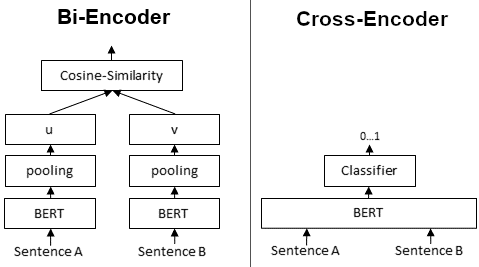

<br>

In [ ]:
# Initialize the cross encoder model with the 'ms-marco-MiniLM-L-6-v2'
cross_encoder = CrossEncoder('cross-encoder/ms-marco-MiniLM-L-6-v2')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/794 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [ ]:
# Input (query, response) pairs for each of the top 10 responses received from the semantic search to the cross encoder

# Prepare inputs for cross-encoder prediction by pairing each query with each response from the results DataFrame.
cross_inputs = [[query, response] for response in results_df['Documents']]

# Predict cross-encoder scores for each query-response pair.
cross_rerank_scores = cross_encoder.predict(cross_inputs)

# Display the cross-encoder scores
cross_rerank_scores

array([2.7680917 , 0.5229326 , 0.9260811 , 0.25922036, 2.5397515 ],
      dtype=float32)

In [ ]:
# Store the reranked scores in the results DataFrame under the column 'Reranked_scores'.
results_df['Reranked_scores'] = cross_rerank_scores

# Display the updated results DataFrame.
results_df

,IDs,Documents,Distances,Metadatas,Reranked_scores
0,13109820,"Green floral print straight kurta, has a round...",0.13812880218029022,"{'Brand': 'Sztori', 'Colour': 'Green', 'Descri...",2.768092
1,17193238,Green printed Kurta with Sharara<br><br><b>Kur...,0.1389651745557785,"{'Brand': 'KALINI', 'Colour': 'Green', 'Descri...",0.522933
2,17455852,Green and yellow printed Kurta with Trousers<b...,0.14336515963077545,"{'Brand': 'Anouk', 'Colour': 'Green', 'Descrip...",0.926081
3,15677426,Green embroidered Kurta with Trousers with dup...,0.15378741919994354,"{'Brand': 'SWAGG INDIA', 'Colour': 'Green', 'D...",0.259220
4,10808284,Make a statement with this green kurta that em...,0.15461677312850952,"{'Brand': 'AHIKA', 'Colour': 'Green', 'Descrip...",2.539752


In [ ]:
# Sort the results DataFrame by 'Reranked_scores' in descending order and select the top 3 entries.
top_3_rerank = results_df.sort_values(by='Reranked_scores', ascending=False)[:3]

# Display the top 3 reranked entries.
top_3_rerank

,IDs,Documents,Distances,Metadatas,Reranked_scores
0,13109820,"Green floral print straight kurta, has a round...",0.13812880218029022,"{'Brand': 'Sztori', 'Colour': 'Green', 'Descri...",2.768092
4,10808284,Make a statement with this green kurta that em...,0.15461677312850952,"{'Brand': 'AHIKA', 'Colour': 'Green', 'Descrip...",2.539752
2,17455852,Green and yellow printed Kurta with Trousers<b...,0.14336515963077545,"{'Brand': 'Anouk', 'Colour': 'Green', 'Descrip...",0.926081


<a id='layer2_all'></a>
### <p style="color: #333333; background-color: #ffc0cb;"> Semantic Search with Re-ranking </p>

In [ ]:
def SemanticSearchWithReranking(query=None, top_n=5, imshow=True):
    # If query is not provided, prompt the user to enter a query
    if query is None:
        query = input()

    print()
    print('*'*50)
    print('Query : ', query)
    print('*'*50)
    print()

    # Query the main or cache collection based on the input query
    query_results_df = query_from_main_or_cache_collection(query)

    # Prepare inputs for cross-encoder prediction and predict rerank scores
    cross_inputs = [[query, response] for response in query_results_df['Documents']]
    cross_rerank_scores = cross_encoder.predict(cross_inputs)

    # Store reranked scores in the results DataFrame
    query_results_df['Reranked_scores'] = cross_rerank_scores

    # Select top n reranked entries
    top_n_rerank = query_results_df.sort_values(by='Reranked_scores', ascending=False)[:top_n]

    if imshow is True:
      # Display images corresponding to the IDs side by side
      num_images = len(top_n_rerank['IDs'])
      fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

      # Set the title of the plot as the user query
      fig.suptitle(f"Top {top_n} Search Layer", fontsize=16)

      for i, item_id in enumerate(top_n_rerank['IDs']):
          # Construct the path to the image file
          image_path = os.path.join(images_folder_path, str(item_id) + '.jpg')

          # Check if the image file exists
          if os.path.exists(image_path):
              # Open and display the image
              img = Image.open(image_path)
              axes[i].imshow(img)
              axes[i].axis('off')
              axes[i].set_title(f"ID: {item_id}")
          else:
              print(f"Image not found for item ID: {item_id}")

      plt.tight_layout()
      plt.show()

    return top_n_rerank

In [ ]:
# An example semantic search
SemanticSearchWithReranking('green fabric kurta with floral printed')


**************************************************
Query :  green fabric kurta with floral printed
**************************************************

[INFO] : Found in cache!


,IDs,Documents,Distances,Metadatas,Reranked_scores
0,13109820,"Green floral print straight kurta, has a round...",0.13812880218029022,"{'Brand': 'Sztori', 'Colour': 'Green', 'Descri...",8.269730
1,17193238,Green printed Kurta with Sharara<br><br><b>Kur...,0.1389651745557785,"{'Brand': 'KALINI', 'Colour': 'Green', 'Descri...",7.825281
4,10808284,Make a statement with this green kurta that em...,0.15461677312850952,"{'Brand': 'AHIKA', 'Colour': 'Green', 'Descrip...",7.699013


---

<a id='layer3'></a>
## Layer 3 : Generative Search

Now that we have the final top semantic search results with reranking, we can pass it to an GPT 3.5 along with the user query and a well-engineered prompt, to generate a direct answer to the query rather than returning the stored result.

In [ ]:
with open(file_path + "OPENAI_API_Key.txt", "r") as f:
    openai.api_key = ' '.join(f.readlines())s

In [ ]:
# Generate a response using GPT-3.5's ChatCompletion based on the user query and retrieved information.
def generate_response(query, top_3_RAG):
    """
    Generate a response using GPT-3.5's ChatCompletion based on the user query and retrieved information.
    """
    messages = [
                {"role": "system", "content":  "You are a fashion expert who can showcase a product in such a way that the user gets satisfied."},
                {"role": "user", "content": f"""You are a fashion expert who can showcase a product in such a way that the user gets satisfied.
                                                You have a question asked by the user in '{query}' and you have some search results from a corpus of fashion products database in the dataframe '{results_df}'. These search results are essentially a product that may be relevant to the user query.

                                                The column 'documents' inside this dataframe contains the actual description of the product.

                                                Use the documents in '{top_3_RAG}' to answer the query '{query}'. Frame an informative answer and also, use the dataframe to return product details.
                                                Also ,Use the data from 'Attributes' and provide an answer related to the query '{query}'

                                                Follow the guidelines below when performing the task.
                                                1. Try to provide relevant/accurate numbers if available.
                                                2. You don’t have to necessarily use all the information in the dataframe. Only choose information that is relevant.
                                                3. If you can't provide the complete answer, please provide a disclaimer.
                                                4. Do not use keywords which are similar to 'database', 'results', 'search'
                                                5. Do not start with a welcome note and do not close the conversation with a follow up statement or question else you will be heavily penalized.

                                                The generated response should answer the query directly addressing the user and avoiding additional information.
                                                If you think that the query is not relevant to the document, reply with a best possible response.
                                                Provide the final simple, clear and natural response in a well-formatted and easily readable text.
                                                """},
              ]

    response = openai.chat.completions.create(
        model="gpt-3.5-turbo",
        messages=messages
    )

    return response.choices[0].message.content.split('\n')

In [ ]:
import ast
from IPython.display import display, HTML

def wrap_text(text, line_length=15):
    words = text.split()
    wrapped_text = '\n'.join([' '.join(words[i:i+line_length]) for i in range(0, len(words), line_length)])
    return wrapped_text

# Display an image corresponding to a product result from the dataframe.
def display_image(result_df):
    # Extract metadata from the input result
    metadata_string = result_df['Metadatas']

    # Convert metadata string to dictionary and extract image number
    try:
        metadata_dict = ast.literal_eval(metadata_string)
        imgNo_string = str(metadata_dict['Product_id'])
    except ValueError:
        imgNo_string = str(metadata_string['Product_id'])

    # Construct path to the image
    img_path = images_folder_path + imgNo_string +".jpg"

    # Display the image
    image = Image.open(img_path).resize((240, 300))
    display(image)

def print_response_and_display_image(result_df, response, result_text = "Response:"):
    # Prepare the response text
    response_text = ' '.join(response)  # Combine list of strings into one string
    wrapped_text = wrap_text(response_text)

            # Display the text on the right using HTML
    html_content = f"""
        <div style="padding-left: 2px;">
            <h3>{result_text}</h3>
            <p style="font-size: 14px; line-height: 1.5;">{wrapped_text}</p>
             <p style="font-size: 14px; line-height: 1.5;">The suggested product looks like</p>
        </div>
        """
    display(HTML(html_content))

    # Display the image of the suggested product
    display_image(result_df)

In [ ]:
# Perform generative search by combining semantic search with reranking and generating a response.
def GenerativeSearch(query=None):
    # If query is not provided, prompt the user to input a query
    if query is None:
        query = input()

    # Perform semantic search with reranking to retrieve the top 3 most relevant results
    semantic_search_df = SemanticSearchWithReranking(query, top_n=5, imshow = False)
    # Reset the index for proper iteration
    semantic_search_df = semantic_search_df.reset_index()

    for index, result in semantic_search_df.iterrows():
        if index == 0:
            # Generate a response based on the query and retrieved information
            response = generate_response(query, result[['Documents']])
            print_response_and_display_image(result_df=result, response=response, result_text="Top product")
        else:
            # Check if the current result is close to the previous result
            if abs(previous_rank_score - result['Reranked_scores']) <= 0.5:
                # Generate a response based on the query and retrieved information
                response = generate_response(query, result[['Documents']])
                print_response_and_display_image(result_df=result, response=response, result_text="Similar product")
            # If not close enough, break the loop and stop suggesting similar products
            else:
                break
        # Store the current rerank score to compare in the next cycle
        previous_rank_score = result['Reranked_scores']


**************************************************
Query :  Maroon blazer for casual occasion from Van Heusen
**************************************************

[INFO] : Found in cache!


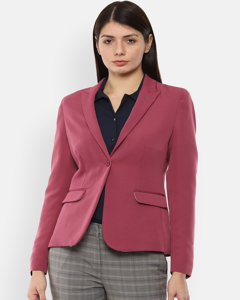

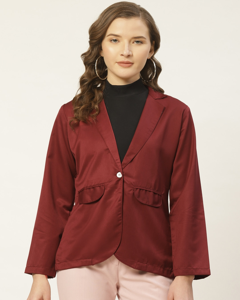

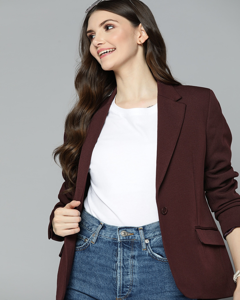

In [ ]:
# An example generative search
GenerativeSearch('Maroon blazer for casual occasion from Van Heusen')

---
<a id='exp'></a>
## Experimenting with queries

#### Query 1 : "I’m looking for jeans and a top in size XL, suitable for travel."


**************************************************
Query :  I’m looking for jeans and a top in size XL, suitable for travel.
**************************************************

[INFO] : Found in cache!


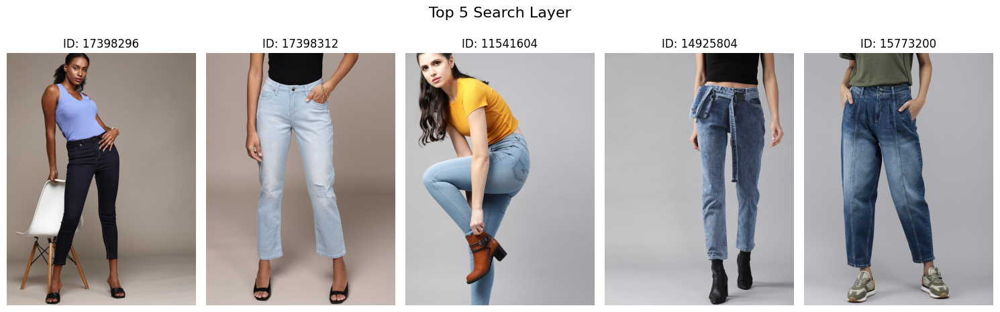

,IDs,Documents,Distances,Metadatas,Reranked_scores
1,17398296,Denims are all about effortless styling option...,0.3258184790611267,"{'Brand': 'bebe', 'Colour': 'Blue', 'Descripti...",-6.368250
0,17398312,Denims are all about effortless styling option...,0.32450056076049805,"{'Brand': 'bebe', 'Colour': 'Blue', 'Descripti...",-6.804776
3,11541604,<ul><li>Light no fade blue jeans</li><li>Super...,0.3287436068058014,"{'Brand': 'Roadster', 'Colour': 'Blue', 'Descr...",-7.412716
4,14925804,"<ul><li>Medium shade, light fade blue jeans</l...",0.32932934165000916,"{'Brand': 'Roadster', 'Colour': 'Blue', 'Descr...",-8.096825
2,15773200,"<ul><li>Medium shade, light fade blue jeans</l...",0.32671624422073364,"{'Brand': 'Roadster', 'Colour': 'Blue', 'Descr...",-8.343880


In [ ]:
SemanticSearchWithReranking("I’m looking for jeans and a top in size XL, suitable for travel.")


**************************************************
Query :  I’m looking for jeans and a top in size XL, suitable for travel.
**************************************************

[INFO] : Found in cache!


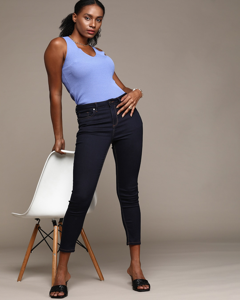

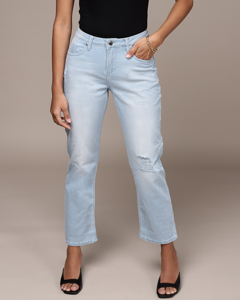

In [ ]:
GenerativeSearch("I’m looking for jeans and a top in size XL, suitable for travel.")

#### Query 2 : "I'm looking for a denim jacket that includes at least four pockets. Ideally, it should be versatile and functional, fitting well with different outfits."


**************************************************
Query :  I'm looking for a denim jacket that includes at least four pockets. Ideally, it should be versatile and functional, fitting well with different outfits.
**************************************************

[INFO] : Found in cache!


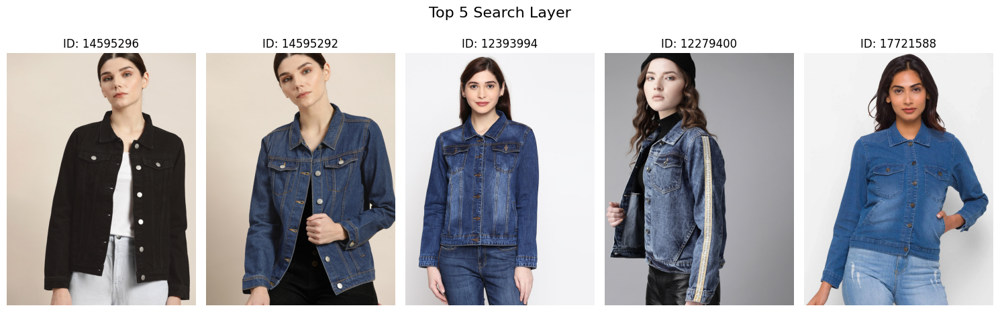

,IDs,Documents,Distances,Metadatas,Reranked_scores
4,14595296,"Black solid denim jacket, has a spread collar,...",0.24267876148223877,"{'Brand': 'ether', 'Colour': 'Black', 'Descrip...",2.494774
1,14595292,"Blue solid denim jacket, has a spread collar, ...",0.24151350557804108,"{'Brand': 'ether', 'Colour': 'Blue', 'Descript...",2.491580
0,12393994,"Blue faded Denim jacket, has a spread collar, ...",0.22748807072639465,"{'Brand': 'High Star', 'Colour': 'Blue', 'Desc...",2.169213
3,12279400,"Blue washed denim jacket, has a spread collar,...",0.24255718290805817,"{'Brand': 'Roadster', 'Colour': 'Blue', 'Descr...",2.122835
2,17721588,Blue washed checked lightweight denim jacket ...,0.24178549647331238,"{'Brand': 'ZOLA', 'Colour': 'Blue', 'Descripti...",1.410115


In [ ]:
SemanticSearchWithReranking("I'm looking for a denim jacket that includes at least four pockets. Ideally, it should be versatile and functional, fitting well with different outfits.")


**************************************************
Query :  I'm looking for a denim jacket that includes at least four pockets. Ideally, it should be versatile and functional, fitting well with different outfits.
**************************************************

[INFO] : Found in cache!


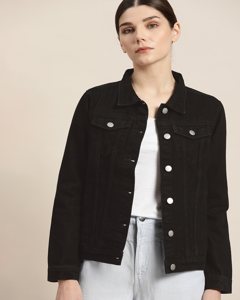

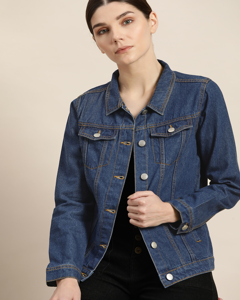

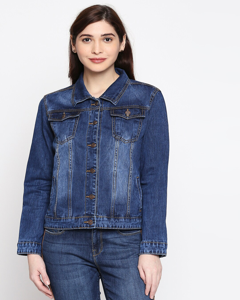

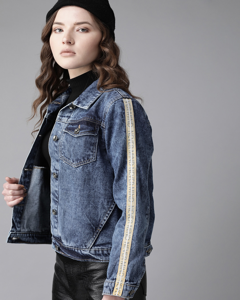

In [ ]:
GenerativeSearch("I'm looking for a denim jacket that includes at least four pockets. Ideally, it should be versatile and functional, fitting well with different outfits.")

---

#### Query 3 : "I'm searching for elegant office wear sarees in colors such as pink, violet, or green. I prefer sarees that feature full embroidery and are suitable for professional environments. Quality is my top priority, so there’s no specific price range. These sarees will be used for office meetings and formal occasions."


**************************************************
Query :  I'm searching for elegant office wear sarees in colors such as pink, violet, or green. I prefer sarees that feature full embroidery and are suitable for professional environments. Quality is my top priority, so there’s no specific price range. These sarees will be used for office meetings and formal occasions.
**************************************************

[INFO] : Found in cache!


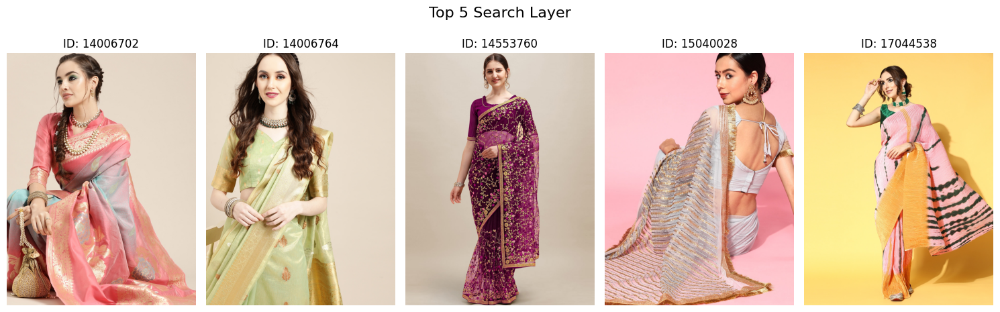

,IDs,Documents,Distances,Metadatas,Reranked_scores
1,14006702,Breathe life into your ethnic collection by ad...,0.29860931634902954,"{'Brand': 'Saree mall', 'Colour': 'Pink', 'Des...",2.267251
0,14006764,"Offering both style and elegance, this saree i...",0.28720518946647644,"{'Brand': 'Saree mall', 'Colour': 'Green', 'De...",1.359351
2,14553760,<b>Design Details </b><ul><li>Purple and pink ...,0.3045988976955414,"{'Brand': 'RAJGRANTH', 'Colour': 'Purple', 'De...",0.204429
4,15040028,Dress up or dress down this modish saree for a...,0.3096614181995392,"{'Brand': 'Tikhi Imli', 'Colour': 'Navy Blue',...",0.044781
3,17044538,Pick up this stylish saree for the perfect eve...,0.3087860345840454,"{'Brand': 'Mitera', 'Colour': 'Pink', 'Descrip...",-0.347494


In [ ]:
SemanticSearchWithReranking("I'm searching for elegant office wear sarees in colors such as pink, violet, or green. I prefer sarees that feature full embroidery and are suitable for professional environments. Quality is my top priority, so there’s no specific price range. These sarees will be used for office meetings and formal occasions.")


**************************************************
Query :  I'm searching for elegant office wear sarees in colors such as pink, violet, or green. I prefer sarees that feature full embroidery and are suitable for professional environments. Quality is my top priority, so there’s no specific price range. These sarees will be used for office meetings and formal occasions.
**************************************************

[INFO] : Found in cache!


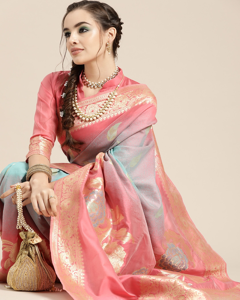

In [ ]:
GenerativeSearch("I'm searching for elegant office wear sarees in colors such as pink, violet, or green. I prefer sarees that feature full embroidery and are suitable for professional environments. Quality is my top priority, so there’s no specific price range. These sarees will be used for office meetings and formal occasions.")

## Conclusion
The comparison between the search and generation layers reveals that the generation layer
produces more detailed and comprehensible results. While the search layer retrieves relevant
information through keyword matching or criteria, the generation layer goes further by using
advanced AI models like GPT-3.5 to dynamically generate context-aware responses.

This generation layer’s ability to understand query context and provide responses in natural
language enhances both readability and user engagement. It can adapt to different query
formats and offer customized answers, effectively catering to a wide range of user
preferences.

Overall, while the search layer is effective in retrieving relevant data, the generation layer
significantly improves the quality and clarity of responses, making it the preferred option for
tasks requiring detailed and user-friendly answers